In [18]:
import numpy as np
# Convert to numeric and handle non-numeric columns
X_train = X_train.apply(pd.to_numeric, errors='coerce')  # Convert to numeric, setting errors to NaN
print(X_train.dtypes)
non_numeric_columns = X_train.select_dtypes(exclude=[np.number]).columns
print("Non-numeric columns:", non_numeric_columns)
X_train = X_train.apply(pd.to_numeric, errors='coerce')  # Convert to numeric, setting errors to NaN
X_train = X_train.dropna()  # Drop rows with NaN values
print(X_train.shape)

feature1    int64
feature2    int64
dtype: object
Non-numeric columns: Index([], dtype='object')
(4, 2)


In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Sample DataFrame creation (replace this with your actual data)
data = pd.DataFrame({
    'feature1': [1, 2, 3, 4, 5],
    'feature2': [5, 4, 3, 2, 1],
    'target': [0, 1, 0, 1, 0]
})

# Define features and target
X = data.drop(columns=['target'])
y = data['target']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Checking multicollinearity of X_train
vif = pd.DataFrame()
vif["Variable"] = X_train.columns
vif["VIF"] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]

print(vif)

   Variable       VIF
0  feature1  1.578571
1  feature2  1.578571


In [17]:
import time
import pandas as pd
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier

# Define the algorithms
algorithms = [
    LogisticRegression(n_jobs=-1, random_state=42),
    DecisionTreeClassifier(random_state=42),
    KNeighborsClassifier(n_jobs=-1),
    GaussianNB(),
    AdaBoostClassifier(random_state=42),
    GradientBoostingClassifier(random_state=42),
    RandomForestClassifier(n_jobs=-1, random_state=42),
    XGBClassifier(n_jobs=-1, random_state=42),
    SVC(random_state=42)
]

# Initialize the results dictionary for training data
results_train = {
    'Algorithm': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-score': [],
    'Building Time (s)': []
}

# Apply the algorithms and calculate performance metrics for training data
for algorithm in algorithms:
    start_time = time.time()  # Start timer

    algorithm_name = type(algorithm).__name__
    
    try:
        # Fit the algorithm
        algorithm.fit(X_train, y_train)
        y_train_pred = algorithm.predict(X_train)

        # Calculate metrics
        accuracy = accuracy_score(y_train, y_train_pred)
        precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
        recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
        f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)

        end_time = time.time()  # End timer
        building_time = end_time - start_time

        # Append results
        results_train['Algorithm'].append(algorithm_name)
        results_train['Accuracy'].append(accuracy)
        results_train['Precision'].append(precision)
        results_train['Recall'].append(recall)
        results_train['F1-score'].append(f1)
        results_train['Building Time (s)'].append(building_time)

    except Exception as e:
        print(f"Error with {algorithm_name}: {e}")

# Create a dataframe for the training data results
df_train = pd.DataFrame(results_train)

# Display the results
print(df_train)

Error with KNeighborsClassifier: 'Flags' object has no attribute 'c_contiguous'
                    Algorithm  Accuracy  Precision  Recall  F1-score  \
0          LogisticRegression      0.75     0.5625    0.75  0.642857   
1      DecisionTreeClassifier      1.00     1.0000    1.00  1.000000   
2                  GaussianNB      1.00     1.0000    1.00  1.000000   
3          AdaBoostClassifier      1.00     1.0000    1.00  1.000000   
4  GradientBoostingClassifier      1.00     1.0000    1.00  1.000000   
5      RandomForestClassifier      1.00     1.0000    1.00  1.000000   
6               XGBClassifier      0.75     0.5625    0.75  0.642857   
7                         SVC      0.75     0.5625    0.75  0.642857   

   Building Time (s)  
0           5.124900  
1           0.034737  
2           0.020267  
3           0.128098  
4           0.107581  
5           0.385037  
6           0.175408  
7           0.018056  


In [20]:
import time
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier

# Define the algorithms
algorithms = [
    LogisticRegression(n_jobs=-1, random_state=42),
    DecisionTreeClassifier(random_state=42),
    KNeighborsClassifier(n_jobs=-1),
    GaussianNB(),
    AdaBoostClassifier(random_state=42),
    GradientBoostingClassifier(random_state=42),
    RandomForestClassifier(n_jobs=-1, random_state=42),
    XGBClassifier(n_jobs=-1, random_state=42),
    SVC(random_state=42)
]

# Initialize the results dictionary for training data
results_train = {
    'Algorithm': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-score': [],
    'Building Time (s)': []
}

# Convert to numeric and handle missing values
X_train = X_train.apply(pd.to_numeric, errors='coerce')
X_train.fillna(X_train.mean(), inplace=True)

# Apply the algorithms and calculate performance metrics for training data
for algorithm in algorithms:
    start_time = time.time()  # Start timer

    algorithm_name = type(algorithm).__name__
    
    try:
        algorithm.fit(X_train, y_train)
        y_train_pred = algorithm.predict(X_train)

        accuracy = accuracy_score(y_train, y_train_pred)
        precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
        recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
        f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)

        end_time = time.time()  # End timer
        building_time = end_time - start_time

        # Append results
        results_train['Algorithm'].append(algorithm_name)
        results_train['Accuracy'].append(accuracy)
        results_train['Precision'].append(precision)
        results_train['Recall'].append(recall)
        results_train['F1-score'].append(f1)
        results_train['Building Time (s)'].append(building_time)

    except Exception as e:
        print(f"Error with {algorithm_name}: {e}")

# Create a dataframe for the training data results
df_train = pd.DataFrame(results_train)

# Display the results
print(df_train)

Error with KNeighborsClassifier: 'Flags' object has no attribute 'c_contiguous'
                    Algorithm  Accuracy  Precision  Recall  F1-score  \
0          LogisticRegression      0.75     0.5625    0.75  0.642857   
1      DecisionTreeClassifier      1.00     1.0000    1.00  1.000000   
2                  GaussianNB      1.00     1.0000    1.00  1.000000   
3          AdaBoostClassifier      1.00     1.0000    1.00  1.000000   
4  GradientBoostingClassifier      1.00     1.0000    1.00  1.000000   
5      RandomForestClassifier      1.00     1.0000    1.00  1.000000   
6               XGBClassifier      0.75     0.5625    0.75  0.642857   
7                         SVC      0.75     0.5625    0.75  0.642857   

   Building Time (s)  
0           1.956691  
1           0.018543  
2           0.017740  
3           0.164801  
4           0.112153  
5           0.487382  
6           0.115176  
7           0.017971  


In [22]:
# Check available columns in X_train
print("Available columns in X_train:", X_train.columns.tolist())

# Attempt to select the desired columns
try:
    X_train = X_train[['Monthly_Bill', 'Total_Usage_GB', 'Age', 'Subscription_Length_Months']]
except KeyError as e:
    print(f"KeyError: {e}. Please check the column names.")

Available columns in X_train: ['feature1', 'feature2']
KeyError: "None of [Index(['Monthly_Bill', 'Total_Usage_GB', 'Age', 'Subscription_Length_Months'], dtype='object')] are in the [columns]". Please check the column names.


In [25]:
import time
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier

# Define the algorithms
algorithms = [
    LogisticRegression(n_jobs=-1, random_state=42),
    DecisionTreeClassifier(random_state=42),
    KNeighborsClassifier(n_jobs=-1),
    GaussianNB(),
    AdaBoostClassifier(random_state=42),
    GradientBoostingClassifier(random_state=42),
    RandomForestClassifier(n_jobs=-1, random_state=42),
    XGBClassifier(n_jobs=-1, random_state=42),
    SVC(random_state=42)
]

# Initialize the results dictionary for training data
results_train = {
    'Algorithm': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-score': [],
    'Building Time (s)': []
}

# Convert to numeric and handle missing values
X_train = X_train.apply(pd.to_numeric, errors='coerce')
X_train.fillna(X_train.mean(), inplace=True)  # Fill NaNs with column means

# Apply the algorithms and calculate performance metrics for training data
for algorithm in algorithms:
    start_time = time.time()  # Start timer

    algorithm_name = type(algorithm).__name__
    
    try:
        algorithm.fit(X_train, y_train)
        y_train_pred = algorithm.predict(X_train)

        accuracy = accuracy_score(y_train, y_train_pred)
        precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
        recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
        f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)

        end_time = time.time()  # End timer
        building_time = end_time - start_time

        # Append results
        results_train['Algorithm'].append(algorithm_name)
        results_train['Accuracy'].append(accuracy)
        results_train['Precision'].append(precision)
        results_train['Recall'].append(recall)
        results_train['F1-score'].append(f1)
        results_train['Building Time (s)'].append(building_time)

    except Exception as e:
        print(f"Error with {algorithm_name}: {e}")

# Create a dataframe for the training data results
df_train = pd.DataFrame(results_train)

# Display the results
print(df_train)

Error with KNeighborsClassifier: 'Flags' object has no attribute 'c_contiguous'
                    Algorithm  Accuracy  Precision  Recall  F1-score  \
0          LogisticRegression      0.75     0.5625    0.75  0.642857   
1      DecisionTreeClassifier      1.00     1.0000    1.00  1.000000   
2                  GaussianNB      1.00     1.0000    1.00  1.000000   
3          AdaBoostClassifier      1.00     1.0000    1.00  1.000000   
4  GradientBoostingClassifier      1.00     1.0000    1.00  1.000000   
5      RandomForestClassifier      1.00     1.0000    1.00  1.000000   
6               XGBClassifier      0.75     0.5625    0.75  0.642857   
7                         SVC      0.75     0.5625    0.75  0.642857   

   Building Time (s)  
0           0.368663  
1           0.082871  
2           0.031621  
3           0.227881  
4           0.066270  
5           0.355449  
6           0.193502  
7           0.025233  


In [29]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Dense, BatchNormalization, Activation, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import recall_score

In [28]:
import time
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier

# Define the algorithms
algorithms = [
    LogisticRegression(n_jobs=-1, random_state=42),
    DecisionTreeClassifier(random_state=42),
    KNeighborsClassifier(n_jobs=-1),
    GaussianNB(),
    AdaBoostClassifier(random_state=42),
    GradientBoostingClassifier(random_state=42),
    RandomForestClassifier(n_jobs=-1, random_state=42),
    XGBClassifier(n_jobs=-1, random_state=42),
    SVC(random_state=42)
]

# Initialize the results dictionary for training data
results_train = {
    'Algorithm': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-score': [],
    'Building Time (s)': []
}

# Convert to numeric and handle missing values
X_train = X_train.apply(pd.to_numeric, errors='coerce')
X_train.fillna(X_train.mean(), inplace=True)  # Fill NaNs with column means

# Apply the algorithms and calculate performance metrics for training data
for algorithm in algorithms:
    start_time = time.time()  # Start timer

    algorithm_name = type(algorithm).__name__
    
    try:
        algorithm.fit(X_train, y_train)
        y_train_pred = algorithm.predict(X_train)

        accuracy = accuracy_score(y_train, y_train_pred)
        precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
        recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
        f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)

        end_time = time.time()  # End timer
        building_time = end_time - start_time

        # Append results
        results_train['Algorithm'].append(algorithm_name)
        results_train['Accuracy'].append(accuracy)
        results_train['Precision'].append(precision)
        results_train['Recall'].append(recall)
        results_train['F1-score'].append(f1)
        results_train['Building Time (s)'].append(building_time)

    except Exception as e:
        print(f"Error with {algorithm_name}: {e}")

# Create a dataframe for the training data results
df_train = pd.DataFrame(results_train)

# Display the results
print(df_train)

Error with KNeighborsClassifier: 'Flags' object has no attribute 'c_contiguous'
                    Algorithm  Accuracy  Precision  Recall  F1-score  \
0          LogisticRegression      0.75     0.5625    0.75  0.642857   
1      DecisionTreeClassifier      1.00     1.0000    1.00  1.000000   
2                  GaussianNB      1.00     1.0000    1.00  1.000000   
3          AdaBoostClassifier      1.00     1.0000    1.00  1.000000   
4  GradientBoostingClassifier      1.00     1.0000    1.00  1.000000   
5      RandomForestClassifier      1.00     1.0000    1.00  1.000000   
6               XGBClassifier      0.75     0.5625    0.75  0.642857   
7                         SVC      0.75     0.5625    0.75  0.642857   

   Building Time (s)  
0           2.512786  
1           0.057453  
2           0.040064  
3           0.417165  
4           0.225403  
5           0.935802  
6           0.347673  
7           0.131338  


In [ ]:
Build Neural Network Architectures & Fit Model on Training Data

In [ ]:
Architecture I

In [32]:
from keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf

# Define the EarlyStopping and ModelCheckpoint callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',        # The metric to monitor. This is usually the validation loss.
    min_delta=0.001,           # The minimum amount of improvement required to consider the model to have improved.
    patience=10,               # Number of epochs with no improvement after which training will be stopped.
    verbose=1,
    restore_best_weights=True   # Whether to restore the model weights at the epoch with the best validation loss.
)

checkpoint = ModelCheckpoint('ChurnClassifier.keras', monitor='val_loss', verbose=1, save_best_only=True, mode='min')

# Define your model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Fit the model with the callbacks
model.fit(X_train, y_train, validation_split=0.2, epochs=50, callbacks=[early_stopping, checkpoint])

C:\Users\SUDEEP MADAGONDA\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.0000e+00 - loss: 1.1586
Epoch 1: val_loss improved from inf to 0.49790, saving model to ChurnClassifier.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - accuracy: 0.0000e+00 - loss: 1.1586 - val_accuracy: 1.0000 - val_loss: 0.4979
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.0000e+00 - loss: 1.0253
Epoch 2: val_loss did not improve from 0.49790
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.0000e+00 - loss: 1.0253 - val_accuracy: 1.0000 - val_loss: 0.5727
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.0000e+00 - loss: 0.9032
Epoch 3: val_loss did not improve from 0.49790
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.0000e+00 - loss: 0.9032 - val_accuracy: 1.0000 - val_loss: 0.6524
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.0000e+00 - loss: 0.7959
Epoch 4: val_loss did not improve from 0.49790
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.0000e+00 - loss: 0.7

In [35]:
# Check available columns in X_train
print("Available columns in X_train:", X_train.columns.tolist())

# Attempt to select the desired columns
try:
    X_train = X_train[['Monthly_Bill', 'Total_Usage_GB', 'Age', 'Subscription_Length_Months']]
except KeyError as e:
    print(f"KeyError: {e}. Please check the column names.")

Available columns in X_train: ['feature1', 'feature2']
KeyError: "None of [Index(['Monthly_Bill', 'Total_Usage_GB', 'Age', 'Subscription_Length_Months'], dtype='object')] are in the [columns]". Please check the column names.


In [ ]:
Architecture II

In [43]:
from sklearn.preprocessing import StandardScaler

# Normalize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Define your model
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(X_train_scaled.shape[1],)),  # Use the number of features
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Fit the model with the callbacks
history = model.fit(X_train_scaled, y_train, validation_split=0.3, epochs=100, batch_size=128, callbacks=[early_stopping, checkpoint], verbose=1)

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.5000 - loss: 0.6848
Epoch 1: val_loss improved from inf to 0.72223, saving model to ChurnClassifier.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - accuracy: 0.5000 - loss: 0.6848 - val_accuracy: 0.0000e+00 - val_loss: 0.7222
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - accuracy: 1.0000 - loss: 0.6651
Epoch 2: val_loss improved from 0.72223 to 0.70752, saving model to ChurnClassifier.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step - accuracy: 1.0000 - loss: 0.6651 - val_accuracy: 0.5000 - val_loss: 0.7075
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 1.0000 - loss: 0.6463
Epoch 3: val_loss improved from 0.70752 to 0.69407, saving model to ChurnClassifier.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 1.0000 - loss: 0.6463 - val_accuracy: 0.5000 - val_loss: 0.6941
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 1.0000 - loss: 0.6283
Epoch 4: val_loss improved from 0.69407 to 0.68203, sa

In [ ]:
Architecture III

In [44]:
from sklearn.preprocessing import StandardScaler

# Normalize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Define your model
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(X_train_scaled.shape[1],)),  # Use the number of features
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Fit the model with the callbacks
history = model.fit(X_train_scaled, y_train, validation_split=0.3, epochs=100, batch_size=128, callbacks=[early_stopping, checkpoint], verbose=1)

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 1.0000 - loss: 0.6656
Epoch 1: val_loss did not improve from 0.61171
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 1.0000 - loss: 0.6656 - val_accuracy: 0.5000 - val_loss: 0.6595
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 1.0000 - loss: 0.6457
Epoch 2: val_loss did not improve from 0.61171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - accuracy: 1.0000 - loss: 0.6457 - val_accuracy: 0.5000 - val_loss: 0.6484
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 1.0000 - loss: 0.6273
Epoch 3: val_loss did not improve from 0.61171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 1.0000 - loss: 0.6273 - val_accuracy: 0.5000 - val_loss: 0.6404
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 1.0000 - loss: 0.6094
Epoch 4: val_loss did not improve from 0.61171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - accuracy: 1.0000 - loss: 0.6094 - val_accuracy: 0.5000 - val_loss: 0.6341
Epoch 5/100
1/1 ━━━━━

In [ ]:
Architecture IV

In [45]:
from sklearn.preprocessing import StandardScaler

# Normalize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Define your model
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(X_train_scaled.shape[1],)),  # Use the number of features
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Fit the model with the callbacks
history = model.fit(X_train_scaled, y_train, validation_split=0.3, epochs=100, batch_size=128, callbacks=[early_stopping, checkpoint], verbose=1)

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.0000e+00 - loss: 0.7074
Epoch 1: val_loss did not improve from 0.61171
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - accuracy: 0.0000e+00 - loss: 0.7074 - val_accuracy: 0.5000 - val_loss: 0.6787
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 1.0000 - loss: 0.6829
Epoch 2: val_loss did not improve from 0.61171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 1.0000 - loss: 0.6829 - val_accuracy: 0.5000 - val_loss: 0.6688
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 1.0000 - loss: 0.6628
Epoch 3: val_loss did not improve from 0.61171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - accuracy: 1.0000 - loss: 0.6628 - val_accuracy: 0.5000 - val_loss: 0.6613
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 1.0000 - loss: 0.6434
Epoch 4: val_loss did not improve from 0.61171
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 1.0000 - loss: 0.6434 - val_accuracy: 0.5000 - val_loss: 0.6543
Epoch 5/100
1

In [ ]:
Architecture V

In [52]:
from sklearn.preprocessing import StandardScaler

# Normalize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Define your model
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(X_train_scaled.shape[1],)),  # Use the number of features
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# Train the model
history = model.fit(X_train_scaled, y_train, epochs=100, batch_size=128, validation_split=0.2, callbacks=[early_stopping, checkpoint],
                    verbose=1)

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.0000e+00 - loss: 0.7373
Epoch 1: val_loss did not improve from 0.54042
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.0000e+00 - loss: 0.7373 - val_accuracy: 0.0000e+00 - val_loss: 0.6958
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.3333 - loss: 0.6996
Epoch 2: val_loss did not improve from 0.54042
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.3333 - loss: 0.6996 - val_accuracy: 0.0000e+00 - val_loss: 0.7171
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 1.0000 - loss: 0.6645
Epoch 3: val_loss did not improve from 0.54042
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 1.0000 - loss: 0.6645 - val_accuracy: 0.0000e+00 - val_loss: 0.7384
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 1.0000 - loss: 0.6314
Epoch 4: val_loss did not improve from 0.54042
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - accuracy: 1.0000 - loss: 0.6314 - val_accuracy: 0.0000e+00 - val_loss: 0.75

In [ ]:
Ensembles of Random Forest

In [53]:
# Initialize base estimator (Random Forest)
base_estimator = RandomForestClassifier(n_estimators=100, random_state=42)

# Initialize models
adaboost_model = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=50, random_state=42)
gradient_boost_model = GradientBoostingClassifier(n_estimators=50, random_state=42)
xgboost_model = XGBClassifier(n_estimators=50, random_state=42)

# Initialize lists to store metrics
models = ['AdaBoost', 'Gradient Boosting', 'XGBoost']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Building Time']
results_train = {metric: [] for metric in metrics}
results_test = {metric: [] for metric in metrics}

# Train and evaluate models
for model in [adaboost_model, gradient_boost_model, xgboost_model]:
    start_time = time.time()
    model.fit(X_train, y_train)
    end_time = time.time()

    # Predict on the training set
    y_train_pred = model.predict(X_train)

    # Calculate metrics on training data
    accuracy_train = accuracy_score(y_train, y_train_pred)
    precision_train = precision_score(y_train, y_train_pred, average='weighted')
    recall_train = recall_score(y_train, y_train_pred, average='weighted')
    f1_train = f1_score(y_train, y_train_pred, average='weighted')
    building_time = end_time - start_time

    # Predict on the test set
    y_test_pred = model.predict(X_test)

    # Calculate metrics on test data
    accuracy_test = accuracy_score(y_test, y_test_pred)
    precision_test = precision_score(y_test, y_test_pred, average='weighted')
    recall_test = recall_score(y_test, y_test_pred, average='weighted')
    f1_test = f1_score(y_test, y_test_pred, average='weighted')

    # Append metrics to the results dictionaries
    results_train['Accuracy'].append(accuracy_train)
    results_train['Precision'].append(precision_train)
    results_train['Recall'].append(recall_train)
    results_train['F1 Score'].append(f1_train)
    results_train['Building Time'].append(building_time)

    results_test['Accuracy'].append(accuracy_test)
    results_test['Precision'].append(precision_test)
    results_test['Recall'].append(recall_test)
    results_test['F1 Score'].append(f1_test)
    results_test['Building Time'].append(building_time)

# Create DataFrames from the results
results_train_df = pd.DataFrame(results_train, index=models)
results_test_df = pd.DataFrame(results_test, index=models)

# Display the DataFrames
print("Training Data Results:")
results_train_df


C:\Users\SUDEEP MADAGONDA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\SUDEEP MADAGONDA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\SUDEEP MADAGONDA\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\SUDEEP MADAGONDA\AppData\Local\Programs\Python\Python311\Lib\site-packages\skle

Training Data Results:


,Accuracy,Precision,Recall,F1 Score,Building Time
AdaBoost,1.00,1.0000,1.00,1.000000,0.676150
Gradient Boosting,1.00,1.0000,1.00,1.000000,0.133463
XGBoost,0.75,0.5625,0.75,0.642857,0.344649


In [54]:
print("\nTest Data Results:")
results_test_df


Test Data Results:


,Accuracy,Precision,Recall,F1 Score,Building Time
AdaBoost,0.0,0.0,0.0,0.0,0.676150
Gradient Boosting,0.0,0.0,0.0,0.0,0.133463
XGBoost,0.0,0.0,0.0,0.0,0.344649


In [ ]:
Model Building: PCA

In [62]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load your data
df = pd.read_excel(r"C:\Users\SUDEEP MADAGONDA\OneDrive\Desktop\Customer Churn Prediction\customer_churn_large_dataset.xlsx")

# Perform data cleaning
df_cleaned = pd.get_dummies(df, columns=['Gender', 'Location'], drop_first=True)

# Define features and target
x = df_cleaned.drop('Churn', axis=1)
y = df_cleaned['Churn']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# Inspect the DataFrame for non-numeric values
print(X_train.head())
print(X_train.dtypes)

# Convert any non-numeric columns to numeric
# Example: X_train['Some_Column'] = pd.to_numeric(X_train['Some_Column'], errors='coerce')

# Handle missing values if any
X_train.fillna(X_train.mean(), inplace=True)  # Fill NaN with mean
# OR
# X_train.dropna(inplace=True)  # Drop rows with NaN

# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert scaled numpy arrays back to DataFrames
X_train = pd.DataFrame(X_train, columns=x.columns)
X_test = pd.DataFrame(X_test, columns=x.columns)

# Display the first few rows of the training set
print(X_train.head())

       CustomerID            Name  Age  Subscription_Length_Months  \
76513       76514  Customer_76514   25                          13   
60406       60407  Customer_60407   54                           2   
27322       27323  Customer_27323   32                          20   
53699       53700  Customer_53700   61                          12   
65412       65413  Customer_65413   70                           5   

       Monthly_Bill  Total_Usage_GB  Gender_Male  Location_Houston  \
76513         98.13             468         True             False   
60406         71.90             383        False              True   
27322         65.65             427         True             False   
53699         83.20              64        False              True   
65412         41.93              99        False             False   

       Location_Los Angeles  Location_Miami  Location_New York  
76513                  True           False              False  
60406                 False 

TypeError: Could not convert ['Customer_76514Customer_60407Customer_27323Customer_53700Customer_65413Customer_14298Customer_15665Customer_49236Customer_99278Customer_13810Customer_86465Customer_81835Customer_11254Customer_46789Customer_69797Customer_35486Customer_20639Customer_18828Customer_57342Customer_64382Customer_2934Customer_64970Customer_44204Customer_8672Customer_64050Customer_3525Customer_65675Customer_79279Customer_79982Customer_53404Customer_45297Customer_453Customer_90365Customer_81840Customer_45485Customer_41806Customer_84369Customer_38353Customer_51714Customer_8747Customer_82553Customer_48166Customer_95384Customer_38214Customer_19620Customer_85429Customer_87953Customer_64021Customer_81313Customer_23615Customer_61195Customer_76646Customer_20962Customer_11036Customer_29954Customer_67210Customer_56275Customer_12346Customer_84754Customer_87772Customer_39998Customer_94333Customer_16955Customer_22647Customer_67008Customer_9290Customer_37886Customer_68822Customer_98199Customer_15609Customer_15800Customer_87880Customer_79695Customer_24203Customer_9054Customer_56663Customer_62898Customer_33297Customer_72899Customer_50723Customer_22905Customer_79708Customer_32699Customer_40941Customer_36609Customer_41271Customer_19369Customer_76830Customer_99274Customer_34103Customer_42259Customer_53760Customer_62718Customer_29706Customer_36050Customer_76417Customer_99079Customer_99317Customer_47263Customer_5012Customer_49361Customer_39943Customer_40154Customer_5925Customer_91213Customer_28905Customer_70471Customer_70878Customer_96163Customer_12693Customer_63245Customer_74970Customer_24342Customer_40147Customer_70708Customer_77558Customer_99264Customer_45995Customer_23051Customer_84981Customer_52091Customer_97588Customer_7878Customer_14082Customer_49425Customer_34953Customer_83372Customer_56336Customer_31209Customer_25579Customer_53316Customer_30632Customer_64568Customer_64771Customer_43364Customer_36671Customer_34480Customer_31932Customer_39001Customer_38357Customer_94388Customer_84450Customer_7743Customer_213Customer_40860Customer_31210Customer_67405Customer_35905Customer_40258Customer_6618Customer_12496Customer_18987Customer_38467Customer_99276Customer_63242Customer_85853Customer_93183Customer_34533Customer_95077Customer_39927Customer_96873Customer_30235Customer_82726Customer_35653Customer_33246Customer_88256Customer_30893Customer_1036Customer_92099Customer_89360Customer_31842Customer_25799Customer_13018Customer_9200Customer_68235Customer_7060Customer_77168Customer_89203Customer_36494Customer_61142Customer_43069Customer_51723Customer_81884Customer_76753Customer_68736Customer_27652Customer_58041Customer_82872Customer_28320Customer_80209Customer_86005Customer_85022Customer_33230Customer_23982Customer_19575Customer_10318Customer_76595Customer_12859Customer_80928Customer_7157Customer_78871Customer_60613Customer_70251Customer_53038Customer_3848Customer_24693Customer_76616Customer_972Customer_45575Customer_50083Customer_6368Customer_68983Customer_33937Customer_63695Customer_12556Customer_18279Customer_88016Customer_60004Customer_85647Customer_3415Customer_88125Customer_6638Customer_75640Customer_23859Customer_66361Customer_70583Customer_71229Customer_87382Customer_14382Customer_20625Customer_42884Customer_94718Customer_94399Customer_98630Customer_95042Customer_10630Customer_6160Customer_40587Customer_71462Customer_52373Customer_95376Customer_48442Customer_25028Customer_61876Customer_93121Customer_45523Customer_54538Customer_77529Customer_61872Customer_17839Customer_73816Customer_80871Customer_34431Customer_87308Customer_22835Customer_49072Customer_89575Customer_73111Customer_70733Customer_60758Customer_46037Customer_10792Customer_73469Customer_1411Customer_80412Customer_61818Customer_23618Customer_96109Customer_8371Customer_7555Customer_44850Customer_63922Customer_55546Customer_17931Customer_69409Customer_20976Customer_78928Customer_82740Customer_78779Customer_89325Customer_41039Customer_40868Customer_15855Customer_5893Customer_83706Customer_21409Customer_96290Customer_82515Customer_17180Customer_64393Customer_71172Customer_85006Customer_9456Customer_93598Customer_53544Customer_36002Customer_75332Customer_61207Customer_4071Customer_34317Customer_97719Customer_41214Customer_8404Customer_87010Customer_87866Customer_74515Customer_78167Customer_20268Customer_27756Customer_12798Customer_83259Customer_4395Customer_2449Customer_3419Customer_4212Customer_98964Customer_26131Customer_1229Customer_54248Customer_77608Customer_50528Customer_65128Customer_70761Customer_33681Customer_63489Customer_44634Customer_6226Customer_90668Customer_59825Customer_55887Customer_14999Customer_33255Customer_26025Customer_53971Customer_65755Customer_84213Customer_91936Customer_92906Customer_30879Customer_98558Customer_44869Customer_94853Customer_57846Customer_74747Customer_43786Customer_78451Customer_1267Customer_40994Customer_64509Customer_11979Customer_59756Customer_81331Customer_64441Customer_76137Customer_7183Customer_36521Customer_72698Customer_69201Customer_42742Customer_64120Customer_92226Customer_75246Customer_38162Customer_16300Customer_96779Customer_60434Customer_87941Customer_86676Customer_31581Customer_54675Customer_23380Customer_23279Customer_9842Customer_54399Customer_60731Customer_52172Customer_70867Customer_25985Customer_28373Customer_58547Customer_9175Customer_73500Customer_342Customer_41903Customer_84094Customer_14387Customer_65293Customer_42197Customer_51015Customer_91521Customer_4385Customer_84805Customer_93104Customer_92300Customer_71904Customer_36217Customer_60769Customer_46968Customer_95647Customer_48265Customer_64181Customer_35812Customer_77454Customer_24544Customer_44933Customer_21155Customer_15119Customer_38593Customer_80420Customer_249Customer_32397Customer_77680Customer_62927Customer_81757Customer_48947Customer_90309Customer_79534Customer_90838Customer_62276Customer_76759Customer_79729Customer_19231Customer_41339Customer_54089Customer_34669Customer_9083Customer_72897Customer_10802Customer_91074Customer_86101Customer_35413Customer_31672Customer_11465Customer_7402Customer_92215Customer_13292Customer_5091Customer_69711Customer_41252Customer_44663Customer_74924Customer_60779Customer_50936Customer_28624Customer_82172Customer_25583Customer_14774Customer_98803Customer_65722Customer_94982Customer_16746Customer_97081Customer_36516Customer_88416Customer_18335Customer_80622Customer_7519Customer_57781Customer_92951Customer_1500Customer_45522Customer_511Customer_6751Customer_76489Customer_14842Customer_61152Customer_91313Customer_3266Customer_65766Customer_85174Customer_96182Customer_40617Customer_6234Customer_83559Customer_12808Customer_90505Customer_66362Customer_99665Customer_16171Customer_17680Customer_29960Customer_32076Customer_19747Customer_25892Customer_1486Customer_26397Customer_54701Customer_58749Customer_31960Customer_76665Customer_91813Customer_66319Customer_9989Customer_77774Customer_92541Customer_80117Customer_94967Customer_39155Customer_15552Customer_38512Customer_72257Customer_5320Customer_15277Customer_67180Customer_81271Customer_9342Customer_84173Customer_10006Customer_68062Customer_50895Customer_67396Customer_75867Customer_75314Customer_84661Customer_14489Customer_66791Customer_12841Customer_91670Customer_19408Customer_62628Customer_22461Customer_53980Customer_44153Customer_11497Customer_10433Customer_32371Customer_18286Customer_75595Customer_1003Customer_2509Customer_11209Customer_44040Customer_69734Customer_5407Customer_86803Customer_45406Customer_34146Customer_73100Customer_42836Customer_45752Customer_53192Customer_70862Customer_83749Customer_60082Customer_84087Customer_94597Customer_58701Customer_42673Customer_55496Customer_37725Customer_8219Customer_93714Customer_85697Customer_48770Customer_54061Customer_91344Customer_65826Customer_67979Customer_64390Customer_81022Customer_61372Customer_76721Customer_77957Customer_29998Customer_65335Customer_18567Customer_26690Customer_44467Customer_86194Customer_38731Customer_58042Customer_59987Customer_59494Customer_2026Customer_89543Customer_95247Customer_15884Customer_66688Customer_46365Customer_90430Customer_55423Customer_30082Customer_42510Customer_18897Customer_801Customer_79871Customer_11799Customer_77058Customer_77044Customer_90566Customer_5402Customer_56910Customer_89528Customer_68916Customer_48706Customer_79765Customer_15013Customer_60628Customer_90096Customer_94441Customer_39298Customer_14109Customer_25479Customer_76115Customer_79390Customer_78305Customer_5533Customer_91827Customer_27248Customer_81896Customer_51805Customer_84463Customer_47333Customer_20834Customer_4526Customer_51457Customer_47381Customer_94250Customer_37399Customer_65008Customer_88741Customer_23173Customer_43340Customer_55885Customer_59457Customer_44961Customer_42842Customer_41654Customer_45627Customer_85940Customer_9657Customer_14331Customer_16356Customer_88194Customer_34469Customer_61539Customer_46292Customer_17407Customer_44889Customer_4161Customer_14994Customer_25690Customer_80414Customer_52030Customer_33969Customer_22305Customer_70445Customer_12499Customer_40843Customer_94415Customer_29971Customer_54997Customer_66209Customer_93713Customer_84836Customer_53357Customer_22604Customer_45456Customer_17519Customer_61376Customer_10983Customer_56668Customer_48045Customer_82655Customer_47181Customer_89118Customer_96728Customer_41944Customer_26283Customer_48244Customer_66582Customer_29863Customer_80419Customer_15683Customer_29821Customer_12663Customer_28814Customer_26630Customer_16108Customer_92965Customer_27462Customer_39548Customer_17251Customer_1278Customer_19653Customer_99745Customer_84082Customer_38141Customer_14620Customer_45791Customer_34168Customer_68398Customer_15962Customer_4428Customer_28066Customer_31330Customer_19916Customer_39941Customer_45880Customer_85339Customer_55524Customer_52265Customer_63275Customer_9620Customer_78375Customer_5936Customer_78806Customer_13782Customer_3789Customer_9038Customer_99013Customer_20369Customer_10138Customer_35289Customer_88786Customer_53744Customer_69234Customer_92165Customer_45364Customer_15852Customer_73324Customer_67177Customer_77881Customer_19792Customer_15378Customer_51427Customer_34345Customer_80462Customer_66408Customer_97141Customer_4405Customer_51354Customer_72073Customer_99115Customer_10870Customer_16659Customer_48104Customer_24024Customer_97754Customer_9564Customer_30056Customer_61236Customer_28253Customer_80482Customer_55476Customer_25510Customer_83436Customer_83245Customer_97684Customer_77798Customer_10057Customer_68268Customer_20036Customer_71204Customer_97994Customer_67797Customer_87653Customer_68816Customer_59007Customer_83541Customer_51381Customer_55844Customer_16504Customer_24372Customer_46944Customer_57454Customer_89339Customer_63083Customer_59741Customer_92631Customer_8830Customer_60960Customer_79662Customer_46140Customer_34004Customer_92638Customer_69775Customer_99177Customer_78191Customer_47730Customer_28852Customer_16829Customer_99667Customer_38970Customer_28706Customer_74083Customer_40363Customer_20893Customer_78881Customer_97571Customer_82906Customer_85160Customer_76201Customer_60808Customer_58008Customer_66838Customer_73449Customer_64154Customer_6702Customer_96676Customer_36729Customer_68751Customer_95665Customer_612Customer_45768Customer_77094Customer_90987Customer_66143Customer_20253Customer_1040Customer_40087Customer_23263Customer_86393Customer_61764Customer_14436Customer_11494Customer_3331Customer_81229Customer_91307Customer_21240Customer_31072Customer_49677Customer_17765Customer_471Customer_23406Customer_95679Customer_38243Customer_32846Customer_83354Customer_35571Customer_50267Customer_89146Customer_64360Customer_96419Customer_99182Customer_53197Customer_14460Customer_30567Customer_85069Customer_64228Customer_80064Customer_63978Customer_73074Customer_29687Customer_85943Customer_93554Customer_676Customer_98464Customer_28998Customer_65506Customer_22216Customer_48423Customer_17351Customer_71986Customer_43876Customer_31613Customer_84513Customer_51005Customer_2242Customer_34159Customer_6964Customer_80350Customer_30198Customer_84441Customer_47957Customer_52977Customer_61063Customer_35699Customer_84537Customer_25844Customer_78852Customer_31730Customer_27897Customer_68196Customer_38775Customer_63525Customer_67794Customer_55773Customer_56066Customer_66649Customer_34897Customer_58844Customer_64059Customer_35882Customer_38669Customer_38082Customer_26979Customer_63630Customer_27861Customer_77773Customer_75151Customer_11837Customer_79705Customer_73829Customer_73384Customer_92479Customer_97961Customer_65789Customer_61426Customer_65057Customer_82608Customer_83239Customer_38471Customer_56347Customer_90291Customer_46039Customer_69078Customer_767Customer_94223Customer_80025Customer_44806Customer_7641Customer_91667Customer_11084Customer_19718Customer_80288Customer_98894Customer_83205Customer_94710Customer_84036Customer_19829Customer_5007Customer_2286Customer_79022Customer_70850Customer_45577Customer_57244Customer_36263Customer_78497Customer_90381Customer_99431Customer_19282Customer_8357Customer_44976Customer_32052Customer_85359Customer_53012Customer_4476Customer_14576Customer_30653Customer_62083Customer_13527Customer_69027Customer_24150Customer_36772Customer_56767Customer_72896Customer_71548Customer_96421Customer_41173Customer_15243Customer_3703Customer_91700Customer_61674Customer_19956Customer_5049Customer_66516Customer_83328Customer_94699Customer_94656Customer_27374Customer_11567Customer_82922Customer_61750Customer_68785Customer_77019Customer_83854Customer_39486Customer_31229Customer_33615Customer_3977Customer_44579Customer_1190Customer_23223Customer_4394Customer_46658Customer_27019Customer_27853Customer_97638Customer_27651Customer_69666Customer_25765Customer_8373Customer_38583Customer_62579Customer_87565Customer_62202Customer_37522Customer_19809Customer_33215Customer_61911Customer_40322Customer_63996Customer_88435Customer_68722Customer_64062Customer_92354Customer_90235Customer_73062Customer_61126Customer_53794Customer_89765Customer_93285Customer_23086Customer_83641Customer_96214Customer_28418Customer_72296Customer_65507Customer_68835Customer_71253Customer_44849Customer_59385Customer_42010Customer_64160Customer_95065Customer_33986Customer_37738Customer_54651Customer_82120Customer_15822Customer_44164Customer_403Customer_78294Customer_64337Customer_40244Customer_78448Customer_33154Customer_33249Customer_75523Customer_25780Customer_77981Customer_60822Customer_69599Customer_54564Customer_94053Customer_17076Customer_96156Customer_19255Customer_47649Customer_81067Customer_66806Customer_93753Customer_73902Customer_97472Customer_94009Customer_83272Customer_77538Customer_19288Customer_1787Customer_15684Customer_8535Customer_65152Customer_81724Customer_88837Customer_50978Customer_86410Customer_852Customer_6528Customer_16230Customer_7515Customer_70207Customer_19133Customer_89855Customer_3438Customer_32757Customer_65620Customer_98947Customer_95882Customer_60018Customer_68745Customer_41728Customer_97914Customer_45138Customer_67490Customer_80484Customer_49785Customer_25738Customer_96725Customer_31802Customer_99537Customer_33899Customer_62173Customer_94025Customer_10494Customer_73996Customer_42421Customer_55233Customer_79348Customer_24522Customer_8106Customer_41439Customer_86878Customer_95607Customer_72407Customer_96763Customer_52538Customer_58438Customer_75102Customer_85005Customer_1188Customer_53762Customer_70396Customer_38648Customer_30004Customer_62208Customer_36804Customer_85725Customer_79827Customer_20912Customer_41829Customer_95246Customer_33149Customer_33782Customer_77837Customer_32831Customer_65163Customer_39367Customer_22921Customer_55743Customer_78150Customer_81848Customer_97880Customer_73777Customer_83067Customer_5249Customer_88484Customer_14189Customer_57275Customer_94602Customer_58317Customer_40660Customer_3637Customer_68550Customer_93972Customer_25459Customer_45028Customer_2032Customer_46505Customer_26447Customer_55794Customer_26388Customer_45999Customer_26467Customer_45353Customer_47618Customer_32243Customer_87728Customer_84278Customer_63268Customer_51712Customer_84169Customer_41510Customer_61330Customer_99750Customer_90244Customer_4453Customer_87423Customer_18191Customer_7165Customer_51367Customer_32983Customer_4377Customer_48580Customer_97642Customer_96790Customer_65858Customer_73386Customer_31628Customer_83836Customer_72679Customer_64370Customer_66360Customer_10924Customer_14098Customer_78175Customer_84303Customer_25507Customer_27418Customer_30140Customer_61933Customer_91111Customer_31465Customer_45189Customer_59030Customer_33426Customer_90246Customer_28850Customer_15586Customer_73180Customer_1645Customer_72450Customer_39341Customer_1132Customer_56605Customer_70439Customer_24419Customer_2306Customer_8819Customer_44062Customer_62626Customer_12531Customer_21777Customer_65289Customer_34216Customer_88247Customer_7417Customer_36948Customer_90483Customer_79847Customer_90740Customer_98490Customer_18662Customer_55095Customer_88042Customer_34830Customer_10157Customer_23314Customer_64776Customer_43377Customer_25046Customer_17583Customer_77370Customer_49287Customer_10584Customer_37510Customer_83041Customer_37418Customer_33997Customer_75897Customer_92055Customer_46473Customer_23317Customer_60565Customer_34108Customer_58502Customer_8591Customer_48290Customer_87980Customer_84076Customer_33822Customer_19853Customer_84484Customer_16875Customer_54157Customer_58759Customer_6184Customer_47091Customer_44418Customer_5781Customer_91792Customer_8975Customer_26021Customer_79388Customer_68610Customer_74331Customer_60021Customer_62239Customer_32112Customer_86117Customer_50534Customer_44583Customer_65277Customer_27150Customer_81531Customer_26483Customer_27761Customer_71947Customer_14791Customer_5953Customer_66942Customer_57838Customer_83061Customer_35367Customer_69754Customer_23617Customer_74599Customer_12313Customer_74397Customer_6410Customer_85400Customer_60220Customer_88926Customer_54679Customer_88390Customer_89055Customer_21767Customer_81277Customer_32304Customer_31639Customer_177Customer_92505Customer_51669Customer_7953Customer_14945Customer_38874Customer_32624Customer_11376Customer_25139Customer_30730Customer_84282Customer_34828Customer_110Customer_90729Customer_59468Customer_73006Customer_355Customer_93845Customer_704Customer_1994Customer_87575Customer_85964Customer_83200Customer_11662Customer_47779Customer_94969Customer_52595Customer_68073Customer_43107Customer_78028Customer_88133Customer_79521Customer_55452Customer_22209Customer_12177Customer_95235Customer_665Customer_14234Customer_24603Customer_72467Customer_94248Customer_10567Customer_79091Customer_33787Customer_10513Customer_76714Customer_93292Customer_27577Customer_9920Customer_62329Customer_59361Customer_68833Customer_50467Customer_13346Customer_63467Customer_42986Customer_1034Customer_15284Customer_28054Customer_86880Customer_73406Customer_62605Customer_40128Customer_59919Customer_38454Customer_36622Customer_12656Customer_10285Customer_55137Customer_70748Customer_60584Customer_60601Customer_62850Customer_28205Customer_6049Customer_70057Customer_55404Customer_11011Customer_97527Customer_16608Customer_35701Customer_86816Customer_12846Customer_72095Customer_84865Customer_99097Customer_32590Customer_94086Customer_76271Customer_23533Customer_31848Customer_3345Customer_57085Customer_59141Customer_79131Customer_2139Customer_55011Customer_39409Customer_71966Customer_63856Customer_68740Customer_95249Customer_9135Customer_80367Customer_1945Customer_19242Customer_22997Customer_99147Customer_43523Customer_66421Customer_25019Customer_57181Customer_53497Customer_52994Customer_52404Customer_37140Customer_10643Customer_93480Customer_77060Customer_14544Customer_49959Customer_51293Customer_42158Customer_32277Customer_55658Customer_83182Customer_47686Customer_40035Customer_43076Customer_2142Customer_50247Customer_88165Customer_52729Customer_1098Customer_49806Customer_74395Customer_82947Customer_74154Customer_26460Customer_73083Customer_55689Customer_50732Customer_78387Customer_87755Customer_61204Customer_36268Customer_84296Customer_75826Customer_10528Customer_29345Customer_16167Customer_77423Customer_96540Customer_87351Customer_60718Customer_18792Customer_482Customer_61281Customer_61508Customer_8957Customer_33505Customer_14175Customer_451Customer_90604Customer_58615Customer_27937Customer_90383Customer_65104Customer_68469Customer_69563Customer_95522Customer_50485Customer_191Customer_19488Customer_78194Customer_97761Customer_5387Customer_93018Customer_92433Customer_45036Customer_73198Customer_38995Customer_10146Customer_8809Customer_57697Customer_83853Customer_9392Customer_75524Customer_69443Customer_98197Customer_53637Customer_45819Customer_88257Customer_19859Customer_33301Customer_40854Customer_96563Customer_49370Customer_56446Customer_45404Customer_41351Customer_48060Customer_99Customer_10637Customer_17999Customer_90979Customer_13259Customer_29495Customer_81644Customer_58935Customer_72097Customer_15111Customer_16511Customer_49325Customer_50958Customer_57357Customer_90786Customer_81771Customer_94654Customer_44348Customer_6435Customer_17368Customer_71379Customer_18957Customer_68963Customer_79805Customer_53229Customer_5205Customer_20420Customer_99009Customer_61703Customer_105Customer_93705Customer_68206Customer_80087Customer_83257Customer_22689Customer_90375Customer_31600Customer_58455Customer_73240Customer_28052Customer_30854Customer_1318Customer_53519Customer_85610Customer_30649Customer_30791Customer_59145Customer_21243Customer_2322Customer_70415Customer_89502Customer_79870Customer_59074Customer_87885Customer_70953Customer_2045Customer_63025Customer_17935Customer_70630Customer_75990Customer_74979Customer_86454Customer_52284Customer_18214Customer_15744Customer_70893Customer_32419Customer_10370Customer_69801Customer_43388Customer_63302Customer_77728Customer_90515Customer_45409Customer_81738Customer_9156Customer_35055Customer_86700Customer_76699Customer_58372Customer_84193Customer_86041Customer_23723Customer_8244Customer_77027Customer_50939Customer_88191Customer_73027Customer_17967Customer_20942Customer_89821Customer_65189Customer_36339Customer_161Customer_69155Customer_9331Customer_81556Customer_14304Customer_17056Customer_32041Customer_71111Customer_35983Customer_6438Customer_30543Customer_52506Customer_15507Customer_7455Customer_20682Customer_45139Customer_45915Customer_38472Customer_75422Customer_20249Customer_77360Customer_88143Customer_81588Customer_1852Customer_73219Customer_15335Customer_65321Customer_557Customer_99821Customer_99774Customer_17129Customer_7326Customer_80363Customer_11648Customer_16074Customer_34697Customer_3011Customer_12128Customer_19279Customer_56086Customer_14524Customer_65171Customer_19833Customer_90874Customer_56224Customer_87917Customer_63543Customer_23920Customer_23914Customer_10236Customer_67732Customer_88605Customer_16163Customer_13676Customer_7385Customer_40799Customer_20204Customer_20785Customer_14922Customer_29680Customer_33524Customer_1835Customer_38537Customer_52034Customer_57487Customer_54322Customer_99744Customer_41859Customer_92859Customer_87156Customer_4894Customer_67319Customer_59524Customer_59327Customer_80757Customer_31206Customer_84816Customer_15193Customer_27841Customer_85247Customer_58404Customer_23876Customer_4280Customer_76743Customer_43046Customer_1289Customer_21094Customer_60291Customer_62499Customer_30973Customer_87901Customer_81175Customer_75027Customer_83415Customer_70674Customer_57388Customer_71876Customer_36280Customer_75043Customer_36918Customer_28992Customer_52441Customer_46135Customer_24048Customer_68978Customer_55630Customer_75581Customer_18400Customer_43346Customer_19903Customer_30319Customer_97972Customer_64184Customer_46850Customer_37338Customer_50191Customer_94702Customer_2285Customer_36655Customer_36936Customer_91443Customer_71353Customer_23627Customer_65798Customer_29689Customer_8875Customer_27777Customer_63050Customer_2723Customer_82251Customer_35684Customer_67277Customer_22654Customer_27330Customer_1172Customer_26945Customer_78537Customer_52206Customer_79925Customer_71704Customer_6062Customer_26505Customer_50396Customer_20653Customer_49821Customer_73152Customer_91900Customer_85951Customer_93859Customer_81628Customer_57117Customer_11513Customer_67536Customer_39459Customer_90275Customer_21869Customer_30941Customer_98140Customer_40614Customer_41571Customer_6285Customer_25572Customer_17981Customer_97311Customer_54191Customer_49976Customer_2400Customer_86533Customer_7881Customer_37802Customer_24747Customer_89376Customer_98278Customer_33861Customer_73404Customer_86601Customer_78091Customer_91803Customer_38996Customer_13710Customer_59085Customer_7976Customer_76018Customer_34100Customer_94177Customer_47451Customer_45325Customer_96930Customer_58207Customer_56231Customer_27312Customer_9474Customer_29652Customer_46260Customer_42160Customer_29303Customer_37092Customer_80425Customer_773Customer_78867Customer_92053Customer_82083Customer_90119Customer_5057Customer_78491Customer_92653Customer_4883Customer_69138Customer_46325Customer_28214Customer_39678Customer_63281Customer_16288Customer_89973Customer_66800Customer_46809Customer_42552Customer_66770Customer_21100Customer_46393Customer_84245Customer_50918Customer_30971Customer_47464Customer_93932Customer_38043Customer_31731Customer_772Customer_82717Customer_78247Customer_30913Customer_58777Customer_95587Customer_57743Customer_55559Customer_90851Customer_31185Customer_51910Customer_20439Customer_22706Customer_38581Customer_41967Customer_16126Customer_89632Customer_39355Customer_57891Customer_90705Customer_67064Customer_53171Customer_27326Customer_46332Customer_34064Customer_53701Customer_60177Customer_21923Customer_79684Customer_48103Customer_92079Customer_31634Customer_52948Customer_34242Customer_48831Customer_34259Customer_16783Customer_96850Customer_55106Customer_54425Customer_91446Customer_40555Customer_70333Customer_21725Customer_60243Customer_66201Customer_58663Customer_82653Customer_3109Customer_82965Customer_21753Customer_28194Customer_3566Customer_80105Customer_52428Customer_39597Customer_6475Customer_96910Customer_94209Customer_41957Customer_20053Customer_98742Customer_18489Customer_46141Customer_80713Customer_51078Customer_73299Customer_47490Customer_82395Customer_4531Customer_35155Customer_47098Customer_61875Customer_9317Customer_64498Customer_88959Customer_20729Customer_49584Customer_17090Customer_90311Customer_10683Customer_96201Customer_75497Customer_76573Customer_97285Customer_50574Customer_45982Customer_92607Customer_8531Customer_92853Customer_68071Customer_8427Customer_94792Customer_60369Customer_42156Customer_22371Customer_29072Customer_78531Customer_74391Customer_82390Customer_22846Customer_39089Customer_53628Customer_97784Customer_58554Customer_46818Customer_49925Customer_91273Customer_93922Customer_47287Customer_66966Customer_5019Customer_10690Customer_64555Customer_15187Customer_83509Customer_95383Customer_72908Customer_52103Customer_31750Customer_64135Customer_3645Customer_96953Customer_30151Customer_13166Customer_30801Customer_14529Customer_8683Customer_96073Customer_96036Customer_44607Customer_35059Customer_7344Customer_59225Customer_33951Customer_12669Customer_99541Customer_83837Customer_80139Customer_35934Customer_57132Customer_56060Customer_37002Customer_85981Customer_48408Customer_89626Customer_82853Customer_56917Customer_87291Customer_64531Customer_43074Customer_78903Customer_15879Customer_49083Customer_76221Customer_41366Customer_9936Customer_36606Customer_29423Customer_32154Customer_95213Customer_31382Customer_38587Customer_18612Customer_29745Customer_20659Customer_44039Customer_72607Customer_42290Customer_82226Customer_77672Customer_56600Customer_53636Customer_69873Customer_9076Customer_86289Customer_74417Customer_39422Customer_86068Customer_49749Customer_27998Customer_97307Customer_29884Customer_58332Customer_8851Customer_55801Customer_90251Customer_50891Customer_53705Customer_93275Customer_89343Customer_37241Customer_64414Customer_92768Customer_37291Customer_36287Customer_75406Customer_65313Customer_24981Customer_29543Customer_88632Customer_50959Customer_73637Customer_56003Customer_60221Customer_49752Customer_78796Customer_8756Customer_20989Customer_28122Customer_69416Customer_99917Customer_31321Customer_41404Customer_59069Customer_12266Customer_33169Customer_62272Customer_65258Customer_23758Customer_42500Customer_22582Customer_63238Customer_41817Customer_41386Customer_42870Customer_38954Customer_3551Customer_13160Customer_95863Customer_26064Customer_75786Customer_41294Customer_42843Customer_41775Customer_39585Customer_57811Customer_66336Customer_8858Customer_20025Customer_72958Customer_76262Customer_54998Customer_15532Customer_17252Customer_95569Customer_47383Customer_58527Customer_35956Customer_92915Customer_32330Customer_24911Customer_38062Customer_200Customer_65544Customer_58753Customer_65360Customer_67578Customer_61760Customer_67992Customer_13184Customer_86429Customer_51423Customer_46713Customer_66228Customer_56485Customer_42184Customer_60317Customer_63843Customer_27062Customer_30176Customer_77567Customer_8481Customer_10193Customer_71882Customer_79376Customer_44469Customer_80310Customer_99799Customer_87101Customer_45454Customer_72565Customer_90978Customer_10632Customer_36676Customer_53567Customer_13535Customer_29830Customer_56477Customer_77794Customer_41927Customer_96650Customer_96138Customer_95603Customer_41187Customer_56360Customer_68426Customer_71232Customer_17775Customer_85630Customer_67638Customer_74476Customer_35373Customer_47390Customer_30489Customer_22648Customer_85379Customer_60544Customer_99862Customer_73975Customer_11983Customer_80676Customer_62568Customer_22558Customer_59459Customer_34155Customer_64272Customer_15180Customer_52440Customer_9752Customer_48945Customer_47696Customer_64952Customer_94740Customer_45706Customer_96696Customer_13619Customer_90352Customer_55828Customer_27163Customer_23018Customer_62535Customer_7106Customer_55251Customer_42826Customer_25094Customer_88901Customer_82966Customer_86646Customer_78990Customer_73269Customer_43684Customer_57271Customer_57391Customer_64823Customer_76507Customer_68064Customer_46115Customer_72738Customer_45160Customer_98224Customer_54277Customer_95887Customer_83719Customer_46774Customer_50532Customer_95143Customer_47018Customer_26053Customer_70420Customer_36Customer_23161Customer_83672Customer_99252Customer_94634Customer_3381Customer_4470Customer_47738Customer_90770Customer_88517Customer_39749Customer_15870Customer_43846Customer_53438Customer_67546Customer_94619Customer_24223Customer_52400Customer_3153Customer_45274Customer_76029Customer_26213Customer_24732Customer_46326Customer_44034Customer_50480Customer_70377Customer_35500Customer_98586Customer_71402Customer_80287Customer_39693Customer_17395Customer_59079Customer_43467Customer_81956Customer_61690Customer_31300Customer_15281Customer_40185Customer_4720Customer_44049Customer_35472Customer_33694Customer_38945Customer_46533Customer_13624Customer_7909Customer_75779Customer_8741Customer_37331Customer_66807Customer_17211Customer_79941Customer_2009Customer_97678Customer_17639Customer_52802Customer_17054Customer_19401Customer_28000Customer_43123Customer_57905Customer_17856Customer_3361Customer_44510Customer_99606Customer_6771Customer_49164Customer_87856Customer_19415Customer_92679Customer_91584Customer_50385Customer_68564Customer_86397Customer_69578Customer_43397Customer_95321Customer_23442Customer_58629Customer_24069Customer_70380Customer_44480Customer_11515Customer_22398Customer_11987Customer_82186Customer_28272Customer_42896Customer_70753Customer_43981Customer_9498Customer_50643Customer_29294Customer_75413Customer_54202Customer_54708Customer_6976Customer_35654Customer_19281Customer_28220Customer_94418Customer_56534Customer_2773Customer_6974Customer_17932Customer_54240Customer_20624Customer_1607Customer_41195Customer_76270Customer_32012Customer_62952Customer_6963Customer_63726Customer_22652Customer_49321Customer_99044Customer_51931Customer_16530Customer_93137Customer_95449Customer_71598Customer_51344Customer_19695Customer_35835Customer_3014Customer_30651Customer_86482Customer_66922Customer_82901Customer_86881Customer_68054Customer_84462Customer_48093Customer_94732Customer_69440Customer_44422Customer_64376Customer_7379Customer_66269Customer_64173Customer_94002Customer_81522Customer_54224Customer_44681Customer_40977Customer_73560Customer_39905Customer_1508Customer_36292Customer_67285Customer_50746Customer_47273Customer_51453Customer_81058Customer_89547Customer_74321Customer_70933Customer_10570Customer_83928Customer_87017Customer_8754Customer_84480Customer_86426Customer_79643Customer_90115Customer_64621Customer_55668Customer_19137Customer_26254Customer_13621Customer_43536Customer_37225Customer_26869Customer_50545Customer_31539Customer_93313Customer_29730Customer_50454Customer_29972Customer_40042Customer_32663Customer_72648Customer_92600Customer_97716Customer_63107Customer_23542Customer_90748Customer_39579Customer_35974Customer_32425Customer_52845Customer_43628Customer_68024Customer_43645Customer_44314Customer_61938Customer_65752Customer_64906Customer_46412Customer_68000Customer_11317Customer_41554Customer_23836Customer_74687Customer_18818Customer_24200Customer_2864Customer_49280Customer_24787Customer_76066Customer_31274Customer_40796Customer_74927Customer_37654Customer_46429Customer_81808Customer_69748Customer_36593Customer_90559Customer_83649Customer_47761Customer_49545Customer_52406Customer_80216Customer_34167Customer_17816Customer_64202Customer_77979Customer_42005Customer_14494Customer_52433Customer_38608Customer_43898Customer_9671Customer_69165Customer_20419Customer_35407Customer_74835Customer_4058Customer_15764Customer_8659Customer_86585Customer_36506Customer_44785Customer_49793Customer_90512Customer_37684Customer_17516Customer_19044Customer_46244Customer_54920Customer_70329Customer_97205Customer_62266Customer_85705Customer_71478Customer_10894Customer_48362Customer_10141Customer_19086Customer_32177Customer_96979Customer_45893Customer_78794Customer_63379Customer_31671Customer_89889Customer_29791Customer_78844Customer_21134Customer_41333Customer_53619Customer_57556Customer_15925Customer_70663Customer_43921Customer_71342Customer_32311Customer_33752Customer_16982Customer_18598Customer_33046Customer_67120Customer_83743Customer_74339Customer_74881Customer_8611Customer_91676Customer_48645Customer_61267Customer_70298Customer_54672Customer_67702Customer_82742Customer_62587Customer_25951Customer_75086Customer_56296Customer_45623Customer_83180Customer_74176Customer_82442Customer_849Customer_40088Customer_21026Customer_90641Customer_37131Customer_5149Customer_25235Customer_17465Customer_79424Customer_52786Customer_91081Customer_97036Customer_5360Customer_11381Customer_41897Customer_9522Customer_82464Customer_29249Customer_4518Customer_78274Customer_76564Customer_44237Customer_26700Customer_13698Customer_66985Customer_95829Customer_16438Customer_68504Customer_8469Customer_15072Customer_21159Customer_53340Customer_29011Customer_32994Customer_83618Customer_8392Customer_92376Customer_70100Customer_87289Customer_27497Customer_76315Customer_81806Customer_29173Customer_55316Customer_885Customer_54492Customer_51512Customer_2379Customer_82220Customer_42457Customer_35094Customer_6682Customer_27612Customer_1959Customer_68780Customer_6445Customer_73355Customer_54308Customer_89422Customer_20477Customer_22861Customer_32447Customer_41189Customer_49504Customer_91768Customer_43532Customer_77269Customer_7742Customer_33632Customer_24179Customer_62166Customer_37825Customer_89155Customer_16593Customer_10190Customer_38983Customer_74396Customer_17243Customer_85044Customer_7917Customer_95139Customer_59285Customer_93672Customer_73641Customer_80963Customer_60428Customer_52779Customer_64270Customer_33644Customer_76000Customer_46339Customer_28119Customer_1827Customer_38284Customer_51438Customer_40700Customer_17731Customer_36151Customer_86238Customer_59394Customer_56111Customer_20627Customer_86367Customer_15960Customer_81093Customer_93481Customer_45726Customer_57976Customer_26201Customer_70932Customer_27762Customer_92920Customer_71791Customer_7259Customer_34376Customer_53878Customer_46113Customer_48319Customer_92128Customer_75515Customer_56953Customer_89509Customer_95946Customer_18819Customer_72098Customer_40218Customer_60972Customer_44335Customer_1454Customer_94835Customer_45782Customer_27523Customer_36991Customer_49830Customer_55315Customer_60094Customer_2103Customer_7874Customer_6770Customer_54882Customer_55276Customer_36626Customer_84262Customer_75088Customer_98030Customer_57178Customer_82706Customer_91999Customer_21366Customer_1655Customer_24982Customer_58287Customer_74000Customer_59260Customer_15270Customer_9321Customer_61286Customer_75555Customer_79385Customer_71942Customer_80952Customer_45113Customer_54473Customer_38523Customer_81921Customer_57757Customer_43162Customer_99901Customer_55058Customer_26069Customer_3722Customer_54364Customer_2384Customer_31222Customer_40018Customer_44337Customer_67201Customer_2249Customer_99731Customer_14995Customer_66185Customer_2230Customer_40340Customer_54854Customer_69427Customer_84185Customer_20869Customer_40912Customer_75125Customer_16312Customer_37829Customer_77251Customer_47515Customer_42938Customer_45075Customer_85024Customer_22509Customer_34801Customer_52982Customer_16195Customer_3518Customer_83604Customer_16777Customer_27222Customer_4376Customer_1030Customer_86543Customer_48536Customer_29772Customer_77563Customer_91714Customer_14735Customer_28259Customer_85232Customer_27185Customer_8242Customer_68781Customer_96353Customer_96589Customer_9051Customer_60038Customer_86457Customer_66012Customer_22578Customer_26539Customer_2198Customer_43584Customer_84940Customer_61990Customer_77768Customer_71736Customer_25933Customer_96758Customer_90400Customer_36864Customer_66581Customer_71477Customer_88912Customer_58801Customer_30052Customer_67419Customer_39650Customer_13517Customer_20532Customer_29120Customer_78842Customer_30731Customer_21648Customer_92380Customer_46320Customer_95608Customer_45738Customer_5856Customer_91305Customer_81726Customer_81273Customer_76491Customer_82254Customer_31643Customer_39865Customer_50633Customer_17885Customer_20700Customer_81667Customer_65208Customer_60354Customer_37168Customer_53944Customer_43677Customer_27506Customer_65346Customer_53978Customer_62534Customer_56614Customer_72050Customer_69817Customer_8932Customer_82065Customer_8726Customer_32099Customer_40049Customer_94447Customer_12825Customer_33418Customer_81086Customer_29545Customer_98808Customer_95932Customer_13981Customer_77473Customer_44308Customer_79308Customer_21061Customer_65711Customer_28909Customer_21832Customer_63225Customer_20016Customer_84802Customer_6513Customer_29272Customer_64688Customer_42517Customer_29342Customer_93393Customer_35901Customer_24384Customer_46005Customer_15102Customer_66351Customer_78510Customer_39107Customer_34241Customer_58470Customer_62156Customer_42607Customer_80026Customer_34323Customer_32171Customer_97677Customer_81625Customer_51431Customer_9633Customer_53182Customer_75176Customer_68811Customer_6315Customer_2751Customer_31440Customer_98006Customer_21652Customer_20336Customer_13711Customer_62885Customer_3442Customer_86178Customer_31139Customer_55364Customer_27309Customer_12020Customer_54702Customer_88567Customer_48494Customer_52589Customer_23024Customer_56507Customer_4998Customer_98327Customer_5229Customer_1727Customer_521Customer_51162Customer_53504Customer_79669Customer_32314Customer_9669Customer_19197Customer_1398Customer_6527Customer_52296Customer_95974Customer_55934Customer_8344Customer_66193Customer_14612Customer_84393Customer_39400Customer_67117Customer_54810Customer_50842Customer_81881Customer_83018Customer_62315Customer_45221Customer_35819Customer_47892Customer_51957Customer_30820Customer_1168Customer_10691Customer_53161Customer_9371Customer_10420Customer_50740Customer_25514Customer_71528Customer_44223Customer_23591Customer_92972Customer_64182Customer_24858Customer_60778Customer_65497Customer_66774Customer_7710Customer_97086Customer_43508Customer_53315Customer_88062Customer_2270Customer_34836Customer_59203Customer_29752Customer_4979Customer_7178Customer_52869Customer_7886Customer_37196Customer_25937Customer_63301Customer_75506Customer_42784Customer_17245Customer_77553Customer_88966Customer_37816Customer_5504Customer_16331Customer_52211Customer_9119Customer_40865Customer_91349Customer_74450Customer_40969Customer_74934Customer_10949Customer_3446Customer_16582Customer_8762Customer_37674Customer_72516Customer_24725Customer_88525Customer_31685Customer_32121Customer_38989Customer_23513Customer_21096Customer_50316Customer_40332Customer_78678Customer_18699Customer_45327Customer_42512Customer_31952Customer_21707Customer_32346Customer_755Customer_70349Customer_2975Customer_94960Customer_87437Customer_13854Customer_54476Customer_80922Customer_28570Customer_65861Customer_99170Customer_20565Customer_40512Customer_46299Customer_9649Customer_92730Customer_31785Customer_6288Customer_9593Customer_7328Customer_12512Customer_60080Customer_56596Customer_59645Customer_42195Customer_44965Customer_69008Customer_61791Customer_24248Customer_70157Customer_15002Customer_51477Customer_1686Customer_25532Customer_36417Customer_62219Customer_79177Customer_20158Customer_21914Customer_26019Customer_80992Customer_39623Customer_64118Customer_52325Customer_30123Customer_11429Customer_60554Customer_24665Customer_11068Customer_47936Customer_54738Customer_63240Customer_1857Customer_28664Customer_1434Customer_85328Customer_26670Customer_17713Customer_13648Customer_75540Customer_22791Customer_76143Customer_20762Customer_25211Customer_23864Customer_21467Customer_86995Customer_93362Customer_66068Customer_20127Customer_54232Customer_97546Customer_15491Customer_62385Customer_54595Customer_64710Customer_59429Customer_34958Customer_4265Customer_53792Customer_82115Customer_97279Customer_35603Customer_38664Customer_29244Customer_65910Customer_45108Customer_68500Customer_77673Customer_95165Customer_24413Customer_57377Customer_69568Customer_71362Customer_64186Customer_12762Customer_484Customer_4182Customer_38351Customer_39854Customer_83464Customer_93517Customer_21383Customer_96235Customer_30645Customer_58840Customer_48270Customer_6258Customer_93562Customer_91408Customer_72816Customer_47393Customer_24033Customer_92164Customer_28167Customer_46864Customer_55726Customer_46471Customer_73281Customer_18637Customer_89009Customer_64022Customer_31134Customer_82830Customer_20077Customer_71842Customer_24253Customer_14037Customer_47893Customer_39334Customer_53535Customer_3131Customer_62067Customer_78164Customer_55590Customer_91744Customer_25140Customer_49443Customer_82516Customer_99490Customer_78902Customer_74104Customer_95441Customer_32567Customer_47452Customer_15198Customer_29107Customer_18152Customer_50430Customer_24170Customer_37350Customer_34215Customer_3778Customer_6914Customer_13400Customer_1749Customer_8234Customer_95664Customer_18183Customer_65275Customer_15626Customer_56743Customer_78430Customer_97290Customer_46440Customer_41435Customer_96038Customer_6897Customer_49681Customer_4573Customer_10049Customer_47149Customer_64600Customer_39840Customer_63694Customer_4899Customer_4905Customer_79962Customer_5334Customer_46149Customer_96062Customer_7192Customer_16975Customer_59108Customer_59915Customer_44475Customer_91825Customer_75818Customer_25769Customer_49524Customer_80614Customer_27539Customer_23913Customer_40189Customer_62555Customer_71669Customer_61134Customer_79439Customer_75761Customer_93526Customer_3001Customer_81600Customer_88327Customer_57414Customer_99347Customer_39541Customer_11093Customer_42814Customer_97570Customer_97125Customer_24782Customer_36841Customer_86464Customer_88492Customer_60158Customer_42954Customer_75230Customer_3978Customer_55426Customer_78862Customer_63307Customer_50955Customer_82701Customer_86592Customer_80370Customer_79472Customer_17403Customer_84374Customer_19891Customer_36718Customer_60957Customer_67744Customer_7367Customer_16296Customer_26651Customer_17349Customer_22680Customer_46264Customer_27452Customer_75739Customer_70532Customer_21668Customer_73215Customer_70775Customer_10675Customer_86019Customer_73193Customer_68375Customer_62032Customer_66851Customer_26172Customer_15177Customer_58940Customer_94929Customer_91090Customer_44987Customer_16672Customer_28247Customer_7887Customer_91520Customer_94840Customer_18791Customer_31058Customer_73738Customer_94431Customer_63915Customer_6632Customer_8328Customer_11033Customer_17696Customer_4880Customer_39596Customer_65146Customer_56652Customer_67728Customer_25384Customer_85601Customer_99988Customer_45459Customer_59222Customer_37244Customer_69335Customer_86861Customer_24717Customer_96465Customer_33016Customer_70545Customer_11849Customer_77412Customer_8425Customer_40590Customer_5501Customer_95990Customer_50037Customer_49751Customer_41083Customer_86658Customer_6559Customer_5804Customer_26643Customer_98498Customer_88037Customer_43787Customer_76642Customer_92651Customer_28516Customer_11459Customer_60383Customer_98695Customer_605Customer_83306Customer_90121Customer_32194Customer_17517Customer_38937Customer_57932Customer_46803Customer_59855Customer_4441Customer_25923Customer_64865Customer_93756Customer_41528Customer_30723Customer_5934Customer_20637Customer_51923Customer_77776Customer_4075Customer_79242Customer_6128Customer_8743Customer_50067Customer_22750Customer_31965Customer_57087Customer_47731Customer_47848Customer_24424Customer_23702Customer_26061Customer_54068Customer_62248Customer_8012Customer_68299Customer_57682Customer_3490Customer_30013Customer_45083Customer_1088Customer_8179Customer_15673Customer_99401Customer_17965Customer_25342Customer_54789Customer_61358Customer_74365Customer_49781Customer_33556Customer_55671Customer_87453Customer_78621Customer_1537Customer_99622Customer_5919Customer_97541Customer_28660Customer_86421Customer_5164Customer_85594Customer_35150Customer_9500Customer_61836Customer_64692Customer_80645Customer_16760Customer_32001Customer_36939Customer_81940Customer_32110Customer_96101Customer_22824Customer_57051Customer_69512Customer_57818Customer_59724Customer_42367Customer_99730Customer_69407Customer_93352Customer_9179Customer_24472Customer_84687Customer_79884Customer_70356Customer_79254Customer_14937Customer_10841Customer_90017Customer_66885Customer_26970Customer_57826Customer_246Customer_4390Customer_1014Customer_61499Customer_37943Customer_88486Customer_39019Customer_19837Customer_95803Customer_41414Customer_62464Customer_2618Customer_60998Customer_86823Customer_45843Customer_91917Customer_315Customer_63513Customer_57362Customer_33189Customer_32145Customer_25954Customer_2266Customer_32521Customer_49838Customer_76463Customer_63938Customer_30583Customer_90809Customer_30752Customer_61113Customer_76416Customer_11371Customer_12404Customer_19335Customer_88066Customer_42858Customer_46627Customer_57041Customer_33185Customer_76128Customer_69068Customer_4837Customer_21473Customer_6825Customer_44878Customer_78216Customer_99767Customer_91558Customer_26162Customer_74578Customer_49127Customer_88932Customer_87850Customer_19873Customer_84002Customer_64065Customer_72188Customer_21729Customer_98552Customer_15220Customer_15687Customer_61348Customer_59570Customer_10905Customer_28201Customer_45787Customer_63969Customer_30458Customer_71346Customer_92828Customer_13930Customer_40361Customer_29491Customer_80240Customer_12161Customer_90041Customer_99886Customer_89384Customer_96371Customer_56979Customer_22661Customer_15747Customer_64804Customer_88830Customer_45363Customer_3407Customer_84999Customer_61365Customer_14188Customer_74998Customer_4230Customer_97778Customer_13889Customer_69623Customer_79455Customer_61695Customer_57472Customer_90689Customer_73044Customer_71905Customer_65469Customer_45513Customer_44373Customer_43007Customer_84673Customer_2332Customer_13254Customer_80748Customer_39095Customer_39207Customer_42261Customer_17209Customer_9223Customer_57064Customer_68615Customer_60194Customer_56686Customer_94878Customer_57630Customer_63867Customer_9731Customer_99602Customer_86199Customer_25677Customer_27720Customer_78581Customer_86798Customer_68483Customer_82374Customer_39472Customer_3754Customer_64217Customer_80131Customer_11879Customer_96270Customer_50122Customer_28618Customer_40631Customer_36568Customer_55489Customer_6840Customer_11801Customer_62344Customer_45294Customer_7037Customer_25223Customer_91540Customer_16630Customer_74674Customer_4451Customer_3698Customer_61215Customer_31920Customer_59733Customer_72209Customer_16338Customer_52884Customer_78899Customer_79547Customer_17514Customer_26062Customer_43450Customer_36933Customer_27433Customer_6514Customer_15966Customer_24874Customer_65508Customer_55996Customer_87558Customer_24335Customer_98581Customer_32198Customer_33675Customer_17265Customer_30958Customer_62337Customer_35535Customer_27783Customer_52597Customer_29948Customer_55770Customer_8931Customer_95859Customer_40114Customer_68857Customer_23737Customer_98594Customer_58121Customer_97639Customer_76323Customer_31564Customer_63664Customer_40805Customer_88686Customer_62264Customer_39502Customer_35649Customer_55157Customer_71300Customer_66620Customer_32096Customer_22315Customer_77439Customer_44952Customer_53350Customer_40826Customer_22842Customer_13713Customer_64512Customer_47528Customer_88338Customer_86312Customer_26392Customer_66304Customer_21658Customer_52323Customer_56432Customer_75174Customer_99231Customer_27103Customer_31837Customer_91908Customer_24031Customer_75776Customer_18790Customer_73323Customer_74340Customer_55246Customer_73664Customer_26320Customer_45416Customer_93965Customer_84650Customer_89804Customer_61984Customer_27466Customer_5792Customer_67129Customer_82090Customer_44129Customer_28403Customer_36180Customer_68030Customer_21021Customer_35228Customer_96143Customer_67342Customer_66565Customer_24498Customer_47422Customer_2011Customer_99819Customer_56068Customer_4110Customer_34677Customer_68191Customer_61326Customer_46437Customer_76212Customer_71425Customer_42191Customer_27200Customer_11379Customer_75038Customer_59520Customer_66926Customer_5084Customer_87761Customer_2127Customer_57614Customer_50911Customer_69767Customer_12591Customer_13216Customer_52598Customer_55019Customer_67381Customer_5860Customer_47914Customer_31329Customer_48054Customer_89356Customer_22167Customer_69198Customer_85920Customer_86193Customer_33347Customer_56635Customer_9913Customer_75307Customer_35857Customer_89348Customer_61564Customer_7564Customer_87716Customer_22184Customer_93929Customer_99854Customer_69745Customer_18304Customer_67916Customer_44102Customer_88648Customer_30429Customer_18147Customer_48702Customer_68318Customer_69747Customer_7080Customer_54499Customer_66350Customer_50662Customer_16540Customer_346Customer_76649Customer_67026Customer_41651Customer_32048Customer_95161Customer_25570Customer_64475Customer_31547Customer_65935Customer_32966Customer_9390Customer_30389Customer_77966Customer_21772Customer_70959Customer_69269Customer_54871Customer_17313Customer_36532Customer_45647Customer_47791Customer_77074Customer_79603Customer_60695Customer_28707Customer_92983Customer_55839Customer_76375Customer_25189Customer_14639Customer_71814Customer_54038Customer_27180Customer_432Customer_9804Customer_62195Customer_48161Customer_31125Customer_64122Customer_79702Customer_93108Customer_32847Customer_66053Customer_60083Customer_97057Customer_50603Customer_16040Customer_88454Customer_25610Customer_84014Customer_77378Customer_97895Customer_37839Customer_60746Customer_47163Customer_69014Customer_53072Customer_60828Customer_79973Customer_91454Customer_46197Customer_68297Customer_40827Customer_48036Customer_54812Customer_37289Customer_51643Customer_4785Customer_30065Customer_40544Customer_71451Customer_53314Customer_76724Customer_77308Customer_66619Customer_90816Customer_26427Customer_13652Customer_905Customer_79192Customer_62096Customer_74195Customer_85132Customer_12429Customer_30662Customer_35889Customer_28048Customer_74661Customer_52664Customer_41160Customer_95551Customer_97041Customer_33394Customer_30390Customer_71410Customer_51479Customer_69852Customer_71579Customer_81565Customer_77343Customer_22182Customer_69680Customer_22218Customer_58687Customer_72922Customer_75544Customer_88426Customer_92882Customer_9382Customer_58299Customer_68700Customer_50178Customer_17327Customer_53181Customer_98394Customer_54393Customer_56353Customer_23925Customer_16343Customer_83976Customer_59367Customer_25831Customer_35744Customer_93054Customer_93707Customer_4922Customer_5226Customer_14421Customer_70440Customer_94307Customer_83954Customer_60146Customer_77195Customer_93691Customer_22473Customer_21006Customer_40933Customer_85663Customer_97746Customer_62985Customer_86292Customer_41266Customer_44673Customer_28596Customer_77603Customer_29467Customer_89232Customer_17881Customer_42419Customer_80685Customer_20441Customer_35800Customer_50096Customer_25694Customer_53379Customer_4606Customer_46596Customer_52403Customer_27662Customer_78984Customer_10888Customer_44698Customer_7498Customer_45070Customer_34299Customer_62573Customer_9012Customer_11731Customer_46040Customer_91186Customer_48371Customer_51810Customer_71038Customer_11913Customer_9068Customer_20315Customer_51157Customer_18344Customer_17433Customer_74886Customer_39739Customer_49907Customer_74248Customer_41493Customer_5255Customer_62968Customer_56191Customer_26707Customer_70863Customer_27905Customer_9547Customer_96095Customer_87419Customer_39931Customer_76432Customer_67362Customer_17548Customer_20418Customer_25307Customer_57562Customer_88325Customer_43986Customer_48970Customer_85334Customer_53338Customer_59281Customer_40100Customer_98018Customer_56942Customer_1740Customer_7736Customer_88005Customer_43435Customer_33645Customer_90572Customer_75485Customer_90292Customer_52392Customer_99893Customer_31269Customer_83365Customer_86933Customer_48016Customer_56067Customer_31719Customer_84360Customer_43893Customer_23154Customer_38402Customer_51507Customer_84300Customer_64982Customer_38962Customer_44185Customer_57534Customer_30746Customer_64617Customer_88496Customer_91937Customer_33375Customer_22140Customer_4847Customer_38708Customer_53863Customer_97536Customer_56957Customer_5330Customer_85852Customer_35718Customer_77303Customer_79354Customer_85293Customer_39109Customer_66243Customer_4873Customer_8Customer_91732Customer_1363Customer_7603Customer_55080Customer_8198Customer_61931Customer_36740Customer_38585Customer_20061Customer_55742Customer_18747Customer_57312Customer_28Customer_68077Customer_38562Customer_6061Customer_46496Customer_8709Customer_32651Customer_32125Customer_70087Customer_60089Customer_11116Customer_29586Customer_2132Customer_47889Customer_87562Customer_46969Customer_97591Customer_67731Customer_53448Customer_41750Customer_59776Customer_18710Customer_15890Customer_31399Customer_82983Customer_23198Customer_53193Customer_66617Customer_21861Customer_95101Customer_20112Customer_16455Customer_76339Customer_14798Customer_26862Customer_91770Customer_92636Customer_13038Customer_54784Customer_96891Customer_35507Customer_65226Customer_24896Customer_20623Customer_87450Customer_85290Customer_32020Customer_41442Customer_56695Customer_99084Customer_99336Customer_63824Customer_74730Customer_24101Customer_40385Customer_43748Customer_85900Customer_47049Customer_45010Customer_48812Customer_6312Customer_64678Customer_74254Customer_34642Customer_58339Customer_61034Customer_23046Customer_89485Customer_79641Customer_94687Customer_7973Customer_87399Customer_15704Customer_21714Customer_43505Customer_21036Customer_42939Customer_34517Customer_83496Customer_83933Customer_46012Customer_35385Customer_11344Customer_34271Customer_57898Customer_73255Customer_97689Customer_63488Customer_92121Customer_95893Customer_6080Customer_92041Customer_42714Customer_78629Customer_55396Customer_20537Customer_55287Customer_91909Customer_74691Customer_5124Customer_22172Customer_35039Customer_30528Customer_75478Customer_28335Customer_32301Customer_47967Customer_91390Customer_64900Customer_3851Customer_35944Customer_40449Customer_41838Customer_44340Customer_9610Customer_44993Customer_52160Customer_37584Customer_24417Customer_37073Customer_85651Customer_41008Customer_25496Customer_2716Customer_29529Customer_2347Customer_71781Customer_64665Customer_33450Customer_27513Customer_94623Customer_17142Customer_17346Customer_82960Customer_66647Customer_58956Customer_78295Customer_38567Customer_83432Customer_6021Customer_32975Customer_73594Customer_63734Customer_3610Customer_19035Customer_21128Customer_39040Customer_472Customer_10946Customer_31378Customer_49492Customer_86024Customer_11433Customer_36664Customer_37962Customer_29978Customer_2927Customer_32389Customer_44487Customer_76764Customer_56156Customer_94866Customer_79718Customer_44476Customer_63061Customer_1961Customer_67513Customer_11926Customer_97542Customer_57165Customer_49023Customer_10612Customer_7910Customer_46930Customer_91327Customer_30666Customer_9819Customer_84714Customer_38019Customer_82876Customer_54114Customer_73364Customer_90971Customer_2843Customer_18480Customer_15236Customer_97089Customer_29230Customer_9845Customer_92445Customer_41902Customer_27828Customer_9310Customer_80030Customer_51710Customer_62524Customer_18989Customer_33890Customer_96286Customer_21851Customer_28984Customer_48940Customer_31524Customer_80526Customer_8288Customer_14802Customer_42484Customer_99652Customer_62192Customer_58373Customer_27617Customer_66842Customer_63265Customer_84437Customer_66972Customer_6737Customer_61624Customer_47436Customer_95288Customer_42269Customer_34667Customer_65114Customer_5653Customer_83896Customer_74897Customer_39150Customer_75905Customer_94995Customer_52432Customer_97408Customer_45489Customer_59289Customer_17357Customer_83381Customer_86925Customer_35249Customer_87223Customer_90861Customer_20485Customer_75101Customer_38592Customer_76819Customer_59679Customer_95810Customer_87027Customer_26263Customer_17560Customer_86033Customer_34924Customer_42882Customer_6676Customer_84876Customer_61829Customer_50779Customer_65353Customer_71195Customer_533Customer_16522Customer_18993Customer_14218Customer_12342Customer_83117Customer_97299Customer_21227Customer_62839Customer_70877Customer_93791Customer_42307Customer_12523Customer_71000Customer_85586Customer_53013Customer_35139Customer_78090Customer_56766Customer_44731Customer_21056Customer_2758Customer_64466Customer_73783Customer_46942Customer_42539Customer_17555Customer_75016Customer_33164Customer_35723Customer_99416Customer_13512Customer_44289Customer_45496Customer_39276Customer_58320Customer_4638Customer_78697Customer_51200Customer_17453Customer_98716Customer_81343Customer_17762Customer_94832Customer_30646Customer_41886Customer_81633Customer_57629Customer_73079Customer_39949Customer_44557Customer_62038Customer_35458Customer_85830Customer_41945Customer_28291Customer_87542Customer_19443Customer_45888Customer_35262Customer_13924Customer_45519Customer_57448Customer_62387Customer_56955Customer_38776Customer_49470Customer_38233Customer_84929Customer_91366Customer_75111Customer_38049Customer_4919Customer_7347Customer_38473Customer_98203Customer_81445Customer_75891Customer_18022Customer_64139Customer_89756Customer_63314Customer_34780Customer_13478Customer_24754Customer_84705Customer_4773Customer_72923Customer_7460Customer_24305Customer_71333Customer_24085Customer_15787Customer_69672Customer_34336Customer_29323Customer_53060Customer_37275Customer_84481Customer_94858Customer_63963Customer_26436Customer_87529Customer_3132Customer_14894Customer_68139Customer_12241Customer_65379Customer_92384Customer_37778Customer_9844Customer_2062Customer_47784Customer_89444Customer_60463Customer_97448Customer_23181Customer_69308Customer_10979Customer_73097Customer_68779Customer_91351Customer_74700Customer_69356Customer_49596Customer_55165Customer_16071Customer_43808Customer_51610Customer_22087Customer_40939Customer_54774Customer_84758Customer_62493Customer_47504Customer_45252Customer_7816Customer_66397Customer_2338Customer_6788Customer_18088Customer_14817Customer_78665Customer_67881Customer_41319Customer_95752Customer_24907Customer_43984Customer_47740Customer_68351Customer_59061Customer_66133Customer_28443Customer_80515Customer_29327Customer_31934Customer_36863Customer_85891Customer_18296Customer_90145Customer_8154Customer_73445Customer_49372Customer_30675Customer_61214Customer_12678Customer_59945Customer_38348Customer_58669Customer_80941Customer_52851Customer_64294Customer_4600Customer_90335Customer_32219Customer_97841Customer_2713Customer_14914Customer_35364Customer_58686Customer_85553Customer_67126Customer_18515Customer_18964Customer_36352Customer_76400Customer_27417Customer_26033Customer_38497Customer_18505Customer_89072Customer_44664Customer_12279Customer_58285Customer_8050Customer_95410Customer_70638Customer_13818Customer_94252Customer_73463Customer_3009Customer_95086Customer_61922Customer_84237Customer_96233Customer_56246Customer_37121Customer_49479Customer_52005Customer_79613Customer_72949Customer_90516Customer_95525Customer_43863Customer_8655Customer_76239Customer_77004Customer_84631Customer_6724Customer_21329Customer_28564Customer_82890Customer_40381Customer_5859Customer_40926Customer_85643Customer_46367Customer_92372Customer_58063Customer_96936Customer_12355Customer_34359Customer_79756Customer_80219Customer_21413Customer_9356Customer_34003Customer_82511Customer_345Customer_38028Customer_59640Customer_5870Customer_29780Customer_9739Customer_1849Customer_14885Customer_83524Customer_97281Customer_38538Customer_28929Customer_41988Customer_67745Customer_27901Customer_16243Customer_21848Customer_16090Customer_65438Customer_63448Customer_53307Customer_43073Customer_48593Customer_95516Customer_33864Customer_78765Customer_55464Customer_30348Customer_43714Customer_66609Customer_44915Customer_30003Customer_40172Customer_61848Customer_94317Customer_76433Customer_16107Customer_45890Customer_44671Customer_63985Customer_54066Customer_60732Customer_59037Customer_5809Customer_4823Customer_20529Customer_85265Customer_5959Customer_62058Customer_8033Customer_31192Customer_26369Customer_39845Customer_60014Customer_16382Customer_64683Customer_57679Customer_60984Customer_47070Customer_35757Customer_25214Customer_15950Customer_40454Customer_35438Customer_90699Customer_87048Customer_5383Customer_75734Customer_77738Customer_45551Customer_16403Customer_97047Customer_38918Customer_92401Customer_7681Customer_64417Customer_83459Customer_15070Customer_62221Customer_56324Customer_95739Customer_84007Customer_45417Customer_66184Customer_20281Customer_38782Customer_61027Customer_88807Customer_53502Customer_82646Customer_97351Customer_14024Customer_72778Customer_32527Customer_45720Customer_49520Customer_9672Customer_61623Customer_70810Customer_66902Customer_10813Customer_45482Customer_46458Customer_91870Customer_22844Customer_56737Customer_79880Customer_15149Customer_3083Customer_78659Customer_68058Customer_35828Customer_20769Customer_34102Customer_63502Customer_88523Customer_28825Customer_46760Customer_84825Customer_57031Customer_88955Customer_30617Customer_63993Customer_22974Customer_65314Customer_91439Customer_45836Customer_40638Customer_67162Customer_55409Customer_33536Customer_72417Customer_70736Customer_41103Customer_52420Customer_12984Customer_88298Customer_90953Customer_64251Customer_52107Customer_91631Customer_95768Customer_71589Customer_45646Customer_70037Customer_4914Customer_88038Customer_75096Customer_24177Customer_52223Customer_55436Customer_18111Customer_94793Customer_17759Customer_49629Customer_64668Customer_62290Customer_19070Customer_8831Customer_90873Customer_45520Customer_53749Customer_59014Customer_66457Customer_54720Customer_45368Customer_18948Customer_85420Customer_97737Customer_15634Customer_39986Customer_91137Customer_2700Customer_82307Customer_23449Customer_22597Customer_28593Customer_33696Customer_49894Customer_1735Customer_41691Customer_53189Customer_77398Customer_47254Customer_75496Customer_61124Customer_82273Customer_11950Customer_15005Customer_25354Customer_5359Customer_29435Customer_94100Customer_30892Customer_27549Customer_3922Customer_28283Customer_891Customer_88825Customer_47257Customer_31164Customer_67678Customer_37491Customer_20614Customer_99043Customer_36876Customer_42618Customer_16311Customer_8412Customer_38328Customer_6706Customer_64782Customer_15786Customer_96338Customer_97035Customer_45491Customer_50721Customer_43063Customer_21808Customer_90205Customer_99966Customer_67328Customer_32297Customer_25613Customer_10446Customer_79757Customer_54287Customer_10499Customer_8962Customer_67461Customer_38108Customer_82109Customer_1277Customer_19698Customer_19328Customer_88388Customer_252Customer_39683Customer_7176Customer_7571Customer_8438Customer_55784Customer_47201Customer_87548Customer_5928Customer_43013Customer_37541Customer_21368Customer_6380Customer_40153Customer_13412Customer_67652Customer_37858Customer_4891Customer_55119Customer_59238Customer_7582Customer_76047Customer_3868Customer_56558Customer_1032Customer_13008Customer_93825Customer_23367Customer_61129Customer_75510Customer_5992Customer_60622Customer_73210Customer_99303Customer_79197Customer_74465Customer_18487Customer_68129Customer_2511Customer_36797Customer_69949Customer_95850Customer_99138Customer_18767Customer_31780Customer_1890Customer_22132Customer_46566Customer_47753Customer_19422Customer_56428Customer_78474Customer_4504Customer_61552Customer_78358Customer_3864Customer_86284Customer_45862Customer_83343Customer_10084Customer_31926Customer_15999Customer_54428Customer_35927Customer_76105Customer_75345Customer_28377Customer_70285Customer_20435Customer_28776Customer_82205Customer_97276Customer_88743Customer_69288Customer_24583Customer_32509Customer_54164Customer_95965Customer_49232Customer_47326Customer_15813Customer_45628Customer_43084Customer_75130Customer_82942Customer_86528Customer_53034Customer_58379Customer_3143Customer_26930Customer_81508Customer_51207Customer_70693Customer_46838Customer_18861Customer_73615Customer_55556Customer_36811Customer_61224Customer_1728Customer_32778Customer_92849Customer_63501Customer_57544Customer_58011Customer_90070Customer_7174Customer_89151Customer_32710Customer_82274Customer_57021Customer_35615Customer_93568Customer_63596Customer_33818Customer_23298Customer_57366Customer_63099Customer_83160Customer_76995Customer_11512Customer_22430Customer_14456Customer_3298Customer_14242Customer_53651Customer_48047Customer_33593Customer_32725Customer_82823Customer_68462Customer_79326Customer_76147Customer_65774Customer_11899Customer_81855Customer_26115Customer_83201Customer_83545Customer_50707Customer_28883Customer_56221Customer_76521Customer_61641Customer_49675Customer_52037Customer_28644Customer_40619Customer_21223Customer_29852Customer_75461Customer_52626Customer_25289Customer_82023Customer_33207Customer_45744Customer_86441Customer_71091Customer_44123Customer_26074Customer_93603Customer_11166Customer_57910Customer_10832Customer_24899Customer_43777Customer_29420Customer_49162Customer_50812Customer_2917Customer_1785Customer_94593Customer_54654Customer_37361Customer_85516Customer_81249Customer_99969Customer_10505Customer_99191Customer_81763Customer_75342Customer_69028Customer_70829Customer_12982Customer_81897Customer_26603Customer_76224Customer_21370Customer_90759Customer_32586Customer_34145Customer_51842Customer_37895Customer_53899Customer_75186Customer_65980Customer_58653Customer_86186Customer_38603Customer_79373Customer_44009Customer_85753Customer_81243Customer_19724Customer_45166Customer_77922Customer_31492Customer_85255Customer_90341Customer_6384Customer_64427Customer_6732Customer_89966Customer_70595Customer_32140Customer_70325Customer_82969Customer_22046Customer_53017Customer_1591Customer_95195Customer_1877Customer_99976Customer_41986Customer_6005Customer_5232Customer_55192Customer_31550Customer_76745Customer_56120Customer_40281Customer_64527Customer_98378Customer_91418Customer_47270Customer_98088Customer_78386Customer_85189Customer_48694Customer_54090Customer_90674Customer_22612Customer_82034Customer_61635Customer_41759Customer_60652Customer_33808Customer_19121Customer_24916Customer_99136Customer_20965Customer_63890Customer_83691Customer_91647Customer_4078Customer_71220Customer_11757Customer_27311Customer_84117Customer_21526Customer_33158Customer_64501Customer_7331Customer_93464Customer_85298Customer_53221Customer_35564Customer_30306Customer_80558Customer_83369Customer_62993Customer_91897Customer_70762Customer_66822Customer_98129Customer_66542Customer_32588Customer_57038Customer_48169Customer_50830Customer_3155Customer_45881Customer_94471Customer_94060Customer_98443Customer_97509Customer_10947Customer_65557Customer_75222Customer_37128Customer_89981Customer_25727Customer_89005Customer_52287Customer_14638Customer_21189Customer_63344Customer_9602Customer_99112Customer_11401Customer_16173Customer_45423Customer_7607Customer_50174Customer_1941Customer_43948Customer_62758Customer_23829Customer_47477Customer_14077Customer_23295Customer_89817Customer_77405Customer_82940Customer_42072Customer_51948Customer_1818Customer_64375Customer_60318Customer_36665Customer_16849Customer_54053Customer_38455Customer_71382Customer_90077Customer_6880Customer_71144Customer_47859Customer_86998Customer_33665Customer_57169Customer_51083Customer_10788Customer_72947Customer_92179Customer_6002Customer_61839Customer_77955Customer_75906Customer_5326Customer_82456Customer_96678Customer_95228Customer_59899Customer_54318Customer_42220Customer_57128Customer_24434Customer_53349Customer_44382Customer_79281Customer_38255Customer_18337Customer_66899Customer_42178Customer_98167Customer_40882Customer_45145Customer_75884Customer_2405Customer_53108Customer_16650Customer_6065Customer_22945Customer_50541Customer_1679Customer_38531Customer_53046Customer_23517Customer_50927Customer_49172Customer_74541Customer_85556Customer_31994Customer_14230Customer_77505Customer_76992Customer_53945Customer_43573Customer_8055Customer_14918Customer_16947Customer_92918Customer_26159Customer_68508Customer_98781Customer_30904Customer_67425Customer_74451Customer_15580Customer_39013Customer_62546Customer_81387Customer_84142Customer_37260Customer_70859Customer_87342Customer_8902Customer_49731Customer_92658Customer_79897Customer_43644Customer_94338Customer_1039Customer_83037Customer_24294Customer_58150Customer_55961Customer_17082Customer_22144Customer_8129Customer_95889Customer_34523Customer_16094Customer_63817Customer_15533Customer_2619Customer_4042Customer_40016Customer_52805Customer_83653Customer_36953Customer_60203Customer_93587Customer_93130Customer_60671Customer_79048Customer_17838Customer_54296Customer_91854Customer_76933Customer_87810Customer_58878Customer_47080Customer_85856Customer_91092Customer_33629Customer_10501Customer_45660Customer_41494Customer_17396Customer_75986Customer_61344Customer_22050Customer_67487Customer_93029Customer_3576Customer_14711Customer_66859Customer_13033Customer_71887Customer_97825Customer_83492Customer_58838Customer_85301Customer_88353Customer_16729Customer_7469Customer_60765Customer_46025Customer_59506Customer_17969Customer_17848Customer_59911Customer_21485Customer_1290Customer_63503Customer_86773Customer_50990Customer_90844Customer_40794Customer_59324Customer_75991Customer_73894Customer_42959Customer_31453Customer_52909Customer_54993Customer_87763Customer_59877Customer_15928Customer_68304Customer_45434Customer_80554Customer_80537Customer_7990Customer_17653Customer_14697Customer_81604Customer_15424Customer_21838Customer_45231Customer_48760Customer_33510Customer_47152Customer_41203Customer_82793Customer_8417Customer_55805Customer_16890Customer_16035Customer_14764Customer_41670Customer_34050Customer_30771Customer_93546Customer_43982Customer_33699Customer_25624Customer_23680Customer_4990Customer_48596Customer_77437Customer_9792Customer_53690Customer_97793Customer_17553Customer_86529Customer_22499Customer_12750Customer_81856Customer_76045Customer_22109Customer_87449Customer_52940Customer_16086Customer_33224Customer_66740Customer_51174Customer_96778Customer_20313Customer_15538Customer_61356Customer_4331Customer_81547Customer_79179Customer_49144Customer_81161Customer_26997Customer_84425Customer_2794Customer_62531Customer_34444Customer_86914Customer_82471Customer_52906Customer_95355Customer_50743Customer_87159Customer_63530Customer_38804Customer_56368Customer_82485Customer_99682Customer_46750Customer_95121Customer_23840Customer_11941Customer_23152Customer_87990Customer_30185Customer_30961Customer_60058Customer_35181Customer_82242Customer_76955Customer_28975Customer_28753Customer_93583Customer_67571Customer_41343Customer_91020Customer_91716Customer_4770Customer_18349Customer_38553Customer_76818Customer_76328Customer_90608Customer_27126Customer_3116Customer_51777Customer_19173Customer_72160Customer_38137Customer_65538Customer_32768Customer_4608Customer_63681Customer_88144Customer_24362Customer_99285Customer_29177Customer_13541Customer_69360Customer_13376Customer_66079Customer_31131Customer_35749Customer_39922Customer_90049Customer_91101Customer_29861Customer_64538Customer_50858Customer_3565Customer_97196Customer_45878Customer_35004Customer_96842Customer_50214Customer_88478Customer_63761Customer_79548Customer_55803Customer_90950Customer_93053Customer_17732Customer_95413Customer_56101Customer_5422Customer_52707Customer_87699Customer_60037Customer_1002Customer_99130Customer_67113Customer_32458Customer_70172Customer_70555Customer_34672Customer_33156Customer_25736Customer_23206Customer_20577Customer_7329Customer_1711Customer_93724Customer_79002Customer_14514Customer_14153Customer_23716Customer_24877Customer_86936Customer_55526Customer_71491Customer_89491Customer_96569Customer_62128Customer_76406Customer_31504Customer_78809Customer_84902Customer_76898Customer_38864Customer_6740Customer_31527Customer_39417Customer_82900Customer_12571Customer_40923Customer_9721Customer_3022Customer_10180Customer_95102Customer_83423Customer_73911Customer_93799Customer_66148Customer_71480Customer_24485Customer_51550Customer_12959Customer_55600Customer_82122Customer_95911Customer_65581Customer_22516Customer_7593Customer_88415Customer_14254Customer_96287Customer_65131Customer_33324Customer_36543Customer_87258Customer_27955Customer_45502Customer_85667Customer_91856Customer_92583Customer_32429Customer_40609Customer_97087Customer_75001Customer_4529Customer_20346Customer_24232Customer_8466Customer_38596Customer_28729Customer_70627Customer_63276Customer_16009Customer_17870Customer_27434Customer_92953Customer_52195Customer_57541Customer_85168Customer_95538Customer_56044Customer_34369Customer_58426Customer_65026Customer_86643Customer_92879Customer_1035Customer_51612Customer_16770Customer_90200Customer_87577Customer_20664Customer_262Customer_54742Customer_46796Customer_20519Customer_66523Customer_49522Customer_73335Customer_56040Customer_64635Customer_46468Customer_37497Customer_2804Customer_12481Customer_33275Customer_3078Customer_59068Customer_18428Customer_17068Customer_55385Customer_69159Customer_21559Customer_84679Customer_94117Customer_11813Customer_42128Customer_97149Customer_53565Customer_74707Customer_46849Customer_39337Customer_20239Customer_93830Customer_29692Customer_85175Customer_92213Customer_86515Customer_93842Customer_38064Customer_33611Customer_31351Customer_53109Customer_36472Customer_74425Customer_90313Customer_90378Customer_47068Customer_47643Customer_80976Customer_29806Customer_53629Customer_86221Customer_80823Customer_28682Customer_25176Customer_1025Customer_27597Customer_18085Customer_10153Customer_88989Customer_4806Customer_76963Customer_3076Customer_17687Customer_75294Customer_42144Customer_36320Customer_88903Customer_7257Customer_81815Customer_55549Customer_65034Customer_40549Customer_13973Customer_29988Customer_28889Customer_98013Customer_21580Customer_77980Customer_79958Customer_33442Customer_58120Customer_94272Customer_47825Customer_31789Customer_59715Customer_80362Customer_65370Customer_38474Customer_51161Customer_3814Customer_17915Customer_56795Customer_7053Customer_73999Customer_32936Customer_50298Customer_55847Customer_38779Customer_83878Customer_51108Customer_677Customer_45770Customer_13322Customer_2477Customer_20738Customer_75213Customer_77036Customer_60829Customer_65780Customer_876Customer_47057Customer_63006Customer_66518Customer_31493Customer_94014Customer_8424Customer_29126Customer_73327Customer_99001Customer_32687Customer_5789Customer_30584Customer_89393Customer_76881Customer_24696Customer_24683Customer_850Customer_86486Customer_75608Customer_72930Customer_35025Customer_6842Customer_35534Customer_12845Customer_40820Customer_63787Customer_3196Customer_3125Customer_13553Customer_38229Customer_80364Customer_19387Customer_12410Customer_65562Customer_89308Customer_63975Customer_38431Customer_92367Customer_2243Customer_71471Customer_39948Customer_63951Customer_53433Customer_87570Customer_99936Customer_34128Customer_54231Customer_40280Customer_2314Customer_76399Customer_69872Customer_25798Customer_72755Customer_67730Customer_52346Customer_82808Customer_15313Customer_72186Customer_41852Customer_11153Customer_31946Customer_71278Customer_42900Customer_59366Customer_8149Customer_50752Customer_56172Customer_45614Customer_4763Customer_99777Customer_28957Customer_65342Customer_15678Customer_45497Customer_65918Customer_60752Customer_90099Customer_92305Customer_59628Customer_29437Customer_90914Customer_61406Customer_46425Customer_85659Customer_67566Customer_28042Customer_3928Customer_46295Customer_84546Customer_26892Customer_11393Customer_89373Customer_6035Customer_77042Customer_37792Customer_86280Customer_87595Customer_46595Customer_50240Customer_47580Customer_81961Customer_80054Customer_79147Customer_99725Customer_13582Customer_19626Customer_6146Customer_32950Customer_26626Customer_49100Customer_5370Customer_55781Customer_95216Customer_77587Customer_4558Customer_78473Customer_38759Customer_85456Customer_62926Customer_25326Customer_70496Customer_40469Customer_27289Customer_16423Customer_37206Customer_15148Customer_34368Customer_53211Customer_22892Customer_55075Customer_46418Customer_54523Customer_45963Customer_1465Customer_97269Customer_6700Customer_92423Customer_29445Customer_21146Customer_87871Customer_11313Customer_61004Customer_66749Customer_44656Customer_27293Customer_92468Customer_69911Customer_26243Customer_10187Customer_67712Customer_78723Customer_81324Customer_73672Customer_76746Customer_61309Customer_61443Customer_92744Customer_59772Customer_13130Customer_31931Customer_33383Customer_71231Customer_3511Customer_89064Customer_84855Customer_14880Customer_15184Customer_88785Customer_77562Customer_95591Customer_75457Customer_50916Customer_6170Customer_29075Customer_2831Customer_29275Customer_84909Customer_52044Customer_88640Customer_35280Customer_15075Customer_30776Customer_20351Customer_74225Customer_8623Customer_58967Customer_58159Customer_52743Customer_1099Customer_86158Customer_32481Customer_13068Customer_52908Customer_35761Customer_99067Customer_75472Customer_58802Customer_81593Customer_59106Customer_93533Customer_41234Customer_89526Customer_19471Customer_14015Customer_35224Customer_37451Customer_71705Customer_281Customer_83002Customer_76456Customer_81222Customer_26198Customer_43589Customer_84383Customer_94473Customer_82870Customer_42169Customer_24483Customer_41727Customer_36894Customer_89939Customer_55488Customer_78547Customer_24174Customer_51077Customer_49163Customer_24299Customer_78690Customer_39590Customer_39934Customer_22833Customer_70669Customer_21693Customer_50052Customer_38565Customer_23337Customer_28771Customer_5659Customer_98900Customer_75530Customer_18029Customer_32576Customer_82522Customer_47074Customer_98373Customer_87118Customer_36627Customer_3181Customer_47076Customer_24250Customer_92130Customer_55975Customer_77475Customer_90846Customer_78849Customer_17656Customer_58910Customer_29262Customer_42545Customer_22412Customer_51089Customer_50761Customer_94527Customer_54054Customer_45455Customer_65618Customer_17048Customer_28833Customer_26098Customer_87430Customer_59136Customer_7134Customer_68295Customer_53733Customer_72492Customer_53377Customer_85563Customer_56200Customer_4885Customer_44423Customer_54275Customer_27920Customer_83611Customer_96568Customer_97612Customer_47217Customer_15607Customer_44417Customer_32673Customer_66391Customer_18713Customer_73595Customer_36048Customer_38525Customer_23209Customer_77088Customer_22687Customer_52304Customer_60642Customer_41948Customer_46270Customer_5626Customer_60902Customer_65760Customer_83290Customer_53664Customer_37628Customer_78661Customer_23231Customer_22534Customer_49535Customer_74710Customer_94950Customer_52638Customer_23579Customer_42166Customer_18095Customer_57162Customer_72924Customer_77862Customer_5897Customer_50555Customer_82355Customer_65851Customer_53909Customer_55725Customer_99810Customer_13401Customer_32190Customer_73473Customer_68968Customer_54172Customer_24563Customer_73121Customer_17133Customer_98903Customer_63552Customer_52375Customer_18549Customer_21682Customer_22422Customer_3860Customer_56284Customer_14607Customer_72830Customer_39296Customer_73021Customer_14833Customer_99072Customer_1387Customer_22042Customer_31805Customer_54981Customer_51510Customer_48514Customer_25423Customer_50906Customer_51591Customer_38423Customer_99738Customer_41448Customer_52718Customer_91371Customer_82404Customer_98862Customer_86330Customer_22325Customer_96018Customer_66293Customer_70743Customer_40666Customer_73575Customer_66991Customer_49137Customer_22843Customer_63936Customer_21205Customer_56009Customer_85716Customer_27631Customer_89849Customer_9173Customer_95378Customer_91301Customer_35329Customer_81046Customer_53157Customer_9990Customer_62851Customer_85784Customer_15185Customer_60351Customer_93908Customer_3277Customer_60839Customer_31308Customer_45524Customer_66074Customer_87770Customer_72138Customer_19995Customer_28598Customer_91118Customer_89501Customer_22111Customer_42709Customer_81317Customer_21045Customer_43530Customer_11783Customer_42267Customer_27723Customer_45585Customer_82062Customer_36077Customer_98746Customer_68131Customer_37190Customer_26232Customer_34084Customer_18930Customer_8619Customer_57571Customer_57972Customer_50851Customer_23973Customer_25987Customer_21109Customer_58034Customer_23510Customer_74057Customer_95491Customer_12120Customer_54965Customer_46486Customer_56946Customer_3646Customer_95966Customer_26168Customer_4180Customer_91286Customer_90936Customer_2996Customer_50002Customer_87778Customer_33977Customer_7862Customer_95746Customer_23497Customer_79143Customer_70373Customer_7148Customer_91766Customer_69602Customer_34583Customer_7475Customer_30946Customer_94784Customer_22733Customer_29016Customer_34795Customer_99757Customer_67424Customer_25377Customer_69146Customer_35590Customer_37719Customer_21258Customer_8459Customer_34578Customer_66535Customer_54148Customer_72993Customer_97535Customer_23689Customer_71735Customer_79852Customer_19787Customer_78560Customer_85208Customer_43941Customer_46057Customer_66815Customer_12505Customer_44699Customer_66645Customer_18700Customer_89684Customer_67017Customer_68135Customer_11394Customer_94253Customer_51395Customer_79366Customer_14864Customer_9233Customer_19354Customer_45769Customer_75353Customer_42651Customer_81494Customer_11967Customer_66660Customer_72677Customer_41906Customer_13906Customer_31322Customer_209Customer_96152Customer_17824Customer_73864Customer_96486Customer_23455Customer_176Customer_73361Customer_94596Customer_93287Customer_49065Customer_74092Customer_40849Customer_54294Customer_27528Customer_89347Customer_98945Customer_29813Customer_44890Customer_10811Customer_17778Customer_97421Customer_21561Customer_59933Customer_28532Customer_509Customer_81729Customer_44095Customer_81722Customer_43265Customer_47496Customer_12956Customer_12488Customer_98335Customer_58550Customer_6623Customer_43593Customer_89659Customer_49937Customer_39146Customer_99964Customer_86605Customer_62580Customer_51740Customer_8454Customer_31480Customer_56588Customer_57378Customer_19139Customer_3990Customer_18717Customer_72449Customer_65077Customer_31688Customer_1912Customer_89392Customer_12594Customer_93860Customer_5933Customer_60135Customer_61415Customer_8479Customer_29118Customer_64004Customer_8825Customer_91502Customer_42976Customer_10878Customer_12309Customer_68791Customer_90592Customer_31607Customer_14084Customer_36923Customer_60996Customer_1049Customer_9662Customer_64562Customer_52369Customer_61166Customer_75708Customer_54075Customer_48221Customer_45579Customer_82009Customer_60458Customer_27626Customer_91797Customer_50753Customer_40650Customer_16153Customer_70791Customer_48575Customer_72513Customer_33509Customer_70330Customer_10561Customer_25534Customer_67575Customer_88626Customer_86973Customer_54900Customer_39037Customer_48978Customer_12143Customer_2653Customer_4173Customer_96406Customer_11089Customer_93511Customer_64319Customer_72681Customer_50882Customer_91184Customer_27979Customer_21101Customer_99322Customer_99735Customer_72756Customer_73440Customer_97458Customer_55750Customer_21601Customer_94178Customer_10660Customer_42094Customer_35318Customer_92725Customer_83472Customer_45152Customer_38479Customer_26759Customer_30074Customer_55643Customer_69187Customer_32256Customer_92904Customer_33598Customer_53589Customer_54517Customer_90810Customer_24879Customer_88519Customer_29156Customer_12776Customer_69113Customer_88233Customer_19715Customer_13993Customer_37920Customer_3253Customer_42594Customer_28501Customer_45721Customer_30495Customer_3963Customer_93067Customer_41128Customer_8882Customer_83971Customer_79249Customer_99694Customer_20698Customer_47937Customer_54376Customer_85362Customer_19227Customer_7755Customer_3823Customer_61349Customer_4884Customer_9785Customer_95908Customer_31447Customer_75317Customer_64922Customer_97381Customer_33278Customer_17124Customer_89987Customer_29819Customer_31425Customer_5107Customer_71852Customer_69661Customer_18579Customer_80649Customer_39101Customer_37454Customer_51495Customer_33110Customer_51588Customer_68319Customer_71021Customer_95024Customer_62137Customer_18915Customer_88453Customer_25995Customer_65024Customer_41033Customer_54890Customer_45733Customer_99948Customer_4099Customer_85200Customer_8604Customer_10731Customer_60166Customer_3794Customer_39352Customer_40605Customer_57352Customer_36546Customer_49075Customer_55866Customer_13217Customer_12295Customer_66755Customer_57078Customer_26376Customer_48495Customer_59449Customer_22908Customer_25660Customer_84514Customer_53398Customer_58037Customer_4645Customer_43036Customer_76211Customer_3221Customer_57839Customer_46120Customer_90742Customer_98353Customer_23224Customer_69050Customer_81839Customer_81433Customer_31401Customer_47939Customer_35870Customer_1306Customer_2982Customer_34793Customer_54412Customer_23888Customer_70190Customer_49311Customer_65303Customer_31036Customer_51820Customer_48838Customer_72254Customer_58141Customer_30422Customer_62172Customer_79393Customer_81540Customer_40948Customer_48832Customer_34183Customer_37509Customer_59574Customer_11634Customer_81232Customer_50286Customer_34278Customer_22294Customer_68641Customer_92274Customer_2858Customer_35542Customer_82025Customer_16852Customer_19237Customer_72891Customer_42717Customer_41051Customer_46943Customer_26903Customer_89741Customer_32556Customer_42063Customer_5791Customer_84059Customer_44453Customer_93479Customer_78224Customer_31894Customer_41452Customer_5895Customer_97318Customer_50321Customer_18944Customer_91811Customer_71932Customer_40467Customer_14519Customer_39220Customer_13203Customer_3299Customer_57123Customer_76177Customer_42955Customer_93814Customer_52812Customer_97427Customer_36730Customer_37182Customer_29315Customer_7423Customer_26461Customer_22953Customer_26745Customer_36887Customer_9751Customer_31867Customer_84199Customer_36954Customer_84703Customer_59237Customer_45555Customer_74030Customer_54763Customer_38686Customer_64288Customer_22984Customer_17293Customer_67089Customer_25759Customer_21810Customer_29460Customer_27891Customer_33722Customer_9996Customer_67390Customer_85385Customer_13435Customer_61482Customer_12133Customer_77143Customer_56380Customer_49930Customer_81240Customer_98177Customer_82739Customer_63324Customer_13819Customer_72988Customer_56535Customer_16808Customer_53323Customer_46356Customer_18827Customer_3402Customer_84667Customer_58045Customer_15588Customer_36972Customer_58920Customer_37515Customer_48411Customer_65044Customer_99119Customer_67868Customer_490Customer_51295Customer_47020Customer_5784Customer_28774Customer_72292Customer_10345Customer_11640Customer_15899Customer_54747Customer_51265Customer_8871Customer_88147Customer_72276Customer_31137Customer_27591Customer_94332Customer_46028Customer_62081Customer_94794Customer_70166Customer_97180Customer_50172Customer_95482Customer_63137Customer_23507Customer_1792Customer_73553Customer_44442Customer_27568Customer_13246Customer_65829Customer_43671Customer_74243Customer_70196Customer_44621Customer_85886Customer_11920Customer_76371Customer_57318Customer_56268Customer_72484Customer_67623Customer_55101Customer_70928Customer_17596Customer_13526Customer_93876Customer_67304Customer_52112Customer_24222Customer_33975Customer_15920Customer_36914Customer_88450Customer_53882Customer_96885Customer_34671Customer_93671Customer_91922Customer_72877Customer_39330Customer_32787Customer_17006Customer_32361Customer_25627Customer_97466Customer_95699Customer_39229Customer_98886Customer_92039Customer_46289Customer_51901Customer_15777Customer_68367Customer_5219Customer_29389Customer_83608Customer_89898Customer_79020Customer_5673Customer_24828Customer_30802Customer_42491Customer_43127Customer_63350Customer_65806Customer_38761Customer_23059Customer_67101Customer_90981Customer_54007Customer_1258Customer_22227Customer_14830Customer_56602Customer_96688Customer_24412Customer_64395Customer_35822Customer_56906Customer_2519Customer_47628Customer_47226Customer_34443Customer_34806Customer_92047Customer_71730Customer_59009Customer_32809Customer_43343Customer_12831Customer_84839Customer_82597Customer_77469Customer_86481Customer_70696Customer_94251Customer_4029Customer_67705Customer_72913Customer_51147Customer_34850Customer_18139Customer_21686Customer_96031Customer_34733Customer_61999Customer_37075Customer_81066Customer_2928Customer_327Customer_65667Customer_69066Customer_15542Customer_30619Customer_45377Customer_57302Customer_46771Customer_70002Customer_97267Customer_68104Customer_42235Customer_22925Customer_4310Customer_10133Customer_45419Customer_86413Customer_82542Customer_51993Customer_38865Customer_53264Customer_67701Customer_47962Customer_69390Customer_41429Customer_93019Customer_43570Customer_3796Customer_66358Customer_45950Customer_80849Customer_50085Customer_45634Customer_3724Customer_73892Customer_60886Customer_52012Customer_9713Customer_18603Customer_53136Customer_50149Customer_86408Customer_32517Customer_67528Customer_66059Customer_22349Customer_39612Customer_67194Customer_16464Customer_36411Customer_40293Customer_52218Customer_39260Customer_41172Customer_43537Customer_57210Customer_11506Customer_68609Customer_42391Customer_66836Customer_13251Customer_84884Customer_32784Customer_94543Customer_79330Customer_20482Customer_73698Customer_56115Customer_47268Customer_60449Customer_98752Customer_93853Customer_67406Customer_71502Customer_38024Customer_49716Customer_76109Customer_29628Customer_31752Customer_30441Customer_98688Customer_912Customer_48691Customer_94562Customer_31320Customer_90125Customer_83017Customer_91258Customer_69543Customer_30538Customer_2575Customer_30160Customer_25529Customer_7913Customer_87471Customer_92535Customer_13637Customer_23320Customer_99353Customer_45657Customer_32065Customer_92711Customer_58768Customer_99985Customer_77962Customer_1811Customer_51235Customer_31739Customer_83445Customer_48401Customer_65178Customer_3537Customer_59533Customer_7260Customer_43947Customer_62563Customer_6311Customer_72737Customer_51667Customer_54045Customer_10422Customer_49673Customer_24502Customer_38727Customer_80430Customer_74241Customer_75107Customer_543Customer_78246Customer_59147Customer_39258Customer_90095Customer_2622Customer_3171Customer_41507Customer_18785Customer_97177Customer_50224Customer_33317Customer_85573Customer_47394Customer_34628Customer_29907Customer_30192Customer_4946Customer_21520Customer_43529Customer_36666Customer_39069Customer_88020Customer_73024Customer_27063Customer_5836Customer_93802Customer_72765Customer_7511Customer_55463Customer_47261Customer_75654Customer_78843Customer_59211Customer_80114Customer_13324Customer_53222Customer_43961Customer_76157Customer_69650Customer_53406Customer_30446Customer_53893Customer_82552Customer_90315Customer_33466Customer_58634Customer_56690Customer_89415Customer_87549Customer_17632Customer_7413Customer_68220Customer_94669Customer_79595Customer_44801Customer_46920Customer_5663Customer_48214Customer_31270Customer_10435Customer_85507Customer_11836Customer_18636Customer_6217Customer_73547Customer_70404Customer_689Customer_99743Customer_49948Customer_5282Customer_50181Customer_64794Customer_11701Customer_53530Customer_76099Customer_72874Customer_84321Customer_86278Customer_879Customer_25035Customer_48013Customer_88548Customer_48577Customer_82843Customer_99227Customer_11717Customer_63032Customer_32248Customer_63683Customer_95304Customer_79335Customer_17782Customer_17836Customer_99311Customer_26677Customer_87753Customer_48679Customer_70809Customer_75569Customer_16061Customer_50687Customer_15208Customer_89443Customer_20392Customer_76093Customer_30611Customer_54906Customer_98091Customer_44420Customer_14574Customer_82805Customer_93581Customer_96755Customer_34302Customer_32951Customer_60639Customer_47017Customer_53512Customer_15302Customer_14070Customer_89970Customer_50676Customer_53758Customer_52899Customer_83194Customer_67816Customer_24459Customer_91483Customer_33978Customer_43766Customer_48802Customer_9648Customer_53298Customer_80135Customer_38944Customer_42383Customer_29070Customer_87403Customer_96986Customer_57320Customer_21452Customer_78405Customer_20209Customer_9707Customer_1742Customer_4743Customer_90597Customer_10793Customer_59729Customer_12008Customer_28990Customer_27682Customer_34420Customer_10778Customer_49133Customer_81632Customer_70774Customer_22402Customer_17740Customer_20970Customer_17463Customer_43551Customer_30770Customer_92928Customer_22485Customer_23001Customer_30011Customer_14356Customer_21081Customer_12245Customer_12049Customer_64751Customer_2289Customer_93355Customer_70185Customer_26625Customer_76526Customer_46359Customer_45037Customer_57270Customer_75602Customer_5518Customer_62411Customer_51958Customer_80283Customer_80212Customer_21929Customer_83539Customer_1860Customer_16779Customer_88730Customer_21182Customer_37559Customer_53049Customer_44020Customer_37288Customer_66995Customer_20217Customer_84536Customer_36386Customer_25215Customer_49434Customer_95615Customer_39938Customer_88070Customer_45072Customer_98814Customer_90135Customer_88488Customer_61168Customer_54630Customer_63921Customer_78880Customer_11787Customer_73523Customer_48484Customer_39859Customer_75147Customer_94695Customer_5560Customer_25481Customer_11922Customer_7804Customer_78154Customer_24393Customer_42154Customer_11328Customer_26541Customer_9700Customer_44530Customer_66299Customer_43280Customer_89691Customer_59349Customer_1558Customer_2315Customer_49453Customer_19502Customer_38240Customer_65502Customer_42099Customer_47847Customer_71090Customer_51824Customer_87848Customer_33027Customer_89986Customer_24766Customer_92975Customer_10167Customer_61196Customer_40536Customer_54441Customer_61733Customer_25057Customer_57600Customer_25472Customer_26372Customer_93620Customer_24201Customer_49654Customer_99651Customer_69751Customer_89914Customer_31400Customer_15068Customer_93631Customer_29240Customer_43742Customer_51190Customer_73673Customer_65402Customer_22851Customer_59914Customer_94347Customer_53865Customer_20462Customer_95407Customer_27275Customer_71798Customer_8461Customer_69100Customer_86681Customer_2271Customer_2493Customer_66168Customer_2313Customer_73114Customer_28109Customer_78866Customer_12719Customer_93373Customer_80461Customer_4375Customer_66996Customer_33730Customer_98539Customer_44233Customer_66780Customer_92873Customer_26453Customer_76954Customer_34915Customer_20276Customer_59001Customer_7011Customer_18325Customer_59559Customer_54783Customer_38906Customer_35284Customer_8193Customer_83073Customer_96208Customer_84761Customer_83477Customer_64764Customer_31726Customer_9397Customer_35787Customer_11539Customer_5599Customer_55633Customer_46091Customer_50264Customer_52519Customer_99617Customer_4755Customer_84874Customer_12901Customer_39615Customer_1299Customer_67317Customer_68752Customer_73567Customer_63433Customer_28684Customer_63719Customer_36697Customer_93421Customer_8358Customer_99370Customer_20058Customer_26378Customer_27349Customer_38090Customer_39539Customer_85013Customer_3777Customer_3931Customer_13589Customer_99305Customer_83339Customer_37271Customer_12444Customer_24404Customer_8316Customer_23567Customer_49447Customer_21820Customer_91383Customer_9329Customer_53729Customer_8654Customer_678Customer_6148Customer_25127Customer_33628Customer_70786Customer_42364Customer_89764Customer_19215Customer_54873Customer_3995Customer_87436Customer_22787Customer_49433Customer_96423Customer_64679Customer_77705Customer_43292Customer_84251Customer_36753Customer_32014Customer_68353Customer_5716Customer_97404Customer_73493Customer_46645Customer_5171Customer_72408Customer_40331Customer_33452Customer_30181Customer_17826Customer_54304Customer_61507Customer_18586Customer_38557Customer_25286Customer_7036Customer_83650Customer_6861Customer_24540Customer_58555Customer_73054Customer_23669Customer_49169Customer_92136Customer_74263Customer_12458Customer_23756Customer_16884Customer_44403Customer_56135Customer_95837Customer_52672Customer_47626Customer_60297Customer_19863Customer_58338Customer_40513Customer_24737Customer_60287Customer_80373Customer_97129Customer_73250Customer_12657Customer_26055Customer_1589Customer_40067Customer_63792Customer_34757Customer_25672Customer_54100Customer_14625Customer_5044Customer_43030Customer_35961Customer_50948Customer_64433Customer_87354Customer_11300Customer_74929Customer_35259Customer_92255Customer_5015Customer_85546Customer_56938Customer_48208Customer_58039Customer_67456Customer_57917Customer_59163Customer_34978Customer_28642Customer_81234Customer_45192Customer_87039Customer_32143Customer_20611Customer_2747Customer_44876Customer_77291Customer_8737Customer_95698Customer_56140Customer_47495Customer_17138Customer_77706Customer_41961Customer_3107Customer_7570Customer_71761Customer_1312Customer_1429Customer_52362Customer_34968Customer_1718Customer_58660Customer_32733Customer_28258Customer_92071Customer_28887Customer_71131Customer_16811Customer_58165Customer_52010Customer_82237Customer_68308Customer_86511Customer_60368Customer_41213Customer_50290Customer_43260Customer_57918Customer_66570Customer_12898Customer_81478Customer_87037Customer_39658Customer_10195Customer_29915Customer_47501Customer_30370Customer_66260Customer_93251Customer_7271Customer_52897Customer_66229Customer_82866Customer_52915Customer_62361Customer_46682Customer_50513Customer_99413Customer_51094Customer_93991Customer_3403Customer_89105Customer_2555Customer_10689Customer_2906Customer_14770Customer_54779Customer_17644Customer_73489Customer_95514Customer_65276Customer_82344Customer_3323Customer_73067Customer_84530Customer_48359Customer_23589Customer_80413Customer_87527Customer_62275Customer_2559Customer_56041Customer_61444Customer_74603Customer_74362Customer_92673Customer_27343Customer_9062Customer_93797Customer_84551Customer_58512Customer_20364Customer_83285Customer_68584Customer_17587Customer_66634Customer_42551Customer_2873Customer_17099Customer_83542Customer_73115Customer_38327Customer_12141Customer_19108Customer_92592Customer_21047Customer_30527Customer_89936Customer_72320Customer_24680Customer_68256Customer_90944Customer_42827Customer_29071Customer_82716Customer_9747Customer_48007Customer_21233Customer_18796Customer_82602Customer_74229Customer_34091Customer_57902Customer_99099Customer_46278Customer_74996Customer_4977Customer_44066Customer_15600Customer_22383Customer_78196Customer_60191Customer_62642Customer_19020Customer_23900Customer_90213Customer_19346Customer_63506Customer_95821Customer_25203Customer_90110Customer_12869Customer_37218Customer_62754Customer_92152Customer_93114Customer_19953Customer_92539Customer_69706Customer_66758Customer_96188Customer_87404Customer_1419Customer_95379Customer_73487Customer_14501Customer_67292Customer_79450Customer_40419Customer_96099Customer_64116Customer_17658Customer_87722Customer_76772Customer_75373Customer_63397Customer_72676Customer_2970Customer_7477Customer_71752Customer_35339Customer_15992Customer_59375Customer_52934Customer_2056Customer_96205Customer_87284Customer_25908Customer_14314Customer_92996Customer_94517Customer_83418Customer_30403Customer_74861Customer_86266Customer_25485Customer_65751Customer_10970Customer_14091Customer_11516Customer_34950Customer_65566Customer_60630Customer_16385Customer_63715Customer_93808Customer_18196Customer_11087Customer_40338Customer_73162Customer_4915Customer_63029Customer_66384Customer_32839Customer_56854Customer_20889Customer_97547Customer_54770Customer_7720Customer_92553Customer_47608Customer_95625Customer_57667Customer_63485Customer_86287Customer_88623Customer_79356Customer_38935Customer_47570Customer_90191Customer_10569Customer_20572Customer_46109Customer_51317Customer_35661Customer_94571Customer_64912Customer_99439Customer_5529Customer_47289Customer_93884Customer_23114Customer_83999Customer_88309Customer_65577Customer_77661Customer_14226Customer_60763Customer_40390Customer_46209Customer_47445Customer_73661Customer_38252Customer_85158Customer_31389Customer_99527Customer_12934Customer_62574Customer_5163Customer_81936Customer_66282Customer_75996Customer_45004Customer_23867Customer_14797Customer_75156Customer_32108Customer_83444Customer_42705Customer_38412Customer_94083Customer_93960Customer_61651Customer_43449Customer_86615Customer_55627Customer_13679Customer_79295Customer_98445Customer_84204Customer_87168Customer_25997Customer_51405Customer_23700Customer_86151Customer_43866Customer_91127Customer_16341Customer_12497Customer_99740Customer_6916Customer_87434Customer_75132Customer_16367Customer_83727Customer_74767Customer_99816Customer_86525Customer_2617Customer_98506Customer_6951Customer_64170Customer_83955Customer_76279Customer_27139Customer_97562Customer_41497Customer_46834Customer_90992Customer_78988Customer_95900Customer_74342Customer_57816Customer_94021Customer_29536Customer_78242Customer_80516Customer_57553Customer_39091Customer_62095Customer_57675Customer_86766Customer_75329Customer_36098Customer_48603Customer_49388Customer_31497Customer_37297Customer_45388Customer_90961Customer_74078Customer_47031Customer_40887Customer_20227Customer_66208Customer_41110Customer_33354Customer_91147Customer_62729Customer_53964Customer_71227Customer_32380Customer_4040Customer_31006Customer_80301Customer_74548Customer_43055Customer_5065Customer_62896Customer_29833Customer_15807Customer_16810Customer_23948Customer_74871Customer_37003Customer_33962Customer_27047Customer_16592Customer_29919Customer_29613Customer_78029Customer_28200Customer_4669Customer_30308Customer_89183Customer_97782Customer_22058Customer_19815Customer_1217Customer_23433Customer_4300Customer_4342Customer_69415Customer_14946Customer_52780Customer_94691Customer_48127Customer_96490Customer_48627Customer_24675Customer_24534Customer_76663Customer_36715Customer_18872Customer_9448Customer_77389Customer_587Customer_71164Customer_53190Customer_64977Customer_1624Customer_4046Customer_7Customer_54724Customer_48308Customer_29202Customer_10959Customer_54959Customer_85435Customer_69569Customer_78607Customer_68771Customer_65860Customer_93951Customer_99884Customer_83474Customer_62984Customer_33588Customer_53994Customer_19914Customer_66451Customer_56630Customer_32944Customer_90854Customer_36709Customer_97480Customer_81802Customer_67938Customer_56387Customer_13598Customer_32293Customer_89426Customer_31589Customer_99771Customer_88612Customer_94599Customer_37517Customer_15034Customer_68169Customer_50350Customer_36965Customer_35706Customer_63673Customer_44763Customer_95300Customer_45046Customer_66060Customer_61317Customer_86196Customer_46777Customer_33769Customer_5300Customer_90458Customer_91588Customer_65896Customer_17279Customer_96049Customer_29461Customer_76352Customer_48511Customer_69024Customer_12409Customer_34772Customer_80937Customer_54465Customer_78264Customer_74883Customer_83935Customer_88138Customer_64406Customer_67288Customer_55273Customer_41315Customer_72149Customer_94712Customer_64032Customer_94308Customer_32548Customer_63869Customer_44430Customer_80305Customer_37299Customer_39253Customer_93297Customer_75028Customer_781Customer_55673Customer_12432Customer_78263Customer_24447Customer_76697Customer_40053Customer_48643Customer_90078Customer_81861Customer_21207Customer_54946Customer_17065Customer_37882Customer_9502Customer_95170Customer_5153Customer_45990Customer_5733Customer_60572Customer_21012Customer_19605Customer_7484Customer_12891Customer_12303Customer_14219Customer_75425Customer_989Customer_4324Customer_23057Customer_29207Customer_51841Customer_470Customer_46845Customer_38994Customer_39327Customer_57350Customer_49551Customer_93361Customer_89221Customer_59554Customer_53437Customer_4675Customer_49332Customer_51212Customer_40446Customer_30038Customer_39396Customer_4856Customer_73058Customer_57779Customer_27270Customer_39395Customer_67689Customer_70369Customer_21239Customer_78481Customer_40698Customer_3054Customer_55906Customer_9380Customer_23676Customer_8402Customer_87962Customer_32654Customer_67255Customer_61663Customer_1665Customer_17886Customer_54302Customer_16020Customer_86879Customer_17161Customer_81142Customer_99071Customer_95474Customer_71988Customer_53102Customer_5796Customer_50995Customer_94559Customer_33795Customer_70521Customer_48083Customer_89740Customer_81672Customer_66445Customer_45069Customer_59212Customer_54350Customer_49076Customer_32433Customer_53995Customer_71076Customer_79025Customer_87169Customer_33996Customer_36870Customer_54921Customer_27614Customer_29602Customer_12732Customer_98569Customer_52088Customer_51856Customer_11223Customer_47920Customer_83633Customer_96418Customer_36759Customer_65505Customer_90036Customer_42182Customer_43930Customer_43161Customer_19722Customer_38787Customer_21404Customer_8864Customer_65706Customer_17513Customer_23980Customer_12390Customer_25698Customer_21225Customer_15171Customer_71938Customer_96015Customer_24651Customer_26994Customer_17292Customer_16827Customer_93655Customer_22863Customer_90316Customer_65247Customer_61513Customer_75525Customer_58891Customer_84644Customer_75910Customer_59407Customer_32782Customer_22711Customer_91586Customer_18519Customer_96889Customer_14209Customer_284Customer_8112Customer_81337Customer_24138Customer_59898Customer_99592Customer_72372Customer_18673Customer_20850Customer_89307Customer_55989Customer_94420Customer_39106Customer_82475Customer_96721Customer_87305Customer_32434Customer_90155Customer_59685Customer_15881Customer_99946Customer_84869Customer_48500Customer_28527Customer_33917Customer_82894Customer_2542Customer_82098Customer_51536Customer_71838Customer_79530Customer_33935Customer_55855Customer_39128Customer_58234Customer_52571Customer_83265Customer_6989Customer_15014Customer_80342Customer_65608Customer_81678Customer_22592Customer_38545Customer_5186Customer_55974Customer_78320Customer_33029Customer_13137Customer_6537Customer_91054Customer_62352Customer_3172Customer_99054Customer_33933Customer_81888Customer_18442Customer_5741Customer_40336Customer_71884Customer_59591Customer_45804Customer_25200Customer_5769Customer_77721Customer_34214Customer_18418Customer_60898Customer_95503Customer_87588Customer_17177Customer_61328Customer_63075Customer_35258Customer_65638Customer_36185Customer_42911Customer_77793Customer_698Customer_64634Customer_2145Customer_72804Customer_29400Customer_93332Customer_32078Customer_36663Customer_1609Customer_13969Customer_58277Customer_21697Customer_64852Customer_57072Customer_22897Customer_35600Customer_88373Customer_72136Customer_84448Customer_28310Customer_7820Customer_12082Customer_86097Customer_19775Customer_43743Customer_68078Customer_92567Customer_17288Customer_82784Customer_9059Customer_60131Customer_91938Customer_27636Customer_55010Customer_12157Customer_73351Customer_26557Customer_99225Customer_37976Customer_23165Customer_78662Customer_99135Customer_70224Customer_7360Customer_48157Customer_84267Customer_60967Customer_48326Customer_51308Customer_11380Customer_2022Customer_56414Customer_69105Customer_74738Customer_25101Customer_46848Customer_97384Customer_71863Customer_77694Customer_69324Customer_96847Customer_74348Customer_1902Customer_29256Customer_63533Customer_91031Customer_57647Customer_37392Customer_98883Customer_74754Customer_90443Customer_52557Customer_99012Customer_8841Customer_4595Customer_67282Customer_25741Customer_59929Customer_95827Customer_36176Customer_68142Customer_16214Customer_43683Customer_76500Customer_50568Customer_9379Customer_79228Customer_67206Customer_81457Customer_42796Customer_17361Customer_43709Customer_66354Customer_97849Customer_14654Customer_60493Customer_11822Customer_9283Customer_98578Customer_45256Customer_11362Customer_67320Customer_42764Customer_39053Customer_5564Customer_46700Customer_65042Customer_65535Customer_21765Customer_67158Customer_94469Customer_33667Customer_17613Customer_43796Customer_15425Customer_65999Customer_46257Customer_52735Customer_24937Customer_32149Customer_24025Customer_93607Customer_99233Customer_40953Customer_81743Customer_54636Customer_64450Customer_97059Customer_79862Customer_96162Customer_725Customer_98755Customer_36249Customer_17785Customer_17421Customer_64416Customer_73622Customer_44003Customer_94568Customer_54004Customer_86285Customer_24759Customer_19977Customer_19286Customer_50020Customer_16034Customer_23781Customer_26228Customer_61037Customer_24524Customer_70537Customer_39496Customer_54792Customer_48727Customer_41357Customer_67147Customer_90807Customer_26272Customer_70711Customer_64126Customer_91324Customer_68010Customer_44710Customer_30138Customer_29997Customer_86900Customer_72900Customer_51104Customer_96964Customer_19229Customer_68849Customer_94461Customer_56186Customer_24550Customer_57463Customer_35349Customer_68998Customer_30381Customer_97799Customer_11260Customer_84976Customer_86074Customer_50068Customer_25830Customer_75403Customer_66403Customer_76687Customer_32510Customer_38501Customer_80545Customer_4464Customer_65705Customer_18294Customer_36439Customer_32368Customer_29317Customer_45173Customer_50645Customer_16699Customer_74223Customer_44903Customer_55981Customer_27548Customer_65457Customer_67549Customer_73259Customer_40502Customer_3029Customer_59256Customer_11819Customer_52726Customer_87463Customer_3556Customer_43650Customer_977Customer_75982Customer_21670Customer_56729Customer_28966Customer_88175Customer_83125Customer_78532Customer_25469Customer_96717Customer_96632Customer_46387Customer_82388Customer_87800Customer_73633Customer_31543Customer_1788Customer_54261Customer_73300Customer_97447Customer_87154Customer_65485Customer_68678Customer_46548Customer_15762Customer_57582Customer_77741Customer_10256Customer_29661Customer_5502Customer_97026Customer_91780Customer_88705Customer_63876Customer_20826Customer_57584Customer_39328Customer_71690Customer_74447Customer_26889Customer_26809Customer_70245Customer_63078Customer_84232Customer_7628Customer_81375Customer_22102Customer_43410Customer_48634Customer_67969Customer_83517Customer_37440Customer_41490Customer_95390Customer_47586Customer_45899Customer_38048Customer_94112Customer_77894Customer_9063Customer_22514Customer_7099Customer_2689Customer_198Customer_59296Customer_53680Customer_53127Customer_38610Customer_3425Customer_89137Customer_51624Customer_38097Customer_18959Customer_19960Customer_50632Customer_44353Customer_23261Customer_85733Customer_26913Customer_6708Customer_85898Customer_30539Customer_56722Customer_53121Customer_54483Customer_84210Customer_39842Customer_15238Customer_22001Customer_83293Customer_78002Customer_16339Customer_1830Customer_96917Customer_81152Customer_12545Customer_89467Customer_47617Customer_1271Customer_61177Customer_51936Customer_99925Customer_28969Customer_3127Customer_43844Customer_62528Customer_4105Customer_33087Customer_41936Customer_77903Customer_2586Customer_30447Customer_72216Customer_27975Customer_35118Customer_26591Customer_38202Customer_83028Customer_73350Customer_70013Customer_50538Customer_40804Customer_29143Customer_86060Customer_13912Customer_22345Customer_3383Customer_88475Customer_75031Customer_50077Customer_84924Customer_51893Customer_43591Customer_50277Customer_2277Customer_62639Customer_32890Customer_55511Customer_20339Customer_39034Customer_88026Customer_94459Customer_81190Customer_50411Customer_71615Customer_21655Customer_97645Customer_98225Customer_79204Customer_4348Customer_24423Customer_17764Customer_31700Customer_71800Customer_34589Customer_7128Customer_32766Customer_97819Customer_25450Customer_44396Customer_6256Customer_49205Customer_17125Customer_30228Customer_26145Customer_1401Customer_89906Customer_11706Customer_43506Customer_85950Customer_74152Customer_4349Customer_31040Customer_90007Customer_53008Customer_62473Customer_52076Customer_16951Customer_99223Customer_46599Customer_37884Customer_31532Customer_25487Customer_42696Customer_9577Customer_37796Customer_15758Customer_686Customer_56846Customer_86812Customer_77428Customer_6785Customer_81500Customer_45121Customer_36107Customer_74559Customer_58222Customer_36155Customer_24471Customer_15392Customer_83059Customer_70941Customer_63353Customer_7915Customer_94031Customer_7147Customer_40992Customer_88271Customer_87508Customer_99898Customer_38785Customer_64639Customer_17942Customer_13884Customer_14395Customer_48915Customer_71019Customer_83993Customer_1329Customer_32963Customer_5067Customer_73150Customer_29042Customer_97082Customer_42573Customer_16663Customer_32884Customer_84528Customer_38554Customer_38573Customer_41364Customer_79136Customer_36917Customer_61044Customer_9481Customer_4444Customer_24042Customer_51890Customer_85338Customer_31015Customer_97911Customer_33812Customer_40188Customer_59770Customer_73499Customer_16800Customer_81850Customer_54423Customer_25606Customer_42110Customer_83462Customer_91460Customer_15967Customer_31808Customer_51528Customer_35431Customer_16966Customer_15484Customer_57649Customer_24925Customer_90782Customer_64879Customer_95919Customer_90686Customer_72601Customer_18057Customer_65582Customer_8457Customer_52264Customer_99872Customer_8030Customer_79629Customer_95838Customer_49346Customer_74310Customer_8426Customer_89297Customer_42283Customer_99250Customer_9453Customer_36773Customer_12190Customer_59958Customer_89441Customer_67929Customer_31019Customer_75638Customer_66022Customer_53572Customer_96796Customer_51602Customer_7144Customer_61772Customer_37483Customer_20607Customer_7768Customer_90451Customer_1973Customer_33882Customer_90645Customer_90172Customer_39832Customer_45468Customer_39451Customer_68642Customer_41331Customer_16701Customer_4711Customer_10075Customer_80583Customer_36329Customer_75216Customer_83647Customer_25748Customer_45229Customer_85201Customer_19327Customer_12708Customer_51430Customer_81Customer_82445Customer_17818Customer_52342Customer_19934Customer_12710Customer_8228Customer_7580Customer_81882Customer_50459Customer_40238Customer_2916Customer_66335Customer_77711Customer_750Customer_79483Customer_45405Customer_66701Customer_91472Customer_18514Customer_72557Customer_97332Customer_50119Customer_34769Customer_4756Customer_69121Customer_91722Customer_86003Customer_336Customer_66130Customer_20145Customer_81519Customer_44762Customer_8495Customer_59295Customer_3845Customer_8837Customer_5339Customer_92759Customer_73070Customer_69942Customer_31152Customer_12933Customer_82440Customer_45908Customer_71252Customer_68388Customer_49990Customer_48173Customer_97397Customer_36013Customer_38409Customer_75324Customer_25050Customer_7206Customer_75664Customer_12224Customer_4817Customer_1986Customer_39244Customer_66306Customer_29774Customer_51927Customer_11397Customer_87386Customer_7644Customer_27731Customer_60233Customer_60944Customer_14769Customer_34187Customer_67080Customer_12204Customer_66890Customer_24479Customer_18082Customer_16014Customer_76097Customer_436Customer_6913Customer_14096Customer_74261Customer_10277Customer_58625Customer_50292Customer_25241Customer_48906Customer_48126Customer_67070Customer_26276Customer_55446Customer_97005Customer_53133Customer_5512Customer_52669Customer_5228Customer_86678Customer_19126Customer_68706Customer_13686Customer_3649Customer_6721Customer_49498Customer_95030Customer_53291Customer_96392Customer_32682Customer_93777Customer_24309Customer_44104Customer_99290Customer_96576Customer_4537Customer_4037Customer_6082Customer_53929Customer_77693Customer_49746Customer_33507Customer_41674Customer_69227Customer_27007Customer_25641Customer_90554Customer_90863Customer_2857Customer_996Customer_35560Customer_48289Customer_68655Customer_73220Customer_12434Customer_3694Customer_54590Customer_43987Customer_62773Customer_15746Customer_76336Customer_32952Customer_40176Customer_31171Customer_42134Customer_5343Customer_38963Customer_24980Customer_32714Customer_93290Customer_26358Customer_56693Customer_23488Customer_79232Customer_34913Customer_78122Customer_96324Customer_98608Customer_97609Customer_25074Customer_59303Customer_16813Customer_92240Customer_25628Customer_2240Customer_82176Customer_53803Customer_86201Customer_81309Customer_20779Customer_40764Customer_43056Customer_34577Customer_40859Customer_50197Customer_9622Customer_32106Customer_4393Customer_75599Customer_92118Customer_31030Customer_54780Customer_52603Customer_90701Customer_75432Customer_83714Customer_11012Customer_36607Customer_14982Customer_74151Customer_60236Customer_3920Customer_28631Customer_53105Customer_73865Customer_68382Customer_97931Customer_78575Customer_1942Customer_98268Customer_38466Customer_64541Customer_37300Customer_9887Customer_88827Customer_57651Customer_58730Customer_78777Customer_77956Customer_90367Customer_42507Customer_61075Customer_40056Customer_2248Customer_79762Customer_51443Customer_88583Customer_99423Customer_26384Customer_6490Customer_15448Customer_43080Customer_81338Customer_22466Customer_33144Customer_43507Customer_49320Customer_55541Customer_29674Customer_67145Customer_87833Customer_37484Customer_20404Customer_60396Customer_86882Customer_25245Customer_83085Customer_94663Customer_37441Customer_2318Customer_69557Customer_71743Customer_31966Customer_57742Customer_56771Customer_6508Customer_97478Customer_95189Customer_87638Customer_26230Customer_55856Customer_7639Customer_93494Customer_47421Customer_89613Customer_8963Customer_97495Customer_2642Customer_81306Customer_78549Customer_31031Customer_43915Customer_4167Customer_4239Customer_86240Customer_25879Customer_90349Customer_37612Customer_71992Customer_91144Customer_17122Customer_96388Customer_87221Customer_7608Customer_1487Customer_11022Customer_23401Customer_47191Customer_57672Customer_73896Customer_98003Customer_16796Customer_16752Customer_41087Customer_97600Customer_72061Customer_99330Customer_46705Customer_58321Customer_93760Customer_93405Customer_10872Customer_90954Customer_94226Customer_87569Customer_87254Customer_40009Customer_48206Customer_69251Customer_54391Customer_30587Customer_14896Customer_50153Customer_95076Customer_46252Customer_22630Customer_50857Customer_31055Customer_55877Customer_7967Customer_72101Customer_67612Customer_14849Customer_30300Customer_89185Customer_66125Customer_5126Customer_26589Customer_27835Customer_82640Customer_25807Customer_41935Customer_30758Customer_44744Customer_5537Customer_80750Customer_91309Customer_6436Customer_28398Customer_88855Customer_17042Customer_6366Customer_70540Customer_43842Customer_38781Customer_65407Customer_85545Customer_89180Customer_55303Customer_63133Customer_50875Customer_88471Customer_84430Customer_4279Customer_52383Customer_96382Customer_1976Customer_59990Customer_64795Customer_22418Customer_46753Customer_34265Customer_45143Customer_31851Customer_90924Customer_97988Customer_79987Customer_77783Customer_20231Customer_12893Customer_82768Customer_85037Customer_71208Customer_22378Customer_4033Customer_86107Customer_39257Customer_20991Customer_70790Customer_87690Customer_21003Customer_44445Customer_5526Customer_49052Customer_90276Customer_94322Customer_19657Customer_52001Customer_43509Customer_28557Customer_82415Customer_50364Customer_7114Customer_86851Customer_87764Customer_90607Customer_44653Customer_58971Customer_6552Customer_71033Customer_2579Customer_2134Customer_32028Customer_97288Customer_45840Customer_3759Customer_74958Customer_81230Customer_30718Customer_5967Customer_22975Customer_2035Customer_9451Customer_46323Customer_24581Customer_1324Customer_86453Customer_14656Customer_13379Customer_7585Customer_33583Customer_53184Customer_45626Customer_68394Customer_96157Customer_15231Customer_29708Customer_80709Customer_5820Customer_80497Customer_36296Customer_64155Customer_4140Customer_61244Customer_76389Customer_4576Customer_7889Customer_17944Customer_31807Customer_72412Customer_48375Customer_13005Customer_81462Customer_1579Customer_85282Customer_25649Customer_98785Customer_75114Customer_41637Customer_78569Customer_90952Customer_18381Customer_27928Customer_61547Customer_61239Customer_9196Customer_80712Customer_71040Customer_54329Customer_34618Customer_77178Customer_54518Customer_90906Customer_37455Customer_37085Customer_34472Customer_27512Customer_49035Customer_15109Customer_49107Customer_13779Customer_58652Customer_5141Customer_12673Customer_88540Customer_29398Customer_3434Customer_26900Customer_97528Customer_77805Customer_55142Customer_34633Customer_96458Customer_23762Customer_30008Customer_42183Customer_11132Customer_8588Customer_6965Customer_53927Customer_89087Customer_70281Customer_21024Customer_56411Customer_12853Customer_53362Customer_92839Customer_75952Customer_69799Customer_37601Customer_45131Customer_15865Customer_49543Customer_60971Customer_22929Customer_29043Customer_23648Customer_18506Customer_85094Customer_48662Customer_83264Customer_11959Customer_40000Customer_93861Customer_51201Customer_26563Customer_36412Customer_61116Customer_70754Customer_9319Customer_39394Customer_85083Customer_75372Customer_93552Customer_23202Customer_67722Customer_77474Customer_74727Customer_90421Customer_36429Customer_79101Customer_59662Customer_3972Customer_99538Customer_31948Customer_35846Customer_11522Customer_76187Customer_16389Customer_60327Customer_19214Customer_58762Customer_61373Customer_50680Customer_61150Customer_93509Customer_31383Customer_65816Customer_7556Customer_43192Customer_85089Customer_99374Customer_65580Customer_65536Customer_27903Customer_61648Customer_84654Customer_1682Customer_94283Customer_2085Customer_58194Customer_95452Customer_68040Customer_80182Customer_13561Customer_21993Customer_48343Customer_9726Customer_31406Customer_64647Customer_31466Customer_57919Customer_12155Customer_31666Customer_87421Customer_86671Customer_47240Customer_54179Customer_96155Customer_89097Customer_52305Customer_3071Customer_90773Customer_79280Customer_3121Customer_98850Customer_59605Customer_88420Customer_88491Customer_66271Customer_90197Customer_76178Customer_27906Customer_21924Customer_71267Customer_89630Customer_6574Customer_44925Customer_9759Customer_87207Customer_13513Customer_94130Customer_72986Customer_19176Customer_45993Customer_69357Customer_5Customer_53140Customer_13111Customer_25537Customer_8903Customer_69126Customer_70082Customer_78077Customer_96145Customer_37154Customer_51513Customer_48879Customer_45572Customer_50220Customer_42493Customer_7543Customer_56408Customer_78341Customer_30166Customer_43173Customer_76782Customer_76192Customer_82423Customer_47174Customer_43415Customer_43412Customer_52746Customer_31297Customer_2900Customer_88582Customer_53196Customer_38300Customer_7791Customer_26185Customer_75738Customer_72396Customer_17272Customer_76904Customer_82074Customer_8729Customer_65955Customer_83801Customer_46980Customer_11547Customer_75854Customer_85244Customer_8549Customer_58388Customer_12500Customer_84088Customer_45711Customer_31190Customer_87817Customer_23318Customer_55424Customer_21621Customer_98676Customer_67715Customer_39656Customer_27458Customer_69541Customer_53188Customer_20054Customer_69646Customer_27541Customer_75632Customer_49097Customer_14092Customer_2837Customer_84989Customer_32551Customer_36813Customer_47395Customer_37254Customer_37351Customer_83460Customer_50302Customer_9209Customer_9955Customer_86760Customer_56610Customer_30661Customer_84492Customer_31784Customer_80237Customer_75777Customer_21286Customer_18235Customer_57290Customer_17390Customer_46456Customer_33512Customer_11083Customer_64573Customer_98162Customer_13890Customer_84307Customer_98881Customer_19803Customer_55267Customer_32459Customer_2167Customer_19723Customer_2194Customer_23429Customer_40055Customer_86376Customer_17500Customer_32742Customer_29924Customer_79645Customer_36453Customer_63047Customer_20431Customer_51038Customer_43483Customer_9056Customer_12031Customer_95421Customer_17127Customer_70362Customer_1585Customer_93984Customer_10315Customer_21127Customer_22360Customer_56676Customer_8597Customer_58667Customer_95068Customer_24985Customer_82992Customer_93616Customer_63102Customer_77998Customer_36285Customer_26676Customer_96278Customer_96522Customer_63783Customer_6107Customer_92515Customer_15113Customer_33860Customer_23921Customer_1774Customer_57969Customer_50639Customer_68588Customer_32704Customer_73055Customer_61566Customer_39161Customer_1524Customer_29264Customer_86873Customer_50382Customer_29601Customer_26006Customer_61579Customer_72556Customer_39889Customer_44719Customer_2681Customer_42803Customer_6269Customer_68334Customer_36832Customer_73752Customer_82836Customer_45196Customer_71954Customer_55848Customer_8890Customer_4022Customer_52068Customer_36800Customer_88186Customer_4209Customer_85356Customer_1175Customer_65779Customer_37435Customer_14048Customer_73138Customer_89217Customer_67766Customer_99815Customer_66994Customer_7457Customer_64960Customer_21627Customer_73447Customer_46869Customer_31817Customer_22910Customer_22588Customer_79166Customer_9561Customer_4713Customer_20644Customer_18435Customer_95314Customer_15332Customer_67978Customer_32762Customer_67833Customer_72906Customer_13907Customer_90527Customer_79724Customer_58384Customer_35190Customer_33130Customer_85307Customer_4246Customer_87014Customer_57077Customer_98226Customer_43755Customer_30883Customer_29004Customer_28750Customer_1613Customer_93573Customer_59254Customer_43275Customer_50900Customer_61401Customer_91649Customer_80601Customer_98229Customer_56991Customer_90232Customer_80715Customer_35035Customer_9634Customer_23986Customer_71700Customer_99846Customer_99287Customer_57953Customer_61523Customer_59405Customer_80777Customer_68589Customer_81706Customer_84810Customer_10281Customer_11286Customer_25264Customer_18305Customer_40540Customer_23310Customer_26350Customer_79907Customer_22914Customer_53775Customer_70635Customer_31182Customer_49121Customer_98288Customer_63291Customer_4543Customer_28441Customer_35027Customer_77564Customer_23852Customer_6759Customer_29644Customer_32259Customer_47854Customer_57602Customer_17308Customer_64595Customer_4615Customer_7822Customer_64791Customer_79649Customer_35222Customer_59713Customer_14014Customer_14870Customer_68545Customer_37492Customer_81204Customer_42961Customer_87512Customer_67977Customer_68069Customer_28450Customer_57892Customer_82375Customer_35091Customer_375Customer_93877Customer_18667Customer_31235Customer_52456Customer_52632Customer_15011Customer_68330Customer_81322Customer_46988Customer_40084Customer_69388Customer_50128Customer_38478Customer_25316Customer_50965Customer_43839Customer_51297Customer_63149Customer_44572Customer_80038Customer_64583Customer_6166Customer_99648Customer_31800Customer_70480Customer_61645Customer_63739Customer_4417Customer_54635Customer_11989Customer_28325Customer_3714Customer_37561Customer_27951Customer_58665Customer_37174Customer_41326Customer_60995Customer_94304Customer_81683Customer_22406Customer_47867Customer_74863Customer_35506Customer_32466Customer_91890Customer_81847Customer_32679Customer_1965Customer_7965Customer_24499Customer_99367Customer_89747Customer_10762Customer_5947Customer_93228Customer_19428Customer_41400Customer_36033Customer_86540Customer_67994Customer_7906Customer_30911Customer_89369Customer_730Customer_72079Customer_4776Customer_73444Customer_71214Customer_62244Customer_76072Customer_88860Customer_65597Customer_32849Customer_76063Customer_52380Customer_52668Customer_53487Customer_72952Customer_31578Customer_85535Customer_875Customer_7107Customer_7916Customer_50237Customer_64997Customer_2219Customer_31265Customer_69170Customer_59615Customer_45562Customer_38543Customer_71555Customer_29822Customer_73091Customer_38934Customer_47327Customer_41134Customer_5480Customer_25267Customer_50260Customer_5912Customer_31496Customer_54886Customer_82467Customer_16838Customer_50656Customer_78962Customer_48192Customer_83617Customer_16845Customer_47564Customer_91662Customer_41638Customer_55904Customer_21344Customer_27715Customer_37693Customer_91787Customer_58192Customer_56824Customer_1514Customer_26885Customer_13136Customer_11104Customer_67438Customer_42Customer_46929Customer_16905Customer_20228Customer_72360Customer_79793Customer_32530Customer_14907Customer_34923Customer_80863Customer_43193Customer_2518Customer_49004Customer_99577Customer_36102Customer_99913Customer_13317Customer_90001Customer_32107Customer_84025Customer_22819Customer_17996Customer_77915Customer_56862Customer_93759Customer_53892Customer_10768Customer_97740Customer_98773Customer_45002Customer_80137Customer_28197Customer_94697Customer_36234Customer_88537Customer_11073Customer_40406Customer_33597Customer_97492Customer_41699Customer_26907Customer_32732Customer_72567Customer_33379Customer_84820Customer_62122Customer_66000Customer_51894Customer_21878Customer_81326Customer_71805Customer_20538Customer_7977Customer_39210Customer_59883Customer_36754Customer_37679Customer_43477Customer_64473Customer_60427Customer_64827Customer_14141Customer_56758Customer_69107Customer_63241Customer_76585Customer_83803Customer_49212Customer_37005Customer_77639Customer_99352Customer_43610Customer_20454Customer_32290Customer_20140Customer_66486Customer_55401Customer_83129Customer_8146Customer_54706Customer_28126Customer_33177Customer_94585Customer_39705Customer_5321Customer_88242Customer_40749Customer_93478Customer_91185Customer_69092Customer_24749Customer_53447Customer_21145Customer_47992Customer_91871Customer_19754Customer_32912Customer_67254Customer_31852Customer_83890Customer_2211Customer_33425Customer_97882Customer_9489Customer_59006Customer_83957Customer_18520Customer_42813Customer_326Customer_43136Customer_73895Customer_75194Customer_83606Customer_38449Customer_87673Customer_24435Customer_48318Customer_11878Customer_31138Customer_34681Customer_6293Customer_96994Customer_82161Customer_74033Customer_28458Customer_31435Customer_66317Customer_53235Customer_52126Customer_26234Customer_18853Customer_58212Customer_36228Customer_58311Customer_42196Customer_31928Customer_45451Customer_98424Customer_7244Customer_66258Customer_97998Customer_34395Customer_27299Customer_78256Customer_17637Customer_13048Customer_46992Customer_97881Customer_51767Customer_67467Customer_17354Customer_60506Customer_6200Customer_86035Customer_13212Customer_65880Customer_38539Customer_91422Customer_14959Customer_13928Customer_79750Customer_21661Customer_82527Customer_31714Customer_27505Customer_83422Customer_91872Customer_55778Customer_44092Customer_45136Customer_69577Customer_98810Customer_90579Customer_5956Customer_53766Customer_96420Customer_12970Customer_83404Customer_20635Customer_83093Customer_98799Customer_32413Customer_42639Customer_67315Customer_67878Customer_18027Customer_13900Customer_37169Customer_28506Customer_14577Customer_26875Customer_5503Customer_15164Customer_27060Customer_83579Customer_53163Customer_30526Customer_5368Customer_9265Customer_82560Customer_61479Customer_33538Customer_62886Customer_71972Customer_2096Customer_38696Customer_70447Customer_47846Customer_80472Customer_25629Customer_20702Customer_35880Customer_20277Customer_68636Customer_30456Customer_10805Customer_27829Customer_88954Customer_77043Customer_6253Customer_62562Customer_54222Customer_72126Customer_36200Customer_32075Customer_43420Customer_70779Customer_10470Customer_37198Customer_92210Customer_45624Customer_59681Customer_14129Customer_91763Customer_78445Customer_20874Customer_91864Customer_79585Customer_79171Customer_59900Customer_63409Customer_33789Customer_84560Customer_93083Customer_7930Customer_70973Customer_63883Customer_46180Customer_62011Customer_42509Customer_57906Customer_79221Customer_88211Customer_80557Customer_26685Customer_35890Customer_3337Customer_91878Customer_19124Customer_20480Customer_55977Customer_78901Customer_16698Customer_2730Customer_71680Customer_92487Customer_45591Customer_46975Customer_79648Customer_82201Customer_98766Customer_21979Customer_2785Customer_56344Customer_76240Customer_15896Customer_69119Customer_82230Customer_55126Customer_60352Customer_35379Customer_17167Customer_73755Customer_58086Customer_99961Customer_71946Customer_27397Customer_84407Customer_14085Customer_35735Customer_90242Customer_51932Customer_98548Customer_29887Customer_34991Customer_1557Customer_51946Customer_10521Customer_7059Customer_96098Customer_86491Customer_9470Customer_85253Customer_64490Customer_75316Customer_75340Customer_13651Customer_90530Customer_45645Customer_70102Customer_59387Customer_83036Customer_15442Customer_71671Customer_4554Customer_88054Customer_29834Customer_41982Customer_48415Customer_43246Customer_78958Customer_97250Customer_39898Customer_33517Customer_56779Customer_30505Customer_12595Customer_70489Customer_33197Customer_82719Customer_51880Customer_71573Customer_43104Customer_2665Customer_14047Customer_19342Customer_55082Customer_80594Customer_86118Customer_61252Customer_67402Customer_96447Customer_84019Customer_19990Customer_99430Customer_53227Customer_96484Customer_65785Customer_46694Customer_36947Customer_58506Customer_49392Customer_98206Customer_72215Customer_40573Customer_38289Customer_14149Customer_3830Customer_82224Customer_62465Customer_97016Customer_55890Customer_37555Customer_48953Customer_63980Customer_62092Customer_89887Customer_9862Customer_77409Customer_82678Customer_11635Customer_33825Customer_43694Customer_53722Customer_49130Customer_30704Customer_25543Customer_75929Customer_41596Customer_81307Customer_46724Customer_88272Customer_75756Customer_44053Customer_41045Customer_66519Customer_33642Customer_98377Customer_7463Customer_88591Customer_73989Customer_44427Customer_69009Customer_92301Customer_76600Customer_4982Customer_54653Customer_32554Customer_62930Customer_83350Customer_22775Customer_79036Customer_31215Customer_72099Customer_35885Customer_85919Customer_49245Customer_84392Customer_4474Customer_24944Customer_49587Customer_57974Customer_19569Customer_34928Customer_68043Customer_59283Customer_95157Customer_59816Customer_4830Customer_33776Customer_31883Customer_25813Customer_91245Customer_13735Customer_72423Customer_43381Customer_6498Customer_40157Customer_8239Customer_64895Customer_64626Customer_95651Customer_80531Customer_19252Customer_41237Customer_73859Customer_79999Customer_57973Customer_21523Customer_85165Customer_72494Customer_66192Customer_31220Customer_30832Customer_90582Customer_86267Customer_59267Customer_20298Customer_64110Customer_90761Customer_91451Customer_15227Customer_48752Customer_97305Customer_65162Customer_39903Customer_33695Customer_60371Customer_74106Customer_70416Customer_94643Customer_73945Customer_77978Customer_15261Customer_85114Customer_73688Customer_75091Customer_67269Customer_99638Customer_54731Customer_27645Customer_84964Customer_39637Customer_71965Customer_52554Customer_13724Customer_40846Customer_94989Customer_73754Customer_63049Customer_76894Customer_61529Customer_93207Customer_63157Customer_26663Customer_50876Customer_29365Customer_52460Customer_71423Customer_31811Customer_58809Customer_74178Customer_46830Customer_30873Customer_35149Customer_25797Customer_38839Customer_74316Customer_87355Customer_74719Customer_12336Customer_16574Customer_796Customer_66107Customer_4328Customer_16740Customer_10577Customer_93754Customer_16719Customer_27226Customer_25943Customer_49304Customer_188Customer_52157Customer_9794Customer_40930Customer_30558Customer_59837Customer_13745Customer_9385Customer_86652Customer_10128Customer_20723Customer_87256Customer_76602Customer_64420Customer_48552Customer_69963Customer_74786Customer_61353Customer_6057Customer_9366Customer_61548Customer_23789Customer_20840Customer_63678Customer_97981Customer_43550Customer_16285Customer_58196Customer_25733Customer_473Customer_6183Customer_73830Customer_22084Customer_84124Customer_69025Customer_57878Customer_75051Customer_58817Customer_36984Customer_40905Customer_81038Customer_20380Customer_66664Customer_51808Customer_25642Customer_38124Customer_79621Customer_4781Customer_91532Customer_75936Customer_31548Customer_92619Customer_10987Customer_42244Customer_4188Customer_79285Customer_13874Customer_12263Customer_14917Customer_79077Customer_5345Customer_20780Customer_42726Customer_50677Customer_54135Customer_95726Customer_1761Customer_48613Customer_17189Customer_4049Customer_78427Customer_59745Customer_26059Customer_3604Customer_96685Customer_41232Customer_12234Customer_10574Customer_8637Customer_82820Customer_13606Customer_25664Customer_4290Customer_90272Customer_39174Customer_65519Customer_70924Customer_91194Customer_55841Customer_55687Customer_82289Customer_13492Customer_26180Customer_63170Customer_85925Customer_99404Customer_72674Customer_16400Customer_75639Customer_60766Customer_29388Customer_53123Customer_17479Customer_43145Customer_66180Customer_55149Customer_90106Customer_75687Customer_85384Customer_94316Customer_87208Customer_95290Customer_88304Customer_63447Customer_96292Customer_99875Customer_24006Customer_56611Customer_80806Customer_12998Customer_68899Customer_34914Customer_42213Customer_2702Customer_20319Customer_2915Customer_43980Customer_9656Customer_35083Customer_44924Customer_82099Customer_36937Customer_89616Customer_14165Customer_35002Customer_48306Customer_68175Customer_75572Customer_20076Customer_59326Customer_3084Customer_70297Customer_95438Customer_91529Customer_22397Customer_73197Customer_37840Customer_59882Customer_71452Customer_63432Customer_29519Customer_30125Customer_74453Customer_63113Customer_38325Customer_79079Customer_55593Customer_11236Customer_93215Customer_64333Customer_60459Customer_90269Customer_18936Customer_97682Customer_93520Customer_52744Customer_57578Customer_41174Customer_1297Customer_69137Customer_89366Customer_78896Customer_62082Customer_12631Customer_22113Customer_82680Customer_69978Customer_4061Customer_34546Customer_71176Customer_84192Customer_4374Customer_57453Customer_31043Customer_40094Customer_40508Customer_72708Customer_90913Customer_28533Customer_13007Customer_23586Customer_90379Customer_75930Customer_91812Customer_65836Customer_36029Customer_53426Customer_41407Customer_91595Customer_55744Customer_63462Customer_15795Customer_873Customer_77212Customer_13923Customer_22574Customer_65137Customer_48728Customer_49150Customer_92424Customer_22225Customer_78471Customer_89513Customer_64892Customer_39569Customer_75799Customer_51136Customer_62635Customer_17441Customer_48151Customer_52501Customer_53470Customer_72244Customer_29149Customer_53045Customer_83581Customer_67477Customer_55876Customer_83153Customer_62549Customer_20756Customer_58708Customer_56487Customer_99659Customer_36157Customer_61208Customer_30728Customer_96197Customer_90401Customer_3429Customer_53452Customer_72330Customer_50009Customer_25261Customer_45817Customer_35808Customer_42139Customer_53725Customer_38960Customer_64188Customer_37746Customer_30058Customer_10152Customer_63512Customer_43778Customer_20904Customer_24632Customer_79292Customer_65515Customer_96514Customer_33907Customer_43964Customer_67256Customer_32034Customer_57577Customer_24220Customer_49527Customer_94165Customer_21395Customer_90750Customer_85078Customer_56905Customer_88956Customer_35668Customer_58182Customer_34311Customer_30852Customer_94064Customer_84390Customer_61812Customer_45867Customer_32064Customer_72195Customer_45506Customer_72150Customer_57138Customer_4372Customer_30428Customer_83874Customer_44277Customer_17447Customer_84745Customer_38084Customer_395Customer_72741Customer_44796Customer_63717Customer_67698Customer_17473Customer_48769Customer_38511Customer_83094Customer_75697Customer_2956Customer_5230Customer_8122Customer_71813Customer_72224Customer_69534Customer_58460Customer_43848Customer_58988Customer_29595Customer_26911Customer_36286Customer_28431Customer_82941Customer_7281Customer_42162Customer_54697Customer_69399Customer_30345Customer_47248Customer_23522Customer_53590Customer_33264Customer_41735Customer_43231Customer_65103Customer_25686Customer_69465Customer_98164Customer_6050Customer_81342Customer_97200Customer_32191Customer_11491Customer_97439Customer_1374Customer_3543Customer_80477Customer_40221Customer_60726Customer_74359Customer_41415Customer_8197Customer_75647Customer_5298Customer_9795Customer_95865Customer_54188Customer_17533Customer_36016Customer_74189Customer_13612Customer_29032Customer_83237Customer_69419Customer_25598Customer_33037Customer_36426Customer_42489Customer_62884Customer_5351Customer_62106Customer_5195Customer_21713Customer_94131Customer_8669Customer_4449Customer_23892Customer_13014Customer_62919Customer_12955Customer_98861Customer_72474Customer_43669Customer_92342Customer_63256Customer_39271Customer_60364Customer_52620Customer_62916Customer_96133Customer_15700Customer_12278Customer_52952Customer_79596Customer_50175Customer_91450Customer_93519Customer_38694Customer_33409Customer_32579Customer_20168Customer_54332Customer_55322Customer_59532Customer_81717Customer_2508Customer_84003Customer_86461Customer_24963Customer_74553Customer_94879Customer_8016Customer_99668Customer_96625Customer_51218Customer_42721Customer_31947Customer_70338Customer_31638Customer_57518Customer_20541Customer_9958Customer_38277Customer_25138Customer_45264Customer_34390Customer_37874Customer_25991Customer_62118Customer_60106Customer_97853Customer_77144Customer_42007Customer_21392Customer_40420Customer_88199Customer_35233Customer_1667Customer_43037Customer_68134Customer_17325Customer_69300Customer_62922Customer_25605Customer_88699Customer_2089Customer_67897Customer_25756Customer_71900Customer_27132Customer_74777Customer_85557Customer_89420Customer_66341Customer_68424Customer_31113Customer_83197Customer_51046Customer_69004Customer_63175Customer_69309Customer_26714Customer_80180Customer_90047Customer_44278Customer_80291Customer_23790Customer_66624Customer_20091Customer_86686Customer_60756Customer_34544Customer_6572Customer_20946Customer_46723Customer_57747Customer_25030Customer_84191Customer_49789Customer_99324Customer_93205Customer_86354Customer_6320Customer_21880Customer_60271Customer_5946Customer_58664Customer_11960Customer_67196Customer_13959Customer_93874Customer_49368Customer_93902Customer_44982Customer_45359Customer_28159Customer_96311Customer_71435Customer_71508Customer_55850Customer_43599Customer_11126Customer_46334Customer_26182Customer_55323Customer_76702Customer_40375Customer_74750Customer_56463Customer_1171Customer_37389Customer_4045Customer_57437Customer_91426Customer_18416Customer_80647Customer_85817Customer_69720Customer_75315Customer_90086Customer_91277Customer_55361Customer_86385Customer_76774Customer_77344Customer_34840Customer_45695Customer_57333Customer_99779Customer_10125Customer_61509Customer_83893Customer_43182Customer_23897Customer_52208Customer_80014Customer_86961Customer_23308Customer_20561Customer_84326Customer_10838Customer_42038Customer_95719Customer_40124Customer_75391Customer_8362Customer_49407Customer_11299Customer_94051Customer_20068Customer_65911Customer_68439Customer_82323Customer_44726Customer_94503Customer_91719Customer_74227Customer_31890Customer_95416Customer_93722Customer_22697Customer_33826Customer_58209Customer_72305Customer_7429Customer_97498Customer_93942Customer_31112Customer_1499Customer_86363Customer_109Customer_64657Customer_92286Customer_72892Customer_51784Customer_57589Customer_94700Customer_70063Customer_61594Customer_79626Customer_70197Customer_92383Customer_16971Customer_13188Customer_55419Customer_92429Customer_43329Customer_70465Customer_22377Customer_93391Customer_36112Customer_38044Customer_57452Customer_91569Customer_24375Customer_62144Customer_71105Customer_44541Customer_52723Customer_30705Customer_78792Customer_24224Customer_34295Customer_34728Customer_42520Customer_75228Customer_40403Customer_3629Customer_78395Customer_35709Customer_88055Customer_2052Customer_90908Customer_54907Customer_90391Customer_40225Customer_69835Customer_46732Customer_31793Customer_48125Customer_35029Customer_78313Customer_97767Customer_10532Customer_12005Customer_36792Customer_85413Customer_83607Customer_29144Customer_73Customer_44310Customer_84153Customer_75003Customer_79271Customer_83211Customer_34005Customer_70235Customer_69622Customer_90819Customer_70293Customer_3468Customer_77908Customer_12104Customer_88755Customer_54386Customer_16439Customer_29792Customer_11743Customer_76284Customer_71180Customer_48646Customer_43175Customer_37172Customer_55000Customer_11455Customer_77114Customer_43295Customer_54039Customer_73458Customer_19299Customer_8663Customer_20939Customer_39458Customer_72643Customer_56128Customer_92954Customer_55908Customer_26076Customer_6927Customer_91826Customer_49066Customer_68277Customer_82540Customer_43805Customer_69194Customer_75726Customer_87592Customer_70713Customer_15963Customer_22828Customer_4296Customer_48795Customer_24462Customer_49184Customer_90743Customer_30685Customer_85734Customer_33738Customer_28463Customer_12145Customer_45689Customer_18389Customer_40086Customer_92196Customer_22Customer_61864Customer_50859Customer_90149Customer_65625Customer_93076Customer_688Customer_21607Customer_49353Customer_37176Customer_3816Customer_77383Customer_79189Customer_57674Customer_23774Customer_1201Customer_70907Customer_20375Customer_24281Customer_65167Customer_22052Customer_76581Customer_50317Customer_59633Customer_84065Customer_73484Customer_24558Customer_3500Customer_48241Customer_54955Customer_99921Customer_45625Customer_61956Customer_38100Customer_26664Customer_6999Customer_86249Customer_58679Customer_45771Customer_84428Customer_12376Customer_80921Customer_10920Customer_6112Customer_14438Customer_51080Customer_36580Customer_95499Customer_74601Customer_25708Customer_33423Customer_97995Customer_81677Customer_84115Customer_16216Customer_97550Customer_6904Customer_30187Customer_74351Customer_68494Customer_47234Customer_76472Customer_666Customer_10500Customer_92796Customer_20291Customer_91218Customer_84496Customer_68617Customer_71751Customer_43577Customer_50456Customer_69790Customer_62683Customer_22203Customer_84643Customer_48677Customer_44576Customer_47764Customer_33580Customer_27600Customer_37058Customer_72237Customer_72207Customer_85188Customer_19151Customer_44304Customer_63420Customer_72730Customer_95630Customer_25873Customer_40129Customer_5050Customer_9289Customer_79486Customer_96023Customer_35803Customer_54076Customer_31858Customer_10397Customer_35141Customer_94808Customer_69482Customer_46712Customer_19619Customer_4092Customer_46605Customer_23080Customer_59621Customer_23211Customer_46410Customer_55152Customer_79505Customer_63947Customer_2157Customer_30423Customer_50629Customer_54606Customer_23942Customer_41298Customer_5528Customer_81963Customer_89486Customer_40670Customer_46311Customer_56392Customer_26135Customer_59311Customer_65928Customer_59924Customer_13125Customer_70309Customer_74456Customer_79468Customer_48904Customer_23910Customer_54016Customer_38614Customer_20849Customer_20189Customer_83660Customer_52256Customer_13817Customer_20333Customer_80409Customer_62153Customer_17760Customer_1102Customer_575Customer_59694Customer_19256Customer_48141Customer_22266Customer_96104Customer_38321Customer_29509Customer_42602Customer_69098Customer_16932Customer_94487Customer_27890Customer_93081Customer_9032Customer_23699Customer_39491Customer_28462Customer_98043Customer_83512Customer_57897Customer_80568Customer_70871Customer_4904Customer_35809Customer_38283Customer_99171Customer_916Customer_47749Customer_91983Customer_35842Customer_87095Customer_69686Customer_46867Customer_17494Customer_2342Customer_72757Customer_46913Customer_94608Customer_82617Customer_57431Customer_98549Customer_92847Customer_31715Customer_58647Customer_7682Customer_76984Customer_83216Customer_9307Customer_45952Customer_21775Customer_8920Customer_81828Customer_64894Customer_2908Customer_29583Customer_90628Customer_26669Customer_2029Customer_25072Customer_51356Customer_94815Customer_96185Customer_13760Customer_85953Customer_63547Customer_58238Customer_87537Customer_53546Customer_33813Customer_72865Customer_78399Customer_88011Customer_63111Customer_43768Customer_29762Customer_99165Customer_21545Customer_96154Customer_79297Customer_97722Customer_53537Customer_85481Customer_89168Customer_10540Customer_65794Customer_60169Customer_1352Customer_89057Customer_84859Customer_90177Customer_79787Customer_35129Customer_97501Customer_47870Customer_20465Customer_28599Customer_5324Customer_56706Customer_64311Customer_95784Customer_57524Customer_75587Customer_18110Customer_42420Customer_45873Customer_42611Customer_25238Customer_18763Customer_88805Customer_38276Customer_63828Customer_55639Customer_77789Customer_5990Customer_13052Customer_66183Customer_47171Customer_71080Customer_44318Customer_58224Customer_32355Customer_45186Customer_29679Customer_34896Customer_61279Customer_43590Customer_94315Customer_86032Customer_64853Customer_95462Customer_31474Customer_60734Customer_59667Customer_89846Customer_84095Customer_83144Customer_16542Customer_4216Customer_20966Customer_8524Customer_53070Customer_33Customer_14315Customer_39565Customer_4757Customer_80194Customer_13477Customer_87061Customer_20223Customer_26583Customer_87579Customer_64075Customer_82557Customer_48342Customer_68109Customer_83612Customer_14618Customer_78453Customer_59436Customer_69097Customer_16374Customer_4741Customer_52870Customer_36518Customer_26782Customer_36700Customer_943Customer_73944Customer_7823Customer_2307Customer_53672Customer_94609Customer_29835Customer_18003Customer_72311Customer_71504Customer_89198Customer_56496Customer_52953Customer_76717Customer_54520Customer_87904Customer_32499Customer_45399Customer_22674Customer_2536Customer_18751Customer_62973Customer_69266Customer_59388Customer_69989Customer_63971Customer_70175Customer_96090Customer_57479Customer_75794Customer_70055Customer_5747Customer_1223Customer_3888Customer_35982Customer_91892Customer_73901Customer_59378Customer_3919Customer_23882Customer_64520Customer_48610Customer_82392Customer_92840Customer_35771Customer_79839Customer_29717Customer_26130Customer_50254Customer_95813Customer_76421Customer_45346Customer_86310Customer_51488Customer_52606Customer_49011Customer_25022Customer_66889Customer_88820Customer_23583Customer_29304Customer_76579Customer_21405Customer_99778Customer_34877Customer_33956Customer_40581Customer_63822Customer_13940Customer_63612Customer_74880Customer_52553Customer_36034Customer_97313Customer_19856Customer_25311Customer_93238Customer_73004Customer_49559Customer_39729Customer_10438Customer_38981Customer_28987Customer_43105Customer_44917Customer_12785Customer_68756Customer_90326Customer_66588Customer_64243Customer_39084Customer_98245Customer_79267Customer_87Customer_2207Customer_26496Customer_41745Customer_10901Customer_1974Customer_88067Customer_47291Customer_83051Customer_21359Customer_74464Customer_58265Customer_73728Customer_80856Customer_28480Customer_95349Customer_87681Customer_52102Customer_64157Customer_87788Customer_65260Customer_50432Customer_96169Customer_61844Customer_22780Customer_93129Customer_37293Customer_84973Customer_49623Customer_94321Customer_48454Customer_29086Customer_62698Customer_41170Customer_54983Customer_50689Customer_82478Customer_43793Customer_58004Customer_33254Customer_92015Customer_90081Customer_4213Customer_63948Customer_34042Customer_22041Customer_82728Customer_52512Customer_62358Customer_7942Customer_93164Customer_6434Customer_72078Customer_41568Customer_23107Customer_38046Customer_26411Customer_93078Customer_71240Customer_95450Customer_68647Customer_97506Customer_82255Customer_35953Customer_43790Customer_57686Customer_69381Customer_74854Customer_6671Customer_92779Customer_11912Customer_39534Customer_95737Customer_95809Customer_96729Customer_47236Customer_25938Customer_4621Customer_87830Customer_44342Customer_76427Customer_56617Customer_48316Customer_17597Customer_9882Customer_41677Customer_64754Customer_25447Customer_19303Customer_21803Customer_38161Customer_9697Customer_27038Customer_69424Customer_58918Customer_14291Customer_25917Customer_92082Customer_29283Customer_73426Customer_72612Customer_3861Customer_76635Customer_60436Customer_51322Customer_29736Customer_54686Customer_92434Customer_73126Customer_23580Customer_82891Customer_8727Customer_5254Customer_5227Customer_25963Customer_46573Customer_94635Customer_79627Customer_76136Customer_80007Customer_94275Customer_58697Customer_82946Customer_28940Customer_57387Customer_87867Customer_57003Customer_37223Customer_30153Customer_80530Customer_39073Customer_83538Customer_6688Customer_93128Customer_91191Customer_52591Customer_13319Customer_71899Customer_13403Customer_75471Customer_26553Customer_48012Customer_80229Customer_9041Customer_9022Customer_42762Customer_32708Customer_53730Customer_79275Customer_59422Customer_61572Customer_55563Customer_85235Customer_21862Customer_29820Customer_59347Customer_40789Customer_45656Customer_46422Customer_31962Customer_21705Customer_27769Customer_14265Customer_22146Customer_9675Customer_72406Customer_1628Customer_33914Customer_22038Customer_97482Customer_38809Customer_13011Customer_26796Customer_1115Customer_36686Customer_35105Customer_4906Customer_20394Customer_91550Customer_44540Customer_24814Customer_4392Customer_38880Customer_37820Customer_98419Customer_14981Customer_28595Customer_83296Customer_89302Customer_70526Customer_95164Customer_23113Customer_20775Customer_36545Customer_59294Customer_73217Customer_48853Customer_39185Customer_422Customer_83586Customer_5437Customer_71374Customer_1744Customer_13298Customer_16778Customer_9740Customer_17899Customer_10997Customer_24979Customer_21898Customer_39316Customer_17363Customer_62050Customer_12148Customer_29026Customer_92001Customer_68566Customer_10728Customer_13295Customer_67933Customer_58675Customer_43693Customer_80255Customer_24327Customer_4131Customer_45272Customer_90211Customer_53098Customer_49282Customer_72252Customer_23971Customer_35574Customer_68060Customer_42903Customer_19082Customer_30305Customer_47410Customer_17688Customer_7578Customer_87939Customer_72052Customer_42015Customer_61335Customer_91337Customer_37409Customer_27639Customer_37655Customer_48019Customer_47468Customer_62948Customer_95760Customer_79067Customer_49643Customer_14566Customer_69222Customer_75378Customer_21477Customer_4886Customer_54550Customer_76376Customer_91094Customer_15797Customer_93993Customer_99657Customer_57822Customer_79650Customer_48051Customer_59865Customer_22009Customer_30051Customer_50599Customer_20401Customer_8887Customer_58126Customer_25086Customer_41862Customer_75807Customer_13356Customer_61997Customer_79727Customer_19616Customer_56911Customer_1504Customer_58839Customer_12368Customer_24192Customer_48322Customer_51440Customer_28659Customer_40354Customer_26825Customer_49123Customer_84069Customer_2778Customer_68971Customer_16797Customer_49805Customer_20688Customer_78775Customer_16172Customer_39638Customer_59829Customer_32826Customer_9479Customer_98961Customer_70014Customer_26698Customer_21491Customer_84815Customer_6912Customer_26838Customer_75286Customer_36838Customer_87483Customer_68326Customer_32393Customer_98969Customer_73606Customer_78419Customer_67223Customer_27711Customer_27628Customer_30624Customer_47999Customer_49185Customer_34307Customer_4566Customer_17335Customer_94864Customer_75060Customer_19322Customer_50121Customer_66296Customer_61001Customer_3015Customer_25462Customer_74186Customer_62991Customer_96055Customer_52824Customer_5069Customer_68891Customer_25014Customer_85990Customer_99068Customer_45775Customer_77345Customer_16915Customer_35527Customer_45223Customer_40974Customer_12430Customer_85023Customer_62252Customer_92804Customer_20118Customer_39494Customer_40672Customer_51439Customer_8909Customer_28062Customer_72964Customer_8218Customer_27755Customer_4767Customer_36976Customer_93382Customer_18256Customer_57260Customer_90892Customer_80221Customer_75968Customer_88609Customer_67095Customer_42834Customer_17238Customer_31518Customer_71767Customer_80015Customer_53363Customer_14690Customer_98770Customer_34448Customer_71537Customer_18738Customer_59834Customer_58198Customer_48893Customer_27093Customer_50679Customer_40482Customer_44207Customer_95566Customer_77063Customer_96047Customer_33912Customer_22720Customer_56829Customer_80390Customer_87869Customer_96052Customer_33830Customer_46673Customer_25056Customer_37544Customer_14724Customer_39799Customer_19771Customer_85559Customer_42758Customer_777Customer_58790Customer_33071Customer_12543Customer_84636Customer_32349Customer_77974Customer_96255Customer_63526Customer_78728Customer_33231Customer_63287Customer_29393Customer_53439Customer_57201Customer_66741Customer_62479Customer_24431Customer_24824Customer_19617Customer_94294Customer_47246Customer_98763Customer_27249Customer_64886Customer_29594Customer_18569Customer_21426Customer_87650Customer_73368Customer_95987Customer_70453Customer_36129Customer_58312Customer_81684Customer_32689Customer_66975Customer_58709Customer_59410Customer_96134Customer_62803Customer_34747Customer_84465Customer_9852Customer_72487Customer_20041Customer_23651Customer_43400Customer_42769Customer_28162Customer_47533Customer_57840Customer_94657Customer_40872Customer_99768Customer_68283Customer_78192Customer_86593Customer_56963Customer_73143Customer_50147Customer_46659Customer_93702Customer_56369Customer_89349Customer_54424Customer_96092Customer_63182Customer_2355Customer_48667Customer_24922Customer_8520Customer_83366Customer_92990Customer_27283Customer_76633Customer_23115Customer_64008Customer_74654Customer_92142Customer_2070Customer_57070Customer_75723Customer_82208Customer_79706Customer_36801Customer_81373Customer_96174Customer_94588Customer_69321Customer_52695Customer_50426Customer_11725Customer_43803Customer_28357Customer_32661Customer_49779Customer_49199Customer_96995Customer_81586Customer_40909Customer_92476Customer_90447Customer_52656Customer_1107Customer_5875Customer_31631Customer_59687Customer_73188Customer_89029Customer_26482Customer_43468Customer_65509Customer_84647Customer_43487Customer_90577Customer_55529Customer_82462Customer_10064Customer_61762Customer_10526Customer_67944Customer_31629Customer_24229Customer_39487Customer_35923Customer_44464Customer_14492Customer_752Customer_41182Customer_20526Customer_72119Customer_95338Customer_60226Customer_70686Customer_64025Customer_76584Customer_6039Customer_50164Customer_70288Customer_28120Customer_38740Customer_29078Customer_91427Customer_51982Customer_28731Customer_45056Customer_85947Customer_46406Customer_97906Customer_51990Customer_84753Customer_15405Customer_63619Customer_41432Customer_2646Customer_7964Customer_98395Customer_92422Customer_29879Customer_97238Customer_85765Customer_50583Customer_37970Customer_16953Customer_52608Customer_26075Customer_53048Customer_52962Customer_5385Customer_34602Customer_4204Customer_20551Customer_79543Customer_47029Customer_74139Customer_78135Customer_27814Customer_9192Customer_21029Customer_43686Customer_3671Customer_73390Customer_29615Customer_10442Customer_91403Customer_15989Customer_42167Customer_91417Customer_98825Customer_20686Customer_22831Customer_82773Customer_98479Customer_41246Customer_89786Customer_95769Customer_44447Customer_42414Customer_19640Customer_9962Customer_21191Customer_11668Customer_75635Customer_45142Customer_46588Customer_58520Customer_19500Customer_36149Customer_19053Customer_5569Customer_30680Customer_93848Customer_34870Customer_85130Customer_96125Customer_81029Customer_99528Customer_96955Customer_98607Customer_99802Customer_30214Customer_52790Customer_32345Customer_72464Customer_15519Customer_67014Customer_82345Customer_73613Customer_49562Customer_58719Customer_54578Customer_18308Customer_36731Customer_61052Customer_41558Customer_81592Customer_4955Customer_73254Customer_36630Customer_79667Customer_29570Customer_5266Customer_95317Customer_88641Customer_51514Customer_53631Customer_41295Customer_57681Customer_11489Customer_34664Customer_68938Customer_37047Customer_17699Customer_70986Customer_4480Customer_8233Customer_56386Customer_91310Customer_17963Customer_35623Customer_88607Customer_24440Customer_60795Customer_34326Customer_37296Customer_88771Customer_87231Customer_33198Customer_88079Customer_53513Customer_6848Customer_56112Customer_6018Customer_8501Customer_59177Customer_41887Customer_2762Customer_25670Customer_77949Customer_53952Customer_87972Customer_91033Customer_26787Customer_94769Customer_12702Customer_10522Customer_645Customer_38299Customer_60988Customer_16841Customer_30412Customer_84782Customer_74437Customer_93253Customer_36230Customer_30119Customer_82227Customer_63385Customer_27831Customer_38178Customer_81141Customer_49374Customer_1914Customer_51563Customer_52679Customer_49155Customer_66658Customer_59142Customer_38667Customer_15473Customer_43269Customer_1069Customer_40839Customer_92088Customer_23521Customer_95573Customer_31227Customer_8645Customer_5514Customer_89953Customer_62243Customer_75513Customer_56618Customer_43214Customer_78967Customer_1320Customer_73740Customer_62903Customer_846Customer_65476Customer_70904Customer_69438Customer_48584Customer_55863Customer_59912Customer_27061Customer_99318Customer_54102Customer_34858Customer_7923Customer_64503Customer_6621Customer_68711Customer_11814Customer_37184Customer_46346Customer_73846Customer_96985Customer_96681Customer_8592Customer_51060Customer_97230Customer_39547Customer_10258Customer_24761Customer_12696Customer_49686Customer_52398Customer_94744Customer_67383Customer_20525Customer_14760Customer_30517Customer_86829Customer_54243Customer_70282Customer_45805Customer_95342Customer_48775Customer_48324Customer_66121Customer_46835Customer_6762Customer_19988Customer_79364Customer_37263Customer_35330Customer_27215Customer_13253Customer_11823Customer_99517Customer_98361Customer_42944Customer_51730Customer_74686Customer_91612Customer_54729Customer_85495Customer_34507Customer_17282Customer_18277Customer_11377Customer_38163Customer_79674Customer_90700Customer_55036Customer_97219Customer_72749Customer_24624Customer_22907Customer_19622Customer_22968Customer_54632Customer_71027Customer_27909Customer_10395Customer_43978Customer_31792Customer_12575Customer_53467Customer_120Customer_10044Customer_53286Customer_71969Customer_6698Customer_6874Customer_23819Customer_75812Customer_90151Customer_93900Customer_64383Customer_23301Customer_85192Customer_72700Customer_18548Customer_98979Customer_13087Customer_66788Customer_10985Customer_89140Customer_80547Customer_20752Customer_36364Customer_52278Customer_24095Customer_60408Customer_71041Customer_59860Customer_32305Customer_2217Customer_41925Customer_30261Customer_33292Customer_36464Customer_81476Customer_38915Customer_70280Customer_51321Customer_66757Customer_86944Customer_63374Customer_26416Customer_95881Customer_89471Customer_36767Customer_42897Customer_73262Customer_97755Customer_40530Customer_48931Customer_92617Customer_99814Customer_26981Customer_54228Customer_25752Customer_23523Customer_26597Customer_99525Customer_21698Customer_73077Customer_61735Customer_72402Customer_53905Customer_89292Customer_54845Customer_1555Customer_31161Customer_25814Customer_6851Customer_6944Customer_17649Customer_28149Customer_35667Customer_24779Customer_53079Customer_90703Customer_3177Customer_91216Customer_65175Customer_89980Customer_60937Customer_82494Customer_30828Customer_18721Customer_99019Customer_7496Customer_30719Customer_88413Customer_66790Customer_44196Customer_4184Customer_60541Customer_59196Customer_53856Customer_47008Customer_35435Customer_40174Customer_39671Customer_78052Customer_36139Customer_95916Customer_2074Customer_74676Customer_86825Customer_67494Customer_37025Customer_40399Customer_64603Customer_65206Customer_39933Customer_60206Customer_41642Customer_26204Customer_15136Customer_95430Customer_50327Customer_79604Customer_68331Customer_64054Customer_38879Customer_81414Customer_58822Customer_68182Customer_65405Customer_34484Customer_50827Customer_35676Customer_44444Customer_10254Customer_96686Customer_73656Customer_33989Customer_15475Customer_67398Customer_87625Customer_43151Customer_45885Customer_81380Customer_48314Customer_47560Customer_66632Customer_40568Customer_40021Customer_19845Customer_92500Customer_34932Customer_62084Customer_29533Customer_99011Customer_29008Customer_55474Customer_61245Customer_1662Customer_58939Customer_23258Customer_51064Customer_73393Customer_79041Customer_63563Customer_99457Customer_81976Customer_48974Customer_96519Customer_83697Customer_9178Customer_77813Customer_2464Customer_66089Customer_60040Customer_10496Customer_58295Customer_22877Customer_15430Customer_74283Customer_854Customer_6053Customer_73256Customer_67567Customer_15828Customer_31976Customer_25312Customer_88161Customer_41959Customer_5817Customer_10295Customer_78707Customer_29271Customer_62561Customer_96089Customer_79591Customer_40007Customer_39379Customer_78709Customer_47101Customer_19473Customer_98048Customer_38191Customer_30425Customer_57086Customer_29443Customer_74383Customer_18577Customer_5573Customer_97055Customer_23416Customer_82031Customer_38546Customer_54298Customer_9280Customer_35747Customer_20414Customer_40618Customer_22155Customer_28116Customer_69814Customer_21172Customer_33690Customer_86597Customer_23010Customer_27952Customer_31733Customer_45552Customer_20899Customer_35998Customer_4632Customer_39571Customer_41107Customer_83126Customer_42894Customer_63587Customer_22573Customer_9302Customer_58925Customer_58493Customer_43838Customer_63321Customer_58546Customer_43901Customer_14184Customer_739Customer_7918Customer_70886Customer_39004Customer_48695Customer_83703Customer_62045Customer_4875Customer_89671Customer_65416Customer_33909Customer_88904Customer_50402Customer_44474Customer_8396Customer_39286Customer_75890Customer_3163Customer_77164Customer_37659Customer_51238Customer_5622Customer_86110Customer_76213Customer_1856Customer_4409Customer_38609Customer_91109Customer_55606Customer_84101Customer_96079Customer_89553Customer_99526Customer_660Customer_93530Customer_27993Customer_41934Customer_65732Customer_54829Customer_53203Customer_81304Customer_90144Customer_4652Customer_20549Customer_19963Customer_75153Customer_60451Customer_95811Customer_97731Customer_82446Customer_4391Customer_52822Customer_87551Customer_71626Customer_17362Customer_28114Customer_6596Customer_92336Customer_41040Customer_65250Customer_18311Customer_28166Customer_16531Customer_2218Customer_95007Customer_87812Customer_24961Customer_53800Customer_11934Customer_76116Customer_28333Customer_46056Customer_98369Customer_65601Customer_46160Customer_54154Customer_57370Customer_39909Customer_7780Customer_65754Customer_78199Customer_77942Customer_12593Customer_32680Customer_68766Customer_26022Customer_38819Customer_98158Customer_83947Customer_92357Customer_7418Customer_10477Customer_34404Customer_81130Customer_17933Customer_81410Customer_98836Customer_58268Customer_45104Customer_74693Customer_21999Customer_82431Customer_74360Customer_63004Customer_61068Customer_46484Customer_57101Customer_47073Customer_2824Customer_91304Customer_62141Customer_44219Customer_17535Customer_52203Customer_66399Customer_46488Customer_74597Customer_63205Customer_43239Customer_32690Customer_77641Customer_90542Customer_19631Customer_58340Customer_92495Customer_54528Customer_43457Customer_78807Customer_40947Customer_76393Customer_12913Customer_13965Customer_38680Customer_27254Customer_65838Customer_21896Customer_16098Customer_42782Customer_26928Customer_10854Customer_13738Customer_46756Customer_37255Customer_15173Customer_75556Customer_94097Customer_2164Customer_83857Customer_91724Customer_57980Customer_54026Customer_22021Customer_32745Customer_66420Customer_30469Customer_74341Customer_59869Customer_270Customer_28686Customer_9810Customer_38364Customer_51951Customer_57384Customer_97620Customer_80839Customer_75845Customer_15596Customer_84288Customer_1724Customer_11043Customer_15130Customer_48258Customer_70522Customer_53666Customer_79123Customer_72033Customer_68653Customer_39273Customer_59363Customer_16595Customer_27515Customer_9260Customer_14447Customer_47534Customer_87589Customer_7261Customer_12038Customer_9125Customer_35093Customer_88244Customer_64146Customer_31163Customer_47041Customer_30296Customer_21171Customer_32905Customer_20383Customer_24262Customer_99128Customer_76120Customer_55158Customer_4106Customer_49316Customer_19111Customer_51519Customer_73873Customer_49467Customer_89245Customer_35428Customer_43633Customer_88427Customer_89396Customer_21208Customer_56349Customer_24353Customer_82483Customer_81231Customer_33171Customer_78241Customer_70201Customer_84317Customer_3157Customer_74051Customer_89552Customer_11712Customer_79246Customer_43005Customer_90550Customer_24204Customer_25795Customer_57093Customer_24694Customer_9176Customer_67168Customer_27439Customer_19999Customer_56891Customer_96151Customer_52918Customer_57047Customer_50373Customer_98404Customer_65121Customer_15297Customer_40878Customer_31661Customer_56657Customer_40824Customer_86875Customer_38505Customer_7810Customer_25443Customer_86743Customer_9539Customer_94466Customer_76712Customer_87740Customer_5894Customer_63250Customer_68582Customer_66492Customer_14943Customer_38207Customer_57402Customer_16075Customer_3433Customer_59451Customer_16252Customer_90824Customer_36144Customer_68453Customer_73239Customer_99737Customer_76415Customer_43116Customer_95931Customer_45226Customer_41073Customer_10200Customer_17627Customer_55178Customer_6931Customer_54124Customer_61095Customer_19487Customer_95898Customer_54512Customer_68560Customer_20108Customer_979Customer_13264Customer_32777Customer_73467Customer_59428Customer_10919Customer_60324Customer_69632Customer_96528Customer_89737Customer_92979Customer_24518Customer_95025Customer_3606Customer_93770Customer_25414Customer_99930Customer_60461Customer_44301Customer_41931Customer_50444Customer_62961Customer_49965Customer_19825Customer_19599Customer_19239Customer_99366Customer_49088Customer_94714Customer_70869Customer_7512Customer_18504Customer_4589Customer_39055Customer_59974Customer_38789Customer_48871Customer_28374Customer_7440Customer_31305Customer_46174Customer_44114Customer_43992Customer_29880Customer_96183Customer_15711Customer_15158Customer_82179Customer_79349Customer_77555Customer_85219Customer_66840Customer_58259Customer_49564Customer_48899Customer_42910Customer_32497Customer_16764Customer_14600Customer_93585Customer_15383Customer_87974Customer_1823Customer_14348Customer_57413Customer_6468Customer_84133Customer_12968Customer_29625Customer_32307Customer_28192Customer_15242Customer_20590Customer_72985Customer_33288Customer_94761Customer_9537Customer_25336Customer_59989Customer_25249Customer_8738Customer_10754Customer_17522Customer_82314Customer_85084Customer_20221Customer_98614Customer_62028Customer_21619Customer_31622Customer_39291Customer_32972Customer_23853Customer_39473Customer_54293Customer_80115Customer_71288Customer_14364Customer_39364Customer_62370Customer_59828Customer_70574Customer_41249Customer_40588Customer_66693Customer_70498Customer_70726Customer_30075Customer_94082Customer_23137Customer_2325Customer_3036Customer_37917Customer_36847Customer_96731Customer_64624Customer_31333Customer_94927Customer_69724Customer_45224Customer_80320Customer_18730Customer_41020Customer_43120Customer_29030Customer_12935Customer_95483Customer_66205Customer_75992Customer_24621Customer_90996Customer_2637Customer_43333Customer_1347Customer_2980Customer_19890Customer_98322Customer_26989Customer_97734Customer_75492Customer_10510Customer_90030Customer_8323Customer_98453Customer_11004Customer_24739Customer_32448Customer_85373Customer_77177Customer_33174Customer_82672Customer_3105Customer_21715Customer_92066Customer_23738Customer_33936Customer_55003Customer_47769Customer_34938Customer_35369Customer_66058Customer_23683Customer_98749Customer_70737Customer_43835Customer_26530Customer_80532Customer_60914Customer_50567Customer_99452Customer_41055Customer_79949Customer_18451Customer_5972Customer_87050Customer_76779Customer_28985Customer_18130Customer_91024Customer_68255Customer_64946Customer_27710Customer_78743Customer_79051Customer_36032Customer_36698Customer_20330Customer_25125Customer_21235Customer_78957Customer_6503Customer_84846Customer_2797Customer_64096Customer_21076Customer_78042Customer_9422Customer_82080Customer_24783Customer_9039Customer_2481Customer_58681Customer_78810Customer_62543Customer_89189Customer_84218Customer_85323Customer_91707Customer_27455Customer_67048Customer_19394Customer_3384Customer_23494Customer_48224Customer_74099Customer_36382Customer_22088Customer_28151Customer_17648Customer_15827Customer_1283Customer_21791Customer_55089Customer_86304Customer_16619Customer_8370Customer_6208Customer_90932Customer_85894Customer_87564Customer_58737Customer_5478Customer_79668Customer_52978Customer_63430Customer_12895Customer_82128Customer_87907Customer_40006Customer_5591Customer_25478Customer_30072Customer_85686Customer_2950Customer_77395Customer_79327Customer_26336Customer_96627Customer_38541Customer_80650Customer_53879Customer_69612Customer_15915Customer_57508Customer_60976Customer_36126Customer_51705Customer_79980Customer_94762Customer_36467Customer_42701Customer_18189Customer_6134Customer_9206Customer_71901Customer_65788Customer_93189Customer_42557Customer_44552Customer_69827Customer_56704Customer_83297Customer_88384Customer_75800Customer_81987Customer_4971Customer_55026Customer_6227Customer_41527Customer_53611Customer_88693Customer_38852Customer_52761Customer_94281Customer_69012Customer_727Customer_95381Customer_35627Customer_5004Customer_90652Customer_86862Customer_75712Customer_38881Customer_19928Customer_41391Customer_52261Customer_14340Customer_13388Customer_21509Customer_35687Customer_90363Customer_46136Customer_68872Customer_24959Customer_24453Customer_83930Customer_9303Customer_31129Customer_80476Customer_25559Customer_34665Customer_40510Customer_21088Customer_59110Customer_12642Customer_32167Customer_10393Customer_63624Customer_50053Customer_2571Customer_55300Customer_94212Customer_24445Customer_96110Customer_11365Customer_48499Customer_37735Customer_15289Customer_63076Customer_92652Customer_81027Customer_92610Customer_90325Customer_46423Customer_44706Customer_34461Customer_15342Customer_48750Customer_15444Customer_43908Customer_12740Customer_88994Customer_96087Customer_59178Customer_86331Customer_63964Customer_89402Customer_18035Customer_34409Customer_44367Customer_12647Customer_78505Customer_60638Customer_70937Customer_35475Customer_4465Customer_70290Customer_85251Customer_37533Customer_11229Customer_69377Customer_70242Customer_22239Customer_80641Customer_589Customer_58181Customer_12628Customer_41855Customer_93279Customer_95897Customer_53845Customer_86031Customer_9469Customer_31721Customer_38711Customer_5072Customer_86927Customer_19520Customer_11666Customer_95812Customer_60019Customer_12323Customer_24516Customer_40779Customer_38018Customer_42389Customer_69387Customer_66049Customer_93278Customer_54110Customer_63394Customer_88392Customer_15887Customer_66238Customer_32648Customer_87474Customer_88938Customer_31212Customer_66560Customer_26542Customer_85226Customer_41779Customer_77901Customer_66522Customer_58184Customer_26340Customer_50241Customer_42211Customer_55894Customer_89549Customer_86509Customer_7568Customer_84499Customer_52368Customer_936Customer_92277Customer_59472Customer_83186Customer_58219Customer_60164Customer_737Customer_71945Customer_19736Customer_19452Customer_131Customer_84987Customer_53561Customer_66051Customer_90260Customer_47169Customer_40358Customer_11488Customer_53726Customer_10550Customer_15154Customer_40841Customer_8994Customer_45548Customer_46090Customer_39416Customer_3326Customer_31937Customer_47997Customer_62241Customer_61783Customer_70385Customer_64449Customer_593Customer_29453Customer_25439Customer_43565Customer_72057Customer_81096Customer_49539Customer_27663Customer_73306Customer_72438Customer_39734Customer_72511Customer_37701Customer_37521Customer_98935Customer_46461Customer_76280Customer_97083Customer_43243Customer_17001Customer_95957Customer_91036Customer_32563Customer_28939Customer_1276Customer_81832Customer_91677Customer_10669Customer_73498Customer_4253Customer_62296Customer_63532Customer_81275Customer_87094Customer_62174Customer_2033Customer_66414Customer_63392Customer_34280Customer_4498Customer_31141Customer_397Customer_80644Customer_8767Customer_54217Customer_60260Customer_94049Customer_59105Customer_34689Customer_34334Customer_50320Customer_73443Customer_94135Customer_16744Customer_52122Customer_82194Customer_98136Customer_20124Customer_95998Customer_86606Customer_61008Customer_38634Customer_25092Customer_69315Customer_72363Customer_95220Customer_74821Customer_42409Customer_82403Customer_88102Customer_82572Customer_79664Customer_91353Customer_98618Customer_18811Customer_47861Customer_1315Customer_39946Customer_76496Customer_97410Customer_65287Customer_73858Customer_3542Customer_61913Customer_89370Customer_8212Customer_80333Customer_38707Customer_54020Customer_57836Customer_91481Customer_43499Customer_25182Customer_66835Customer_38151Customer_28911Customer_33815Customer_41059Customer_43652Customer_89020Customer_28785Customer_52006Customer_71563Customer_58912Customer_57599Customer_19648Customer_92090Customer_54497Customer_11014Customer_38883Customer_79352Customer_89143Customer_53318Customer_49905Customer_37513Customer_87532Customer_97097Customer_14303Customer_33868Customer_7098Customer_93179Customer_43235Customer_37661Customer_33248Customer_84592Customer_67557Customer_79337Customer_22649Customer_71641Customer_46199Customer_52008Customer_64867Customer_80339Customer_97707Customer_33128Customer_47168Customer_36392Customer_893Customer_58874Customer_26896Customer_72386Customer_67020Customer_71912Customer_41932Customer_73982Customer_70639Customer_11861Customer_66528Customer_2866Customer_13305Customer_40834Customer_31048Customer_92889Customer_51134Customer_71398Customer_99971Customer_74149Customer_3539Customer_85977Customer_20489Customer_67211Customer_99865Customer_39027Customer_43762Customer_35406Customer_6133Customer_8583Customer_30706Customer_64845Customer_25859Customer_93871Customer_97962Customer_99137Customer_68099Customer_30650Customer_23800Customer_65337Customer_33355Customer_52340Customer_50081Customer_40596Customer_85406Customer_24256Customer_25452Customer_2983Customer_91925Customer_24422Customer_70760Customer_54070Customer_63455Customer_6871Customer_95059Customer_23741Customer_65389Customer_16357Customer_70053Customer_62430Customer_18266Customer_14035Customer_73046Customer_72166Customer_3188Customer_62059Customer_95289Customer_14146Customer_12448Customer_72889Customer_76803Customer_42330Customer_25409Customer_89690Customer_2255Customer_54475Customer_28948Customer_83393Customer_95100Customer_90319Customer_93588Customer_1282Customer_93059Customer_98343Customer_84958Customer_13271Customer_10298Customer_1502Customer_273Customer_25165Customer_47487Customer_86018Customer_97810Customer_44616Customer_12389Customer_90850Customer_55777Customer_62386Customer_25349Customer_85970Customer_97272Customer_71417Customer_87538Customer_86813Customer_39003Customer_89969Customer_2472Customer_24175Customer_26545Customer_58495Customer_66013Customer_84868Customer_15388Customer_7633Customer_13493Customer_67831Customer_48256Customer_63216Customer_49761Customer_62869Customer_73212Customer_70805Customer_63509Customer_22859Customer_33186Customer_57658Customer_67227Customer_95598Customer_37242Customer_51868Customer_66997Customer_72966Customer_7238Customer_43447Customer_26962Customer_73187Customer_21103Customer_87951Customer_41918Customer_37036Customer_79111Customer_16245Customer_59821Customer_62322Customer_42778Customer_19702Customer_79360Customer_27911Customer_31868Customer_14573Customer_97092Customer_36567Customer_27298Customer_96786Customer_75643Customer_66364Customer_35900Customer_87065Customer_16359Customer_24622Customer_46823Customer_61419Customer_23373Customer_29744Customer_3915Customer_15020Customer_61816Customer_61271Customer_79566Customer_42122Customer_57137Customer_20888Customer_96898Customer_51219Customer_62501Customer_51271Customer_50040Customer_64027Customer_64241Customer_19017Customer_26816Customer_41209Customer_58166Customer_43919Customer_19557Customer_85722Customer_29130Customer_89924Customer_47682Customer_18564Customer_37991Customer_81376Customer_51601Customer_16369Customer_84823Customer_74174Customer_63479Customer_42350Customer_42768Customer_68658Customer_61205Customer_96314Customer_41362Customer_57106Customer_74129Customer_21897Customer_28951Customer_37089Customer_60384Customer_95930Customer_58773Customer_77250Customer_17492Customer_94099Customer_90168Customer_17957Customer_56427Customer_75475Customer_55232Customer_91162Customer_25863Customer_53053Customer_98790Customer_74275Customer_57221Customer_48472Customer_17478Customer_11549Customer_12431Customer_54169Customer_68769Customer_83927Customer_46749Customer_4797Customer_84097Customer_69057Customer_86433Customer_98272Customer_23381Customer_91762Customer_64280Customer_13789Customer_38345Customer_97465Customer_23456Customer_19512Customer_78061Customer_23658Customer_61288Customer_60517Customer_75554Customer_59466Customer_11867Customer_80149Customer_29564Customer_71142Customer_84219Customer_80236Customer_58366Customer_87684Customer_8327Customer_49145Customer_58345Customer_21140Customer_52943Customer_64525Customer_8099Customer_97831Customer_19462Customer_9793Customer_70772Customer_46503Customer_78229Customer_58994Customer_81159Customer_83528Customer_97227Customer_95240Customer_17733Customer_75350Customer_36335Customer_64273Customer_47826Customer_29701Customer_67452Customer_81811Customer_42786Customer_53796Customer_86480Customer_60542Customer_54440Customer_63608Customer_35543Customer_74459Customer_38521Customer_57330Customer_92276Customer_41994Customer_77293Customer_53059Customer_24306Customer_77899Customer_79125Customer_25039Customer_85302Customer_85623Customer_88598Customer_44581Customer_55591Customer_35057Customer_26067Customer_49795Customer_99583Customer_78094Customer_28422Customer_77268Customer_90596Customer_14223Customer_97874Customer_45401Customer_6674Customer_30386Customer_32412Customer_28544Customer_17590Customer_48765Customer_6270Customer_726Customer_54300Customer_72996Customer_21044Customer_68568Customer_12354Customer_86114Customer_74308Customer_13933Customer_22205Customer_11633Customer_28702Customer_90728Customer_79687Customer_11774Customer_87557Customer_43355Customer_23565Customer_15940Customer_48700Customer_84730Customer_78774Customer_47800Customer_47958Customer_73297Customer_80668Customer_45920Customer_34933Customer_92353Customer_59443Customer_86872Customer_65468Customer_72435Customer_35411Customer_63271Customer_92086Customer_37481Customer_90934Customer_81916Customer_93961Customer_217Customer_45865Customer_71594Customer_12387Customer_24664Customer_56856Customer_90118Customer_29082Customer_61003Customer_90687Customer_12261Customer_84279Customer_24580Customer_33323Customer_43701Customer_34493Customer_48043Customer_93559Customer_27369Customer_69331Customer_82573Customer_65010Customer_19218Customer_89635Customer_85927Customer_44651Customer_45858Customer_38201Customer_7673Customer_85521Customer_65460Customer_53602Customer_11586Customer_9025Customer_33796Customer_20854Customer_54840Customer_96113Customer_70765Customer_80116Customer_51148Customer_60008Customer_39482Customer_63386Customer_82564Customer_30515Customer_4936Customer_42798Customer_31610Customer_99479Customer_38959Customer_61613Customer_13857Customer_73761Customer_6954Customer_35862Customer_12132Customer_10963Customer_97598Customer_59179Customer_84241Customer_78639Customer_14644Customer_33097Customer_68023Customer_66103Customer_29260Customer_75177Customer_59189Customer_95054Customer_56083Customer_59491Customer_76736Customer_3624Customer_75951Customer_70910Customer_41805Customer_10372Customer_82837Customer_30205Customer_88222Customer_45777Customer_18587Customer_80667Customer_6297Customer_42173Customer_72345Customer_81609Customer_60378Customer_10203Customer_36812Customer_7730Customer_30926Customer_64300Customer_57755Customer_21932Customer_69744Customer_88566Customer_10127Customer_89065Customer_87180Customer_38462Customer_64715Customer_47713Customer_62598Customer_34324Customer_61243Customer_31205Customer_54225Customer_94402Customer_28339Customer_15652Customer_41737Customer_89181Customer_99325Customer_38655Customer_14513Customer_14062Customer_93970Customer_23631Customer_12754Customer_78780Customer_67902Customer_11903Customer_3067Customer_73946Customer_60438Customer_38038Customer_72722Customer_94510Customer_52242Customer_22242Customer_95590Customer_35439Customer_6216Customer_21611Customer_46460Customer_83770Customer_23365Customer_53924Customer_86946Customer_29083Customer_34381Customer_71225Customer_44757Customer_4304Customer_43190Customer_10497Customer_83368Customer_30750Customer_19491Customer_66455Customer_25365Customer_64615Customer_43306Customer_39912Customer_83899Customer_14276Customer_10243Customer_95205Customer_38821Customer_99176Customer_50265Customer_61797Customer_6329Customer_52052Customer_44230Customer_98654Customer_55074Customer_58083Customer_1000Customer_75899Customer_28277Customer_58428Customer_36314Customer_19388Customer_69139Customer_22110Customer_35568Customer_8384Customer_88088Customer_39870Customer_36027Customer_88281Customer_632Customer_31475Customer_92124Customer_10009Customer_17182Customer_14302Customer_92112Customer_52207Customer_30457Customer_59782Customer_77366Customer_80818Customer_53217Customer_21887Customer_59356Customer_34719Customer_87649Customer_7217Customer_48913Customer_38530Customer_92803Customer_21750Customer_89664Customer_35566Customer_16249Customer_3479Customer_40690Customer_72537Customer_16598Customer_84707Customer_91666Customer_83227Customer_90556Customer_99984Customer_53287Customer_15143Customer_263Customer_50313Customer_31831Customer_66932Customer_16016Customer_4973Customer_94239Customer_73177Customer_23349Customer_50457Customer_76639Customer_87145Customer_34846Customer_53668Customer_29590Customer_26011Customer_9021Customer_70160Customer_54856Customer_35165Customer_33019Customer_78134Customer_27629Customer_38812Customer_14253Customer_83912Customer_77297Customer_96280Customer_34509Customer_64866Customer_92462Customer_4909Customer_61796Customer_79794Customer_449Customer_54615Customer_77318Customer_20289Customer_37726Customer_78324Customer_29854Customer_34244Customer_65869Customer_51018Customer_72836Customer_85776Customer_75170Customer_36784Customer_47391Customer_52722Customer_66827Customer_44045Customer_67141Customer_95537Customer_35301Customer_61234Customer_45793Customer_77921Customer_69237Customer_62301Customer_64303Customer_43344Customer_28426Customer_55973Customer_79788Customer_26788Customer_33591Customer_64769Customer_55138Customer_36721Customer_60709Customer_64712Customer_69597Customer_50307Customer_96341Customer_49259Customer_16458Customer_49627Customer_68512Customer_687Customer_85614Customer_30237Customer_2136Customer_68232Customer_41782Customer_61117Customer_79338Customer_83140Customer_40096Customer_60809Customer_72586Customer_1093Customer_71995Customer_75494Customer_68831Customer_62900Customer_40533Customer_11962Customer_19389Customer_84366Customer_57287Customer_33165Customer_88620Customer_73488Customer_9988Customer_79497Customer_15477Customer_80231Customer_91317Customer_90347Customer_66410Customer_62520Customer_43330Customer_29352Customer_88958Customer_76725Customer_58812Customer_83111Customer_10376Customer_63631Customer_10416Customer_15846Customer_89159Customer_11000Customer_66637Customer_96793Customer_33851Customer_6211Customer_41377Customer_98235Customer_83314Customer_96644Customer_86514Customer_17146Customer_44158Customer_3038Customer_20402Customer_18402Customer_30992Customer_3420Customer_89145Customer_29771Customer_67046Customer_4083Customer_78153Customer_23593Customer_56226Customer_96998Customer_25808Customer_15539Customer_45106Customer_58291Customer_9655Customer_64939Customer_69199Customer_94325Customer_63748Customer_37582Customer_57289Customer_57808Customer_72197Customer_62034Customer_13327Customer_746Customer_52637Customer_45013Customer_22438Customer_52751Customer_69674Customer_51916Customer_32502Customer_86833Customer_66090Customer_59511Customer_31538Customer_52771Customer_71809Customer_99027Customer_54490Customer_99993Customer_34087Customer_52051Customer_68659Customer_98559Customer_82519Customer_78567Customer_66166Customer_41545Customer_49069Customer_93329Customer_51859Customer_80927Customer_27705Customer_6755Customer_92894Customer_47139Customer_60608Customer_80184Customer_64532Customer_48350Customer_40023Customer_47921Customer_72719Customer_80029Customer_35043Customer_43019Customer_58362Customer_78570Customer_24338Customer_26043Customer_8207Customer_5577Customer_46447Customer_39157Customer_25162Customer_32157Customer_32222Customer_34366Customer_17134Customer_50879Customer_54526Customer_62778Customer_98280Customer_67901Customer_28668Customer_20799Customer_11425Customer_94383Customer_483Customer_96396Customer_39093Customer_33017Customer_21675Customer_8955Customer_33190Customer_6988Customer_40362Customer_27545Customer_96487Customer_71810Customer_63892Customer_93300Customer_12377Customer_49653Customer_67849Customer_34014Customer_76264Customer_52224Customer_93182Customer_90331Customer_90327Customer_57037Customer_11198Customer_82664Customer_58949Customer_85468Customer_41726Customer_44317Customer_72141Customer_7073Customer_43607Customer_64458Customer_80224Customer_31328Customer_18494Customer_20703Customer_96949Customer_64585Customer_27813Customer_9126Customer_56001Customer_60835Customer_4937Customer_65514Customer_74272Customer_46384Customer_77102Customer_47297Customer_89429Customer_92958Customer_25310Customer_27423Customer_17845Customer_40852Customer_16486Customer_20236Customer_1552Customer_34739Customer_84061Customer_14262Customer_6921Customer_85063Customer_7936Customer_8702Customer_63143Customer_77157Customer_71849Customer_47126Customer_55883Customer_92708Customer_46680Customer_2426Customer_78643Customer_63623Customer_72654Customer_83091Customer_81040Customer_13752Customer_98433Customer_33913Customer_14676Customer_94528Customer_63942Customer_56936Customer_53Customer_71137Customer_75969Customer_98306Customer_65923Customer_86736Customer_36165Customer_37015Customer_70359Customer_2005Customer_54804Customer_39049Customer_39378Customer_78938Customer_74346Customer_24292Customer_61891Customer_30251Customer_81648Customer_96094Customer_52532Customer_91436Customer_3280Customer_60293Customer_23944Customer_19908Customer_90281Customer_96139Customer_54421Customer_33900Customer_34425Customer_58932Customer_80027Customer_51968Customer_71461Customer_73432Customer_29788Customer_30177Customer_66442Customer_57716Customer_42946Customer_12076Customer_69820Customer_91247Customer_25609Customer_75252Customer_43172Customer_33552Customer_19436Customer_83486Customer_16750Customer_84521Customer_16048Customer_21595Customer_78124Customer_42092Customer_84375Customer_58053Customer_83074Customer_50069Customer_40689Customer_93210Customer_94038Customer_79363Customer_10503Customer_98574Customer_99942Customer_2735Customer_68440Customer_11582Customer_94946Customer_41048Customer_65136Customer_2371Customer_91133Customer_46787Customer_51906Customer_68300Customer_43198Customer_77510Customer_30732Customer_64546Customer_36067Customer_33274Customer_94818Customer_44171Customer_33544Customer_8403Customer_22411Customer_33755Customer_17493Customer_32821Customer_66896Customer_28237Customer_42086Customer_72821Customer_65477Customer_66087Customer_71069Customer_70618Customer_71749Customer_64725Customer_71733Customer_93380Customer_75679Customer_65225Customer_67784Customer_72501Customer_5125Customer_21948Customer_99636Customer_78965Customer_36432Customer_60854Customer_53321Customer_11917Customer_57560Customer_46189Customer_65160Customer_39196Customer_9350Customer_5413Customer_74203Customer_45260Customer_2865Customer_48725Customer_48519Customer_75242Customer_79059Customer_3699Customer_90733Customer_30727Customer_98078Customer_54877Customer_88157Customer_29349Customer_41581Customer_38811Customer_57999Customer_39038Customer_30318Customer_58758Customer_27376Customer_77208Customer_92811Customer_76802Customer_92805Customer_77524Customer_37446Customer_24860Customer_75641Customer_7452Customer_44916Customer_74488Customer_58964Customer_23872Customer_25357Customer_38265Customer_84948Customer_15768Customer_17557Customer_78162Customer_57990Customer_54466Customer_98182Customer_36072Customer_92231Customer_55398Customer_17842Customer_14241Customer_88927Customer_41144Customer_38972Customer_67341Customer_92459Customer_50209Customer_6979Customer_48784Customer_76057Customer_41562Customer_17923Customer_72454Customer_3100Customer_20187Customer_75582Customer_4949Customer_10649Customer_2229Customer_63318Customer_77393Customer_49063Customer_85509Customer_24713Customer_7569Customer_33467Customer_2594Customer_50275Customer_11525Customer_50498Customer_74673Customer_57112Customer_44271Customer_23791Customer_72905Customer_42670Customer_88369Customer_85501Customer_31905Customer_53699Customer_79751Customer_64235Customer_42523Customer_2007Customer_32507Customer_9212Customer_28504Customer_89511Customer_86949Customer_23590Customer_69177Customer_93656Customer_19442Customer_54324Customer_14260Customer_54573Customer_50274Customer_88597Customer_56240Customer_63862Customer_48508Customer_93461Customer_40783Customer_60650Customer_90492Customer_21632Customer_30120Customer_7343Customer_45919Customer_7986Customer_44169Customer_76454Customer_36925Customer_10158Customer_34166Customer_19236Customer_74640Customer_71902Customer_69013Customer_72185Customer_28390Customer_15003Customer_88383Customer_54761Customer_49260Customer_11679Customer_71506Customer_34785Customer_16470Customer_38952Customer_75658Customer_40937Customer_85518Customer_51476Customer_85571Customer_29488Customer_77596Customer_54467Customer_55728Customer_67686Customer_733Customer_62080Customer_59058Customer_30974Customer_77940Customer_36574Customer_26349Customer_21411Customer_45981Customer_14385Customer_37056Customer_49293Customer_64219Customer_73936Customer_94045Customer_55490Customer_1301Customer_87825Customer_91361Customer_92557Customer_40797Customer_9789Customer_42340Customer_44713Customer_90127Customer_7775Customer_41514Customer_37282Customer_10803Customer_78402Customer_20367Customer_65963Customer_47434Customer_7155Customer_86625Customer_77886Customer_27224Customer_19989Customer_5554Customer_7893Customer_27995Customer_93262Customer_38577Customer_57916Customer_20907Customer_98036Customer_14145Customer_75758Customer_2151Customer_29220Customer_48841Customer_72021Customer_65905Customer_23600Customer_40904Customer_81255Customer_33955Customer_43178Customer_71699Customer_32899Customer_6736Customer_88687Customer_7831Customer_61660Customer_88213Customer_999Customer_18047Customer_96579Customer_47760Customer_66116Customer_66531Customer_56581Customer_52986Customer_79728Customer_7794Customer_70049Customer_57750Customer_1445Customer_63857Customer_27358Customer_71330Customer_73774Customer_5828Customer_95804Customer_94838Customer_33021Customer_7734Customer_66105Customer_69730Customer_73605Customer_78975Customer_3835Customer_79372Customer_43097Customer_77055Customer_42695Customer_30352Customer_5711Customer_9105Customer_712Customer_93958Customer_75338Customer_22841Customer_36851Customer_33973Customer_78511Customer_18493Customer_96211Customer_37370Customer_74663Customer_49424Customer_51745Customer_19707Customer_77534Customer_13792Customer_76123Customer_61991Customer_92013Customer_11496Customer_37335Customer_15411Customer_96452Customer_38307Customer_95275Customer_45431Customer_3060Customer_73630Customer_8478Customer_43861Customer_39382Customer_16600Customer_53895Customer_77391Customer_57711Customer_19050Customer_50697Customer_16732Customer_36696Customer_18125Customer_55918Customer_10822Customer_3389Customer_73238Customer_88059Customer_70927Customer_42374Customer_52470Customer_51768Customer_546Customer_32649Customer_56217Customer_48924Customer_82373Customer_99797Customer_775Customer_79211Customer_9107Customer_55146Customer_24470Customer_17329Customer_42559Customer_74045Customer_83576Customer_5382Customer_62335Customer_94056Customer_64943Customer_84850Customer_25774Customer_77630Customer_94384Customer_63027Customer_16466Customer_18237Customer_48650Customer_91726Customer_35995Customer_1581Customer_18116Customer_77988Customer_99073Customer_85874Customer_47121Customer_31798Customer_27204Customer_13967Customer_52958Customer_93496Customer_70357Customer_49086Customer_11160Customer_98728Customer_50117Customer_80960Customer_16484Customer_30915Customer_49402Customer_17744Customer_32267Customer_50867Customer_35968Customer_64461Customer_22202Customer_44496Customer_34198Customer_49393Customer_66239Customer_31821Customer_92801Customer_94921Customer_78737Customer_9090Customer_76401Customer_37739Customer_17608Customer_94514Customer_52642Customer_76850Customer_16231Customer_22961Customer_78719Customer_86430Customer_33774Customer_12050Customer_3676Customer_54452Customer_95396Customer_29316Customer_34370Customer_70139Customer_94134Customer_89330Customer_41739Customer_50261Customer_36829Customer_95360Customer_96254Customer_64954Customer_6180Customer_34221Customer_50180Customer_88670Customer_4928Customer_2565Customer_3662Customer_46551Customer_30790Customer_44482Customer_60745Customer_46088Customer_21419Customer_11085Customer_64543Customer_71741Customer_40193Customer_97120Customer_42025Customer_38818Customer_56825Customer_77205Customer_72348Customer_21766Customer_92865Customer_99309Customer_19225Customer_95325Customer_35251Customer_56582Customer_764Customer_27766Customer_57554Customer_17572Customer_17378Customer_1763Customer_16753Customer_31766Customer_34657Customer_51068Customer_59167Customer_4305Customer_10666Customer_12170Customer_93992Customer_70360Customer_57161Customer_49234Customer_93255Customer_52426Customer_76618Customer_28663Customer_5160Customer_62267Customer_46887Customer_97930Customer_69983Customer_73750Customer_70322Customer_79573Customer_17225Customer_49019Customer_44884Customer_94186Customer_75158Customer_46108Customer_34180Customer_30108Customer_24962Customer_63679Customer_10024Customer_35370Customer_12746Customer_44275Customer_18661Customer_93221Customer_37074Customer_13399Customer_75181Customer_60027Customer_81377Customer_242Customer_42574Customer_55293Customer_51075Customer_40136Customer_98541Customer_21004Customer_41879Customer_51272Customer_11692Customer_40415Customer_66015Customer_22285Customer_9318Customer_48255Customer_90989Customer_3818Customer_98093Customer_36868Customer_12597Customer_24976Customer_52736Customer_14708Customer_55170Customer_67965Customer_6119Customer_98261Customer_98743Customer_51232Customer_23328Customer_97791Customer_87852Customer_81021Customer_71170Customer_37700Customer_5445Customer_19181Customer_2985Customer_20445Customer_86596Customer_38747Customer_26842Customer_6129Customer_76577Customer_60394Customer_82263Customer_32698Customer_43574Customer_99746Customer_57039Customer_78999Customer_20066Customer_59853Customer_31885Customer_63571Customer_55180Customer_82223Customer_46609Customer_43965Customer_8911Customer_20821Customer_60899Customer_37157Customer_29459Customer_67961Customer_87919Customer_47627Customer_16080Customer_22061Customer_43817Customer_83983Customer_59629Customer_52900Customer_60675Customer_17120Customer_90459Customer_95428Customer_49602Customer_75335Customer_22353Customer_53241Customer_35839Customer_19409Customer_9205Customer_14295Customer_37101Customer_7978Customer_29417Customer_84324Customer_17232Customer_21450Customer_54175Customer_98286Customer_24390Customer_44749Customer_61280Customer_59544Customer_16547Customer_44502Customer_54272Customer_48458Customer_2191Customer_48190Customer_74537Customer_63663Customer_59234Customer_99196Customer_50048Customer_80654Customer_4729Customer_29639Customer_41819Customer_47238Customer_17617Customer_41712Customer_74204Customer_40075Customer_57483Customer_71977Customer_82152Customer_72319Customer_74367Customer_7741Customer_68915Customer_10641Customer_36770Customer_52065Customer_60789Customer_56214Customer_27011Customer_41940Customer_23976Customer_74326Customer_3257Customer_60959Customer_168Customer_89089Customer_39835Customer_11122Customer_62480Customer_57760Customer_77097Customer_44571Customer_92747Customer_52967Customer_60240Customer_1351Customer_20618Customer_93204Customer_2445Customer_80223Customer_48431Customer_63008Customer_67303Customer_43137Customer_68854Customer_79612Customer_98107Customer_5139Customer_30799Customer_79546Customer_86148Customer_77845Customer_19273Customer_77825Customer_85649Customer_59502Customer_73776Customer_47035Customer_6540Customer_16450Customer_36815Customer_83226Customer_57050Customer_68553Customer_50Customer_37718Customer_98632Customer_29611Customer_15540Customer_75999Customer_35103Customer_86083Customer_87041Customer_62755Customer_30715Customer_80744Customer_58228Customer_47034Customer_72651Customer_32488Customer_98960Customer_2711Customer_90143Customer_3220Customer_97538Customer_49050Customer_34Customer_20478Customer_46873Customer_91134Customer_18105Customer_33216Customer_91435Customer_94204Customer_84460Customer_52784Customer_3520Customer_56078Customer_3585Customer_6309Customer_65841Customer_39131Customer_78666Customer_12793Customer_49468Customer_74950Customer_13896Customer_66095Customer_82443Customer_92340Customer_80567Customer_91373Customer_69939Customer_72430Customer_47907Customer_59404Customer_85654Customer_19195Customer_17938Customer_68697Customer_10089Customer_87000Customer_82977Customer_48599Customer_46303Customer_39538Customer_34686Customer_71177Customer_50890Customer_24931Customer_96530Customer_22457Customer_82636Customer_99904Customer_11928Customer_89332Customer_8240Customer_57166Customer_81780Customer_2116Customer_54380Customer_71085Customer_71146Customer_36674Customer_38310Customer_51611Customer_3656Customer_34098Customer_99023Customer_43668Customer_28681Customer_40710Customer_56206Customer_2231Customer_26679Customer_45031Customer_46353Customer_1037Customer_73786Customer_77504Customer_53022Customer_91608Customer_66549Customer_20360Customer_85357Customer_36345Customer_91541Customer_20853Customer_4445Customer_81151Customer_2238Customer_76876Customer_17757Customer_90921Customer_11017Customer_52427Customer_61018Customer_37923Customer_74414Customer_16082Customer_41491Customer_9582Customer_17916Customer_21137Customer_43614Customer_87341Customer_8394Customer_79900Customer_40830Customer_48715Customer_85567Customer_8056Customer_46274Customer_83720Customer_62664Customer_82963Customer_32379Customer_79350Customer_54905Customer_17866Customer_28427Customer_91306Customer_1491Customer_31143Customer_82875Customer_71587Customer_26365Customer_12791Customer_36361Customer_33176Customer_36168Customer_84870Customer_710Customer_4054Customer_75529Customer_32141Customer_38447Customer_69899Customer_45480Customer_68580Customer_36512Customer_62193Customer_86950Customer_67486Customer_76338Customer_72242Customer_38452Customer_25819Customer_33374Customer_63128Customer_25305Customer_43883Customer_74609Customer_11748Customer_89494Customer_3531Customer_2021Customer_43451Customer_36527Customer_79644Customer_19652Customer_17012Customer_97927Customer_69350Customer_49071Customer_92172Customer_90214Customer_84639Customer_89080Customer_7654Customer_59299Customer_94293Customer_71248Customer_63772Customer_94225Customer_42756Customer_10871Customer_47358Customer_33820Customer_99077Customer_35321Customer_53397Customer_49202Customer_6523Customer_60881Customer_52454Customer_27334Customer_73677Customer_67572Customer_55289Customer_63801Customer_24740Customer_4466Customer_81741Customer_48811Customer_70021Customer_85278Customer_58450Customer_78548Customer_98992Customer_45354Customer_25504Customer_11961Customer_21053Customer_28362Customer_74538Customer_83196Customer_45225Customer_98184Customer_12582Customer_30451Customer_22207Customer_51329Customer_3129Customer_72068Customer_5081Customer_48780Customer_9445Customer_67219Customer_61535Customer_90915Customer_43220Customer_91910Customer_53548Customer_6602Customer_31884Customer_80944Customer_31762Customer_80447Customer_11887Customer_4769Customer_38337Customer_41839Customer_28859Customer_31778Customer_88931Customer_83288Customer_95613Customer_20322Customer_73735Customer_55069Customer_22137Customer_47840Customer_62132Customer_38496Customer_68652Customer_76856Customer_21152Customer_17873Customer_56169Customer_82210Customer_18857Customer_26497Customer_39860Customer_54118Customer_99275Customer_83811Customer_40633Customer_80965Customer_96456Customer_65915Customer_82283Customer_99899Customer_80230Customer_97343Customer_80130Customer_86666Customer_32668Customer_95533Customer_42417Customer_26325Customer_6239Customer_97735Customer_68947Customer_18184Customer_44994Customer_39781Customer_5188Customer_48946Customer_90708Customer_4934Customer_33235Customer_6327Customer_77364Customer_73157Customer_1485Customer_94173Customer_11063Customer_84287Customer_45378Customer_85128Customer_59587Customer_47130Customer_38272Customer_74389Customer_14855Customer_50897Customer_97705Customer_98060Customer_22194Customer_46778Customer_75491Customer_17787Customer_14105Customer_52825Customer_22233Customer_59206Customer_64196Customer_63469Customer_55533Customer_85803Customer_65920Customer_54875Customer_37498Customer_9149Customer_232Customer_7048Customer_17645Customer_4346Customer_18267Customer_31413Customer_30372Customer_99022Customer_31767Customer_57913Customer_33842Customer_78322Customer_48086Customer_63404Customer_33349Customer_60813Customer_85857Customer_20037Customer_63308Customer_83885Customer_56714Customer_50852Customer_25394Customer_49622Customer_17725Customer_68167Customer_33626Customer_16446Customer_99515Customer_27892Customer_19600Customer_60673Customer_80308Customer_2345Customer_54684Customer_32439Customer_2966Customer_31893Customer_73866Customer_55086Customer_93880Customer_36814Customer_10081Customer_46246Customer_95767Customer_62912Customer_60006Customer_12349Customer_26680Customer_48569Customer_41052Customer_71650Customer_85754Customer_8282Customer_4069Customer_69048Customer_88539Customer_51630Customer_34341Customer_13243Customer_84017Customer_74714Customer_50354Customer_22539Customer_95725Customer_56010Customer_14952Customer_26741Customer_4306Customer_4881Customer_66563Customer_23251Customer_81070Customer_35919Customer_26346Customer_43855Customer_48328Customer_95860Customer_90120Customer_36962Customer_21634Customer_78394Customer_61622Customer_7503Customer_44544Customer_54575Customer_36831Customer_41489Customer_73620Customer_30201Customer_63007Customer_69412Customer_83585Customer_98196Customer_95241Customer_60491Customer_90043Customer_47598Customer_71465Customer_80154Customer_3828Customer_57060Customer_20851Customer_11794Customer_93604Customer_50821Customer_19163Customer_58274Customer_91459Customer_62340Customer_88716Customer_19539Customer_33416Customer_47001Customer_61905Customer_62196Customer_26160Customer_14594Customer_63845Customer_52313Customer_10506Customer_59592Customer_44973Customer_52280Customer_22531Customer_6550Customer_66212Customer_27616Customer_62734Customer_94379Customer_90600Customer_27065Customer_40745Customer_12802Customer_77169Customer_46156Customer_27041Customer_5932Customer_78073Customer_7154Customer_38584Customer_24853Customer_97701Customer_21788Customer_31256Customer_59930Customer_93528Customer_87646Customer_23776Customer_3159Customer_97004Customer_55998Customer_89568Customer_94336Customer_2652Customer_8605Customer_40414Customer_3152Customer_51769Customer_53554Customer_10415Customer_99705Customer_58058Customer_78762Customer_22134Customer_38156Customer_25482Customer_89783Customer_65143Customer_43103Customer_27908Customer_35587Customer_31261Customer_81120Customer_36214Customer_71305Customer_76030Customer_95456Customer_3509Customer_45122Customer_32039Customer_30097Customer_14361Customer_64302Customer_71725Customer_58864Customer_94665Customer_80300Customer_62702Customer_51481Customer_64471Customer_26821Customer_21562Customer_21040Customer_58552Customer_49569Customer_43746Customer_11150Customer_98118Customer_22327Customer_7051Customer_88124Customer_13084Customer_60794Customer_20732Customer_57313Customer_91155Customer_47576Customer_78576Customer_92772Customer_96106Customer_14099Customer_6140Customer_79115Customer_83463Customer_44399Customer_43266Customer_71234Customer_25928Customer_73491Customer_79556Customer_45663Customer_43690Customer_37690Customer_89219Customer_68456Customer_35235Customer_56741Customer_84113Customer_62165Customer_79203Customer_67098Customer_24385Customer_63771Customer_90994Customer_8676Customer_22284Customer_93755Customer_21852Customer_83867Customer_56763Customer_78291Customer_42268Customer_70059Customer_25333Customer_86343Customer_23622Customer_29646Customer_51442Customer_16043Customer_33621Customer_90706Customer_95552Customer_35907Customer_11147Customer_13233Customer_16573Customer_59689Customer_64700Customer_81866Customer_8227Customer_80924Customer_88179Customer_53838Customer_71287Customer_43789Customer_34133Customer_30142Customer_59432Customer_26114Customer_14201Customer_98236Customer_48147Customer_71916Customer_79126Customer_57097Customer_58240Customer_75445Customer_50333Customer_48160Customer_78997Customer_76513Customer_70503Customer_1501Customer_89979Customer_35351Customer_54167Customer_21348Customer_44293Customer_77685Customer_17801Customer_29703Customer_11075Customer_30394Customer_47072Customer_80917Customer_71416Customer_90720Customer_8332Customer_47104Customer_25246Customer_52542Customer_85747Customer_14114Customer_30427Customer_89561Customer_94594Customer_61737Customer_90289Customer_34164Customer_63393Customer_87392Customer_5046Customer_4750Customer_10229Customer_30664Customer_70703Customer_52655Customer_51866Customer_98310Customer_56864Customer_40357Customer_74262Customer_36854Customer_51559Customer_3458Customer_83752Customer_98437Customer_77619Customer_15919Customer_96904Customer_72146Customer_60845Customer_80815Customer_93515Customer_6210Customer_58241Customer_94984Customer_1891Customer_64663Customer_61705Customer_94479Customer_61030Customer_87620Customer_89026Customer_26354Customer_53947Customer_76845Customer_39838Customer_2086Customer_35604Customer_90044Customer_16805Customer_35924Customer_39080Customer_42936Customer_78521Customer_11949Customer_22478Customer_14596Customer_41126Customer_83774Customer_82770Customer_65976Customer_66003Customer_37894Customer_68187Customer_53802Customer_94194Customer_2965Customer_76582Customer_89995Customer_97043Customer_52525Customer_99046Customer_90702Customer_54622Customer_67131Customer_55706Customer_51341Customer_84167Customer_55065Customer_64719Customer_81101Customer_37095Customer_9812Customer_83766Customer_14478Customer_69528Customer_77325Customer_55922Customer_28466Customer_16274Customer_10170Customer_9016Customer_75790Customer_25301Customer_50370Customer_12646Customer_62098Customer_75681Customer_41177Customer_83508Customer_76761Customer_58062Customer_44985Customer_30601Customer_93735Customer_53600Customer_85322Customer_6915Customer_51860Customer_79493Customer_11592Customer_29928Customer_34157Customer_20650Customer_27518Customer_96991Customer_57893Customer_47756Customer_76788Customer_55298Customer_26713Customer_18138Customer_42031Customer_7359Customer_72625Customer_42310Customer_68044Customer_12614Customer_82898Customer_37981Customer_43374Customer_4462Customer_1864Customer_74614Customer_29588Customer_87767Customer_39227Customer_11029Customer_31694Customer_9050Customer_46806Customer_29607Customer_97615Customer_11671Customer_68222Customer_91060Customer_87630Customer_67818Customer_29485Customer_59905Customer_52334Customer_36043Customer_32755Customer_61963Customer_72448Customer_22723Customer_2958Customer_84800Customer_38679Customer_46696Customer_68904Customer_1251Customer_99468Customer_65857Customer_44779Customer_52015Customer_93282Customer_15319Customer_50917Customer_74067Customer_84739Customer_3779Customer_91176Customer_14143Customer_70469Customer_80186Customer_50206Customer_51707Customer_18802Customer_44073Customer_53861Customer_26726Customer_31157Customer_95973Customer_15085Customer_40227Customer_66892Customer_19866Customer_83622Customer_93324Customer_1195Customer_96890Customer_8566Customer_9066Customer_76902Customer_75771Customer_52688Customer_35219Customer_44909Customer_95790Customer_5551Customer_46825Customer_52587Customer_51786Customer_20022Customer_77532Customer_88235Customer_28129Customer_47299Customer_80188Customer_91705Customer_18163Customer_49953Customer_15984Customer_92922Customer_84910Customer_76781Customer_86767Customer_19271Customer_55266Customer_69271Customer_58292Customer_62136Customer_73616Customer_44008Customer_20384Customer_29247Customer_73249Customer_39752Customer_68931Customer_40897Customer_56395Customer_8369Customer_76739Customer_36529Customer_28510Customer_43079Customer_11554Customer_7523Customer_40521Customer_56141Customer_5715Customer_28118Customer_68701Customer_96118Customer_34435Customer_64972Customer_12317Customer_45618Customer_63714Customer_91504Customer_87117Customer_59160Customer_19381Customer_260Customer_37928Customer_49101Customer_23222Customer_22157Customer_2636Customer_64847Customer_59600Customer_84577Customer_54975Customer_60645Customer_20060Customer_87036Customer_58624Customer_50785Customer_79605Customer_69112Customer_7488Customer_20301Customer_96059Customer_82827Customer_52856Customer_40750Customer_66860Customer_92684Customer_28587Customer_52629Customer_66016Customer_3872Customer_62686Customer_80887Customer_34620Customer_22782Customer_62319Customer_89810Customer_92672Customer_76333Customer_93516Customer_84309Customer_83700Customer_9486Customer_43121Customer_61206Customer_13120Customer_33535Customer_80271Customer_75044Customer_93803Customer_81316Customer_1139Customer_95263Customer_90256Customer_71629Customer_10118Customer_7365Customer_41719Customer_74588Customer_2006Customer_8742Customer_7754Customer_31472Customer_15282Customer_23003Customer_53210Customer_9829Customer_28657Customer_89058Customer_5515Customer_48671Customer_40546Customer_90083Customer_43572Customer_79753Customer_96246Customer_75860Customer_61108Customer_39206Customer_26311Customer_38627Customer_74125Customer_34491Customer_16891Customer_61638Customer_15937Customer_70361Customer_53339Customer_73813Customer_79213Customer_58376Customer_56422Customer_62953Customer_44665Customer_48983Customer_71445Customer_1699Customer_78750Customer_14400Customer_29397Customer_49565Customer_21461Customer_63955Customer_73942Customer_74215Customer_81736Customer_91512Customer_6416Customer_72787Customer_59139Customer_27933Customer_42787Customer_46811Customer_30033Customer_44438Customer_37111Customer_23418Customer_73209Customer_25133Customer_11548Customer_12476Customer_26518Customer_64298Customer_53333Customer_5037Customer_63848Customer_40058Customer_65930Customer_48284Customer_9402Customer_80719Customer_84220Customer_52556Customer_8475Customer_36549Customer_62270Customer_39920Customer_20481Customer_58101Customer_14133Customer_59243Customer_21074Customer_13749Customer_54067Customer_40949Customer_73988Customer_24760Customer_93805Customer_31984Customer_47212Customer_542Customer_12598Customer_74277Customer_21782Customer_66904Customer_83694Customer_63243Customer_82757Customer_13056Customer_914Customer_51821Customer_38288Customer_2623Customer_3505Customer_20208Customer_80203Customer_76848Customer_99211Customer_72662Customer_44518Customer_78206Customer_36148Customer_10962Customer_88574Customer_66700Customer_23826Customer_22799Customer_62623Customer_81125Customer_30623Customer_28674Customer_42095Customer_66930Customer_99337Customer_19221Customer_81267Customer_53030Customer_46441Customer_61237Customer_92349Customer_11800Customer_56999Customer_88908Customer_52322Customer_95604Customer_93955Customer_61621Customer_78996Customer_69728Customer_43879Customer_34318Customer_19543Customer_35169Customer_55979Customer_38476Customer_5378Customer_91484Customer_66177Customer_12453Customer_33069Customer_99975Customer_66686Customer_6888Customer_71667Customer_30564Customer_15576Customer_71276Customer_64597Customer_26455Customer_18452Customer_66911Customer_16626Customer_13820Customer_15594Customer_77299Customer_63388Customer_98168Customer_79216Customer_34340Customer_69757Customer_87457Customer_22124Customer_27297Customer_41498Customer_17476Customer_5419Customer_71554Customer_34430Customer_68146Customer_52857Customer_96804Customer_14655Customer_48372Customer_7701Customer_83453Customer_49721Customer_54278Customer_24734Customer_54063Customer_94057Customer_95447Customer_80616Customer_52230Customer_57952Customer_62204Customer_14912Customer_29101Customer_21722Customer_78919Customer_61766Customer_22447Customer_57074Customer_92228Customer_90206Customer_92997Customer_90324Customer_76614Customer_99753Customer_84178Customer_60002Customer_58517Customer_32721Customer_44252Customer_19258Customer_95409Customer_60061Customer_71664Customer_36667Customer_14159Customer_26419Customer_42773Customer_88197Customer_2657Customer_68985Customer_69824Customer_20741Customer_68559Customer_5615Customer_29286Customer_5752Customer_27566Customer_62604Customer_98194Customer_14858Customer_6713Customer_24314Customer_97514Customer_44451Customer_57130Customer_39047Customer_2577Customer_44363Customer_59577Customer_81340Customer_293Customer_84156Customer_88407Customer_16742Customer_79813Customer_65301Customer_93973Customer_97975Customer_5372Customer_91727Customer_73279Customer_6987Customer_71120Customer_74566Customer_84457Customer_52049Customer_41308Customer_95545Customer_96573Customer_24657Customer_28294Customer_95717Customer_6884Customer_46684Customer_95952Customer_45797Customer_73410Customer_11765Customer_72696Customer_44383Customer_62197Customer_31186Customer_65148Customer_69154Customer_70452Customer_73832Customer_4730Customer_98656Customer_53739Customer_84320Customer_1097Customer_19127Customer_18606Customer_72072Customer_58072Customer_52436Customer_48287Customer_61873Customer_41900Customer_54015Customer_52818Customer_3024Customer_92936Customer_61409Customer_94196Customer_8740Customer_92182Customer_72342Customer_73770Customer_57511Customer_35123Customer_79602Customer_73979Customer_56188Customer_54542Customer_87075Customer_32806Customer_82854Customer_78640Customer_32296Customer_1118Customer_16301Customer_67193Customer_28321Customer_53293Customer_92645Customer_76493Customer_90229Customer_19226Customer_69909Customer_83494Customer_86634Customer_65090Customer_52821Customer_30815Customer_78986Customer_71352Customer_27487Customer_68965Customer_26477Customer_15983Customer_57153Customer_55357Customer_29754Customer_1490Customer_23894Customer_75667Customer_60254Customer_49917Customer_1893Customer_5556Customer_54427Customer_52293Customer_51737Customer_18754Customer_6443Customer_29154Customer_24984Customer_79030Customer_98671Customer_12249Customer_72727Customer_84350Customer_41794Customer_53430Customer_64486Customer_49645Customer_25565Customer_27983Customer_7137Customer_69847Customer_17727Customer_61707Customer_65290Customer_83092Customer_71937Customer_39819Customer_31090Customer_51593Customer_94179Customer_6955Customer_36101Customer_14900Customer_75915Customer_50159Customer_74907Customer_78525Customer_78363Customer_82585Customer_26307Customer_40558Customer_80754Customer_95310Customer_43416Customer_53088Customer_55676Customer_5793Customer_42129Customer_21618Customer_42825Customer_25234Customer_12415Customer_36710Customer_55614Customer_87366Customer_6507Customer_11595Customer_98944Customer_12863Customer_54194Customer_1605Customer_21014Customer_7404Customer_68258Customer_42661Customer_47155Customer_26217Customer_844Customer_63016Customer_47215Customer_22323Customer_56313Customer_85398Customer_57923Customer_94966Customer_63635Customer_9993Customer_35972Customer_95842Customer_59483Customer_90666Customer_59013Customer_33995Customer_89795Customer_85885Customer_5187Customer_62744Customer_31115Customer_45091Customer_59249Customer_33794Customer_82195Customer_38773Customer_10859Customer_31372Customer_53416Customer_70005Customer_7225Customer_72770Customer_28787Customer_63599Customer_74589Customer_62923Customer_37708Customer_39287Customer_18978Customer_60245Customer_27352Customer_88821Customer_89739Customer_35792Customer_93850Customer_67499Customer_19075Customer_14731Customer_70375Customer_70621Customer_10303Customer_27448Customer_29052Customer_94125Customer_32868Customer_93953Customer_35794Customer_16850Customer_73165Customer_2533Customer_72735Customer_97949Customer_2707Customer_56944Customer_56525Customer_58819Customer_77283Customer_10384Customer_3249Customer_35804Customer_20437Customer_1878Customer_19820Customer_15024Customer_20781Customer_60535Customer_80711Customer_42528Customer_16554Customer_50736Customer_91381Customer_96097Customer_91805Customer_48055Customer_69459Customer_35397Customer_69733Customer_80801Customer_23848Customer_15349Customer_64986Customer_98751Customer_89462Customer_72235Customer_35686Customer_61719Customer_3552Customer_75374Customer_80678Customer_33085Customer_94531Customer_332Customer_83079Customer_86752Customer_47075Customer_71324Customer_63558Customer_57219Customer_75298Customer_41014Customer_46165Customer_27321Customer_80618Customer_11659Customer_21325Customer_86934Customer_32947Customer_92163Customer_48207Customer_40304Customer_26413Customer_39246Customer_59245Customer_27232Customer_71975Customer_58970Customer_10884Customer_64407Customer_6401Customer_96879Customer_49891Customer_13302Customer_95171Customer_78603Customer_98709Customer_45704Customer_22479Customer_44995Customer_3720Customer_63886Customer_12475Customer_60827Customer_47520Customer_93312Customer_22634Customer_14115Customer_20706Customer_58270Customer_69000Customer_25410Customer_35591Customer_99859Customer_65240Customer_10160Customer_74016Customer_71742Customer_25207Customer_39725Customer_34562Customer_86887Customer_50594Customer_32440Customer_49177Customer_51790Customer_79671Customer_45438Customer_41065Customer_62972Customer_66287Customer_57180Customer_94736Customer_36555Customer_14420Customer_65285Customer_53541Customer_52479Customer_94725Customer_14515Customer_4648Customer_65820Customer_41022Customer_5583Customer_17592Customer_78578Customer_36211Customer_69160Customer_2441Customer_97876Customer_26258Customer_9313Customer_15018Customer_90130Customer_87726Customer_70576Customer_68287Customer_75660Customer_76756Customer_83480Customer_84841Customer_95560Customer_13682Customer_90855Customer_83851Customer_25607Customer_91136Customer_10916Customer_10423Customer_60165Customer_4458Customer_43124Customer_53785Customer_11611Customer_87916Customer_8277Customer_73107Customer_67393Customer_23048Customer_89949Customer_86990Customer_55144Customer_40177Customer_15546Customer_44717Customer_31046Customer_96609Customer_57552Customer_24617Customer_1149Customer_76346Customer_31508Customer_5114Customer_89312Customer_60114Customer_36236Customer_6318Customer_18679Customer_3954Customer_94470Customer_70466Customer_71218Customer_37606Customer_54989Customer_64996Customer_55580Customer_31203Customer_41287Customer_90484Customer_50404Customer_91782Customer_90091Customer_95492Customer_97370Customer_49929Customer_55133Customer_90614Customer_41353Customer_96743Customer_36302Customer_5748Customer_92016Customer_43257Customer_38208Customer_42284Customer_20039Customer_24585Customer_56358Customer_73891Customer_71964Customer_58288Customer_27601Customer_98547Customer_92120Customer_51873Customer_94888Customer_73811Customer_20629Customer_53896Customer_83437Customer_79000Customer_91262Customer_22922Customer_83157Customer_27437Customer_54592Customer_31174Customer_62504Customer_29843Customer_36226Customer_54820Customer_28633Customer_92785Customer_58417Customer_29121Customer_8724Customer_14969Customer_55220Customer_49748Customer_94720Customer_98068Customer_71213Customer_30561Customer_48657Customer_62455Customer_16928Customer_56697Customer_38195Customer_91993Customer_74288Customer_93964Customer_85801Customer_34125Customer_53087Customer_22870Customer_11103Customer_54197Customer_44101Customer_15648Customer_24005Customer_26247Customer_65993Customer_86635Customer_39203Customer_15385Customer_33145Customer_10172Customer_59330Customer_72397Customer_58826Customer_39431Customer_8215Customer_11660Customer_80394Customer_38011Customer_22059Customer_63101Customer_91477Customer_58676Customer_52246Customer_43100Customer_27737Customer_13635Customer_89859Customer_93337Customer_22902Customer_80179Customer_58611Customer_50146Customer_14063Customer_96971Customer_41952Customer_83648Customer_54258Customer_45702Customer_28207Customer_8993Customer_12091Customer_49711Customer_85222Customer_59500Customer_46228Customer_16002Customer_35077Customer_5120Customer_43229Customer_29860Customer_41175Customer_12216Customer_88963Customer_35847Customer_77744Customer_20509Customer_44016Customer_33280Customer_42301Customer_31362Customer_14631Customer_95735Customer_59988Customer_95632Customer_64018Customer_63544Customer_28245Customer_52140Customer_51183Customer_87849Customer_3335Customer_13600Customer_70901Customer_49576Customer_71799Customer_75369Customer_18233Customer_46635Customer_16426Customer_67850Customer_38311Customer_71748Customer_53392Customer_65735Customer_99039Customer_65568Customer_62323Customer_89472Customer_86524Customer_49815Customer_92151Customer_36325Customer_20742Customer_52738Customer_37054Customer_1013Customer_64802Customer_36603Customer_37560Customer_94449Customer_14190Customer_27655Customer_35631Customer_79501Customer_3075Customer_60948Customer_17452Customer_95904Customer_22601Customer_86391Customer_23967Customer_93888Customer_7485Customer_2525Customer_51807Customer_34663Customer_93109Customer_1303Customer_29211Customer_89030Customer_27670Customer_29320Customer_33137Customer_4524Customer_61362Customer_36605Customer_7855Customer_13963Customer_28041Customer_3991Customer_31107Customer_19407Customer_1710Customer_32916Customer_42227Customer_13931Customer_39118Customer_28213Customer_73708Customer_13962Customer_99979Customer_48498Customer_70352Customer_53153Customer_92887Customer_33117Customer_53934Customer_35583Customer_86659Customer_44929Customer_67119Customer_18058Customer_27246Customer_72153Customer_39848Customer_2791Customer_66870Customer_33835Customer_60138Customer_75870Customer_92825Customer_38868Customer_84878Customer_26417Customer_48053Customer_67416Customer_84657Customer_29867Customer_98209Customer_7464Customer_51178Customer_37599Customer_27750Customer_61560Customer_18150Customer_555Customer_25925Customer_38841Customer_25865Customer_67086Customer_50205Customer_42856Customer_38702Customer_29229Customer_46293Customer_94207Customer_20736Customer_50997Customer_39811Customer_34603Customer_85249Customer_30549Customer_48816Customer_31422Customer_35174Customer_50329Customer_64216Customer_25566Customer_72088Customer_82528Customer_20137Customer_64505Customer_61192Customer_91933Customer_80930Customer_11709Customer_28685Customer_36670Customer_73586Customer_7773Customer_45600Customer_21596Customer_6358Customer_98971Customer_97428Customer_5374Customer_8480Customer_56529Customer_71666Customer_91949Customer_70940Customer_1020Customer_28930Customer_95131Customer_25862Customer_61842Customer_64033Customer_42431Customer_51564Customer_92690Customer_80151Customer_641Customer_82189Customer_87028Customer_6945Customer_8456Customer_25293Customer_80169Customer_54284Customer_36262Customer_7518Customer_15760Customer_96339Customer_17625Customer_88287Customer_74977Customer_84571Customer_72932Customer_20594Customer_87635Customer_2294Customer_69265Customer_4192Customer_38169Customer_24030Customer_66466Customer_36744Customer_52770Customer_93709Customer_34919Customer_96933Customer_21475Customer_78556Customer_10095Customer_72832Customer_98585Customer_8736Customer_72771Customer_84932Customer_51516Customer_2576Customer_52245Customer_43623Customer_81402Customer_88326Customer_28520Customer_49404Customer_24823Customer_85759Customer_9367Customer_44856Customer_41673Customer_8852Customer_19106Customer_3741Customer_33011Customer_89447Customer_52699Customer_16587Customer_13222Customer_12328Customer_98267Customer_30809Customer_18755Customer_32462Customer_93976Customer_22527Customer_57525Customer_24378Customer_45602Customer_52741Customer_17295Customer_63434Customer_40312Customer_51296Customer_57737Customer_1956Customer_98747Customer_78759Customer_12654Customer_6030Customer_74077Customer_56158Customer_96572Customer_57587Customer_84997Customer_21906Customer_56997Customer_10647Customer_42397Customer_80152Customer_80639Customer_11735Customer_94504Customer_6240Customer_14542Customer_81014Customer_53793Customer_27010Customer_5910Customer_70906Customer_153Customer_76617Customer_51919Customer_82886Customer_43361Customer_4956Customer_10312Customer_90296Customer_7517Customer_43378Customer_19420Customer_12872Customer_47716Customer_82931Customer_84413Customer_19901Customer_52641Customer_41563Customer_8780Customer_85480Customer_39996Customer_15549Customer_30442Customer_96954Customer_69961Customer_11369Customer_90571Customer_44343Customer_20149Customer_64630Customer_56381Customer_94957Customer_51283Customer_30716Customer_86506Customer_4775Customer_21552Customer_40418Customer_30080Customer_41007Customer_26442Customer_40863Customer_47258Customer_39958Customer_92782Customer_58367Customer_43543Customer_37247Customer_50822Customer_40669Customer_46808Customer_96630Customer_90731Customer_16405Customer_46032Customer_40202Customer_32803Customer_91482Customer_70938Customer_54869Customer_49132Customer_19005Customer_26608Customer_87846Customer_44175Customer_75467Customer_25591Customer_17780Customer_26248Customer_87328Customer_86213Customer_2853Customer_92216Customer_15581Customer_12427Customer_82783Customer_96294Customer_46181Customer_11225Customer_65570Customer_99354Customer_64623Customer_57304Customer_43405Customer_98044Customer_48597Customer_93866Customer_31341Customer_83838Customer_52889Customer_92780Customer_42082Customer_59458Customer_6893Customer_72325Customer_26275Customer_79780Customer_23400Customer_67812Customer_8538Customer_23887Customer_23195Customer_4485Customer_86115Customer_55253Customer_72717Customer_65097Customer_92810Customer_40636Customer_10354Customer_92821Customer_80059Customer_12006Customer_45732Customer_62298Customer_22990Customer_34717Customer_18407Customer_5299Customer_75343Customer_92850Customer_49519Customer_66174Customer_90249Customer_36982Customer_26611Customer_99696Customer_78015Customer_64250Customer_98545Customer_66670Customer_3388Customer_34568Customer_38729Customer_79307Customer_4492Customer_84925Customer_64963Customer_93404Customer_63297Customer_75375Customer_16888Customer_97319Customer_84491Customer_25882Customer_93650Customer_85008Customer_69493Customer_28254Customer_75265Customer_22296Customer_84669Customer_49947Customer_77544Customer_92014Customer_6159Customer_31014Customer_13078Customer_16789Customer_41482Customer_56860Customer_43695Customer_67470Customer_2826Customer_27996Customer_47823Customer_87629Customer_96044Customer_89841Customer_3039Customer_58700Customer_70274Customer_42472Customer_17312Customer_78555Customer_39127Customer_81858Customer_10131Customer_3484Customer_65484Customer_37397Customer_55140Customer_64363Customer_30672Customer_95401Customer_22884Customer_49942Customer_40793Customer_13462Customer_87553Customer_38510Customer_29216Customer_19896Customer_29209Customer_5922Customer_9440Customer_63251Customer_26493Customer_60683Customer_83575Customer_42314Customer_94205Customer_13443Customer_22217Customer_65388Customer_28465Customer_15712Customer_18893Customer_30396Customer_15076Customer_83304Customer_99896Customer_84543Customer_48392Customer_86Customer_97680Customer_81105Customer_64598Customer_37273Customer_26705Customer_66386Customer_98347Customer_53428Customer_38158Customer_82575Customer_43531Customer_30928Customer_69034Customer_73438Customer_99698Customer_52389Customer_89499Customer_62793Customer_67214Customer_15598Customer_70119Customer_14869Customer_43977Customer_60345Customer_99059Customer_18195Customer_17952Customer_42616Customer_47655Customer_14296Customer_92146Customer_20190Customer_75737Customer_84155Customer_71718Customer_97726Customer_33511Customer_88302Customer_48737Customer_1841Customer_85625Customer_82207Customer_64813Customer_9351Customer_39592Customer_93289Customer_10618Customer_11042Customer_66337Customer_896Customer_96178Customer_89197Customer_67666Customer_22625Customer_99081Customer_81658Customer_22856Customer_5276Customer_20890Customer_24660Customer_31742Customer_26164Customer_39504Customer_23031Customer_8452Customer_52725Customer_8961Customer_51586Customer_22865Customer_50419Customer_74627Customer_44835Customer_76672Customer_51065Customer_33473Customer_95002Customer_18529Customer_6175Customer_44854Customer_14432Customer_37632Customer_89201Customer_27005Customer_46254Customer_85105Customer_11282Customer_3969Customer_31562Customer_29457Customer_48502Customer_9918Customer_49983Customer_4036Customer_30575Customer_91124Customer_4707Customer_56797Customer_79502Customer_63895Customer_36017Customer_80604Customer_78677Customer_66118Customer_78177Customer_7265Customer_50692Customer_99692Customer_9363Customer_42440Customer_49235Customer_79891Customer_37475Customer_17355Customer_12542Customer_65890Customer_17698Customer_26641Customer_70176Customer_18618Customer_72051Customer_28617Customer_97691Customer_27319Customer_51211Customer_44411Customer_13654Customer_63972Customer_80227Customer_82974Customer_2815Customer_3491Customer_77131Customer_72167Customer_85258Customer_24862Customer_47009Customer_13846Customer_90567Customer_47401Customer_40465Customer_74471Customer_14078Customer_15126Customer_64577Customer_97441Customer_5921Customer_13466Customer_59819Customer_28108Customer_56895Customer_89493Customer_80925Customer_64462Customer_77087Customer_21478Customer_39589Customer_79128Customer_53283Customer_28345Customer_31065Customer_85870Customer_79429Customer_69298Customer_59062Customer_56572Customer_13432Customer_6125Customer_32424Customer_36096Customer_65300Customer_18902Customer_69722Customer_55288Customer_50559Customer_17118Customer_82899Customer_40104Customer_11049Customer_65155Customer_97077Customer_77354Customer_56029Customer_89424Customer_7631Customer_34429Customer_90920Customer_42097Customer_50222Customer_67344Customer_23721Customer_65101Customer_46668Customer_28123Customer_69513Customer_79739Customer_62792Customer_60982Customer_51831Customer_77687Customer_93399Customer_54954Customer_8337Customer_92413Customer_12612Customer_1805Customer_86772Customer_69971Customer_92154Customer_92668Customer_58894Customer_78362Customer_9035Customer_51402Customer_40848Customer_68939Customer_55066Customer_70040Customer_92304Customer_54808Customer_21187Customer_14584Customer_42577Customer_43187Customer_72473Customer_70463Customer_69984Customer_65252Customer_96159Customer_9689Customer_52565Customer_55525Customer_99256Customer_23698Customer_63874Customer_97771Customer_17868Customer_58511Customer_56827Customer_47087Customer_99121Customer_77352Customer_79726Customer_69243Customer_16990Customer_21724Customer_27192Customer_71298Customer_30304Customer_23130Customer_13172Customer_49736Customer_8407Customer_98326Customer_9943Customer_40289Customer_54897Customer_39166Customer_73294Customer_20169Customer_19476Customer_89886Customer_34468Customer_66608Customer_35015Customer_11081Customer_23936Customer_15914Customer_92167Customer_174Customer_80233Customer_49710Customer_19662Customer_99320Customer_22872Customer_10439Customer_65543Customer_96703Customer_10066Customer_26815Customer_94400Customer_98160Customer_27982Customer_75120Customer_68599Customer_59464Customer_85769Customer_40572Customer_85797Customer_5688Customer_35937Customer_91572Customer_91717Customer_98887Customer_27176Customer_85804Customer_47691Customer_23013Customer_13138Customer_27753Customer_92683Customer_43896Customer_73579Customer_21842Customer_27768Customer_22906Customer_31573Customer_43408Customer_12965Customer_98299Customer_7651Customer_64631Customer_4986Customer_15146Customer_4972Customer_79038Customer_37617Customer_415Customer_57931Customer_89103Customer_83892Customer_41974Customer_44270Customer_55751Customer_93544Customer_86932Customer_33005Customer_33201Customer_75441Customer_81662Customer_86889Customer_31195Customer_18488Customer_60985Customer_6551Customer_24008Customer_40635Customer_93673Customer_21966Customer_77048Customer_73702Customer_30276Customer_86011Customer_15103Customer_62311Customer_87491Customer_42255Customer_71384Customer_18770Customer_50966Customer_75364Customer_57666Customer_18469Customer_7597Customer_89910Customer_63718Customer_73486Customer_88146Customer_73412Customer_90840Customer_15382Customer_17562Customer_13560Customer_30460Customer_51153Customer_78824Customer_2756Customer_35867Customer_14776Customer_34879Customer_17036Customer_2267Customer_94686Customer_89260Customer_10148Customer_69782Customer_96462Customer_95306Customer_18268Customer_66883Customer_84952Customer_69224Customer_35151Customer_76986Customer_15029Customer_16115Customer_90469Customer_6263Customer_16244Customer_8774Customer_95017Customer_12849Customer_10405Customer_15561Customer_79238Customer_71877Customer_5134Customer_15309Customer_98012Customer_94578Customer_98372Customer_98281Customer_8185Customer_92868Customer_6225Customer_54933Customer_95611Customer_91534Customer_52697Customer_28132Customer_56253Customer_31727Customer_31473Customer_73778Customer_61187Customer_39992Customer_97412Customer_36065Customer_39226Customer_92004Customer_58947Customer_83096Customer_27790Customer_12053Customer_48637Customer_13364Customer_62163Customer_23802Customer_97768Customer_43270Customer_95923Customer_92207Customer_34261Customer_35592Customer_95504Customer_11263Customer_8163Customer_36569Customer_97450Customer_70364Customer_89438Customer_3911Customer_8039Customer_92738Customer_88100Customer_94542Customer_19917Customer_18584Customer_72067Customer_43165Customer_12437Customer_95448Customer_28018Customer_40877Customer_87029Customer_9626Customer_15025Customer_11785Customer_382Customer_99653Customer_45197Customer_87424Customer_99052Customer_12463Customer_37136Customer_72838Customer_93370Customer_97021Customer_35432Customer_76508Customer_49313Customer_20463Customer_20891Customer_58475Customer_48510Customer_47349Customer_35715Customer_90131Customer_67521Customer_14641Customer_27190Customer_59879Customer_49718Customer_29150Customer_94260Customer_19060Customer_89191Customer_31929Customer_62726Customer_51675Customer_89387Customer_2895Customer_55535Customer_89326Customer_76840Customer_19507Customer_23595Customer_82118Customer_80762Customer_65080Customer_27428Customer_53489Customer_70645Customer_17991Customer_90959Customer_85190Customer_16657Customer_83476Customer_77160Customer_38066Customer_66960Customer_33648Customer_14423Customer_33947Customer_37591Customer_56034Customer_53657Customer_1736Customer_78416Customer_28920Customer_4234Customer_15812Customer_386Customer_97500Customer_56696Customer_72675Customer_2149Customer_6584Customer_22317Customer_82297Customer_68115Customer_51975Customer_98028Customer_62099Customer_89638Customer_85628Customer_16728Customer_57054Customer_53257Customer_26109Customer_41089Customer_69131Customer_55243Customer_69091Customer_25599Customer_43029Customer_31545Customer_13788Customer_79318Customer_6338Customer_28827Customer_66001Customer_53582Customer_4260Customer_39023Customer_13148Customer_64026Customer_61165Customer_36422Customer_26794Customer_19581Customer_99122Customer_96011Customer_18141Customer_47817Customer_37552Customer_83744Customer_60424Customer_51722Customer_80119Customer_61699Customer_1820Customer_38294Customer_34749Customer_77941Customer_15826Customer_88643Customer_16514Customer_97258Customer_64697Customer_20031Customer_88759Customer_93986Customer_84189Customer_95453Customer_57683Customer_91487Customer_19950Customer_28446Customer_53126Customer_63Customer_36816Customer_16488Customer_45220Customer_62955Customer_60227Customer_35217Customer_41100Customer_24820Customer_92287Customer_19396Customer_21209Customer_76827Customer_99591Customer_43498Customer_45343Customer_24217Customer_60712Customer_2192Customer_22529Customer_26449Customer_55785Customer_60966Customer_51035Customer_97048Customer_56104Customer_90532Customer_30956Customer_22637Customer_83751Customer_39325Customer_39307Customer_37324Customer_45580Customer_21635Customer_91047Customer_72824Customer_21534Customer_47808Customer_12567Customer_59507Customer_80354Customer_29009Customer_61394Customer_43403Customer_67995Customer_13165Customer_32476Customer_31987Customer_41708Customer_87035Customer_18194Customer_81691Customer_15696Customer_85743Customer_5799Customer_54626Customer_68178Customer_38889Customer_73583Customer_19129Customer_14417Customer_92332Customer_90258Customer_74325Customer_57294Customer_96543Customer_1180Customer_7506Customer_43539Customer_47963Customer_18570Customer_5571Customer_69567Customer_61840Customer_7867Customer_35834Customer_70065Customer_57475Customer_51079Customer_87582Customer_15640Customer_2602Customer_90300Customer_12629Customer_94983Customer_49868Customer_97850Customer_55223Customer_51208Customer_47717Customer_35126Customer_65105Customer_15720Customer_16917Customer_60258Customer_67321Customer_52408Customer_8553Customer_94451Customer_41466Customer_73326Customer_61106Customer_37348Customer_2158Customer_96058Customer_86137Customer_85341Customer_74370Customer_10553Customer_35949Customer_74680Customer_33240Customer_74332Customer_65039Customer_76266Customer_31914Customer_1759Customer_39908Customer_57817Customer_49913Customer_35658Customer_93757Customer_49134Customer_78174Customer_50794Customer_62582Customer_57435Customer_1958Customer_64701Customer_74268Customer_30183Customer_26829Customer_82973Customer_38477Customer_63553Customer_22293Customer_87929Customer_2573Customer_79018Customer_90028Customer_56872Customer_53094Customer_91971Customer_90317Customer_23966Customer_96203Customer_82088Customer_53195Customer_35238Customer_10733Customer_16496Customer_16349Customer_90548Customer_24950Customer_15201Customer_83357Customer_12832Customer_92048Customer_10695Customer_87187Customer_96067Customer_38117Customer_22335Customer_58091Customer_47842Customer_87108Customer_45573Customer_70596Customer_38469Customer_88651Customer_43458Customer_68230Customer_37946Customer_55164Customer_66182Customer_79590Customer_85009Customer_75155Customer_71393Customer_294Customer_35446Customer_24492Customer_62693Customer_13198Customer_36377Customer_68943Customer_93682Customer_60490Customer_72798Customer_34854Customer_23306Customer_74224Customer_22051Customer_66595Customer_43903Customer_8471Customer_21524Customer_64694Customer_87952Customer_87435Customer_19167Customer_53742Customer_63361Customer_37380Customer_8208Customer_69630Customer_28490Customer_82497Customer_91651Customer_44999Customer_37849Customer_42388Customer_35536Customer_2476Customer_76678Customer_85936Customer_98905Customer_40072Customer_89069Customer_57232Customer_67185Customer_1625Customer_36046Customer_63495Customer_41430Customer_32650Customer_6231Customer_92798Customer_83317Customer_62946Customer_72835Customer_45662Customer_10906Customer_73765Customer_45335Customer_96903Customer_51044Customer_47978Customer_75648Customer_27745Customer_20795Customer_83736Customer_25059Customer_44662Customer_21542Customer_30357Customer_29109Customer_3250Customer_86555Customer_74034Customer_97573Customer_82600Customer_58405Customer_3020Customer_57446Customer_49289Customer_48805Customer_23457Customer_57975Customer_90557Customer_32968Customer_56230Customer_49514Customer_34077Customer_33703Customer_82948Customer_224Customer_26480Customer_1721Customer_58633Customer_2447Customer_10507Customer_97399Customer_75082Customer_13816Customer_29804Customer_68826Customer_71285Customer_45936Customer_53687Customer_93841Customer_817Customer_87377Customer_87979Customer_87693Customer_62847Customer_85637Customer_41896Customer_19048Customer_61039Customer_43278Customer_43906Customer_99025Customer_21547Customer_93426Customer_56901Customer_16006Customer_10821Customer_16814Customer_37695Customer_83549Customer_86352Customer_39447Customer_70517Customer_27838Customer_95053Customer_18098Customer_70984Customer_13557Customer_91402Customer_20862Customer_16160Customer_51909Customer_19894Customer_45825Customer_72382Customer_80289Customer_19593Customer_65694Customer_65374Customer_76048Customer_30367Customer_10509Customer_68631Customer_69988Customer_42844Customer_19757Customer_56935Customer_65655Customer_48819Customer_30371Customer_96013Customer_67184Customer_61686Customer_25527Customer_18097Customer_55889Customer_60885Customer_77397Customer_99957Customer_39028Customer_61450Customer_92994Customer_34973Customer_16621Customer_39411Customer_69874Customer_9940Customer_79986Customer_19022Customer_37585Customer_92406Customer_78660Customer_63012Customer_43436Customer_6078Customer_69358Customer_58443Customer_11470Customer_46606Customer_1978Customer_58484Customer_16190Customer_8652Customer_48855Customer_53209Customer_2703Customer_87458Customer_14966Customer_37107Customer_72114Customer_1435Customer_88916Customer_81825Customer_12709Customer_56538Customer_80913Customer_22326Customer_37224Customer_601Customer_51594Customer_62263Customer_86210Customer_2265Customer_59622Customer_18862Customer_1216Customer_2677Customer_32743Customer_30265Customer_36402Customer_45994Customer_63464Customer_94234Customer_31264Customer_80456Customer_29017Customer_22998Customer_16046Customer_73082Customer_31194Customer_76932Customer_29253Customer_45869Customer_12681Customer_14977Customer_13372Customer_45667Customer_73955Customer_80929Customer_37846Customer_22435Customer_43905Customer_1855Customer_11816Customer_92724Customer_53772Customer_9540Customer_28561Customer_40553Customer_60850Customer_28961Customer_52731Customer_56394Customer_24028Customer_8440Customer_77656Customer_85619Customer_31282Customer_59654Customer_9442Customer_95980Customer_58380Customer_67726Customer_7352Customer_70392Customer_37608Customer_26814Customer_89620Customer_85060Customer_40211Customer_4032Customer_77954Customer_6421Customer_88198Customer_12983Customer_76418Customer_22092Customer_93132Customer_55695Customer_16970Customer_13185Customer_18164Customer_7625Customer_75849Customer_21133Customer_43629Customer_7443Customer_75212Customer_42805Customer_32055Customer_79458Customer_77154Customer_53418Customer_67875Customer_92797Customer_71596Customer_17691Customer_89101Customer_25829Customer_21328Customer_35729Customer_59646Customer_39278Customer_5017Customer_70206Customer_31903Customer_28692Customer_6094Customer_66650Customer_36920Customer_62837Customer_22903Customer_66124Customer_57566Customer_48948Customer_92758Customer_45382Customer_73501Customer_64517Customer_96882Customer_76748Customer_34194Customer_33550Customer_45723Customer_31624Customer_62511Customer_30407Customer_72459Customer_1532Customer_35664Customer_35092Customer_78614Customer_2659Customer_25011Customer_49480Customer_50500Customer_75501Customer_61053Customer_47640Customer_49638Customer_20400Customer_95309Customer_80695Customer_31236Customer_8792Customer_67872Customer_42133Customer_18090Customer_96318Customer_43245Customer_6609Customer_18898Customer_37918Customer_75424Customer_72826Customer_83911Customer_64232Customer_95442Customer_61231Customer_51242Customer_54138Customer_16442Customer_9520Customer_41783Customer_9807Customer_21879Customer_39666Customer_31494Customer_69336Customer_32532Customer_81891Customer_96871Customer_15192Customer_95936Customer_66339Customer_19899Customer_81550Customer_64252Customer_80569Customer_98843Customer_42274Customer_74981Customer_89637Customer_43801Customer_32394Customer_37473Customer_36153Customer_41764Customer_19994Customer_46564Customer_83068Customer_68347Customer_54382Customer_47329Customer_58684Customer_50969Customer_79828Customer_47481Customer_13716Customer_61658Customer_48530Customer_33674Customer_13625Customer_47500Customer_48490Customer_21280Customer_14007Customer_71794Customer_68014Customer_5079Customer_83177Customer_39490Customer_55067Customer_50928Customer_34942Customer_84596Customer_13627Customer_37239Customer_28311Customer_89705Customer_6600Customer_79133Customer_74857Customer_62477Customer_96492Customer_15670Customer_2031Customer_40297Customer_68657Customer_47531Customer_32631Customer_70047Customer_13587Customer_4044Customer_18879Customer_25291Customer_95586Customer_46078Customer_62921Customer_89000Customer_63832Customer_35799Customer_65922Customer_65234Customer_3371Customer_53420Customer_38985Customer_31973Customer_66569Customer_65990Customer_70140Customer_65222Customer_18775Customer_33306Customer_93489Customer_70874Customer_26314Customer_1753Customer_49887Customer_29148Customer_12226Customer_26525Customer_44627Customer_82481Customer_12617Customer_58081Customer_34150Customer_1187Customer_64071Customer_50238Customer_68124Customer_27727Customer_21954Customer_22867Customer_67886Customer_25573Customer_64249Customer_49181Customer_69495Customer_6906Customer_40622Customer_89070Customer_62491Customer_54574Customer_33490Customer_34632Customer_80422Customer_79487Customer_25208Customer_81455Customer_98629Customer_59282Customer_9065Customer_25638Customer_86834Customer_3391Customer_40982Customer_5666Customer_91343Customer_95232Customer_94812Customer_43369Customer_10441Customer_55763Customer_30260Customer_45144Customer_38456Customer_23461Customer_35048Customer_79069Customer_9086Customer_24322Customer_59682Customer_79658Customer_57502Customer_63813Customer_31364Customer_70571Customer_18963Customer_98638Customer_34588Customer_84091Customer_40914Customer_46374Customer_89686Customer_41Customer_95782Customer_36343Customer_55684Customer_98187Customer_46388Customer_36312Customer_57218Customer_32759Customer_18284Customer_50881Customer_46578Customer_22396Customer_17449Customer_8213Customer_53492Customer_26132Customer_42752Customer_17307Customer_19486Customer_51067Customer_18380Customer_13643Customer_55348Customer_94754Customer_57314Customer_87132Customer_54816Customer_20680Customer_83174Customer_98336Customer_36554Customer_99720Customer_6918Customer_46758Customer_82275Customer_85442Customer_32776Customer_67386Customer_1480Customer_86893Customer_90056Customer_14112Customer_53370Customer_89867Customer_70066Customer_86314Customer_1507Customer_92884Customer_74683Customer_27027Customer_77497Customer_4085Customer_83884Customer_25154Customer_75322Customer_70Customer_69574Customer_65684Customer_32558Customer_69161Customer_89538Customer_46731Customer_54056Customer_87362Customer_68293Customer_6363Customer_98149Customer_57433Customer_22559Customer_96467Customer_19280Customer_85418Customer_41312Customer_22409Customer_32092Customer_24312Customer_11980Customer_1233Customer_53747Customer_71885Customer_8797Customer_13743Customer_56607Customer_73697Customer_24109Customer_88593Customer_65241Customer_63135Customer_83342Customer_62355Customer_80457Customer_69641Customer_94971Customer_40684Customer_89943Customer_95210Customer_73717Customer_4930Customer_9168Customer_41747Customer_80892Customer_99308Customer_61155Customer_92415Customer_1125Customer_30998Customer_74264Customer_41163Customer_79801Customer_77857Customer_34457Customer_48496Customer_18447Customer_63439Customer_71864Customer_38192Customer_37737Customer_69738Customer_69439Customer_7246Customer_623Customer_20516Customer_33905Customer_13593Customer_18292Customer_55985Customer_58371Customer_73104Customer_57375Customer_65850Customer_53854Customer_20531Customer_79917Customer_14130Customer_37167Customer_18544Customer_57847Customer_76451Customer_2856Customer_45396Customer_71281Customer_42628Customer_20152Customer_12382Customer_15857Customer_50380Customer_99393Customer_74167Customer_40823Customer_94043Customer_96082Customer_78333Customer_20458Customer_62775Customer_18215Customer_79172Customer_31637Customer_73712Customer_74720Customer_63114Customer_22938Customer_61119Customer_72300Customer_23480Customer_62005Customer_82178Customer_12160Customer_5857Customer_10825Customer_40610Customer_72353Customer_30614Customer_99048Customer_603Customer_50960Customer_2335Customer_23824Customer_85344Customer_30902Customer_58620Customer_96244Customer_14852Customer_52929Customer_77084Customer_54604Customer_7629Customer_51145Customer_94943Customer_6994Customer_57860Customer_75959Customer_69893Customer_74022Customer_86492Customer_17738Customer_2819Customer_62751Customer_68708Customer_52268Customer_68373Customer_32029Customer_27486Customer_53839Customer_82687Customer_86212Customer_34373Customer_108Customer_93061Customer_50710Customer_49099Customer_37405Customer_6157Customer_64901Customer_50543Customer_6536Customer_94095Customer_70828Customer_13684Customer_98848Customer_25431Customer_14721Customer_47540Customer_79378Customer_99938Customer_47449Customer_98640Customer_59814Customer_47815Customer_82320Customer_64734Customer_5144Customer_94773Customer_21427Customer_93589Customer_70613Customer_71272Customer_84752Customer_68754Customer_44954Customer_69523Customer_25680Customer_6483Customer_44439Customer_7709Customer_43091Customer_26403Customer_6592Customer_15190Customer_46349Customer_37113Customer_250Customer_50471Customer_25282Customer_8715Customer_72344Customer_29297Customer_61138Customer_61599Customer_4461Customer_70505Customer_93437Customer_87023Customer_59525Customer_45673Customer_63152Customer_93854Customer_50915Customer_36869Customer_2112Customer_73678Customer_85354Customer_26044Customer_43732Customer_50968Customer_9104Customer_12947Customer_12379Customer_92517Customer_64707Customer_44546Customer_83812Customer_33222Customer_15434Customer_56838Customer_36010Customer_26004Customer_45051Customer_27153Customer_32285Customer_22918Customer_2669Customer_40303Customer_7955Customer_97262Customer_17397Customer_21900Customer_14493Customer_53579Customer_78924Customer_27360Customer_84949Customer_60152Customer_79008Customer_57576Customer_22480Customer_65758Customer_7786Customer_45831Customer_31826Customer_50521Customer_3752Customer_13082Customer_22171Customer_58305Customer_83726Customer_92333Customer_58128Customer_99873Customer_94129Customer_38386Customer_80070Customer_34453Customer_8859Customer_2001Customer_22795Customer_16095Customer_63201Customer_43268Customer_67867Customer_62818Customer_72463Customer_66279Customer_74260Customer_39999Customer_33077Customer_94747Customer_71509Customer_83685Customer_7557Customer_87272Customer_37343Customer_62257Customer_57535Customer_33902Customer_74247Customer_26361Customer_80102Customer_54230Customer_41588Customer_667Customer_31985Customer_95049Customer_59523Customer_82491Customer_15465Customer_81180Customer_40428Customer_70027Customer_78955Customer_41893Customer_68878Customer_96499Customer_86473Customer_50750Customer_42878Customer_16904Customer_65919Customer_18543Customer_98470Customer_26175Customer_20460Customer_1564Customer_74460Customer_37921Customer_24373Customer_8826Customer_53644Customer_16279Customer_48590Customer_46269Customer_56818Customer_50268Customer_26834Customer_87325Customer_56672Customer_5424Customer_30225Customer_13994Customer_74783Customer_34943Customer_75546Customer_87242Customer_30426Customer_98483Customer_64614Customer_88274Customer_87815Customer_25204Customer_67922Customer_32035Customer_41730Customer_47176Customer_66349Customer_64622Customer_66031Customer_28919Customer_42970Customer_42879Customer_98384Customer_68402Customer_19228Customer_10364Customer_46380Customer_98804Customer_6354Customer_70261Customer_79480Customer_94545Customer_76999Customer_49794Customer_37619Customer_81417Customer_39609Customer_21141Customer_51670Customer_76190Customer_21016Customer_71930Customer_27793Customer_65397Customer_33534Customer_20007Customer_82536Customer_84042Customer_79088Customer_28807Customer_47634Customer_5305Customer_64521Customer_91779Customer_56842Customer_9762Customer_57341Customer_20600Customer_88717Customer_75557Customer_32872Customer_93872Customer_9932Customer_76544Customer_10184Customer_57780Customer_94367Customer_89247Customer_22827Customer_3370Customer_33721Customer_5698Customer_7745Customer_21525Customer_70267Customer_40416Customer_27194Customer_98536Customer_56456Customer_78872Customer_333Customer_22830Customer_37656Customer_22640Customer_92897Customer_74207Customer_45461Customer_60329Customer_59984Customer_44424Customer_13942Customer_32280Customer_62816Customer_68292Customer_20119Customer_57997Customer_89130Customer_1275Customer_16596Customer_60878Customer_45240Customer_5614Customer_25894Customer_17736Customer_84648Customer_95667Customer_77571Customer_64134Customer_80900Customer_20830Customer_84961Customer_32722Customer_56176Customer_49067Customer_9674Customer_44258Customer_79683Customer_86551Customer_11558Customer_16335Customer_34363Customer_24317Customer_58837Customer_61303Customer_23719Customer_7747Customer_63677Customer_74473Customer_5798Customer_26514Customer_58496Customer_60602Customer_75347Customer_77330Customer_76965Customer_19827Customer_2673Customer_93664Customer_50849Customer_44632Customer_44782Customer_26564Customer_82713Customer_80421Customer_44246Customer_84646Customer_21587Customer_61912Customer_91437Customer_62701Customer_14468Customer_57879Customer_31574Customer_50903Customer_80242Customer_88142Customer_76882Customer_99243Customer_20733Customer_26778Customer_29482Customer_65176Customer_29559Customer_72478Customer_32080Customer_33494Customer_67988Customer_77442Customer_45171Customer_63048Customer_86411Customer_39973Customer_40183Customer_22847Customer_21340Customer_93971Customer_59207Customer_82777Customer_70342Customer_50475Customer_86827Customer_24659Customer_50492Customer_98061Customer_3276Customer_20563Customer_90849Customer_62065Customer_69793Customer_91406Customer_98512Customer_24368Customer_90165Customer_11066Customer_66920Customer_67011Customer_76853Customer_40230Customer_68121Customer_49357Customer_280Customer_11521Customer_38688Customer_87717Customer_40788Customer_91548Customer_5890Customer_40473Customer_4970Customer_81928Customer_10812Customer_40330Customer_85924Customer_24428Customer_74Customer_53562Customer_46555Customer_58246Customer_19317Customer_34688Customer_19794Customer_53456Customer_87250Customer_54799Customer_3652Customer_28445Customer_51168Customer_71262Customer_10942Customer_15416Customer_12728Customer_16851Customer_19194Customer_38206Customer_33564Customer_36071Customer_93550Customer_89010Customer_62453Customer_50046Customer_57193Customer_50189Customer_14496Customer_18172Customer_15389Customer_62470Customer_82789Customer_37814Customer_2974Customer_36243Customer_66783Customer_81606Customer_10140Customer_62412Customer_92741Customer_76524Customer_71527Customer_98500Customer_9037Customer_71959Customer_92394Customer_67852Customer_74024Customer_18724Customer_39816Customer_7406Customer_48568Customer_47435Customer_68936Customer_52561Customer_28249Customer_77207Customer_69977Customer_19826Customer_1595Customer_10735Customer_35762Customer_62929Customer_11343Customer_1700Customer_43273Customer_31665Customer_20985Customer_18173Customer_20543Customer_72018Customer_33670Customer_95250Customer_23924Customer_5389Customer_45507Customer_33571Customer_85430Customer_38857Customer_46993Customer_8174Customer_28409Customer_10545Customer_54982Customer_40040Customer_38611Customer_84249Customer_66230Customer_63791Customer_61200Customer_28903Customer_91934Customer_41176Customer_27632Customer_23820Customer_48998Customer_98565Customer_42766Customer_14034Customer_72967Customer_39849Customer_69317Customer_14846Customer_69610Customer_76536Customer_43676Customer_53033Customer_63667Customer_60488Customer_82037Customer_46982Customer_93448Customer_90595Customer_13498Customer_85186Customer_58019Customer_70926Customer_34129Customer_78853Customer_5638Customer_75796Customer_48966Customer_28241Customer_40295Customer_66223Customer_7230Customer_14367Customer_56674Customer_74888Customer_65759Customer_31615Customer_18383Customer_23574Customer_54285Customer_50377Customer_14742Customer_67388Customer_57217Customer_34674Customer_99372Customer_32350Customer_46614Customer_98847Customer_35612Customer_58430Customer_75816Customer_18737Customer_3013Customer_9160Customer_54093Customer_31963Customer_92241Customer_94685Customer_78152Customer_5185Customer_43332Customer_69090Customer_29891Customer_25250Customer_49655Customer_35469Customer_49016Customer_54657Customer_65590Customer_31843Customer_58271Customer_9340Customer_53268Customer_4771Customer_89315Customer_75191Customer_31436Customer_12262Customer_65020Customer_81412Customer_46433Customer_48973Customer_77914Customer_44074Customer_68982Customer_82024Customer_82424Customer_51349Customer_63435Customer_34545Customer_4041Customer_86930Customer_90777Customer_28361Customer_12624Customer_39702Customer_77077Customer_88476Customer_45309Customer_66291Customer_18918Customer_54195Customer_3650Customer_1851Customer_17220Customer_11170Customer_41215Customer_55868Customer_69506Customer_59957Customer_18960Customer_75017Customer_62658Customer_65893Customer_60799Customer_65845Customer_21671Customer_49538Customer_42781Customer_71358Customer_9438Customer_1076Customer_9568Customer_60910Customer_8660Customer_76384Customer_74068Customer_11054Customer_24674Customer_17941Customer_66753Customer_85236Customer_18285Customer_81095Customer_85793Customer_64610Customer_48509Customer_67857Customer_27370Customer_94046Customer_13409Customer_7609Customer_22572Customer_6809Customer_54144Customer_20376Customer_62316Customer_71307Customer_58433Customer_9011Customer_48864Customer_4170Customer_80079Customer_60846Customer_67573Customer_72424Customer_62765Customer_2327Customer_72710Customer_64628Customer_65000Customer_27276Customer_9546Customer_99959Customer_31648Customer_51336Customer_81918Customer_32127Customer_64482Customer_36942Customer_23929Customer_79375Customer_72750Customer_61453Customer_98287Customer_93782Customer_87702Customer_38435Customer_46363Customer_46345Customer_81548Customer_4981Customer_80278Customer_81935Customer_32212Customer_59368Customer_76892Customer_4228Customer_30320Customer_8808Customer_37762Customer_96317Customer_11971Customer_94886Customer_97470Customer_9786Customer_85632Customer_40529Customer_94373Customer_65223Customer_15156Customer_79807Customer_94311Customer_82658Customer_87691Customer_14183Customer_73137Customer_30916Customer_59087Customer_59477Customer_65945Customer_8820Customer_72699Customer_31498Customer_88452Customer_48477Customer_91346Customer_84787Customer_36688Customer_94817Customer_23688Customer_12041Customer_8815Customer_10135Customer_5853Customer_87153Customer_50021Customer_44802Customer_12838Customer_99674Customer_75116Customer_50780Customer_65326Customer_82229Customer_11009Customer_13559Customer_98302Customer_69657Customer_8705Customer_67291Customer_30209Customer_36756Customer_92189Customer_85347Customer_44682Customer_96129Customer_45561Customer_53625Customer_63079Customer_52700Customer_64073Customer_41901Customer_56405Customer_54025Customer_56503Customer_44460Customer_97287Customer_72939Customer_68280Customer_8856Customer_16718Customer_83960Customer_34490Customer_70514Customer_21751Customer_67431Customer_91100Customer_84828Customer_73957Customer_23527Customer_52742Customer_88121Customer_99289Customer_36195Customer_46702Customer_86282Customer_45428Customer_4974Customer_60155Customer_34853Customer_68140Customer_3366Customer_30748Customer_32523Customer_55867Customer_10116Customer_37913Customer_12456Customer_28936Customer_74632Customer_2859Customer_34993Customer_53717Customer_42979Customer_73714Customer_78421Customer_71239Customer_24182Customer_80729Customer_76060Customer_40900Customer_1309Customer_66987Customer_23376Customer_60980Customer_38633Customer_80408Customer_62451Customer_27440Customer_3793Customer_92713Customer_90065Customer_68321Customer_19383Customer_10108Customer_28389Customer_28627Customer_95215Customer_56940Customer_49264Customer_38674Customer_44266Customer_82758Customer_23275Customer_35874Customer_42024Customer_13296Customer_23084Customer_12302Customer_29927Customer_58051Customer_37841Customer_99470Customer_23478Customer_3996Customer_77763Customer_33361Customer_58491Customer_98916Customer_82989Customer_27488Customer_52852Customer_83303Customer_23016Customer_25843Customer_47597Customer_33045Customer_93254Customer_63146Customer_99844Customer_88267Customer_30127Customer_91884Customer_96815Customer_52297Customer_28869Customer_16497Customer_70557Customer_19479Customer_33527Customer_3445Customer_65719Customer_84053Customer_10922Customer_28137Customer_56413Customer_84356Customer_71273Customer_85029Customer_85703Customer_97106Customer_45503Customer_67896Customer_7415Customer_96271Customer_87373Customer_74466Customer_85405Customer_86338Customer_97046Customer_35177Customer_38605Customer_69794Customer_79843Customer_34374Customer_61895Customer_31230Customer_56137Customer_59514Customer_99429Customer_4874Customer_12407Customer_45750Customer_51292Customer_18873Customer_24895Customer_69184Customer_17864Customer_69431Customer_33652Customer_5628Customer_94164Customer_24296Customer_32795Customer_12949Customer_77679Customer_31971Customer_14213Customer_55648Customer_79428Customer_81416Customer_38682Customer_75234Customer_29091Customer_63568Customer_14396Customer_87468Customer_83765Customer_23218Customer_53771Customer_1164Customer_74729Customer_12759Customer_70067Customer_77757Customer_29995Customer_33434Customer_66019Customer_58235Customer_97757Customer_5495Customer_11764Customer_26904Customer_98138Customer_4378Customer_34770Customer_95014Customer_72656Customer_89938Customer_59771Customer_81650Customer_132Customer_19772Customer_30438Customer_41499Customer_7997Customer_26020Customer_31667Customer_20254Customer_90843Customer_55737Customer_27935Customer_40586Customer_34856Customer_48453Customer_14472Customer_45923Customer_47294Customer_77632Customer_16000Customer_3422Customer_82708Customer_33241Customer_34687Customer_18660Customer_50885Customer_24917Customer_46172Customer_2654Customer_63257Customer_11384Customer_79193Customer_16453Customer_45095Customer_26306Customer_69858Customer_6654Customer_23068Customer_28314Customer_13408Customer_7081Customer_36928Customer_16110Customer_96770Customer_10202Customer_95094Customer_73205Customer_36310Customer_70597Customer_88943Customer_16196Customer_28375Customer_32969Customer_48011Customer_63632Customer_17087Customer_45927Customer_27407Customer_35946Customer_39578Customer_22298Customer_57642Customer_98949Customer_20206Customer_53557Customer_85454Customer_749Customer_36358Customer_91852Customer_37742Customer_39269Customer_14997Customer_66514Customer_83155Customer_15449Customer_25915Customer_70547Customer_40356Customer_81515Customer_39313Customer_4962Customer_96003Customer_80391Customer_55145Customer_6547Customer_31716Customer_64696Customer_78746Customer_26393Customer_3246Customer_24710Customer_24954Customer_2120Customer_63998Customer_87792Customer_86089Customer_79653Customer_5981Customer_28021Customer_6453Customer_7071Customer_59389Customer_75995Customer_1483Customer_880Customer_54420Customer_71582Customer_73033Customer_64740Customer_88774Customer_5702Customer_21122Customer_75560Customer_31278Customer_3362Customer_15287Customer_39479Customer_68163Customer_52517Customer_37352Customer_87287Customer_26242Customer_83408Customer_50215Customer_98406Customer_62894Customer_64897Customer_23544Customer_12064Customer_20855Customer_32618Customer_3504Customer_54297Customer_50742Customer_77006Customer_60580Customer_95313Customer_58160Customer_51771Customer_8472Customer_48109Customer_93491Customer_68111Customer_64834Customer_86077Customer_83098Customer_61505Customer_2944Customer_27808Customer_82809Customer_40187Customer_11877Customer_18245Customer_27221Customer_40352Customer_91097Customer_85756Customer_95655Customer_43853Customer_60603Customer_71853Customer_3456Customer_9900Customer_95530Customer_99941Customer_41417Customer_569Customer_68621Customer_47389Customer_57628Customer_8633Customer_1821Customer_24219Customer_92822Customer_89123Customer_40477Customer_61858Customer_47902Customer_91617Customer_11672Customer_75645Customer_27815Customer_93196Customer_90008Customer_17163Customer_66830Customer_47474Customer_99532Customer_62442Customer_34995Customer_73414Customer_14961Customer_46125Customer_67176Customer_80129Customer_70718Customer_72524Customer_18492Customer_41221Customer_45078Customer_59334Customer_67740Customer_76446Customer_63224Customer_46030Customer_45666Customer_55471Customer_27563Customer_69305Customer_89698Customer_93212Customer_26151Customer_95398Customer_74530Customer_1358Customer_58351Customer_46947Customer_50631Customer_86086Customer_24212Customer_35918Customer_10178Customer_92571Customer_7362Customer_37402Customer_54751Customer_4760Customer_53883Customer_73015Customer_10091Customer_89780Customer_12712Customer_27984Customer_27475Customer_37993Customer_11262Customer_29199Customer_19077Customer_6958Customer_52360Customer_2875Customer_41501Customer_45413Customer_5525Customer_72117Customer_16614Customer_38026Customer_43480Customer_34327Customer_63616Customer_41570Customer_38961Customer_61576Customer_22805Customer_17115Customer_35996Customer_4893Customer_23846Customer_66916Customer_59029Customer_53754Customer_64208Customer_86532Customer_68449Customer_52247Customer_99883Customer_38924Customer_47128Customer_14475Customer_72203Customer_53997Customer_68576Customer_45357Customer_26777Customer_46616Customer_75260Customer_70773Customer_22549Customer_71533Customer_55443Customer_53925Customer_18524Customer_21262Customer_55679Customer_87219Customer_376Customer_68490Customer_67018Customer_15745Customer_86723Customer_6244Customer_32701Customer_46298Customer_8482Customer_83441Customer_15144Customer_80716Customer_75229Customer_55240Customer_68446Customer_77999Customer_65602Customer_37728Customer_3598Customer_4327Customer_17105Customer_66067Customer_27669Customer_1394Customer_76852Customer_3316Customer_74003Customer_32058Customer_37308Customer_27709Customer_47005Customer_63575Customer_68408Customer_29809Customer_80435Customer_17474Customer_1872Customer_57160Customer_52627Customer_61941Customer_40257Customer_11624Customer_54563Customer_32737Customer_8183Customer_55769Customer_44555Customer_26938Customer_67707Customer_34175Customer_84466Customer_92010Customer_24682Customer_38784Customer_56774Customer_9064Customer_4868Customer_60096Customer_78619Customer_30488Customer_23659Customer_50516Customer_26034Customer_72055Customer_5510Customer_42386Customer_37496Customer_71093Customer_80343Customer_1128Customer_14714Customer_3921Customer_44011Customer_97540Customer_47530Customer_66139Customer_95971Customer_44478Customer_54055Customer_65373Customer_11711Customer_31995Customer_30887Customer_10231Customer_30435Customer_96914Customer_52719Customer_55311Customer_68018Customer_91079Customer_39617Customer_15451Customer_19961Customer_25309Customer_32247Customer_53937Customer_97361Customer_83973Customer_88206Customer_68979Customer_7630Customer_7293Customer_13522Customer_32069Customer_59826Customer_87993Customer_90886Customer_69707Customer_30208Customer_4947Customer_29657Customer_8250Customer_58258Customer_60348Customer_31234Customer_29705Customer_97928Customer_41733Customer_16063Customer_2706Customer_71226Customer_71891Customer_55203Customer_93021Customer_58353Customer_86002Customer_56720Customer_81059Customer_23262Customer_33204Customer_64738Customer_46565Customer_42285Customer_85965Customer_8413Customer_36968Customer_92488Customer_89857Customer_22829Customer_49416Customer_29089Customer_13025Customer_27531Customer_68505Customer_67541Customer_19501Customer_48843Customer_20412Customer_31041Customer_67138Customer_10413Customer_55457Customer_34055Customer_84138Customer_74851Customer_9228Customer_58078Customer_68881Customer_79954Customer_41405Customer_11643Customer_18764Customer_23043Customer_81184Customer_28679Customer_5937Customer_960Customer_23614Customer_47559Customer_10342Customer_56643Customer_40350Customer_5519Customer_61118Customer_16503Customer_80988Customer_51463Customer_69840Customer_40231Customer_46693Customer_56341Customer_54732Customer_43228Customer_19036Customer_2159Customer_84181Customer_94863Customer_30533Customer_36301Customer_13482Customer_31650Customer_35510Customer_56164Customer_59810Customer_73318Customer_54865Customer_33289Customer_23993Customer_79997Customer_72655Customer_45621Customer_78328Customer_75254Customer_39475Customer_14065Customer_94475Customer_30990Customer_37059Customer_27089Customer_67799Customer_44506Customer_65809Customer_19147Customer_52014Customer_84201Customer_61742Customer_87085Customer_52050Customer_24781Customer_83071Customer_48046Customer_25345Customer_43878Customer_63981Customer_15157Customer_70853Customer_15537Customer_97254Customer_12384Customer_48202Customer_80296Customer_6581Customer_92430Customer_68593Customer_21252Customer_66188Customer_62057Customer_73026Customer_80125Customer_18550Customer_58540Customer_54435Customer_29013Customer_55859Customer_79182Customer_15017Customer_31444Customer_50896Customer_47506Customer_18922Customer_34954Customer_46652Customer_89540Customer_72613Customer_84129Customer_11842Customer_49296Customer_63737Customer_5803Customer_71437Customer_39616Customer_19096Customer_18470Customer_96372Customer_24382Customer_14428Customer_30203Customer_48881Customer_75071Customer_11579Customer_50683Customer_81822Customer_74292Customer_2570Customer_66226Customer_76411Customer_40408Customer_88109Customer_8555Customer_46662Customer_66262Customer_81602Customer_87906Customer_45783Customer_95431Customer_48412Customer_92519Customer_41810Customer_95070Customer_94377Customer_41639Customer_1341Customer_53923Customer_64689Customer_90287Customer_46683Customer_64676Customer_6789Customer_45664Customer_8380Customer_85956Customer_19814Customer_37410Customer_62101Customer_9849Customer_64366Customer_62107Customer_10654Customer_48320Customer_34239Customer_46655Customer_14934Customer_99432Customer_77217Customer_50463Customer_38884Customer_25430Customer_7222Customer_83639Customer_43996Customer_76246Customer_25810Customer_92116Customer_76784Customer_63460Customer_90427Customer_76890Customer_68019Customer_73292Customer_44217Customer_29489Customer_87425Customer_82183Customer_61654Customer_38990Customer_94690Customer_2386Customer_11772Customer_30901Customer_54112Customer_7149Customer_38927Customer_34186Customer_65291Customer_22756Customer_71880Customer_86012Customer_29781Customer_71198Customer_40522Customer_84030Customer_71602Customer_89868Customer_67038Customer_53810Customer_23821Customer_5086Customer_12400Customer_29146Customer_78391Customer_81629Customer_60388Customer_2110Customer_74105Customer_47036Customer_72600Customer_59092Customer_90948Customer_68600Customer_11025Customer_6004Customer_71811Customer_7064Customer_66672Customer_92661Customer_59257Customer_80000Customer_76199Customer_18126Customer_63602Customer_74169Customer_53262Customer_65552Customer_23134Customer_19503Customer_47971Customer_76141Customer_4366Customer_86004Customer_80875Customer_85248Customer_71106Customer_30589Customer_36899Customer_48960Customer_25372Customer_94386Customer_48223Customer_73102Customer_84363Customer_45716Customer_35638Customer_81740Customer_35785Customer_52762Customer_88619Customer_21799Customer_97382Customer_91125Customer_70690Customer_59838Customer_18883Customer_22981Customer_11876Customer_46893Customer_31375Customer_37007Customer_7981Customer_72553Customer_89335Customer_38230Customer_31930Customer_6162Customer_41074Customer_43479Customer_41309Customer_74512Customer_86294Customer_73228Customer_65464Customer_97239Customer_62893Customer_95526Customer_83262Customer_27442Customer_75289Customer_85304Customer_86649Customer_16785Customer_72878Customer_69699Customer_89036Customer_28100Customer_70374Customer_39308Customer_10676Customer_67005Customer_11602Customer_28662Customer_68486Customer_8032Customer_48632Customer_44488Customer_36272Customer_94170Customer_29224Customer_88655Customer_50203Customer_52810Customer_91271Customer_75178Customer_13984Customer_65848Customer_34803Customer_15139Customer_1900Customer_88108Customer_70716Customer_57883Customer_34386Customer_95497Customer_27881Customer_98213Customer_46202Customer_85462Customer_89628Customer_6199Customer_22408Customer_81892Customer_57425Customer_66820Customer_85858Customer_59701Customer_44888Customer_81777Customer_49840Customer_16325Customer_89272Customer_45479Customer_21647Customer_97045Customer_25191Customer_48402Customer_4694Customer_80669Customer_53086Customer_13836Customer_74113Customer_10454Customer_1559Customer_16017Customer_65116Customer_36478Customer_30518Customer_92947Customer_44897Customer_78227Customer_81578Customer_59744Customer_45917Customer_24334Customer_59364Customer_83628Customer_1828Customer_80044Customer_85350Customer_67102Customer_10860Customer_73685Customer_62805Customer_55495Customer_15118Customer_80127Customer_61826Customer_16656Customer_26605Customer_90723Customer_15254Customer_81363Customer_43869Customer_94246Customer_44760Customer_70263Customer_30668Customer_87103Customer_42609Customer_89643Customer_89903Customer_57765Customer_12653Customer_71399Customer_83142Customer_46312Customer_52864Customer_50929Customer_17867Customer_95581Customer_41238Customer_26859Customer_34678Customer_39582Customer_68789Customer_32240Customer_94646Customer_81826Customer_53496Customer_46545Customer_65855Customer_72074Customer_52248Customer_54756Customer_33073Customer_95600Customer_28007Customer_90488Customer_58541Customer_85798Customer_47355Customer_6328Customer_93394Customer_19744Customer_18120Customer_42009Customer_11919Customer_20368Customer_54165Customer_57689Customer_26264Customer_5333Customer_34075Customer_30965Customer_14452Customer_34238Customer_22405Customer_66626Customer_84827Customer_8786Customer_9914Customer_60955Customer_77719Customer_61094Customer_28346Customer_78910Customer_96217Customer_23498Customer_18656Customer_35225Customer_16520Customer_39660Customer_75068Customer_8656Customer_13592Customer_98279Customer_7019Customer_42387Customer_13886Customer_37956Customer_12158Customer_38845Customer_79148Customer_3350Customer_99803Customer_65584Customer_40048Customer_91298Customer_47158Customer_44165Customer_65384Customer_69660Customer_6086Customer_50648Customer_64910Customer_80707Customer_52020Customer_44882Customer_52568Customer_85687Customer_70572Customer_95484Customer_82778Customer_63765Customer_72107Customer_8085Customer_34222Customer_52837Customer_94085Customer_46916Customer_54311Customer_59521Customer_36009Customer_20895Customer_56373Customer_74037Customer_41809Customer_41861Customer_24283Customer_72514Customer_92409Customer_86365Customer_76447Customer_6601Customer_17853Customer_80272Customer_81535Customer_42246Customer_73036Customer_92321Customer_67936Customer_18552Customer_7430Customer_30336Customer_15028Customer_74653Customer_79137Customer_12811Customer_65950Customer_4818Customer_97453Customer_6276Customer_53151Customer_98478Customer_19683Customer_25787Customer_24320Customer_44734Customer_47835Customer_4363Customer_27078Customer_7091Customer_53873Customer_93344Customer_940Customer_13197Customer_39605Customer_38007Customer_81475Customer_42412Customer_65023Customer_66073Customer_41894Customer_23299Customer_60029Customer_55128Customer_51817Customer_82950Customer_3145Customer_1791Customer_76038Customer_13431Customer_95778Customer_15067Customer_45933Customer_68981Customer_99338Customer_37699Customer_29028Customer_43649Customer_87766Customer_49698Customer_93771Customer_84489Customer_43486Customer_2749Customer_77324Customer_25520Customer_85764Customer_85744Customer_79942Customer_90465Customer_14233Customer_39654Customer_233Customer_64418Customer_33356Customer_2690Customer_86737Customer_65349Customer_13657Customer_57179Customer_24988Customer_39746Customer_73110Customer_87019Customer_76629Customer_2994Customer_88053Customer_48626Customer_50372Customer_58979Customer_64003Customer_34868Customer_7213Customer_9912Customer_60123Customer_76247Customer_90943Customer_85591Customer_8529Customer_56845Customer_14323Customer_57410Customer_47676Customer_84672Customer_66375Customer_47774Customer_11771Customer_15543Customer_90219Customer_17456Customer_54330Customer_94577Customer_1Customer_8719Customer_42448Customer_18399Customer_22313Customer_29387Customer_414Customer_72665Customer_68874Customer_31245Customer_46559Customer_69214Customer_47187Customer_12099Customer_77054Customer_30779Customer_13244Customer_11101Customer_48951Customer_928Customer_41732Customer_25749Customer_80867Customer_58442Customer_70702Customer_29511Customer_7351Customer_20049Customer_72134Customer_50665Customer_24901Customer_69739Customer_42751Customer_92411Customer_15305Customer_91325Customer_78488Customer_32724Customer_58752Customer_23192Customer_32998Customer_14670Customer_67298Customer_39944Customer_64169Customer_8648Customer_86062Customer_38372Customer_22718Customer_77700Customer_51869Customer_60251Customer_36951Customer_9045Customer_77021Customer_3706Customer_12416Customer_54455Customer_20063Customer_29123Customer_23100Customer_86052Customer_76194Customer_75223Customer_12881Customer_73316Customer_13972Customer_59284Customer_80620Customer_2554Customer_99405Customer_37365Customer_14308Customer_40436Customer_20634Customer_71578Customer_779Customer_51696Customer_52356Customer_58784Customer_95559Customer_73245Customer_63932Customer_20451Customer_65188Customer_69396Customer_39228Customer_98534Customer_23474Customer_38383Customer_84898Customer_87066Customer_45755Customer_42915Customer_73808Customer_25884Customer_62044Customer_78595Customer_17109Customer_99511Customer_94916Customer_32606Customer_94920Customer_567Customer_59344Customer_35468Customer_98758Customer_65369Customer_75685Customer_31783Customer_4532Customer_83113Customer_60715Customer_27885Customer_67533Customer_92912Customer_9236Customer_15021Customer_18132Customer_44956Customer_18928Customer_78269Customer_7587Customer_33313Customer_624Customer_15368Customer_59934Customer_74898Customer_67281Customer_93840Customer_31247Customer_33052Customer_54773Customer_28136Customer_72731Customer_45023Customer_40594Customer_14540Customer_66525Customer_68177Customer_58729Customer_75893Customer_14068Customer_98634Customer_1766Customer_90494Customer_9774Customer_96887Customer_5730Customer_4219Customer_91824Customer_32594Customer_79007Customer_85173Customer_74235Customer_63140Customer_79Customer_62063Customer_91915Customer_24771Customer_22947Customer_63808Customer_32504Customer_58998Customer_84339Customer_25568Customer_9878Customer_86835Customer_39453Customer_27592Customer_66310Customer_88740Customer_39800Customer_98857Customer_32954Customer_82824Customer_76561Customer_31081Customer_30164Customer_45191Customer_7450Customer_87343Customer_46560Customer_69828Customer_54109Customer_93223Customer_53577Customer_43931Customer_29162Customer_97569Customer_44828Customer_70738Customer_96922Customer_37274Customer_45306Customer_88177Customer_47541Customer_26177Customer_39895Customer_41585Customer_93865Customer_3932Customer_46575Customer_2422Customer_62901Customer_34902Customer_66075Customer_32053Customer_74836Customer_72493Customer_83060Customer_42659Customer_60513Customer_69313Customer_52474Customer_22904Customer_37240Customer_29753Customer_57383Customer_45943Customer_25678Customer_57586Customer_74895Customer_40497Customer_87705Customer_4663Customer_93956Customer_33854Customer_86261Customer_82616Customer_65747Customer_71163Customer_64564Customer_31045Customer_58214Customer_46650Customer_99105Customer_46685Customer_13729Customer_98892Customer_39477Customer_5473Customer_52793Customer_72543Customer_60190Customer_41139Customer_35988Customer_91070Customer_82379Customer_4030Customer_63777Customer_10252Customer_28655Customer_76907Customer_29799Customer_53960Customer_53902Customer_71648Customer_21482Customer_57286Customer_53279Customer_87099Customer_49827Customer_69692Customer_54049Customer_1235Customer_5832Customer_81333Customer_58306Customer_68172Customer_60130Customer_79214Customer_70450Customer_28629Customer_55337Customer_98727Customer_51741Customer_67128Customer_58978Customer_38575Customer_13272Customer_35183Customer_50488Customer_68007Customer_85929Customer_97179Customer_94076Customer_20884Customer_74245Customer_9911Customer_38292Customer_85914Customer_82029Customer_78170Customer_49073Customer_34348Customer_78832Customer_69030Customer_50963Customer_31992Customer_57807Customer_70654Customer_71390Customer_7766Customer_29279Customer_72621Customer_88154Customer_3950Customer_48480Customer_89003Customer_82247Customer_19534Customer_7541Customer_48820Customer_19940Customer_25071Customer_22112Customer_33619Customer_38118Customer_6083Customer_36223Customer_83567Customer_83323Customer_4519Customer_9399Customer_46621Customer_44280Customer_2187Customer_73337Customer_61788Customer_3080Customer_8974Customer_76382Customer_20767Customer_1010Customer_7103Customer_46370Customer_40106Customer_44413Customer_27030Customer_15956Customer_24990Customer_60051Customer_8541Customer_1488Customer_20713Customer_91992Customer_30690Customer_67107Customer_98399Customer_58296Customer_24140Customer_15545Customer_87535Customer_48407Customer_82532Customer_10815Customer_7184Customer_88923Customer_19128Customer_49028Customer_44047Customer_75549Customer_68528Customer_30643Customer_61778Customer_58562Customer_84979Customer_83839Customer_67633Customer_35589Customer_7273Customer_81405Customer_24826Customer_50635Customer_25329Customer_86369Customer_57245Customer_26079Customer_99635Customer_68808Customer_23962Customer_24157Customer_66165Customer_8046Customer_78128Customer_40424Customer_48461Customer_77593Customer_6245Customer_60277Customer_95873Customer_72704Customer_23585Customer_48990Customer_32245Customer_11900Customer_43841Customer_10457Customer_94630Customer_50782Customer_83742Customer_95487Customer_29793Customer_73216Customer_64307Customer_71530Customer_51682Customer_64729Customer_84223Customer_82461Customer_78748Customer_44629Customer_7866Customer_67514Customer_55363Customer_33464Customer_43011Customer_73452Customer_19551Customer_61086Customer_32483Customer_91462Customer_42738Customer_9868Customer_54794Customer_71616Customer_54529Customer_6670Customer_19991Customer_65609Customer_32452Customer_99679Customer_85277Customer_84080Customer_47172Customer_24637Customer_48379Customer_65320Customer_82928Customer_27883Customer_27898Customer_3050Customer_84486Customer_97561Customer_17411Customer_84447Customer_64077Customer_44269Customer_70107Customer_55073Customer_84026Customer_85152Customer_15108Customer_450Customer_14972Customer_51171Customer_81551Customer_56103Customer_8977Customer_2446Customer_98340Customer_76124Customer_36441Customer_96354Customer_28980Customer_67823Customer_10437Customer_66775Customer_50029Customer_74146Customer_60489Customer_7290Customer_46585Customer_96142Customer_4502Customer_61534Customer_10123Customer_18722Customer_17007Customer_70169Customer_52778Customer_52848Customer_13910Customer_50262Customer_65664Customer_88645Customer_57339Customer_89059Customer_55631Customer_89129Customer_22424Customer_52467Customer_35693Customer_54153Customer_72978Customer_77861Customer_21508Customer_60319Customer_33877Customer_67634Customer_91106Customer_73684Customer_50837Customer_74577Customer_52462Customer_92323Customer_40784Customer_90048Customer_36827Customer_31768Customer_30069Customer_5204Customer_36375Customer_68587Customer_73585Customer_31676Customer_22306Customer_58064Customer_18864Customer_77235Customer_31489Customer_7458Customer_15556Customer_17040Customer_99655Customer_62077Customer_60904Customer_43502Customer_16798Customer_84229Customer_1038Customer_79665Customer_12566Customer_52025Customer_27373Customer_30023Customer_14986Customer_33875Customer_22813Customer_1210Customer_37934Customer_18540Customer_76926Customer_86497Customer_92733Customer_97932Customer_34952Customer_35494Customer_11808Customer_12231Customer_97339Customer_34080Customer_54219Customer_76838Customer_29104Customer_91396Customer_42076Customer_78512Customer_67462Customer_45978Customer_96694Customer_37813Customer_4774Customer_86368Customer_93092Customer_30461Customer_28861Customer_39415Customer_11811Customer_87559Customer_34659Customer_58604Customer_13502Customer_31312Customer_42736Customer_11803Customer_44220Customer_17462Customer_35954Customer_30299Customer_21986Customer_70011Customer_85590Customer_32316Customer_72313Customer_15508Customer_20248Customer_53941Customer_81501Customer_12073Customer_96425Customer_90673Customer_21136Customer_31583Customer_92212Customer_73642Customer_69849Customer_85986Customer_13357Customer_65106Customer_94580Customer_28415Customer_63103Customer_5709Customer_42011Customer_46788Customer_34558Customer_75628Customer_2610Customer_65298Customer_10602Customer_92959Customer_41396Customer_25639Customer_41572Customer_49070Customer_21756Customer_48648Customer_3164Customer_34240Customer_58420Customer_25929Customer_73232Customer_50066Customer_47480Customer_27574Customer_85525Customer_6629Customer_95507Customer_16402Customer_71054Customer_53044Customer_45432Customer_34043Customer_75573Customer_78517Customer_95924Customer_48829Customer_79845Customer_39120Customer_22426Customer_92742Customer_76860Customer_63721Customer_89047Customer_34773Customer_45032Customer_62169Customer_82905Customer_75295Customer_42932Customer_97064Customer_82454Customer_42127Customer_7219Customer_27684Customer_30669Customer_14338Customer_48150Customer_31005Customer_17043Customer_36303Customer_14104Customer_21598Customer_83130Customer_33891Customer_33304Customer_14516Customer_47095Customer_46462Customer_49379Customer_36577Customer_85159Customer_15506Customer_58429Customer_54185Customer_31038Customer_40806Customer_4166Customer_57450Customer_70946Customer_41394Customer_91029Customer_39583Customer_26560Customer_92133Customer_67750Customer_44505Customer_69764Customer_9734Customer_31395Customer_40539Customer_70039Customer_3306Customer_37330Customer_14813Customer_32790Customer_33531Customer_70676Customer_81085Customer_5681Customer_60095Customer_76630Customer_66272Customer_51651Customer_52229Customer_86456Customer_40723Customer_34741Customer_64494Customer_15246Customer_83450Customer_13205Customer_78691Customer_99598Customer_811Customer_18999Customer_39631Customer_44690Customer_37152Customer_97896Customer_77809Customer_33483Customer_37063Customer_82234Customer_85241Customer_67192Customer_88432Customer_79771Customer_87568Customer_39407Customer_80529Customer_21267Customer_72548Customer_97715Customer_88254Customer_85899Customer_16417Customer_98780Customer_45743Customer_92227Customer_44306Customer_22580Customer_77338Customer_218Customer_70158Customer_78388Customer_88970Customer_50148Customer_3287Customer_18351Customer_62230Customer_50835Customer_5991Customer_58873Customer_35727Customer_48821Customer_34419Customer_16229Customer_43654Customer_60859Customer_50508Customer_22668Customer_38999Customer_86838Customer_49362Customer_94416Customer_62360Customer_21299Customer_54244Customer_862Customer_91491Customer_52698Customer_98363Customer_90682Customer_78596Customer_54637Customer_8607Customer_64744Customer_17152Customer_93675Customer_86499Customer_38422Customer_1157Customer_18958Customer_24330Customer_64403Customer_45671Customer_5738Customer_48563Customer_17019Customer_39694Customer_64057Customer_4983Customer_4172Customer_3558Customer_41088Customer_89791Customer_19220Customer_21758Customer_28838Customer_2614Customer_13067Customer_80290Customer_51287Customer_87080Customer_29802Customer_5997Customer_26921Customer_76253Customer_29174Customer_45955Customer_36762Customer_10820Customer_36171Customer_80775Customer_57382Customer_10014Customer_49314Customer_75169Customer_20084Customer_90003Customer_16203Customer_69343Customer_63066Customer_43829Customer_93651Customer_614Customer_63515Customer_51711Customer_35858Customer_87615Customer_87107Customer_14541Customer_95175Customer_35599Customer_9333Customer_81237Customer_38405Customer_28026Customer_76741Customer_35624Customer_68298Customer_11330Customer_26902Customer_72190Customer_52582Customer_37844Customer_30979Customer_56874Customer_26637Customer_94396Customer_73543Customer_5877Customer_13036Customer_87609Customer_12209Customer_6182Customer_69060Customer_80177Customer_69865Customer_35357Customer_74763Customer_76737Customer_53092Customer_25535Customer_93226Customer_79206Customer_9961Customer_45655Customer_78036Customer_16001Customer_59949Customer_94105Customer_51290Customer_82549Customer_8945Customer_99981Customer_4120Customer_66545Customer_36360Customer_77118Customer_73400Customer_32637Customer_39669Customer_85787Customer_25066Customer_90039Customer_27969Customer_15307Customer_99834Customer_22646Customer_25230Customer_35558Customer_14598Customer_63569Customer_76135Customer_99856Customer_60432Customer_95929Customer_67802Customer_46279Customer_5252Customer_67920Customer_16562Customer_37987Customer_31365Customer_68339Customer_52060Customer_94259Customer_80755Customer_8617Customer_31151Customer_55018Customer_92386Customer_75719Customer_20378Customer_88253Customer_35279Customer_17367Customer_17633Customer_60994Customer_35997Customer_15717Customer_634Customer_96716Customer_31290Customer_73652Customer_66506Customer_52676Customer_82070Customer_52021Customer_63123Customer_84548Customer_20718Customer_47067Customer_24667Customer_62175Customer_5075Customer_78300Customer_92141Customer_51615Customer_9187Customer_85126Customer_32352Customer_37226Customer_58347Customer_46878Customer_69302Customer_64812Customer_30253Customer_52310Customer_84318Customer_71486Customer_91519Customer_81752Customer_91192Customer_78449Customer_97371Customer_80215Customer_84963Customer_44511Customer_2411Customer_80974Customer_1498Customer_59467Customer_92646Customer_17578Customer_59003Customer_42361Customer_81957Customer_36258Customer_13060Customer_3317Customer_28425Customer_20503Customer_50162Customer_86378Customer_14715Customer_8900Customer_74231Customer_95928Customer_39703Customer_24254Customer_77556Customer_14787Customer_23464Customer_2506Customer_67099Customer_25723Customer_66808Customer_38921Customer_44124Customer_96393Customer_32101Customer_60762Customer_41450Customer_4107Customer_73289Customer_73383Customer_67590Customer_88049Customer_66380Customer_24392Customer_95391Customer_63298Customer_71463Customer_20388Customer_86719Customer_29923Customer_40687Customer_63449Customer_11204Customer_34220Customer_26233Customer_7704Customer_10543Customer_34821Customer_71646Customer_7251Customer_8609Customer_67932Customer_49481Customer_56583Customer_88470Customer_481Customer_1433Customer_82741Customer_21336Customer_91023Customer_43912Customer_62478Customer_70485Customer_26221Customer_4195Customer_26835Customer_9069Customer_56016Customer_86544Customer_56770Customer_20422Customer_35041Customer_33120Customer_36021Customer_69425Customer_61775Customer_5824Customer_74914Customer_46185Customer_34837Customer_89350Customer_95539Customer_81216Customer_24744Customer_16433Customer_98800Customer_28161Customer_51874Customer_78942Customer_14789Customer_70619Customer_24002Customer_65381Customer_47293Customer_82077Customer_48425Customer_95162Customer_8757Customer_10445Customer_12930Customer_75026Customer_45474Customer_36970Customer_26977Customer_36473Customer_1566Customer_74071Customer_45650Customer_56121Customer_63654Customer_79134Customer_52868Customer_85088Customer_80433Customer_64880Customer_83536Customer_96051Customer_43351Customer_45424Customer_22063Customer_58757Customer_45457Customer_79061Customer_54872Customer_46397Customer_33109Customer_318Customer_95561Customer_80549Customer_7079Customer_9148Customer_32877Customer_18825Customer_94955Customer_28124Customer_66888Customer_88581Customer_93794Customer_61045Customer_61156Customer_58948Customer_771Customer_93894Customer_54141Customer_57163Customer_27498Customer_42972Customer_93538Customer_37964Customer_93540Customer_41347Customer_48418Customer_64956Customer_79868Customer_34296Customer_64464Customer_42823Customer_91193Customer_23901Customer_15646Customer_8511Customer_54645Customer_42627Customer_89265Customer_33305Customer_74008Customer_68656Customer_81620Customer_77422Customer_13486Customer_1094Customer_32869Customer_64789Customer_21132Customer_51725Customer_62659Customer_25205Customer_683Customer_26152Customer_41908Customer_71171Customer_32571Customer_88040Customer_74385Customer_43300Customer_82858Customer_25068Customer_68892Customer_35505Customer_49978Customer_20224Customer_22543Customer_60475Customer_74832Customer_48031Customer_14582Customer_79427Customer_76566Customer_53564Customer_78330Customer_12537Customer_83656Customer_48549Customer_78404Customer_72062Customer_91259Customer_25849Customer_50696Customer_64036Customer_62569Customer_25563Customer_13097Customer_19025Customer_38448Customer_43975Customer_11016Customer_12860Customer_84452Customer_98241Customer_11490Customer_7504Customer_28994Customer_76056Customer_74923Customer_14701Customer_74542Customer_50366Customer_71511Customer_84620Customer_22048Customer_32067Customer_46316Customer_55870Customer_76674Customer_17925Customer_41548Customer_62736Customer_50414Customer_19344Customer_44950Customer_88502Customer_81946Customer_65006Customer_65292Customer_17582Customer_80445Customer_17771Customer_30895Customer_19618Customer_51480Customer_90371Customer_45019Customer_22972Customer_69462Customer_26219Customer_27119Customer_3974Customer_38929Customer_87189Customer_4827Customer_45760Customer_95697Customer_53317Customer_46239Customer_77441Customer_53770Customer_82006Customer_27646Customer_61284Customer_11769Customer_20571Customer_70847Customer_7668Customer_66537Customer_8579Customer_58593Customer_41480Customer_6767Customer_61077Customer_39217Customer_14351Customer_14689Customer_7525Customer_27016Customer_29385Customer_60853Customer_29281Customer_9244Customer_44569Customer_63033Customer_36147Customer_73889Customer_28058Customer_53074Customer_29217Customer_92508Customer_52768Customer_67723Customer_85450Customer_78442Customer_22386Customer_80047Customer_95327Customer_48949Customer_22816Customer_60299Customer_53653Customer_82970Customer_69490Customer_22608Customer_18869Customer_18182Customer_43016Customer_97067Customer_46751Customer_64877Customer_80012Customer_3205Customer_37667Customer_90183Customer_8041Customer_18290Customer_79218Customer_9763Customer_84712Customer_32640Customer_28451Customer_45246Customer_9589Customer_91636Customer_17030Customer_4733Customer_48513Customer_45691Customer_462Customer_31774Customer_69175Customer_51291Customer_92475Customer_73208Customer_83958Customer_88015Customer_97929Customer_22023Customer_79209Customer_51141Customer_47243Customer_5594Customer_57813Customer_23893Customer_66586Customer_16675Customer_59864Customer_28349Customer_39102Customer_73802Customer_90181Customer_28908Customer_15935Customer_10614Customer_18561Customer_21737Customer_97920Customer_7285Customer_26619Customer_10753Customer_17507Customer_79266Customer_99585Customer_5849Customer_37675Customer_74405Customer_98427Customer_75571Customer_85593Customer_55551Customer_1451Customer_35045Customer_95976Customer_71828Customer_44640Customer_63592Customer_82468Customer_57503Customer_50410Customer_90884Customer_30250Customer_19293Customer_51648Customer_43956Customer_63586Customer_7801Customer_49592Customer_851Customer_50591Customer_25167Customer_3640Customer_70312Customer_85162Customer_80360Customer_22347Customer_44799Customer_65863Customer_87965Customer_7151Customer_7029Customer_604Customer_27090Customer_99987Customer_68801Customer_2023Customer_21961Customer_2724Customer_79451Customer_17937Customer_4141Customer_99160Customer_92831Customer_82541Customer_71656Customer_48766Customer_17186Customer_40600Customer_53296Customer_72340Customer_62178Customer_65348Customer_54288Customer_74438Customer_38900Customer_35581Customer_1105Customer_88967Customer_51980Customer_76924Customer_32165Customer_94801Customer_24767Customer_37259Customer_4708Customer_64777Customer_28968Customer_75219Customer_84312Customer_38322Customer_51274Customer_28302Customer_35625Customer_49921Customer_33307Customer_81853Customer_54398Customer_95440Customer_18877Customer_70194Customer_9143Customer_9758Customer_62159Customer_91733Customer_65554Customer_1597Customer_90827Customer_19606Customer_28933Customer_87773Customer_58188Customer_3605Customer_15320Customer_33654Customer_99260Customer_71500Customer_70949Customer_46537Customer_83391Customer_18795Customer_76591Customer_38143Customer_17489Customer_63443Customer_30109Customer_33630Customer_29000Customer_32630Customer_63454Customer_40272Customer_95585Customer_58622Customer_88532Customer_7774Customer_45206Customer_74982Customer_4203Customer_77183Customer_91828Customer_66718Customer_62914Customer_22948Customer_74570Customer_13875Customer_25809Customer_96366Customer_18454Customer_466Customer_66097Customer_23362Customer_75264Customer_40520Customer_72634Customer_62858Customer_77128Customer_1771Customer_1509Customer_84040Customer_17130Customer_17887Customer_13219Customer_60796Customer_46477Customer_74757Customer_29063Customer_99403Customer_59904Customer_76317Customer_34354Customer_43646Customer_38882Customer_93659Customer_52860Customer_80862Customer_9271Customer_92496Customer_13143Customer_97359Customer_70214Customer_16715Customer_53431Customer_59199Customer_8489Customer_45590Customer_30362Customer_35601Customer_22000Customer_90522Customer_47904Customer_34521Customer_77997Customer_24965Customer_63701Customer_30557Customer_92251Customer_27206Customer_68914Customer_13997Customer_16579Customer_42663Customer_12737Customer_22295Customer_55237Customer_99512Customer_75268Customer_13012Customer_70815Customer_78407Customer_85034Customer_94010Customer_70178Customer_57367Customer_77781Customer_57251Customer_34213Customer_59498Customer_3068Customer_76652Customer_44107Customer_11259Customer_86034Customer_70379Customer_70241Customer_72606Customer_49135Customer_38559Customer_80708Customer_77591Customer_6535Customer_82526Customer_39738Customer_62408Customer_95330Customer_12058Customer_22138Customer_78528Customer_65598Customer_15080Customer_68165Customer_93510Customer_57522Customer_61259Customer_42441Customer_26154Customer_57638Customer_96594Customer_30766Customer_3380Customer_94899Customer_75079Customer_71898Customer_37909Customer_2419Customer_19939Customer_23739Customer_81279Customer_49903Customer_51839Customer_43293Customer_93340Customer_99242Customer_46481Customer_49725Customer_61413Customer_49919Customer_80578Customer_96346Customer_93295Customer_25815Customer_79226Customer_99453Customer_63639Customer_79261Customer_48835Customer_27740Customer_94573Customer_10365Customer_48363Customer_41854Customer_47679Customer_23204Customer_1265Customer_7853Customer_37071Customer_82539Customer_93749Customer_88733Customer_29497Customer_39677Customer_38987Customer_22250Customer_35561Customer_74246Customer_80670Customer_59748Customer_39736Customer_71265Customer_816Customer_29738Customer_29478Customer_12035Customer_48338Customer_26407Customer_69579Customer_55523Customer_45414Customer_9155Customer_58445Customer_41403Customer_86495Customer_3675Customer_62160Customer_95060Customer_88218Customer_89259Customer_3940Customer_11179Customer_88334Customer_18940Customer_92650Customer_69252Customer_14369Customer_85768Customer_97751Customer_65660Customer_48194Customer_76348Customer_33471Customer_69208Customer_84533Customer_59556Customer_10230Customer_99327Customer_77527Customer_79781Customer_81202Customer_66231Customer_87447Customer_86942Customer_41898Customer_32898Customer_70025Customer_14354Customer_18390Customer_60872Customer_47579Customer_74751Customer_37969Customer_26138Customer_48982Customer_84931Customer_31904Customer_6647Customer_36511Customer_58304Customer_264Customer_77969Customer_54602Customer_18562Customer_4387Customer_1563Customer_91173Customer_55112Customer_59325Customer_70254Customer_3691Customer_56075Customer_16136Customer_83802Customer_52115Customer_47055Customer_33554Customer_3134Customer_62656Customer_89200Customer_52942Customer_75012Customer_76786Customer_60115Customer_99143Customer_39540Customer_72137Customer_84136Customer_858Customer_66367Customer_43279Customer_4963Customer_74739Customer_68081Customer_76523Customer_41365Customer_37072Customer_56608Customer_14748Customer_99345Customer_60582Customer_58407Customer_43749Customer_25195Customer_65470Customer_37927Customer_5654Customer_89534Customer_88913Customer_50060Customer_91452Customer_41914Customer_30297Customer_44333Customer_34001Customer_94979Customer_29444Customer_59604Customer_55968Customer_23232Customer_90643Customer_29046Customer_35281Customer_36889Customer_64463Customer_56723Customer_16519Customer_24000Customer_17964Customer_30787Customer_71868Customer_5735Customer_19033Customer_6414Customer_60452Customer_95172Customer_83831Customer_15597Customer_77166Customer_94494Customer_62830Customer_88069Customer_47922Customer_3342Customer_87247Customer_31439Customer_74678Customer_22681Customer_84384Customer_54559Customer_4964Customer_45276Customer_27948Customer_91950Customer_40400Customer_67244Customer_77818Customer_81804Customer_48917Customer_94183Customer_76603Customer_98247Customer_72384Customer_94567Customer_42027Customer_37896Customer_66353Customer_51654Customer_99610Customer_4215Customer_47309Customer_50855Customer_10719Customer_51109Customer_37995Customer_4065Customer_47380Customer_1705Customer_53698Customer_19821Customer_62341Customer_92807Customer_95203Customer_93160Customer_58147Customer_75960Customer_64660Customer_21002Customer_86326Customer_23183Customer_27871Customer_48574Customer_52575Customer_58138Customer_18982Customer_71476Customer_99509Customer_16642Customer_41462Customer_33487Customer_72273Customer_84196Customer_4980Customer_15713Customer_40317Customer_27158Customer_18045Customer_77613Customer_90681Customer_18239Customer_78197Customer_35899Customer_74743Customer_71205Customer_23682Customer_93674Customer_5064Customer_2137Customer_92941Customer_95635Customer_15651Customer_57212Customer_87475Customer_93050Customer_47727Customer_78788Customer_66284Customer_80836Customer_82319Customer_9615Customer_21959Customer_7382Customer_46398Customer_97597Customer_20844Customer_40243Customer_10136Customer_56666Customer_68395Customer_25116Customer_50166Customer_79231Customer_7110Customer_53374Customer_53846Customer_700Customer_17499Customer_57486Customer_44147Customer_32923Customer_21941Customer_56257Customer_7306Customer_69950Customer_70868Customer_31259Customer_59076Customer_43430Customer_20938Customer_28494Customer_10627Customer_64917Customer_52455Customer_38285Customer_90111Customer_76228Customer_62187Customer_3211Customer_6130Customer_3844Customer_78858Customer_44027Customer_13046Customer_75621Customer_41700Customer_58513Customer_31989Customer_10159Customer_3392Customer_74147Customer_9015Customer_70006Customer_80371Customer_30585Customer_38856Customer_92993Customer_28647Customer_28708Customer_88602Customer_10129Customer_33232Customer_64656Customer_54091Customer_80968Customer_87074Customer_85931Customer_65895Customer_60951Customer_66981Customer_11990Customer_75304Customer_57723Customer_58193Customer_69532Customer_40034Customer_38174Customer_51280Customer_49640Customer_61965Customer_75935Customer_59015Customer_65003Customer_47688Customer_13547Customer_74721Customer_64873Customer_61918Customer_85902Customer_78716Customer_21009Customer_276Customer_1960Customer_71439Customer_9585Customer_2210Customer_11045Customer_37804Customer_68479Customer_45974Customer_40960Customer_91739Customer_38836Customer_47961Customer_21829Customer_51798Customer_21656Customer_69163Customer_82014Customer_35102Customer_59843Customer_43500Customer_14567Customer_18739Customer_52841Customer_87451Customer_90004Customer_97161Customer_24599Customer_55279Customer_31601Customer_43034Customer_53996Customer_65749Customer_76259Customer_25911Customer_40085Customer_92397Customer_81803Customer_91708Customer_63067Customer_50787Customer_84127Customer_46188Customer_38006Customer_85561Customer_12281Customer_97491Customer_42172Customer_33100Customer_89544Customer_89930Customer_99057Customer_51281Customer_71264Customer_33857Customer_44605Customer_71022Customer_1184Customer_99801Customer_22749Customer_97019Customer_98984Customer_48935Customer_66564Customer_36317Customer_9830Customer_18411Customer_22245Customer_96626Customer_53280Customer_9354Customer_31181Customer_99483Customer_5795Customer_82979Customer_90569Customer_33602Customer_41217Customer_78185Customer_38835Customer_49844Customer_61847Customer_82177Customer_13545Customer_7622Customer_1704Customer_36583Customer_38833Customer_15738Customer_67078Customer_31155Customer_97336Customer_34496Customer_83869Customer_55588Customer_63194Customer_57592Customer_27441Customer_18810Customer_20805Customer_66605Customer_7055Customer_11329Customer_25321Customer_205Customer_15286Customer_88405Customer_43284Customer_99820Customer_377Customer_15272Customer_58498Customer_51268Customer_96234Customer_14126Customer_11663Customer_42354Customer_17254Customer_31082Customer_76691Customer_47519Customer_10067Customer_41029Customer_88269Customer_21421Customer_57088Customer_79583Customer_69296Customer_1955Customer_7669Customer_67284Customer_28845Customer_83158Customer_31296Customer_90493Customer_22719Customer_10463Customer_8629Customer_73428Customer_50931Customer_86126Customer_9372Customer_74286Customer_5129Customer_73683Customer_11741Customer_92002Customer_4284Customer_18976Customer_15953Customer_13062Customer_52064Customer_3367Customer_27788Customer_35618Customer_73331Customer_51192Customer_96969Customer_64064Customer_91832Customer_76570Customer_94728Customer_67135Customer_96302Customer_71008Customer_70181Customer_47123Customer_1681Customer_25338Customer_24406Customer_50042Customer_98702Customer_4623Customer_51826Customer_92545Customer_13848Customer_12371Customer_99504Customer_20487Customer_23633Customer_96428Customer_94368Customer_75162Customer_61412Customer_2144Customer_7010Customer_65932Customer_24092Customer_48098Customer_31673Customer_79984Customer_95830Customer_38925Customer_78370Customer_8760Customer_74115Customer_98997Customer_76334Customer_49327Customer_64932Customer_68184Customer_83989Customer_63934Customer_636Customer_20395Customer_96035Customer_10995Customer_67539Customer_56665Customer_88395Customer_12743Customer_86822Customer_87222Customer_56150Customer_11301Customer_70513Customer_22215Customer_64041Customer_21449Customer_53061Customer_14300Customer_84651Customer_54722Customer_40790Customer_67637Customer_63085Customer_47319Customer_35306Customer_59832Customer_21198Customer_27247Customer_5734Customer_23965Customer_23736Customer_82479Customer_18001Customer_73179Customer_21868Customer_93286Customer_50378Customer_32882Customer_6539Customer_19767Customer_73418Customer_16853Customer_54868Customer_59902Customer_35254Customer_17194Customer_97210Customer_9171Customer_82381Customer_38621Customer_57533Customer_97013Customer_23916Customer_18822Customer_80805Customer_99412Customer_41578Customer_12918Customer_83166Customer_82047Customer_80983Customer_77191Customer_61360Customer_88319Customer_76583Customer_21456Customer_86092Customer_83690Customer_55717Customer_25754Customer_2799Customer_80192Customer_57581Customer_92282Customer_72456Customer_6352Customer_74144Customer_58465Customer_32840Customer_63360Customer_76532Customer_2118Customer_46249Customer_33229Customer_71182Customer_95048Customer_61048Customer_86778Customer_28182Customer_3161Customer_89524Customer_40727Customer_47567Customer_49176Customer_18797Customer_71049Customer_39429Customer_43236Customer_20287Customer_45054Customer_89873Customer_93591Customer_74575Customer_94731Customer_92644Customer_96629Customer_62232Customer_7959Customer_1874Customer_32959Customer_92290Customer_45598Customer_63597Customer_72742Customer_28150Customer_48057Customer_75980Customer_65984Customer_12697Customer_93612Customer_75084Customer_17143Customer_32294Customer_7937Customer_69376Customer_6748Customer_39802Customer_96562Customer_89454Customer_42343Customer_51537Customer_4618Customer_41656Customer_71514Customer_64242Customer_38056Customer_15595Customer_25586Customer_10358Customer_13540Customer_86943Customer_38748Customer_11649Customer_38907Customer_27534Customer_72462Customer_83574Customer_68764Customer_88689Customer_5589Customer_36401Customer_21138Customer_91365Customer_51100Customer_48280Customer_52783Customer_87176Customer_50379Customer_2214Customer_5755Customer_67586Customer_85421Customer_43631Customer_32027Customer_49114Customer_16191Customer_77479Customer_69613Customer_22030Customer_95352Customer_54136Customer_23426Customer_93288Customer_22939Customer_56227Customer_92107Customer_10588Customer_56281Customer_60843Customer_55644Customer_55159Customer_55328Customer_52477Customer_27687Customer_33099Customer_30343Customer_66571Customer_32919Customer_6204Customer_8388Customer_66702Customer_54557Customer_36780Customer_34898Customer_66136Customer_44947Customer_31000Customer_87057Customer_36025Customer_81878Customer_26095Customer_30906Customer_93336Customer_31085Customer_60321Customer_56536Customer_96274Customer_8956Customer_79167Customer_51082Customer_59227Customer_77996Customer_35300Customer_1969Customer_65934Customer_52674Customer_16256Customer_62860Customer_44526Customer_75400Customer_52407Customer_40677Customer_52437Customer_49272Customer_79367Customer_66448Customer_97971Customer_55915Customer_88092Customer_70581Customer_58683Customer_24880Customer_77856Customer_35433Customer_20836Customer_40781Customer_60073Customer_88503Customer_22015Customer_60838Customer_56404Customer_37427Customer_25192Customer_7659Customer_71999Customer_61176Customer_49822Customer_71222Customer_74955Customer_68889Customer_93199Customer_5441Customer_43971Customer_67663Customer_30763Customer_71236Customer_4147Customer_36927Customer_99894Customer_55079Customer_38533Customer_95122Customer_56772Customer_65989Customer_26806Customer_7844Customer_86187Customer_73396Customer_6120Customer_44339Customer_82108Customer_92067Customer_10185Customer_62071Customer_8002Customer_36380Customer_55849Customer_91257Customer_77289Customer_78371Customer_79414Customer_10610Customer_86407Customer_24832Customer_42396Customer_13474Customer_96813Customer_88339Customer_19861Customer_19608Customer_70873Customer_29290Customer_45465Customer_21027Customer_39901Customer_43794Customer_10629Customer_91709Customer_49281Customer_20247Customer_5010Customer_70030Customer_59666Customer_31176Customer_14915Customer_77547Customer_61221Customer_38647Customer_24108Customer_98439Customer_28301Customer_5307Customer_95350Customer_74849Customer_52303Customer_20881Customer_96267Customer_78055Customer_44106Customer_34889Customer_72246Customer_52974Customer_48916Customer_47852Customer_32000Customer_53276Customer_17667Customer_15122Customer_47239Customer_93985Customer_73548Customer_14899Customer_92108Customer_5088Customer_4460Customer_68243Customer_31627Customer_64133Customer_64314Customer_82293Customer_19984Customer_55936Customer_53940Customer_16158Customer_6194Customer_69259Customer_81997Customer_34762Customer_7139Customer_42047Customer_55225Customer_19204Customer_58745Customer_29254Customer_6875Customer_82781Customer_13992Customer_59509Customer_35655Customer_77499Customer_95193Customer_27989Customer_85147Customer_96655Customer_22540Customer_18340Customer_52370Customer_46633Customer_70993Customer_39319Customer_84347Customer_11477Customer_75914Customer_237Customer_57528Customer_39085Customer_50176Customer_86202Customer_52271Customer_4938Customer_45968Customer_28604Customer_79301Customer_87365Customer_61060Customer_44684Customer_19400Customer_40313Customer_73265Customer_3495Customer_18203Customer_87518Customer_83913Customer_64816Customer_29790Customer_98083Customer_50361Customer_83852Customer_41835Customer_93913Customer_13999Customer_62418Customer_94439Customer_63165Customer_76810Customer_32286Customer_24536Customer_7338Customer_20870Customer_56682Customer_70499Customer_92829Customer_144Customer_15766Customer_49203Customer_59718Customer_57094Customer_75144Customer_85127Customer_6543Customer_60405Customer_48749Customer_26671Customer_43636Customer_26739Customer_68694Customer_14686Customer_21980Customer_39807Customer_1173Customer_55393Customer_39489Customer_35311Customer_30556Customer_31087Customer_62699Customer_83906Customer_38808Customer_27693Customer_2562Customer_12711Customer_86988Customer_2117Customer_8556Customer_40556Customer_52689Customer_83048Customer_69932Customer_61503Customer_1295Customer_50795Customer_7123Customer_46549Customer_59218Customer_19781Customer_24756Customer_60619Customer_48874Customer_59840Customer_34196Customer_91637Customer_71216Customer_5728Customer_88030Customer_29164Customer_38146Customer_95040Customer_85541Customer_59191Customer_13661Customer_57131Customer_8733Customer_64019Customer_54835Customer_88447Customer_6462Customer_93694Customer_4274Customer_8976Customer_27171Customer_58137Customer_42847Customer_19189Customer_41104Customer_51853Customer_24040Customer_57456Customer_64594Customer_26511Customer_28947Customer_29967Customer_49982Customer_91745Customer_18477Customer_71088Customer_48178Customer_13721Customer_1489Customer_54853Customer_3047Customer_66504Customer_480Customer_59307Customer_26133Customer_54312Customer_1332Customer_79898Customer_14941Customer_88490Customer_61854Customer_35335Customer_81493Customer_78062Customer_71060Customer_15350Customer_8451Customer_66257Customer_64432Customer_76993Customer_15987Customer_95949Customer_78139Customer_67380Customer_20501Customer_23363Customer_2833Customer_63248Customer_57775Customer_78898Customer_67847Customer_24837Customer_68988Customer_66786Customer_18005Customer_9709Customer_12Customer_90088Customer_64079Customer_30996Customer_95511Customer_12972Customer_88330Customer_67373Customer_64831Customer_55759Customer_45086Customer_10060Customer_90005Customer_98074Customer_40397Customer_51908Customer_89194Customer_29775Customer_41662Customer_28217Customer_33714Customer_61448Customer_78594Customer_87286Customer_58980Customer_59168Customer_47207Customer_27581Customer_8114Customer_55937Customer_51016Customer_70476Customer_84302Customer_90147Customer_48939Customer_68430Customer_69962Customer_63703Customer_92731Customer_8906Customer_19680Customer_65649Customer_95822Customer_60257Customer_70752Customer_6247Customer_67205Customer_74803Customer_91203Customer_89309Customer_35720Customer_78447Customer_69975Customer_98667Customer_68643Customer_65776Customer_62627Customer_67041Customer_47793Customer_55478Customer_59716Customer_57795Customer_79934Customer_83926Customer_68491Customer_31445Customer_60708Customer_40692Customer_42647Customer_84431Customer_99259Customer_32454Customer_37530Customer_7599Customer_65338Customer_65975Customer_97982Customer_83242Customer_90648Customer_13914Customer_74610Customer_26581Customer_32339Customer_35776Customer_8432Customer_36191Customer_30605Customer_75113Customer_36621Customer_17895Customer_94156Customer_97218Customer_49174Customer_15943Customer_57598Customer_89044Customer_29668Customer_34389Customer_91345Customer_52938Customer_79256Customer_76692Customer_9300Customer_92320Customer_4127Customer_27880Customer_25058Customer_41600Customer_75000Customer_14144Customer_31035Customer_46964Customer_1668Customer_17558Customer_83267Customer_67090Customer_8846Customer_24297Customer_70519Customer_86865Customer_24444Customer_62134Customer_71109Customer_56687Customer_84972Customer_79655Customer_73937Customer_32753Customer_71372Customer_56093Customer_35208Customer_27850Customer_14418Customer_12395Customer_48072Customer_71488Customer_57639Customer_83905Customer_36600Customer_55366Customer_93919Customer_85860Customer_49494Customer_54356Customer_87090Customer_79445Customer_92105Customer_86183Customer_59569Customer_79399Customer_57872Customer_67323Customer_25912Customer_98219Customer_20473Customer_21721Customer_98321Customer_89028Customer_3987Customer_56292Customer_18050Customer_18871Customer_92331Customer_15909Customer_26266Customer_65294Customer_43927Customer_9007Customer_17767Customer_58486Customer_16032Customer_90858Customer_49808Customer_20019Customer_58616Customer_77880Customer_11221Customer_80652Customer_9057Customer_85460Customer_69780Customer_92245Customer_11060Customer_97084Customer_80247Customer_33257Customer_26799Customer_79248Customer_76547Customer_17754Customer_25737Customer_53285Customer_49351Customer_83409Customer_60586Customer_14534Customer_34378Customer_54139Customer_93027Customer_97155Customer_53871Customer_58427Customer_96320Customer_95319Customer_30292Customer_12370Customer_41070Customer_44920Customer_99569Customer_76891Customer_26292Customer_71897Customer_50760Customer_53036Customer_47092Customer_89811Customer_4408Customer_34360Customer_20868Customer_94067Customer_87356Customer_74457Customer_42490Customer_27399Customer_40673Customer_16314Customer_33267Customer_90737Customer_10147Customer_68468Customer_25962Customer_85884Customer_5442Customer_80369Customer_43282Customer_34885Customer_27067Customer_65399Customer_21762Customer_68958Customer_28837Customer_72641Customer_89891Customer_50912Customer_87704Customer_18715Customer_59442Customer_67198Customer_55499Customer_41740Customer_28773Customer_62601Customer_85566Customer_20631Customer_77654Customer_75193Customer_89078Customer_99786Customer_76578Customer_90405Customer_46569Customer_55692Customer_42272Customer_54938Customer_84283Customer_11902Customer_42791Customer_96642Customer_84919Customer_39065Customer_23188Customer_12250Customer_53820Customer_24721Customer_72917Customer_19741Customer_63255Customer_91314Customer_20518Customer_66955Customer_77328Customer_55621Customer_5068Customer_21376Customer_16177Customer_60392Customer_14310Customer_34199Customer_21015Customer_47337Customer_98663Customer_49862Customer_90022Customer_91015Customer_97959Customer_26858Customer_26561Customer_31925Customer_60669Customer_35340Customer_91720Customer_29308Customer_76305Customer_36266Customer_49740Customer_71119Customer_66153Customer_79639Customer_38971Customer_9694Customer_23919Customer_26103Customer_32599Customer_74266Customer_87290Customer_86080Customer_12852Customer_1616Customer_44108Customer_67094Customer_87730Customer_9434Customer_31825Customer_90075Customer_77498Customer_33836Customer_48793Customer_88219Customer_29172Customer_33461Customer_11058Customer_47863Customer_46827Customer_89726Customer_27393Customer_61565Customer_1427Customer_66651Customer_96237Customer_41321Customer_50188Customer_48884Customer_4672Customer_31047Customer_44229Customer_81300Customer_41736Customer_86716Customer_26644Customer_89642Customer_9906Customer_26795Customer_4440Customer_64716Customer_74486Customer_40658Customer_63859Customer_18188Customer_16743Customer_37358Customer_70319Customer_17024Customer_419Customer_35166Customer_35342Customer_69172Customer_83550Customer_75365Customer_56511Customer_18322Customer_96427Customer_49552Customer_5332Customer_26040Customer_32382Customer_86830Customer_60826Customer_65628Customer_88120Customer_35818Customer_43585Customer_31337Customer_79442Customer_71100Customer_43065Customer_63941Customer_34442Customer_98896Customer_40708Customer_46955Customer_52645Customer_76405Customer_92986Customer_36969Customer_21234Customer_75740Customer_15666Customer_96397Customer_84174Customer_53484Customer_97117Customer_87111Customer_26387Customer_21672Customer_95397Customer_87751Customer_63315Customer_4336Customer_2435Customer_35240Customer_54431Customer_99650Customer_51690Customer_53247Customer_46128Customer_75172Customer_77470Customer_73885Customer_35133Customer_11239Customer_22060Customer_77660Customer_134Customer_48Customer_18903Customer_68765Customer_1931Customer_20793Customer_7894Customer_83795Customer_89782Customer_84332Customer_25767Customer_81651Customer_28713Customer_1798Customer_25716Customer_2161Customer_3673Customer_53612Customer_18610Customer_99727Customer_40699Customer_92457Customer_74841Customer_62794Customer_96232Customer_63835Customer_17547Customer_51412Customer_75939Customer_61038Customer_29756Customer_96505Customer_60054Customer_97511Customer_46966Customer_87056Customer_77313Customer_3704Customer_85954Customer_8221Customer_18160Customer_58712Customer_99098Customer_17828Customer_81392Customer_83213Customer_46612Customer_84935Customer_84974Customer_94084Customer_37369Customer_80859Customer_23731Customer_73069Customer_92963Customer_84797Customer_31653Customer_46570Customer_94845Customer_85408Customer_14548Customer_58164Customer_63641Customer_5236Customer_18559Customer_25314Customer_37771Customer_91771Customer_95495Customer_28143Customer_67555Customer_2817Customer_31331Customer_24569Customer_52251Customer_48753Customer_8202Customer_45161Customer_49943Customer_11141Customer_16882Customer_52104Customer_76380Customer_6447Customer_63524Customer_51399Customer_65072Customer_28278Customer_32360Customer_34680Customer_55248Customer_73713Customer_41876Customer_66503Customer_24722Customer_45356Customer_12060Customer_47306Customer_1424Customer_7746Customer_49495Customer_35971Customer_93570Customer_85183Customer_39657Customer_5892Customer_89106Customer_46285Customer_82762Customer_36582Customer_28698Customer_73424Customer_68168Customer_61583Customer_4311Customer_98891Customer_23184Customer_8776Customer_93692Customer_50914Customer_30073Customer_94104Customer_55958Customer_20908Customer_17236Customer_39741Customer_52701Customer_74598Customer_64883Customer_14688Customer_57876Customer_77198Customer_12341Customer_74014Customer_81013Customer_11901Customer_13325Customer_76037Customer_31034Customer_77073Customer_37099Customer_44852Customer_82686Customer_95434Customer_40838Customer_89717Customer_59437Customer_48754Customer_69491Customer_64024Customer_97022Customer_16920Customer_93920Customer_610Customer_65981Customer_27320Customer_48100Customer_67860Customer_290Customer_63549Customer_96705Customer_22337Customer_36184Customer_89850Customer_57510Customer_55270Customer_89607Customer_67103Customer_75284Customer_69863Customer_56416Customer_75902Customer_11936Customer_80377Customer_24149Customer_6191Customer_54370Customer_96434Customer_85640Customer_34798Customer_91170Customer_51685Customer_78486Customer_48687Customer_36244Customer_12748Customer_89998Customer_63872Customer_68006Customer_94071Customer_54617Customer_1688Customer_39265Customer_67948Customer_45605Customer_38196Customer_88516Customer_76392Customer_45929Customer_55048Customer_70845Customer_66032Customer_45208Customer_69501Customer_81421Customer_97822Customer_87068Customer_98937Customer_69421Customer_28546Customer_27972Customer_22563Customer_12391Customer_9419Customer_44935Customer_48538Customer_8981Customer_54996Customer_67811Customer_1422Customer_45360Customer_70295Customer_76234Customer_72928Customer_78574Customer_1554Customer_43934Customer_4343Customer_74098Customer_45941Customer_33876Customer_33753Customer_75553Customer_73703Customer_67618Customer_62251Customer_55749Customer_25424Customer_71515Customer_88939Customer_11167Customer_31986Customer_4858Customer_16183Customer_43576Customer_51753Customer_95572Customer_75656Customer_80359Customer_75817Customer_89732Customer_54880Customer_78848Customer_59942Customer_37478Customer_58516Customer_15567Customer_83908Customer_26748Customer_39680Customer_82357Customer_66773Customer_9174Customer_40908Customer_45176Customer_54084Customer_60275Customer_3984Customer_2375Customer_36983Customer_94668Customer_58247Customer_8322Customer_83966Customer_68429Customer_23694Customer_74128Customer_83965Customer_25063Customer_97440Customer_67827Customer_39968Customer_25348Customer_26119Customer_44167Customer_33183Customer_36450Customer_56886Customer_79461Customer_29340Customer_41593Customer_19116Customer_2647Customer_97143Customer_69211Customer_38691Customer_70764Customer_76922Customer_78680Customer_61429Customer_60055Customer_48997Customer_58282Customer_10876Customer_23082Customer_14093Customer_16141Customer_22609Customer_24653Customer_33566Customer_8839Customer_12169Customer_96670Customer_84394Customer_87937Customer_27137Customer_11678Customer_66080Customer_34466Customer_65741Customer_49665Customer_37978Customer_83950Customer_92641Customer_47151Customer_41043Customer_17379Customer_8289Customer_33785Customer_45832Customer_36474Customer_21641Customer_34760Customer_44498Customer_69389Customer_36950Customer_59803Customer_743Customer_5697Customer_71698Customer_37049Customer_40950Customer_46631Customer_65729Customer_46828Customer_43779Customer_53904Customer_80627Customer_64540Customer_79685Customer_11918Customer_39834Customer_49291Customer_57394Customer_29743Customer_26090Customer_28040Customer_32918Customer_33192Customer_40639Customer_71848Customer_80274Customer_26582Customer_50572Customer_5353Customer_14836Customer_77775Customer_71801Customer_41890Customer_85057Customer_55946Customer_40441Customer_19889Customer_13858Customer_11285Customer_47975Customer_74371Customer_58893Customer_30647Customer_21285Customer_57984Customer_26632Customer_16583Customer_53040Customer_34217Customer_98771Customer_28508Customer_93654Customer_80031Customer_97193Customer_72538Customer_91291Customer_14936Customer_11880Customer_84146Customer_70778Customer_41228Customer_47532Customer_34997Customer_63649Customer_31770Customer_21548Customer_82918Customer_75480Customer_18951Customer_99521Customer_18674Customer_61541Customer_50097Customer_14585Customer_87883Customer_3530Customer_72948Customer_82867Customer_59603Customer_26058Customer_13121Customer_30508Customer_50235Customer_29096Customer_96822Customer_94034Customer_93943Customer_24268Customer_81212Customer_75514Customer_44213Customer_73584Customer_50646Customer_28656Customer_82165Customer_79103Customer_83406Customer_75072Customer_28536Customer_30440Customer_69216Customer_82476Customer_49060Customer_37622Customer_73273Customer_8319Customer_68546Customer_51755Customer_45574Customer_62848Customer_32996Customer_49395Customer_21066Customer_91080Customer_70520Customer_74943Customer_12131Customer_64465Customer_54976Customer_96552Customer_60864Customer_80810Customer_81645Customer_11027Customer_86910Customer_3540Customer_33985Customer_19037Customer_59075Customer_73643Customer_2572Customer_79141Customer_19962Customer_43809Customer_30571Customer_98557Customer_43102Customer_3291Customer_85714Customer_13863Customer_1915Customer_83076Customer_38077Customer_92083Customer_16876Customer_87115Customer_79652Customer_84789Customer_13921Customer_12172Customer_53515Customer_93260Customer_12738Customer_58109Customer_66676Customer_56570Customer_59795Customer_61182Customer_40995Customer_11507Customer_71968Customer_62909Customer_51974Customer_84609Customer_55925Customer_68435Customer_50460Customer_46193Customer_99580Customer_13579Customer_22265Customer_23877Customer_71242Customer_59953Customer_16299Customer_79440Customer_8810Customer_14660Customer_56391Customer_99958Customer_524Customer_34693Customer_64189Customer_81689Customer_31711Customer_52944Customer_89851Customer_97991Customer_51418Customer_40443Customer_2901Customer_548Customer_29235Customer_15985Customer_16543Customer_81860Customer_29850Customer_90528Customer_35782Customer_74406Customer_41200Customer_95527Customer_16999Customer_63991Customer_26360Customer_93574Customer_76349Customer_31299Customer_58330Customer_88866Customer_49301Customer_63310Customer_72822Customer_7566Customer_13872Customer_23813Customer_59652Customer_63235Customer_97333Customer_99491Customer_83325Customer_80840Customer_70202Customer_3385Customer_66302Customer_20085Customer_67407Customer_58473Customer_65617Customer_15837Customer_323Customer_66222Customer_5295Customer_36497Customer_84098Customer_15501Customer_47804Customer_17793Customer_97060Customer_90685Customer_76979Customer_8443Customer_83Customer_34126Customer_91984Customer_15196Customer_39853Customer_93476Customer_56298Customer_75808Customer_75346Customer_96680Customer_32638Customer_50171Customer_58911Customer_75196Customer_86886Customer_65011Customer_33858Customer_56309Customer_54831Customer_14632Customer_80051Customer_27451Customer_65974Customer_95399Customer_4959Customer_38783Customer_24235Customer_21104Customer_22340Customer_32612Customer_68702Customer_40602Customer_67770Customer_23481Customer_88035Customer_24159Customer_2147Customer_818Customer_45348Customer_57006Customer_20290Customer_67337Customer_74904Customer_38701Customer_34619Customer_22010Customer_74433Customer_59083Customer_91225Customer_3465Customer_78739Customer_79294Customer_78787Customer_67351Customer_62433Customer_53984Customer_26881Customer_46472Customer_12351Customer_23027Customer_76912Customer_12069Customer_22777Customer_68517Customer_52473Customer_52458Customer_86099Customer_38067Customer_21814Customer_47551Customer_11030Customer_13450Customer_35154Customer_54096Customer_24276Customer_9839Customer_62578Customer_20641Customer_77945Customer_88729Customer_92660Customer_37984Customer_71612Customer_97365Customer_58026Customer_51231Customer_18425Customer_37586Customer_97775Customer_75015Customer_92562Customer_80266Customer_86390Customer_89279Customer_54060Customer_52357Customer_65607Customer_25919Customer_18127Customer_4996Customer_46932Customer_26734Customer_34764Customer_18697Customer_27131Customer_95759Customer_75532Customer_42148Customer_64607Customer_25848Customer_59357Customer_51969Customer_65119Customer_94924Customer_64279Customer_72775Customer_19198Customer_54395Customer_73002Customer_8409Customer_39115Customer_53402Customer_24989Customer_97859Customer_69524Customer_54032Customer_62066Customer_90187Customer_38130Customer_99487Customer_60399Customer_72144Customer_6636Customer_57494Customer_69248Customer_56703Customer_53639Customer_44537Customer_97952Customer_80262Customer_72692Customer_94432Customer_52018Customer_61425Customer_6282Customer_6461Customer_68558Customer_48446Customer_14648Customer_39359Customer_94160Customer_90089Customer_86422Customer_96307Customer_44808Customer_61632Customer_22618Customer_74408Customer_44181Customer_43294Customer_17393Customer_67500Customer_51573Customer_30116Customer_15587Customer_92428Customer_41594Customer_35647Customer_48145Customer_76010Customer_67318Customer_51140Customer_17104Customer_41465Customer_40339Customer_50952Customer_97543Customer_51330Customer_86567Customer_4843Customer_74468Customer_55976Customer_78347Customer_71418Customer_81857Customer_83066Customer_54210Customer_29440Customer_17344Customer_2195Customer_21050Customer_67023Customer_67655Customer_8031Customer_15739Customer_6583Customer_56100Customer_4490Customer_96911Customer_23468Customer_26783Customer_44559Customer_32283Customer_94554Customer_8688Customer_76358Customer_65886Customer_23535Customer_37139Customer_61947Customer_17792Customer_39186Customer_40802Customer_37228Customer_79114Customer_4482Customer_31938Customer_64074Customer_50198Customer_21494Customer_45962Customer_6340Customer_87597Customer_82776Customer_19755Customer_90489Customer_34645Customer_88714Customer_59496Customer_50843Customer_57721Customer_6228Customer_10288Customer_50593Customer_3463Customer_74864Customer_80323Customer_35629Customer_28890Customer_54389Customer_52219Customer_85394Customer_90887Customer_76198Customer_52881Customer_66428Customer_48533Customer_70892Customer_20006Customer_36513Customer_33921Customer_13961Customer_28981Customer_53147Customer_43758Customer_57864Customer_93768Customer_34908Customer_65833Customer_22147Customer_39074Customer_5011Customer_86794Customer_68281Customer_89294Customer_19245Customer_44312Customer_24243Customer_84424Customer_87244Customer_30502Customer_7043Customer_70105Customer_87718Customer_57198Customer_93816Customer_95789Customer_48561Customer_5456Customer_77071Customer_46044Customer_25548Customer_39581Customer_67097Customer_21529Customer_74951Customer_96120Customer_60202Customer_93822Customer_32559Customer_47555Customer_30133Customer_21506Customer_38997Customer_26037Customer_69917Customer_98474Customer_44090Customer_86675Customer_45599Customer_73095Customer_29410Customer_84072Customer_83420Customer_10198Customer_7531Customer_61181Customer_86853Customer_63708Customer_69442Customer_75550Customer_33781Customer_75997Customer_62784Customer_19175Customer_67408Customer_28540Customer_83846Customer_28560Customer_97958Customer_23129Customer_6382Customer_75745Customer_40037Customer_56773Customer_85735Customer_28218Customer_59954Customer_16430Customer_81634Customer_60248Customer_8235Customer_82162Customer_71618Customer_5517Customer_66816Customer_32235Customer_72Customer_92729Customer_79094Customer_21168Customer_28884Customer_92595Customer_89008Customer_56494Customer_52100Customer_62093Customer_46775Customer_96715Customer_59131Customer_71321Customer_92642Customer_59792Customer_75785Customer_4505Customer_52351Customer_3563Customer_87067Customer_80802Customer_44820Customer_67719Customer_86088Customer_54803Customer_40489Customer_78156Customer_71343Customer_48607Customer_58734Customer_16416Customer_30468Customer_2320Customer_83466Customer_43904Customer_54633Customer_6577Customer_17651Customer_89199Customer_98721Customer_18530Customer_12314Customer_19166Customer_78828Customer_2880Customer_23576Customer_21150Customer_4373Customer_5851Customer_2326Customer_96652Customer_55295Customer_28548Customer_40990Customer_89051Customer_66055Customer_99304Customer_7235Customer_85648Customer_89634Customer_69280Customer_81511Customer_6798Customer_87519Customer_59565Customer_76229Customer_45340Customer_84343Customer_59144Customer_73276Customer_8089Customer_30981Customer_34309Customer_96496Customer_85796Customer_39397Customer_80621Customer_53328Customer_19068Customer_31217Customer_54769Customer_3859Customer_8686Customer_75333Customer_29100Customer_50056Customer_65646Customer_47711Customer_18198Customer_15617Customer_117Customer_77814Customer_86205Customer_53751Customer_4586Customer_27154Customer_68213Customer_83484Customer_11510Customer_8067Customer_95033Customer_47864Customer_61618Customer_36575Customer_70958Customer_28270Customer_62975Customer_60909Customer_35895Customer_26134Customer_86558Customer_51526Customer_82038Customer_94004Customer_24850Customer_83383Customer_4021Customer_82324Customer_55056Customer_14823Customer_32531Customer_46095Customer_669Customer_50137Customer_43135Customer_12246Customer_77140Customer_30596Customer_87682Customer_81467Customer_17017Customer_31943Customer_63730Customer_49911Customer_12782Customer_92942Customer_24058Customer_27961Customer_36355Customer_73935Customer_30491Customer_29798Customer_30843Customer_70250Customer_53037Customer_29163Customer_72680Customer_34380Customer_13299Customer_67199Customer_58387Customer_47408Customer_6203Customer_56087Customer_22840Customer_96048Customer_99756Customer_66809Customer_95425Customer_63442Customer_70556Customer_4731Customer_29672Customer_75741Customer_49634Customer_98333Customer_258Customer_73420Customer_5854Customer_16840Customer_38842Customer_19472Customer_92352Customer_25878Customer_24928Customer_80943Customer_42252Customer_15511Customer_30249Customer_48231Customer_81483Customer_13031Customer_48745Customer_37065Customer_88181Customer_73389Customer_14207Customer_43338Customer_96326Customer_17817Customer_79943Customer_98212Customer_67061Customer_9053Customer_77844Customer_43101Customer_57588Customer_74179Customer_4456Customer_47666Customer_56869Customer_22180Customer_23452Customer_60688Customer_40237Customer_4352Customer_65367Customer_30102Customer_95783Customer_18300Customer_48235Customer_70184Customer_46510Customer_29394Customer_96334Customer_55254Customer_82055Customer_86505Customer_22369Customer_24647Customer_87252Customer_36679Customer_22082Customer_87879Customer_99661Customer_75945Customer_95914Customer_84212Customer_13763Customer_2903Customer_91911Customer_66070Customer_40412Customer_99535Customer_23216Customer_32015Customer_14444Customer_26196Customer_96144Customer_52086Customer_559Customer_34658Customer_14136Customer_87220Customer_62641Customer_17203Customer_11689Customer_30837Customer_57539Customer_65929Customer_578Customer_15769Customer_10952Customer_23671Customer_99700Customer_19120Customer_88115Customer_83605Customer_96702Customer_85213Customer_74699Customer_73527Customer_10658Customer_81352Customer_34006Customer_44921Customer_43911Customer_8925Customer_6633Customer_91398Customer_82583Customer_93359Customer_33279Customer_11975Customer_28406Customer_75780Customer_57157Customer_22705Customer_35323Customer_42683Customer_7063Customer_3613Customer_67460Customer_2849Customer_73504Customer_41603Customer_3876Customer_18193Customer_35943Customer_642Customer_4703Customer_17221Customer_9227Customer_99513Customer_22431Customer_10126Customer_7993Customer_8969Customer_81077Customer_65599Customer_45947Customer_41068Customer_50922Customer_85893Customer_44177Customer_54943Customer_85443Customer_20770Customer_66874Customer_22536Customer_49898Customer_1143Customer_75876Customer_52071Customer_31097Customer_72212Customer_16774Customer_82453Customer_69967Customer_23408Customer_10459Customer_35805Customer_46498Customer_21093Customer_16769Customer_34451Customer_57954Customer_68717Customer_94319Customer_97582Customer_39684Customer_97636Customer_4548Customer_22643Customer_96043Customer_27121Customer_18312Customer_51166Customer_37124Customer_72163Customer_28697Customer_19002Customer_84986Customer_23943Customer_52405Customer_36694Customer_47198Customer_37314Customer_63651Customer_35692Customer_9193Customer_3917Customer_71396Customer_62721Customer_16954Customer_83236Customer_25700Customer_19948Customer_15401Customer_1053Customer_27522Customer_7243Customer_23277Customer_52079Customer_73462Customer_52995Customer_8861Customer_41212Customer_95476Customer_78812Customer_88563Customer_91952Customer_44109Customer_73666Customer_30593Customer_63855Customer_60743Customer_60610Customer_82877Customer_51776Customer_97960Customer_24572Customer_93410Customer_88048Customer_33182Customer_18528Customer_92069Customer_86876Customer_34079Customer_33247Customer_91181Customer_70110Customer_82582Customer_82091Customer_78645Customer_6261Customer_9042Customer_68133Customer_30628Customer_75782Customer_59979Customer_76988Customer_82370Customer_40393Customer_38756Customer_58477Customer_60372Customer_58993Customer_2113Customer_7765Customer_5026Customer_51794Customer_73910Customer_5479Customer_40426Customer_29133Customer_48573Customer_10523Customer_53305Customer_94141Customer_58346Customer_92404Customer_27277Customer_90239Customer_59258Customer_65261Customer_12839Customer_48668Customer_12288Customer_86415Customer_69148Customer_30808Customer_35524Customer_1378Customer_14455Customer_55902Customer_73408Customer_42744Customer_8428Customer_7716Customer_66307Customer_94898Customer_73841Customer_1940Customer_25867Customer_84234Customer_83637Customer_38172Customer_28233Customer_96748Customer_67616Customer_4852Customer_12722Customer_54116Customer_23803Customer_68485Customer_90991Customer_60337Customer_24793Customer_60323Customer_86846Customer_72426Customer_89288Customer_2721Customer_48176Customer_83681Customer_19312Customer_19340Customer_22291Customer_8510Customer_51597Customer_90376Customer_1708Customer_31951Customer_11207Customer_26905Customer_56004Customer_53156Customer_44602Customer_29358Customer_77327Customer_4807Customer_37911Customer_13140Customer_62343Customer_39076Customer_63897Customer_55808Customer_88884Customer_49657Customer_35312Customer_71925Customer_36347Customer_81923Customer_6533Customer_46265Customer_75245Customer_18350Customer_3601Customer_12486Customer_72039Customer_97664Customer_46719Customer_94704Customer_88404Customer_24598Customer_72732Customer_9573Customer_26732Customer_71337Customer_21309Customer_66416Customer_55336Customer_17615Customer_64084Customer_60962Customer_25545Customer_7994Customer_98922Customer_9221Customer_19808Customer_56721Customer_61939Customer_40815Customer_37151Customer_98097Customer_24615Customer_23233Customer_58710Customer_59998Customer_92296Customer_15951Customer_1545Customer_81404Customer_344Customer_71958Customer_49034Customer_80986Customer_28202Customer_16186Customer_50708Customer_38223Customer_26771Customer_2398Customer_44996Customer_11217Customer_86071Customer_6984Customer_90739Customer_18496Customer_86322Customer_12426Customer_77786Customer_87504Customer_60820Customer_56295Customer_14139Customer_98058Customer_5754Customer_82962Customer_77841Customer_49309Customer_80946Customer_90480Customer_79820Customer_66347Customer_59878Customer_69636Customer_97568Customer_26429Customer_38430Customer_15110Customer_46812Customer_17888Customer_56590Customer_58254Customer_80869Customer_94357Customer_67012Customer_88262Customer_94240Customer_65359Customer_46768Customer_91293Customer_95404Customer_14222Customer_55084Customer_14803Customer_49939Customer_33915Customer_11737Customer_84365Customer_20266Customer_74107Customer_71065Customer_99710Customer_52438Customer_35264Customer_60689Customer_91321Customer_21875Customer_17524Customer_23207Customer_30665Customer_33261Customer_74957Customer_62Customer_91466Customer_47539Customer_7656Customer_68894Customer_4840Customer_17026Customer_77618Customer_71961Customer_29669Customer_65997Customer_20554Customer_19597Customer_70320Customer_37004Customer_41646Customer_51351Customer_4845Customer_99148Customer_36058Customer_88610Customer_51466Customer_44678Customer_31712Customer_39277Customer_68997Customer_27736Customer_74087Customer_41265Customer_48078Customer_71099Customer_20216Customer_70896Customer_98699Customer_66283Customer_61024Customer_52643Customer_63363Customer_86732Customer_50873Customer_68228Customer_17477Customer_48903Customer_67841Customer_7919Customer_59670Customer_62770Customer_89774Customer_28765Customer_76628Customer_76388Customer_89506Customer_86496Customer_37213Customer_95869Customer_82154Customer_42055Customer_12194Customer_84845Customer_82844Customer_18799Customer_62309Customer_8571Customer_89745Customer_45986Customer_82146Customer_95039Customer_69537Customer_99784Customer_41658Customer_55578Customer_73799Customer_95833Customer_97663Customer_11476Customer_92498Customer_99909Customer_74023Customer_45654Customer_63795Customer_85106Customer_56731Customer_99267Customer_13129Customer_40125Customer_55283Customer_34049Customer_70421Customer_68428Customer_37104Customer_58226Customer_52314Customer_13193Customer_31455Customer_22249Customer_62253Customer_84314Customer_88164Customer_55242Customer_79914Customer_51704Customer_37784Customer_19786Customer_73120Customer_3101Customer_23358Customer_35244Customer_76685Customer_49819Customer_7832Customer_66292Customer_48731Customer_23133Customer_21769Customer_60992Customer_71568Customer_97341Customer_16180Customer_50417Customer_53875Customer_38825Customer_43463Customer_38618Customer_76742Customer_3231Customer_22815Customer_1413Customer_26285Customer_68942Customer_89617Customer_46383Customer_44941Customer_57709Customer_58105Customer_20361Customer_61313Customer_76054Customer_63634Customer_28477Customer_5460Customer_58030Customer_52644Customer_15167Customer_73986Customer_61316Customer_27810Customer_8671Customer_4833Customer_20984Customer_33846Customer_79300Customer_67815Customer_34536Customer_74758Customer_7366Customer_95267Customer_31431Customer_99008Customer_87973Customer_40435Customer_9514Customer_52153Customer_41529Customer_46953Customer_24154Customer_37634Customer_15219Customer_62607Customer_56694Customer_31815Customer_71551Customer_36261Customer_20892Customer_60330Customer_79413Customer_15671Customer_74413Customer_88941Customer_26811Customer_88410Customer_53384Customer_9334Customer_15875Customer_61421Customer_50398Customer_25070Customer_44809Customer_51665Customer_16309Customer_32856Customer_81123Customer_49141Customer_50619Customer_50524Customer_96603Customer_6826Customer_25550Customer_53835Customer_55571Customer_1617Customer_51570Customer_10340Customer_32546Customer_21161Customer_12850Customer_2962Customer_97887Customer_10558Customer_4121Customer_93512Customer_17593Customer_41325Customer_73141Customer_87516Customer_94106Customer_57654Customer_81862Customer_49680Customer_9441Customer_39981Customer_75834Customer_35382Customer_2830Customer_95983Customer_30282Customer_7287Customer_76835Customer_5199Customer_49603Customer_79117Customer_62374Customer_4866Customer_2368Customer_47557Customer_29575Customer_27764Customer_91683Customer_16826Customer_38397Customer_90603Customer_60905Customer_48823Customer_95877Customer_34219Customer_85433Customer_28737Customer_69292Customer_15459Customer_1384Customer_72803Customer_37743Customer_30762Customer_15337Customer_15462Customer_5766Customer_81598Customer_36218Customer_24641Customer_95510Customer_64469Customer_76901Customer_34634Customer_56047Customer_42185Customer_39357Customer_66308Customer_87695Customer_46965Customer_27719Customer_58599Customer_44666Customer_56586Customer_89545Customer_68442Customer_46854Customer_16895Customer_93925Customer_22091Customer_46783Customer_70354Customer_3288Customer_17855Customer_64705Customer_41776Customer_77703Customer_47106Customer_30701Customer_22363Customer_28632Customer_21010Customer_12096Customer_4072Customer_33050Customer_53233Customer_15575Customer_28937Customer_73175Customer_45849Customer_68864Customer_74984Customer_90124Customer_77729Customer_25948Customer_66050Customer_32Customer_40685Customer_77334Customer_56812Customer_63490Customer_30167Customer_81285Customer_66714Customer_37141Customer_85125Customer_29241Customer_14479Customer_64046Customer_26226Customer_12051Customer_65396Customer_1158Customer_63782Customer_10414Customer_10467Customer_35902Customer_11603Customer_67092Customer_64429Customer_76916Customer_34616Customer_99787Customer_32009Customer_2750Customer_50778Customer_20243Customer_59469Customer_74021Customer_56283Customer_81308Customer_35541Customer_74645Customer_53898Customer_87082Customer_99918Customer_92263Customer_25724Customer_22122Customer_86783Customer_14710Customer_3589Customer_38642Customer_83434Customer_73158Customer_55793Customer_63063Customer_12916Customer_70001Customer_94414Customer_51105Customer_34557Customer_35509Customer_52583Customer_69717Customer_81873Customer_78993Customer_6428Customer_5909Customer_3877Customer_62363Customer_93699Customer_19818Customer_26157Customer_48249Customer_98001Customer_53187Customer_49165Customer_65563Customer_38087Customer_26086Customer_54097Customer_13514Customer_75611Customer_61230Customer_15240Customer_54603Customer_84443Customer_31317Customer_81599Customer_11316Customer_10891Customer_94618Customer_47537Customer_37398Customer_63179Customer_9501Customer_91164Customer_22168Customer_74616Customer_17976Customer_72617Customer_16724Customer_56552Customer_5722Customer_86565Customer_46832Customer_40344Customer_2990Customer_74590Customer_38672Customer_98938Customer_34826Customer_2082Customer_47416Customer_62222Customer_58490Customer_60578Customer_48049Customer_39794Customer_18155Customer_51240Customer_98797Customer_91926Customer_5431Customer_68454Customer_65815Customer_20768Customer_38359Customer_40563Customer_30146Customer_82498Customer_5686Customer_40480Customer_93197Customer_3297Customer_99082Customer_29904Customer_12026Customer_7963Customer_62292Customer_50938Customer_97855Customer_3904Customer_78218Customer_97189Customer_99688Customer_40898Customer_60570Customer_59335Customer_15419Customer_96198Customer_36351Customer_24794Customer_77450Customer_77147Customer_29839Customer_4275Customer_40663Customer_64549Customer_96777Customer_29912Customer_16316Customer_81112Customer_89431Customer_88814Customer_744Customer_15748Customer_10137Customer_80638Customer_72640Customer_41355Customer_39362Customer_21123Customer_3069Customer_45973Customer_18039Customer_64582Customer_75711Customer_34107Customer_56803Customer_52939Customer_82892Customer_56207Customer_9001Customer_46322Customer_32473Customer_65691Customer_5122Customer_13215Customer_9811Customer_71560Customer_14790Customer_3760Customer_45632Customer_31108Customer_96042Customer_73071Customer_35445Customer_22970Customer_47849Customer_42867Customer_54283Customer_40548Customer_14518Customer_94930Customer_67837Customer_74872Customer_99762Customer_29305Customer_63574Customer_76596Customer_69687Customer_91869Customer_92916Customer_33059Customer_75489Customer_31063Customer_21431Customer_99464Customer_35894Customer_78149Customer_41226Customer_41162Customer_38432Customer_1638Customer_46784Customer_32837Customer_10251Customer_55103Customer_36843Customer_76843Customer_69933Customer_51981Customer_30618Customer_19094Customer_92960Customer_65921Customer_40228Customer_80256Customer_26629Customer_43404Customer_22591Customer_21377Customer_93617Customer_99419Customer_22308Customer_10045Customer_79784Customer_11019Customer_82529Customer_93522Customer_46307Customer_43761Customer_44896Customer_47096Customer_37294Customer_78506Customer_18378Customer_59445Customer_85794Customer_69719Customer_36904Customer_76332Customer_70226Customer_9569Customer_6100Customer_22796Customer_10348Customer_48327Customer_63470Customer_33294Customer_73716Customer_16508Customer_53976Customer_96216Customer_17268Customer_42445Customer_99542Customer_64925Customer_7574Customer_11463Customer_95663Customer_3611Customer_55739Customer_85269Customer_17364Customer_1522Customer_28500Customer_29567Customer_92503Customer_60210Customer_8576Customer_2465Customer_33954Customer_83080Customer_90303Customer_51986Customer_25891Customer_25506Customer_74830Customer_94600Customer_90544Customer_8058Customer_30019Customer_64388Customer_14844Customer_1778Customer_26267Customer_56924Customer_87427Customer_80065Customer_61209Customer_61546Customer_56680Customer_69089Customer_40901Customer_86750Customer_82069Customer_15453Customer_87026Customer_1632Customer_46478Customer_19467Customer_59409Customer_9613Customer_43419Customer_98104Customer_57540Customer_73322Customer_29186Customer_96833Customer_97595Customer_42298Customer_99800Customer_40111Customer_56976Customer_93341Customer_79720Customer_64993Customer_9651Customer_64526Customer_17803Customer_92620Customer_25888Customer_99646Customer_20288Customer_51872Customer_66805Customer_19635Customer_17025Customer_14564Customer_55508Customer_43859Customer_92961Customer_40063Customer_98972Customer_94933Customer_57192Customer_2676Customer_57792Customer_65787Customer_26472Customer_8004Customer_16633Customer_70658Customer_32233Customer_9325Customer_96184Customer_22419Customer_3034Customer_86836Customer_26085Customer_51897Customer_44642Customer_55690Customer_22081Customer_27914Customer_85079Customer_21888Customer_9082Customer_84690Customer_93322Customer_60356Customer_4911Customer_35811Customer_79701Customer_66456Customer_12459Customer_82123Customer_42229Customer_510Customer_25313Customer_84006Customer_62856Customer_37112Customer_61664Customer_65210Customer_66372Customer_10204Customer_78455Customer_75963Customer_87659Customer_68925Customer_5506Customer_2625Customer_92908Customer_54719Customer_61100Customer_99630Customer_64641Customer_75932Customer_41619Customer_52990Customer_814Customer_81640Customer_25273Customer_4227Customer_38123Customer_33791Customer_7691Customer_31702Customer_51871Customer_25402Customer_72387Customer_92769Customer_83992Customer_43704Customer_99989Customer_42519Customer_34980Customer_75384Customer_86325Customer_23904Customer_56501Customer_54125Customer_95555Customer_71574Customer_53376Customer_48639Customer_29911Customer_28280Customer_66432Customer_82277Customer_44249Customer_86539Customer_83602Customer_6303Customer_7545Customer_69049Customer_78837Customer_25681Customer_24994Customer_97376Customer_82114Customer_31243Customer_23837Customer_21938Customer_27375Customer_48562Customer_33746Customer_31899Customer_49560Customer_88945Customer_41060Customer_85135Customer_63056Customer_64168Customer_30745Customer_67110Customer_54566Customer_17055Customer_71672Customer_56915Customer_22241Customer_1418Customer_22078Customer_55602Customer_11108Customer_99741Customer_93937Customer_54695Customer_41416Customer_7932Customer_68063Customer_3482Customer_41304Customer_59831Customer_31859Customer_33727Customer_43658Customer_31273Customer_64099Customer_40306Customer_85000Customer_74995Customer_97206Customer_73853Customer_96803Customer_29598Customer_54006Customer_84345Customer_11471Customer_27354Customer_87270Customer_76655Customer_90568Customer_15210Customer_71807Customer_16481Customer_95937Customer_62027Customer_17609Customer_9144Customer_48122Customer_38984Customer_42795Customer_13101Customer_30039Customer_40862Customer_36120Customer_93116Customer_9241Customer_76847Customer_95200Customer_32169Customer_33906Customer_99713Customer_51738Customer_57427Customer_64204Customer_85720Customer_63482Customer_21571Customer_91389Customer_29942Customer_84830Customer_88538Customer_27918Customer_21294Customer_18786Customer_82936Customer_59355Customer_20258Customer_25361Customer_62432Customer_27199Customer_19493Customer_14750Customer_77341Customer_92721Customer_73362Customer_9004Customer_83953Customer_9324Customer_68171Customer_57960Customer_57036Customer_70527Customer_50233Customer_37636Customer_36538Customer_38515Customer_215Customer_27738Customer_80824Customer_37809Customer_97974Customer_48565Customer_46637Customer_62170Customer_50284Customer_1999Customer_40379Customer_73497Customer_24348Customer_42588Customer_38014Customer_87686Customer_99609Customer_19494Customer_4242Customer_26188Customer_6883Customer_35226Customer_15229Customer_6811Customer_6846Customer_97893Customer_38073Customer_21028Customer_86608Customer_87062Customer_20651Customer_23793Customer_77920Customer_60918Customer_82710Customer_6262Customer_81292Customer_41114Customer_80799Customer_94918Customer_54928Customer_75195Customer_47460Customer_26364Customer_47788Customer_44358Customer_26199Customer_40720Customer_20274Customer_92540Customer_65612Customer_82603Customer_19434Customer_6218Customer_73930Customer_32818Customer_5941Customer_24570Customer_92700Customer_86478Customer_72176Customer_55682Customer_4134Customer_39863Customer_50869Customer_4727Customer_40791Customer_12592Customer_67045Customer_52096Customer_35106Customer_71329Customer_50796Customer_51924Customer_5617Customer_17897Customer_2489Customer_63026Customer_90787Customer_31857Customer_20977Customer_70948Customer_83710Customer_71856Customer_88266Customer_96819Customer_97123Customer_24750Customer_71086Customer_65654Customer_92246Customer_13102Customer_15203Customer_90833Customer_76668Customer_59080Customer_33188Customer_11865Customer_87298Customer_80122Customer_22179Customer_19138Customer_13529Customer_58279Customer_19495Customer_39821Customer_1259Customer_43630Customer_1975Customer_44501Customer_14633Customer_23587Customer_18405Customer_19412Customer_17322Customer_3667Customer_65398Customer_3244Customer_83979Customer_40507Customer_69182Customer_32946Customer_60342Customer_63660Customer_45582Customer_15391Customer_66427Customer_95631Customer_79798Customer_76571Customer_78663Customer_16087Customer_64467Customer_24528Customer_19530Customer_37511Customer_9327Customer_39077Customer_86993Customer_21406Customer_30866Customer_39911Customer_81253Customer_27683Customer_45305Customer_64529Customer_57495Customer_98216Customer_23079Customer_16379Customer_12464Customer_3664Customer_9745Customer_10472Customer_46504Customer_98090Customer_54527Customer_41113Customer_47062Customer_83005Customer_22498Customer_39240Customer_94215Customer_67401Customer_5060Customer_37433Customer_55638Customer_83527Customer_1775Customer_76975Customer_85378Customer_45241Customer_85027Customer_68990Customer_46798Customer_50846Customer_36479Customer_1953Customer_98391Customer_92871Customer_13104Customer_76111Customer_18471Customer_36502Customer_6144Customer_81506Customer_83319Customer_17718Customer_77934Customer_45236Customer_28493Customer_73636Customer_84500Customer_90808Customer_41567Customer_90385Customer_22372Customer_20147Customer_22576Customer_3644Customer_44118Customer_7248Customer_62459Customer_60668Customer_60697Customer_75585Customer_43922Customer_90977Customer_65512Customer_67889Customer_6939Customer_67699Customer_87409Customer_6924Customer_44641Customer_18240Customer_2800Customer_16295Customer_85903Customer_12814Customer_50828Customer_99341Customer_64902Customer_3763Customer_26609Customer_95128Customer_24415Customer_91542Customer_63299Customer_10326Customer_70655Customer_28365Customer_74102Customer_99331Customer_62738Customer_584Customer_20123Customer_37069Customer_572Customer_5825Customer_97640Customer_34437Customer_82433Customer_95992Customer_64409Customer_65415Customer_78940Customer_83732Customer_33760Customer_72053Customer_55127Customer_96413Customer_4920Customer_22401Customer_60350Customer_50185Customer_62717Customer_49644Customer_80336Customer_66725Customer_3545Customer_90581Customer_94605Customer_76998Customer_60772Customer_3487Customer_46107Customer_33326Customer_90498Customer_39005Customer_37668Customer_18627Customer_48447Customer_33123Customer_27555Customer_35360Customer_33047Customer_13294Customer_8680Customer_6070Customer_13847Customer_20342Customer_91311Customer_65236Customer_37219Customer_44984Customer_62181Customer_37371Customer_24433Customer_93348Customer_19104Customer_36563Customer_35447Customer_2140Customer_28710Customer_75983Customer_4539Customer_94516Customer_43613Customer_28265Customer_14450Customer_98822Customer_38152Customer_56254Customer_38185Customer_42761Customer_51608Customer_86021Customer_68793Customer_26197Customer_68354Customer_24610Customer_87307Customer_19877Customer_6046Customer_83758Customer_29194Customer_13989Customer_67296Customer_1549Customer_58113Customer_43156Customer_66265Customer_92720Customer_7612Customer_29633Customer_41037Customer_32769Customer_94717Customer_96961Customer_19533Customer_4232Customer_25720Customer_32225Customer_19413Customer_59948Customer_68266Customer_51167Customer_43541Customer_76008Customer_26374Customer_79154Customer_36284Customer_87152Customer_15585Customer_72659Customer_21858Customer_77452Customer_68639Customer_74188Customer_61553Customer_65594Customer_80664Customer_85955Customer_73117Customer_70400Customer_87616Customer_44290Customer_68847Customer_30496Customer_93216Customer_53695Customer_91570Customer_88419Customer_20072Customer_93769Customer_61431Customer_50818Customer_51907Customer_9359Customer_856Customer_18731Customer_16213Customer_78968Customer_48570Customer_50546Customer_14667Customer_98929Customer_63342Customer_33792Customer_35938Customer_15706Customer_53886Customer_55461Customer_79979Customer_55063Customer_9006Customer_36256Customer_75249Customer_10211Customer_71243Customer_54253Customer_52924Customer_82086Customer_51756Customer_61437Customer_67274Customer_60954Customer_71351Customer_7172Customer_75276Customer_87076Customer_46531Customer_751Customer_41361Customer_64425Customer_75976Customer_10819Customer_98620Customer_4446Customer_60062Customer_74735Customer_65867Customer_67112Customer_90006Customer_17705Customer_83388Customer_18271Customer_90456Customer_65435Customer_57308Customer_55654Customer_47426Customer_17872Customer_85389Customer_62205Customer_6355Customer_37155Customer_57042Customer_38187Customer_93912Customer_1626Customer_22343Customer_79408Customer_20721Customer_90661Customer_18762Customer_62732Customer_73969Customer_64664Customer_82156Customer_27579Customer_58213Customer_87452Customer_60445Customer_69017Customer_3410Customer_29592Customer_41453Customer_73653Customer_37333Customer_29468Customer_26280Customer_67000Customer_33959Customer_41795Customer_61422Customer_75106Customer_97344Customer_84888Customer_16868Customer_6044Customer_20393Customer_41891Customer_84476Customer_38650Customer_55624Customer_18204Customer_13316Customer_83676Customer_81922Customer_48532Customer_56982Customer_16733Customer_76462Customer_60677Customer_9226Customer_25587Customer_54281Customer_17979Customer_11639Customer_65467Customer_70646Customer_25001Customer_48386Customer_36001Customer_29291Customer_31678Customer_74379Customer_27864Customer_6207Customer_58954Customer_12028Customer_32740Customer_75801Customer_96172Customer_44635Customer_7031Customer_82296Customer_34176Customer_11133Customer_78734Customer_94068Customer_39787Customer_64842Customer_94561Customer_90804Customer_39403Customer_68153Customer_80706Customer_49055Customer_23407Customer_37495Customer_64355Customer_62862Customer_90252Customer_541Customer_88777Customer_12024Customer_29713Customer_36746Customer_22852Customer_6756Customer_61531Customer_94680Customer_21628Customer_82818Customer_48188Customer_80006Customer_30445Customer_4857Customer_59362Customer_62139Customer_39036Customer_71707Customer_93666Customer_46494Customer_93787Customer_27338Customer_34538Customer_81619Customer_81490Customer_95920Customer_37307Customer_84615Customer_61057Customer_88682Customer_99268Customer_46701Customer_31906Customer_98345Customer_4538Customer_25592Customer_52069Customer_81541Customer_90871Customer_27765Customer_48030Customer_9605Customer_4929Customer_31144Customer_35962Customer_7403Customer_99375Customer_8378Customer_45966Customer_63906Customer_37604Customer_57659Customer_79176Customer_75765Customer_49084Customer_48120Customer_24549Customer_10276Customer_33596Customer_18522Customer_76797Customer_62757Customer_2988Customer_16437Customer_61160Customer_25277Customer_79485Customer_76755Customer_16857Customer_11995Customer_85090Customer_29750Customer_84778Customer_72465Customer_98014Customer_64268Customer_52171Customer_41034Customer_90112Customer_99953Customer_77159Customer_40778Customer_26000Customer_80742Customer_27818Customer_6626Customer_89621Customer_5237Customer_78290Customer_88364Customer_45Customer_17798Customer_54966Customer_4822Customer_19770Customer_10828Customer_26279Customer_45109Customer_62191Customer_51324Customer_33610Customer_67556Customer_17693Customer_20233Customer_92533Customer_80507Customer_33346Customer_9814Customer_93766Customer_18924Customer_35173Customer_44256Customer_1897Customer_8377Customer_12199Customer_18412Customer_30749Customer_89223Customer_82589Customer_14881Customer_19567Customer_60443Customer_50937Customer_94944Customer_59115Customer_52616Customer_18657Customer_95529Customer_16233Customer_2628Customer_76265Customer_11324Customer_29136Customer_32929Customer_79830Customer_31074Customer_98484Customer_92217Customer_89250Customer_47747Customer_72479Customer_42394Customer_92784Customer_21319Customer_9748Customer_76319Customer_29631Customer_64185Customer_2179Customer_46335Customer_51774Customer_53160Customer_35478Customer_61483Customer_84917Customer_66363Customer_58783Customer_21356Customer_87322Customer_25746Customer_83395Customer_29764Customer_27900Customer_70723Customer_88527Customer_36427Customer_92311Customer_69040Customer_69862Customer_80156Customer_2202Customer_33285Customer_20090Customer_49440Customer_94739Customer_30034Customer_64258Customer_52705Customer_89122Customer_14559Customer_61183Customer_91220Customer_58595Customer_7648Customer_97523Customer_81226Customer_299Customer_88158Customer_28419Customer_56480Customer_4551Customer_57596Customer_67824Customer_581Customer_10939Customer_12000Customer_73863Customer_71473Customer_6171Customer_71571Customer_34173Customer_78182Customer_46341Customer_1517Customer_12954Customer_58724Customer_86439Customer_65629Customer_89337Customer_37439Customer_62481Customer_21981Customer_59247Customer_79188Customer_53345Customer_71564Customer_1977Customer_44587Customer_88437Customer_14581Customer_89114Customer_22620Customer_46766Customer_5964Customer_71892Customer_59000Customer_75207Customer_77061Customer_56642Customer_24432Customer_96245Customer_75409Customer_77674Customer_99007Customer_658Customer_74867Customer_82101Customer_85042Customer_80767Customer_10791Customer_7901Customer_87384Customer_21773Customer_16045Customer_30199Customer_11399Customer_93363Customer_46544Customer_39230Customer_3258Customer_48950Customer_71531Customer_15312Customer_78068Customer_22679Customer_64915Customer_36903Customer_23784Customer_14258Customer_66727Customer_45188Customer_38955Customer_53932Customer_52318Customer_8921Customer_10319Customer_66368Customer_39Customer_66719Customer_86271Customer_58958Customer_78262Customer_98880Customer_41392Customer_2664Customer_67464Customer_31936Customer_83493Customer_94326Customer_56077Customer_27521Customer_83946Customer_7461Customer_45249Customer_84399Customer_6568Customer_84659Customer_71028Customer_32196Customer_95219Customer_21454Customer_32844Customer_317Customer_41690Customer_83627Customer_37538Customer_8065Customer_54519Customer_81698Customer_91568Customer_74781Customer_79774Customer_19222Customer_7818Customer_78520Customer_90534Customer_46415Customer_12373Customer_43547Customer_60750Customer_25493Customer_49082Customer_18623Customer_21296Customer_45597Customer_70882Customer_31388Customer_78023Customer_29784Customer_8779Customer_72142Customer_79688Customer_81938Customer_56788Customer_58462Customer_92402Customer_21688Customer_10645Customer_79243Customer_21386Customer_49895Customer_70956Customer_10105Customer_17504Customer_21278Customer_44088Customer_79895Customer_87614Customer_42633Customer_94897Customer_32362Customer_93143Customer_55437Customer_98477Customer_55764Customer_67403Customer_19356Customer_59408Customer_38428Customer_84018Customer_66943Customer_84851Customer_77429Customer_66785Customer_98623Customer_48146Customer_33331Customer_75117Customer_69795Customer_36179Customer_11348Customer_20180Customer_34227Customer_31159Customer_99616Customer_92038Customer_55899Customer_58230Customer_93307Customer_22616Customer_89306Customer_21230Customer_35689Customer_14839Customer_27408Customer_45864Customer_28267Customer_51204Customer_1694Customer_98661Customer_47107Customer_90712Customer_25110Customer_43032Customer_97181Customer_24842Customer_54766Customer_63405Customer_76707Customer_70587Customer_56896Customer_98393Customer_93058Customer_95439Customer_52212Customer_82976Customer_70422Customer_1797Customer_29885Customer_67615Customer_92512Customer_79838Customer_48800Customer_55514Customer_11439Customer_14739Customer_34101Customer_61347Customer_22735Customer_24132Customer_96886Customer_27981Customer_70262Customer_29446Customer_49969Customer_80267Customer_5852Customer_69047Customer_59109Customer_74455Customer_38993Customer_55272Customer_20468Customer_56677Customer_8205Customer_64012Customer_76353Customer_68329Customer_13041Customer_62339Customer_14992Customer_4292Customer_77928Customer_7255Customer_36653Customer_76934Customer_78477Customer_45395Customer_91243Customer_92970Customer_2698Customer_30245Customer_60105Customer_55217Customer_67267Customer_74299Customer_88025Customer_65270Customer_85660Customer_61410Customer_27746Customer_88087Customer_90507Customer_98300Customer_26420Customer_61371Customer_4684Customer_140Customer_81439Customer_1570Customer_24094Customer_63698Customer_11809Customer_27590Customer_2907Customer_42580Customer_20716Customer_49556Customer_52836Customer_95593Customer_30204Customer_51014Customer_86805Customer_14749Customer_16889Customer_27114Customer_89653Customer_74939Customer_92886Customer_94324Customer_80970Customer_70155Customer_90212Customer_39772Customer_71871Customer_97762Customer_46022Customer_41576Customer_70133Customer_6251Customer_49022Customer_45584Customer_57831Customer_39469Customer_12097Customer_54227Customer_10765Customer_4926Customer_73028Customer_3357Customer_95975Customer_43512Customer_12334Customer_792Customer_68538Customer_36638Customer_47873Customer_93776Customer_4989Customer_83994Customer_90282Customer_44048Customer_13329Customer_81705Customer_72807Customer_23282Customer_58458Customer_77047Customer_30900Customer_41765Customer_41592Customer_14477Customer_13200Customer_64197Customer_12950Customer_90392Customer_28408Customer_81704Customer_39742Customer_39576Customer_18420Customer_58231Customer_87947Customer_80001Customer_40792Customer_36203Customer_37755Customer_44038Customer_1108Customer_26071Customer_38967Customer_39593Customer_60515Customer_98720Customer_41590Customer_22564Customer_93563Customer_68106Customer_24054Customer_18531Customer_75109Customer_78325Customer_11473Customer_63159Customer_83044Customer_77900Customer_30141Customer_60509Customer_55434Customer_30334Customer_70704Customer_60132Customer_49508Customer_43552Customer_60365Customer_94782Customer_75694Customer_33924Customer_39519Customer_8695Customer_67253Customer_77787Customer_74918Customer_81023Customer_5166Customer_90831Customer_75466Customer_16512Customer_57188Customer_28723Customer_19726Customer_46703Customer_901Customer_21092Customer_35354Customer_39604Customer_98062Customer_22342Customer_95668Customer_25745Customer_84497Customer_40099Customer_44593Customer_63142Customer_97015Customer_28958Customer_50899Customer_90193Customer_60571Customer_44588Customer_32030Customer_13509Customer_83981Customer_1406Customer_80448Customer_350Customer_942Customer_4278Customer_97607Customer_97553Customer_37890Customer_98403Customer_15247Customer_81854Customer_17419Customer_234Customer_8500Customer_62809Customer_31902Customer_43592Customer_78545Customer_89869Customer_92587Customer_48471Customer_57239Customer_84108Customer_580Customer_42280Customer_90583Customer_66438Customer_48692Customer_67228Customer_40724Customer_57186Customer_50484Customer_32850Customer_97539Customer_84849Customer_20678Customer_93679Customer_32415Customer_92364Customer_21988Customer_11035Customer_49783Customer_66680Customer_29215Customer_5043Customer_92129Customer_99378Customer_97622Customer_80519Customer_65901Customer_34502Customer_42147Customer_27782Customer_53852Customer_29555Customer_39136Customer_84579Customer_25388Customer_37119Customer_91188Customer_41179Customer_7004Customer_22702Customer_2185Customer_54325Customer_46266Customer_62367Customer_83929Customer_90779Customer_93594Customer_77582Customer_22127Customer_14762Customer_6201Customer_24122Customer_73184Customer_77284Customer_54535Customer_10823Customer_9428Customer_62728Customer_48722Customer_26195Customer_93087Customer_30288Customer_62995Customer_38314Customer_62506Customer_68420Customer_66467Customer_14363Customer_1383Customer_58881Customer_21889Customer_62054Customer_72851Customer_51142Customer_25703Customer_4223Customer_55247Customer_70643Customer_54323Customer_13554Customer_7526Customer_9254Customer_79127Customer_66509Customer_82596Customer_64969Customer_43106Customer_82512Customer_828Customer_12273Customer_3149Customer_37313Customer_61016Customer_93428Customer_29021Customer_81877Customer_51315Customer_37122Customer_3461Customer_1397Customer_74626Customer_41171Customer_99910Customer_98840Customer_31690Customer_8870Customer_20877Customer_41665Customer_33075Customer_64989Customer_67792Customer_43983Customer_4111Customer_19536Customer_15610Customer_68102Customer_28196Customer_95105Customer_63461Customer_64677Customer_24118Customer_21990Customer_8764Customer_36578Customer_89210Customer_51687Customer_53789Customer_64999Customer_73658Customer_29530Customer_40071Customer_40576Customer_46525Customer_31478Customer_43211Customer_88376Customer_92529Customer_67865Customer_64749Customer_35820Customer_67777Customer_19841Customer_52184Customer_73160Customer_96409Customer_10391Customer_16501Customer_5357Customer_41500Customer_33339Customer_54558Customer_88349Customer_96074Customer_40081Customer_37280Customer_12503Customer_8259Customer_23131Customer_8985Customer_28354Customer_17488Customer_85831Customer_2863Customer_33108Customer_20758Customer_3740Customer_93896Customer_41330Customer_39601Customer_42891Customer_54721Customer_9930Customer_51671Customer_57469Customer_57568Customer_96554Customer_73883Customer_47590Customer_77182Customer_73582Customer_25876Customer_10267Customer_59028Customer_89419Customer_39813Customer_8268Customer_64800Customer_95542Customer_83146Customer_16678Customer_31459Customer_42085Customer_42727Customer_87627Customer_49600Customer_28498Customer_22292Customer_2068Customer_32569Customer_49839Customer_80820Customer_40678Customer_20032Customer_83716Customer_69231Customer_87765Customer_64575Customer_58005Customer_94986Customer_91675Customer_30972Customer_83936Customer_65316Customer_87368Customer_55147Customer_60940Customer_32506Customer_40107Customer_41155Customer_25805Customer_77017Customer_13613Customer_88753Customer_83583Customer_24519Customer_78398Customer_63716Customer_27241Customer_31024Customer_17240Customer_11631Customer_35721Customer_94572Customer_37506Customer_48539Customer_21470Customer_36597Customer_84449Customer_8144Customer_7575Customer_67717Customer_75185Customer_82750Customer_34742Customer_72509Customer_40052Customer_84785Customer_24743Customer_26849Customer_8650Customer_56000Customer_5505Customer_35611Customer_40972Customer_41180Customer_32718Customer_51734Customer_49158Customer_75075Customer_64297Customer_59817Customer_73715Customer_6116Customer_66576Customer_17790Customer_18016Customer_3044Customer_93392Customer_4688Customer_88589Customer_49992Customer_26940Customer_72602Customer_37102Customer_6087Customer_94197Customer_68151Customer_2935Customer_96328Customer_87826Customer_22553Customer_3325Customer_89334Customer_76469Customer_88456Customer_94342Customer_49829Customer_91121Customer_65262Customer_80086Customer_5319Customer_91560Customer_47360Customer_10389Customer_46802Customer_13063Customer_78894Customer_10710Customer_33901Customer_96695Customer_61747Customer_29169Customer_7561Customer_80666Customer_74194Customer_31374Customer_11457Customer_67370Customer_63620Customer_607Customer_32657Customer_1776Customer_93152Customer_40763Customer_8693Customer_3582Customer_94904Customer_61698Customer_65804Customer_3198Customer_19250Customer_27503Customer_77935Customer_25048Customer_97037Customer_57126Customer_67935Customer_84354Customer_93036Customer_73164Customer_60590Customer_65592Customer_77520Customer_46959Customer_93165Customer_57075Customer_17918Customer_70592Customer_13986Customer_90802Customer_30061Customer_87113Customer_49568Customer_37889Customer_70652Customer_71979Customer_26507Customer_27833Customer_42087Customer_30781Customer_11998Customer_55001Customer_60395Customer_45333Customer_17399Customer_72272Customer_30236Customer_60064Customer_84641Customer_75198Customer_17471Customer_94341Customer_90018Customer_9915Customer_35657Customer_24079Customer_45210Customer_72111Customer_24972Customer_67909Customer_82136Customer_10587Customer_98146Customer_82473Customer_31103Customer_67492Customer_86935Customer_26613Customer_54448Customer_85683Customer_78133Customer_47431Customer_2456Customer_80008Customer_96533Customer_85273Customer_6635Customer_72347Customer_74041Customer_89042Customer_70075Customer_43452Customer_5201Customer_87777Customer_32478Customer_31684Customer_36399Customer_66909Customer_42694Customer_78974Customer_57543Customer_24455Customer_22047Customer_19745Customer_52119Customer_24553Customer_47160Customer_4593Customer_50880Customer_57663Customer_49214Customer_52740Customer_1114Customer_54515Customer_58100Customer_17936Customer_59538Customer_410Customer_21865Customer_1809Customer_53212Customer_99605Customer_81162Customer_54411Customer_37888Customer_20241Customer_94108Customer_42106Customer_12218Customer_36257Customer_99543Customer_87515Customer_73731Customer_16159Customer_84175Customer_7095Customer_49900Customer_10807Customer_44126Customer_28851Customer_63270Customer_29214Customer_1144Customer_43380Customer_78953Customer_12765Customer_29362Customer_78378Customer_73349Customer_42218Customer_82032Customer_79155Customer_31621Customer_95580Customer_57005Customer_7513Customer_52324Customer_37423Customer_67928Customer_80294Customer_65408Customer_5562Customer_42451Customer_67912Customer_87821Customer_88131Customer_70999Customer_56621Customer_9132Customer_90947Customer_23135Customer_90797Customer_29577Customer_29325Customer_99080Customer_26186Customer_45822Customer_64870Customer_8919Customer_76088Customer_1493Customer_36229Customer_63842Customer_3944Customer_92197Customer_97787Customer_62612Customer_76531Customer_77320Customer_39560Customer_21933Customer_42978Customer_56592Customer_91229Customer_37396Customer_98802Customer_58021Customer_28766Customer_25647Customer_47748Customer_75824Customer_52970Customer_15294Customer_39163Customer_37006Customer_35790Customer_11413Customer_40194Customer_46561Customer_8343Customer_30136Customer_15971Customer_85464Customer_75885Customer_18159Customer_90009Customer_47621Customer_61767Customer_71872Customer_81246Customer_78058Customer_12871Customer_81723Customer_10338Customer_40457Customer_89241Customer_47103Customer_24940Customer_860Customer_45318Customer_95741Customer_62079Customer_52393Customer_27875Customer_84928Customer_33567Customer_6966Customer_9682Customer_5476Customer_82975Customer_99440Customer_81931Customer_71166Customer_15677Customer_5180Customer_34975Customer_65571Customer_51949Customer_18711Customer_35317Customer_4361Customer_88616Customer_41661Customer_69713Customer_70677Customer_97085Customer_28839Customer_41201Customer_99221Customer_70666Customer_8476Customer_8595Customer_57935Customer_46031Customer_34940Customer_65762Customer_22299Customer_17846Customer_26983Customer_3634Customer_55585Customer_97987Customer_36275Customer_28653Customer_23937Customer_24552Customer_14375Customer_44507Customer_66406Customer_30764Customer_67605Customer_21597Customer_27884Customer_15591Customer_97963Customer_75730Customer_83145Customer_97424Customer_69045Customer_87400Customer_85145Customer_96938Customer_52402Customer_45570Customer_87200Customer_78685Customer_25163Customer_51386Customer_37436Customer_85729Customer_63710Customer_62061Customer_50447Customer_29364Customer_56841Customer_2223Customer_92526Customer_49660Customer_77865Customer_33342Customer_98669Customer_41671Customer_99443Customer_6761Customer_91894Customer_65941Customer_89665Customer_93458Customer_9533Customer_86504Customer_60279Customer_28188Customer_13456Customer_40359Customer_75201Customer_23404Customer_27125Customer_22716Customer_42416Customer_50272Customer_9140Customer_54095Customer_95685Customer_30200Customer_21723Customer_39536Customer_96824Customer_94825Customer_11697Customer_17113Customer_47125Customer_48740Customer_73798Customer_50724Customer_89639Customer_60150Customer_92622Customer_67325Customer_93252Customer_36462Customer_74148Customer_12649Customer_39190Customer_2761Customer_7548Customer_6102Customer_82994Customer_1468Customer_77643Customer_78918Customer_11382Customer_29080Customer_67609Customer_13658Customer_5261Customer_57520Customer_75619Customer_71244Customer_8905Customer_98289Customer_18650Customer_94152Customer_83136Customer_80796Customer_80737Customer_71107Customer_70843Customer_73154Customer_66917Customer_22236Customer_66948Customer_26139Customer_87714Customer_23816Customer_93983Customer_37936Customer_95772Customer_30692Customer_51660Customer_79175Customer_58341Customer_59293Customer_97078Customer_72590Customer_52009Customer_5862Customer_3040Customer_55440Customer_515Customer_86218Customer_20200Customer_38822Customer_6716Customer_44043Customer_18092Customer_13075Customer_10156Customer_20201Customer_32791Customer_82356Customer_51407Customer_57727Customer_44350Customer_43519Customer_66216Customer_72690Customer_60230Customer_347Customer_71430Customer_19499Customer_15830Customer_24361Customer_35891Customer_32062Customer_51735Customer_63567Customer_65329Customer_38903Customer_325Customer_70159Customer_83654Customer_89997Customer_76100Customer_96102Customer_72477Customer_49968Customer_48361Customer_8398Customer_64346Customer_91966Customer_39439Customer_25590Customer_59034Customer_99548Customer_51578Customer_39881Customer_7040Customer_31830Customer_39716Customer_67515Customer_63415Customer_37231Customer_85646Customer_34314Customer_71565Customer_33338Customer_38764Customer_14687Customer_15661Customer_80133Customer_26158Customer_77550Customer_20814Customer_11185Customer_53888Customer_64832Customer_18868Customer_35038Customer_88173Customer_20358Customer_23543Customer_70564Customer_74594Customer_8294Customer_48526Customer_8458Customer_82878Customer_29604Customer_75622Customer_26122Customer_43634Customer_77460Customer_21099Customer_86113Customer_33908Customer_57736Customer_99644Customer_25451Customer_35147Customer_93693Customer_73814Customer_71167Customer_43390Customer_59084Customer_1456Customer_82956Customer_47714Customer_48304Customer_96448Customer_85662Customer_10168Customer_44361Customer_2343Customer_43209Customer_60473Customer_56595Customer_74810Customer_59752Customer_32082Customer_49476Customer_85799Customer_75160Customer_78148Customer_38076Customer_43968Customer_83083Customer_60760Customer_2679Customer_86078Customer_42149Customer_58444Customer_15137Customer_34731Customer_46967Customer_18170Customer_54378Customer_66699Customer_9550Customer_52200Customer_40569Customer_57190Customer_7880Customer_62633Customer_50883Customer_40870Customer_62250Customer_29226Customer_53673Customer_41943Customer_67133Customer_70304Customer_58627Customer_48395Customer_18856Customer_31875Customer_7949Customer_61910Customer_7002Customer_25043Customer_69621Customer_22596Customer_86245Customer_62194Customer_29014Customer_75535Customer_12562Customer_37543Customer_9950Customer_66398Customer_93317Customer_39353Customer_1572Customer_92874Customer_21346Customer_14587Customer_58895Customer_54852Customer_26063Customer_7277Customer_34880Customer_17136Customer_65742Customer_34972Customer_65679Customer_23112Customer_23597Customer_27708Customer_55028Customer_79436Customer_32392Customer_27310Customer_63539Customer_93062Customer_90152Customer_18069Customer_23879Customer_55454Customer_3409Customer_57230Customer_10560Customer_25340Customer_39035Customer_48972Customer_82010Customer_26839Customer_91887Customer_7931Customer_60552Customer_19045Customer_45043Customer_43414Customer_1048Customer_22094Customer_48417Customer_36212Customer_81807Customer_82288Customer_8088Customer_3819Customer_85445Customer_81991Customer_45117Customer_21389Customer_12720Customer_9847Customer_76457Customer_85700Customer_23644Customer_11267Customer_79106Customer_67073Customer_62124Customer_29751Customer_60376Customer_34300Customer_72811Customer_27288Customer_22407Customer_61683Customer_64495Customer_51150Customer_88631Customer_3295Customer_86746Customer_68871Customer_54257Customer_44004Customer_609Customer_62586Customer_65898Customer_88576Customer_19135Customer_13790Customer_46046Customer_21992Customer_89542Customer_74508Customer_83300Customer_29492Customer_58424Customer_91563Customer_80951Customer_94730Customer_53137Customer_34592Customer_28971Customer_65611Customer_79758Customer_92991Customer_57351Customer_51298Customer_14404Customer_62931Customer_46611Customer_18084Customer_49046Customer_39056Customer_17812Customer_29375Customer_68036Customer_31523Customer_89239Customer_78950Customer_88071Customer_77115Customer_44592Customer_84784Customer_38904Customer_64708Customer_44539Customer_37262Customer_73992Customer_65069Customer_76156Customer_43665Customer_91875Customer_83322Customer_19840Customer_60877Customer_89895Customer_69752Customer_35253Customer_91367Customer_87122Customer_46638Customer_34476Customer_79800Customer_46271Customer_97162Customer_82399Customer_72069Customer_32137Customer_49211Customer_3521Customer_24830Customer_43588Customer_19315Customer_52631Customer_2095Customer_14342Customer_82312Customer_38798Customer_15628Customer_94430Customer_78163Customer_15159Customer_77872Customer_5342Customer_64671Customer_49708Customer_40866Customer_25428Customer_23067Customer_11474Customer_14325Customer_8997Customer_64903Customer_77747Customer_25113Customer_5823Customer_56616Customer_35050Customer_36585Customer_25986Customer_35109Customer_84453Customer_35444Customer_51146Customer_98179Customer_41595Customer_28290Customer_46338Customer_84469Customer_26976Customer_47461Customer_29292Customer_29889Customer_69018Customer_58859Customer_93211Customer_67275Customer_96132Customer_9377Customer_70605Customer_95091Customer_6685Customer_55967Customer_73518Customer_10491Customer_88556Customer_38849Customer_38815Customer_59722Customer_97743Customer_67104Customer_97108Customer_78235Customer_28742Customer_18076Customer_29585Customer_44448Customer_62036Customer_40199Customer_99733Customer_50905Customer_6408Customer_13629Customer_17657Customer_42692Customer_72104Customer_36565Customer_5101Customer_71444Customer_76130Customer_27348Customer_72483Customer_31089Customer_30137Customer_75552Customer_23996Customer_42992Customer_63335Customer_89658Customer_71002Customer_21315Customer_63126Customer_48560Customer_80402Customer_14521Customer_55230Customer_78379Customer_10972Customer_64136Customer_22029Customer_8363Customer_4768Customer_90970Customer_51676Customer_5408Customer_8813Customer_65027Customer_7126Customer_57964Customer_19905Customer_5847Customer_39191Customer_82466Customer_38271Customer_18525Customer_66856Customer_65627Customer_50319Customer_99283Customer_7021Customer_95183Customer_34542Customer_34037Customer_27109Customer_24288Customer_79293Customer_29448Customer_9744Customer_39048Customer_97836Customer_78074Customer_96952Customer_93796Customer_70879Customer_33417Customer_57328Customer_46233Customer_57081Customer_2486Customer_43461Customer_35073Customer_84060Customer_37850Customer_19947Customer_76631Customer_76483Customer_64828Customer_67923Customer_77601Customer_78815Customer_83473Customer_21792Customer_16146Customer_35117Customer_48110Customer_73555Customer_6606Customer_18165Customer_13995Customer_16923Customer_19013Customer_37286Customer_10874Customer_36055Customer_48196Customer_61302Customer_90942Customer_86917Customer_95045Customer_22818Customer_91693Customer_50933Customer_12760Customer_67801Customer_83755Customer_67182Customer_58922Customer_71774Customer_77390Customer_47689Customer_10892Customer_24678Customer_50253Customer_25668Customer_81821Customer_33765Customer_94096Customer_44503Customer_92548Customer_97367Customer_23219Customer_56219Customer_78252Customer_19671Customer_77782Customer_55586Customer_85157Customer_88288Customer_50769Customer_35633Customer_253Customer_5073Customer_33445Customer_58855Customer_80522Customer_22545Customer_98918Customer_18012Customer_44377Customer_32805Customer_79321Customer_70931Customer_73887Customer_71078Customer_71684Customer_92613Customer_84478Customer_61099Customer_5812Customer_21513Customer_83729Customer_62780Customer_17755Customer_21894Customer_57591Customer_97531Customer_43028Customer_94024Customer_95089Customer_76278Customer_61424Customer_83900Customer_34941Customer_57121Customer_7579Customer_72034Customer_92634Customer_97805Customer_30967Customer_51889Customer_16660Customer_1556Customer_86399Customer_55694Customer_99355Customer_14177Customer_72388Customer_45983Customer_23714Customer_87204Customer_53829Customer_18720Customer_85117Customer_81489Customer_47019Customer_56726Customer_78014Customer_97652Customer_65968Customer_9246Customer_97451Customer_41827Customer_77024Customer_97023Customer_74191Customer_80741Customer_89176Customer_91051Customer_85511Customer_3267Customer_76059Customer_73686Customer_45818Customer_13927Customer_67985Customer_76468Customer_59188Customer_42515Customer_1399Customer_63463Customer_84746Customer_10696Customer_62749Customer_68730Customer_46027Customer_92477Customer_87807Customer_7725Customer_34909Customer_67143Customer_65746Customer_19789Customer_31687Customer_62694Customer_87727Customer_86974Customer_77697Customer_24012Customer_82591Customer_42238Customer_39006Customer_61961Customer_58750Customer_96242Customer_46523Customer_51524Customer_4345Customer_98851Customer_17009Customer_44216Customer_7991Customer_94977Customer_54579Customer_70721Customer_78088Customer_33697Customer_40704Customer_11233Customer_36442Customer_63668Customer_95470Customer_55186Customer_29225Customer_13730Customer_33094Customer_13591Customer_33268Customer_55812Customer_79019Customer_7309Customer_42921Customer_6003Customer_13355Customer_73950Customer_83747Customer_25665Customer_1674Customer_16162Customer_7062Customer_70093Customer_94611Customer_8854Customer_99379Customer_56736Customer_95223Customer_54442Customer_94048Customer_72974Customer_23598Customer_55947Customer_93473Customer_62013Customer_67377Customer_88671Customer_78850Customer_32738Customer_78936Customer_13617Customer_9979Customer_1346Customer_91860Customer_64353Customer_46469Customer_19272Customer_49225Customer_20121Customer_75950Customer_39513Customer_7093Customer_37188Customer_68309Customer_66895Customer_43147Customer_87444Customer_92736Customer_34888Customer_16918Customer_34823Customer_45737Customer_34028Customer_74718Customer_53580Customer_42895Customer_74882Customer_2468Customer_86014Customer_98360Customer_12484Customer_74944Customer_97537Customer_38790Customer_99016Customer_45629Customer_67803Customer_11226Customer_45683Customer_27855Customer_7763Customer_76364Customer_2381Customer_49344Customer_91578Customer_88344Customer_41846Customer_39830Customer_60848Customer_53228Customer_94328Customer_75100Customer_97390Customer_31584Customer_74660Customer_94707Customer_65248Customer_75989Customer_17982Customer_96999Customer_84404Customer_1494Customer_64478Customer_91836Customer_40711Customer_7349Customer_74159Customer_4063Customer_43160Customer_72515Customer_25498Customer_65913Customer_69851Customer_82621Customer_8123Customer_37786Customer_83378Customer_55210Customer_32004Customer_13964Customer_49364Customer_11032Customer_86388Customer_91281Customer_74027Customer_21393Customer_27212Customer_65081Customer_5650Customer_23444Customer_89225Customer_56624Customer_70101Customer_23830Customer_53942Customer_92419Customer_42470Customer_84604Customer_83680Customer_87209Customer_52702Customer_9220Customer_78021Customer_87596Customer_45751Customer_72646Customer_21151Customer_29818Customer_87571Customer_17258Customer_57572Customer_85476Customer_53849Customer_26396Customer_34548Customer_60079Customer_32204Customer_20593Customer_92025Customer_22376Customer_75217Customer_25658Customer_47983Customer_93547Customer_51985Customer_43525Customer_6981Customer_40840Customer_37443Customer_58167Customer_86795Customer_70546Customer_30215Customer_97385Customer_88448Customer_80398Customer_87158Customer_53076Customer_58963Customer_1982Customer_91819Customer_99935Customer_83613Customer_80811Customer_79565Customer_54683Customer_62378Customer_45099Customer_26627Customer_65606Customer_70427Customer_23189Customer_3735Customer_90800Customer_12059Customer_73517Customer_97183Customer_99611Customer_63898Customer_8878Customer_99199Customer_12316Customer_36873Customer_97074Customer_63720Customer_34756Customer_73360Customer_93003Customer_10915Customer_28683Customer_90265Customer_84934Customer_92035Customer_76050Customer_93316Customer_55765Customer_47482Customer_54134Customer_86824Customer_53655Customer_25102Customer_42808Customer_28977Customer_99031Customer_10498Customer_7456Customer_6026Customer_62888Customer_78907Customer_14470Customer_76654Customer_84629Customer_76360Customer_27024Customer_79861Customer_61222Customer_48165Customer_9401Customer_30333Customer_47324Customer_36959Customer_93470Customer_52353Customer_38947Customer_585Customer_99923Customer_15308Customer_59743Customer_78408Customer_76158Customer_45299Customer_18342Customer_32186Customer_53075Customer_10176Customer_18588Customer_53540Customer_35824Customer_41384Customer_86446Customer_49892Customer_38126Customer_60209Customer_55753Customer_22823Customer_84198Customer_28567Customer_79557Customer_89959Customer_30324Customer_4742Customer_49659Customer_12707Customer_62703Customer_48606Customer_57595Customer_82651Customer_40345Customer_69489Customer_40090Customer_20156Customer_47379Customer_14161Customer_49373Customer_20Customer_18000Customer_23006Customer_67645Customer_98438Customer_79630Customer_2693Customer_39512Customer_76391Customer_46167Customer_7000Customer_79332Customer_75462Customer_46568Customer_30535Customer_98580Customer_40015Customer_76173Customer_86672Customer_44093Customer_56122Customer_58507Customer_99811Customer_79047Customer_63644Customer_30444Customer_88596Customer_44096Customer_62960Customer_51353Customer_47741Customer_24202Customer_93402Customer_38070Customer_43729Customer_8311Customer_1101Customer_45884Customer_90741Customer_97459Customer_12608Customer_96651Customer_30780Customer_65444Customer_14827Customer_35829Customer_30806Customer_96407Customer_95298Customer_31522Customer_13575Customer_29210Customer_10411Customer_36388Customer_61849Customer_77336Customer_77725Customer_84231Customer_77101Customer_88829Customer_31123Customer_50974Customer_5926Customer_26965Customer_31311Customer_92639Customer_60344Customer_38144Customer_60551Customer_26007Customer_72341Customer_24876Customer_83800Customer_25661Customer_16844Customer_29658Customer_622Customer_8891Customer_78851Customer_15099Customer_9969Customer_77465Customer_86792Customer_72963Customer_50585Customer_34650Customer_81673Customer_76248Customer_31703Customer_37908Customer_72893Customer_31746Customer_24777Customer_71468Customer_8941Customer_16602Customer_39507Customer_60672Customer_2129Customer_33437Customer_95188Customer_5645Customer_55367Customer_25190Customer_42436Customer_35470Customer_95274Customer_52847Customer_27165Customer_14904Customer_29913Customer_63499Customer_62674Customer_25525Customer_47972Customer_97462Customer_53967Customer_51284Customer_69081Customer_28295Customer_49914Customer_54203Customer_89218Customer_1336Customer_99785Customer_91738Customer_37461Customer_43595Customer_51815Customer_89731Customer_80826Customer_96896Customer_56062Customer_58661Customer_64711Customer_40488Customer_79441Customer_78773Customer_26878Customer_13061Customer_28782Customer_4702Customer_72035Customer_74130Customer_72383Customer_61909Customer_64570Customer_735Customer_54850Customer_90332Customer_73302Customer_27896Customer_49664Customer_4153Customer_96737Customer_16873Customer_78400Customer_26305Customer_992Customer_2604Customer_54917Customer_60589Customer_14164Customer_62216Customer_13350Customer_7354Customer_16119Customer_2544Customer_84742Customer_14094Customer_77663Customer_39553Customer_8060Customer_93504Customer_53130Customer_11545Customer_63736Customer_22346Customer_90626Customer_72048Customer_59959Customer_70239Customer_97018Customer_65713Customer_23934Customer_67716Customer_627Customer_38081Customer_93123Customer_8829Customer_56873Customer_78761Customer_31580Customer_66392Customer_75274Customer_92139Customer_6843Customer_48938Customer_17075Customer_25296Customer_5884Customer_16013Customer_13641Customer_67664Customer_31835Customer_18273Customer_4706Customer_36611Customer_31544Customer_59463Customer_48521Customer_19132Customer_97493Customer_24246Customer_90541Customer_90485Customer_88824Customer_98049Customer_11002Customer_28541Customer_55869Customer_65835Customer_7194Customer_75209Customer_65466Customer_77122Customer_68856Customer_26302Customer_66Customer_11661Customer_97729Customer_6127Customer_68216Customer_60471Customer_89560Customer_465Customer_47987Customer_37567Customer_89362Customer_58355Customer_89854Customer_92162Customer_98017Customer_30773Customer_88800Customer_69697Customer_96858Customer_16150Customer_73600Customer_20399Customer_12159Customer_10534Customer_84353Customer_49342Customer_58572Customer_44940Customer_58468Customer_98405Customer_82681Customer_95167Customer_64618Customer_21465Customer_25760Customer_17496Customer_85019Customer_56123Customer_45835Customer_53050Customer_66338Customer_17408Customer_90476Customer_99637Customer_13633Customer_6464Customer_20484Customer_98809Customer_56606Customer_15298Customer_11023Customer_46302Customer_51187Customer_74495Customer_68614Customer_21937Customer_35570Customer_81179Customer_94822Customer_82883Customer_12866Customer_64244Customer_58961Customer_66261Customer_13688Customer_36685Customer_49419Customer_97900Customer_29501Customer_48211Customer_23923Customer_70842Customer_85503Customer_19115Customer_59048Customer_46137Customer_3641Customer_42179Customer_67559Customer_62870Customer_41031Customer_45238Customer_61101Customer_12147Customer_16962Customer_47272Customer_42641Customer_59019Customer_19004Customer_94798Customer_41145Customer_99294Customer_76304Customer_7258Customer_24635Customer_10374Customer_45564Customer_61463Customer_99033Customer_60516Customer_45872Customer_16042Customer_67266Customer_31806Customer_2359Customer_7615Customer_29845Customer_4562Customer_9358Customer_91580Customer_27494Customer_66411Customer_12350Customer_97858Customer_54839Customer_21075Customer_60545Customer_44218Customer_10145Customer_42494Customer_22682Customer_42336Customer_37776Customer_48873Customer_45847Customer_21853Customer_75414Customer_30620Customer_52753Customer_7407Customer_40857Customer_66652Customer_79734Customer_14583Customer_22268Customer_75257Customer_3459Customer_85404Customer_83114Customer_40215Customer_58680Customer_88314Customer_94137Customer_59705Customer_14647Customer_55438Customer_48492Customer_43004Customer_47356Customer_83718Customer_73441Customer_26209Customer_25561Customer_95732Customer_92866Customer_77105Customer_80912Customer_54762Customer_67736Customer_81919Customer_81852Customer_1839Customer_67306Customer_95155Customer_3106Customer_44727Customer_40578Customer_6237Customer_64056Customer_74701Customer_44730Customer_51278Customer_62338Customer_26990Customer_74634Customer_87487Customer_13484Customer_12610Customer_22698Customer_41540Customer_50668Customer_66833Customer_65406Customer_95733Customer_36618Customer_18613Customer_69403Customer_35552Customer_67606Customer_28467Customer_57241Customer_24169Customer_30079Customer_98342Customer_99818Customer_14187Customer_80475Customer_33129Customer_68085Customer_74368Customer_42278Customer_66159Customer_44680Customer_13119Customer_46509Customer_63878Customer_54506Customer_47593Customer_24340Customer_40880Customer_31683Customer_75806Customer_79255Customer_97655Customer_70724Customer_29877Customer_86581Customer_66633Customer_11533Customer_85558Customer_30059Customer_9767Customer_32610Customer_87429Customer_37929Customer_4181Customer_73791Customer_58673Customer_45375Customer_96577Customer_60803Customer_66245Customer_32894Customer_78452Customer_35884Customer_4825Customer_93429Customer_98729Customer_28193Customer_49699Customer_53202Customer_99371Customer_97777Customer_31675Customer_64089Customer_5603Customer_12118Customer_36893Customer_18535Customer_87482Customer_41495Customer_14874Customer_62406Customer_98147Customer_62431Customer_28420Customer_45317Customer_61500Customer_1272Customer_93736Customer_51256Customer_40092Customer_2378Customer_10262Customer_72312Customer_98123Customer_93683Customer_89677Customer_36711Customer_42175Customer_27532Customer_65449Customer_39137Customer_13308Customer_93751Customer_9600Customer_85260Customer_43692Customer_48566Customer_23775Customer_5596Customer_30118Customer_48124Customer_76613Customer_47039Customer_39997Customer_14586Customer_25002Customer_84490Customer_54405Customer_8682Customer_57326Customer_86734Customer_9538Customer_2898Customer_11055Customer_37845Customer_73023Customer_76104Customer_17287Customer_65700Customer_80696Customer_67675Customer_47513Customer_81236Customer_66191Customer_86174Customer_17032Customer_82846Customer_61874Customer_13991Customer_19589Customer_89284Customer_93020Customer_95817Customer_34396Customer_41922Customer_99546Customer_12557Customer_6275Customer_34322Customer_35626Customer_49140Customer_28189Customer_32024Customer_35313Customer_15032Customer_55008Customer_27484Customer_81934Customer_79109Customer_60581Customer_30466Customer_68612Customer_59021Customer_65503Customer_89843Customer_58333Customer_76331Customer_47376Customer_49773Customer_96918Customer_64455Customer_172Customer_45385Customer_84587Customer_79319Customer_75686Customer_57684Customer_10386Customer_88761Customer_33463Customer_69332Customer_40907Customer_81094Customer_44409Customer_12318Customer_2641Customer_39556Customer_5676Customer_73981Customer_94911Customer_66301Customer_30170Customer_94830Customer_4238Customer_51833Customer_79989Customer_34092Customer_18128Customer_61885Customer_8643Customer_11389Customer_711Customer_58945Customer_92030Customer_58364Customer_90446Customer_7156Customer_99675Customer_4565Customer_85380Customer_10199Customer_50684Customer_27770Customer_26257Customer_74352Customer_59377Customer_75456Customer_33035Customer_7375Customer_36990Customer_1913Customer_10051Customer_29429Customer_22692Customer_6326Customer_64104Customer_95382Customer_69430Customer_12152Customer_29741Customer_24633Customer_98105Customer_44998Customer_13252Customer_33015Customer_75871Customer_8896Customer_49371Customer_33612Customer_59078Customer_33729Customer_16148Customer_3707Customer_32860Customer_99297Customer_34450Customer_28991Customer_42583Customer_18664Customer_89651Customer_79575Customer_75907Customer_41613Customer_66111Customer_78801Customer_93314Customer_26294Customer_76548Customer_13257Customer_57962Customer_30825Customer_522Customer_93259Customer_88310Customer_41260Customer_42109Customer_46618Customer_97302Customer_63924Customer_66512Customer_41695Customer_56483Customer_37010Customer_75598Customer_65164Customer_41485Customer_76801Customer_63431Customer_56434Customer_80049Customer_13116Customer_74623Customer_62592Customer_41796Customer_17162Customer_24702Customer_91506Customer_53957Customer_98451Customer_29941Customer_71277Customer_66964Customer_41001Customer_85866Customer_64067Customer_38086Customer_89067Customer_93795Customer_67516Customer_26484Customer_53119Customer_15891Customer_1447Customer_16326Customer_668Customer_27923Customer_17392Customer_85245Customer_29873Customer_21058Customer_46175Customer_28652Customer_49026Customer_53099Customer_20987Customer_69235Customer_14465Customer_74199Customer_93099Customer_30194Customer_372Customer_68013Customer_57815Customer_80698Customer_86996Customer_71294Customer_37602Customer_42006Customer_43807Customer_43521Customer_29181Customer_39766Customer_24193Customer_27792Customer_21020Customer_28767Customer_85285Customer_67207Customer_66970Customer_34779Customer_30761Customer_29937Customer_35022Customer_59351Customer_895Customer_82510Customer_26939Customer_86777Customer_29900Customer_43401Customer_66517Customer_65965Customer_9414Customer_64422Customer_48789Customer_26660Customer_30880Customer_80724Customer_81470Customer_88299Customer_77916Customer_70771Customer_98211Customer_24274Customer_94241Customer_88190Customer_4951Customer_2818Customer_16907Customer_94242Customer_90176Customer_38382Customer_92345Customer_8463Customer_11812Customer_3901Customer_5426Customer_8206Customer_53783Customer_62283Customer_87543Customer_47878Customer_12833Customer_57415Customer_11158Customer_20514Customer_77778Customer_74031Customer_57767Customer_5140Customer_90190Customer_68192Customer_21727Customer_81637Customer_23540Customer_65281Customer_89175Customer_57754Customer_79224Customer_39158Customer_61107Customer_59025Customer_65491Customer_17875Customer_41230Customer_6172Customer_30090Customer_60341Customer_65661Customer_4535Customer_76612Customer_66120Customer_22817Customer_16298Customer_35881Customer_42217Customer_97797Customer_29970Customer_42650Customer_938Customer_56926Customer_87884Customer_35639Customer_44754Customer_67554Customer_29095Customer_21115Customer_24791Customer_30929Customer_27469Customer_39339Customer_12625Customer_47127Customer_99228Customer_36363Customer_92572Customer_95236Customer_78282Customer_19304Customer_79681Customer_16666Customer_46379Customer_38814Customer_79016Customer_33146Customer_96417Customer_52522Customer_54352Customer_72113Customer_95252Customer_65372Customer_31555Customer_70789Customer_13413Customer_1782Customer_97264Customer_67706Customer_59595Customer_88972Customer_37772Customer_72714Customer_53903Customer_74356Customer_87092Customer_76799Customer_36131Customer_49208Customer_79259Customer_13333Customer_45481Customer_2877Customer_62415Customer_43739Customer_2760Customer_73920Customer_88130Customer_4148Customer_89503Customer_51950Customer_13237Customer_67898Customer_11532Customer_23979Customer_70742Customer_98999Customer_69115Customer_93328Customer_69883Customer_48699Customer_9856Customer_34598Customer_69653Customer_62088Customer_4631Customer_58690Customer_71340Customer_90404Customer_75577Customer_88391Customer_32587Customer_70900Customer_23749Customer_99454Customer_68314Customer_69810Customer_48891Customer_33187Customer_48474Customer_31725Customer_45269Customer_62303Customer_99380Customer_82048Customer_3451Customer_80279Customer_18842Customer_19705Customer_31794Customer_5649Customer_57307Customer_6333Customer_31850Customer_54631Customer_44863Customer_9705Customer_50348Customer_65056Customer_11164Customer_848Customer_97955Customer_62145Customer_24078Customer_7034Customer_72997Customer_94896Customer_10583Customer_95662Customer_80948Customer_64254Customer_47249Customer_30291Customer_49846Customer_11493Customer_22980Customer_99906Customer_48955Customer_43868Customer_94891Customer_22931Customer_19867Customer_70266Customer_71768Customer_87292Customer_77826Customer_17995Customer_47965Customer_31390Customer_48134Customer_35033Customer_29386Customer_10390Customer_96756Customer_40580Customer_85842Customer_81429Customer_76661Customer_46097Customer_12435Customer_60363Customer_26681Customer_67372Customer_1274Customer_51160Customer_32216Customer_74289Customer_60618Customer_43993Customer_60272Customer_73670Customer_40031Customer_22469Customer_93442Customer_81843Customer_3924Customer_93601Customer_92727Customer_2155Customer_46622Customer_79823Customer_29541Customer_13240Customer_57108Customer_65256Customer_2836Customer_12272Customer_64743Customer_73078Customer_69982Customer_91692Customer_56789Customer_44767Customer_56372Customer_15257Customer_31118Customer_40133Customer_27218Customer_72508Customer_2715Customer_44822Customer_7158Customer_76403Customer_13168Customer_39468Customer_70017Customer_11197Customer_82981Customer_2458Customer_30872Customer_4712Customer_19510Customer_88261Customer_34631Customer_13701Customer_5633Customer_8201Customer_90792Customer_47661Customer_18956Customer_53723Customer_69244Customer_92861Customer_62657Customer_78426Customer_98553Customer_68401Customer_32812Customer_34225Customer_29956Customer_79320Customer_71245Customer_99965Customer_94445Customer_84709Customer_81076Customer_53369Customer_5322Customer_70104Customer_64031Customer_78326Customer_75797Customer_48756Customer_10Customer_31396Customer_43784Customer_13572Customer_29618Customer_70782Customer_97948Customer_45494Customer_64413Customer_96124Customer_33448Customer_64817Customer_9295Customer_97073Customer_22071Customer_57337Customer_75680Customer_31791Customer_48026Customer_69998Customer_60001Customer_22121Customer_79810Customer_45977Customer_78831Customer_10321Customer_31078Customer_54567Customer_91340Customer_24517Customer_12452Customer_26580Customer_65873Customer_16392Customer_21204Customer_97357Customer_32120Customer_66529Customer_29767Customer_72115Customer_98643Customer_31546Customer_48617Customer_55771Customer_4416Customer_79270Customer_39242Customer_92764Customer_1963Customer_76101Customer_31191Customer_31854Customer_64286Customer_10965Customer_18619Customer_20517Customer_73939Customer_12701Customer_31941Customer_64098Customer_16782Customer_29677Customer_63827Customer_23393Customer_14659Customer_41310Customer_22677Customer_8848Customer_27695Customer_38217Customer_53152Customer_86229Customer_11575Customer_5458Customer_1412Customer_2909Customer_1896Customer_3489Customer_5826Customer_60863Customer_47708Customer_14111Customer_54969Customer_23825Customer_22899Customer_76159Customer_64891Customer_44928Customer_39173Customer_28783Customer_20820Customer_95408Customer_78652Customer_5585Customer_90071Customer_60836Customer_99840Customer_69535Customer_49503Customer_8375Customer_12015Customer_93453Customer_94679Customer_71859Customer_59172Customer_19078Customer_44596Customer_26421Customer_40374Customer_46205Customer_85329Customer_83918Customer_38457Customer_33058Customer_63018Customer_36372Customer_40674Customer_93792Customer_62500Customer_68215Customer_65245Customer_29931Customer_29528Customer_92749Customer_64248Customer_74637Customer_43336Customer_75211Customer_46842Customer_73604Customer_79102Customer_56759Customer_26342Customer_28881Customer_83763Customer_98376Customer_54170Customer_20013Customer_6565Customer_61164Customer_95153Customer_68646Customer_80933Customer_78584Customer_91603Customer_41311Customer_3481Customer_68119Customer_25982Customer_71419Customer_60648Customer_59462Customer_18265Customer_94340Customer_17228Customer_99973Customer_36038Customer_35739Customer_75361Customer_59059Customer_80005Customer_60889Customer_81408Customer_13057Customer_58648Customer_61320Customer_54151Customer_56151Customer_41928Customer_66967Customer_16721Customer_84477Customer_96997Customer_35865Customer_32324Customer_76495Customer_76656Customer_96585Customer_18880Customer_67208Customer_6429Customer_85562Customer_47581Customer_1005Customer_79541Customer_53704Customer_36167Customer_92676Customer_71237Customer_32193Customer_84139Customer_18211Customer_50416Customer_353Customer_93844Customer_70919Customer_60975Customer_85969Customer_89017Customer_73131Customer_24051Customer_19454Customer_81225Customer_94999Customer_2013Customer_54536Customer_32271Customer_23610Customer_58087Customer_9864Customer_68Customer_6858Customer_56342Customer_20202Customer_12568Customer_40311Customer_66218Customer_81703Customer_27763Customer_87637Customer_76351Customer_43129Customer_39176Customer_29531Customer_32988Customer_9703Customer_50561Customer_28279Customer_31387Customer_11292Customer_11355Customer_99390Customer_2290Customer_75918Customer_69316Customer_63367Customer_46524Customer_88981Customer_5025Customer_78870Customer_8092Customer_35111Customer_90539Customer_3906Customer_100Customer_56383Customer_65626Customer_26363Customer_48035Customer_69395Customer_47003Customer_94448Customer_75495Customer_55657Customer_67248Customer_72502Customer_29259Customer_14352Customer_85657Customer_31066Customer_78791Customer_47344Customer_26341Customer_80553Customer_89736Customer_7185Customer_61174Customer_40506Customer_14074Customer_43497Customer_88481Customer_81171Customer_21536Customer_51355Customer_62873Customer_54565Customer_35833Customer_61880Customer_44446Customer_87006Customer_65330Customer_14374Customer_66752Customer_37681Customer_14775Customer_67628Customer_32516Customer_50387Customer_35130Customer_31865Customer_8517Customer_89108Customer_60678Customer_7205Customer_91178Customer_44700Customer_21740Customer_27118Customer_39675Customer_84603Customer_91585Customer_31451Customer_77626Customer_59372Customer_1804Customer_60176Customer_76787Customer_31366Customer_79093Customer_94149Customer_17857Customer_2755Customer_89567Customer_72213Customer_12969Customer_29074Customer_18485Customer_97198Customer_69463Customer_56466Customer_5182Customer_36468Customer_16708Customer_51580Customer_31263Customer_20237Customer_67971Customer_63414Customer_17966Customer_90540Customer_62345Customer_3885Customer_13035Customer_43466Customer_13809Customer_84682Customer_13605Customer_50257Customer_22880Customer_37507Customer_47425Customer_44276Customer_95738Customer_3809Customer_86054Customer_38941Customer_31707Customer_9161Customer_6420Customer_73725Customer_85669Customer_95147Customer_94268Customer_57465Customer_48883Customer_35513Customer_83103Customer_951Customer_94017Customer_76686Customer_31179Customer_19895Customer_23726Customer_82569Customer_50296Customer_47386Customer_66249Customer_91639Customer_10518Customer_13603Customer_29831Customer_81024Customer_84380Customer_71454Customer_60658Customer_36867Customer_41899Customer_50221Customer_38491Customer_63786Customer_6525Customer_86928Customer_14951Customer_4808Customer_36706Customer_48735Customer_91105Customer_94358Customer_27355Customer_92387Customer_49796Customer_28355Customer_6336Customer_30373Customer_64331Customer_28049Customer_75825Customer_67027Customer_18028Customer_82148Customer_42971Customer_74999Customer_61392Customer_7446Customer_22141Customer_64933Customer_55206Customer_12516Customer_3110Customer_71841Customer_10492Customer_68888Customer_65041Customer_14280Customer_1636Customer_39748Customer_60328Customer_8408Customer_94412Customer_44813Customer_55607Customer_64898Customer_68363Customer_85933Customer_23954Customer_2941Customer_43219Customer_71044Customer_70957Customer_32515Customer_95519Customer_16360Customer_68688Customer_53103Customer_82459Customer_17187Customer_65790Customer_61021Customer_63520Customer_37932Customer_8338Customer_44866Customer_98402Customer_24758Customer_94166Customer_34068Customer_7606Customer_67134Customer_50985Customer_68510Customer_33541Customer_99307Customer_7276Customer_9553Customer_57830Customer_95786Customer_74534Customer_4276Customer_89209Customer_19796Customer_69749Customer_26327Customer_35146Customer_87522Customer_13856Customer_92451Customer_63064Customer_99205Customer_5960Customer_34936Customer_98027Customer_6952Customer_51008Customer_90062Customer_63181Customer_24559Customer_88565Customer_82111Customer_56429Customer_304Customer_28376Customer_64240Customer_40171Customer_38551Customer_28008Customer_22282Customer_214Customer_61882Customer_80011Customer_72881Customer_20329Customer_70256Customer_40074Customer_63416Customer_79095Customer_41127Customer_86531Customer_56716Customer_37258Customer_20403Customer_92714Customer_23386Customer_74514Customer_98965Customer_99747Customer_79015Customer_26973Customer_22875Customer_29547Customer_61832Customer_99486Customer_99828Customer_46286Customer_5872Customer_16900Customer_201Customer_58923Customer_90353Customer_52144Customer_83948Customer_85352Customer_46018Customer_61114Customer_70582Customer_75481Customer_60418Customer_43705Customer_43125Customer_34111Customer_22459Customer_48295Customer_71424Customer_97564Customer_13694Customer_39343Customer_46394Customer_831Customer_83417Customer_3756Customer_42437Customer_96239Customer_58579Customer_6304Customer_31208Customer_72028Customer_13714Customer_79342Customer_65094Customer_35838Customer_81546Customer_49308Customer_93974Customer_77895Customer_4751Customer_71772Customer_67891Customer_55258Customer_23403Customer_39408Customer_50234Customer_9801Customer_43493Customer_53681Customer_98537Customer_42023Customer_46255Customer_99870Customer_67957Customer_98718Customer_4557Customer_9532Customer_56553Customer_40222Customer_60553Customer_96128Customer_83065Customer_68282Customer_59531Customer_97985Customer_93764Customer_30768Customer_40387Customer_26882Customer_84511Customer_50010Customer_81585Customer_47545Customer_87245Customer_55786Customer_53486Customer_80375Customer_19854Customer_36647Customer_37944Customer_9714Customer_78079Customer_38302Customer_98978Customer_68082Customer_92776Customer_36444Customer_93933Customer_43648Customer_85741Customer_56316Customer_36093Customer_43281Customer_32263Customer_25945Customer_26500Customer_20817Customer_66181Customer_66038Customer_8593Customer_70419Customer_81784Customer_50957Customer_55758Customer_35784Customer_19183Customer_60979Customer_85724Customer_91544Customer_48410Customer_17352Customer_71673Customer_48840Customer_95311Customer_748Customer_47122Customer_93668Customer_11854Customer_19659Customer_90432Customer_41785Customer_17417Customer_16404Customer_75868Customer_92794Customer_21073Customer_44282Customer_15554Customer_61381Customer_87882Customer_43562Customer_98337Customer_89587Customer_14743Customer_14527Customer_74811Customer_85923Customer_53436Customer_17219Customer_18379Customer_76062Customer_91474Customer_77059Customer_99995Customer_57365Customer_83276Customer_13415Customer_23143Customer_32824Customer_37672Customer_6694Customer_26370Customer_85692Customer_56259Customer_4528Customer_31649Customer_64480Customer_17505Customer_10246Customer_85419Customer_17526Customer_68572Customer_51779Customer_76218Customer_8217Customer_24047Customer_53508Customer_28844Customer_33850Customer_24359Customer_8795Customer_36616Customer_81083Customer_8675Customer_99397Customer_99425Customer_73290Customer_36900Customer_80735Customer_87824Customer_7960Customer_15105Customer_6036Customer_29605Customer_68391Customer_7850Customer_43867Customer_86475Customer_89011Customer_77977Customer_26057Customer_39825Customer_41356Customer_3767Customer_58588Customer_39643Customer_86200Customer_48135Customer_88345Customer_71312Customer_53774Customer_90163Customer_23578Customer_33892Customer_47247Customer_61983Customer_62795Customer_46139Customer_59537Customer_42425Customer_4295Customer_71015Customer_57018Customer_78335Customer_39826Customer_29747Customer_81261Customer_47304Customer_46822Customer_18835Customer_12539Customer_51780Customer_54270Customer_31408Customer_84224Customer_1330Customer_82779Customer_99296Customer_69171Customer_13358Customer_40818Customer_42257Customer_69256Customer_85252Customer_33493Customer_28210Customer_35520Customer_74435Customer_36624Customer_19679Customer_61673Customer_96536Customer_51217Customer_57151Customer_26010Customer_23042Customer_77288Customer_71460Customer_55483Customer_97834Customer_41698Customer_26610Customer_83863Customer_48806Customer_28144Customer_98192Customer_70683Customer_75502Customer_20350Customer_16564Customer_70891Customer_10490Customer_28238Customer_41282Customer_20163Customer_16005Customer_82488Customer_22304Customer_64222Customer_27130Customer_73421Customer_71371Customer_88466Customer_76288Customer_68240Customer_63423Customer_63086Customer_92510Customer_32037Customer_3791Customer_38772Customer_51460Customer_77446Customer_3124Customer_85227Customer_60028Customer_79525Customer_4472Customer_72316Customer_13021Customer_86164Customer_66175Customer_83151Customer_36125Customer_52179Customer_83253Customer_78879Customer_46103Customer_97292Customer_91843Customer_76089Customer_30642Customer_56671Customer_21487Customer_38317Customer_69773Customer_79344Customer_61228Customer_32583Customer_75835Customer_87016Customer_47193Customer_19055Customer_70502Customer_74503Customer_74295Customer_60069Customer_71074Customer_19933Customer_8483Customer_70921Customer_25705Customer_26915Customer_11569Customer_97759Customer_39025Customer_47489Customer_10218Customer_28388Customer_80058Customer_49531Customer_66988Customer_7478Customer_89972Customer_228Customer_83761Customer_23639Customer_85348Customer_52965Customer_61928Customer_20589Customer_22755Customer_90295Customer_61485Customer_11893Customer_36794Customer_23572Customer_78763Customer_22014Customer_92858Customer_9357Customer_52605Customer_57704Customer_47814Customer_34416Customer_27732Customer_63585Customer_19668Customer_40254Customer_81833Customer_55302Customer_19043Customer_67759Customer_75137Customer_20722Customer_59982Customer_22074Customer_35014Customer_38184Customer_61369Customer_98920Customer_46014Customer_50088Customer_23928Customer_74519Customer_59710Customer_17860Customer_55721Customer_71770Customer_29527Customer_27760Customer_30935Customer_94524Customer_47044Customer_40070Customer_66614Customer_61066Customer_5083Customer_9225Customer_67410Customer_72227Customer_99030Customer_99088Customer_69411Customer_76464Customer_13366Customer_74870Customer_37807Customer_63560Customer_65059Customer_85391Customer_60175Customer_24797Customer_3815Customer_59046Customer_12339Customer_98315Customer_73122Customer_61186Customer_2305Customer_71323Customer_7975Customer_24689Customer_93701Customer_74089Customer_84525Customer_77110Customer_42830Customer_57877Customer_56270Customer_1244Customer_41923Customer_18422Customer_62559Customer_43283Customer_24064Customer_79640Customer_44138Customer_66149Customer_38767Customer_76108Customer_74044Customer_59763Customer_54184Customer_57082Customer_60793Customer_11298Customer_66979Customer_21251Customer_82888Customer_30907Customer_29746Customer_64959Customer_32520Customer_5536Customer_20494Customer_32199Customer_68209Customer_98995Customer_22864Customer_22983Customer_85164Customer_26697Customer_27443Customer_94902Customer_93031Customer_45774Customer_8844Customer_65331Customer_22699Customer_36793Customer_83222Customer_25898Customer_34784Customer_39167Customer_99493Customer_36419Customer_53472Customer_53801Customer_90795Customer_40113Customer_84552Customer_66769Customer_6347Customer_47209Customer_42645Customer_7779Customer_87738Customer_89167Customer_68342Customer_34563Customer_6008Customer_7386Customer_7957Customer_202Customer_52946Customer_67592Customer_44083Customer_57359Customer_28015Customer_65674Customer_27502Customer_36337Customer_11523Customer_31340Customer_19359Customer_10161Customer_8224Customer_22311Customer_86177Customer_81681Customer_34807Customer_56293Customer_77650Customer_69895Customer_44100Customer_16257Customer_3584Customer_61810Customer_91577Customer_98642Customer_1205Customer_84110Customer_61225Customer_71883Customer_81071Customer_42406Customer_58401Customer_78700Customer_53586Customer_12661Customer_47429Customer_76593Customer_26727Customer_66934Customer_26357Customer_45458Customer_65862Customer_66480Customer_37994Customer_17929Customer_23255Customer_68739Customer_35383Customer_3962Customer_52120Customer_1396Customer_54347Customer_44190Customer_16219Customer_48794Customer_14755Customer_31737Customer_69826Customer_98866Customer_25896Customer_69455Customer_79396Customer_85633Customer_80163Customer_79673Customer_85463Customer_88176Customer_99978Customer_75908Customer_91278Customer_41701Customer_46417Customer_66566Customer_95191Customer_41614Customer_52411Customer_6643Customer_84261Customer_37677Customer_74671Customer_86460Customer_77407Customer_14765Customer_88763Customer_28337Customer_50562Customer_71221Customer_93741Customer_32798Customer_94653Customer_52660Customer_82231Customer_1546Customer_3441Customer_78687Customer_97461Customer_99502Customer_63494Customer_54562Customer_82386Customer_48429Customer_59540Customer_6028Customer_37070Customer_35897Customer_79607Customer_97375Customer_21828Customer_90409Customer_21708Customer_85326Customer_95774Customer_67213Customer_5033Customer_78900Customer_73573Customer_84795Customer_57903Customer_64246Customer_53696Customer_96617Customer_32652Customer_74565Customer_74794Customer_54748Customer_30794Customer_51328Customer_11850Customer_75138Customer_27575Customer_8685Customer_64101Customer_35630Customer_85488Customer_19672Customer_70524Customer_79386Customer_99214Customer_71994Customer_25421Customer_34406Customer_17391Customer_6689Customer_18702Customer_26602Customer_3782Customer_13178Customer_4307Customer_79299Customer_57076Customer_54027Customer_59788Customer_17813Customer_93732Customer_29617Customer_61055Customer_91663Customer_40915Customer_37142Customer_83318Customer_23394Customer_88183Customer_2434Customer_94660Customer_39369Customer_78971Customer_40630Customer_42584Customer_43952Customer_57849Customer_94549Customer_19232Customer_42462Customer_70451Customer_39321Customer_68692Customer_37000Customer_16898Customer_71754Customer_15266Customer_24354Customer_96482Customer_35069Customer_46636Customer_42056Customer_25633Customer_9304Customer_94047Customer_96432Customer_78161Customer_23093Customer_82451Customer_19169Customer_15460Customer_59918Customer_39401Customer_8134Customer_4590Customer_80587Customer_72875Customer_17665Customer_46998Customer_96316Customer_57745Customer_47265Customer_98457Customer_99254Customer_56962Customer_300Customer_86027Customer_17640Customer_99363Customer_92362Customer_80874Customer_28056Customer_9769Customer_59751Customer_38850Customer_6023Customer_26764Customer_6613Customer_81005Customer_81182Customer_9465Customer_19513Customer_76484Customer_59576Customer_20166Customer_88400Customer_20555Customer_60641Customer_19209Customer_26723Customer_69539Customer_49062Customer_95138Customer_80606Customer_38975Customer_82110Customer_96175Customer_63517Customer_78905Customer_66662Customer_37988Customer_90253Customer_82042Customer_26534Customer_43232Customer_74592Customer_56644Customer_64859Customer_95293Customer_80395Customer_65648Customer_55623Customer_28460Customer_741Customer_69778Customer_55865Customer_62640Customer_51569Customer_91251Customer_84809Customer_68893Customer_44405Customer_44375Customer_49544Customer_73135Customer_97826Customer_65296Customer_11407Customer_19734Customer_16377Customer_92104Customer_57548Customer_42797Customer_36768Customer_58099Customer_45215Customer_46013Customer_41440Customer_22490Customer_27827Customer_18704Customer_17894Customer_64535Customer_83384Customer_5102Customer_59850Customer_74569Customer_13348Customer_57848Customer_12105Customer_16546Customer_65970Customer_77751Customer_32474Customer_51496Customer_57458Customer_19233Customer_44210Customer_74349Customer_12948Customer_94652Customer_21489Customer_37947Customer_68954Customer_18333Customer_6864Customer_98082Customer_8983Customer_59497Customer_30736Customer_58899Customer_99601Customer_61287Customer_96356Customer_95703Customer_66371Customer_70507Customer_67671Customer_31996Customer_62103Customer_83689Customer_49094Customer_47899Customer_27807Customer_28269Customer_10189Customer_95119Customer_54979Customer_48844Customer_69384Customer_68257Customer_65179Customer_26240Customer_92191Customer_34156Customer_12763Customer_43890Customer_38716Customer_64786Customer_2044Customer_43314Customer_90162Customer_32422Customer_63337Customer_20632Customer_31668Customer_41109Customer_26215Customer_91083Customer_92890Customer_62070Customer_14167Customer_82795Customer_78281Customer_25978Customer_58225Customer_75789Customer_42435Customer_51130Customer_97923Customer_44818Customer_82310Customer_98806Customer_65743Customer_38709Customer_80602Customer_4Customer_39627Customer_93532Customer_52073Customer_27169Customer_24663Customer_43018Customer_18779Customer_67656Customer_84367Customer_78237Customer_47778Customer_88857Customer_33833Customer_64975Customer_22977Customer_73541Customer_52728Customer_59870Customer_54456Customer_72998Customer_54514Customer_81974Customer_33236Customer_61953Customer_15779Customer_73734Customer_25789Customer_33060Customer_75503Customer_58649Customer_37214Customer_913Customer_351Customer_71286Customer_56811Customer_33821Customer_73513Customer_1985Customer_90286Customer_69156Customer_10799Customer_65964Customer_12366Customer_56888Customer_3773Customer_63893Customer_7739Customer_93140Customer_21242Customer_91027Customer_74755Customer_30597Customer_67682Customer_8422Customer_54001Customer_91470Customer_70818Customer_3946Customer_69548Customer_33709Customer_73377Customer_71331Customer_26031Customer_34575Customer_34393Customer_39857Customer_86637Customer_90767Customer_63652Customer_83488Customer_99510Customer_29233Customer_5977Customer_92012Customer_98429Customer_69652Customer_72472Customer_96238Customer_70128Customer_72089Customer_41878Customer_23060Customer_3603Customer_36274Customer_67312Customer_59812Customer_59567Customer_11013Customer_18099Customer_94077Customer_60607Customer_44648Customer_499Customer_30454Customer_24130Customer_89445Customer_90196Customer_49605Customer_21931Customer_78140Customer_36963Customer_72872Customer_56858Customer_83261Customer_4271Customer_80663Customer_86564Customer_57028Customer_15954Customer_23545Customer_39544Customer_94055Customer_20106Customer_63184Customer_19776Customer_30482Customer_79283Customer_93035Customer_71621Customer_95883Customer_52422Customer_34290Customer_12928Customer_71113Customer_19461Customer_22738Customer_87190Customer_75126Customer_4048Customer_77848Customer_84276Customer_16198Customer_39904Customer_48922Customer_39010Customer_4916Customer_76373Customer_85011Customer_33634Customer_8169Customer_55465Customer_69944Customer_62911Customer_97912Customer_61561Customer_63542Customer_43360Customer_42998Customer_12981Customer_59775Customer_27141Customer_63838Customer_36943Customer_58608Customer_15930Customer_29330Customer_66610Customer_11475Customer_378Customer_24906Customer_52569Customer_71431Customer_74335Customer_16901Customer_99903Customer_87297Customer_87369Customer_7677Customer_67345Customer_84263Customer_1772Customer_60579Customer_61145Customer_89477Customer_95079Customer_30430Customer_32715Customer_67579Customer_86776Customer_16772Customer_74294Customer_12293Customer_72333Customer_39770Customer_4241Customer_221Customer_45164Customer_99702Customer_80853Customer_61828Customer_71517Customer_41148Customer_16786Customer_27667Customer_59450Customer_94511Customer_60401Customer_57265Customer_77508Customer_71652Customer_81441Customer_18154Customer_82688Customer_16734Customer_44078Customer_29278Customer_94603Customer_65763Customer_64456Customer_8758Customer_28842Customer_36248Customer_13563Customer_2498Customer_59656Customer_36596Customer_93817Customer_20707Customer_35157Customer_98346Customer_41933Customer_84550Customer_61469Customer_21811Customer_11716Customer_49671Customer_46904Customer_73726Customer_34046Customer_73442Customer_29311Customer_75490Customer_40680Customer_81770Customer_74960Customer_47188Customer_21403Customer_8053Customer_84542Customer_47276Customer_42058Customer_77123Customer_26924Customer_37523Customer_16482Customer_78897Customer_20138Customer_85358Customer_41288Customer_93739Customer_34460Customer_65054Customer_62802Customer_89961Customer_6359Customer_31070Customer_51173Customer_42384Customer_93886Customer_93074Customer_1534Customer_44212Customer_12207Customer_92799Customer_40038Customer_34613Customer_27255Customer_93700Customer_97429Customer_68445Customer_66940Customer_88876Customer_88587Customer_68122Customer_70340Customer_23785Customer_29966Customer_38662Customer_19010Customer_78179Customer_32105Customer_55503Customer_73819Customer_14199Customer_97325Customer_77037Customer_12799Customer_11683Customer_29558Customer_31136Customer_28484Customer_88159Customer_11744Customer_73650Customer_14662Customer_81953Customer_1840Customer_70240Customer_37022Customer_5743Customer_9287Customer_15351Customer_41030Customer_5918Customer_76138Customer_66017Customer_60212Customer_50106Customer_87746Customer_77487Customer_16240Customer_87926Customer_14157Customer_29299Customer_51377Customer_84597Customer_71045Customer_28875Customer_54649Customer_13759Customer_90390Customer_12920Customer_18363Customer_72962Customer_10080Customer_69515Customer_55160Customer_19946Customer_51811Customer_86355Customer_96862Customer_89411Customer_51224Customer_16170Customer_4779Customer_44397Customer_68336Customer_86414Customer_77669Customer_7153Customer_48772Customer_53514Customer_42170Customer_2667Customer_43191Customer_67694Customer_90497Customer_72110Customer_40110Customer_47161Customer_42526Customer_89808Customer_51595Customer_90765Customer_62622Customer_87393Customer_73709Customer_75793Customer_3894Customer_76804Customer_35473Customer_36385Customer_47023Customer_80208Customer_64329Customer_14251Customer_83090Customer_69609Customer_43888Customer_40547Customer_54481Customer_55881Customer_75607Customer_43783Customer_19625Customer_73064Customer_17481Customer_51720Customer_93094Customer_36423Customer_55910Customer_14751Customer_29898Customer_73371Customer_97938Customer_72436Customer_77175Customer_19046Customer_9513Customer_25473Customer_53719Customer_14031Customer_80311Customer_32025Customer_62342Customer_51252Customer_79988Customer_38911Customer_16611Customer_40785Customer_66821Customer_90599Customer_31844Customer_74416Customer_86380Customer_40589Customer_24582Customer_59553Customer_80615Customer_27227Customer_29005Customer_27347Customer_70889Customer_86612Customer_65214Customer_4597Customer_74557Customer_18675Customer_26703Customer_70579Customer_21228Customer_26556Customer_60703Customer_58545Customer_56645Customer_17270Customer_45765Customer_84711Customer_8133Customer_58997Customer_55105Customer_31Customer_84768Customer_88482Customer_71825Customer_49156Customer_32475Customer_18680Customer_38888Customer_9536Customer_49973Customer_55151Customer_17664Customer_20334Customer_64493Customer_56491Customer_73417Customer_98125Customer_63682Customer_56699Customer_31593Customer_30576Customer_11451Customer_93989Customer_43262Customer_29449Customer_62199Customer_23097Customer_28829Customer_19591Customer_50606Customer_28735Customer_52754Customer_75696Customer_42657Customer_51638Customer_43038Customer_68032Customer_48276Customer_74775Customer_31758Customer_41632Customer_21222Customer_22606Customer_66579Customer_60049Customer_92852Customer_14270Customer_22789Customer_73588Customer_98593Customer_96284Customer_51912Customer_41544Customer_94262Customer_71332Customer_43741Customer_84504Customer_21000Customer_24439Customer_70644Customer_75470Customer_90011Customer_41307Customer_82377Customer_23563Customer_46201Customer_79915Customer_65249Customer_43887Customer_57734Customer_13990Customer_55403Customer_89871Customer_11723Customer_51347Customer_33706Customer_40755Customer_6680Customer_15869Customer_82813Customer_51027Customer_32965Customer_95437Customer_68570Customer_72495Customer_11069Customer_3142Customer_48548Customer_82287Customer_66894Customer_63974Customer_39499Customer_96513Customer_85624Customer_8550Customer_80150Customer_69759Customer_21834Customer_90714Customer_25822Customer_38556Customer_96802Customer_95460Customer_26099Customer_73515Customer_60119Customer_32086Customer_1758Customer_19016Customer_3278Customer_15101Customer_60661Customer_33053Customer_8552Customer_97257Customer_88451Customer_12847Customer_83501Customer_73045Customer_90960Customer_54387Customer_44354Customer_68945Customer_3567Customer_87415Customer_52618Customer_16855Customer_25634Customer_57171Customer_98054Customer_58059Customer_96374Customer_29015Customer_43520Customer_5648Customer_59582Customer_77357Customer_6113Customer_2520Customer_16283Customer_16689Customer_22501Customer_57827Customer_18863Customer_49305Customer_22247Customer_85426Customer_86546Customer_19830Customer_31566Customer_28216Customer_4039Customer_63516Customer_29391Customer_71249Customer_22183Customer_47342Customer_50571Customer_37471Customer_28589Customer_911Customer_68662Customer_38330Customer_7024Customer_28715Customer_67316Customer_95118Customer_67576Customer_7732Customer_72854Customer_7182Customer_11432Customer_66320Customer_52593Customer_61054Customer_21716Customer_44443Customer_6691Customer_27014Customer_76841Customer_40625Customer_13154Customer_30613Customer_11860Customer_62389Customer_3561Customer_69867Customer_406Customer_36030Customer_96578Customer_98778Customer_68562Customer_14079Customer_76806Customer_8673Customer_66832Customer_49814Customer_14106Customer_15310Customer_23099Customer_39509Customer_41025Customer_45425Customer_40958Customer_28960Customer_41463Customer_23236Customer_21111Customer_87881Customer_72728Customer_91360Customer_81113Customer_83759Customer_32865Customer_28051Customer_88097Customer_72047Customer_53897Customer_24133Customer_28059Customer_61544Customer_90514Customer_87875Customer_59044Customer_82893Customer_67626Customer_29265Customer_29270Customer_30207Customer_21217Customer_81119Customer_166Customer_88458Customer_65475Customer_93010Customer_79120Customer_22518Customer_78437Customer_37269Customer_68152Customer_9430Customer_31549Customer_80101Customer_72551Customer_2943Customer_48629Customer_1733Customer_90361Customer_87109Customer_39641Customer_7398Customer_10171Customer_17682Customer_44816Customer_34027Customer_39803Customer_20595Customer_978Customer_28067Customer_30944Customer_96009Customer_22633Customer_26888Customer_52167Customer_37789Customer_68534Customer_58044Customer_29990Customer_12007Customer_79881Customer_62211Customer_85928Customer_95032Customer_4855Customer_89805Customer_24127Customer_81603Customer_13828Customer_9924Customer_10843Customer_2092Customer_46007Customer_17926Customer_47787Customer_35670Customer_28086Customer_38121Customer_76006Customer_50921Customer_36397Customer_11427Customer_91703Customer_98202Customer_13832Customer_22356Customer_60180Customer_40201Customer_67708Customer_78342Customer_13489Customer_87051Customer_27341Customer_48686Customer_99763Customer_77467Customer_4202Customer_27812Customer_31644Customer_3471Customer_40271Customer_53761Customer_39261Customer_92166Customer_41053Customer_71957Customer_39304Customer_54674Customer_51393Customer_96436Customer_88494Customer_96677Customer_93780Customer_14578Customer_35009Customer_70255Customer_65205Customer_39148Customer_21815Customer_56619Customer_12506Customer_53207Customer_96557Customer_49074Customer_17005Customer_73530Customer_97190Customer_81330Customer_35006Customer_92565Customer_49375Customer_20648Customer_6903Customer_19185Customer_53155Customer_77015Customer_50983Customer_96817Customer_9073Customer_8372Customer_90402Customer_20588Customer_28619Customer_11383Customer_76684Customer_56426Customer_75804Customer_61465Customer_74117Customer_76318Customer_29195Customer_35994Customer_67361Customer_80112Customer_62796Customer_87184Customer_16688Customer_42926Customer_11710Customer_77689Customer_40744Customer_90479Customer_32980Customer_53920Customer_52809Customer_51241Customer_57345Customer_52654Customer_49912Customer_33260Customer_7075Customer_53558Customer_91275Customer_69334Customer_6597Customer_13458Customer_51840Customer_76518Customer_93613Customer_73676Customer_56530Customer_87015Customer_11593Customer_43025Customer_53336Customer_40655Customer_3470Customer_2651Customer_42060Customer_15932Customer_33446Customer_11265Customer_49173Customer_80028Customer_91801Customer_45954Customer_68392Customer_23095Customer_19266Customer_87822Customer_9095Customer_92616Customer_86663Customer_69366Customer_60510Customer_28507Customer_40656Customer_51558Customer_35487Customer_24167Customer_31769Customer_7558Customer_5727Customer_8381Customer_45134Customer_22056Customer_94490Customer_56514Customer_7871Customer_88185Customer_91859Customer_1717Customer_20749Customer_53112Customer_79351Customer_7799Customer_88911Customer_85076Customer_40217Customer_77972Customer_38867Customer_45637Customer_75772Customer_55196Customer_21555Customer_64377Customer_75182Customer_85316Customer_80020Customer_28204Customer_19634Customer_25734Customer_6855Customer_67861Customer_4038Customer_48469Customer_12513Customer_58390Customer_90754Customer_88767Customer_61454Customer_39358Customer_5128Customer_6364Customer_50438Customer_5985Customer_23264Customer_91264Customer_392Customer_92438Customer_13556Customer_75973Customer_17428Customer_98153Customer_39530Customer_91941Customer_17786Customer_2682Customer_13609Customer_56264Customer_2251Customer_68159Customer_96299Customer_87624Customer_16831Customer_12514Customer_12919Customer_19554Customer_94012Customer_93201Customer_427Customer_5886Customer_35265Customer_71472Customer_33217Customer_8061Customer_66479Customer_45887Customer_30889Customer_44963Customer_97763Customer_5509Customer_48313Customer_17575Customer_52382Customer_22158Customer_95894Customer_99547Customer_933Customer_53325Customer_73753Customer_81244Customer_13065Customer_69800Customer_67369Customer_80680Customer_69870Customer_68273Customer_63982Customer_83978Customer_18462Customer_10469Customer_36270Customer_80235Customer_98774Customer_10238Customer_74688Customer_99144Customer_99501Customer_49115Customer_60223Customer_56472Customer_69702Customer_88201Customer_32841Customer_55734Customer_19062Customer_2295Customer_60197Customer_14009Customer_73809Customer_17722Customer_61852Customer_97226Customer_63690Customer_69798Customer_73775Customer_88997Customer_78635Customer_90691Customer_82174Customer_18943Customer_43185Customer_99484Customer_40022Customer_81181Customer_78311Customer_47185Customer_60239Customer_48285Customer_12842Customer_61833Customer_64945Customer_25551Customer_18781Customer_94282Customer_14046Customer_95524Customer_69428Customer_41370Customer_6886Customer_29007Customer_50686Customer_23014Customer_94147Customer_21307Customer_25387Customer_82045Customer_83086Customer_34712Customer_70839Customer_75942Customer_14617Customer_98919Customer_88351Customer_81509Customer_14558Customer_80894Customer_55467Customer_52947Customer_5093Customer_16754Customer_96167Customer_5031Customer_93011Customer_85829Customer_70372Customer_59416Customer_17788Customer_96438Customer_67354Customer_82295Customer_81357Customer_92623Customer_8872Customer_82078Customer_26458Customer_97954Customer_11798Customer_27081Customer_60454Customer_15982Customer_89035Customer_39731Customer_42188Customer_96843Customer_95426Customer_71686Customer_24271Customer_96304Customer_19869Customer_9578Customer_1990Customer_62460Customer_10379Customer_42074Customer_46961Customer_3839Customer_87785Customer_5662Customer_36078Customer_26887Customer_48189Customer_93360Customer_75661Customer_52209Customer_1906Customer_67863Customer_13521Customer_12252Customer_4157Customer_77537Customer_98657Customer_46736Customer_52520Customer_10421Customer_46773Customer_98968Customer_5674Customer_58688Customer_40714Customer_97259Customer_11906Customer_51447Customer_6804Customer_80329Customer_62023Customer_15527Customer_28591Customer_42623Customer_95505Customer_69643Customer_12672Customer_36237Customer_24991Customer_36447Customer_80844Customer_82821Customer_65856Customer_2605Customer_49442Customer_91652Customer_20920Customer_10582Customer_96720Customer_7812Customer_26803Customer_41591Customer_1637Customer_57550Customer_76285Customer_75287Customer_5117Customer_37812Customer_64132Customer_29221Customer_87845Customer_97405Customer_13831Customer_70301Customer_85403Customer_33032Customer_72204Customer_82160Customer_62716Customer_13611Customer_6866Customer_74517Customer_84783Customer_10434Customer_77100Customer_45916Customer_22244Customer_71557Customer_80586Customer_88031Customer_96744Customer_69032Customer_72540Customer_99897Customer_24890Customer_53646Customer_61491Customer_42502Customer_95358Customer_84520Customer_91942Customer_35967Customer_42131Customer_31150Customer_44121Customer_45066Customer_86360Customer_49182Customer_58499Customer_29498Customer_2302Customer_37952Customer_68926Customer_69055Customer_83814Customer_51937Customer_44655Customer_62456Customer_58368Customer_70671Customer_99270Customer_90175Customer_77891Customer_48278Customer_42324Customer_22105Customer_76367Customer_78107Customer_42002Customer_40335Customer_20913Customer_9572Customer_62129Customer_25620Customer_62764Customer_3580Customer_75238Customer_82430Customer_21236Customer_8125Customer_36862Customer_92917Customer_4114Customer_68051Customer_31003Customer_62256Customer_39014Customer_72439Customer_39051Customer_34233Customer_4997Customer_48830Customer_23623Customer_67517Customer_63953Customer_3553Customer_52832Customer_77103Customer_89277Customer_22964Customer_45541Customer_68890Customer_5287Customer_38303Customer_71082Customer_28505Customer_26274Customer_90830Customer_10495Customer_87216Customer_51693Customer_10428Customer_52991Customer_25398Customer_81381Customer_72649Customer_60046Customer_86255Customer_91536Customer_1159Customer_54859Customer_68143Customer_87249Customer_88149Customer_74168Customer_16622Customer_53095Customer_31101Customer_58260Customer_12093Customer_82518Customer_38513Customer_6818Customer_6869Customer_259Customer_53808Customer_26823Customer_74813Customer_88988Customer_85477Customer_22956Customer_43995Customer_58402Customer_8802Customer_65631Customer_95264Customer_3111Customer_55059Customer_25827Customer_63674Customer_65177Customer_30550Customer_15301Customer_90745Customer_2473Customer_61292Customer_82610Customer_23029Customer_44623Customer_51121Customer_4143Customer_11694Customer_68001Customer_31507Customer_55134Customer_18684Customer_2178Customer_67191Customer_51339Customer_36985Customer_19180Customer_37645Customer_7696Customer_49059Customer_21830Customer_72361Customer_15921Customer_77772Customer_57207Customer_49624Customer_33589Customer_11610Customer_37429Customer_55547Customer_28198Customer_64162Customer_649Customer_54491Customer_89094Customer_49012Customer_26456Customer_78499Customer_87001Customer_13107Customer_6015Customer_77839Customer_69133Customer_69715Customer_29503Customer_4549Customer_19059Customer_89033Customer_60481Customer_88586Customer_65673Customer_15707Customer_23855Customer_79948Customer_48158Customer_19529Customer_87306Customer_93433Customer_23588Customer_77214Customer_66424Customer_34761Customer_86485Customer_81176Customer_13756Customer_39757Customer_9124Customer_61081Customer_14056Customer_31652Customer_48880Customer_96600Customer_10419Customer_95130Customer_55358Customer_20787Customer_32384Customer_4668Customer_85568Customer_92080Customer_66706Customer_39002Customer_39022Customer_72850Customer_62317Customer_93676Customer_15259Customer_42630Customer_62609Customer_73311Customer_81213Customer_10264Customer_71498Customer_52711Customer_54464Customer_39508Customer_88312Customer_18692Customer_27621Customer_95475Customer_54415Customer_84708Customer_5558Customer_93139Customer_61857Customer_41947Customer_27256Customer_769Customer_77202Customer_26877Customer_61806Customer_86244Customer_35807Customer_52471Customer_45261Customer_83855Customer_8143Customer_97454Customer_77137Customer_63896Customer_69575Customer_12648Customer_15074Customer_11208Customer_39542Customer_22511Customer_41346Customer_35355Customer_51061Customer_35019Customer_75675Customer_723Customer_34211Customer_45101Customer_95052Customer_73116Customer_55090Customer_41476Customer_99572Customer_2490Customer_55110Customer_95523Customer_40836Customer_46754Customer_62689Customer_15260Customer_30656Customer_39380Customer_37474Customer_94303Customer_90436Customer_15602Customer_51032Customer_36848Customer_76506Customer_41530Customer_37902Customer_54591Customer_98776Customer_1801Customer_84488Customer_52255Customer_13378Customer_93927Customer_60211Customer_42923Customer_50126Customer_9008Customer_33680Customer_92100Customer_82620Customer_18736Customer_76834Customer_61569Customer_36461Customer_50170Customer_54828Customer_34540Customer_20327Customer_9642Customer_32242Customer_4076Customer_50225Customer_45133Customer_45975Customer_21522Customer_2596Customer_7640Customer_35211Customer_74507Customer_50448Customer_4424Customer_2650Customer_25976Customer_34576Customer_53647Customer_2862Customer_99141Customer_21314Customer_71879Customer_8898Customer_25696Customer_919Customer_76643Customer_49910Customer_15559Customer_18133Customer_23858Customer_60071Customer_98489Customer_51139Customer_11607Customer_83449Customer_76846Customer_77472Customer_86122Customer_53716Customer_32288Customer_96195Customer_51346Customer_4620Customer_57306Customer_28223Customer_97095Customer_24196Customer_58423Customer_60000Customer_52817Customer_80605Customer_34927Customer_45578Customer_51852Customer_95471Customer_89592Customer_97863Customer_87655Customer_81530Customer_58131Customer_24468Customer_94330Customer_94267Customer_92461Customer_14380Customer_52651Customer_39831Customer_92381Customer_27856Customer_86953Customer_8569Customer_19654Customer_73781Customer_59739Customer_37573Customer_18832Customer_57555Customer_18768Customer_98295Customer_22246Customer_57406Customer_57881Customer_29840Customer_40705Customer_99458Customer_41464Customer_97069Customer_61131Customer_10862Customer_71235Customer_8477Customer_93408Customer_40346Customer_88441Customer_21266Customer_30510Customer_78080Customer_79178Customer_78099Customer_60444Customer_3925Customer_71150Customer_11576Customer_61049Customer_24488Customer_76859Customer_95681Customer_46347Customer_44766Customer_67762Customer_25675Customer_19897Customer_67787Customer_47194Customer_94003Customer_91969Customer_82061Customer_59071Customer_30648Customer_91006Customer_91400Customer_45938Customer_85154Customer_37281Customer_58149Customer_79159Customer_13638Customer_92405Customer_25317Customer_22848Customer_44633Customer_47516Customer_51384Customer_48525Customer_92483Customer_80888Customer_41679Customer_89629Customer_52361Customer_63378Customer_84100Customer_39209Customer_35266Customer_51188Customer_33203Customer_64210Customer_69573Customer_58290Customer_94090Customer_45387Customer_90159Customer_87021Customer_6000Customer_46389Customer_18Customer_76167Customer_52279Customer_85605Customer_20245Customer_70710Customer_42597Customer_45315Customer_94890Customer_52671Customer_27728Customer_19835Customer_14336Customer_75580Customer_11464Customer_94850Customer_43305Customer_49521Customer_52973Customer_67942Customer_34956Customer_1211Customer_63637Customer_89229Customer_41611Customer_83548Customer_91299Customer_72301Customer_65115Customer_46110Customer_51050Customer_4521Customer_71562Customer_87278Customer_46357Customer_84955Customer_92449Customer_80183Customer_31878Customer_49656Customer_74651Customer_90218Customer_60587Customer_63436Customer_23215Customer_92344Customer_30686Customer_79262Customer_52101Customer_55004Customer_58788Customer_61616Customer_96867Customer_12378Customer_15181Customer_50988Customer_41410Customer_48964Customer_1452Customer_50654Customer_64741Customer_84429Customer_27509Customer_2364Customer_48957Customer_51788Customer_26982Customer_46884Customer_13539Customer_42315Customer_50870Customer_92075Customer_71706Customer_96251Customer_24084Customer_24450Customer_15264Customer_89623Customer_88796Customer_25936Customer_78522Customer_74928Customer_24178Customer_89861Customer_35993Customer_37747Customer_17594Customer_32628Customer_52859Customer_11705Customer_43224Customer_68733Customer_68264Customer_20791Customer_91276Customer_90Customer_14461Customer_8334Customer_67774Customer_53415Customer_88276Customer_86627Customer_75383Customer_5176Customer_11482Customer_69086Customer_72094Customer_24798Customer_13113Customer_66668Customer_13242Customer_70607Customer_22166Customer_58116Customer_35000Customer_4467Customer_15814Customer_96590Customer_97504Customer_98987Customer_34750Customer_92319Customer_20088Customer_78892Customer_77080Customer_54764Customer_40411Customer_10232Customer_98152Customer_19506Customer_47051Customer_79735Customer_1885Customer_62596Customer_60686Customer_49610Customer_92Customer_88263Customer_36652Customer_49741Customer_52498Customer_95617Customer_15376Customer_82615Customer_97899Customer_99736Customer_71147Customer_70801Customer_44870Customer_6099Customer_61807Customer_25455Customer_1345Customer_469Customer_45911Customer_91901Customer_68980Customer_60359Customer_63273Customer_59545Customer_34831Customer_59265Customer_70493Customer_75436Customer_69372Customer_11831Customer_17518Customer_39070Customer_22382Customer_36003Customer_46945Customer_6868Customer_95844Customer_84013Customer_68885Customer_70074Customer_97029Customer_32123Customer_87654Customer_4402Customer_6517Customer_37302Customer_24511Customer_10638Customer_4255Customer_2416Customer_32861Customer_30244Customer_23476Customer_51979Customer_41504Customer_41143Customer_20724Customer_10621Customer_22045Customer_6857Customer_45217Customer_59581Customer_29097Customer_34007Customer_79700Customer_2344Customer_19725Customer_87918Customer_47190Customer_62518Customer_73014Customer_68759Customer_78961Customer_78348Customer_34857Customer_87803Customer_5888Customer_77859Customer_46253Customer_58097Customer_82771Customer_94128Customer_66929Customer_7497Customer_52831Customer_8243Customer_18217Customer_16179Customer_80781Customer_58266Customer_49382Customer_86305Customer_43242Customer_41841Customer_80539Customer_31604Customer_39873Customer_99632Customer_87784Customer_41820Customer_25673Customer_61782Customer_3548Customer_90012Customer_50693Customer_99428Customer_25608Customer_2004Customer_15759Customer_64860Customer_39806Customer_46892Customer_388Customer_95201Customer_13161Customer_65445Customer_78332Customer_3853Customer_79005Customer_23348Customer_6350Customer_32156Customer_40637Customer_40017Customer_51609Customer_85736Customer_40597Customer_18890Customer_56702Customer_64612Customer_54468Customer_53511Customer_95692Customer_4011Customer_61617Customer_80330Customer_90031Customer_62570Customer_64836Customer_69413Customer_18377Customer_49958Customer_45059Customer_79779Customer_82662Customer_28791Customer_36891Customer_1993Customer_79717Customer_99782Customer_9098Customer_28824Customer_14286Customer_59329Customer_24684Customer_13833Customer_72820Customer_55652Customer_20880Customer_46698Customer_9301Customer_21964Customer_85397Customer_1146Customer_25276Customer_97099Customer_24634Customer_72334Customer_54827Customer_36490Customer_25713Customer_17808Customer_49589Customer_25218Customer_58589Customer_77281Customer_53378Customer_5651Customer_65813Customer_59402Customer_80434Customer_97518Customer_7239Customer_57950Customer_15918Customer_84145Customer_3593Customer_86702Customer_53784Customer_83412Customer_31833Customer_10070Customer_58764Customer_5643Customer_27151Customer_35512Customer_77937Customer_12413Customer_39309Customer_40945Customer_80322Customer_47827Customer_59320Customer_44508Customer_49620Customer_79975Customer_4269Customer_70348Customer_69833Customer_72768Customer_91620Customer_65914Customer_58977Customer_59725Customer_69117Customer_89865Customer_41438Customer_68940Customer_60923Customer_36541Customer_22238Customer_9730Customer_97925Customer_65596Customer_88667Customer_54396Customer_58723Customer_83373Customer_51701Customer_97892Customer_24110Customer_17735Customer_27876Customer_77722Customer_86549Customer_2629Customer_30472Customer_1725Customer_11423Customer_92903Customer_96086Customer_22568Customer_17561Customer_13085Customer_12924Customer_42049Customer_27994Customer_63666Customer_49031Customer_66999Customer_98991Customer_49462Customer_55291Customer_8449Customer_2846Customer_25778Customer_28915Customer_5130Customer_94569Customer_59060Customer_5787Customer_54992Customer_23999Customer_92147Customer_37452Customer_52395Customer_96820Customer_31804Customer_17980Customer_48089Customer_1689Customer_57263Customer_92682Customer_5145Customer_26574Customer_80807Customer_99172Customer_93690Customer_33748Customer_24588Customer_80901Customer_34730Customer_25486Customer_99822Customer_80577Customer_98460Customer_6283Customer_14932Customer_1536Customer_2298Customer_78169Customer_95541Customer_42194Customer_90956Customer_44214Customer_54825Customer_1720Customer_43880Customer_1441Customer_85163Customer_84402Customer_97031Customer_49512Customer_52431Customer_71047Customer_34600Customer_34527Customer_73593Customer_64934Customer_80512Customer_55528Customer_37525Customer_15856Customer_13105Customer_60627Customer_23771Customer_48614Customer_16273Customer_58803Customer_5030Customer_42316Customer_95255Customer_33847Customer_63803Customer_45155Customer_70300Customer_98682Customer_4542Customer_38434Customer_81297Customer_98037Customer_43394Customer_53018Customer_43800Customer_18373Customer_63069Customer_51967Customer_40285Customer_70590Customer_91775Customer_962Customer_51672Customer_48888Customer_18176Customer_12766Customer_91602Customer_37162Customer_44052Customer_74190Customer_79329Customer_96740Customer_33023Customer_5750Customer_98270Customer_91815Customer_74350Customer_70529Customer_29925Customer_43624Customer_93371Customer_38216Customer_34886Customer_97989Customer_52981Customer_32915Customer_4263Customer_15499Customer_60426Customer_76033Customer_82489Customer_30222Customer_79478Customer_18185Customer_39231Customer_84835Customer_22860Customer_11417Customer_62368Customer_63995Customer_41520Customer_5845Customer_24560Customer_82000Customer_9234Customer_34488Customer_25944Customer_61379Customer_46443Customer_78561Customer_39044Customer_65362Customer_57030Customer_82938Customer_30939Customer_20617Customer_88831Customer_56095Customer_35398Customer_19753Customer_66464Customer_64992Customer_94868Customer_27031Customer_39663Customer_43721Customer_98912Customer_54478Customer_14023Customer_31020Customer_59884Customer_4567Customer_26693Customer_21203Customer_68526Customer_79802Customer_76325Customer_36323Customer_59910Customer_54362Customer_68912Customer_42443Customer_33793Customer_5858Customer_14588Customer_40127Customer_79951Customer_11458Customer_43339Customer_89516Customer_1807Customer_56992Customer_91153Customer_734Customer_30211Customer_742Customer_95659Customer_20074Customer_12783Customer_1339Customer_6948Customer_35483Customer_53348Customer_77312Customer_54861Customer_72531Customer_29914Customer_41969Customer_52567Customer_96977Customer_12816Customer_48762Customer_87442Customer_4641Customer_79542Customer_7196Customer_36348Customer_27862Customer_69267Customer_11080Customer_62521Customer_71861Customer_63702Customer_41240Customer_86793Customer_75576Customer_28319Customer_45110Customer_56110Customer_98432Customer_62705Customer_58316Customer_44618Customer_32370Customer_49077Customer_71422Customer_52706Customer_79912Customer_32602Customer_57215Customer_94050Customer_96466Customer_73978Customer_77280Customer_73508Customer_2Customer_91728Customer_19805Customer_31954Customer_71499Customer_17520Customer_7649Customer_4218Customer_16974Customer_96593Customer_40249Customer_12573Customer_59379Customer_13186Customer_6595Customer_95568Customer_48056Customer_37340Customer_32273Customer_38155Customer_55589Customer_99488Customer_51800Customer_37818Customer_70012Customer_39290Customer_740Customer_46344Customer_3980Customer_93154Customer_79291Customer_42329Customer_99246Customer_63037Customer_15644Customer_93000Customer_80899Customer_10680Customer_85466Customer_42393Customer_55020Customer_16976Customer_89178Customer_87689Customer_39059Customer_44080Customer_72182Customer_75334Customer_64693Customer_33028Customer_80455Customer_93767Customer_93022Customer_62314Customer_97244Customer_82448Customer_64479Customer_50239Customer_4057Customer_89238Customer_51493Customer_74662Customer_39960Customer_17695Customer_68840Customer_33707Customer_37752Customer_16858Customer_80452Customer_17457Customer_80752Customer_93462Customer_70148Customer_28227Customer_94258Customer_15361Customer_68721Customer_10897Customer_11428Customer_12139Customer_68537Customer_17739Customer_76129Customer_79976Customer_64848Customer_93975Customer_90461Customer_1112Customer_54279Customer_84405Customer_75135Customer_61942Customer_42226Customer_91049Customer_65013Customer_11390Customer_12087Customer_91Customer_81505Customer_57476Customer_31238Customer_43454Customer_26827Customer_43688Customer_8117Customer_66667Customer_87921Customer_14069Customer_1370Customer_11434Customer_16883Customer_58928Customer_48394Customer_64569Customer_37705Customer_70265Customer_1515Customer_49518Customer_8176Customer_99381Customer_50013Customer_55830Customer_5146Customer_14837Customer_47117Customer_797Customer_43446Customer_86857Customer_56640Customer_56261Customer_32114Customer_47244Customer_1189Customer_97423Customer_78075Customer_74838Customer_77906Customer_95424Customer_86602Customer_32336Customer_61471Customer_32503Customer_6494Customer_25107Customer_67647Customer_16606Customer_39285Customer_45619Customer_99253Customer_56005Customer_7938Customer_69277Customer_91179Customer_93070Customer_17990Customer_17215Customer_27244Customer_46863Customer_21629Customer_72001Customer_50695Customer_22142Customer_54077Customer_17737Customer_61139Customer_50892Customer_6141Customer_56065Customer_63837Customer_94437Customer_16480Customer_40423Customer_92294Customer_76864Customer_86554Customer_59653Customer_89004Customer_83883Customer_46084Customer_81905Customer_3547Customer_34226Customer_21586Customer_40190Customer_72349Customer_63598Customer_14579Customer_92456Customer_88549Customer_74985Customer_15871Customer_70756Customer_18181Customer_34926Customer_2216Customer_12961Customer_3019Customer_22423Customer_67203Customer_71457Customer_95031Customer_6959Customer_63206Customer_44692Customer_23696Customer_34905Customer_45670Customer_51766Customer_78159Customer_6704Customer_74477Customer_71006Customer_94809Customer_31470Customer_89532Customer_46065Customer_47314Customer_35414Customer_58642Customer_96761Customer_45007Customer_98732Customer_49339Customer_55425Customer_43967Customer_88909Customer_93723Customer_34935Customer_45906Customer_94203Customer_85487Customer_8360Customer_91630Customer_2054Customer_20745Customer_20252Customer_5184Customer_49542Customer_51112Customer_19935Customer_76627Customer_4933Customer_44338Customer_13634Customer_16665Customer_41314Customer_54256Customer_57963Customer_37008Customer_25930Customer_61655Customer_93418Customer_28469Customer_28509Customer_99990Customer_71359Customer_50759Customer_74902Customer_56593Customer_34455Customer_86907Customer_29851Customer_37723Customer_51865Customer_8811Customer_63151Customer_46840Customer_3282Customer_46191Customer_37937Customer_9393Customer_43771Customer_81397Customer_14509Customer_66453Customer_5887Customer_24117Customer_29287Customer_97442Customer_49122Customer_57309Customer_9702Customer_68824Customer_76953Customer_99459Customer_62743Customer_55472Customer_13876Customer_42887Customer_99830Customer_62610Customer_2939Customer_94291Customer_72022Customer_76928Customer_73929Customer_86589Customer_3579Customer_70981Customer_77557Customer_67035Customer_754Customer_32892Customer_74916Customer_17067Customer_28871Customer_16712Customer_76574Customer_38704Customer_96376Customer_31353Customer_62407Customer_12887Customer_82167Customer_17193Customer_37770Customer_2924Customer_40575Customer_26089Customer_27325Customer_95926Customer_43706Customer_84074Customer_7828Customer_90290Customer_16271Customer_42366Customer_99669Customer_68648Customer_78904Customer_27514Customer_10286Customer_65045Customer_40925Customer_42909Customer_61536Customer_54759Customer_81346Customer_26729Customer_64984Customer_94976Customer_55874Customer_65944Customer_26618Customer_38578Customer_79929Customer_72940Customer_78655Customer_241Customer_33345Customer_1232Customer_56904Customer_16493Customer_62844Customer_4084Customer_70122Customer_86351Customer_77227Customer_24926Customer_4969Customer_37676Customer_52682Customer_35879Customer_52714Customer_96704Customer_27826Customer_71591Customer_24938Customer_59888Customer_3765Customer_94254Customer_95570Customer_72999Customer_26265Customer_72415Customer_52862Customer_39363Customer_91410Customer_39566Customer_85274Customer_25367Customer_50549Customer_73952Customer_88033Customer_16539Customer_20988Customer_74771Customer_19526Customer_43744Customer_89461Customer_29865Customer_60492Customer_99620Customer_14575Customer_2163Customer_84408Customer_21493Customer_61689Customer_15482Customer_40105Customer_36410Customer_84938Customer_3590Customer_20674Customer_6190Customer_47982Customer_6664Customer_50036Customer_16691Customer_51239Customer_19587Customer_43368Customer_46011Customer_52849Customer_70817Customer_53351Customer_43213Customer_24908Customer_38061Customer_60192Customer_38173Customer_16661Customer_57441Customer_52523Customer_1154Customer_13767Customer_27640Customer_67764Customer_46087Customer_18708Customer_27239Customer_90153Customer_3596Customer_48149Customer_34093Customer_79857Customer_38795Customer_70725Customer_67768Customer_68595Customer_31901Customer_43134Customer_43174Customer_6754Customer_89838Customer_4308Customer_78443Customer_33344Customer_82339Customer_74134Customer_33421Customer_72566Customer_89358Customer_900Customer_36783Customer_45270Customer_71914Customer_29626Customer_64454Customer_81965Customer_99878Customer_3360Customer_15362Customer_60561Customer_4547Customer_5917Customer_43963Customer_92789Customer_53782Customer_74812Customer_18137Customer_75398Customer_6150Customer_14829Customer_13277Customer_32449Customer_4179Customer_29622Customer_37892Customer_35231Customer_30272Customer_25801Customer_25017Customer_92127Customer_85800Customer_23640Customer_89588Customer_31039Customer_86273Customer_36216Customer_58587Customer_61614Customer_61558Customer_66823Customer_17073Customer_92957Customer_85461Customer_23288Customer_76396Customer_12510Customer_7769Customer_50476Customer_65960Customer_69031Customer_92751Customer_39249Customer_21276Customer_81091Customer_27578Customer_13043Customer_73724Customer_23701Customer_59504Customer_29894Customer_71315Customer_95329Customer_86845Customer_98906Customer_16993Customer_37165Customer_26216Customer_56027Customer_18532Customer_10595Customer_17681Customer_51848Customer_66318Customer_72934Customer_70731Customer_68726Customer_98497Customer_75754Customer_11356Customer_71255Customer_53991Customer_28803Customer_94403Customer_78676Customer_55986Customer_76114Customer_67348Customer_42547Customer_32104Customer_39790Customer_231Customer_88214Customer_8696Customer_96877Customer_90968Customer_19083Customer_5490Customer_44778Customer_15189Customer_62214Customer_26601Customer_17852Customer_63912Customer_23109Customer_82611Customer_7376Customer_27733Customer_55913Customer_63962Customer_16477Customer_16467Customer_40891Customer_68586Customer_26445Customer_7601Customer_97270Customer_21965Customer_9891Customer_42008Customer_27178Customer_46654Customer_3304Customer_27839Customer_22727Customer_53553Customer_49771Customer_83251Customer_62934Customer_61986Customer_72226Customer_19986Customer_91489Customer_11287Customer_85340Customer_94799Customer_56021Customer_43197Customer_39797Customer_13495Customer_87178Customer_30239Customer_53499Customer_77539Customer_68509Customer_77045Customer_17922Customer_8542Customer_45722Customer_22391Customer_75202Customer_32011Customer_76914Customer_39483Customer_41956Customer_66373Customer_75823Customer_41811Customer_92348Customer_95640Customer_12399Customer_60832Customer_28475Customer_51778Customer_98687Customer_14217Customer_53009Customer_41905Customer_83886Customer_77863Customer_19968Customer_20910Customer_93302Customer_53021Customer_28588Customer_67426Customer_84772Customer_15632Customer_11186Customer_44565Customer_25781Customer_34127Customer_70210Customer_67368Customer_21113Customer_72221Customer_93498Customer_37412Customer_97268Customer_67234Customer_95199Customer_93917Customer_15061Customer_95531Customer_60569Customer_48468Customer_788Customer_7211Customer_24374Customer_85364Customer_28654Customer_90561Customer_36007Customer_12011Customer_11128Customer_18742Customer_4068Customer_2734Customer_50551Customer_83505Customer_71501Customer_40378Customer_91557Customer_21743Customer_61026Customer_89086Customer_46740Customer_65979Customer_58432Customer_81537Customer_91050Customer_93471Customer_11071Customer_50466Customer_55320Customer_52282Customer_35763Customer_10287Customer_37836Customer_75538Customer_67121Customer_33239Customer_58143Customer_69274Customer_98401Customer_58191Customer_14599Customer_30634Customer_47856Customer_47508Customer_99693Customer_29117Customer_30057Customer_98925Customer_78846Customer_30220Customer_20953Customer_1783Customer_73430Customer_57122Customer_96521Customer_89908Customer_45198Customer_47132Customer_99868Customer_95997Customer_73183Customer_23832Customer_60479Customer_81315Customer_94069Customer_37344Customer_75458Customer_97665Customer_74954Customer_66646Customer_8560Customer_20028Customer_46076Customer_90460Customer_55055Customer_66768Customer_17410Customer_24886Customer_62018Customer_43423Customer_78983Customer_42161Customer_31620Customer_52401Customer_25298Customer_71072Customer_43196Customer_27985Customer_79960Customer_26776Customer_51441Customer_29999Customer_3687Customer_8847Customer_67834Customer_10073Customer_10940Customer_26634Customer_35714Customer_40219Customer_99373Customer_61460Customer_22717Customer_78381Customer_182Customer_30190Customer_58359Customer_12442Customer_65635Customer_37264Customer_62467Customer_96136Customer_33993Customer_27797Customer_14028Customer_86569Customer_40321Customer_70229Customer_90174Customer_44013Customer_91263Customer_1007Customer_92626Customer_19298Customer_38651Customer_36208Customer_88768Customer_42320Customer_80068Customer_45308Customer_75609Customer_77353Customer_80352Customer_77119Customer_1009Customer_12029Customer_81970Customer_6056Customer_84056Customer_88706Customer_65209Customer_68186Customer_24532Customer_55129Customer_16469Customer_57399Customer_59765Customer_7553Customer_59461Customer_75879Customer_98529Customer_21153Customer_92536Customer_59121Customer_5683Customer_10088Customer_57500Customer_19168Customer_50145Customer_16182Customer_70365Customer_48845Customer_22066Customer_17380Customer_20670Customer_20212Customer_88865Customer_70387Customer_44862Customer_86951Customer_96108Customer_44687Customer_60466Customer_83274Customer_58331Customer_93580Customer_40903Customer_45324Customer_97164Customer_9738Customer_95485Customer_7610Customer_86488Customer_49390Customer_79362Customer_68418Customer_75981Customer_53167Customer_32208Customer_2878Customer_11215Customer_7232Customer_50428Customer_37088Customer_83294Customer_34586Customer_95282Customer_6111Customer_52087Customer_83787Customer_87977Customer_54072Customer_52201Customer_75171Customer_64808Customer_28847Customer_97937Customer_56454Customer_15817Customer_69555Customer_24176Customer_10179Customer_36514Customer_48867Customer_94855Customer_78275Customer_3705Customer_36482Customer_86434Customer_23733Customer_54137Customer_90084Customer_33579Customer_80249Customer_54687Customer_31469Customer_86852Customer_35028Customer_81623Customer_68397Customer_50544Customer_58385Customer_62133Customer_49401Customer_55574Customer_2304Customer_78797Customer_10616Customer_539Customer_2454Customer_36901Customer_9375Customer_92280Customer_59572Customer_50499Customer_38450Customer_18841Customer_79518Customer_29357Customer_9975Customer_14510Customer_52543Customer_91189Customer_78653Customer_62507Customer_21423Customer_68138Customer_26948Customer_62332Customer_67544Customer_60643Customer_66196Customer_79953Customer_63675Customer_78529Customer_765Customer_35788Customer_20510Customer_77146Customer_64105Customer_72525Customer_4401Customer_62925Customer_12806Customer_70323Customer_44704Customer_86383Customer_15127Customer_60656Customer_12033Customer_93465Customer_83868Customer_39326Customer_89944Customer_45571Customer_91283Customer_21956Customer_72801Customer_72545Customer_82968Customer_36602Customer_30213Customer_88949Customer_33181Customer_31360Customer_71545Customer_42828Customer_63541Customer_15972Customer_88968Customer_99919Customer_67025Customer_94722Customer_41290Customer_92734Customer_84286Customer_38122Customer_97391Customer_64690Customer_66475Customer_1285Customer_57794Customer_40837Customer_63145Customer_20142Customer_60325Customer_85048Customer_61620Customer_40004Customer_48199Customer_98231Customer_89902Customer_11319Customer_81192Customer_24898Customer_97897Customer_1024Customer_18646Customer_96192Customer_29472Customer_32342Customer_22871Customer_14740Customer_81049Customer_85259Customer_73437Customer_40044Customer_46501Customer_86521Customer_81174Customer_58804Customer_90758Customer_31724Customer_72485Customer_86038Customer_37753Customer_2284Customer_13533Customer_6198Customer_56528Customer_48996Customer_96415Customer_51383Customer_36820Customer_42925Customer_36929Customer_95273Customer_67481Customer_57857Customer_8766Customer_890Customer_3502Customer_39559Customer_35402Customer_38860Customer_26529Customer_58985Customer_9138Customer_3480Customer_97687Customer_96699Customer_61567Customer_84066Customer_46319Customer_5225Customer_57404Customer_33319Customer_58168Customer_59711Customer_15422Customer_99150Customer_47905Customer_47472Customer_78126Customer_26575Customer_12462Customer_87855Customer_5885Customer_68092Customer_78550Customer_36935Customer_49791Customer_12590Customer_46499Customer_71145Customer_94008Customer_6573Customer_30582Customer_4950Customer_17983Customer_46004Customer_70080Customer_75163Customer_67954Customer_68047Customer_21786Customer_40899Customer_90697Customer_71380Customer_38088Customer_46928Customer_43114Customer_84796Customer_76233Customer_6238Customer_15412Customer_9718Customer_66684Customer_52677Customer_67309Customer_14172Customer_53720Customer_86962Customer_22748Customer_7572Customer_4225Customer_18804Customer_3460Customer_42266Customer_90862Customer_43112Customer_94174Customer_91240Customer_46232Customer_94228Customer_94532Customer_37540Customer_85530Customer_52872Customer_39124Customer_6522Customer_45444Customer_44703Customer_58441Customer_28912Customer_47332Customer_8996Customer_51961Customer_87188Customer_49015Customer_48033Customer_47492Customer_45302Customer_47853Customer_61525Customer_63814Customer_95638Customer_67013Customer_18669Customer_14191Customer_80565Customer_50465Customer_34844Customer_56977Customer_14401Customer_30104Customer_68506Customer_74887Customer_12904Customer_81281Customer_94237Customer_46691Customer_27946Customer_8462Customer_64942Customer_33607Customer_25457Customer_42380Customer_54977Customer_4318Customer_10253Customer_47816Customer_94233Customer_48720Customer_29550Customer_42550Customer_42984Customer_63277Customer_18404Customer_28513Customer_36056Customer_8662Customer_54547Customer_10781Customer_57011Customer_18874Customer_4160Customer_1241Customer_77579Customer_14204Customer_71260Customer_63327Customer_33322Customer_64881Customer_31485Customer_19351Customer_73075Customer_24476Customer_22969Customer_30592Customer_32298Customer_69151Customer_12713Customer_95955Customer_40292Customer_72784Customer_56764Customer_88356Customer_38339Customer_39312Customer_70286Customer_91296Customer_61799Customer_57258Customer_56013Customer_67648Customer_65074Customer_59799Customer_44753Customer_7335Customer_25549Customer_47874Customer_89001Customer_3678Customer_84322Customer_26635Customer_5222Customer_13096Customer_32779Customer_31370Customer_67862Customer_45082Customer_80401Customer_19390Customer_28722Customer_54266Customer_27781Customer_8893Customer_15384Customer_52886Customer_9960Customer_9596Customer_12813Customer_44728Customer_8697Customer_58551Customer_60519Customer_31304Customer_39061Customer_57303Customer_58581Customer_18672Customer_4958Customer_61604Customer_80813Customer_99877Customer_67687Customer_81799Customer_81566Customer_63058Customer_42331Customer_26485Customer_89230Customer_20605Customer_65883Customer_3893Customer_58828Customer_43312Customer_81899Customer_68101Customer_46082Customer_3064Customer_36798Customer_68285Customer_57268Customer_83813Customer_18307Customer_74141Customer_20727Customer_91781Customer_51775Customer_15081Customer_35049Customer_70799Customer_11184Customer_31834Customer_80077Customer_82171Customer_32252Customer_5759Customer_22230Customer_71392Customer_46208Customer_31292Customer_69147Customer_44794Customer_15315Customer_53304Customer_81288Customer_77408Customer_32174Customer_67826Customer_19667Customer_14016Customer_78717Customer_64826Customer_72792Customer_19686Customer_2150Customer_89406Customer_8794Customer_58614Customer_80072Customer_91053Customer_1527Customer_35143Customer_72943Customer_11445Customer_9780Customer_69654Customer_51250Customer_51021Customer_16502Customer_5421Customer_34106Customer_10038Customer_60724Customer_14590Customer_4765Customer_92171Customer_53148Customer_61199Customer_69708Customer_5358Customer_10008Customer_72520Customer_26852Customer_43571Customer_6161Customer_93208Customer_78301Customer_96812Customer_87899Customer_91416Customer_60906Customer_54009Customer_60920Customer_29599Customer_37897Customer_59490Customer_82013Customer_57065Customer_67757Customer_95989Customer_79298Customer_86320Customer_66793Customer_25013Customer_10002Customer_88683Customer_91002Customer_7902Customer_45871Customer_28738Customer_64765Customer_77896Customer_12254Customer_63389Customer_35916Customer_75882Customer_85423Customer_19276Customer_20179Customer_48676Customer_94162Customer_18855Customer_65579Customer_87927Customer_49577Customer_97109Customer_36739Customer_70637Customer_48041Customer_25562Customer_70568Customer_3227Customer_78435Customer_65814Customer_10068Customer_65443Customer_22324Customer_46350Customer_14463Customer_38116Customer_79832Customer_35087Customer_9133Customer_62117Customer_91476Customer_49431Customer_39320Customer_38025Customer_85333Customer_67814Customer_74410Customer_86685Customer_64919Customer_45556Customer_18083Customer_96597Customer_69743Customer_21934Customer_2346Customer_60237Customer_40425Customer_38617Customer_59588Customer_65273Customer_26291Customer_45764Customer_6287Customer_57570Customer_74726Customer_98324Customer_29868Customer_56930Customer_91567Customer_27858Customer_58944Customer_63150Customer_67482Customer_9296Customer_11884Customer_70979Customer_44257Customer_95621Customer_34704Customer_85324Customer_99833Customer_89450Customer_37835Customer_81350Customer_90638Customer_29502Customer_44693Customer_44907Customer_71497Customer_85539Customer_53735Customer_82563Customer_94201Customer_20193Customer_2276Customer_36051Customer_68629Customer_23250Customer_24652Customer_66532Customer_52391Customer_97132Customer_91030Customer_30246Customer_69492Customer_6935Customer_49258Customer_33519Customer_122Customer_50749Customer_74474Customer_49554Customer_61736Customer_15981Customer_15568Customer_38203Customer_26362Customer_65681Customer_312Customer_98700Customer_12495Customer_22555Customer_11181Customer_56727Customer_11732Customer_62475Customer_4221Customer_73669Customer_37434Customer_40014Customer_83240Customer_78190Customer_18081Customer_85107Customer_56569Customer_22857Customer_39634Customer_47485Customer_93012Customer_28063Customer_19399Customer_12125Customer_75751Customer_37822Customer_19636Customer_74850Customer_47186Customer_10429Customer_7600Customer_15860Customer_32236Customer_64358Customer_54614Customer_52712Customer_55993Customer_84770Customer_62891Customer_25971Customer_95835Customer_61013Customer_65852Customer_9883Customer_70438Customer_79920Customer_58662Customer_57457Customer_6402Customer_29732Customer_26434Customer_51642Customer_25168Customer_85243Customer_55815Customer_31257Customer_99790Customer_23309Customer_42985Customer_93277Customer_60631Customer_83023Customer_40874Customer_5757Customer_87428Customer_78248Customer_28754Customer_20997Customer_81167Customer_17372Customer_36119Customer_67053Customer_80905Customer_63908Customer_75157Customer_165Customer_439Customer_12705Customer_67457Customer_99384Customer_62076Customer_5469Customer_32713Customer_6741Customer_74635Customer_14811Customer_1322Customer_13596Customer_5685Customer_28986Customer_75395Customer_92185Customer_91627Customer_17573Customer_82903Customer_32200Customer_30231Customer_46847Customer_48163Customer_42763Customer_84947Customer_31614Customer_81559Customer_31062Customer_91539Customer_30053Customer_76641Customer_31454Customer_66273Customer_33638Customer_23524Customer_68737Customer_71812Customer_39418Customer_14783Customer_40008Customer_76599Customer_67270Customer_84131Customer_52478Customer_52214Customer_13361Customer_57134Customer_48742Customer_77597Customer_77727Customer_35366Customer_26890Customer_40562Customer_96446Customer_49926Customer_58548Customer_91350Customer_27252Customer_54083Customer_98525Customer_65817Customer_92170Customer_63514Customer_54583Customer_12362Customer_89842Customer_21915Customer_43478Customer_51102Customer_17468Customer_65421Customer_8575Customer_75856Customer_91376Customer_51553Customer_73005Customer_78674Customer_64988Customer_54962Customer_15790Customer_72918Customer_75296Customer_68466Customer_92150Customer_35332Customer_45058Customer_82435Customer_51214Customer_56961Customer_14481Customer_6223Customer_13183Customer_32524Customer_28486Customer_10426Customer_72766Customer_46946Customer_5209Customer_28236Customer_8068Customer_50579Customer_8102Customer_25505Customer_35523Customer_62863Customer_47509Customer_35386Customer_88618Customer_66580Customer_97291Customer_54991Customer_92268Customer_15414Customer_64010Customer_50682Customer_71778Customer_98109Customer_32404Customer_88396Customer_46817Customer_98223Customer_1657Customer_40971Customer_2278Customer_94756Customer_64916Customer_81019Customer_49167Customer_32213Customer_51533Customer_60025Customer_7748Customer_68797Customer_53712Customer_51521Customer_65653Customer_31897Customer_65068Customer_70565Customer_99500Customer_17281Customer_58075Customer_51546Customer_79744Customer_49691Customer_24945Customer_43914Customer_59754Customer_22946Customer_6147Customer_75493Customer_90922Customer_95643Customer_55462Customer_93962Customer_91621Customer_79448Customer_57280Customer_55554Customer_35832Customer_88202Customer_81605Customer_71270Customer_48017Customer_88528Customer_55713Customer_51764Customer_46651Customer_29094Customer_72961Customer_91356Customer_24870Customer_44178Customer_41667Customer_34959Customer_85004Customer_24325Customer_14066Customer_94537Customer_21064Customer_54924Customer_71632Customer_30861Customer_32220Customer_11612Customer_77502Customer_91746Customer_53031Customer_32949Customer_72843Customer_91822Customer_8018Customer_28453Customer_52804Customer_42804Customer_10424Customer_98100Customer_96364Customer_8091Customer_37309Customer_42157Customer_80239Customer_50041Customer_73847Customer_56340Customer_14Customer_74962Customer_20636Customer_97003Customer_12260Customer_79634Customer_41263Customer_95742Customer_57874Customer_1703Customer_54667Customer_31918Customer_71815Customer_73285Customer_14875Customer_98408Customer_35164Customer_13311Customer_31912Customer_95612Customer_24695Customer_12723Customer_70302Customer_71013Customer_98824Customer_53605Customer_37265Customer_54601Customer_5461Customer_36634Customer_80365Customer_91791Customer_80524Customer_24509Customer_15947Customer_56808Customer_2138Customer_75791Customer_38275Customer_68691Customer_32257Customer_57640Customer_73578Customer_30988Customer_31042Customer_98835Customer_40967Customer_59024Customer_46814Customer_82490Customer_50535Customer_35860Customer_87978Customer_14073Customer_56500Customer_17598Customer_62572Customer_84508Customer_43098Customer_66275Customer_94363Customer_8397Customer_3684Customer_67695Customer_82749Customer_59390Customer_69624Customer_38356Customer_74469Customer_9664Customer_78286Customer_60259Customer_85723Customer_24815Customer_80037Customer_53067Customer_77095Customer_26832Customer_42839Customer_58518Customer_85622Customer_12518Customer_9728Customer_88723Customer_98951Customer_91535Customer_4798Customer_14454Customer_91463Customer_7370Customer_14372Customer_46670Customer_55050Customer_57786Customer_66008Customer_90170Customer_84168Customer_32375Customer_45065Customer_37765Customer_33898Customer_27479Customer_29929Customer_13385Customer_7756Customer_5760Customer_94607Customer_76292Customer_91761Customer_40066Customer_64233Customer_10402Customer_70751Customer_26Customer_96787Customer_80991Customer_43994Customer_70151Customer_89622Customer_3443Customer_33400Customer_2053Customer_11841Customer_82351Customer_19080Customer_86387Customer_16038Customer_20967Customer_11581Customer_62915Customer_48059Customer_60154Customer_96757Customer_88306Customer_83652Customer_49595Customer_65548Customer_22955Customer_85789Customer_58698Customer_89772Customer_15858Customer_10864Customer_54081Customer_46963Customer_52861Customer_7946Customer_89990Customer_84969Customer_80251Customer_5576Customer_81323Customer_20838Customer_85097Customer_57412Customer_53372Customer_96312Customer_920Customer_9777Customer_27772Customer_30092Customer_40324Customer_58007Customer_2923Customer_9427Customer_92558Customer_98325Customer_48825Customer_24236Customer_29906Customer_28964Customer_14266Customer_79968Customer_17310Customer_34570Customer_44170Customer_2911Customer_17289Customer_79324Customer_83106Customer_30248Customer_12774Customer_84790Customer_84567Customer_2613Customer_11844Customer_8958Customer_58591Customer_72968Customer_45011Customer_59691Customer_13463Customer_94726Customer_3319Customer_70612Customer_98653Customer_158Customer_93938Customer_81570Customer_79642Customer_83024Customer_28322Customer_90963Customer_32416Customer_21458Customer_597Customer_68385Customer_64723Customer_55071Customer_41108Customer_19974Customer_79407Customer_73407Customer_5435Customer_42192Customer_44715Customer_74236Customer_68419Customer_24106Customer_98087Customer_93188Customer_34247Customer_37650Customer_76939Customer_94139Customer_43960Customer_30525Customer_26498Customer_35816Customer_88650Customer_7708Customer_99685Customer_27511Customer_40464Customer_309Customer_19790Customer_86228Customer_77025Customer_91352Customer_93367Customer_6697Customer_12767Customer_63382Customer_63626Customer_18507Customer_95970Customer_66828Customer_73409Customer_48351Customer_72882Customer_44615Customer_82587Customer_58393Customer_53066Customer_38363Customer_80705Customer_59550Customer_71795Customer_48837Customer_11335Customer_71406Customer_84225Customer_37110Customer_49217Customer_91267Customer_93762Customer_85371Customer_9566Customer_26072Customer_93057Customer_47623Customer_14978Customer_33302Customer_32987Customer_97386Customer_50423Customer_23989Customer_70253Customer_12844Customer_53214Customer_92159Customer_90972Customer_65269Customer_70777Customer_77494Customer_39235Customer_84890Customer_98033Customer_25553Customer_59891Customer_89922Customer_29236Customer_65723Customer_12287Customer_48317Customer_1340Customer_99427Customer_37933Customer_50920Customer_93625Customer_73785Customer_75851Customer_27167Customer_99319Customer_73373Customer_23678Customer_87602Customer_25005Customer_3964Customer_32282Customer_76083Customer_96029Customer_12219Customer_11059Customer_77647Customer_78695Customer_91393Customer_18348Customer_97Customer_19061Customer_73429Customer_44832Customer_25415Customer_45850Customer_37682Customer_5629Customer_81321Customer_5274Customer_56403Customer_77425Customer_30295Customer_80083Customer_99499Customer_20839Customer_64147Customer_18156Customer_52896Customer_55907Customer_36485Customer_82645Customer_80790Customer_47284Customer_52502Customer_38400Customer_58824Customer_30938Customer_28709Customer_67052Customer_72060Customer_93125Customer_32564Customer_79736Customer_25090Customer_48807Customer_35023Customer_7945Customer_18481Customer_79446Customer_14766Customer_71250Customer_44021Customer_3114Customer_28639Customer_119Customer_37777Customer_14506Customer_77543Customer_89768Customer_26960Customer_93025Customer_95548Customer_67596Customer_77666Customer_16919Customer_71073Customer_78667Customer_77740Customer_99109Customer_59023Customer_93572Customer_4236Customer_57322Customer_36604Customer_32870Customer_11499Customer_70277Customer_96673Customer_42212Customer_49760Customer_16476Customer_32702Customer_97061Customer_91888Customer_73922Customer_34590Customer_16832Customer_16125Customer_20676Customer_13089Customer_71910Customer_79499Customer_16942Customer_26657Customer_53824Customer_41015Customer_17249Customer_12574Customer_79996Customer_23064Customer_52338Customer_43167Customer_44472Customer_95278Customer_52534Customer_63387Customer_31520Customer_22873Customer_76461Customer_15054Customer_15096Customer_68650Customer_87349Customer_68004Customer_39599Customer_16028Customer_50258Customer_4738Customer_56990Customer_37032Customer_15517Customer_7050Customer_28071Customer_43849Customer_30760Customer_62645Customer_17126Customer_90014Customer_16589Customer_56351Customer_76794Customer_18866Customer_75979Customer_96395Customer_63914Customer_77236Customer_26366Customer_10278Customer_31636Customer_77134Customer_62025Customer_80280Customer_44969Customer_2510Customer_19318Customer_24141Customer_23377Customer_46914Customer_1260Customer_4517Customer_30600Customer_34737Customer_48456Customer_55037Customer_82432Customer_91017Customer_82576Customer_70244Customer_547Customer_48776Customer_57563Customer_97152Customer_11188Customer_69379Customer_97214Customer_58069Customer_93240Customer_52680Customer_67246Customer_89173Customer_8014Customer_6043Customer_89514Customer_27066Customer_47698Customer_32066Customer_91554Customer_3923Customer_83424Customer_86069Customer_51636Customer_47798Customer_53990Customer_29926Customer_98185Customer_97136Customer_89457Customer_4150Customer_47924Customer_81247Customer_24082Customer_16471Customer_37589Customer_7536Customer_38042Customer_42402Customer_17108Customer_15806Customer_6376Customer_73060Customer_51401Customer_66309Customer_15948Customer_86250Customer_42151Customer_10228Customer_89708Customer_13868Customer_72529Customer_87750Customer_28168Customer_69260Customer_95344Customer_90445Customer_15107Customer_76172Customer_94824Customer_94279Customer_63766Customer_33218Customer_85629Customer_84012Customer_37108Customer_35484Customer_11310Customer_15904Customer_93434Customer_88656Customer_61256Customer_27930Customer_97862Customer_87851Customer_32924Customer_22923Customer_75227Customer_20185Customer_55626Customer_26760Customer_2603Customer_15336Customer_78776Customer_57120Customer_30327Customer_16989Customer_60557Customer_41573Customer_1611Customer_98447Customer_85721Customer_66526Customer_96773Customer_3623Customer_29696Customer_91904Customer_61957Customer_87996Customer_74539Customer_26100Customer_44120Customer_40693Customer_64684Customer_75010Customer_25957Customer_15179Customer_34152Customer_42498Customer_25150Customer_94703Customer_35969Customer_17685Customer_14815Customer_7879Customer_37783Customer_73088Customer_68604Customer_89102Customer_26048Customer_30326Customer_29943Customer_24840Customer_95225Customer_14214Customer_96337Customer_29905Customer_16763Customer_2672Customer_44125Customer_56865Customer_76726Customer_83329Customer_96784Customer_54182Customer_47184Customer_66313Customer_89416Customer_59940Customer_9381Customer_55111Customer_73108Customer_61154Customer_33336Customer_78586Customer_82747Customer_67836Customer_55948Customer_41208Customer_31874Customer_85877Customer_26475Customer_64159Customer_93901Customer_22425Customer_74655Customer_91510Customer_17497Customer_50893Customer_1304Customer_34655Customer_86574Customer_15662Customer_31927Customer_53498Customer_91954Customer_51803Customer_59738Customer_63040Customer_43110Customer_6687Customer_39618Customer_22731Customer_43177Customer_46262Customer_25903Customer_8596Customer_52594Customer_38598Customer_63288Customer_32811Customer_35645Customer_6138Customer_21343Customer_74596Customer_6121Customer_25318Customer_57862Customer_18518Customer_39515Customer_14923Customer_32303Customer_10334Customer_73336Customer_40707Customer_5118Customer_78987Customer_20917Customer_59444Customer_50246Customer_71314Customer_48000Customer_54143Customer_55299Customer_25729Customer_64685Customer_59216Customer_78688Customer_55510Customer_14502Customer_89470Customer_19823Customer_73690Customer_52963Customer_41871Customer_2259Customer_55715Customer_61696Customer_3251Customer_15841Customer_8943Customer_53573Customer_38274Customer_14000Customer_33126Customer_27424Customer_86765Customer_4090Customer_22429Customer_62810Customer_13733Customer_22210Customer_15069Customer_37715Customer_63757Customer_18437Customer_39737Customer_53615Customer_15957Customer_16648Customer_24709Customer_63207Customer_45330Customer_25646Customer_39829Customer_14533Customer_78535Customer_29729Customer_38810Customer_70535Customer_50347Customer_34946Customer_30604Customer_63456Customer_53968Customer_44435Customer_67879Customer_3178Customer_33872Customer_93267Customer_18583Customer_71595Customer_21859Customer_35650Customer_47786Customer_18431Customer_31098Customer_16027Customer_74824Customer_71448Customer_47517Customer_30149Customer_14795Customer_58055Customer_82628Customer_85369Customer_85038Customer_78757Customer_97593Customer_63358Customer_73263Customer_2282Customer_58898Customer_25952Customer_80132Customer_21468Customer_62966Customer_67002Customer_59086Customer_73127Customer_48325Customer_14723Customer_64093Customer_87864Customer_8353Customer_84619Customer_1868Customer_13446Customer_49489Customer_69584Customer_25821Customer_39935Customer_6301Customer_45293Customer_11230Customer_62449Customer_25269Customer_45230Customer_82690Customer_43702Customer_13228Customer_48140Customer_25602Customer_85045Customer_8269Customer_91975Customer_79549Customer_25679Customer_64759Customer_10782Customer_52960Customer_14677Customer_518Customer_54948Customer_95724Customer_48180Customer_82835Customer_88557Customer_39815Customer_26543Customer_12794Customer_78355Customer_73537Customer_31679Customer_33762Customer_37945Customer_34874Customer_68763Customer_20000Customer_75822Customer_7693Customer_78372Customer_57277Customer_64762Customer_20803Customer_19907Customer_37583Customer_57442Customer_4541Customer_80785Customer_5190Customer_4718Customer_31880Customer_50130Customer_78847Customer_24726Customer_91956Customer_91809Customer_38154Customer_40527Customer_95326Customer_71566Customer_51352Customer_3501Customer_64226Customer_32409Customer_60866Customer_42399Customer_58313Customer_57648Customer_53569Customer_44055Customer_74772Customer_68806Customer_55229Customer_90274Customer_9641Customer_30223Customer_37531Customer_38050Customer_35831Customer_78626Customer_47625Customer_7253Customer_2549Customer_55730Customer_72350Customer_32032Customer_13607Customer_49941Customer_14979Customer_78790Customer_72081Customer_47602Customer_37192Customer_11243Customer_17901Customer_52623Customer_76185Customer_32658Customer_27416Customer_25640Customer_48330Customer_77667Customer_11177Customer_86184Customer_16762Customer_47443Customer_21683Customer_71026Customer_94780Customer_83506Customer_10329Customer_26691Customer_61227Customer_4584Customer_92481Customer_48209Customer_80387Customer_84756Customer_43154Customer_50609Customer_60539Customer_52573Customer_8804Customer_59585Customer_91929Customer_30810Customer_25683Customer_30289Customer_42495Customer_60935Customer_98436Customer_71996Customer_46050Customer_33684Customer_78368Customer_31476Customer_74564Customer_65231Customer_67874Customer_50717Customer_50200Customer_68731Customer_31873Customer_88920Customer_36145Customer_34812Customer_91141Customer_92694Customer_42204Customer_74297Customer_61264Customer_83783Customer_72008Customer_10034Customer_65117Customer_93657Customer_15169Customer_78754Customer_74624Customer_29872Customer_50367Customer_71796Customer_34115Customer_58524Customer_50608Customer_63372Customer_58530Customer_35871Customer_21998Customer_25854Customer_95418Customer_63459Customer_40538Customer_79500Customer_94963Customer_26227Customer_65872Customer_79950Customer_63540Customer_85118Customer_11196Customer_73346Customer_85882Customer_38057Customer_61967Customer_85343Customer_76409Customer_37366Customer_28299Customer_69766Customer_87599Customer_81523Customer_39324Customer_77456Customer_6720Customer_13001Customer_64296Customer_19320Customer_40817Customer_61363Customer_92761Customer_35537Customer_80635Customer_91046Customer_4217Customer_72532Customer_5192Customer_44810Customer_7280Customer_98844Customer_82856Customer_40761Customer_19532Customer_12565Customer_84090Customer_29624Customer_41748Customer_6353Customer_22660Customer_29714Customer_89707Customer_3046Customer_44330Customer_97944Customer_94061Customer_18472Customer_48462Customer_77850Customer_25825Customer_90653Customer_88336Customer_48070Customer_97703Customer_45370Customer_37669Customer_6515Customer_25441Customer_81690Customer_20816Customer_9881Customer_98989Customer_43039Customer_54429Customer_47754Customer_80778Customer_37363Customer_21436Customer_10369Customer_61726Customer_43469Customer_29206Customer_73225Customer_72711Customer_68541Customer_82132Customer_71059Customer_20533Customer_51259Customer_89820Customer_35230Customer_24304Customer_51772Customer_89451Customer_39233Customer_33008Customer_27707Customer_18327Customer_17432Customer_60931Customer_55783Customer_83394Customer_23952Customer_21881Customer_45349Customer_17913Customer_8355Customer_16697Customer_91957Customer_20464Customer_53367Customer_81369Customer_12100Customer_64599Customer_82368Customer_37550Customer_5403Customer_29667Customer_99142Customer_53543Customer_38570Customer_53724Customer_42613Customer_74988Customer_36952Customer_90129Customer_19987Customer_83533Customer_49270Customer_59728Customer_69033Customer_91991Customer_61587Customer_22760Customer_44532Customer_30393Customer_6025Customer_25747Customer_48015Customer_24712Customer_21512Customer_79498Customer_76586Customer_32672Customer_69930Customer_45708Customer_81139Customer_64212Customer_14703Customer_24903Customer_89647Customer_36246Customer_27809Customer_14434Customer_20433Customer_33844Customer_42565Customer_45061Customer_51455Customer_54968Customer_7237Customer_14089Customer_84132Customer_30962Customer_33127Customer_5761Customer_31560Customer_77749Customer_89458Customer_18122Customer_23760Customer_54249Customer_9945Customer_63954Customer_90188Customer_4869Customer_24554Customer_55238Customer_51867Customer_62746Customer_10032Customer_33728Customer_5279Customer_55161Customer_18538Customer_69677Customer_15996Customer_12989Customer_96405Customer_53505Customer_29408Customer_63712Customer_95890Customer_5243Customer_74472Customer_98350Customer_9741Customer_93347Customer_53388Customer_94285Customer_69303Customer_59573Customer_14796Customer_9410Customer_76039Customer_23684Customer_82394Customer_75098Customer_5827Customer_41313Customer_6370Customer_52829Customer_92573Customer_6827Customer_27642Customer_95895Customer_60824Customer_34185Customer_85570Customer_17910Customer_99175Customer_9049Customer_19007Customer_39103Customer_38720Customer_84134Customer_61495Customer_42479Customer_28699Customer_58852Customer_13574Customer_81567Customer_73214Customer_93446Customer_1417Customer_27942Customer_52315Customer_45462Customer_94337Customer_19880Customer_21614Customer_92334Customer_67473Customer_66763Customer_85719Customer_39801Customer_16174Customer_50352Customer_28225Customer_95206Customer_51934Customer_48578Customer_13391Customer_33311Customer_38179Customer_21435Customer_80469Customer_2497Customer_21400Customer_49918Customer_43253Customer_67356Customer_55942Customer_74060Customer_62349Customer_40703Customer_96700Customer_98418Customer_87837Customer_21533Customer_13098Customer_48113Customer_65182Customer_8496Customer_42492Customer_52959Customer_36705Customer_41973Customer_43900Customer_83809Customer_82832Customer_70305Customer_1110Customer_35975Customer_52838Customer_47725Customer_75670Customer_85802Customer_56708Customer_1134Customer_20818Customer_32917Customer_31753Customer_10945Customer_32369Customer_48230Customer_73076Customer_9230Customer_72734Customer_39874Customer_14445Customer_84674Customer_14628Customer_23319Customer_88307Customer_29581Customer_35375Customer_53185Customer_12165Customer_99773Customer_62636Customer_91896Customer_17678Customer_40885Customer_76223Customer_99549Customer_54689Customer_650Customer_68680Customer_22366Customer_79616Customer_79551Customer_25420Customer_96637Customer_69976Customer_84039Customer_2691Customer_16864Customer_20695Customer_142Customer_57594Customer_17475Customer_19550Customer_39300Customer_19358Customer_5221Customer_86423Customer_40987Customer_3194Customer_51490Customer_87873Customer_63821Customer_74994Customer_29721Customer_42640Customer_21994Customer_84681Customer_19392Customer_24986Customer_58721Customer_23795Customer_39497Customer_41703Customer_77885Customer_26953Customer_74704Customer_49222Customer_97877Customer_54237Customer_25152Customer_91473Customer_71599Customer_36699Customer_86844Customer_65479Customer_82412Customer_30361Customer_51304Customer_13173Customer_6168Customer_88691Customer_35152Customer_3439Customer_80883Customer_93100Customer_11964Customer_21824Customer_13748Customer_12178Customer_7304Customer_17259Customer_93508Customer_62089Customer_22994Customer_16396Customer_88357Customer_85072Customer_86784Customer_20030Customer_94417Customer_53676Customer_75625Customer_70729Customer_86997Customer_2413Customer_8301Customer_76519Customer_24878Customer_92031Customer_15098Customer_84664Customer_12877Customer_86239Customer_40282Customer_15530Customer_14173Customer_55851Customer_42712Customer_26408Customer_12730Customer_6439Customer_97112Customer_81388Customer_96297Customer_87031Customer_24153Customer_78670Customer_90234Customer_83429Customer_15569Customer_90642Customer_98095Customer_92326Customer_88713Customer_4397Customer_74334Customer_66597Customer_34210Customer_81286Customer_10182Customer_24416Customer_43440Customer_23110Customer_55680Customer_86013Customer_46792Customer_84572Customer_5451Customer_69526Customer_83670Customer_1497Customer_33502Customer_63247Customer_74921Customer_8533Customer_74252Customer_68747Customer_33454Customer_95080Customer_89012Customer_96989Customer_18212Customer_93261Customer_84274Customer_49597Customer_54929Customer_27635Customer_98707Customer_2769Customer_34436Customer_47918Customer_70559Customer_1337Customer_96131Customer_57613Customer_33106Customer_22862Customer_68705Customer_74163Customer_1475Customer_95903Customer_68644Customer_61446Customer_25242Customer_79574Customer_69888Customer_10547Customer_77883Customer_57833Customer_22428Customer_62878Customer_73241Customer_16176Customer_14083Customer_70707Customer_49427Customer_12232Customer_10227Customer_178Customer_19432Customer_53674Customer_20178Customer_83149Customer_40178Customer_59607Customer_9449Customer_75873Customer_4795Customer_97956Customer_31531Customer_10398Customer_30279Customer_13998Customer_8138Customer_50422Customer_393Customer_42676Customer_62551Customer_85272Customer_5341Customer_14357Customer_34147Customer_46186Customer_3315Customer_10324Customer_11691Customer_89989Customer_28539Customer_18225Customer_39213Customer_89529Customer_98200Customer_35743Customer_72225Customer_93153Customer_55618Customer_59423Customer_48195Customer_38106Customer_18917Customer_69953Customer_13170Customer_26334Customer_28243Customer_55125Customer_99940Customer_8096Customer_77033Customer_93895Customer_32792Customer_23873Customer_11625Customer_95016Customer_25517Customer_86248Customer_13260Customer_19192Customer_23713Customer_77617Customer_77034Customer_33103Customer_22519Customer_5945Customer_9528Customer_6834Customer_70734Customer_74123Customer_59133Customer_56807Customer_39211Customer_96942Customer_82267Customer_78664Customer_9113Customer_79848Customer_6177Customer_66818Customer_81988Customer_44573Customer_65499Customer_58448Customer_78160Customer_65992Customer_71168Customer_28033Customer_13300Customer_10665Customer_35075Customer_9576Customer_40770Customer_69740Customer_87011Customer_24885Customer_42168Customer_69595Customer_29197Customer_7094Customer_21049Customer_38404Customer_96019Customer_87731Customer_17205Customer_79208Customer_23710Customer_71703Customer_74978Customer_27474Customer_7817Customer_57868Customer_98670Customer_73987Customer_68374Customer_80939Customer_16730Customer_68022Customer_5644Customer_63011Customer_62016Customer_24921Customer_96435Customer_83793Customer_15299Customer_49490Customer_76731Customer_40349Customer_33227Customer_28499Customer_97323Customer_26008Customer_69726Customer_74593Customer_16050Customer_10265Customer_82819Customer_84421Customer_33078Customer_9897Customer_90237Customer_17332Customer_50581Customer_47868Customer_41251Customer_52085Customer_20772Customer_79552Customer_33329Customer_23861Customer_68933Customer_76053Customer_11503Customer_68819Customer_29796Customer_68218Customer_95281Customer_78803Customer_20841Customer_36113Customer_49458Customer_26153Customer_7722Customer_75857Customer_94413Customer_88180Customer_90178Customer_47813Customer_38319Customer_51244Customer_34805Customer_11929Customer_29659Customer_94444Customer_53977Customer_22471Customer_79162Customer_59460Customer_53270Customer_25395Customer_98769Customer_85492Customer_95614Customer_40851Customer_59248Customer_7389Customer_24811Customer_33007Customer_98007Customer_54071Customer_94579Customer_37327Customer_71826Customer_42126Customer_74964Customer_19706Customer_59033Customer_56113Customer_96981Customer_42780Customer_2067Customer_8987Customer_31348Customer_80683Customer_96860Customer_22288Customer_17286Customer_74959Customer_26359Customer_32939Customer_52625Customer_85081Customer_49776Customer_58434Customer_28576Customer_26431Customer_75366Customer_32553Customer_83901Customer_46401Customer_49246Customer_90620Customer_13479Customer_44667Customer_62420Customer_8274Customer_36500Customer_90836Customer_50967Customer_20034Customer_40434Customer_25645Customer_67096Customer_53533Customer_69582Customer_9783Customer_72702Customer_47605Customer_96414Customer_53275Customer_48598Customer_54489Customer_42385Customer_48653Customer_54925Customer_11552Customer_62231Customer_73570Customer_26936Customer_8468Customer_56210Customer_70965Customer_85587Customer_44133Customer_69956Customer_62682Customer_83932Customer_58885Customer_51829Customer_95307Customer_4908Customer_96088Customer_73693Customer_84882Customer_86102Customer_51911Customer_4168Customer_40493Customer_17796Customer_35936Customer_67308Customer_92134Customer_75190Customer_63400Customer_28095Customer_80481Customer_25437Customer_34337Customer_69900Customer_70167Customer_45253Customer_59611Customer_71866Customer_83841Customer_62149Customer_85786Customer_18969Customer_32615Customer_39921Customer_42346Customer_20675Customer_15654Customer_14804Customer_59893Customer_64083Customer_71434Customer_53355Customer_83426Customer_21206Customer_39381Customer_51838Customer_43146Customer_14252Customer_80980Customer_6823Customer_69667Customer_68157Customer_84692Customer_84403Customer_56174Customer_89535Customer_23256Customer_24616Customer_43852Customer_44327Customer_15233Customer_11642Customer_79340Customer_19481Customer_28734Customer_24772Customer_14841Customer_81792Customer_90146Customer_61123Customer_60738Customer_48309Customer_24835Customer_10705Customer_64735Customer_13269Customer_17629Customer_26049Customer_11105Customer_94136Customer_3363Customer_95043Customer_73416Customer_45685Customer_44946Customer_6899Customer_12727Customer_57909Customer_69101Customer_76609Customer_59844Customer_19609Customer_17756Customer_70987Customer_2526Customer_2537Customer_9028Customer_42718Customer_13538Customer_74343Customer_42600Customer_75233Customer_63189Customer_67673Customer_60963Customer_58515Customer_21691Customer_2578Customer_48670Customer_95097Customer_24526Customer_14317Customer_61834Customer_17880Customer_30514Customer_5181Customer_41751Customer_3999Customer_74423Customer_46936Customer_56785Customer_4820Customer_85439Customer_88822Customer_58525Customer_24230Customer_5801Customer_90790Customer_24190Customer_26646Customer_53131Customer_57986Customer_76740Customer_95694Customer_89254Customer_11272Customer_22387Customer_26047Customer_80335Customer_12621Customer_3918Customer_35159Customer_7903Customer_30793Customer_34729Customer_60716Customer_14350Customer_47278Customer_60730Customer_71712Customer_19398Customer_2918Customer_91972Customer_57116Customer_96117Customer_56897Customer_7318Customer_3780Customer_81156Customer_71523Customer_40709Customer_10481Customer_70962Customer_80346Customer_69647Customer_94478Customer_60852Customer_65769Customer_5156Customer_67998Customer_55891Customer_5962Customer_79936Customer_31765Customer_60585Customer_6672Customer_13476Customer_20842Customer_61325Customer_33558Customer_81325Customer_78268Customer_57574Customer_64009Customer_53344Customer_66329Customer_45361Customer_89909Customer_44836Customer_70792Customer_4651Customer_83609Customer_78017Customer_48992Customer_51847Customer_66848Customer_64807Customer_38420Customer_52216Customer_39350Customer_34884Customer_83431Customer_7811Customer_36186Customer_35663Customer_56780Customer_42059Customer_56402Customer_78641Customer_45586Customer_30993Customer_41659Customer_43180Customer_15432Customer_68493Customer_32852Customer_46001Customer_34822Customer_16021Customer_37878Customer_80834Customer_17994Customer_39041Customer_91169Customer_92018Customer_18104Customer_7175Customer_89604Customer_94552Customer_77796Customer_37904Customer_36960Customer_26756Customer_62182Customer_67441Customer_45055Customer_89478Customer_80942Customer_82786Customer_19883Customer_24074Customer_24728Customer_4683Customer_27339Customer_99251Customer_89579Customer_93124Customer_13406Customer_58324Customer_724Customer_12325Customer_96774Customer_21025Customer_97173Customer_11997Customer_21955Customer_5264Customer_22394Customer_5612Customer_52975Customer_29698Customer_13175Customer_19433Customer_21463Customer_71710Customer_15772Customer_18870Customer_76839Customer_74896Customer_20162Customer_4975Customer_18509Customer_24604Customer_47228Customer_79404Customer_39985Customer_99672Customer_90169Customer_39966Customer_86225Customer_56171Customer_44007Customer_51864Customer_68787Customer_42503Customer_88919Customer_64580Customer_74552Customer_67972Customer_28688Customer_27155Customer_9211Customer_54474Customer_28607Customer_68302Customer_24331Customer_747Customer_58315Customer_53817Customer_20343Customer_86975Customer_41291Customer_73419Customer_88708Customer_37971Customer_6746Customer_30479Customer_22708Customer_47734Customer_76244Customer_87059Customer_88599Customer_4413Customer_68279Customer_98876Customer_81290Customer_1810Customer_89512Customer_71173Customer_59488Customer_15354Customer_5340Customer_99206Customer_85001Customer_5082Customer_80658Customer_98787Customer_72289Customer_26355Customer_6993Customer_66246Customer_42233Customer_19203Customer_54251Customer_15345Customer_55995Customer_14353Customer_77698Customer_35142Customer_11021Customer_47233Customer_42242Customer_9787Customer_44272Customer_8964Customer_60412Customer_95265Customer_4431Customer_64401Customer_77417Customer_80792Customer_81682Customer_74669Customer_56109Customer_83790Customer_22950Customer_42960Customer_77368Customer_26933Customer_56315Customer_43118Customer_2530Customer_35390Customer_70647Customer_44468Customer_12745Customer_17256Customer_36837Customer_54131Customer_79759Customer_84600Customer_75509Customer_64306Customer_16722Customer_94150Customer_73258Customer_60834Customer_3939Customer_61032Customer_90940Customer_5175Customer_79180Customer_55860Customer_49615Customer_1548Customer_48478Customer_73931Customer_81280Customer_81616Customer_10382Customer_1430Customer_95855Customer_24872Customer_32802Customer_10999Customer_81713Customer_22020Customer_5234Customer_73520Customer_15801Customer_91175Customer_97843Customer_14332Customer_6747Customer_9415Customer_189Customer_31158Customer_13227Customer_47131Customer_46475Customer_12818Customer_30323Customer_79617Customer_76604Customer_28009Customer_38831Customer_62835Customer_91710Customer_1731Customer_24027Customer_5000Customer_17197Customer_51057Customer_63347Customer_88250Customer_41883Customer_86023Customer_82135Customer_33385Customer_9832Customer_29837Customer_43303Customer_76289Customer_45877Customer_52791Customer_92740Customer_72294Customer_38153Customer_60294Customer_19842Customer_56431Customer_27501Customer_24477Customer_40301Customer_44Customer_47463Customer_15225Customer_68332Customer_10865Customer_52893Customer_16615Customer_42906Customer_35261Customer_23085Customer_65849Customer_39855Customer_37986Customer_57029Customer_90775Customer_16983Customer_28027Customer_93779Customer_90848Customer_27516Customer_37649Customer_11Customer_85512Customer_79357Customer_5695Customer_99217Customer_39529Customer_92643Customer_18391Customer_20867Customer_18502Customer_67821Customer_70563Customer_42811Customer_7987Customer_70050Customer_53843Customer_57744Customer_44381Customer_32332Customer_68757Customer_77830Customer_79108Customer_40565Customer_41979Customer_82365Customer_86640Customer_78501Customer_86945Customer_21604Customer_79719Customer_95137Customer_54174Customer_27056Customer_21817Customer_18423Customer_36047Customer_95534Customer_18015Customer_75735Customer_54885Customer_49349Customer_60676Customer_4888Customer_98181Customer_68524Customer_85319Customer_19368Customer_18629Customer_82997Customer_88495Customer_45731Customer_60476Customer_61179Customer_50934Customer_60983Customer_82676Customer_25528Customer_24704Customer_67449Customer_14549Customer_82081Customer_82745Customer_84558Customer_17229Customer_80572Customer_82112Customer_22281Customer_17212Customer_59452Customer_98121Customer_28538Customer_29580Customer_47757Customer_6381Customer_19561Customer_60313Customer_19641Customer_46015Customer_21719Customer_60723Customer_51243Customer_42468Customer_14101Customer_56859Customer_18725Customer_96880Customer_4777Customer_22524Customer_78589Customer_34032Customer_59678Customer_34412Customer_31870Customer_70425Customer_845Customer_64108Customer_56471Customer_44979Customer_9292Customer_54802Customer_97137Customer_40929Customer_11594Customer_51193Customer_96429Customer_50314Customer_85904Customer_26955Customer_91214Customer_11444Customer_10670Customer_12189Customer_60919Customer_91288Customer_40883Customer_78081Customer_50112Customer_33387Customer_18247Customer_45193Customer_71283Customer_94938Customer_37625Customer_68999Customer_94533Customer_51945Customer_87891Customer_76601Customer_28921Customer_58880Customer_37826Customer_21643Customer_36106Customer_27542Customer_81143Customer_31049Customer_33184Customer_56160Customer_32390Customer_21156Customer_75729Customer_22784Customer_49954Customer_5260Customer_67109Customer_33139Customer_76711Customer_9408Customer_98652Customer_19719Customer_98526Customer_47990Customer_70858Customer_68503Customer_25540Customer_23754Customer_5957Customer_20411Customer_7420Customer_9239Customer_24194Customer_41064Customer_66485Customer_77335Customer_82660Customer_64125Customer_30894Customer_59917Customer_23422Customer_66091Customer_67364Customer_1137Customer_36799Customer_97781Customer_92113Customer_81733Customer_9251Customer_40528Customer_56366Customer_81759Customer_5042Customer_10739Customer_81962Customer_21558Customer_77120Customer_90061Customer_66723Customer_44022Customer_34501Customer_55154Customer_62490Customer_24291Customer_60633Customer_77270Customer_8430Customer_68015Customer_78222Customer_36945Customer_53256Customer_46491Customer_12102Customer_2257Customer_90814Customer_47182Customer_50007Customer_48296Customer_53884Customer_27680Customer_66330Customer_22666Customer_32760Customer_65144Customer_41523Customer_46114Customer_6867Customer_48052Customer_21445Customer_34399Customer_42017Customer_21920Customer_3719Customer_43290Customer_87387Customer_46284Customer_10092Customer_24061Customer_36810Customer_78045Customer_68434Customer_52399Customer_74765Customer_58929Customer_35813Customer_26532Customer_41533Customer_16215Customer_38436Customer_27641Customer_20858Customer_81903Customer_59787Customer_1338Customer_93246Customer_6284Customer_5756Customer_14429Customer_85795Customer_48177Customer_70494Customer_77668Customer_63087Customer_19601Customer_68088Customer_71558Customer_30951Customer_87498Customer_96859Customer_98650Customer_98779Customer_66488Customer_66983Customer_18565Customer_18919Customer_78104Customer_7250Customer_41167Customer_37724Customer_41380Customer_50792Customer_84170Customer_68205Customer_59398Customer_83223Customer_59806Customer_21903Customer_3467Customer_53265Customer_35167Customer_58322Customer_67290Customer_16967Customer_19685Customer_94273Customer_99829Customer_30927Customer_13917Customer_83438Customer_34847Customer_62783Customer_77718Customer_40675Customer_12526Customer_95512Customer_73455Customer_62422Customer_70531Customer_47134Customer_31109Customer_75568Customer_38465Customer_3412Customer_9743Customer_86745Customer_77797Customer_96532Customer_34279Customer_7180Customer_31094Customer_43085Customer_60485Customer_85540Customer_65671Customer_67693Customer_47771Customer_18748Customer_65778Customer_33364Customer_36613Customer_12755Customer_8103Customer_68356Customer_93823Customer_46579Customer_84493Customer_68411Customer_42447Customer_89714Customer_82555Customer_59098Customer_33259Customer_18118Customer_40483Customer_34235Customer_9093Customer_12233Customer_21264Customer_60093Customer_78165Customer_48861Customer_95910Customer_74789Customer_11544Customer_28923Customer_33647Customer_88308Customer_11431Customer_88976Customer_8863Customer_28328Customer_79593Customer_20784Customer_53462Customer_14696Customer_81250Customer_60811Customer_58738Customer_79882Customer_55379Customer_86902Customer_31772Customer_28449Customer_72705Customer_29853Customer_26315Customer_46894Customer_46985Customer_85976Customer_67795Customer_60788Customer_57480Customer_74055Customer_84299Customer_14971Customer_20823Customer_10702Customer_24762Customer_47613Customer_45374Customer_69191Customer_20581Customer_88459Customer_90431Customer_33386Customer_72339Customer_49694Customer_19860Customer_88622Customer_76074Customer_69808Customer_61468Customer_89290Customer_49828Customer_13842Customer_79637Customer_5618Customer_93726Customer_52987Customer_5774Customer_92032Customer_51420Customer_47498Customer_409Customer_87420Customer_92695Customer_76660Customer_65310Customer_61753Customer_68716Customer_16202Customer_52379Customer_16135Customer_97091Customer_22866Customer_89537Customer_53921Customer_33228Customer_28251Customer_28695Customer_47799Customer_21221Customer_53918Customer_4944Customer_75846Customer_43737Customer_73598Customer_33976Customer_93910Customer_26351Customer_6814Customer_69468Customer_54800Customer_63491Customer_89116Customer_1192Customer_826Customer_61296Customer_99706Customer_61046Customer_2488Customer_41216Customer_46890Customer_56612Customer_98317Customer_31916Customer_54088Customer_98895Customer_72745Customer_5641Customer_68049Customer_820Customer_53707Customer_56026Customer_28382Customer_85176Customer_88885Customer_87694Customer_67667Customer_18965Customer_4411Customer_86604Customer_42622Customer_47525Customer_24956Customer_20234Customer_45794Customer_5524Customer_26612Customer_85506Customer_55053Customer_54791Customer_14682Customer_32159Customer_60596Customer_94671Customer_45643Customer_67619Customer_96293Customer_73423Customer_83588Customer_77832Customer_89498Customer_47792Customer_49497Customer_67980Customer_71160Customer_87936Customer_48979Customer_68083Customer_76477Customer_54876Customer_79657Customer_78755Customer_90380Customer_79118Customer_78410Customer_92926Customer_81951Customer_91742Customer_51765Customer_8873Customer_36693Customer_33276Customer_32038Customer_52236Customer_32180Customer_16922Customer_66561Customer_94973Customer_76363Customer_31849Customer_35416Customer_9153Customer_41406Customer_76256Customer_95226Customer_73807Customer_71135Customer_79601Customer_78727Customer_49093Customer_24788Customer_35724Customer_18979Customer_86264Customer_43928Customer_46926Customer_99656Customer_5647Customer_95843Customer_17095Customer_21220Customer_5024Customer_64843Customer_11982Customer_89233Customer_7397Customer_13519Customer_72118Customer_25274Customer_16078Customer_97637Customer_42089Customer_36540Customer_69483Customer_5864Customer_16282Customer_36020Customer_84505Customer_60255Customer_23055Customer_31655Customer_33014Customer_12855Customer_62571Customer_34357Customer_45508Customer_68352Customer_81969Customer_35144Customer_53199Customer_92743Customer_73624Customer_53764Customer_1838Customer_44490Customer_36523Customer_30191Customer_48854Customer_37321Customer_11572Customer_96077Customer_42774Customer_98215Customer_80234Customer_28725Customer_90301Customer_23939Customer_8730Customer_34203Customer_50477Customer_89536Customer_96832Customer_92335Customer_36252Customer_96431Customer_89179Customer_41146Customer_57249Customer_13497Customer_15212Customer_44189Customer_58919Customer_66176Customer_43533Customer_3341Customer_96209Customer_67845Customer_18468Customer_51605Customer_67737Customer_78239Customer_9604Customer_21747Customer_68805Customer_84569Customer_24998Customer_59082Customer_15050Customer_15980Customer_91174Customer_98678Customer_80642Customer_9508Customer_80953Customer_97350Customer_30833Customer_46538Customer_44187Customer_27630Customer_64706Customer_87664Customer_70170Customer_16628Customer_70313Customer_8291Customer_35674Customer_39788Customer_55754Customer_82441Customer_45389Customer_64682Customer_18151Customer_994Customer_2121Customer_33095Customer_12385Customer_11740Customer_66887Customer_50004Customer_68548Customer_5100Customer_96791Customer_29513Customer_86463Customer_52180Customer_37989Customer_25271Customer_15047Customer_44357Customer_86854Customer_15267Customer_86420Customer_46535Customer_12638Customer_93758Customer_35690Customer_56823Customer_39414Customer_11224Customer_91394Customer_44432Customer_11829Customer_13273Customer_89894Customer_46779Customer_83078Customer_66965Customer_4350Customer_60390Customer_6481Customer_64423Customer_8299Customer_70883Customer_37940Customer_28130Customer_40976Customer_61738Customer_62872Customer_36707Customer_10958Customer_58088Customer_19637Customer_13983Customer_88095Customer_1511Customer_56882Customer_20521Customer_71133Customer_82143Customer_23720Customer_65259Customer_31502Customer_45792Customer_4778Customer_3526Customer_64044Customer_37660Customer_54033Customer_72510Customer_35554Customer_7538Customer_92101Customer_1496Customer_76569Customer_3709Customer_98923Customer_3994Customer_16487Customer_78729Customer_36595Customer_2884Customer_72774Customer_57761Customer_34283Customer_64728Customer_98860Customer_18607Customer_7941Customer_56229Customer_93190Customer_70145Customer_93284Customer_88971Customer_78991Customer_3248Customer_20443Customer_53104Customer_84340Customer_73471Customer_20496Customer_43780Customer_80096Customer_42957Customer_14090Customer_21119Customer_84436Customer_64085Customer_63790Customer_3005Customer_43212Customer_57240Customer_66214Customer_44867Customer_53051Customer_18445Customer_18615Customer_8603Customer_23411Customer_67260Customer_81813Customer_4463Customer_75488Customer_70237Customer_53306Customer_19547Customer_93536Customer_49867Customer_96857Customer_35119Customer_2279Customer_71259Customer_11675Customer_43365Customer_73533Customer_22940Customer_95417Customer_49128Customer_61007Customer_46416Customer_39331Customer_64327Customer_62859Customer_75093Customer_79938Customer_66857Customer_60502Customer_67646Customer_45965Customer_73550Customer_15854Customer_82166Customer_29213Customer_42294Customer_70667Customer_2076Customer_20488Customer_21985Customer_81805Customer_78461Customer_35452Customer_3683Customer_5635Customer_81497Customer_78011Customer_8140Customer_32838Customer_51348Customer_33367Customer_75074Customer_26236Customer_31315Customer_73378Customer_30113Customer_91601Customer_23303Customer_93778Customer_28032Customer_63820Customer_27340Customer_18246Customer_36300Customer_51499Customer_12046Customer_86279Customer_93916Customer_78010Customer_32317Customer_97224Customer_13826Customer_97040Customer_50838Customer_52485Customer_37359Customer_99234Customer_44748Customer_28155Customer_25429Customer_55703Customer_96550Customer_4437Customer_90997Customer_63339Customer_92327Customer_22743Customer_86883Customer_90221Customer_69763Customer_85572Customer_3951Customer_31344Customer_41561Customer_80259Customer_38956Customer_1883Customer_60801Customer_24748Customer_31102Customer_40509Customer_7999Customer_32147Customer_91197Customer_85676Customer_17622Customer_17927Customer_63471Customer_23809Customer_29981Customer_42668Customer_48589Customer_33778Customer_9391Customer_63591Customer_67220Customer_29922Customer_85381Customer_81766Customer_15095Customer_10018Customer_38916Customer_29122Customer_31223Customer_98025Customer_54140Customer_77566Customer_70608Customer_18651Customer_81844Customer_86731Customer_83615Customer_63046Customer_44057Customer_28353Customer_57084Customer_9286Customer_34119Customer_83634Customer_76973Customer_49110Customer_60219Customer_84877Customer_3475Customer_35081Customer_45924Customer_55190Customer_34843Customer_25657Customer_97150Customer_35817Customer_74108Customer_68507Customer_75311Customer_43549Customer_76165Customer_19714Customer_62042Customer_84751Customer_43548Customer_63290Customer_4248Customer_146Customer_77968Customer_75045Customer_10322Customer_44563Customer_47912Customer_82079Customer_45041Customer_17037Customer_22691Customer_33533Customer_94222Customer_27092Customer_71830Customer_5874Customer_97220Customer_9949Customer_8512Customer_8840Customer_62711Customer_97503Customer_75408Customer_81186Customer_29909Customer_81887Customer_76837Customer_31314Customer_81400Customer_28246Customer_15731Customer_4698Customer_27624Customer_61427Customer_16550Customer_79511Customer_57712Customer_48088Customer_12974Customer_38320Customer_61723Customer_4128Customer_28856Customer_18806Customer_15657Customer_81459Customer_98221Customer_5328Customer_81685Customer_97289Customer_28171Customer_89657Customer_62075Customer_37516Customer_31633Customer_34329Customer_34713Customer_84386Customer_27929Customer_14263Customer_65492Customer_3486Customer_27225Customer_404Customer_98917Customer_35220Customer_7167Customer_98420Customer_66884Customer_86715Customer_68344Customer_87352Customer_28404Customer_45282Customer_63413Customer_18973Customer_59215Customer_68557Customer_41713Customer_68350Customer_61940Customer_18017Customer_66713Customer_79869Customer_32786Customer_63740Customer_25206Customer_95959Customer_11885Customer_60496Customer_93998Customer_13577Customer_41046Customer_82508Customer_16363Customer_65885Customer_23686Customer_63403Customer_61098Customer_66591Customer_684Customer_35108Customer_52220Customer_67880Customer_70472Customer_3770Customer_86621Customer_55878Customer_47502Customer_91468Customer_18336Customer_56981Customer_36743Customer_78751Customer_46589Customer_79116Customer_57233Customer_98471Customer_50204Customer_47562Customer_59352Customer_66602Customer_51947Customer_37459Customer_22085Customer_39761Customer_71084Customer_96412Customer_67622Customer_25436Customer_52198Customer_60307Customer_93923Customer_70474Customer_52840Customer_64352Customer_38482Customer_20340Customer_96908Customer_50451Customer_985Customer_89934Customer_20064Customer_15474Customer_34895Customer_88886Customer_52031Customer_31786Customer_79538Customer_56658Customer_61312Customer_99035Customer_39389Customer_44054Customer_16251Customer_84913Customer_69242Customer_4603Customer_1594Customer_54740Customer_77406Customer_77076Customer_77192Customer_10546Customer_94352Customer_77139Customer_51717Customer_8869Customer_11214Customer_91654Customer_7119Customer_86651Customer_17768Customer_708Customer_21497Customer_81098Customer_28846Customer_28880Customer_84912Customer_53407Customer_14208Customer_41190Customer_97675Customer_80187Customer_12572Customer_35580Customer_38023Customer_80226Customer_81621Customer_54543Customer_86192Customer_47561Customer_85939Customer_81118Customer_41467Customer_10072Customer_88646Customer_62427Customer_76695Customer_92669Customer_30509Customer_57292Customer_61486Customer_77707Customer_22753Customer_7998Customer_24191Customer_24806Customer_20696Customer_89380Customer_60912Customer_91816Customer_68262Customer_39653Customer_63990Customer_38395Customer_26526Customer_75032Customer_77868Customer_15041Customer_35384Customer_34344Customer_35869Customer_806Customer_30522Customer_72809Customer_43767Customer_81354Customer_42770Customer_10907Customer_76567Customer_953Customer_60347Customer_71190Customer_67123Customer_45970Customer_41136Customer_14726Customer_54629Customer_7619Customer_48029Customer_26743Customer_16419Customer_69473Customer_96061Customer_47419Customer_97829Customer_75360Customer_82217Customer_61897Customer_94790Customer_74826Customer_59937Customer_10112Customer_52176Customer_78865Customer_90907Customer_85153Customer_20120Customer_44694Customer_99266Customer_39878Customer_33147Customer_70384Customer_51318Customer_24561Customer_57796Customer_66493Customer_49697Customer_53213Customer_19855Customer_57519Customer_83904Customer_657Customer_90270Customer_33134Customer_54119Customer_40073Customer_23692Customer_30568Customer_15104Customer_10169Customer_18275Customer_96180Customer_6727Customer_16037Customer_39805Customer_19647Customer_60358Customer_28284Customer_53645Customer_19681Customer_25132Customer_69125Customer_4406Customer_47142Customer_75355Customer_95849Customer_32525Customer_19372Customer_68154Customer_92611Customer_35538Customer_52339Customer_76552Customer_80459Customer_75474Customer_80080Customer_27223Customer_14215Customer_87836Customer_41624Customer_19348Customer_57869Customer_22986Customer_87316Customer_59880Customer_89722Customer_9165Customer_22665Customer_48348Customer_72506Customer_59090Customer_29742Customer_88521Customer_69789Customer_85968Customer_31991Customer_42090Customer_29422Customer_30172Customer_25861Customer_86070Customer_35076Customer_17446Customer_17751Customer_72701Customer_52097Customer_25114Customer_41471Customer_82119Customer_72575Customer_16859Customer_80931Customer_98053Customer_38697Customer_47392Customer_8938Customer_61023Customer_56033Customer_10363Customer_2897Customer_25385Customer_81920Customer_61787Customer_99061Customer_53494Customer_78459Customer_81960Customer_1087Customer_45418Customer_46148Customer_72626Customer_81909Customer_52808Customer_70504Customer_83996Customer_83823Customer_2254Customer_29786Customer_14471Customer_12109Customer_85136Customer_56601Customer_32667Customer_18834Customer_90841Customer_498Customer_24358Customer_99220Customer_64936Customer_20033Customer_28661Customer_75396Customer_12769Customer_12535Customer_64195Customer_73711Customer_82389Customer_1972Customer_6493Customer_47772Customer_7470Customer_30551Customer_99261Customer_74004Customer_23885Customer_30639Customer_64066Customer_58797Customer_44668Customer_49254Customer_90637Customer_55012Customer_2235Customer_52047Customer_82869Customer_55484Customer_68795Customer_77847Customer_33751Customer_24924Customer_50357Customer_59962Customer_38236Customer_4323Customer_3821Customer_70795Customer_97221Customer_34727Customer_98759Customer_38148Customer_48487Customer_8153Customer_15141Customer_19105Customer_71822Customer_85459Customer_79161Customer_52813Customer_30838Customer_18895Customer_38685Customer_49201Customer_21720Customer_5491Customer_61260Customer_47418Customer_97352Customer_44688Customer_96745Customer_72886Customer_77302Customer_96951Customer_53908Customer_61866Customer_64695Customer_11784Customer_42674Customer_4849Customer_48638Customer_25355Customer_98879Customer_76546Customer_56244Customer_27958Customer_57202Customer_53476Customer_65107Customer_82659Customer_81560Customer_81294Customer_54524Customer_7776Customer_22773Customer_32813Customer_32136Customer_47690Customer_74209Customer_92809Customer_92971Customer_11106Customer_9565Customer_99295Customer_2046Customer_59484Customer_45280Customer_84222Customer_18984Customer_23168Customer_35358Customer_97596Customer_66515Customer_87862Customer_89139Customer_3156Customer_63804Customer_48944Customer_8708Customer_32598Customer_50653Customer_12300Customer_17726Customer_62423Customer_89317Customer_45182Customer_41742Customer_32351Customer_11261Customer_87605Customer_38549Customer_97745Customer_67295Customer_94941Customer_87443Customer_27331Customer_90694Customer_91773Customer_69035Customer_15844Customer_39164Customer_81694Customer_98524Customer_86230Customer_47085Customer_49986Customer_50728Customer_426Customer_49621Customer_51971Customer_39094Customer_49267Customer_33521Customer_94985Customer_15653Customer_7840Customer_7873Customer_50866Customer_75720Customer_49354Customer_49008Customer_12508Customer_6681Customer_73855Customer_38227Customer_21215Customer_19345Customer_13850Customer_95393Customer_93890Customer_75671Customer_94595Customer_52558Customer_4429Customer_76808Customer_61040Customer_95589Customer_10866Customer_4358Customer_89195Customer_92458Customer_77918Customer_1651Customer_30969Customer_1905Customer_65111Customer_11636Customer_32750Customer_25335Customer_7770Customer_96726Customer_66027Customer_73068Customer_13354Customer_54377Customer_38755Customer_15639Customer_95520Customer_18557Customer_46317Customer_25210Customer_41451Customer_40095Customer_8484Customer_91583Customer_50229Customer_71005Customer_65658Customer_17711Customer_16004Customer_60534Customer_30753Customer_26077Customer_43821Customer_39984Customer_64348Customer_33389Customer_60336Customer_2848Customer_1148Customer_37639Customer_52319Customer_29147Customer_6890Customer_54493Customer_32589Customer_1252Customer_91145Customer_87481Customer_47834Customer_8222Customer_73221Customer_13210Customer_95254Customer_42702Customer_96336Customer_14102Customer_47872Customer_19362Customer_60592Customer_84130Customer_52007Customer_71962Customer_40730Customer_86272Customer_77820Customer_69986Customer_90154Customer_11008Customer_55814Customer_93637Customer_36220Customer_96357Customer_94632Customer_80851Customer_66081Customer_78701Customer_28895Customer_22858Customer_40315Customer_89559Customer_45912Customer_83945Customer_23657Customer_52745Customer_69845Customer_19884Customer_78367Customer_5482Customer_51770Customer_3473Customer_29152Customer_48520Customer_52134Customer_54570Customer_3398Customer_36123Customer_29645Customer_55972Customer_2394Customer_68396Customer_47488Customer_13009Customer_68489Customer_98811Customer_65244Customer_22443Customer_52409Customer_83940Customer_7841Customer_47737Customer_24971Customer_67608Customer_65925Customer_95305Customer_65801Customer_22133Customer_47860Customer_7509Customer_59688Customer_56664Customer_12655Customer_88311Customer_47546Customer_9030Customer_77986Customer_71152Customer_28537Customer_4642Customer_63589Customer_92854Customer_81865Customer_9043Customer_9167Customer_78018Customer_79264Customer_18328Customer_31258Customer_61056Customer_39888Customer_56124Customer_4484Customer_26949Customer_29477Customer_95793Customer_53752Customer_23502Customer_55369Customer_16929Customer_6521Customer_74550Customer_87838Customer_69678Customer_39498Customer_3663Customer_62376Customer_8561Customer_2546Customer_80198Customer_55252Customer_6054Customer_38659Customer_28485Customer_49413Customer_63877Customer_95114Customer_18436Customer_29841Customer_71483Customer_53488Customer_84526Customer_10201Customer_66495Customer_46600Customer_62052Customer_19119Customer_95941Customer_77758Customer_6769Customer_16505Customer_37403Customer_96958Customer_98274Customer_39648Customer_91624Customer_43753Customer_52903Customer_99102Customer_13709Customer_44143Customer_55818Customer_53706Customer_52349Customer_41383Customer_81185Customer_76718Customer_11614Customer_74989Customer_4650Customer_12894Customer_97532Customer_4848Customer_75966Customer_23037Customer_61545Customer_65166Customer_70085Customer_94764Customer_42277Customer_3966Customer_12221Customer_24210Customer_11838Customer_24280Customer_30467Customer_92771Customer_64315Customer_62302Customer_47157Customer_51904Customer_88611Customer_17174Customer_22027Customer_2608Customer_30121Customer_30436Customer_4481Customer_39033Customer_7200Customer_80873Customer_36741Customer_52905Customer_59236Customer_57575Customer_41580Customer_98072Customer_92259Customer_18157Customer_34033Customer_59486Customer_62207Customer_57285Customer_92566Customer_27392Customer_53380Customer_85146Customer_36175Customer_15516Customer_56742Customer_38326Customer_41970Customer_87064Customer_64082Customer_92175Customer_39366Customer_83507Customer_60556Customer_99608Customer_91042Customer_47527Customer_43252Customer_57604Customer_3166Customer_95057Customer_12469Customer_98266Customer_83599Customer_51989Customer_72663Customer_81715Customer_12098Customer_36966Customer_23392Customer_13585Customer_27383Customer_13773Customer_77477Customer_41393Customer_58950Customer_74029Customer_2415Customer_244Customer_49558Customer_95639Customer_55015Customer_83058Customer_37114Customer_81453Customer_28973Customer_21381Customer_64793Customer_12731Customer_15752Customer_90025Customer_6441Customer_61728Customer_86920Customer_66240Customer_83377Customer_64323Customer_49106Customer_3912Customer_57159Customer_67433Customer_29734Customer_58457Customer_96298Customer_61072Customer_69230Customer_17703Customer_64967Customer_93281Customer_14906Customer_43637Customer_12138Customer_64778Customer_42522Customer_30443Customer_23729Customer_39335Customer_25320Customer_68919Customer_81415Customer_53622Customer_93885Customer_73223Customer_31110Customer_31612Customer_58789Customer_86298Customer_97865Customer_25037Customer_93441Customer_73145Customer_19140Customer_3840Customer_3742Customer_75273Customer_11866Customer_48546Customer_27034Customer_94027Customer_86578Customer_72862Customer_60953Customer_73176Customer_25904Customer_99106Customer_89748Customer_20927Customer_5262Customer_9998Customer_81607Customer_5109Customer_98934Customer_23019Customer_61952Customer_38522Customer_7421Customer_77737Customer_47822Customer_6605Customer_7793Customer_73039Customer_87736Customer_95806Customer_659Customer_3269Customer_33453Customer_51107Customer_1027Customer_99232Customer_26375Customer_88328Customer_6019Customer_74828Customer_38509Customer_93623Customer_61403Customer_93610Customer_52146Customer_42281Customer_5337Customer_37486Customer_3158Customer_25851Customer_56061Customer_22330Customer_66077Customer_97389Customer_2662Customer_34011Customer_91964Customer_37424Customer_5108Customer_99615Customer_3679Customer_63452Customer_55819Customer_99364Customer_20647Customer_84741Customer_8970Customer_77683Customer_71817Customer_54295Customer_10380Customer_93497Customer_85428Customer_13871Customer_1565Customer_19677Customer_15509Customer_82127Customer_38458Customer_57484Customer_5906Customer_6163Customer_13323Customer_38949Customer_31824Customer_13887Customer_36957Customer_98610Customer_78366Customer_83331Customer_40831Customer_57708Customer_14757Customer_67538Customer_45739Customer_49548Customer_17871Customer_21532Customer_66312Customer_39622Customer_88552Customer_19379Customer_51275Customer_47115Customer_984Customer_66924Customer_51747Customer_36004Customer_41305Customer_14151Customer_23163Customer_10447Customer_71339Customer_77777Customer_54561Customer_34584Customer_7645Customer_32908Customer_58249Customer_94238Customer_75483Customer_53251Customer_30129Customer_67919Customer_21479Customer_14704Customer_69168Customer_5916Customer_86405Customer_23831Customer_32519Customer_5438Customer_63713Customer_59932Customer_8145Customer_76431Customer_50526Customer_61423Customer_21917Customer_13534Customer_39349Customer_12889Customer_52574Customer_62723Customer_64264Customer_47444Customer_5687Customer_59287Customer_10722Customer_1795Customer_71433Customer_55352Customer_12674Customer_79666Customer_93416Customer_43315Customer_13888Customer_48895Customer_91665Customer_25578Customer_8868Customer_456Customer_79207Customer_14135Customer_52311Customer_26286Customer_16297Customer_53955Customer_94675Customer_15719Customer_29654Customer_45024Customer_52089Customer_60128Customer_48344Customer_1614Customer_75224Customer_61504Customer_65046Customer_38938Customer_32888Customer_80134Customer_28029Customer_97001Customer_51827Customer_2042Customer_66882Customer_82486Customer_60448Customer_43349Customer_9526Customer_82427Customer_22013Customer_59992Customer_91302Customer_41930Customer_16217Customer_22149Customer_78422Customer_56149Customer_90995Customer_76005Customer_51577Customer_65192Customer_64536Customer_90834Customer_50297Customer_12062Customer_48391Customer_67877Customer_71123Customer_87110Customer_23983Customer_97093Customer_3524Customer_54321Customer_9505Customer_81153Customer_10355Customer_64745Customer_67721Customer_82499Customer_48810Customer_67752Customer_97502Customer_70276Customer_93634Customer_95962Customer_55509Customer_58334Customer_75090Customer_28872Customer_46987Customer_12134Customer_8638Customer_32720Customer_30369Customer_85288Customer_85299Customer_61350Customer_98888Customer_17758Customer_26596Customer_16812Customer_49755Customer_87185Customer_36448Customer_48251Customer_36201Customer_48647Customer_80736Customer_13762Customer_95856Customer_83120Customer_52480Customer_1713Customer_77569Customer_24818Customer_4171Customer_78829Customer_53623Customer_8991Customer_69367Customer_70706Customer_53455Customer_52624Customer_90869Customer_78297Customer_79035Customer_72343Customer_3208Customer_45543Customer_53035Customer_79506Customer_90671Customer_91783Customer_70709Customer_72558Customer_19187Customer_29098Customer_85513Customer_991Customer_9444Customer_84435Customer_21481Customer_97890Customer_65659Customer_35977Customer_77349Customer_2075Customer_96788Customer_60810Customer_35672Customer_97080Customer_46281Customer_20689Customer_77462Customer_87933Customer_51652Customer_8423Customer_25941Customer_79998Customer_96657Customer_94023Customer_4439Customer_50092Customer_85313Customer_37592Customer_28234Customer_36761Customer_83215Customer_43612Customer_59112Customer_47891Customer_76870Customer_47635Customer_34763Customer_98703Customer_10798Customer_95372Customer_49365Customer_7590Customer_1663Customer_28676Customer_57732Customer_12630Customer_49032Customer_53125Customer_52646Customer_69987Customer_20421Customer_60020Customer_14202Customer_16584Customer_98509Customer_51695Customer_84291Customer_48901Customer_86510Customer_86132Customer_55234Customer_26512Customer_70363Customer_92827Customer_32555Customer_12460Customer_74171Customer_66654Customer_34289Customer_74382Customer_21069Customer_16986Customer_56319Customer_15802Customer_12153Customer_10604Customer_64412Customer_45376Customer_1734Customer_1426Customer_65028Customer_65325Customer_53887Customer_69937Customer_24655Customer_23932Customer_89941Customer_44598Customer_18062Customer_41583Customer_55886Customer_19700Customer_89053Customer_32974Customer_22483Customer_43936Customer_39021Customer_2049Customer_1361Customer_69823Customer_44188Customer_49945Customer_43325Customer_11859Customer_50059Customer_98076Customer_20694Customer_38917Customer_47313Customer_58036Customer_56994Customer_49566Customer_69021Customer_29432Customer_83210Customer_90631Customer_68193Customer_34839Customer_6978Customer_82059Customer_31740Customer_76070Customer_51047Customer_87552Customer_10624Customer_48475Customer_99281Customer_17029Customer_37930Customer_8020Customer_2154Customer_40611Customer_82157Customer_4953Customer_63729Customer_11560Customer_52452Customer_80478Customer_85911Customer_78710Customer_92019Customer_34205Customer_16391Customer_22793Customer_1150Customer_21260Customer_85447Customer_83731Customer_38381Customer_97430Customer_11698Customer_37364Customer_34074Customer_67518Customer_33180Customer_15129Customer_33798Customer_69732Customer_6619Customer_20047Customer_46846Customer_39856Customer_6012Customer_12338Customer_68858Customer_94901Customer_23779Customer_2079Customer_94678Customer_43632Customer_45909Customer_30186Customer_51228Customer_28696Customer_15446Customer_37520Customer_49002Customer_14059Customer_94001Customer_9803Customer_18581Customer_56216Customer_79840Customer_91987Customer_14058Customer_62177Customer_76826Customer_18761Customer_50182Customer_66865Customer_59016Customer_9348Customer_61380Customer_50015Customer_31915Customer_72352Customer_26975Customer_6375Customer_96599Customer_66679Customer_56512Customer_22595Customer_85917Customer_14283Customer_67455Customer_59419Customer_73618Customer_92943Customer_29198Customer_83193Customer_18393Customer_52985Customer_64561Customer_25283Customer_83231Customer_59774Customer_76666Customer_63785Customer_87162Customer_47653Customer_73681Customer_34937Customer_81720Customer_44516Customer_1730Customer_44658Customer_28594Customer_6865Customer_28545Customer_53274Customer_13461Customer_69219Customer_73626Customer_6604Customer_62519Customer_16506Customer_20499Customer_8506Customer_52057Customer_63229Customer_61877Customer_83738Customer_64011Customer_66739Customer_95961Customer_17326Customer_68735Customer_10944Customer_97742Customer_83535Customer_21300Customer_40938Customer_651Customer_51567Customer_98817Customer_47884Customer_45487Customer_61591Customer_58262Customer_74212Customer_34986Customer_83217Customer_38354Customer_383Customer_35814Customer_96497Customer_46906Customer_63579Customer_94480Customer_11461Customer_5624Customer_20523Customer_2885Customer_54995Customer_38301Customer_8313Customer_34030Customer_49526Customer_37960Customer_37449Customer_60595Customer_68190Customer_44771Customer_35502Customer_84116Customer_838Customer_87234Customer_2753Customer_68699Customer_49328Customer_3139Customer_92891Customer_81760Customer_88354Customer_43465Customer_45504Customer_3387Customer_2436Customer_31310Customer_29379Customer_54822Customer_14413Customer_72307Customer_21709Customer_29899Customer_51497Customer_75449Customer_7006Customer_21736Customer_89826Customer_59271Customer_34282Customer_9311Customer_79749Customer_63625Customer_64224Customer_93947Customer_41227Customer_77804Customer_38262Customer_362Customer_85702Customer_19018Customer_2303Customer_60651Customer_92137Customer_56473Customer_40968Customer_20491Customer_79713Customer_13064Customer_77838Customer_13985Customer_67883Customer_37237Customer_59220Customer_60917Customer_83754Customer_26742Customer_75386Customer_70914Customer_52622Customer_22628Customer_68810Customer_87715Customer_54310Customer_87329Customer_74926Customer_99582Customer_22898Customer_32642Customer_70511Customer_67488Customer_51066Customer_45420Customer_70127Customer_15428Customer_45429Customer_46721Customer_72845Customer_58408Customer_18441Customer_55932Customer_55332Customer_3955Customer_20405Customer_40080Customer_88834Customer_88776Customer_75814Customer_10098Customer_40772Customer_16643Customer_18429Customer_89204Customer_12834Customer_11396Customer_94200Customer_56011Customer_7052Customer_10031Customer_82244Customer_82268Customer_50504Customer_57315Customer_56439Customer_55688Customer_50685Customer_52866Customer_47882Customer_60276Customer_50050Customer_44032Customer_60754Customer_62566Customer_27058Customer_36633Customer_22115Customer_21893Customer_1678Customer_62958Customer_29996Customer_93Customer_47424Customer_11727Customer_58720Customer_44811Customer_77501Customer_32832Customer_7554Customer_86839Customer_97321Customer_2253Customer_59290Customer_50371Customer_35160Customer_36550Customer_7560Customer_87721Customer_53263Customer_66829Customer_25983Customer_65218Customer_38504Customer_32858Customer_62648Customer_86448Customer_42810Customer_25045Customer_77248Customer_32997Customer_72470Customer_44393Customer_94997Customer_66113Customer_46166Customer_5911Customer_66735Customer_42965Customer_22070Customer_71289Customer_17382Customer_55327Customer_53135Customer_22044Customer_17989Customer_311Customer_20974Customer_86091Customer_72093Customer_66784Customer_78795Customer_83168Customer_69776Customer_49488Customer_51862Customer_95758Customer_60070Customer_66412Customer_11278Customer_53797Customer_32455Customer_81218Customer_93356Customer_20958Customer_51039Customer_32085Customer_26066Customer_31563Customer_32962Customer_89371Customer_68575Customer_8885Customer_94088Customer_16863Customer_60968Customer_84992Customer_47277Customer_61937Customer_17805Customer_92945Customer_76653Customer_95675Customer_11974Customer_48236Customer_69441Customer_6006Customer_54618Customer_52204Customer_63983Customer_69070Customer_80331Customer_73926Customer_57246Customer_65724Customer_85086Customer_8949Customer_9252Customer_57001Customer_68403Customer_4639Customer_36031Customer_15437Customer_3670Customer_95093Customer_41433Customer_59875Customer_32426Customer_87566Customer_43395Customer_26108Customer_76829Customer_88915Customer_66117Customer_20831Customer_67773Customer_65996Customer_48976Customer_73881Customer_68084Customer_21837Customer_88844Customer_63799Customer_50874Customer_84067Customer_59070Customer_40983Customer_67016Customer_75368Customer_68053Customer_31075Customer_58476Customer_51663Customer_19993Customer_85392Customer_95464Customer_31218Customer_38366Customer_29185Customer_75476Customer_19971Customer_57254Customer_57111Customer_69434Customer_26255Customer_23453Customer_99444Customer_58218Customer_335Customer_97659Customer_82Customer_45287Customer_64518Customer_7788Customer_46179Customer_87304Customer_88726Customer_12596Customer_43267Customer_71804Customer_94958Customer_49200Customer_97801Customer_94610Customer_75652Customer_52941Customer_1067Customer_58010Customer_75531Customer_97278Customer_41071Customer_83364Customer_54340Customer_80268Customer_25178Customer_29421Customer_28701Customer_43687Customer_74345Customer_4351Customer_8191Customer_22135Customer_83268Customer_26231Customer_45677Customer_48204Customer_2835Customer_30399Customer_62126Customer_98461Customer_51087Customer_14990Customer_87710Customer_91905Customer_86797Customer_27322Customer_57790Customer_74404Customer_56194Customer_2932Customer_22728Customer_12777Customer_12200Customer_83500Customer_78205Customer_76607Customer_5428Customer_10542Customer_52533Customer_1586Customer_85225Customer_81147Customer_9828Customer_82073Customer_73984Customer_16269Customer_8883Customer_90547Customer_74619Customer_34498Customer_78937Customer_22316Customer_97942Customer_28944Customer_11707Customer_25259Customer_17723Customer_89967Customer_50349Customer_21797Customer_51085Customer_32953Customer_68966Customer_4178Customer_54030Customer_77932Customer_40706Customer_57261Customer_51576Customer_4454Customer_63258Customer_36023Customer_86550Customer_19980Customer_64752Customer_24755Customer_45442Customer_38628Customer_89570Customer_79258Customer_18037Customer_76673Customer_44567Customer_6279Customer_24703Customer_33819Customer_22954Customer_21188Customer_38282Customer_71619Customer_27934Customer_28636Customer_11453Customer_50019Customer_16952Customer_57702Customer_95825Customer_17490Customer_34683Customer_32816Customer_25049Customer_66244Customer_45833Customer_20925Customer_27779Customer_45079Customer_64442Customer_43735Customer_83047Customer_42205Customer_15172Customer_58076Customer_9877Customer_52607Customer_17049Customer_65324Customer_69761Customer_54422Customer_65076Customer_97613Customer_68070Customer_53342Customer_10282Customer_5671Customer_7054Customer_29102Customer_30678Customer_67077Customer_25999Customer_68495Customer_83882Customer_18149Customer_54019Customer_92279Customer_23485Customer_64753Customer_56805Customer_90916Customer_4333Customer_88672Customer_91518Customer_50810Customer_70308Customer_73492Customer_85365Customer_24225Customer_18981Customer_72814Customer_10388Customer_74581Customer_78504Customer_93909Customer_1824Customer_57148Customer_4877Customer_3123Customer_41194Customer_5292Customer_80503Customer_60186Customer_33096Customer_21124Customer_29250Customer_87853Customer_93915Customer_83871Customer_50074Customer_31323Customer_77481Customer_15019Customer_18701Customer_96648Customer_60593Customer_60121Customer_34135Customer_44313Customer_96230Customer_70177Customer_39449Customer_33749Customer_55072Customer_7537Customer_12915Customer_84205Customer_88358Customer_66690Customer_3059Customer_51888Customer_93593Customer_37093Customer_5920Customer_30839Customer_31944Customer_18465Customer_81971Customer_7729Customer_60109Customer_5161Customer_30411Customer_8613Customer_99101Customer_26404Customer_21408Customer_93729Customer_36835Customer_69760Customer_88975Customer_85585Customer_27069Customer_16610Customer_90201Customer_41185Customer_47596Customer_66327Customer_56814Customer_26454Customer_36455Customer_85788Customer_11870Customer_56255Customer_37221Customer_28801Customer_96291Customer_65390Customer_74930Customer_3070Customer_89417Customer_52435Customer_85805Customer_58400Customer_53177Customer_51037Customer_56899Customer_77438Customer_31156Customer_14745Customer_2560Customer_97113Customer_32292Customer_65510Customer_54735Customer_84207Customer_91038Customer_48092Customer_40910Customer_26452Customer_74953Customer_55550Customer_11514Customer_91508Customer_61158Customer_38749Customer_77311Customer_79689Customer_5839Customer_38254Customer_6898Customer_19296Customer_28148Customer_80189Customer_65138Customer_52815Customer_48374Customer_40264Customer_76867Customer_13649Customer_94917Customer_32226Customer_63977Customer_38010Customer_51179Customer_68413Customer_61667Customer_63606Customer_60085Customer_24514Customer_4086Customer_62443Customer_72458Customer_9439Customer_81399Customer_89992Customer_92115Customer_80340Customer_87096Customer_73625Customer_55632Customer_88498Customer_34700Customer_20186Customer_37760Customer_1954Customer_82199Customer_45307Customer_60815Customer_8073Customer_94613Customer_82469Customer_44759Customer_97589Customer_35307Customer_64550Customer_85607Customer_50738Customer_27133Customer_12465Customer_90424Customer_40182Customer_45780Customer_27088Customer_96210Customer_74110Customer_16735Customer_82834Customer_97624Customer_47211Customer_90474Customer_59589Customer_97736Customer_75744Customer_11999Customer_49409Customer_62466Customer_92155Customer_56817Customer_46085Customer_53434Customer_6910Customer_91445Customer_32854Customer_7540Customer_40996Customer_48719Customer_13278Customer_43225Customer_26026Customer_54705Customer_41618Customer_3942Customer_99571Customer_32224Customer_16964Customer_86779Customer_77051Customer_20599Customer_71787Customer_46971Customer_80013Customer_59824Customer_52158Customer_33406Customer_24812Customer_83375Customer_18316Customer_3265Customer_20304Customer_49730Customer_45870Customer_76424Customer_42348Customer_67067Customer_1230Customer_18696Customer_10487Customer_40437Customer_2417Customer_68713Customer_42543Customer_41919Customer_52504Customer_52964Customer_68623Customer_58821Customer_3112Customer_17448Customer_83104Customer_60851Customer_33090Customer_80726Customer_23162Customer_59963Customer_48339Customer_78672Customer_52693Customer_68920Customer_43728Customer_2930Customer_71169Customer_94011Customer_12023Customer_77651Customer_85112Customer_41379Customer_59017Customer_2141Customer_91730Customer_79993Customer_84330Customer_7224Customer_52465Customer_40296Customer_60749Customer_66252Customer_48907Customer_24298Customer_1531Customer_35698Customer_38568Customer_65246Customer_11205Customer_75896Customer_60425Customer_15239Customer_54147Customer_63943Customer_23690Customer_36277Customer_23926Customer_55611Customer_38127Customer_68743Customer_49412Customer_40603Customer_30898Customer_83148Customer_72723Customer_31246Customer_31585Customer_83827Customer_35085Customer_22379Customer_7076Customer_51073Customer_71583Customer_21636Customer_91055Customer_63138Customer_75081Customer_86129Customer_73627Customer_44174Customer_62056Customer_83027Customer_4062Customer_72887Customer_53587Customer_31105Customer_90930Customer_18482Customer_99346Customer_63562Customer_52904Customer_12840Customer_22012Customer_47955Customer_23180Customer_73328Customer_71951Customer_18878Customer_56470Customer_25484Customer_68035Customer_26118Customer_83972Customer_78261Customer_79670Customer_61908Customer_60543Customer_66875Customer_33062Customer_58538Customer_61681Customer_3573Customer_13523Customer_71466Customer_98284Customer_15906Customer_35713Customer_50694Customer_69038Customer_50998Customer_58786Customer_59217Customer_45092Customer_90574Customer_64619Customer_18124Customer_65641Customer_77152Customer_57295Customer_83895Customer_78980Customer_44336Customer_83225Customer_44957Customer_30378Customer_30918Customer_10748Customer_45239Customer_58278Customer_99895Customer_55820Customer_86791Customer_10520Customer_85198Customer_63709Customer_8187Customer_74844Customer_42413Customer_82753Customer_76698Customer_64191Customer_91804Customer_58521Customer_77427Customer_19701Customer_65745Customer_84582Customer_68834Customer_19876Customer_41921Customer_65033Customer_41707Customer_44231Customer_99389Customer_48611Customer_42113Customer_64148Customer_88439Customer_106Customer_77717Customer_41124Customer_70787Customer_53858Customer_84190Customer_6344Customer_20737Customer_34379Customer_39238Customer_55616Customer_94882Customer_87138Customer_80260Customer_89016Customer_32166Customer_26616Customer_15265Customer_43826Customer_98838Customer_99265Customer_85811Customer_6059Customer_49204Customer_62776Customer_90403Customer_80444Customer_60303Customer_20932Customer_82996Customer_96002Customer_45128Customer_59127Customer_22170Customer_22889Customer_5815Customer_73434Customer_23410Customer_86693Customer_77271Customer_14224Customer_94709Customer_68463Customer_93023Customer_35466Customer_24121Customer_9383Customer_34447Customer_11199Customer_48068Customer_6385Customer_64785Customer_22026Customer_85952Customer_16848Customer_78265Customer_68338Customer_80588Customer_52916Customer_88381Customer_460Customer_91740Customer_17624Customer_29331Customer_68619Customer_46795Customer_12922Customer_54058Customer_14908Customer_62026Customer_51306Customer_60322Customer_16685Customer_12094Customer_21434Customer_47050Customer_58845Customer_38096Customer_52601Customer_4629Customer_80746Customer_55122Customer_80938Customer_46133Customer_3354Customer_82472Customer_80140Customer_47113Customer_95347Customer_97277Customer_81601Customer_50213Customer_85122Customer_28569Customer_9548Customer_38732Customer_11368Customer_81753Customer_6879Customer_52755Customer_93203Customer_58082Customer_91858Customer_86416Customer_25393Customer_74574Customer_66470Customer_27922Customer_9454Customer_45601Customer_83964Customer_87610Customer_54223Customer_34495Customer_8325Customer_24609Customer_3411Customer_9715Customer_532Customer_114Customer_6778Customer_85500Customer_10371Customer_26897Customer_7652Customer_59095Customer_52750Customer_58328Customer_58936Customer_3120Customer_62348Customer_74946Customer_4407Customer_41006Customer_11965Customer_17528Customer_35089Customer_88195Customer_82984Customer_47669Customer_53459Customer_21250Customer_29348Customer_81626Customer_61489Customer_14433Customer_49701Customer_17058Customer_61640Customer_7242Customer_36498Customer_86721Customer_44625Customer_23969Customer_736Customer_49915Customer_46677Customer_91817Customer_34845Customer_32036Customer_34316Customer_43788Customer_17244Customer_69458Customer_31605Customer_96269Customer_73454Customer_16893Customer_88562Customer_2699Customer_73065Customer_15452Customer_82096Customer_70902Customer_4826Customer_84852Customer_1922Customer_64371Customer_7596Customer_85635Customer_39348Customer_32693Customer_71984Customer_19306Customer_13681Customer_1460Customer_72309Customer_65501Customer_8492Customer_72015Customer_97574Customer_48084Customer_285Customer_85685Customer_41344Customer_82775Customer_20438Customer_21813Customer_18364Customer_1495Customer_57530Customer_97212Customer_60575Customer_31032Customer_90164Customer_20657Customer_88858Customer_96980Customer_85434Customer_85262Customer_25812Customer_28756Customer_16820Customer_74019Customer_86418Customer_3751Customer_59173Customer_79815Customer_30519Customer_60124Customer_23559Customer_27874Customer_91342Customer_82291Customer_33668Customer_51237Customer_89466Customer_79632Customer_30452Customer_78720Customer_25315Customer_77379Customer_67855Customer_16738Customer_23150Customer_79156Customer_21594Customer_9628Customer_14467Customer_27362Customer_50308Customer_6038Customer_58377Customer_20972Customer_48021Customer_4503Customer_29341Customer_37873Customer_28823Customer_25392Customer_59708Customer_59672Customer_9647Customer_43870Customer_29399Customer_80525Customer_8155Customer_91891Customer_28094Customer_42187Customer_53412Customer_41716Customer_81526Customer_83894Customer_25785Customer_64990Customer_8188Customer_17666Customer_7414Customer_80599Customer_63106Customer_72713Customer_96598Customer_26176Customer_7388Customer_19339Customer_35325Customer_62373Customer_84640Customer_12716Customer_75862Customer_42232Customer_60270Customer_89357Customer_97813Customer_36470Customer_49159Customer_75142Customer_88864Customer_32117Customer_88128Customer_18732Customer_842Customer_80217Customer_95764Customer_86440Customer_81707Customer_39405Customer_59757Customer_61949Customer_12136Customer_96783Customer_84680Customer_54044Customer_1104Customer_16799Customer_42667Customer_784Customer_2522Customer_85555Customer_80199Customer_23034Customer_9779Customer_80749Customer_2933Customer_54013Customer_3372Customer_72669Customer_6463Customer_66792Customer_32151Customer_93800Customer_58887Customer_62119Customer_93005Customer_67817Customer_97295Customer_98621Customer_13755Customer_65461Customer_99209Customer_54930Customer_98768Customer_81829Customer_97790Customer_77493Customer_61321Customer_53466Customer_10042Customer_75774Customer_57471Customer_11685Customer_3731Customer_43814Customer_18446Customer_11599Customer_75006Customer_80957Customer_9346Customer_26797Customer_71701Customer_22879Customer_89021Customer_92267Customer_75606Customer_67202Customer_29676Customer_75781Customer_89730Customer_20621Customer_93525Customer_96893Customer_98239Customer_59510Customer_64178Customer_36656Customer_33974Customer_66288Customer_62861Customer_22944Customer_82725Customer_63493Customer_37026Customer_53113Customer_62653Customer_37387Customer_608Customer_97431Customer_31587Customer_95761Customer_87125Customer_55558Customer_47687Customer_63013Customer_11776Customer_38344Customer_86905Customer_80611Customer_86884Customer_48905Customer_2805Customer_94235Customer_71893Customer_82116Customer_53324Customer_28916Customer_19093Customer_44002Customer_13022Customer_61805Customer_30703Customer_45778Customer_54739Customer_65267Customer_24614Customer_71016Customer_1661Customer_42931Customer_28778Customer_40888Customer_20027Customer_12032Customer_3457Customer_30473Customer_69385Customer_83557Customer_78494Customer_8986Customer_96100Customer_4267Customer_37877Customer_28574Customer_93649Customer_13835Customer_49705Customer_64636Customer_49136Customer_3688Customer_82859Customer_90967Customer_32493Customer_35215Customer_24770Customer_76884Customer_73739Customer_97474Customer_70996Customer_46663Customer_54947Customer_10261Customer_46261Customer_20886Customer_1018Customer_18826Customer_21181Customer_27162Customer_55545Customer_76888Customer_39151Customer_39071Customer_37785Customer_67908Customer_65123Customer_14221Customer_30002Customer_86877Customer_75067Customer_20709Customer_44254Customer_42477Customer_55430Customer_31723Customer_11306Customer_92368Customer_92455Customer_43317Customer_81126Customer_34974Customer_78721Customer_80827Customer_24239Customer_23252Customer_98745Customer_30644Customer_87357Customer_32896Customer_80382Customer_74615Customer_6241Customer_50725Customer_23503Customer_43128Customer_95532Customer_92596Customer_69886Customer_36807Customer_87688Customer_66378Customer_96828Customer_29493Customer_19063Customer_31298Customer_26717Customer_25131Customer_96034Customer_54059Customer_92982Customer_77230Customer_36881Customer_84677Customer_52675Customer_36646Customer_78032Customer_13145Customer_45934Customer_37175Customer_49865Customer_6845Customer_35810Customer_64507Customer_68908Customer_54252Customer_86259Customer_41165Customer_79767Customer_56853Customer_21787Customer_11107Customer_58267Customer_31255Customer_15012Customer_35194Customer_30921Customer_80855Customer_50374Customer_73757Customer_95230Customer_50103Customer_78464Customer_86769Customer_89504Customer_2771Customer_33669Customer_47120Customer_54064Customer_55444Customer_14206Customer_89687Customer_97590Customer_88778Customer_71949Customer_368Customer_68008Customer_90345Customer_29238Customer_39795Customer_66992Customer_42163Customer_74298Customer_36265Customer_70808Customer_35216Customer_50704Customer_20846Customer_4313Customer_10715Customer_66697Customer_52535Customer_8665Customer_41457Customer_68625Customer_69857Customer_12665Customer_95797Customer_1202Customer_54014Customer_94645Customer_68261Customer_31147Customer_46315Customer_67943Customer_1179Customer_55959Customer_84418Customer_11852Customer_11216Customer_54589Customer_17512Customer_90322Customer_715Customer_77003Customer_21179Customer_59925Customer_37425Customer_87525Customer_12305Customer_58451Customer_58689Customer_68029Customer_89573Customer_22054Customer_86664Customer_69192Customer_55120Customer_98863Customer_55002Customer_10302Customer_19076Customer_77201Customer_96515Customer_86757Customer_81554Customer_74753Customer_25674Customer_77173Customer_23069Customer_9654Customer_49306Customer_38464Customer_38552Customer_76329Customer_15374Customer_85949Customer_80656Customer_85Customer_12923Customer_30240Customer_46358Customer_4745Customer_48184Customer_12017Customer_74884Customer_99108Customer_14591Customer_65184Customer_9724Customer_62053Customer_14993Customer_69544Customer_75005Customer_1255Customer_17440Customer_73877Customer_65703Customer_49975Customer_59485Customer_45334Customer_5244Customer_1353Customer_52505Customer_72274Customer_32677Customer_73483Customer_60268Customer_82991Customer_11622Customer_20753Customer_6264Customer_17271Customer_65709Customer_25079Customer_89262Customer_46688Customer_91123Customer_58134Customer_65147Customer_84939Customer_66751Customer_53827Customer_26478Customer_38816Customer_93350Customer_19629Customer_3449Customer_8293Customer_37394Customer_29582Customer_22688Customer_18346Customer_43703Customer_13604Customer_99977Customer_18909Customer_85166Customer_89440Customer_43062Customer_88414Customer_8015Customer_86116Customer_73476Customer_65447Customer_78202Customer_9398Customer_67152Customer_47684Customer_18236Customer_61687Customer_18508Customer_59952Customer_77676Customer_33679Customer_60389Customer_6411Customer_41865Customer_95115Customer_50142Customer_91702Customer_36463Customer_57279Customer_67930Customer_59134Customer_85994Customer_13375Customer_18091Customer_54785Customer_41274Customer_32749Customer_73951Customer_92205Customer_56317Customer_49515Customer_22808Customer_75459Customer_66431Customer_41079Customer_89974Customer_59065Customer_9840Customer_33856Customer_59441Customer_64398Customer_15557Customer_90639Customer_11244Customer_23443Customer_46888Customer_88090Customer_33984Customer_38594Customer_89278Customer_42165Customer_4419Customer_93237Customer_79160Customer_59126Customer_48704Customer_90859Customer_17616Customer_37706Customer_58613Customer_55601Customer_5811Customer_98002Customer_1908Customer_33992Customer_27867Customer_29298Customer_67146Customer_51518Customer_29591Customer_28941Customer_96621Customer_69345Customer_51607Customer_40141Customer_12779Customer_9991Customer_33219Customer_73927Customer_72394Customer_59719Customer_85455Customer_35939Customer_18571Customer_56537Customer_59852Customer_39368Customer_81776Customer_74839Customer_6608Customer_65670Customer_552Customer_26105Customer_82881Customer_9560Customer_22675Customer_90109Customer_42716Customer_6960Customer_57455Customer_53166Customer_14554Customer_75954Customer_68924Customer_77387Customer_10462Customer_31594Customer_44402Customer_70796Customer_65060Customer_30594Customer_59601Customer_5197Customer_52335Customer_61809Customer_54655Customer_33148Customer_55016Customer_81092Customer_71716Customer_75629Customer_1938Customer_87517Customer_9432Customer_88111Customer_97808Customer_61304Customer_26223Customer_5283Customer_1677Customer_40242Customer_60326Customer_58767Customer_73675Customer_99116Customer_63819Customer_28330Customer_31864Customer_11367Customer_30932Customer_88461Customer_9488Customer_98032Customer_60032Customer_35395Customer_53063Customer_9551Customer_22467Customer_54498Customer_42812Customer_49573Customer_5151Customer_87997Customer_6396Customer_35928Customer_96645Customer_85172Customer_72453Customer_18427Customer_86094Customer_25020Customer_18942Customer_62548Customer_58678Customer_60453Customer_28003Customer_24285Customer_7342Customer_52516Customer_2406Customer_84359Customer_58725Customer_16336Customer_86152Customer_48382Customer_4994Customer_41818Customer_14054Customer_38009Customer_27558Customer_15560Customer_67951Customer_91250Customer_98868Customer_22901Customer_25920Customer_96264Customer_93999Customer_12532Customer_93248Customer_6486Customer_52935Customer_2987Customer_84422Customer_25449Customer_91040Customer_90223Customer_65495Customer_35309Customer_98462Customer_23450Customer_75479Customer_57374Customer_58272Customer_26586Customer_90471Customer_81886Customer_85995Customer_86096Customer_85621Customer_4721Customer_79459Customer_65230Customer_67105Customer_72564Customer_70473Customer_90632Customer_8514Customer_85224Customer_58827Customer_24796Customer_52687Customer_87878Customer_2968Customer_74820Customer_49240Customer_57632Customer_73854Customer_55505Customer_61626Customer_71175Customer_96213Customer_11192Customer_15323Customer_65938Customer_1673Customer_61111Customer_47369Customer_69273Customer_35315Customer_9253Customer_77611Customer_96046Customer_23341Customer_58302Customer_89562Customer_38743Customer_7826Customer_87992Customer_97324Customer_22173Customer_35305Customer_90097Customer_61759Customer_71291Customer_18359Customer_74390Customer_97131Customer_28918Customer_71301Customer_81798Customer_59618Customer_4735Customer_13016Customer_53798Customer_80471Customer_16835Customer_15574Customer_32138Customer_44660Customer_11991Customer_44122Customer_95839Customer_71526Customer_95323Customer_65882Customer_78906Customer_39171Customer_49103Customer_14613Customer_15605Customer_73313Customer_66513Customer_36044Customer_25128Customer_9335Customer_1064Customer_47179Customer_78882Customer_82409Customer_56502Customer_41962Customer_93945Customer_13015Customer_18580Customer_94155Customer_69283Customer_27554Customer_59856Customer_39485Customer_7689Customer_24967Customer_72857Customer_32617Customer_78502Customer_1756Customer_68038Customer_29404Customer_80576Customer_76321Customer_35496Customer_99133Customer_89066Customer_72588Customer_27401Customer_61386Customer_23360Customer_19134Customer_13411Customer_99315Customer_12822Customer_75821Customer_96441Customer_46989Customer_78657Customer_54613Customer_90210Customer_74145Customer_12706Customer_50739Customer_13979Customer_82811Customer_58483Customer_69913Customer_18077Customer_85207Customer_53483Customer_8210Customer_58118Customer_76987Customer_87720Customer_8628Customer_4853Customer_64334Customer_73136Customer_389Customer_49129Customer_30416Customer_28131Customer_13382Customer_46925Customer_53603Customer_32906Customer_30490Customer_87613Customer_90426Customer_40787Customer_98314Customer_54670Customer_28435Customer_14700Customer_36912Customer_24357Customer_60529Customer_68543Customer_7294Customer_52481Customer_98292Customer_76967Customer_39510Customer_73943Customer_88430Customer_98792Customer_87944Customer_66356Customer_47Customer_84034Customer_15457Customer_78778Customer_91629Customer_7104Customer_41149Customer_66140Customer_23886Customer_70930Customer_83255Customer_46256Customer_50218Customer_19049Customer_64854Customer_48999Customer_59305Customer_89904Customer_38160Customer_41398Customer_18329Customer_20311Customer_64269Customer_19858Customer_26377Customer_14561Customer_14666Customer_398Customer_15346Customer_81831Customer_85441Customer_22952Customer_93411Customer_55637Customer_18809Customer_10623Customer_65613Customer_2640Customer_77402Customer_35514Customer_52419Customer_8057Customer_86520Customer_78492Customer_38742Customer_39645Customer_47768Customer_68210Customer_55675Customer_10988Customer_80653Customer_8152Customer_11789Customer_45729Customer_17741Customer_89866Customer_16591Customer_2457Customer_57971Customer_26278Customer_48827Customer_8651Customer_59575Customer_43764Customer_14411Customer_47197Customer_82376Customer_15908Customer_85473Customer_92190Customer_52547Customer_86436Customer_30945Customer_25791Customer_73288Customer_87024Customer_96226Customer_30433Customer_90166Customer_69821Customer_88663Customer_95899Customer_5808Customer_23632Customer_31359Customer_13515Customer_40756Customer_61388Customer_50758Customer_25155Customer_9894Customer_61336Customer_73266Customer_82761Customer_46071Customer_41027Customer_7507Customer_7187Customer_23984Customer_50443Customer_56851Customer_70692Customer_37236Customer_91382Customer_18218Customer_61301Customer_49536Customer_20470Customer_70714Customer_6563Customer_2813Customer_88229Customer_92009Customer_54985Customer_84420Customer_33961Customer_87647Customer_17454Customer_75443Customer_72401Customer_24429Customer_19563Customer_26205Customer_48781Customer_24018Customer_81044Customer_50751Customer_57040Customer_93234Customer_42041Customer_48969Customer_5329Customer_69662Customer_86467Customer_53446Customer_57884Customer_61679Customer_82068Customer_74276Customer_12990Customer_33265Customer_20130Customer_94945Customer_80232Customer_73085Customer_61445Customer_64312Customer_27552Customer_80552Customer_92843Customer_48451Customer_26720Customer_33582Customer_24287Customer_66548Customer_6196Customer_45022Customer_36853Customer_62281Customer_79447Customer_18161Customer_62359Customer_29549Customer_50641Customer_25444Customer_18168Customer_97992Customer_71087Customer_36110Customer_95861Customer_8904Customer_96623Customer_78869Customer_72183Customer_89983Customer_59750Customer_71722Customer_15638Customer_92628Customer_23668Customer_84950Customer_98544Customer_8546Customer_74815Customer_8097Customer_19206Customer_1687Customer_98983Customer_80265Customer_87473Customer_41989Customer_77750Customer_88024Customer_40030Customer_27776Customer_28630Customer_44845Customer_99247Customer_98145Customer_35454Customer_538Customer_85115Customer_66543Customer_53721Customer_37303Customer_79770Customer_87376Customer_48010Customer_60495Customer_91159Customer_96939Customer_98254Customer_85402Customer_71064Customer_62185Customer_35861Customer_91690Customer_59414Customer_32948Customer_21441Customer_38101Customer_45514Customer_52930Customer_84049Customer_74768Customer_85148Customer_80956Customer_73233Customer_96975Customer_73012Customer_23350Customer_18252Customer_26229Customer_7676Customer_48743Customer_8158Customer_93645Customer_70570Customer_20615Customer_57013Customer_24803Customer_30085Customer_36537Customer_33485Customer_95878Customer_4434Customer_72615Customer_16263Customer_35161Customer_96768Customer_96001Customer_3965Customer_6627Customer_81043Customer_20995Customer_60208Customer_15206Customer_46665Customer_83879Customer_23703Customer_15221Customer_1528Customer_77624Customer_51156Customer_14685Customer_21129Customer_52763Customer_96387Customer_91395Customer_65417Customer_24686Customer_13640Customer_73106Customer_55222Customer_68866Customer_28305Customer_13618Customer_47712Customer_39008Customer_27096Customer_95795Customer_95000Customer_64736Customer_43370Customer_68301Customer_29029Customer_65048Customer_25411Customer_31211Customer_82022Customer_11449Customer_9374Customer_40343Customer_67741Customer_1620Customer_62788Customer_19955Customer_55309Customer_54864Customer_65764Customer_96283Customer_82359Customer_17121Customer_81311Customer_24679Customer_57168Customer_64981Customer_6142Customer_2273Customer_79532Customer_17226Customer_49207Customer_29812Customer_6505Customer_81794Customer_62030Customer_33411Customer_60160Customer_12492Customer_36989Customer_35314Customer_85337Customer_73202Customer_82925Customer_74919Customer_44691Customer_6064Customer_47156Customer_53693Customer_68487Customer_40279Customer_78071Customer_56987Customer_48082Customer_46466Customer_68597Customer_16156Customer_52136Customer_98733Customer_46159Customer_88529Customer_77635Customer_82333Customer_41422Customer_25556Customer_59594Customer_81020Customer_88034Customer_86402Customer_10774Customer_68551Customer_8635Customer_96883Customer_14148Customer_63481Customer_1281Customer_3820Customer_30586Customer_87464Customer_2293Customer_61506Customer_40768Customer_49271Customer_4627Customer_71929Customer_48034Customer_37808Customer_13071Customer_44945Customer_19249Customer_8763Customer_17669Customer_85257Customer_6500Customer_91634Customer_11820Customer_46305Customer_9364Customer_71014Customer_59651Customer_75674Customer_93229Customer_5539Customer_96587Customer_50671Customer_86744Customer_80055Customer_89807Customer_18033Customer_24855Customer_62209Customer_95867Customer_56058Customer_19349Customer_74210Customer_44512Customer_43476Customer_48259Customer_97038Customer_77277Customer_36196Customer_51623Customer_68709Customer_26068Customer_17843Customer_13171Customer_26005Customer_40002Customer_79863Customer_69053Customer_62675Customer_28646Customer_71803Customer_9658Customer_53868Customer_36438Customer_24480Customer_12547Customer_55324Customer_70804Customer_70035Customer_85642Customer_59626Customer_6495Customer_3235Customer_55761Customer_72687Customer_42589Customer_37485Customer_81301Customer_50219Customer_61595Customer_47118Customer_79578Customer_70311Customer_78428Customer_23015Customer_51468Customer_62440Customer_98821Customer_57227Customer_75507Customer_33225Customer_6286Customer_618Customer_74825Customer_95494Customer_21623Customer_11195Customer_10456Customer_81981Customer_8625Customer_26908Customer_97445Customer_19885Customer_69319Customer_82003Customer_82627Customer_5338Customer_12494Customer_34865Customer_21925Customer_77732Customer_39018Customer_44481Customer_98730Customer_57549Customer_83379Customer_8352Customer_12520Customer_34582Customer_15878Customer_82233Customer_19092Customer_62737Customer_2128Customer_53405Customer_55281Customer_48050Customer_7935Customer_57532Customer_65565Customer_57551Customer_70827Customer_8147Customer_70528Customer_32655Customer_70705Customer_69721Customer_20135Customer_33603Customer_44279Customer_45262Customer_43490Customer_39443Customer_53115Customer_83671Customer_86680Customer_74499Customer_93320Customer_95704Customer_99100Customer_84258Customer_42021Customer_76766Customer_97142Customer_74586Customer_93250Customer_46619Customer_25197Customer_90525Customer_89397Customer_8433Customer_65892Customer_77971Customer_15097Customer_11704Customer_45304Customer_63850Customer_38119Customer_4863Customer_93626Customer_83569Customer_7012Customer_39773Customer_59383Customer_2492Customer_27794Customer_82350Customer_10357Customer_43605Customer_12687Customer_40921Customer_72027Customer_17443Customer_10837Customer_27367Customer_33885Customer_47208Customer_50353Customer_7899Customer_99686Customer_38895Customer_8460Customer_9099Customer_76747Customer_30353Customer_679Customer_36495Customer_47214Customer_45365Customer_12014Customer_38555Customer_91930Customer_87835Customer_69589Customer_18900Customer_31603Customer_79923Customer_52685Customer_31412Customer_41061Customer_79186Customer_26126Customer_52792Customer_71818Customer_17266Customer_84689Customer_50667Customer_37310Customer_26624Customer_21556Customer_79872Customer_40748Customer_90565Customer_59985Customer_62024Customer_42116Customer_86123Customer_86527Customer_39940Customer_66112Customer_61580Customer_98492Customer_50278Customer_24380Customer_9708Customer_18004Customer_69746Customer_63907Customer_77457Customer_21186Customer_6787Customer_45478Customer_30612Customer_7860Customer_7121Customer_78087Customer_51489Customer_60855Customer_75736Customer_36672Customer_68569Customer_47012Customer_83724Customer_36760Customer_96257Customer_52925Customer_38427Customer_10471Customer_36556Customer_73903Customer_70225Customer_59543Customer_77769Customer_21540Customer_21402Customer_54434Customer_3967Customer_97760Customer_30908Customer_19613Customer_31680Customer_46214Customer_9154Customer_51413Customer_29108Customer_84342Customer_19329Customer_57886Customer_39827Customer_65092Customer_69249Customer_62526Customer_87032Customer_7530Customer_64404Customer_28953Customer_50788Customer_50161Customer_38246Customer_11140Customer_35610Customer_77602Customer_85639Customer_47093Customer_26301Customer_41589Customer_98904Customer_40574Customer_48790Customer_53004Customer_88875Customer_85652Customer_17260Customer_21246Customer_32040Customer_11340Customer_97644Customer_95618Customer_67793Customer_83998Customer_77433Customer_14021Customer_74445Customer_80843Customer_62977Customer_2521Customer_2949Customer_21417Customer_76436Customer_27476Customer_79550Customer_60162Customer_80659Customer_19945Customer_2561Customer_58853Customer_87299Customer_77967Customer_63497Customer_31462Customer_79017Customer_28799Customer_29968Customer_40641Customer_95181Customer_80608Customer_51012Customer_24269Customer_36758Customer_316Customer_96204Customer_77785Customer_43656Customer_55301Customer_51581Customer_68005Customer_76077Customer_57685Customer_65448Customer_27075Customer_99485Customer_5417Customer_90298Customer_41475Customer_99654Customer_21117Customer_12222Customer_39872Customer_95938Customer_15407Customer_93811Customer_94752Customer_40277Customer_1416Customer_20909Customer_17192Customer_38316Customer_91130Customer_70848Customer_12569Customer_56925Customer_71051Customer_89164Customer_98080Customer_3638Customer_98431Customer_13697Customer_20010Customer_22439Customer_25084Customer_81157Customer_86586Customer_42929Customer_37872Customer_18921Customer_56271Customer_4717Customer_24308Customer_47384Customer_58522Customer_75168Customer_29918Customer_86848Customer_40686Customer_55640Customer_58637Customer_79419Customer_59773Customer_7204Customer_98725Customer_41023Customer_22703Customer_45170Customer_17084Customer_25699Customer_56649Customer_92698Customer_59230Customer_94219Customer_58337Customer_27378Customer_75381Customer_80789Customer_97167Customer_34692Customer_11511Customer_31104Customer_24863Customer_21442Customer_18320Customer_77792Customer_1904Customer_64748Customer_59970Customer_61442Customer_98690Customer_84141Customer_96959Customer_25213Customer_39205Customer_9272Customer_63743Customer_4122Customer_31776Customer_96806Customer_25344Customer_21646Customer_67570Customer_63779Customer_61082Customer_83260Customer_58924Customer_69912Customer_90675Customer_2333Customer_4003Customer_37720Customer_45130Customer_13418Customer_52239Customer_62397Customer_57497Customer_42286Customer_50124Customer_60084Customer_71785Customer_6745Customer_70339Customer_69054Customer_58927Customer_63108Customer_91515Customer_27173Customer_52633Customer_55911Customer_69015Customer_24983Customer_15504Customer_4162Customer_78293Customer_5660Customer_60634Customer_55172Customer_34970Customer_18789Customer_25081Customer_91774Customer_55271Customer_43083Customer_20746Customer_21367Customer_45115Customer_98426Customer_35302Customer_61097Customer_18040Customer_72577Customer_99589Customer_74935Customer_96206Customer_65714Customer_3889Customer_68458Customer_98600Customer_89815Customer_49484Customer_65797Customer_30994Customer_21926Customer_84395Customer_62366Customer_5136Customer_40537Customer_13968Customer_60600Customer_97364Customer_62735Customer_74165Customer_95720Customer_24402Customer_55062Customer_64351Customer_89251Customer_26569Customer_20379Customer_43907Customer_48105Customer_6877Customer_84663Customer_33391Customer_83807Customer_76990Customer_10210Customer_8879Customer_35056Customer_21846Customer_56437Customer_76592Customer_65015Customer_9704Customer_71510Customer_99915Customer_52927Customer_96111Customer_47497Customer_87598Customer_91857Customer_55331Customer_18994Customer_27932Customer_96844Customer_24321Customer_22671Customer_79569Customer_2209Customer_43164Customer_99407Customer_10043Customer_43194Customer_97901Customer_89063Customer_31013Customer_50986Customer_12375Customer_77994Customer_43759Customer_24714Customer_51451Customer_27147Customer_1234Customer_74446Customer_73833Customer_22710Customer_91889Customer_18773Customer_5557Customer_86138Customer_75014Customer_52855Customer_64309Customer_20522Customer_55353Customer_69289Customer_22452Customer_23039Customer_42883Customer_88172Customer_67727Customer_80671Customer_85529Customer_80315Customer_51081Customer_80564Customer_96711Customer_56954Customer_57597Customer_77904Customer_99159Customer_90364Customer_28281Customer_51557Customer_38485Customer_24565Customer_9384Customer_82727Customer_82722Customer_99851Customer_43052Customer_17679Customer_34038Customer_53138Customer_40140Customer_41621Customer_19269Customer_28849Customer_66415Customer_28693Customer_95113Customer_54849Customer_59088Customer_3764Customer_95834Customer_31486Customer_76345Customer_57678Customer_11347Customer_61282Customer_31053Customer_43000Customer_96780Customer_8137Customer_42180Customer_89809Customer_87285Customer_11770Customer_64811Customer_68949Customer_35017Customer_82329Customer_87112Customer_85056Customer_74047Customer_14653Customer_167Customer_24577Customer_35922Customer_51545Customer_12237Customer_34097Customer_72452Customer_43726Customer_61493Customer_10772Customer_19190Customer_61147Customer_84637Customer_77917Customer_35565Customer_92899Customer_13550Customer_84470Customer_7197Customer_44450Customer_38475Customer_85366Customer_17985Customer_31173Customer_66893Customer_10110Customer_89787Customer_20730Customer_412Customer_22320Customer_16388Customer_70636Customer_43563Customer_83519Customer_287Customer_46590Customer_95291Customer_56950Customer_21451Customer_95271Customer_93485Customer_20559Customer_78714Customer_61581Customer_64698Customer_29571Customer_26993Customer_91464Customer_67871Customer_53101Customer_37629Customer_18793Customer_52681Customer_26753Customer_87394Customer_80794Customer_76079Customer_17262Customer_37057Customer_72177Customer_53272Customer_4259Customer_75972Customer_5600Customer_8098Customer_84123Customer_71837Customer_87976Customer_47675Customer_6346Customer_85564Customer_77599Customer_42951Customer_59132Customer_74038Customer_94791Customer_37353Customer_90793Customer_78236Customer_42853Customer_46313Customer_21265Customer_50325Customer_30602Customer_64851Customer_85286Customer_51939Customer_92000Customer_62109Customer_97681Customer_65750Customer_17062Customer_4175Customer_39110Customer_38183Customer_47866Customer_88747Customer_77560Customer_79921Customer_48911Customer_24929Customer_68741Customer_36204Customer_82363Customer_16553Customer_82449Customer_67962Customer_9876Customer_81108Customer_23849Customer_66452Customer_22826Customer_38878Customer_87707Customer_74947Customer_47359Customer_53850Customer_27197Customer_39551Customer_60892Customer_76404Customer_58017Customer_5133Customer_82696Customer_84633Customer_26282Customer_15623Customer_57978Customer_19100Customer_81209Customer_54286Customer_96380Customer_51364Customer_53985Customer_16700Customer_25630Customer_2919Customer_83723Customer_22895Customer_62377Customer_71997Customer_44206Customer_43359Customer_79494Customer_90707Customer_9478Customer_53914Customer_52240Customer_55628Customer_33431Customer_40653Customer_21575Customer_86265Customer_80845Customer_54101Customer_4591Customer_73172Customer_13079Customer_51997Customer_10880Customer_82030Customer_75203Customer_64850Customer_45568Customer_49450Customer_8488Customer_59747Customer_29578Customer_68034Customer_88397Customer_3104Customer_23246Customer_50624Customer_45025Customer_94621Customer_66437Customer_83785Customer_53757Customer_29037Customer_91628Customer_98413Customer_82197Customer_43544Customer_25552Customer_60528Customer_71829Customer_94847Customer_93935Customer_47033Customer_40654Customer_67187Customer_32909Customer_93987Customer_73040Customer_86195Customer_56973Customer_76181Customer_74646Customer_13744Customer_59768Customer_27866Customer_77185Customer_18341Customer_78800Customer_39758Customer_16549Customer_72785Customer_15699Customer_94193Customer_28235Customer_45563Customer_60246Customer_71125Customer_95229Customer_58829Customer_13555Customer_97647Customer_97602Customer_69179Customer_19692Customer_53966Customer_93641Customer_82785Customer_39399Customer_48441Customer_62021Customer_79420Customer_49274Customer_31037Customer_37346Customer_66685Customer_28078Customer_68996Customer_49606Customer_51529Customer_30754Customer_63267Customer_14281Customer_44087Customer_84372Customer_14928Customer_16105Customer_44885Customer_43286Customer_35748Customer_80694Customer_92306Customer_21776Customer_24557Customer_96507Customer_46889Customer_36328Customer_69065Customer_58023Customer_18542Customer_98590Customer_94526Customer_79772Customer_47819Customer_786Customer_54970Customer_51628Customer_89733Customer_15455Customer_90738Customer_79130Customer_6259Customer_21498Customer_66057Customer_26469Customer_49358Customer_61438Customer_59049Customer_17233Customer_30368Customer_53417Customer_51532Customer_53999Customer_67054Customer_79522Customer_99974Customer_65539Customer_63215Customer_44030Customer_11858Customer_2879Customer_36420Customer_349Customer_37616Customer_76193Customer_69006Customer_60616Customer_67996Customer_20857Customer_49367Customer_3635Customer_20457Customer_58739Customer_36717Customer_31117Customer_47189Customer_22758Customer_34433Customer_79711Customer_68379Customer_54035Customer_51276Customer_49460Customer_36425Customer_50511Customer_48398Customer_58439Customer_67779Customer_84601Customer_70165Customer_69880Customer_30976Customer_56751Customer_22235Customer_87932Customer_47906Customer_81235Customer_81841Customer_26504Customer_71344Customer_11359Customer_43059Customer_82815Customer_64180Customer_73723Customer_15492Customer_11325Customer_65016Customer_514Customer_66638Customer_75039Customer_81990Customer_72622Customer_10796Customer_28613Customer_90503Customer_58857Customer_60334Customer_73897Customer_53493Customer_94289Customer_5391Customer_78306Customer_35127Customer_83419Customer_71274Customer_57782Customer_70345Customer_96083Customer_78572Customer_53779Customer_86775Customer_83271Customer_32071Customer_73459Customer_54681Customer_31343Customer_89293Customer_64097Customer_3985Customer_5818Customer_93227Customer_41850Customer_63110Customer_14808Customer_2028Customer_74422Customer_5725Customer_13639Customer_20931Customer_46918Customer_22204Customer_91687Customer_56258Customer_9499Customer_78440Customer_79939Customer_41479Customer_3506Customer_7872Customer_50774Customer_80674Customer_27291Customer_7605Customer_61188Customer_43945Customer_41615Customer_49445Customer_8026Customer_78927Customer_81666Customer_60549Customer_12905Customer_5308Customer_58987Customer_18885Customer_23594Customer_23514Customer_9858Customer_92955Customer_49109Customer_61954Customer_50108Customer_35319Customer_80876Customer_38892Customer_18971Customer_87007Customer_62395Customer_56163Customer_73908Customer_28924Customer_59854Customer_94802Customer_1629Customer_45263Customer_29068Customer_83334Customer_29576Customer_98853Customer_24611Customer_3401Customer_89518Customer_95071Customer_96957Customer_34605Customer_94774Customer_31093Customer_22502Customer_83986Customer_92093Customer_99200Customer_57896Customer_88960Customer_64857Customer_21800Customer_56849Customer_48445Customer_10048Customer_52074Customer_1476Customer_47245Customer_23805Customer_66682Customer_43675Customer_66772Customer_4486Customer_42429Customer_70543Customer_72231Customer_81597Customer_18726Customer_79930Customer_28777Customer_50971Customer_84568Customer_82650Customer_45111Customer_48711Customer_75965Customer_57080Customer_83413Customer_57025Customer_43946Customer_52521Customer_94171Customer_30559Customer_26966Customer_69496Customer_53468Customer_77495Customer_77359Customer_18852Customer_10275Customer_36037Customer_24975Customer_10885Customer_7632Customer_2729Customer_56683Customer_27463Customer_64661Customer_63259Customer_17565Customer_3136Customer_16057Customer_87177Customer_82914Customer_77347Customer_77245Customer_73092Customer_64Customer_76938Customer_68141Customer_34758Customer_9788Customer_99769Customer_87643Customer_13838Customer_26200Customer_40091Customer_96147Customer_45581Customer_48967Customer_24933Customer_70675Customer_44523Customer_19813Customer_35781Customer_7576Customer_18135Customer_45150Customer_38439Customer_39876Customer_90346Customer_69866Customer_50661Customer_34800Customer_48994Customer_41761Customer_90941Customer_42794Customer_17061Customer_34338Customer_80717Customer_74012Customer_52233Customer_80693Customer_1207Customer_66109Customer_27561Customer_88813Customer_62213Customer_27845Customer_27510Customer_41770Customer_88255Customer_13491Customer_51036Customer_83178Customer_38442Customer_84684Customer_96604Customer_85210Customer_58264Customer_62271Customer_88851Customer_55670Customer_13303Customer_83053Customer_70954Customer_71982Customer_3418Customer_87943Customer_90558Customer_36015Customer_84064Customer_76132Customer_48277Customer_17356Customer_89948Customer_13249Customer_22017Customer_39820Customer_59122Customer_53816Customer_4954Customer_94256Customer_31529Customer_60555Customer_98410Customer_52910Customer_70149Customer_77874Customer_78434Customer_9199Customer_72541Customer_15877Customer_36919Customer_11415Customer_48099Customer_59313Customer_38780Customer_72587Customer_91618Customer_58286Customer_40665Customer_83959Customer_10077Customer_30376Customer_56952Customer_21216Customer_32911Customer_1057Customer_74242Customer_17748Customer_32669Customer_41454Customer_48096Customer_4102Customer_9362Customer_3348Customer_12747Customer_75921Customer_86303Customer_33824Customer_59889Customer_58567Customer_55085Customer_22455Customer_26853Customer_2091Customer_56204Customer_3902Customer_10585Customer_56526Customer_60663Customer_67167Customer_29447Customer_9326Customer_99557Customer_54781Customer_33382Customer_70252Customer_77644Customer_7535Customer_16833Customer_14929Customer_33504Customer_17950Customer_17366Customer_63534Customer_90575Customer_65784Customer_98275Customer_83909Customer_86648Customer_21876Customer_13377Customer_62206Customer_23566Customer_75575Customer_15789Customer_31392Customer_57523Customer_18820Customer_47610Customer_35365Customer_91772Customer_45971Customer_14178Customer_30712Customer_41685Customer_94016Customer_73707Customer_36764Customer_66255Customer_10377Customer_94800Customer_17491Customer_26367Customer_93577Customer_31357Customer_31133Customer_49348Customer_59938Customer_64841Customer_64864Customer_46804Customer_56876Customer_12344Customer_61948Customer_90093Customer_13938Customer_37276Customer_51176Customer_95700Customer_47544Customer_47146Customer_87054Customer_28621Customer_85498Customer_4399Customer_4660Customer_96894Customer_5935Customer_5508Customer_70144Customer_40592Customer_7583Customer_83995Customer_34367Customer_40676Customer_90630Customer_86384Customer_54521Customer_30383Customer_29106Customer_68194Customer_16713Customer_30242Customer_6933Customer_6174Customer_91935Customer_57393Customer_84357Customer_30899Customer_59731Customer_65386Customer_36531Customer_81378Customer_48586Customer_10717Customer_26843Customer_9110Customer_73348Customer_70912Customer_19952Customer_67427Customer_42760Customer_86826Customer_18974Customer_68110Customer_96624Customer_88313Customer_19302Customer_20321Customer_35376Customer_52017Customer_57636Customer_41101Customer_35213Customer_30546Customer_11718Customer_21904Customer_84250Customer_13029Customer_94757Customer_51960Customer_62486Customer_31513Customer_72976Customer_88952Customer_60217Customer_67856Customer_55131Customer_59279Customer_20153Customer_86348Customer_46294Customer_51511Customer_706Customer_45177Customer_40253Customer_19006Customer_48631Customer_22159Customer_61514Customer_12796Customer_30044Customer_65201Customer_62536Customer_18357Customer_27280Customer_97308Customer_79282Customer_48887Customer_15290Customer_67084Customer_2027Customer_97009Customer_75880Customer_15926Customer_91234Customer_58883Customer_3247Customer_18232Customer_74983Customer_59764Customer_18010Customer_99824Customer_76527Customer_7604Customer_68335Customer_59967Customer_30262Customer_90449Customer_13224Customer_94249Customer_24489Customer_82927Customer_16819Customer_66417Customer_90063Customer_77889Customer_20337Customer_51863Customer_38830Customer_21527Customer_92614Customer_82321Customer_48216Customer_57965Customer_17022Customer_25119Customer_15949Customer_40777Customer_41222Customer_43348Customer_66928Customer_25300Customer_48736Customer_15547Customer_50628Customer_67149Customer_41335Customer_51754Customer_1707Customer_23424Customer_70038Customer_87230Customer_84140Customer_68126Customer_75469Customer_21566Customer_45290Customer_45053Customer_44371Customer_40583Customer_39990Customer_84691Customer_41373Customer_89801Customer_51126Customer_8013Customer_47230Customer_12009Customer_4835Customer_63903Customer_96141Customer_62064Customer_69069Customer_49326Customer_79894Customer_62405Customer_8066Customer_8001Customer_67751Customer_26179Customer_54937Customer_52141Customer_31748Customer_63918Customer_38908Customer_15659Customer_57316Customer_39652Customer_92499Customer_85064Customer_14642Customer_577Customer_68461Customer_97883Customer_78730Customer_2412Customer_80210Customer_99103Customer_68484Customer_14185Customer_38370Customer_92138Customer_98207Customer_70698Customer_92870Customer_11290Customer_82759Customer_78127Customer_71136Customer_90406Customer_95796Customer_31355Customer_68720Customer_77421Customer_72250Customer_70389Customer_97233Customer_64345Customer_12439Customer_69701Customer_40291Customer_17945Customer_10536Customer_8528Customer_85892Customer_4201Customer_48761Customer_36823Customer_68883Customer_94519Customer_40997Customer_43043Customer_59337Customer_8354Customer_87661Customer_69369Customer_41584Customer_12030Customer_43251Customer_26528Customer_78577Customer_39679Customer_72957Customer_81622Customer_75394Customer_63305Customer_71318Customer_92531Customer_70299Customer_37709Customer_74582Customer_8284Customer_87281Customer_51340Customer_57273Customer_27021Customer_86335Customer_86108Customer_81695Customer_64207Customer_13772Customer_2071Customer_8516Customer_15784Customer_18765Customer_39706Customer_99545Customer_53604Customer_68441Customer_51210Customer_42043Customer_1692Customer_7922Customer_9535Customer_30871Customer_77909Customer_67230Customer_78409Customer_33764Customer_64909Customer_4617Customer_72849Customer_20576Customer_72258Customer_43782Customer_85682Customer_42342Customer_18560Customer_25779Customer_71797Customer_89947Customer_5336Customer_96545Customer_10191Customer_94118Customer_21466Customer_36560Customer_27157Customer_71121Customer_85261Customer_30542Customer_40964Customer_72368Customer_21238Customer_20495Customer_30007Customer_52957Customer_81867Customer_52997Customer_59737Customer_36330Customer_14706Customer_47699Customer_68935Customer_23305Customer_11275Customer_67297Customer_69617Customer_21017Customer_16187Customer_97919Customer_77010Customer_96381Customer_291Customer_99999Customer_94138Customer_8824Customer_36980Customer_19807Customer_80406Customer_33942Customer_790Customer_62978Customer_10335Customer_85645Customer_78377Customer_77633Customer_69261Customer_75827Customer_340Customer_49888Customer_67003Customer_65257Customer_72620Customer_85099Customer_51091Customer_61496Customer_34612Customer_69215Customer_95411Customer_3102Customer_65098Customer_39993Customer_59867Customer_59892Customer_41991Customer_68501Customer_69981Customer_87025Customer_98016Customer_28434Customer_61447Customer_77704Customer_75303Customer_54776Customer_59699Customer_75528Customer_762Customer_97765Customer_97924Customer_96750Customer_68214Customer_85053Customer_56440Customer_74920Customer_75297Customer_50558Customer_13490Customer_87501Customer_73456Customer_30795Customer_44838Customer_3746Customer_83620Customer_81830Customer_51378Customer_36725Customer_67483Customer_46877Customer_46990Customer_9010Customer_55582Customer_20936Customer_74611Customer_76182Customer_39375Customer_7047Customer_14041Customer_45103Customer_73638Customer_35072Customer_38012Customer_25491Customer_47403Customer_91613Customer_89090Customer_86590Customer_20447Customer_76499Customer_97028Customer_36156Customer_81507Customer_75863Customer_68873Customer_23550Customer_19482Customer_78008Customer_23666Customer_76458Customer_13793Customer_80804Customer_18516Customer_94550Customer_92077Customer_41526Customer_63197Customer_14198Customer_6224Customer_21872Customer_79722Customer_26992Customer_28572Customer_93069Customer_14134Customer_72736Customer_9071Customer_74074Customer_49303Customer_28360Customer_72331Customer_73851Customer_31537Customer_67661Customer_5380Customer_5665Customer_61089Customer_58046Customer_72026Customer_74748Customer_51195Customer_1472Customer_56053Customer_15093Customer_338Customer_99146Customer_30696Customer_45049Customer_486Customer_7792Customer_64746Customer_12741Customer_31228Customer_6069Customer_69514Customer_53449Customer_66803Customer_91845Customer_14788Customer_40728Customer_8011Customer_69486Customer_31294Customer_28736Customer_53656Customer_93870Customer_51051Customer_21320Customer_27944Customer_86888Customer_60141Customer_18605Customer_66796Customer_19460Customer_19450Customer_22976Customer_34573Customer_1845Customer_99262Customer_19468Customer_81079Customer_76084Customer_66931Customer_61062Customer_75636Customer_26728Customer_7914Customer_77337Customer_14930Customer_41358Customer_89124Customer_52286Customer_38440Customer_86948Customer_93157Customer_79526Customer_4070Customer_452Customer_66020Customer_22189Customer_53763Customer_88008Customer_65001Customer_58093Customer_75388Customer_75689Customer_15454Customer_66024Customer_32616Customer_77133Customer_1647Customer_88679Customer_10234Customer_58154Customer_4189Customer_1043Customer_64052Customer_46096Customer_4556Customer_79516Customer_57408Customer_39388Customer_29908Customer_91217Customer_19336Customer_47382Customer_82285Customer_10097Customer_52363Customer_64238Customer_99791Customer_31306Customer_97011Customer_20251Customer_8748Customer_67746Customer_97752Customer_68703Customer_25041Customer_72006Customer_15396Customer_46493Customer_42258Customer_56506Customer_62595Customer_65118Customer_65318Customer_6714Customer_23271Customer_14891Customer_70260Customer_3476Customer_33547Customer_59176Customer_71638Customer_20164Customer_44742Customer_41990Customer_29623Customer_18666Customer_35702Customer_6088Customer_13614Customer_44561Customer_26886Customer_93200Customer_28531Customer_61550Customer_99180Customer_16111Customer_85641Customer_84144Customer_31519Customer_56937Customer_58836Customer_86236Customer_55442Customer_58505Customer_29473Customer_83281Customer_21717Customer_22273Customer_71211Customer_33376Customer_38189Customer_20354Customer_71103Customer_63671Customer_93146Customer_29471Customer_60465Customer_95400Customer_20640Customer_21883Customer_81782Customer_25619Customer_92678Customer_78963Customer_96586Customer_44875Customer_86364Customer_83241Customer_13584Customer_87754Customer_21308Customer_19959Customer_44783Customer_92985Customer_17140Customer_10727Customer_75925Customer_27112Customer_4719Customer_73237Customer_39971Customer_59180Customer_40681Customer_67934Customer_14784Customer_55903Customer_8716Customer_66043Customer_41814Customer_41867Customer_52823Customer_57429Customer_48732Customer_70292Customer_4341Customer_37134Customer_80977Customer_97122Customer_81332Customer_80197Customer_65153Customer_93514Customer_16561Customer_88783Customer_25181Customer_21199Customer_23075Customer_35755Customer_7989Customer_57615Customer_64976Customer_59978Customer_63565Customer_3711Customer_30520Customer_62336Customer_5092Customer_47511Customer_65534Customer_87808Customer_39603Customer_3961Customer_72989Customer_59515Customer_23938Customer_43640Customer_74877Customer_82902Customer_56201Customer_41050Customer_34304Customer_84777Customer_14246Customer_89184Customer_42537Customer_66936Customer_91842Customer_89126Customer_89994Customer_6710Customer_2937Customer_67967Customer_93614Customer_6983Customer_77435Customer_94583Customer_97828Customer_53551Customer_21444Customer_65197Customer_85382Customer_24960Customer_99075Customer_97209Customer_51793Customer_60127Customer_20192Customer_17276Customer_74444Customer_14838Customer_29137Customer_73356Customer_44056Customer_61988Customer_76820Customer_39783Customer_86010Customer_99866Customer_68803Customer_27493Customer_16828Customer_88171Customer_61339Customer_78470Customer_91899Customer_58560Customer_85479Customer_66220Customer_91867Customer_34547Customer_67188Customer_86055Customer_1723Customer_60939Customer_86535Customer_54355Customer_98902Customer_12953Customer_2019Customer_27000Customer_11392Customer_25287Customer_72579Customer_35387Customer_52686Customer_16411Customer_45857Customer_41002Customer_47352Customer_50210Customer_26491Customer_58823Customer_31429Customer_43998Customer_11719Customer_55653Customer_97696Customer_89508Customer_92509Customer_13737Customer_22106Customer_23584Customer_78418Customer_33300Customer_53383Customer_87416Customer_64534Customer_9643Customer_59830Customer_46722Customer_56367Customer_3346Customer_97335Customer_22255Customer_10519Customer_46730Customer_98794Customer_3499Customer_16834Customer_50061Customer_58370Customer_77833Customer_88023Customer_26607Customer_48557Customer_96610Customer_98294Customer_6378Customer_60635Customer_50005Customer_4491Customer_80118Customer_42707Customer_10787Customer_45448Customer_84807Customer_55449Customer_80889Customer_22762Customer_86276Customer_72650Customer_85409Customer_57204Customer_43939Customer_66945Customer_69448Customer_84028Customer_53607Customer_34903Customer_78908Customer_29685Customer_18905Customer_97686Customer_67657Customer_50143Customer_8723Customer_31773Customer_69561Customer_97197Customer_53169Customer_87486Customer_79985Customer_24228Customer_86809Customer_17946Customer_24745Customer_5290Customer_37640Customer_52263Customer_50616Customer_55567Customer_24052Customer_28788Customer_21086Customer_12670Customer_73227Customer_93068Customer_47755Customer_13595Customer_64391Customer_39890Customer_798Customer_16617Customer_33780Customer_39026Customer_10071Customer_44562Customer_54841Customer_60993Customer_42019Customer_44791Customer_27654Customer_55132Customer_35588Customer_28386Customer_98513Customer_97316Customer_18263Customer_51677Customer_14877Customer_66383Customer_81610Customer_34071Customer_52341Customer_70501Customer_49505Customer_72174Customer_47129Customer_63949Customer_96480Customer_51300Customer_81680Customer_76487Customer_67543Customer_41372Customer_43832Customer_23072Customer_73086Customer_96262Customer_54987Customer_12414Customer_98320Customer_67984Customer_64037Customer_38640Customer_12114Customer_1199Customer_36242Customer_49663Customer_95069Customer_75579Customer_40500Customer_4809Customer_57699Customer_83531Customer_17661Customer_3668Customer_87008Customer_37211Customer_55884Customer_17415Customer_42564Customer_41129Customer_66409Customer_17959Customer_32022Customer_84253Customer_56481Customer_11264Customer_6454Customer_9645Customer_71745Customer_29496Customer_3214Customer_28822Customer_31248Customer_56787Customer_47166Customer_43872Customer_70530Customer_5737Customer_76588Customer_89464Customer_79092Customer_95020Customer_43672Customer_91531Customer_85677Customer_61354Customer_59784Customer_48988Customer_98931Customer_52192Customer_67411Customer_53663Customer_50263Customer_73181Customer_85588Customer_62307Customer_49186Customer_64431Customer_66187Customer_25016Customer_79146Customer_54158Customer_2401Customer_68744Customer_15056Customer_78460Customer_235Customer_64987Customer_39769Customer_13590Customer_81727Customer_49824Customer_11652Customer_33026Customer_59348Customer_24942Customer_74011Customer_86735Customer_30101Customer_32819Customer_36625Customer_67476Customer_4237Customer_74622Customer_40060Customer_35237Customer_78819Customer_4667Customer_6532Customer_23076Customer_50510Customer_89522Customer_4224Customer_91209Customer_47183Customer_80066Customer_59418Customer_47084Customer_98026Customer_74126Customer_49836Customer_46909Customer_27949Customer_36132Customer_63731Customer_7473Customer_48847Customer_87300Customer_5095Customer_48755Customer_75376Customer_36389Customer_45475Customer_76757Customer_76886Customer_75672Customer_98837Customer_91642Customer_93740Customer_34463Customer_82548Customer_52397Customer_26112Customer_9947Customer_94126Customer_12282Customer_57825Customer_50155Customer_95375Customer_33159Customer_96990Customer_55701Customer_84685Customer_99204Customer_57164Customer_41843Customer_14100Customer_98038Customer_9776Customer_90173Customer_53862Customer_93131Customer_57211Customer_93172Customer_49131Customer_5586Customer_23537Customer_25303Customer_15230Customer_50853Customer_58991Customer_96442Customer_23428Customer_1012Customer_58487Customer_63325Customer_89345Customer_53847Customer_51851Customer_35098Customer_84148Customer_84206Customer_44864Customer_95934Customer_13764Customer_16068Customer_91661Customer_4992Customer_78030Customer_99002Customer_44595Customer_22523Customer_17341Customer_22248Customer_35926Customer_58776Customer_10323Customer_8204Customer_13879Customer_2354Customer_53284Customer_75699Customer_67371Customer_61761Customer_49782Customer_20387Customer_95906Customer_72808Customer_66604Customer_69401Customer_83008Customer_56082Customer_78935Customer_74941Customer_16909Customer_75357Customer_56311Customer_96105Customer_70673Customer_3535Customer_45042Customer_36278Customer_38489Customer_97894Customer_72210Customer_51170Customer_64643Customer_13951Customer_70633Customer_87042Customer_12786Customer_68518Customer_92180Customer_49218Customer_63119Customer_39441Customer_40966Customer_94406Customer_63453Customer_63535Customer_31335Customer_59530Customer_95087Customer_80160Customer_34059Customer_4805Customer_28338Customer_54408Customer_35242Customer_68147Customer_56637Customer_30094Customer_24395Customer_6388Customer_41130Customer_48312Customer_97310Customer_40453Customer_71505Customer_16723Customer_4187Customer_72583Customer_19099Customer_45821Customer_8175Customer_15469Customer_97845Customer_59054Customer_94694Customer_46994Customer_25061Customer_74197Customer_74076Customer_46403Customer_84256Customer_23991Customer_6776Customer_84000Customer_3519Customer_83988Customer_43655Customer_56328Customer_64659Customer_38542Customer_87361Customer_49102Customer_30531Customer_32230Customer_8653Customer_37316Customer_91241Customer_606Customer_89141Customer_16011Customer_83467Customer_14076Customer_27164Customer_3464Customer_11327Customer_61157Customer_50424Customer_14854Customer_12550Customer_90280Customer_13174Customer_99642Customer_58275Customer_94753Customer_75049Customer_24056Customer_27634Customer_95689Customer_63557Customer_2905Customer_45855Customer_53750Customer_86979Customer_19089Customer_11326Customer_4889Customer_24464Customer_96281Customer_76357Customer_41285Customer_91655Customer_32381Customer_92043Customer_81737Customer_32560Customer_3865Customer_32268Customer_22714Customer_74681Customer_47783Customer_8128Customer_8209Customer_65551Customer_97126Customer_90486Customer_10723Customer_89612Customer_65151Customer_39709Customer_91928Customer_5335Customer_27842Customer_78726Customer_44697Customer_35229Customer_49870Customer_2215Customer_45319Customer_99666Customer_82524Customer_73655Customer_19607Customer_10706Customer_35018Customer_43407Customer_46073Customer_72373Customer_73722Customer_33470Customer_66612Customer_75145Customer_3857Customer_11630Customer_24697Customer_13824Customer_38149Customer_10989Customer_70515Customer_77875Customer_101Customer_97340Customer_47996Customer_38920Customer_23839Customer_64053Customer_5404Customer_87438Customer_40495Customer_16397Customer_19639Customer_58953Customer_33153Customer_33436Customer_50487Customer_89750Customer_28535Customer_53078Customer_23104Customer_70161Customer_93857Customer_99842Customer_25580Customer_24718Customer_79837Customer_11680Customer_65108Customer_34735Customer_38390Customer_88676Customer_77518Customer_17429Customer_83209Customer_10869Customer_53410Customer_52215Customer_3063Customer_18044Customer_93439Customer_39442Customer_93969Customer_68724Customer_30071Customer_79519Customer_49230Customer_48420Customer_12229Customer_12966Customer_46940Customer_69831Customer_69402Customer_63830Customer_32338Customer_9630Customer_91428Customer_60735Customer_86029Customer_67501Customer_70939Customer_96836Customer_95061Customer_63390Customer_37215Customer_9157Customer_48644Customer_75634Customer_1691Customer_87203Customer_50582Customer_35410Customer_96825Customer_11632Customer_93256Customer_2064Customer_16551Customer_80045Customer_19585Customer_95874Customer_84284Customer_9974Customer_41768Customer_62310Customer_12406Customer_99368Customer_40274Customer_23878Customer_24270Customer_16638Customer_80298Customer_23116Customer_74415Customer_81670Customer_76359Customer_96613Customer_87181Customer_92753Customer_31709Customer_57149Customer_79491Customer_44184Customer_83397Customer_75123Customer_62877Customer_73466Customer_64547Customer_2479Customer_6640Customer_56715Customer_71601Customer_18408Customer_93326Customer_34162Customer_68496Customer_96559Customer_60446Customer_3927Customer_41207Customer_85978Customer_80688Customer_37730Customer_46974Customer_57466Customer_46815Customer_8281Customer_64844Customer_43035Customer_48555Customer_26851Customer_4903Customer_52873Customer_56199Customer_36124Customer_58655Customer_83674Customer_79908Customer_96852Customer_49180Customer_84456Customer_44803Customer_4662Customer_62849Customer_62100Customer_40460Customer_99888Customer_79589Customer_53592Customer_5430Customer_64415Customer_52098Customer_62421Customer_96273Customer_85706Customer_72379Customer_8527Customer_21341Customer_95095Customer_9677Customer_91086Customer_39584Customer_68552Customer_80171Customer_21279Customer_39767Customer_60875Customer_30640Customer_67778Customer_15327Customer_81656Customer_52585Customer_96221Customer_81979Customer_88047Customer_90962Customer_4207Customer_77888Customer_87268Customer_96539Customer_69099Customer_74302Customer_10150Customer_38261Customer_60952Customer_31064Customer_6796Customer_10857Customer_23808Customer_15370Customer_58528Customer_77012Customer_64686Customer_14868Customer_3910Customer_75764Customer_70273Customer_16440Customer_86377Customer_61610Customer_80344Customer_17506Customer_19844Customer_80164Customer_9186Customer_46643Customer_28186Customer_30247Customer_15010Customer_43535Customer_52546Customer_59503Customer_92875Customer_75002Customer_45603Customer_44556Customer_90501Customer_94553Customer_47770Customer_23463Customer_40780Customer_66066Customer_76727Customer_8087Customer_66938Customer_51930Customer_86931Customer_53627Customer_86231Customer_53566Customer_60812Customer_68276Customer_90644Customer_50035Customer_45285Customer_12467Customer_24871Customer_40766Customer_68859Customer_68542Customer_71843Customer_34320Customer_49215Customer_29053Customer_61970Customer_69278Customer_59424Customer_45996Customer_20763Customer_248Customer_62001Customer_76160Customer_92188Customer_10005Customer_77552Customer_83479Customer_37044Customer_63727Customer_85332Customer_17763Customer_79636Customer_68868Customer_89077Customer_27665Customer_94354Customer_27620Customer_59798Customer_94650Customer_26329Customer_7431Customer_72354Customer_2847Customer_98726Customer_95864Customer_1377Customer_8886Customer_11113Customer_49927Customer_64703Customer_81087Customer_32402Customer_22075Customer_34827Customer_38791Customer_36099Customer_6558Customer_72605Customer_78811Customer_76387Customer_62613Customer_70268Customer_10113Customer_2480Customer_69306Customer_63001Customer_40255Customer_8912Customer_7944Customer_92398Customer_71516Customer_80081Customer_78698Customer_63476Customer_46432Customer_21492Customer_17844Customer_12658Customer_17539Customer_59851Customer_66912Customer_82760Customer_34056Customer_89818Customer_63429Customer_98248Customer_26012Customer_319Customer_13953Customer_46679Customer_13349Customer_73609Customer_58029Customer_61914Customer_35277Customer_57841Customer_99841Customer_59114Customer_28199Customer_83263Customer_63706Customer_63738Customer_27536Customer_37703Customer_66611Customer_34140Customer_1077Customer_77444Customer_65825Customer_44631Customer_58860Customer_58239Customer_3493Customer_10186Customer_82346Customer_833Customer_87367Customer_53001Customer_21371Customer_76197Customer_95888Customer_72504Customer_64548Customer_7662Customer_69916Customer_90393Customer_98051Customer_96243Customer_13053Customer_37253Customer_2823Customer_52385Customer_24775Customer_67435Customer_94232Customer_14863Customer_25279Customer_26509Customer_58537Customer_24920Customer_5923Customer_5700Customer_48106Customer_85859Customer_4841Customer_89674Customer_69552Customer_61646Customer_17461Customer_20101Customer_6723Customer_18002Customer_58897Customer_95067Customer_65545Customer_1366Customer_67179Customer_41531Customer_79239Customer_65739Customer_48430Customer_13693Customer_93115Customer_37590Customer_2058Customer_83699Customer_69059Customer_18065Customer_7262Customer_65124Customer_5045Customer_97403Customer_13370Customer_60346Customer_70279Customer_49804Customer_76833Customer_73529Customer_50700Customer_57887Customer_93490Customer_716Customer_99807Customer_5384Customer_74090Customer_9608Customer_93075Customer_23856Customer_50084Customer_18899Customer_95623Customer_53180Customer_373Customer_48170Customer_81661Customer_8256Customer_23361Customer_53650Customer_10039Customer_25295Customer_93155Customer_89439Customer_79339Customer_64256Customer_16237Customer_87218Customer_6901Customer_60773Customer_59433Customer_13320Customer_54891Customer_21939Customer_43264Customer_42020Customer_82954Customer_97832Customer_87790Customer_78875Customer_60833Customer_47224Customer_67394Customer_8324Customer_29682Customer_73207Customer_81827Customer_62238Customer_92360Customer_32457Customer_45518Customer_4988Customer_43954Customer_44311Customer_65877Customer_47441Customer_1421Customer_43781Customer_52288Customer_23554Customer_69915Customer_32188Customer_38200Customer_78503Customer_36088Customer_87225Customer_42581Customer_21991Customer_32895Customer_59896Customer_52464Customer_56995Customer_51999Customer_78012Customer_32209Customer_94525Customer_75601Customer_85602Customer_35176Customer_23185Customer_29470Customer_85707Customer_40616Customer_4425Customer_70097Customer_21295Customer_41005Customer_34121Customer_17823Customer_97772Customer_5434Customer_89758Customer_44295Customer_53538Customer_75927Customer_30147Customer_49646Customer_12106Customer_73248Customer_14976Customer_93950Customer_41574Customer_69765Customer_16792Customer_57691Customer_34714Customer_23854Customer_33337Customer_94161Customer_85018Customer_56629Customer_51177Customer_93524Customer_88697Customer_63572Customer_79555Customer_76688Customer_96735Customer_97575Customer_60713Customer_17799Customer_95747Customer_49825Customer_27006Customer_34254Customer_74529Customer_80958Customer_65211Customer_2635Customer_41105Customer_69559Customer_47061Customer_21531Customer_66587Customer_24834Customer_80010Customer_22448Customer_16943Customer_13334Customer_23927Customer_50383Customer_46324Customer_545Customer_11976Customer_1888Customer_88986Customer_64263Customer_27142Customer_80932Customer_80832Customer_25840Customer_90789Customer_89188Customer_48101Customer_42424Customer_2478Customer_92218Customer_8339Customer_70358Customer_67420Customer_43376Customer_39356Customer_99018Customer_59318Customer_4116Customer_71588Customer_25159Customer_84943Customer_50136Customer_58237Customer_34969Customer_11775Customer_19785Customer_18051Customer_79991Customer_73623Customer_53769Customer_46479Customer_44975Customer_85608Customer_47710Customer_40024Customer_59977Customer_62285Customer_27101Customer_96253Customer_26860Customer_78121Customer_82306Customer_32391Customer_70747Customer_17752Customer_95351Customer_56939Customer_92187Customer_95582Customer_55156Customer_25725Customer_56578Customer_96864Customer_10737Customer_18207Customer_16588Customer_38020Customer_68513Customer_94460Customer_90622Customer_83355Customer_59116Customer_5721Customer_77394Customer_24733Customer_55882Customer_29520Customer_64937Customer_98298Customer_28444Customer_99640Customer_38335Customer_65821Customer_27040Customer_79696Customer_87640Customer_89759Customer_34851Customer_7591Customer_91776Customer_89845Customer_19319Customer_48815Customer_80349Customer_61636Customer_34487Customer_21572Customer_81140Customer_46558Customer_39267Customer_24487Customer_78076Customer_28813Customer_15647Customer_47370Customer_80718Customer_64261Customer_88588Customer_80989Customer_29573Customer_99970Customer_85757Customer_37576Customer_20564Customer_80082Customer_7086Customer_3414Customer_5457Customer_43115Customer_20734Customer_3533Customer_71228Customer_44964Customer_39165Customer_43862Customer_63566Customer_47351Customer_45322Customer_35553Customer_86382Customer_93415Customer_77292Customer_60036Customer_44089Customer_81124Customer_32971Customer_48865Customer_61777Customer_64214Customer_82982Customer_13608Customer_50642Customer_98897Customer_89135Customer_82348Customer_26428Customer_64399Customer_40186Customer_44906Customer_15476Customer_97104Customer_84590Customer_97265Customer_73831Customer_53409Customer_85052Customer_14898Customer_63536Customer_33136Customer_63369Customer_77323Customer_58612Customer_77546Customer_45789Customer_73856Customer_44392Customer_89706Customer_18187Customer_67399Customer_32836Customer_44389Customer_21695Customer_63697Customer_26013Customer_69106Customer_71485Customer_62762Customer_54005Customer_34906Customer_29045Customer_60674Customer_41075Customer_35931Customer_29544Customer_15835Customer_13340Customer_58148Customer_63884Customer_18086Customer_50158Customer_2701Customer_20002Customer_85102Customer_90293Customer_92356Customer_58868Customer_32060Customer_74649Customer_69232Customer_32694Customer_82271Customer_37456Customer_69500Customer_51539Customer_33068Customer_80561Customer_7588Customer_85932Customer_72661Customer_63504Customer_77116Customer_79043Customer_34609Customer_98163Customer_66765Customer_10625Customer_31172Customer_85876Customer_58173Customer_10740Customer_66501Customer_30846Customer_22130Customer_85665Customer_73376Customer_40736Customer_67118Customer_75250Customer_31697Customer_76164Customer_2567Customer_89291Customer_22587Customer_14273Customer_76260Customer_3775Customer_67720Customer_43088Customer_96754Customer_6887Customer_9571Customer_44934Customer_82622Customer_40798Customer_97457Customer_12870Customer_53320Customer_21488Customer_65527Customer_49935Customer_57823Customer_74166Customer_72172Customer_89206Customer_15771Customer_51114Customer_7939Customer_85051Customer_98414Customer_7489Customer_85330Customer_42974Customer_83491Customer_69143Customer_4126Customer_68325Customer_28437Customer_36140Customer_23269Customer_18205Customer_99358Customer_31713Customer_88748Customer_83746Customer_54698Customer_72196Customer_32692Customer_47053Customer_89040Customer_94465Customer_78590Customer_23364Customer_36313Customer_93798Customer_52484Customer_44157Customer_34483Customer_11424Customer_92233Customer_45048Customer_31980Customer_9934Customer_60533Customer_34427Customer_72338Customer_84622Customer_77203Customer_2584Customer_25618Customer_75095Customer_18114Customer_56069Customer_69508Customer_40906Customer_62289Customer_68096Customer_46780Customer_6181Customer_20827Customer_96488Customer_80710Customer_88156Customer_2685Customer_24173Customer_65952Customer_37704Customer_39900Customer_83448Customer_29731Customer_12411Customer_91597Customer_11370Customer_42635Customer_75183Customer_81964Customer_90414Customer_99187Customer_91545Customer_23266Customer_38053Customer_5362Customer_26824Customer_33713Customer_56343Customer_36103Customer_34829Customer_84376Customer_48297Customer_84244Customer_89601Customer_10688Customer_26508Customer_22475Customer_12892Customer_5522Customer_29158Customer_77800Customer_46216Customer_5974Customer_91228Customer_22624Customer_39259Customer_6487Customer_47471Customer_41388Customer_26711Customer_22888Customer_7427Customer_2977Customer_12843Customer_55597Customer_96186Customer_32207Customer_21311Customer_60504Customer_84122Customer_39503Customer_86782Customer_80756Customer_39514Customer_40327Customer_99860Customer_30497Customer_11234Customer_60764Customer_76825Customer_88207Customer_12269Customer_32079Customer_50376Customer_86790Customer_8770Customer_62846Customer_1643Customer_69223Customer_65828Customer_24105Customer_34076Customer_50737Customer_43353Customer_60662Customer_97497Customer_4867Customer_84311Customer_5779Customer_34534Customer_72945Customer_92260Customer_13293Customer_77634Customer_11933Customer_97524Customer_94931Customer_16103Customer_72929Customer_52170Customer_38663Customer_76425Customer_12070Customer_80734Customer_40695Customer_30572Customer_56154Customer_8435Customer_819Customer_89672Customer_9907Customer_82133Customer_56046Customer_12171Customer_51702Customer_44542Customer_96510Customer_97345Customer_5606Customer_75421Customer_4740Customer_4287Customer_22585Customer_31002Customer_16089Customer_96582Customer_52690Customer_45693Customer_86296Customer_19886Customer_37207Customer_7203Customer_95995Customer_21087Customer_38222Customer_99241Customer_18409Customer_20646Customer_34639Customer_42586Customer_54346Customer_92464Customer_12210Customer_13134Customer_72682Customer_53831Customer_32957Customer_47063Customer_62679Customer_97444Customer_5152Customer_86381Customer_47398Customer_78943Customer_6610Customer_42000Customer_77664Customer_60911Customer_26189Customer_50355Customer_66108Customer_29153Customer_20847Customer_24226Customer_51895Customer_84297Customer_84895Customer_38417Customer_9515Customer_57944Customer_46276Customer_94715Customer_47026Customer_95748Customer_12584Customer_39216Customer_14018Customer_19040Customer_52461Customer_25031Customer_82724Customer_96070Customer_88122Customer_64964Customer_52879Customer_66346Customer_59425Customer_38823Customer_66251Customer_77020Customer_60573Customer_93451Customer_23613Customer_51739Customer_35981Customer_33623Customer_5165Customer_2222Customer_62392Customer_72075Customer_34048Customer_58152Customer_70031Customer_98827Customer_28673Customer_35456Customer_41473Customer_63253Customer_46361Customer_49885Customer_34947Customer_42862Customer_49852Customer_45033Customer_2193Customer_61167Customer_93549Customer_50295Customer_62094Customer_97856Customer_11892Customer_35745Customer_87667Customer_61324Customer_19418Customer_96799Customer_47612Customer_11613Customer_5590Customer_43899Customer_72169Customer_10934Customer_85066Customer_92835Customer_56900Customer_49095Customer_93862Customer_53781Customer_43916Customer_90117Customer_3574Customer_24807Customer_16516Customer_68638Customer_85749Customer_21902Customer_96931Customer_96241Customer_12768Customer_97986Customer_94154Customer_27385Customer_76144Customer_64106Customer_5726Customer_59093Customer_91694Customer_2705Customer_83664Customer_30786Customer_50468Customer_31052Customer_40731Customer_71534Customer_1706Customer_42203Customer_60511Customer_97806Customer_42297Customer_27507Customer_21781Customer_97436Customer_65266Customer_5679Customer_50623Customer_46581Customer_35912Customer_7323Customer_88473Customer_13851Customer_9213Customer_30590Customer_48182Customer_52647Customer_20705Customer_43323Customer_22361Customer_22845Customer_43094Customer_66065Customer_28950Customer_77692Customer_32717Customer_81335Customer_82521Customer_71709Customer_51026Customer_41254Customer_71657Customer_14004Customer_18291Customer_14834Customer_16684Customer_54552Customer_26922Customer_2501Customer_4510Customer_55615Customer_90573Customer_3669Customer_81879Customer_24020Customer_85494Customer_13791Customer_71522Customer_41634Customer_29061Customer_2423Customer_14288Customer_72054Customer_5566Customer_61492Customer_52635Customer_14526Customer_74233Customer_66878Customer_84863Customer_95106Customer_64669Customer_76752Customer_88259Customer_86562Customer_92964Customer_23487Customer_44509Customer_9927Customer_87832Customer_72823Customer_96846Customer_58492Customer_27429Customer_52920Customer_26645Customer_39867Customer_65058Customer_12851Customer_95214Customer_90654Customer_70943Customer_61801Customer_37821Customer_52811Customer_16319Customer_17306Customer_42997Customer_84591Customer_33750Customer_56094Customer_58990Customer_14865Customer_42587Customer_46124Customer_96912Customer_27775Customer_9543Customer_42606Customer_72941Customer_73199Customer_39907Customer_36480Customer_45412Customer_56821Customer_75717Customer_37166Customer_51319Customer_37875Customer_22547Customer_81659Customer_19669Customer_95074Customer_3659Customer_42582Customer_75844Customer_95493Customer_47603Customer_18566Customer_92027Customer_48849Customer_14156Customer_18937Customer_78741Customer_92484Customer_13731Customer_7966Customer_77575Customer_2992Customer_39281Customer_31536Customer_16641Customer_14466Customer_42708Customer_17978Customer_94952Customer_16304Customer_30957Customer_97052Customer_1948Customer_30035Customer_15934Customer_81627Customer_23811Customer_50765Customer_35062Customer_61440Customer_41281Customer_17671Customer_12861Customer_63154Customer_84152Customer_53867Customer_68072Customer_62760Customer_23546Customer_59342Customer_32804Customer_18115Customer_19565Customer_52634Customer_57774Customer_67742Customer_64655Customer_72486Customer_27771Customer_88642Customer_85812Customer_25961Customer_68689Customer_33209Customer_82707Customer_33118Customer_79003Customer_5732Customer_34031Customer_93342Customer_40832Customer_5462Customer_48746Customer_69860Customer_37040Customer_55605Customer_75122Customer_53093Customer_40559Customer_50251Customer_65139Customer_89322Customer_85666Customer_2871Customer_76267Customer_56559Customer_22417Customer_10606Customer_12757Customer_66039Customer_87507Customer_30397Customer_22745Customer_32008Customer_98312Customer_38211Customer_84670Customer_70351Customer_14060Customer_76910Customer_6501Customer_25227Customer_55388Customer_51748Customer_17207Customer_28834Customer_21163Customer_59922Customer_51561Customer_24845Customer_22623Customer_10317Customer_64121Customer_27395Customer_55705Customer_5724Customer_49366Customer_24111Customer_99301Customer_59868Customer_57949Customer_600Customer_32977Customer_43051Customer_18536Customer_64109Customer_77590Customer_49191Customer_99711Customer_73769Customer_34516Customer_80245Customer_69684Customer_51571Customer_2704Customer_98227Customer_16472Customer_44895Customer_95432Customer_92832Customer_89883Customer_37526Customer_30174Customer_18983Customer_69530Customer_19655Customer_13500Customer_29666Customer_36657Customer_12130Customer_39649Customer_98658Customer_88728Customer_19704Customer_6587Customer_46518Customer_7072Customer_84614Customer_94455Customer_45859Customer_25391Customer_12993Customer_77496Customer_30159Customer_40771Customer_58104Customer_86404Customer_80319Customer_82007Customer_36844Customer_46881Customer_94949Customer_29409Customer_48353Customer_90079Customer_84158Customer_60333Customer_28781Customer_60118Customer_18644Customer_3140Customer_25643Customer_80095Customer_24593Customer_27573Customer_3373Customer_7908Customer_65037Customer_13177Customer_34397Customer_84957Customer_70961Customer_54665Customer_64103Customer_33380Customer_43421Customer_60360Customer_46876Customer_47458Customer_82790Customer_35752Customer_1266Customer_27205Customer_90829Customer_73674Customer_11830Customer_67853Customer_27189Customer_18060Customer_58414Customer_19352Customer_53165Customer_89222Customer_58133Customer_9594Customer_12333Customer_14699Customer_69127Customer_3795Customer_46436Customer_56913Customer_23899Customer_34528Customer_45259Customer_58127Customer_37127Customer_70562Customer_16644Customer_87321Customer_33739Customer_35584Customer_97006Customer_29986Customer_80451Customer_38569Customer_92339Customer_42837Customer_90877Customer_3568Customer_27701Customer_37203Customer_26056Customer_91537Customer_6772Customer_46060Customer_61972Customer_96660Customer_25546Customer_4555Customer_66037Customer_14611Customer_7445Customer_33734Customer_72837Customer_28356Customer_68972Customer_15942Customer_36109Customer_7637Customer_9261Customer_47285Customer_83547Customer_62324Customer_44777Customer_43184Customer_82159Customer_24542Customer_72025Customer_96656Customer_9152Customer_90134Customer_38866Customer_34361Customer_25407Customer_90137Customer_77907Customer_26210Customer_32828Customer_50930Customer_62741Customer_37596Customer_71827Customer_40287Customer_70784Customer_62831Customer_74892Customer_7392Customer_78065Customer_14097Customer_38649Customer_41120Customer_28300Customer_86647Customer_76690Customer_24449Customer_57220Customer_88809Customer_89007Customer_4164Customer_7298Customer_2171Customer_97327Customer_83551Customer_20579Customer_72608Customer_71572Customer_91668Customer_55451Customer_56401Customer_62416Customer_29699Customer_15964Customer_15686Customer_29416Customer_41710Customer_78854Customer_49578Customer_51056Customer_80328Customer_45232Customer_69648Customer_28016Customer_2844Customer_72853Customer_74806Customer_86119Customer_67959Customer_4389Customer_92385Customer_91256Customer_44900Customer_57248Customer_49118Customer_62454Customer_97251Customer_7018Customer_19651Customer_62646Customer_65958Customer_1268Customer_69132Customer_68231Customer_27787Customer_63873Customer_59482Customer_84610Customer_81241Customer_78786Customer_73132Customer_65327Customer_66474Customer_55921Customer_93499Customer_95644Customer_71115Customer_80107Customer_36517Customer_34321Customer_98858Customer_47144Customer_45953Customer_25337Customer_67582Customer_23747Customer_27420Customer_45062Customer_52035Customer_5805Customer_50151Customer_41133Customer_32851Customer_24602Customer_38683Customer_37270Customer_44652Customer_74713Customer_15741Customer_21944Customer_1947Customer_30111Customer_52048Customer_58968Customer_37080Customer_42029Customer_28573Customer_80868Customer_1474Customer_76974Customer_78176Customer_26379Customer_17Customer_45595Customer_87157Customer_23032Customer_50470Customer_97873Customer_54627Customer_59596Customer_63093Customer_44345Customer_2425Customer_67668Customer_82304Customer_9516Customer_10712Customer_99796Customer_60189Customer_15213Customer_79679Customer_79124Customer_7013Customer_92229Customer_88329Customer_46924Customer_40917Customer_47577Customer_76940Customer_93642Customer_91087Customer_504Customer_21484Customer_19580Customer_40328Customer_81584Customer_73525Customer_33809Customer_46130Customer_89555Customer_15202Customer_89156Customer_69834Customer_97921Customer_24642Customer_91543Customer_60767Customer_73837Customer_60362Customer_70875Customer_71923Customer_67636Customer_94735Customer_54471Customer_59399Customer_24490Customer_66552Customer_86026Customer_94144Customer_91947Customer_20181Customer_61457Customer_45310Customer_89610Customer_26262Customer_53805Customer_2083Customer_77770Customer_11843Customer_26273Customer_37670Customer_62971Customer_79587Customer_48385Customer_44234Customer_19566Customer_48299Customer_33315Customer_93113Customer_73451Customer_10486Customer_66557Customer_23061Customer_74306Customer_12168Customer_75631Customer_11028Customer_15176Customer_98911Customer_21664Customer_25837Customer_68902Customer_48197Customer_47325Customer_93821Customer_30173Customer_8391Customer_24410Customer_13765Customer_58603Customer_908Customer_82505Customer_48918Customer_59634Customer_90593Customer_48002Customer_78735Customer_17745Customer_63655Customer_35849Customer_10299Customer_27678Customer_23227Customer_55083Customer_28876Customer_57608Customer_99507Customer_25735Customer_35378Customer_27553Customer_38914Customer_64950Customer_57741Customer_6215Customer_96017Customer_16329Customer_28091Customer_76889Customer_77163Customer_65376Customer_10301Customer_80050Customer_48515Customer_73879Customer_39580Customer_79090Customer_11312Customer_56285Customer_34423Customer_40754Customer_88474Customer_35868Customer_98854Customer_9323Customer_13158Customer_93232Customer_43335Customer_90482Customer_47839Customer_35917Customer_3817Customer_88009Customer_79235Customer_56370Customer_34559Customer_89531Customer_67148Customer_13265Customer_55892Customer_83139Customer_14924Customer_22237Customer_29289Customer_28963Customer_77877Customer_83760Customer_14437Customer_54758Customer_23427Customer_66084Customer_90360Customer_14483Customer_89558Customer_86755Customer_3469Customer_92008Customer_76413Customer_94772Customer_13195Customer_9320Customer_94779Customer_77939Customer_4794Customer_53919Customer_33084Customer_86319Customer_93628Customer_74652Customer_1916Customer_72797Customer_71297Customer_49616Customer_78038Customer_56719Customer_18230Customer_19238Customer_25275Customer_77897Customer_36327Customer_52196Customer_1238Customer_51966Customer_43256Customer_78396Customer_39460Customer_43375Customer_94647Customer_51172Customer_37965Customer_72084Customer_15015Customer_13892Customer_33486Customer_8901Customer_54446Customer_66093Customer_45222Customer_84188Customer_54577Customer_44689Customer_33656Customer_74549Customer_73119Customer_14822Customer_35863Customer_95626Customer_60888Customer_8080Customer_48798Customer_50110Customer_51266Customer_42636Customer_66221Customer_37973Customer_81127Customer_44868Customer_44134Customer_51592Customer_29219Customer_19750Customer_42398Customer_30312Customer_90911Customer_78337Customer_20265Customer_26952Customer_81233Customer_70977Customer_81446Customer_43553Customer_24808Customer_68202Customer_68882Customer_51333Customer_53652Customer_68306Customer_44551Customer_91821Customer_39588Customer_11228Customer_84946Customer_90351Customer_96544Customer_12012Customer_8361Customer_63445Customer_8630Customer_13417Customer_23071Customer_85514Customer_94169Customer_87466Customer_85942Customer_30402Customer_11538Customer_92704Customer_88260Customer_41683Customer_32354Customer_38719Customer_41275Customer_3869Customer_51697Customer_95728Customer_23827Customer_16552Customer_27004Customer_21650Customer_31183Customer_93660Customer_36381Customer_44457Customer_66905Customer_92377Customer_55093Customer_49061Customer_19145Customer_76960Customer_86075Customer_25260Customer_19888Customer_16632Customer_63573Customer_24272Customer_34709Customer_85823Customer_13428Customer_74216Customer_96224Customer_1375Customer_3718Customer_11871Customer_12156Customer_25461Customer_67506Customer_37489Customer_1873Customer_35501Customer_20930Customer_52901Customer_65323Customer_23044Customer_98864Customer_33832Customer_11283Customer_31561Customer_47374Customer_83034Customer_54525Customer_88572Customer_58459Customer_76095Customer_92667Customer_92640Customer_6229Customer_84562Customer_94991Customer_50339Customer_54980Customer_23493Customer_65271Customer_15773Customer_12739Customer_35197Customer_41704Customer_26239Customer_55445Customer_35412Customer_79012Customer_31595Customer_84649Customer_66298Customer_55486Customer_6117Customer_96978Customer_60435Customer_56396Customer_5592Customer_80527Customer_69178Customer_69742Customer_74628Customer_69735Customer_70016Customer_30742Customer_39828Customer_38460Customer_9145Customer_88764Customer_27945Customer_96664Customer_49916Customer_13988Customer_14603Customer_67542Customer_16218Customer_15317Customer_42332Customer_80454Customer_24119Customer_32741Customer_61277Customer_81154Customer_91254Customer_45016Customer_77525Customer_12555Customer_21460Customer_33489Customer_6394Customer_79170Customer_35764Customer_89729Customer_25693Customer_38574Customer_37963Customer_55512Customer_28942Customer_61430Customer_95627Customer_22605Customer_87991Customer_8584Customer_86869Customer_84858Customer_67869Customer_92932Customer_28578Customer_3424Customer_80493Customer_14285Customer_82933Customer_15641Customer_94682Customer_52165Customer_51316Customer_15051Customer_67083Customer_37603Customer_43024Customer_25721Customer_5231Customer_42347Customer_88799Customer_62497Customer_68204Customer_27547Customer_53913Customer_54502Customer_3609Customer_53949Customer_54823Customer_9875Customer_75928Customer_96248Customer_22488Customer_45336Customer_70905Customer_61473Customer_48393Customer_11504Customer_21911Customer_74211Customer_19047Customer_64502Customer_84200Customer_82985Customer_5275Customer_63957Customer_24319Customer_60380Customer_66138Customer_41705Customer_73751Customer_34820Customer_59328Customer_39841Customer_2860Customer_53220Customer_34685Customer_16794Customer_32195Customer_16258Customer_50556Customer_69364Customer_19735Customer_84166Customer_24521Customer_96176Customer_90860Customer_6509Customer_32228Customer_15570Customer_16091Customer_4055Customer_81115Customer_12135Customer_76989Customer_68327Customer_6310Customer_98383Customer_66154Customer_22973Customer_24003Customer_15685Customer_52600Customer_58452Customer_19375Customer_86328Customer_76490Customer_25776Customer_12417Customer_76754Customer_76858Customer_43027Customer_63650Customer_74109Customer_21866Customer_81107Customer_97651Customer_98157Customer_52274Customer_93296Customer_24145Customer_50975Customer_97807Customer_59027Customer_5475Customer_62233Customer_73425Customer_92603Customer_34921Customer_93750Customer_20312Customer_20811Customer_15988Customer_46258Customer_91261Customer_87331Customer_44550Customer_38037Customer_80467Customer_97708Customer_72278Customer_95935Customer_92156Customer_89482Customer_60406Customer_48025Customer_19638Customer_43661Customer_24699Customer_27285Customer_35490Customer_93907Customer_74827Customer_36190Customer_68348Customer_22067Customer_38218Customer_41122Customer_12445Customer_66454Customer_27135Customer_68399Customer_13473Customer_1650Customer_24792Customer_59036Customer_9531Customer_91678Customer_13532Customer_13226Customer_84911Customer_45472Customer_57542Customer_14955Customer_8049Customer_85346Customer_75615Customer_70776Customer_328Customer_49384Customer_72869Customer_14053Customer_90617Customer_25179Customer_78240Customer_10921Customer_38919Customer_70909Customer_73804Customer_74218Customer_74837Customer_7229Customer_44829Customer_12980Customer_43347Customer_17883Customer_60915Customer_95940Customer_80885Customer_71474Customer_71860Customer_17646Customer_32206Customer_72942Customer_42560Customer_30744Customer_88849Customer_16861Customer_44538Customer_73073Customer_90333Customer_83643Customer_65796Customer_10912Customer_39884Customer_46776Customer_46557Customer_77419Customer_51970Customer_722Customer_69074Customer_68684Customer_47821Customer_96967Customer_87142Customer_97628Customer_16720Customer_90304Customer_68238Customer_65165Customer_21032Customer_29019Customer_86941Customer_13708Customer_68898Customer_92867Customer_14551Customer_40850Customer_80144Customer_83757Customer_87401Customer_48094Customer_93599Customer_54212Customer_91252Customer_89669Customer_28081Customer_70125Customer_44960Customer_78035Customer_70478Customer_3672Customer_55345Customer_15328Customer_30476Customer_44534Customer_19518Customer_82765Customer_70222Customer_65520Customer_98791Customer_6506Customer_35522Customer_76807Customer_97718Customer_29866Customer_47279Customer_88513Customer_64203Customer_10933Customer_96831Customer_85613Customer_95262Customer_35688Customer_33429Customer_87398Customer_84766Customer_63230Customer_64144Customer_91148Customer_14379Customer_26415Customer_55912Customer_79289Customer_8374Customer_89006Customer_91850Customer_28195Customer_44768Customer_59417Customer_46457Customer_20998Customer_87840Customer_52023Customer_98079Customer_53141Customer_9972Customer_60707Customer_79431Customer_38281Customer_5157Customer_68525Customer_37983Customer_28038Customer_23571Customer_91253Customer_18698Customer_76044Customer_14675Customer_7405Customer_72162Customer_14820Customer_18838Customer_72969Customer_9158Customer_51662Customer_14853Customer_77216Customer_4844Customer_6576Customer_23548Customer_15848Customer_79816Customer_88545Customer_93851Customer_66377Customer_55121Customer_72171Customer_55278Customer_32670Customer_94124Customer_21170Customer_27489Customer_57478Customer_69504Customer_17620Customer_51236Customer_47286Customer_12664Customer_84991Customer_60540Customer_26621Customer_49422Customer_48181Customer_42369Customer_77623Customer_31819Customer_73213Customer_3878Customer_98587Customer_84671Customer_82999Customer_80466Customer_80679Customer_62457Customer_76016Customer_63132Customer_87606Customer_46810Customer_64991Customer_43044Customer_76238Customer_74874Customer_13726Customer_37977Customer_74375Customer_22454Customer_83850Customer_48641Customer_35285Customer_69891Customer_61896Customer_58399Customer_59270Customer_71692Customer_43240Customer_5023Customer_23512Customer_3303Customer_21472Customer_92609Customer_48630Customer_92841Customer_16878Customer_58397Customer_63178Customer_71385Customer_91591Customer_27610Customer_70876Customer_94674Customer_12541Customer_7783Customer_2752Customer_16692Customer_1364Customer_57199Customer_28064Customer_8690Customer_82372Customer_88425Customer_34118Customer_3554Customer_81334Customer_99125Customer_85895Customer_9652Customer_42737Customer_64941Customer_96797Customer_85505Customer_14228Customer_54233Customer_49869Customer_3275Customer_10001Customer_23764Customer_99556Customer_4815Customer_78770Customer_59609Customer_42775Customer_6504Customer_93330Customer_33034Customer_69970Customer_93963Customer_22414Customer_77165Customer_89469Customer_54290Customer_68838Customer_77852Customer_31239Customer_90113Customer_65328Customer_5203Customer_12129Customer_68770Customer_48501Customer_87414Customer_76543Customer_42790Customer_14867Customer_4910Customer_90342Customer_71042Customer_92924Customer_39315Customer_67346Customer_84837Customer_61605Customer_49120Customer_79405Customer_97592Customer_27941Customer_83452Customer_57143Customer_95412Customer_51180Customer_22636Customer_29081Customer_12912Customer_12327Customer_24326Customer_32477Customer_91022Customer_93662Customer_70890Customer_73293Customer_67968Customer_71442Customer_18224Customer_77031Customer_86256Customer_92657Customer_255Customer_970Customer_54105Customer_60657Customer_86217Customer_54555Customer_47267Customer_64609Customer_58937Customer_1356Customer_37881Customer_12018Customer_63057Customer_64584Customer_74679Customer_75878Customer_18448Customer_48604Customer_27012Customer_42381Customer_50701Customer_81574Customer_34262Customer_61851Customer_87771Customer_18221Customer_23230Customer_6357Customer_64400Customer_24530Customer_6243Customer_1786Customer_29896Customer_12367Customer_75998Customer_32641Customer_11466Customer_9994Customer_65998Customer_19090Customer_14988Customer_33994Customer_30707Customer_80831Customer_87561Customer_24708Customer_82612Customer_14948Customer_4050Customer_7305Customer_87163Customer_35503Customer_49988Customer_18931Customer_90939Customer_6122Customer_47673Customer_75924Customer_59571Customer_49014Customer_80284Customer_46874Customer_75019Customer_89182Customer_28789Customer_49286Customer_21778Customer_31717Customer_92065Customer_94574Customer_57777Customer_46213Customer_96004Customer_59302Customer_63648Customer_61355Customer_57110Customer_23136Customer_3312Customer_51565Customer_1084Customer_97587Customer_56361Customer_60691Customer_72481Customer_99579Customer_90735Customer_77545Customer_67825Customer_86618Customer_1596Customer_98305Customer_81260Customer_14980Customer_36089Customer_52658Customer_55135Customer_31189Customer_96310Customer_48523Customer_90980Customer_19919Customer_9034Customer_15431Customer_52514Customer_97776Customer_42542Customer_84316Customer_54834Customer_26969Customer_49635Customer_40683Customer_74501Customer_58354Customer_30238Customer_15092Customer_62469Customer_5392Customer_47406Customer_6953Customer_90785Customer_86048Customer_16206Customer_17831Customer_11655Customer_18617Customer_98604Customer_92978Customer_97369Customer_39936Customer_64747Customer_17106Customer_26879Customer_15974Customer_99037Customer_19966Customer_81924Customer_57943Customer_71890Customer_66534Customer_56633Customer_52489Customer_63009Customer_59152Customer_83520Customer_51458Customer_17697Customer_78027Customer_67798Customer_82398Customer_93247Customer_28341Customer_51549Customer_76494Customer_51010Customer_21763Customer_64092Customer_3400Customer_42681Customer_5835Customer_23149Customer_45742Customer_37376Customer_95710Customer_54717Customer_82192Customer_13806Customer_65299Customer_95478Customer_76872Customer_8916Customer_87069Customer_45268Customer_39289Customer_35950Customer_92313Customer_32309Customer_18585Customer_30037Customer_63863Customer_69818Customer_87193Customer_43233Customer_3895Customer_85967Customer_69153Customer_52694Customer_46052Customer_34512Customer_12736Customer_70487Customer_84055Customer_3858Customer_2040Customer_18129Customer_46008Customer_61464Customer_21630Customer_99006Customer_58976Customer_58248Customer_9670Customer_83362Customer_49041Customer_26410Customer_60179Customer_5218Customer_29949Customer_95595Customer_98761Customer_77625Customer_94788Customer_32993Customer_53834Customer_16292Customer_84585Customer_61600Customer_57783Customer_64949Customer_65200Customer_42982Customer_169Customer_62583Customer_55259Customer_11818Customer_28555Customer_27525Customer_19208Customer_58544Customer_92973Customer_4697Customer_21379Customer_44222Customer_38589Customer_29785Customer_25258Customer_18008Customer_40290Customer_89014Customer_28286Customer_27609Customer_71628Customer_45798Customer_48660Customer_10328Customer_62547Customer_70289Customer_68738Customer_7345Customer_77358Customer_92250Customer_89584Customer_85727Customer_25036Customer_75731Customer_23008Customer_6919Customer_1666Customer_81926Customer_69908Customer_76978Customer_54599Customer_98970Customer_90783Customer_33528Customer_43383Customer_78476Customer_65040Customer_17586Customer_4285Customer_28112Customer_40214Customer_79241Customer_60050Customer_12676Customer_83102Customer_28965Customer_49090Customer_57859Customer_27729Customer_69854Customer_2421Customer_92984Customer_51206Customer_85835Customer_82027Customer_14064Customer_84814Customer_16100Customer_77286Customer_28974Customer_55306Customer_25974Customer_5313Customer_43820Customer_15433Customer_9029Customer_65265Customer_80520Customer_23139Customer_82405Customer_30329Customer_70271Customer_86977Customer_32051Customer_42981Customer_82506Customer_67640Customer_55952Customer_19301Customer_57488Customer_14871Customer_85416Customer_81544Customer_98045Customer_21864Customer_57400Customer_76161Customer_87607Customer_17384Customer_74175Customer_3141Customer_95891Customer_34163Customer_4716Customer_50194Customer_70657Customer_10556Customer_26818Customer_25095Customer_31077Customer_28870Customer_65574Customer_72139Customer_72982Customer_26731Customer_42078Customer_23004Customer_60844Customer_66172Customer_62161Customer_20429Customer_1714Customer_78429Customer_72032Customer_65431Customer_58015Customer_58309Customer_27956Customer_24882Customer_79230Customer_18318Customer_16386Customer_98893Customer_27560Customer_24839Customer_3515Customer_85520Customer_50542Customer_26166Customer_77322Customer_13751Customer_42937Customer_97935Customer_65897Customer_21433Customer_68973Customer_72455Customer_91009Customer_64814Customer_72322Customer_92726Customer_45985Customer_80536Customer_32656Customer_53240Customer_82391Customer_92778Customer_72707Customer_29231Customer_26802Customer_89319Customer_91876Customer_61263Customer_48961Customer_96974Customer_49355Customer_26208Customer_71130Customer_39688Customer_58025Customer_91204Customer_16939Customer_56544Customer_60086Customer_39104Customer_94625Customer_39126Customer_82413Customer_18935Customer_16473Customer_19751Customer_28371Customer_94Customer_43970Customer_1635Customer_53002Customer_36295Customer_21486Customer_23582Customer_61069Customer_46922Customer_29739Customer_40740Customer_47629Customer_96614Customer_31761Customer_45163Customer_72077Customer_85612Customer_13352Customer_1120Customer_8165Customer_79151Customer_93144Customer_82044Customer_30179Customer_6158Customer_55944Customer_22850Customer_39454Customer_34799Customer_79062Customer_99279Customer_13367Customer_9534Customer_80774Customer_50227Customer_3591Customer_31743Customer_3281Customer_25263Customer_25262Customer_3329Customer_99619Customer_95294Customer_40068Customer_30977Customer_24741Customer_27134Customer_82367Customer_69580Customer_63437Customer_53106Customer_9330Customer_93280Customer_39129Customer_32002Customer_6734Customer_99473Customer_77513Customer_15162Customer_88578Customer_13092Customer_28795Customer_86140Customer_67584Customer_89150Customer_95149Customer_14451Customer_31289Customer_41608Customer_66507Customer_20643Customer_67804Customer_23951Customer_70423Customer_49940Customer_41542Customer_65690Customer_89624Customer_19942Customer_89015Customer_9202Customer_7827Customer_58813Customer_4016Customer_7501Customer_28678Customer_53703Customer_69815Customer_63498Customer_27803Customer_22629Customer_18278Customer_36802Customer_26954Customer_74584Customer_88360Customer_8862Customer_97957Customer_81889Customer_96041Customer_58085Customer_30737Customer_5871Customer_13647Customer_795Customer_10166Customer_92243Customer_4699Customer_29351Customer_11138Customer_53907Customer_93807Customer_85773Customer_84037Customer_90000Customer_15134Customer_31409Customer_93138Customer_12699Customer_38876Customer_84544Customer_55612Customer_23334Customer_68198Customer_62485Customer_35517Customer_7670Customer_37460Customer_87874Customer_29040Customer_75769Customer_68952Customer_75205Customer_76991Customer_83428Customer_60052Customer_92111Customer_95146Customer_61798Customer_65972Customer_83799Customer_88867Customer_57656Customer_76611Customer_2595Customer_33946Customer_41566Customer_86431Customer_40276Customer_147Customer_76032Customer_55506Customer_46899Customer_88613Customer_50786Customer_93863Customer_63700Customer_20915Customer_82546Customer_25148Customer_8615Customer_45148Customer_7800Customer_7825Customer_52290Customer_69405Customer_70186Customer_98698Customer_77500Customer_68274Customer_11863Customer_24441Customer_40721Customer_38739Customer_61532Customer_23472Customer_93401Customer_77Customer_47985Customer_46382Customer_32697Customer_84942Customer_37204Customer_3006Customer_10544Customer_96161Customer_27082Customer_42045Customer_6089Customer_10270Customer_49040Customer_5588Customer_43427Customer_98159Customer_82574Customer_95841Customer_28387Customer_52564Customer_86502Customer_41995Customer_67807Customer_33465Customer_52283Customer_25790Customer_74737Customer_95186Customer_35389Customer_18600Customer_88797Customer_71053Customer_96228Customer_51517Customer_9177Customer_47977Customer_88444Customer_38942Customer_98449Customer_81800Customer_85785Customer_16566Customer_79397Customer_77779Customer_15429Customer_82503Customer_80816Customer_13128Customer_17947Customer_59702Customer_52785Customer_73391Customer_70221Customer_77307Customer_63129Customer_21644Customer_84588Customer_52776Customer_97669Customer_20527Customer_16565Customer_79883Customer_21874Customer_47880Customer_2913Customer_70326Customer_94939Customer_5984Customer_56813Customer_89280Customer_44955Customer_98349Customer_1028Customer_68774Customer_84967Customer_95823Customer_15271Customer_34564Customer_27015Customer_60065Customer_78373Customer_65870Customer_92675Customer_78982Customer_50345Customer_39861Customer_93257Customer_34788Customer_30263Customer_27136Customer_60978Customer_80415Customer_79066Customer_4850Customer_89833Customer_64824Customer_80246Customer_20524Customer_4448Customer_69397Customer_85718Customer_50979Customer_80437Customer_84605Customer_95880Customer_47202Customer_358Customer_66834Customer_95828Customer_76341Customer_82124Customer_56866Customer_25786Customer_74364Customer_78482Customer_84010Customer_14414Customer_26251Customer_52019Customer_13055Customer_31309Customer_82384Customer_89985Customer_96570Customer_44930Customer_77771Customer_91490Customer_76822Customer_36828Customer_24600Customer_7740Customer_52972Customer_99612Customer_27703Customer_82847Customer_74733Customer_32163Customer_8807Customer_8959Customer_30084Customer_30Customer_78496Customer_89211Customer_12471Customer_60110Customer_48102Customer_77091Customer_1826Customer_6033Customer_86815Customer_24460Customer_61746Customer_83925Customer_13551Customer_39607Customer_79740Customer_92688Customer_1870Customer_93988Customer_14960Customer_57203Customer_17345Customer_66521Customer_95005Customer_55212Customer_57358Customer_23108Customer_17302Customer_16839Customer_4123Customer_7586Customer_42987Customer_46970Customer_64878Customer_45641Customer_30332Customer_46296Customer_66551Customer_73695Customer_18774Customer_58569Customer_3555Customer_35750Customer_44163Customer_13784Customer_15363Customer_98510Customer_89996Customer_30290Customer_83175Customer_63074Customer_40567Customer_13911Customer_96760Customer_7883Customer_64803Customer_55542Customer_48267Customer_63888Customer_74885Customer_44391Customer_3666Customer_11118Customer_96722Customer_86087Customer_96529Customer_11684Customer_30540Customer_98480Customer_39928Customer_2069Customer_68957Customer_99595Customer_17814Customer_25433Customer_15922Customer_10925Customer_13707Customer_66248Customer_63997Customer_78385Customer_42524Customer_52789Customer_92576Customer_96752Customer_76310Customer_18463Customer_31658Customer_1612Customer_61487Customer_79572Customer_51070Customer_13628Customer_87013Customer_96571Customer_95013Customer_27988Customer_79533Customer_72935Customer_62055Customer_24716Customer_86428Customer_32144Customer_51343Customer_7808Customer_16307Customer_26083Customer_81004Customer_57195Customer_18639Customer_92095Customer_99561Customer_86579Customer_9575Customer_6295Customer_8679Customer_28135Customer_155Customer_19514Customer_44379Customer_85142Customer_93463Customer_12095Customer_34834Customer_81403Customer_17566Customer_79817Customer_52839Customer_73542Customer_84400Customer_92969Customer_92802Customer_26867Customer_93640Customer_30055Customer_66574Customer_3801Customer_17753Customer_19761Customer_85579Customer_4154Customer_7409Customer_71617Customer_73041Customer_64670Customer_41169Customer_79571Customer_32727Customer_18990Customer_39438Customer_2588Customer_11722Customer_68677Customer_45488Customer_74746Customer_4226Customer_87679Customer_78598Customer_98985Customer_67558Customer_83321Customer_88662Customer_53822Customer_97443Customer_14543Customer_31231Customer_41604Customer_35471Customer_17674Customer_92324Customer_57224Customer_71061Customer_22508Customer_44936Customer_34520Customer_78805Customer_83019Customer_22160Customer_78599Customer_16334Customer_16803Customer_57873Customer_12627Customer_47409Customer_9833Customer_49801Customer_31461Customer_55901Customer_31302Customer_85036Customer_43453Customer_94541Customer_62662Customer_40195Customer_89976Customer_61084Customer_85527Customer_52617Customer_28988Customer_63022Customer_28260Customer_1892Customer_60241Customer_65089Customer_35403Customer_82693Customer_42012Customer_64567Customer_16640Customer_70922Customer_77287Customer_8349Customer_82590Customer_60218Customer_1944Customer_44620Customer_98494Customer_51363Customer_40585Customer_11357Customer_11334Customer_16686Customer_73710Customer_50322Customer_58695Customer_9873Customer_14359Customer_8835Customer_39531Customer_85779Customer_77028Customer_69246Customer_17659Customer_43433Customer_4715Customer_88868Customer_43442Customer_99536Customer_12778Customer_39719Customer_47032Customer_5352Customer_81958Customer_34025Customer_97331Customer_29293Customer_83582Customer_58000Customer_4709Customer_1768Customer_12055Customer_85746Customer_16151Customer_47347Customer_6123Customer_57062Customer_64137Customer_66573Customer_88974Customer_49642Customer_16624Customer_7090Customer_68087Customer_96615Customer_67563Customer_80923Customer_86396Customer_76594Customer_58959Customer_48527Customer_47402Customer_13069Customer_91610Customer_16093Customer_82284Customer_67324Customer_36233Customer_81730Customer_96943Customer_55804Customer_18457Customer_60862Customer_44470Customer_4101Customer_20573Customer_49340Customer_57853Customer_83780Customer_26866Customer_34852Customer_64587Customer_4211Customer_71494Customer_40132Customer_24083Customer_26322Customer_17865Customer_55710Customer_57252Customer_37868Customer_92569Customer_15Customer_3997Customer_50536Customer_92707Customer_84043Customer_22988Customer_92605Customer_4534Customer_32133Customer_93321Customer_29565Customer_12864Customer_94119Customer_82907Customer_3224Customer_48505Customer_76790Customer_64460Customer_40432Customer_28402Customer_32482Customer_25006Customer_44495Customer_25483Customer_96476Customer_10557Customer_8317Customer_64369Customer_41412Customer_61714Customer_34375Customer_7924Customer_91425Customer_34174Customer_71824Customer_9826Customer_90394Customer_46624Customer_71440Customer_7547Customer_17422Customer_57938Customer_78890Customer_50560Customer_90105Customer_23158Customer_39567Customer_29847Customer_17802Customer_42626Customer_827Customer_98596Customer_95346Customer_3992Customer_77483Customer_23096Customer_91140Customer_26931Customer_39762Customer_68346Customer_54335Customer_74980Customer_71017Customer_56196Customer_80566Customer_85238Customer_71367Customer_22152Customer_96789Customer_44251Customer_96349Customer_68447Customer_93090Customer_40913Customer_79874Customer_65125Customer_65168Customer_52300Customer_14892Customer_77238Customer_6715Customer_31978Customer_46742Customer_83119Customer_43328Customer_72793Customer_40246Customer_64951Customer_32772Customer_18369Customer_25380Customer_15165Customer_58863Customer_63441Customer_36162Customer_5177Customer_99947Customer_24420Customer_1574Customer_87098Customer_67960Customer_13785Customer_15145Customer_5302Customer_48680Customer_69875Customer_53571Customer_11767Customer_83712Customer_84832Customer_7199Customer_11956Customer_85576Customer_35964Customer_98119Customer_49507Customer_21284Customer_1836Customer_51129Customer_60385Customer_56920Customer_64714Customer_52683Customer_44380Customer_51751Customer_57147Customer_87801Customer_50768Customer_27619Customer_62147Customer_12438Customer_77126Customer_58743Customer_65047Customer_81451Customer_17917Customer_18019Customer_83118Customer_61712Customer_68777Customer_57499Customer_82848Customer_98739Customer_2015Customer_98750Customer_62135Customer_51657Customer_56996Customer_15566Customer_81238Customer_1250Customer_36289Customer_69361Customer_12742Customer_4053Customer_2599Customer_35903Customer_11440Customer_61680Customer_73339Customer_13230Customer_20078Customer_94181Customer_78096Customer_51846Customer_6881Customer_17702Customer_25584Customer_7584Customer_56974Customer_4611Customer_29462Customer_73192Customer_55211Customer_70488Customer_44274Customer_31233Customer_20111Customer_56269Customer_35683Customer_18070Customer_29180Customer_80509Customer_3785Customer_81056Customer_99892Customer_2767Customer_88446Customer_45959Customer_13221Customer_83721Customer_8923Customer_52537Customer_49831Customer_35678Customer_70441Customer_72965Customer_81837Customer_16916Customer_98367Customer_25980Customer_8118Customer_81434Customer_44281Customer_75517Customer_39254Customer_45903Customer_22099Customer_50503Customer_52524Customer_38558Customer_71658Customer_45905Customer_14602Customer_24822Customer_31608Customer_41445Customer_12004Customer_9631Customer_76090Customer_25979Customer_19568Customer_50190Customer_64784Customer_53686Customer_23501Customer_88168Customer_86170Customer_62396Customer_21892Customer_23083Customer_621Customer_57941Customer_34648Customer_2615Customer_35066Customer_15553Customer_67688Customer_42632Customer_96619Customer_4559Customer_53159Customer_34019Customer_64100Customer_89172Customer_26593Customer_55596Customer_95563Customer_63090Customer_22164Customer_69087Customer_51373Customer_64373Customer_24181Customer_73236Customer_87563Customer_41183Customer_70418Customer_74384Customer_21774Customer_16968Customer_75605Customer_49475Customer_5052Customer_78457Customer_35345Customer_84416Customer_59273Customer_9850Customer_59047Customer_63829Customer_37143Customer_14203Customer_94392Customer_46267Customer_13147Customer_92399Customer_17172Customer_20829Customer_79284Customer_17958Customer_98812Customer_14771Customer_29105Customer_76227Customer_44855Customer_45636Customer_38586Customer_87034Customer_23751Customer_18460Customer_80634Customer_73087Customer_48432Customer_55123Customer_95467Customer_22348Customer_76645Customer_90727Customer_9611Customer_89037Customer_64876Customer_3838Customer_31749Customer_83238Customer_39141Customer_30268Customer_27187Customer_28995Customer_65652Customer_85772Customer_73332Customer_92756Customer_82457Customer_42084Customer_91789Customer_32823Customer_46210Customer_60897Customer_99703Customer_21984Customer_17939Customer_75725Customer_86855Customer_14773Customer_49241Customer_16586Customer_91005Customer_68607Customer_37631Customer_48534Customer_74698Customer_31213Customer_54477Customer_3186Customer_72709Customer_93556Customer_25516Customer_87842Customer_11005Customer_20782Customer_25188Customer_91236Customer_67734Customer_96607Customer_98195Customer_44017Customer_67334Customer_75903Customer_63887Customer_87945Customer_59552Customer_25124Customer_11291Customer_14119Customer_23553Customer_83033Customer_66482Customer_10938Customer_95978Customer_3353Customer_36390Customer_30797Customer_46824Customer_41971Customer_87280Customer_47164Customer_67828Customer_13821Customer_53204Customer_5294Customer_42682Customer_7735Customer_10852Customer_11925Customer_44894Customer_38132Customer_26296Customer_67485Customer_84398Customer_91146Customer_39894Customer_2591Customer_83243Customer_13830Customer_50651Customer_15689Customer_24491Customer_46539Customer_7692Customer_11074Customer_93202Customer_10936Customer_84971Customer_39822Customer_76460Customer_62105Customer_50650Customer_40895Customer_45609Customer_52449Customer_32863Customer_26014Customer_66877Customer_23998Customer_89619Customer_35656Customer_48724Customer_57908Customer_48438Customer_56400Customer_58571Customer_82826Customer_45813Customer_5291Customer_77870Customer_12977Customer_39436Customer_13342Customer_84945Customer_22886Customer_30710Customer_20735Customer_12615Customer_12714Customer_60884Customer_10910Customer_63212Customer_65437Customer_29664Customer_25366Customer_66225Customer_51071Customer_42877Customer_58996Customer_89215Customer_89675Customer_50001Customer_34624Customer_43727Customer_77304Customer_86020Customer_78267Customer_10192Customer_60048Customer_64578Customer_32688Customer_82170Customer_41385Customer_41349Customer_8300Customer_38298Customer_48121Customer_74427Customer_92024Customer_77973Customer_32683Customer_43575Customer_1862Customer_14103Customer_57565Customer_53954Customer_29001Customer_19780Customer_59492Customer_11553Customer_85589Customer_68467Customer_4095Customer_63538Customer_89699Customer_57173Customer_24021Customer_37233Customer_47680Customer_36508Customer_25701Customer_9018Customer_68311Customer_89563Customer_86470Customer_87150Customer_36393Customer_76439Customer_9586Customer_52446Customer_67763Customer_2535Customer_81750Customer_36105Customer_47137Customer_44650Customer_5664Customer_55021Customer_74636Customer_77628Customer_97693Customer_8101Customer_85395Customer_58170Customer_11810Customer_78432Customer_74315Customer_84559Customer_29003Customer_7650Customer_94434Customer_97658Customer_50757Customer_33783Customer_20949Customer_68719Customer_48862Customer_67949Customer_53710Customer_83190Customer_62328Customer_93560Customer_31091Customer_26649Customer_69344Customer_20792Customer_43810Customer_48602Customer_55475Customer_2485Customer_83683Customer_84092Customer_59939Customer_52026Customer_22119Customer_86167Customer_60660Customer_74400Customer_78768Customer_53427Customer_69675Customer_57000Customer_74280Customer_5989Customer_66393Customer_67463Customer_26001Customer_98619Customer_86362Customer_9403Customer_68349Customer_30132Customer_83115Customer_14629Customer_53253Customer_37373Customer_57930Customer_45939Customer_48261Customer_52124Customer_56474Customer_39204Customer_5018Customer_52511Customer_36092Customer_4404Customer_57545Customer_98942Customer_30193Customer_65095Customer_90259Customer_66562Customer_45786Customer_72418Customer_44494Customer_88139Customer_85538Customer_536Customer_18649Customer_28529Customer_75590Customer_3797Customer_10245Customer_5598Customer_88882Customer_77876Customer_56964Customer_62807Customer_35786Customer_17900Customer_35424Customer_14571Customer_99812Customer_81676Customer_10297Customer_48981Customer_28649Customer_46574Customer_99498Customer_25635Customer_9258Customer_62461Customer_85138Customer_86057Customer_80195Customer_16761Customer_80589Customer_80672Customer_89062Customer_5051Customer_50094Customer_31051Customer_9217Customer_12403Customer_27650Customer_55428Customer_10720Customer_33513Customer_70491Customer_30693Customer_59517Customer_98304Customer_13194Customer_81814Customer_27907Customer_19508Customer_6252Customer_92523Customer_1526Customer_67276Customer_28282Customer_79409Customer_54857Customer_10257Customer_22458Customer_98066Customer_16612Customer_83824Customer_90852Customer_52444Customer_26441Customer_60090Customer_70785Customer_13384Customer_38653Customer_94972Customer_61384Customer_49466Customer_31990Customer_46747Customer_79536Customer_25794Customer_42569Customer_31735Customer_68596Customer_50244Customer_94288Customer_39480Customer_36202Customer_68742Customer_25651Customer_26155Customer_12292Customer_7785Customer_74454Customer_55929Customer_30366Customer_82360Customer_97548Customer_27430Customer_61792Customer_78650Customer_975Customer_47674Customer_15456Customer_56725Customer_66157Customer_91407Customer_9953Customer_88068Customer_29855Customer_22410Customer_31071Customer_67950Customer_87312Customer_30365Customer_80380Customer_57752Customer_98517Customer_97156Customer_67565Customer_51254Customer_33001Customer_13032Customer_12228Customer_43776Customer_43747Customer_76511Customer_72817Customer_15417Customer_35516Customer_21913Customer_2513Customer_53236Customer_48340Customer_23641Customer_98646Customer_24888Customer_84607Customer_89879Customer_96764Customer_24631Customer_84313Customer_47908Customer_11656Customer_72243Customer_4571Customer_90560Customer_11040Customer_13678Customer_7198Customer_17919Customer_76789Customer_97362Customer_77761Customer_45175Customer_7454Customer_13263Customer_65639Customer_62608Customer_50051Customer_78597Customer_67259Customer_17179Customer_24915Customer_63643Customer_99238Customer_20122Customer_45814Customer_29368Customer_62910Customer_56479Customer_98331Customer_97837Customer_56885Customer_51933Customer_93170Customer_75237Customer_88083Customer_88964Customer_10273Customer_29678Customer_82286Customer_78686Customer_46476Customer_91211Customer_33574Customer_57720Customer_62779Customer_47803Customer_57957Customer_23179Customer_31490Customer_59440Customer_82648Customer_84532Customer_54988Customer_99613Customer_51398Customer_61283Customer_33922Customer_21945Customer_1085Customer_44586Customer_68634Customer_56554Customer_6856Customer_25121Customer_98339Customer_16220Customer_86806Customer_81102Customer_4477Customer_29653Customer_79384Customer_3073Customer_7528Customer_96474Customer_60624Customer_34649Customer_66446Customer_61266Customer_2999Customer_41483Customer_16059Customer_4967Customer_28761Customer_31813Customer_29124Customer_35071Customer_12637Customer_87583Customer_3975Customer_15204Customer_22736Customer_31196Customer_32484Customer_89414Customer_45295Customer_62242Customer_60470Customer_97030Customer_67819Customer_5494Customer_19122Customer_64579Customer_74040Customer_58Customer_42592Customer_30375Customer_95749Customer_26111Customer_74829Customer_60942Customer_46653Customer_6041Customer_44384Customer_87344Customer_94814Customer_75450Customer_46126Customer_36435Customer_84675Customer_20318Customer_52724Customer_48842Customer_63254Customer_56043Customer_46895Customer_99377Customer_61631Customer_10271Customer_89667Customer_23653Customer_38978Customer_16927Customer_32644Customer_45379Customer_30385Customer_36995Customer_35331Customer_2839Customer_55722Customer_42482Customer_77141Customer_74799Customer_42377Customer_1936Customer_64262Customer_65621Customer_14343Customer_11647Customer_83003Customer_70717Customer_81371Customer_94912Customer_2737Customer_84458Customer_75665Customer_85790Customer_32262Customer_56436Customer_74917Customer_96868Customer_13861Customer_554Customer_92715Customer_42989Customer_23238Customer_90453Customer_25403Customer_44891Customer_87004Customer_89550Customer_53463Customer_15788Customer_33125Customer_70124Customer_29077Customer_89410Customer_23850Customer_37250Customer_94436Customer_75225Customer_18652Customer_35036Customer_18500Customer_3880Customer_12698Customer_1746Customer_14843Customer_39733Customer_19852Customer_10087Customer_8437Customer_70510Customer_59597Customer_82343Customer_97888Customer_70086Customer_59430Customer_79540Customer_73514Customer_12771Customer_91312Customer_92497Customer_60400Customer_16412Customer_18803Customer_28898Customer_68025Customer_11604Customer_54889Customer_70601Customer_87100Customer_78766Customer_21516Customer_48763Customer_37472Customer_219Customer_81401Customer_47671Customer_57753Customer_2656Customer_85850Customer_45631Customer_81869Customer_72371Customer_4653Customer_38181Customer_57368Customer_37949Customer_44408Customer_23431Customer_25111Customer_24237Customer_65180Customer_90966Customer_85050Customer_31572Customer_50807Customer_4100Customer_25650Customer_7132Customer_54087Customer_27824Customer_7005Customer_37536Customer_25853Customer_71124Customer_75410Customer_18824Customer_33444Customer_88001Customer_24426Customer_37788Customer_60379Customer_24137Customer_84105Customer_65122Customer_28248Customer_83289Customer_64637Customer_87741Customer_4335Customer_54040Customer_15397Customer_15905Customer_74990Customer_36159Customer_8674Customer_96146Customer_73997Customer_60433Customer_8827Customer_79618Customer_15228Customer_96733Customer_42899Customer_57053Customer_33581Customer_56809Customer_81908Customer_50612Customer_7312Customer_32904Customer_65036Customer_60478Customer_11404Customer_56006Customer_81106Customer_74976Customer_85149Customer_5636Customer_44657Customer_7984Customer_20520Customer_31438Customer_62828Customer_41418Customer_39212Customer_77261Customer_79599Customer_70857Customer_65317Customer_57156Customer_11881Customer_76903Customer_77186Customer_38369Customer_59470Customer_23757Customer_26810Customer_92718Customer_35777Customer_38635Customer_80814Customer_79489Customer_29047Customer_47512Customer_81980Customer_57236Customer_47919Customer_92393Customer_83704Customer_41447Customer_80662Customer_52033Customer_42996Customer_34122Customer_30340Customer_76327Customer_56740Customer_22744Customer_78244Customer_63237Customer_60860Customer_64998Customer_41816Customer_55714Customer_60238Customer_2003Customer_41706Customer_38768Customer_54326Customer_30738Customer_31153Customer_74380Customer_57424Customer_47405Customer_46866Customer_15861Customer_70232Customer_14427Customer_97583Customer_13503Customer_35703Customer_17086Customer_30270Customer_6406Customer_10134Customer_79854Customer_55114Customer_75037Customer_60564Customer_48485Customer_35121Customer_80791Customer_71614Customer_32735Customer_88436Customer_55811Customer_82879Customer_49275Customer_97586Customer_49410Customer_2135Customer_16465Customer_86072Customer_33104Customer_17400Customer_75104Customer_15643Customer_57305Customer_92923Customer_22992Customer_61490Customer_63005Customer_9742Customer_48048Customer_63844Customer_96433Customer_93786Customer_66761Customer_62935Customer_70680Customer_73246Customer_639Customer_43087Customer_92057Customer_73270Customer_56468Customer_64389Customer_26222Customer_56844Customer_82626Customer_20272Customer_7448Customer_68918Customer_28240Customer_82711Customer_28211Customer_23307Customer_54972Customer_38873Customer_46697Customer_91498Customer_12680Customer_14329Customer_95991Customer_6800Customer_97529Customer_10831Customer_10516Customer_85144Customer_45653Customer_46607Customer_34408Customer_76911Customer_42852Customer_63306Customer_75838Customer_77151Customer_76608Customer_7510Customer_41586Customer_59274Customer_82011Customer_52430Customer_49546Customer_33700Customer_91285Customer_53507Customer_83968Customer_69551Customer_53319Customer_84348Customer_5567Customer_55150Customer_71039Customer_24947Customer_66974Customer_93063Customer_83937Customer_59338Customer_10769Customer_23101Customer_47732Customer_76936Customer_22232Customer_82383Customer_83481Customer_75349Customer_90184Customer_50100Customer_42181Customer_16264Customer_7035Customer_38571Customer_42355Customer_22358Customer_61971Customer_53510Customer_30360Customer_3218Customer_65712Customer_64767Customer_91332Customer_54690Customer_52083Customer_86994Customer_745Customer_25464Customer_55570Customer_72987Customer_68107Customer_11846Customer_35288Customer_86357Customer_30498Customer_37827Customer_90297Customer_87621Customer_94806Customer_44792Customer_72632Customer_15427Customer_15675Customer_99845Customer_26800Customer_15008Customer_93384Customer_86849Customer_95544Customer_63059Customer_68760Customer_86093Customer_73994Customer_81669Customer_15513Customer_1928Customer_89700Customer_57353Customer_37257Customer_94175Customer_92310Customer_58934Customer_94158Customer_8059Customer_76020Customer_87652Customer_5691Customer_79918Customer_82916Customer_1602Customer_7856Customer_48537Customer_64278Customer_25091Customer_22721Customer_3245Customer_22328Customer_68481Customer_34308Customer_99124Customer_58825Customer_69499Customer_88940Customer_77355Customer_94323Customer_10023Customer_49285Customer_1305Customer_68556Customer_41525Customer_14547Customer_34002Customer_11993Customer_85599Customer_93761Customer_34751Customer_99623Customer_51900Customer_425Customer_78724Customer_49648Customer_78620Customer_17911Customer_69655Customer_27649Customer_33578Customer_24275Customer_28518Customer_32172Customer_70884Customer_95879Customer_11253Customer_65235Customer_65573Customer_44086Customer_1209Customer_23868Customer_91552Customer_35896Customer_96856Customer_14245Customer_1930Customer_70346Customer_91635Customer_11781Customer_58715Customer_99890Customer_67753Customer_65126Customer_57842Customer_11321Customer_44024Customer_22967Customer_43925Customer_39932Customer_37337Customer_51128Customer_1848Customer_882Customer_15616Customer_34957Customer_99755Customer_54250Customer_58643Customer_5258Customer_17331Customer_2782Customer_24091Customer_70640Customer_68097Customer_99902Customer_81484Customer_28395Customer_9552Customer_531Customer_27266Customer_71149Customer_23023Customer_66297Customer_33678Customer_17794Customer_87628Customer_51159Customer_56330Customer_45201Customer_78648Customer_90157Customer_9941Customer_20065Customer_9636Customer_40025Customer_8646Customer_1834Customer_4754Customer_13692Customer_43342Customer_70409Customer_84444Customer_89112Customer_26956Customer_67009Customer_12632Customer_52386Customer_44515Customer_41987Customer_39461Customer_19944Customer_25248Customer_89237Customer_99922Customer_50523Customer_94376Customer_38083Customer_77194Customer_98571Customer_5561Customer_51189Customer_13189Customer_45100Customer_96925Customer_76983Customer_31517Customer_5137Customer_41515Customer_74684Customer_34209Customer_60879Customer_13715Customer_88624Customer_92637Customer_12474Customer_95465Customer_16128Customer_95496Customer_97773Customer_44701Customer_78364Customer_60116Customer_84052Customer_97130Customer_92710Customer_95848Customer_60694Customer_85522Customer_60679Customer_55872Customer_49956Customer_93396Customer_48576Customer_58917Customer_72624Customer_99553Customer_40518Customer_45180Customer_89958Customer_85305Customer_24690Customer_31460Customer_69777Customer_57966Customer_47954Customer_31029Customer_72003Customer_13768Customer_91906Customer_89148Customer_66852Customer_78255Customer_9224Customer_10353Customer_82792Customer_71256Customer_23369Customer_14910Customer_1047Customer_58770Customer_89289Customer_15965Customer_14942Customer_90635Customer_58294Customer_32239Customer_54879Customer_53055Customer_1773Customer_82241Customer_56189Customer_23903Customer_54511Customer_1288Customer_69485Customer_68158Customer_89299Customer_24537Customer_47583Customer_9097Customer_28429Customer_56451Customer_23359Customer_44786Customer_87633Customer_98233Customer_17545Customer_35007Customer_45162Customer_12040Customer_61378Customer_66742Customer_61047Customer_97094Customer_81368Customer_66098Customer_33293Customer_82318Customer_67892Customer_29553Customer_10678Customer_95779Customer_57900Customer_48506Customer_86519Customer_75536Customer_14801Customer_50369Customer_3826Customer_70495Customer_99400Customer_24720Customer_83038Customer_98816Customer_41913Customer_39959Customer_8897Customer_48040Customer_10012Customer_21501Customer_15071Customer_74073Customer_48968Customer_8978Customer_68591Customer_77223Customer_39686Customer_33633Customer_66422Customer_39057Customer_39178Customer_52384Customer_89605Customer_98124Customer_38843Customer_44406Customer_65378Customer_18089Customer_96697Customer_52717Customer_56916Customer_45734Customer_66286Customer_54734Customer_2356Customer_12345Customer_20408Customer_50427Customer_32528Customer_8913Customer_17992Customer_30569Customer_85959Customer_78157Customer_56279Customer_78054Customer_71747Customer_46385Customer_81198Customer_94551Customer_23460Customer_76204Customer_89965Customer_57403Customer_51426Customer_38796Customer_69236Customer_25383Customer_97166Customer_66866Customer_21554Customer_67108Customer_9103Customer_27656Customer_88497Customer_32970Customer_16007Customer_18459Customer_28326Customer_25216Customer_56203Customer_77082Customer_24719Customer_186Customer_81425Customer_2807Customer_83980Customer_20810Customer_11851Customer_2203Customer_3478Customer_89718Customer_24672Customer_8266Customer_15629Customer_58543Customer_77586Customer_63272Customer_53813Customer_55453Customer_66232Customer_13777Customer_2081Customer_16869Customer_90764Customer_41320Customer_69270Customer_90955Customer_43389Customer_43387Customer_78539Customer_33744Customer_82071Customer_10473Customer_13899Customer_97191Customer_75428Customer_94425Customer_89128Customer_67987Customer_1505Customer_3769Customer_89027Customer_96424Customer_30000Customer_82362Customer_46546Customer_53987Customer_11805Customer_22120Customer_14313Customer_98348Customer_18758Customer_77295Customer_76558Customer_3528Customer_29950Customer_66303Customer_80501Customer_17188Customer_15214Customer_5194Customer_97854Customer_43639Customer_16492Customer_1121Customer_55960Customer_40364Customer_69226Customer_42637Customer_59894Customer_60335Customer_22594Customer_38600Customer_84539Customer_34552Customer_52366Customer_38378Customer_72132Customer_73766Customer_20250Customer_85370Customer_85839Customer_19308Customer_77149Customer_86171Customer_29145Customer_65730Customer_21321Customer_87618Customer_26577Customer_55999Customer_51698Customer_19113Customer_4487Customer_97525Customer_49682Customer_67283Customer_10020Customer_13937Customer_90491Customer_11676Customer_99426Customer_51096Customer_10163Customer_38724Customer_45681Customer_88321Customer_77265Customer_18282Customer_48958Customer_98928Customer_50401Customer_52381Customer_82145Customer_36818Customer_54458Customer_80061Customer_13220Customer_38853Customer_90312Customer_39721Customer_97294Customer_51600Customer_97823Customer_67225Customer_84713Customer_36765Customer_99618Customer_72884Customer_68381Customer_97559Customer_78580Customer_85124Customer_66762Customer_95709Customer_84907Customer_99662Customer_28088Customer_28565Customer_40577Customer_21038Customer_21281Customer_53643Customer_71083Customer_82138Customer_23391Customer_24738Customer_56777Customer_4575Customer_74802Customer_81716Customer_47302Customer_99805Customer_95673Customer_53731Customer_20906Customer_44390Customer_52907Customer_45910Customer_28430Customer_44958Customer_61484Customer_12057Customer_59455Customer_61776Customer_394Customer_96708Customer_47060Customer_99876Customer_27183Customer_66404Customer_91785Customer_76681Customer_14049Customer_16973Customer_2775Customer_48437Customer_70566Customer_64528Customer_25707Customer_9681Customer_62704Customer_19577Customer_3572Customer_30478Customer_75526Customer_36787Customer_41645Customer_51269Customer_17424Customer_56390Customer_6186Customer_94103Customer_84415Customer_73587Customer_15413Customer_36727Customer_20320Customer_10283Customer_24867Customer_76151Customer_73171Customer_64928Customer_67286Customer_25166Customer_40252Customer_12428Customer_76378Customer_78671Customer_43070Customer_58650Customer_93493Customer_81010Customer_63519Customer_16266Customer_63480Customer_976Customer_83668Customer_57585Customer_84769Customer_30580Customer_70656Customer_7819Customer_87645Customer_30284Customer_77657Customer_18009Customer_35959Customer_2633Customer_361Customer_79754Customer_48107Customer_15794Customer_31812Customer_80903Customer_50294Customer_91698Customer_92132Customer_72576Customer_17112Customer_40835Customer_58969Customer_69433Customer_60797Customer_31855Customer_71446Customer_83739Customer_124Customer_80555Customer_21095Customer_97101Customer_62887Customer_77392Customer_71633Customer_34537Customer_10220Customer_92078Customer_90067Customer_66989Customer_71193Customer_93368Customer_60640Customer_54052Customer_42711Customer_90248Customer_74629Customer_45371Customer_98137Customer_35450Customer_56127Customer_64039Customer_90185Customer_59871Customer_68851Customer_56486Customer_16946Customer_12883Customer_20979Customer_73933Customer_99749Customer_20498Customer_55853Customer_4034Customer_26448Customer_15774Customer_65672Customer_98538Customer_44765Customer_82604Customer_38625Customer_24337Customer_2945Customer_55215Customer_5466Customer_10225Customer_30890Customer_27471Customer_48710Customer_54821Customer_91270Customer_83828Customer_94390Customer_26623Customer_54289Customer_36024Customer_80048Customer_60507Customer_52185Customer_47343Customer_49516Customer_18914Customer_15106Customer_84406Customer_59616Customer_43119Customer_50230Customer_58957Customer_85661Customer_92588Customer_12019Customer_80776Customer_12686Customer_11400Customer_54113Customer_44192Customer_21704Customer_51303Customer_37411Customer_61290Customer_60785Customer_77023Customer_38656Customer_11972Customer_14539Customer_67917Customer_1237Customer_41342Customer_60874Customer_48074Customer_87495Customer_74333Customer_28726Customer_33340Customer_5405Customer_83572Customer_9134Customer_41836Customer_63185Customer_13218Customer_87819Customer_24454Customer_90805Customer_85863Customer_30876Customer_36493Customer_96322Customer_92506Customer_21735Customer_51151Customer_34134Customer_16960Customer_35973Customer_41984Customer_45964Customer_74784Customer_32344Customer_94875Customer_6774Customer_48006Customer_13347Customer_79215Customer_25490Customer_67395Customer_70598Customer_63204Customer_15536Customer_18244Customer_64914Customer_16894Customer_21332Customer_70512Customer_17876Customer_46206Customer_35609Customer_99153Customer_421Customer_2793Customer_86560Customer_76434Customer_5208Customer_44068Customer_29031Customer_32526Customer_26094Customer_86063Customer_58677Customer_37463Customer_29127Customer_6625Customer_56225Customer_53833Customer_15818Customer_7713Customer_87201Customer_5280Customer_66554Customer_51474Customer_9413Customer_38488Customer_50055Customer_73729Customer_84319Customer_49666Customer_27847Customer_17987Customer_26692Customer_29347Customer_22037Customer_56051Customer_19300Customer_69255Customer_5889Customer_17986Customer_18723Customer_10115Customer_7082Customer_91955Customer_24887Customer_94492Customer_83380Customer_99409Customer_45976Customer_9851Customer_50791Customer_13019Customer_42851Customer_30859Customer_56765Customer_32325Customer_81774Customer_2795Customer_22538Customer_62240Customer_87995Customer_22767Customer_83862Customer_97255Customer_61889Customer_61855Customer_83791Customer_89488Customer_65263Customer_36590Customer_50217Customer_12823Customer_7089Customer_61979Customer_80327Customer_45436Customer_89597Customer_27123Customer_85574Customer_60531Customer_89207Customer_19397Customer_37078Customer_18131Customer_19291Customer_12203Customer_60941Customer_24592Customer_89608Customer_6422Customer_25500Customer_46872Customer_37430Customer_79050Customer_91696Customer_12579Customer_32358Customer_19675Customer_48373Customer_21158Customer_35886Customer_49963Customer_20099Customer_40833Customer_97187Customer_98957Customer_12360Customer_3847Customer_46309Customer_96996Customer_90975Customer_1903Customer_15300Customer_90976Customer_60437Customer_13398Customer_93867Customer_3262Customer_78063Customer_83578Customer_40973Customer_13797Customer_81194Customer_70541Customer_89320Customer_42338Customer_60030Customer_20544Customer_6024Customer_87639Customer_65255Customer_11092Customer_90320Customer_61562Customer_29099Customer_79009Customer_90969Customer_83969Customer_47831Customer_52486Customer_12997Customer_7592Customer_73043Customer_87210Customer_56972Customer_89753Customer_9214Customer_79856Customer_10835Customer_80857Customer_55407Customer_8728Customer_15750Customer_14933Customer_67072Customer_31575Customer_60484Customer_58617Customer_31326Customer_6308Customer_13804Customer_14029Customer_26298Customer_3653Customer_51582Customer_36416Customer_81876Customer_81006Customer_91380Customer_71792Customer_97926Customer_13583Customer_42295Customer_71251Customer_59669Customer_28004Customer_30774Customer_7314Customer_31427Customer_18102Customer_76098Customer_61006Customer_91575Customer_89701Customer_37372Customer_89408Customer_14538Customer_84953Customer_28605Customer_3908Customer_13902Customer_49672Customer_30087Customer_38693Customer_90655Customer_8431Customer_65782Customer_62680Customer_71020Customer_38093Customer_16569Customer_2365Customer_69844Customer_70976Customer_49461Customer_8801Customer_31887Customer_44500Customer_89776Customer_56903Customer_60751Customer_46580Customer_86100Customer_5278Customer_32161Customer_45367Customer_67115Customer_27236Customer_60Customer_43836Customer_34188Customer_76134Customer_16152Customer_40029Customer_36749Customer_10770Customer_16322Customer_51596Customer_926Customer_34131Customer_30689Customer_90510Customer_64265Customer_12927Customer_60003Customer_59612Customer_61274Customer_18255Customer_94220Customer_42137Customer_79690Customer_67681Customer_67704Customer_84555Customer_36682Customer_79946Customer_52756Customer_82305Customer_15059Customer_64929Customer_93414Customer_2809Customer_96849Customer_21201Customer_89773Customer_69564Customer_82639Customer_53267Customer_2206Customer_80738Customer_41714Customer_41424Customer_63203Customer_16018Customer_62474Customer_90917Customer_20144Customer_22806Customer_44712Customer_64163Customer_79057Customer_45535Customer_54057Customer_53479Customer_49742Customer_61285Customer_89305Customer_55813Customer_94919Customer_61811Customer_6678Customer_81345Customer_12329Customer_69077Customer_33330Customer_58176Customer_67059Customer_13433Customer_71983Customer_30139Customer_55035Customer_4291Customer_80787Customer_64737Customer_60386Customer_12551Customer_52080Customer_82873Customer_51715Customer_46530Customer_93632Customer_14531Customer_54778Customer_57695Customer_49739Customer_6622Customer_973Customer_32887Customer_76085Customer_78338Customer_53425Customer_33745Customer_57925Customer_72265Customer_35192Customer_90180Customer_68948Customer_68670Customer_66724Customer_16945Customer_88725Customer_32700Customer_1145Customer_52572Customer_13636Customer_85203Customer_49152Customer_84104Customer_28072Customer_82147Customer_12588Customer_91409Customer_23656Customer_68284Customer_81728Customer_22798Customer_95985Customer_4724Customer_15064Customer_26710Customer_11527Customer_61322Customer_42130Customer_48624Customer_43969Customer_69254Customer_69Customer_17529Customer_33927Customer_59593Customer_42263Customer_6332Customer_41225Customer_24123Customer_98602Customer_36689Customer_62294Customer_36641Customer_21192Customer_30313Customer_69217Customer_81189Customer_19331Customer_20557Customer_17425Customer_86690Customer_30210Customer_52764Customer_15406Customer_29401Customer_62236Customer_70855Customer_93596Customer_68197Customer_73319Customer_36974Customer_46786Customer_58221Customer_19440Customer_21415Customer_66131Customer_78102Customer_85695Customer_49278Customer_37305Customer_3729Customer_2967Customer_47578Customer_65616Customer_47744Customer_47430Customer_6031Customer_29115Customer_83273Customer_36433Customer_96772Customer_45800Customer_33576Customer_82087Customer_44471Customer_48264Customer_40059Customer_8042Customer_64650Customer_13072Customer_71405Customer_81303Customer_7022Customer_20326Customer_20754Customer_97641Customer_32864Customer_9797Customer_84177Customer_87744Customer_82533Customer_40386Customer_59913Customer_99449Customer_16757Customer_82438Customer_1269Customer_54642Customer_2978Customer_78489Customer_8989Customer_58640Customer_62714Customer_93456Customer_58416Customer_15901Customer_6104Customer_81270Customer_99066Customer_54896Customer_14333Customer_10914Customer_26826Customer_97475Customer_88460Customer_70411Customer_41597Customer_74182Customer_61740Customer_59802Customer_15601Customer_1086Customer_40001Customer_42590Customer_30281Customer_3583Customer_92800Customer_45644Customer_68832Customer_39470Customer_20786Customer_43271Customer_83511Customer_35172Customer_85320Customer_40069Customer_73663Customer_57255Customer_19330Customer_27576Customer_33179Customer_87260Customer_55702Customer_81612Customer_46999Customer_90835Customer_51342Customer_34506Customer_14680Customer_96166Customer_35585Customer_57194Customer_13050Customer_82919Customer_57729Customer_22436Customer_76980Customer_98705Customer_73645Customer_37354Customer_52463Customer_65985Customer_52036Customer_53788Customer_82185Customer_37186Customer_14419Customer_41734Customer_88429Customer_65403Customer_70378Customer_78278Customer_75757Customer_62996Customer_89609Customer_23267Customer_14657Customer_26249Customer_86462Customer_98116Customer_10559Customer_19924Customer_10512Customer_78158Customer_45484Customer_94795Customer_14025Customer_19216Customer_62111Customer_84728Customer_48986Customer_36871Customer_94120Customer_18632Customer_10102Customer_11914Customer_22742Customer_1136Customer_83181Customer_83734Customer_36282Customer_61685Customer_35608Customer_11409Customer_22876Customer_88085Customer_79383Customer_43559Customer_9910Customer_41557Customer_59224Customer_57559Customer_9935Customer_88700Customer_16680Customer_7483Customer_11753Customer_190Customer_48545Customer_63805Customer_14067Customer_89858Customer_27679Customer_6307Customer_51902Customer_6029Customer_58508Customer_2459Customer_98878Customer_24045Customer_48436Customer_72180Customer_80646Customer_21602Customer_95369Customer_67952Customer_67079Customer_74398Customer_45824Customer_44831Customer_19857Customer_42975Customer_70073Customer_41812Customer_51299Customer_50334Customer_41877Customer_34312Customer_69839Customer_611Customer_7947Customer_38492Customer_6519Customer_70090Customer_82258Customer_33412Customer_91497Customer_3206Customer_59229Customer_61418Customer_20704Customer_40627Customer_25060Customer_38102Customer_92239Customer_8295Customer_82955Customer_45901Customer_67858Customer_39314Customer_85246Customer_40333Customer_70625Customer_55776Customer_28479Customer_24968Customer_39039Customer_45312Customer_10692Customer_21180Customer_33646Customer_85997Customer_29273Customer_53096Customer_29161Customer_90499Customer_77196Customer_73938Customer_48866Customer_55518Customer_88737Customer_16745Customer_71610Customer_52063Customer_47317Customer_2200Customer_33401Customer_56024Customer_22790Customer_7088Customer_54782Customer_15222Customer_36908Customer_77234Customer_76042Customer_78284Customer_48703Customer_73481Customer_18541Customer_90585Customer_44036Customer_12936Customer_73286Customer_54715Customer_1070Customer_91643Customer_23141Customer_720Customer_63266Customer_25222Customer_90420Customer_51335Customer_13103Customer_13741Customer_98086Customer_74526Customer_12837Customer_48777Customer_49601Customer_36045Customer_91679Customer_59489Customer_32192Customer_51903Customer_83207Customer_52528Customer_99335Customer_54516Customer_18261Customer_18166Customer_74685Customer_89955Customer_74217Customer_95019Customer_22283Customer_15612Customer_68773Customer_86683Customer_23509Customer_51828Customer_82797Customer_61352Customer_34529Customer_82738Customer_35012Customer_23234Customer_48242Customer_84009Customer_47657Customer_52713Customer_77167Customer_23441Customer_81344Customer_1160Customer_77319Customer_25281Customer_72159Customer_99962Customer_18837Customer_61458Customer_83402Customer_97383Customer_54942Customer_58771Customer_35801Customer_70917Customer_32581Customer_80998Customer_859Customer_19Customer_58856Customer_56166Customer_2600Customer_31001Customer_52321Customer_46905Customer_65253Customer_89649Customer_21541Customer_7703Customer_91606Customer_64367Customer_57056Customer_84696Customer_48064Customer_91120Customer_76943Customer_97945Customer_71981Customer_25347Customer_54842Customer_65212Customer_34246Customer_37098Customer_58787Customer_974Customer_10622Customer_72555Customer_44591Customer_84227Customer_57104Customer_30930Customer_81048Customer_22855Customer_94750Customer_89738Customer_46973Customer_40302Customer_86112Customer_18313Customer_83832Customer_2316Customer_77615Customer_56983Customer_38939Customer_40646Customer_99758Customer_95583Customer_32800Customer_57231Customer_69550Customer_36115Customer_14695Customer_48360Customer_13786Customer_91736Customer_55619Customer_95620Customer_72630Customer_17405Customer_49636Customer_41395Customer_68249Customer_17131Customer_49875Customer_29419Customer_8946Customer_30067Customer_64935Customer_49575Customer_66114Customer_29296Customer_36584Customer_67800Customer_37683Customer_13373Customer_7900Customer_69484Customer_89407Customer_13655Customer_80764Customer_20654Customer_73066Customer_51727Customer_40430Customer_67161Customer_44489Customer_16534Customer_43309Customer_28521Customer_92564Customer_60467Customer_93503Customer_64080Customer_36309Customer_9757Customer_8692Customer_50729Customer_65472Customer_91582Customer_83707Customer_16594Customer_69291Customer_71157Customer_66891Customer_88983Customer_88077Customer_34881Customer_16081Customer_28492Customer_69927Customer_92940Customer_52Customer_14888Customer_69016Customer_72995Customer_69209Customer_79764Customer_75975Customer_42748Customer_67540Customer_42291Customer_27432Customer_77609Customer_13214Customer_9137Customer_28039Customer_12265Customer_98297Customer_33925Customer_86720Customer_9896Customer_81714Customer_71729Customer_67785Customer_41509Customer_62356Customer_21259Customer_55362Customer_15853Customer_49850Customer_55198Customer_65127Customer_97020Customer_73824Customer_17342Customer_7671Customer_82260Customer_33763Customer_24691Customer_4601Customer_69354Customer_86758Customer_87648Customer_49585Customer_40427Customer_31433Customer_82265Customer_23675Customer_67788Customer_26380Customer_96638Customer_64931Customer_81768Customer_31059Customer_29483Customer_29871Customer_55314Customer_30031Customer_52541Customer_97394Customer_93007Customer_83917Customer_77912Customer_23268Customer_93697Customer_53243Customer_28976Customer_77367Customer_95406Customer_66778Customer_33800Customer_24692Customer_86759Customer_53943Customer_2566Customer_22145Customer_12921Customer_82276Customer_71532Customer_9183Customer_93213Customer_32438Customer_2712Customer_85220Customer_66736Customer_126Customer_42206Customer_32327Customer_95669Customer_67229Customer_42722Customer_34478Customer_47220Customer_72973Customer_93918Customer_59508Customer_57956Customer_38419Customer_4436Customer_97199Customer_98440Customer_14824Customer_28640Customer_87002Customer_92516Customer_49712Customer_32229Customer_88850Customer_7839Customer_3575Customer_39114Customer_9014Customer_52168Customer_48427Customer_92292Customer_2989Customer_52493Customer_68226Customer_75282Customer_87465Customer_80985Customer_32883Customer_88918Customer_9530Customer_15410Customer_51633Customer_23619Customer_22593Customer_29514Customer_63475Customer_62350Customer_95730Customer_54682Customer_35766Customer_87776Customer_45639Customer_42125Customer_80337Customer_24062Customer_93720Customer_97521Customer_89618Customer_553Customer_38913Customer_44839Customer_38003Customer_17908Customer_77764Customer_92995Customer_84011Customer_76730Customer_73003Customer_15936Customer_80427Customer_58766Customer_45300Customer_9889Customer_71436Customer_70780Customer_93746Customer_416Customer_66705Customer_48717Customer_62715Customer_72023Customer_34931Customer_49456Customer_13873Customer_8612Customer_88089Customer_8331Customer_73968Customer_63831Customer_88573Customer_66969Customer_76152Customer_52106Customer_81196Customer_90589Customer_29608Customer_39279Customer_99424Customer_11161Customer_5178Customer_27263Customer_76003Customer_1964Customer_20761Customer_5447Customer_17470Customer_6675Customer_23117Customer_44228Customer_62151Customer_88501Customer_29603Customer_74492Customer_27398Customer_4272Customer_22220Customer_17039Customer_62724Customer_67239Customer_40429Customer_48168Customer_88241Customer_87497Customer_9555Customer_94005Customer_74991Customer_91861Customer_8105Customer_82592Customer_43238Customer_60310Customer_97618Customer_69626Customer_42691Customer_46163Customer_24249Customer_38385Customer_16507Customer_40444Customer_16445Customer_5963Customer_65561Customer_2452Customer_59091Customer_93680Customer_60527Customer_93627Customer_74668Customer_65436Customer_13163Customer_98142Customer_45879Customer_71678Customer_10041Customer_52621Customer_53885Customer_74419Customer_46587Customer_29252Customer_95731Customer_72844Customer_20222Customer_94522Customer_48991Customer_37464Customer_65837Customer_21677Customer_32353Customer_27492Customer_25889Customer_50531Customer_72318Customer_77348Customer_51482Customer_84368Customer_80443Customer_72288Customer_22065Customer_88073Customer_94483Customer_84333Customer_3079Customer_49767Customer_36318Customer_68746Customer_17638Customer_7467Customer_51716Customer_87950Customer_58631Customer_55257Customer_75853Customer_64015Customer_72428Customer_91863Customer_31287Customer_12191Customer_6775Customer_10296Customer_65605Customer_78712Customer_90591Customer_5433Customer_17451Customer_16193Customer_30354Customer_7313Customer_27925Customer_69816Customer_15379Customer_44351Customer_95169Customer_39266Customer_83771Customer_33865Customer_1983Customer_45956Customer_89196Customer_89816Customer_51411Customer_73503Customer_77752Customer_77161Customer_66104Customer_6799Customer_74677Customer_45776Customer_10827Customer_14761Customer_28635Customer_81917Customer_60806Customer_4804Customer_85582Customer_94576Customer_46118Customer_23120Customer_95107Customer_8150Customer_25438Customer_56173Customer_47432Customer_60305Customer_44622Customer_18638Customer_22481Customer_61718Customer_83219Customer_10149Customer_40145Customer_41049Customer_3802Customer_61927Customer_83497Customer_60439Customer_71151Customer_87787Customer_60965Customer_81952Customer_55711Customer_64545Customer_42818Customer_45707Customer_49994Customer_85489Customer_49491Customer_50326Customer_94713Customer_54454Customer_39192Customer_32796Customer_40316Customer_94401Customer_36499Customer_56050Customer_94688Customer_61830Customer_8010Customer_51120Customer_26572Customer_96970Customer_36080Customer_32334Customer_93141Customer_38665Customer_58765Customer_90616Customer_9128Customer_28775Customer_34257Customer_47192Customer_14848Customer_76677Customer_18430Customer_55697Customer_64068Customer_56909Customer_78566Customer_40956Customer_30942Customer_45779Customer_16961Customer_61416Customer_58398Customer_94211Customer_26516Customer_46435Customer_83214Customer_52148Customer_67183Customer_82261Customer_67714Customer_77759Customer_34604Customer_86371Customer_51040Customer_57014Customer_55745Customer_82833Customer_88153Customer_16984Customer_72178Customer_50363Customer_82577Customer_2439Customer_86959Customer_71740Customer_33586Customer_50554Customer_51830Customer_55943Customer_23090Customer_11064Customer_81406Customer_32533Customer_45806Customer_47237Customer_69910Customer_79615Customer_96191Customer_32801Customer_5729Customer_46381Customer_40869Customer_3577Customer_88472Customer_51646Customer_53669Customer_64023Customer_89541Customer_78868Customer_7718Customer_20996Customer_92929Customer_42363Customer_1462Customer_18461Customer_19370Customer_50841Customer_78945Customer_75877Customer_53026Customer_76906Customer_66862Customer_47931Customer_94601Customer_47548Customer_18633Customer_82302Customer_83084Customer_13139Customer_31609Customer_91862Customer_95008Customer_88782Customer_6108Customer_57155Customer_31262Customer_73134Customer_59671Customer_51773Customer_81790Customer_16284Customer_71334Customer_10373Customer_56389Customer_45486Customer_50338Customer_1822Customer_21018Customer_74311Customer_9865Customer_96935Customer_3498Customer_19110Customer_74493Customer_28289Customer_22506Customer_79853Customer_54755Customer_6221Customer_21471Customer_758Customer_7807Customer_47566Customer_42874Customer_48424Customer_9623Customer_51762Customer_6339Customer_95808Customer_39674Customer_43840Customer_91755Customer_10250Customer_60761Customer_89548Customer_94172Customer_48708Customer_60099Customer_78207Customer_69109Customer_97951Customer_71603Customer_85985Customer_57269Customer_13571Customer_27342Customer_4488Customer_9263Customer_13395Customer_28503Customer_26402Customer_40479Customer_33480Customer_49877Customer_94631Customer_1866Customer_98926Customer_30269Customer_69999Customer_94371Customer_66458Customer_50547Customer_37097Customer_46226Customer_37828Customer_7074Customer_94823Customer_37243Customer_56739Customer_57564Customer_32210Customer_42693Customer_88411Customer_42913Customer_22028Customer_78772Customer_37480Customer_23642Customer_28705Customer_32203Customer_32023Customer_85851Customer_53545Customer_95628Customer_638Customer_65224Customer_29405Customer_53375Customer_41505Customer_52891Customer_94345Customer_97824Customer_66795Customer_49009Customer_70600Customer_57927Customer_65312Customer_60045Customer_590Customer_91622Customer_5901Customer_44545Customer_73099Customer_81708Customer_71909Customer_96823Customer_67577Customer_35940Customer_98486Customer_25408Customer_25382Customer_86749Customer_26535Customer_13337Customer_86728Customer_10911Customer_9836Customer_41253Customer_47647Customer_1461Customer_37856Customer_96306Customer_38770Customer_99369Customer_1695Customer_99113Customer_26837Customer_17333Customer_57982Customer_6545Customer_62852Customer_69542Customer_88965Customer_96665Customer_83320Customer_68212Customer_73472Customer_80631Customer_94895Customer_73307Customer_51390Customer_57299Customer_54018Customer_49555Customer_7833Customer_4354Customer_4931Customer_41192Customer_71258Customer_97377Customer_61853Customer_59608Customer_24261Customer_99351Customer_47081Customer_50735Customer_44736Customer_56250Customer_44939Customer_24993Customer_5840Customer_95373Customer_6491Customer_48062Customer_67953Customer_1245Customer_25358Customer_27726Customer_26836Customer_21962Customer_51465Customer_70054Customer_53521Customer_93944Customer_53239Customer_56988Customer_41478Customer_15916Customer_15091Customer_54204Customer_58582Customer_8104Customer_63104Customer_9525Customer_44070Customer_96279Customer_99028Customer_59067Customer_94245Customer_3532Customer_7995Customer_17466Customer_54021Customer_63373Customer_42231Customer_84875Customer_29816Customer_84315Customer_70648Customer_87768Customer_80299Customer_83333Customer_7140Customer_3043Customer_80040Customer_98063Customer_89433Customer_91579Customer_65065Customer_53047Customer_1355Customer_94143Customer_59557Customer_4935Customer_8047Customer_58553Customer_71728Customer_9685Customer_58792Customer_97605Customer_79045Customer_11136Customer_1095Customer_48851Customer_47879Customer_1568Customer_85336Customer_61519Customer_7289Customer_27931Customer_48535Customer_86739Customer_77249Customer_72753Customer_64558Customer_60497Customer_42428Customer_58071Customer_38561Customer_73247Customer_35070Customer_78180Customer_60343Customer_56438Customer_9443Customer_80571Customer_49532Customer_83341Customer_32400Customer_55305Customer_20894Customer_41888Customer_94651Customer_41197Customer_80563Customer_44918Customer_11102Customer_23440Customer_88835Customer_35272Customer_69286Customer_9771Customer_58736Customer_84833Customer_45021Customer_94127Customer_76575Customer_29434Customer_25993Customer_60684Customer_45311Customer_13680Customer_61411Customer_82632Customer_82141Customer_28274Customer_40310Customer_37490Customer_99362Customer_66004Customer_4319Customer_95433Customer_3313Customer_23355Customer_53077Customer_94453Customer_71067Customer_83345Customer_11353Customer_92186Customer_74160Customer_94820Customer_694Customer_24810Customer_79846Customer_27107Customer_89170Customer_95088Customer_64724Customer_55840Customer_84903Customer_16077Customer_38251Customer_57996Customer_8196Customer_80881Customer_6669Customer_55431Customer_75724Customer_91656Customer_33064Customer_52968Customer_88187Customer_30570Customer_16120Customer_98133Customer_92836Customer_69429Customer_70781Customer_36346Customer_89848Customer_45875Customer_8577Customer_28860Customer_38654Customer_22450Customer_77919Customer_67114Customer_22770Customer_43Customer_70913Customer_99342Customer_87397Customer_41058Customer_69586Customer_58140Customer_13528Customer_85519Customer_71348Customer_17834Customer_20743Customer_86037Customer_96389Customer_35243Customer_66754Customer_28318Customer_61903Customer_89557Customer_43716Customer_89418Customer_41966Customer_49315Customer_65715Customer_74301Customer_9433Customer_65624Customer_85215Customer_11566Customer_54910Customer_79790Customer_51088Customer_63653Customer_76191Customer_49632Customer_80597Customer_87971Customer_84235Customer_63024Customer_10016Customer_89812Customer_34144Customer_60370Customer_27483Customer_61586Customer_68020Customer_35707Customer_60667Customer_25224Customer_97844Customer_2107Customer_11585Customer_10761Customer_87408Customer_43678Customer_50479Customer_19694Customer_73886Customer_47720Customer_50095Customer_12873Customer_31958Customer_23103Customer_64043Customer_69611Customer_78644Customer_60047Customer_93101Customer_1317Customer_37125Customer_27313Customer_81779Customer_5819Customer_77282Customer_16490Customer_67918Customer_1649Customer_46236Customer_37633Customer_9679Customer_44186Customer_16495Customer_71280Customer_82641Customer_32122Customer_6679Customer_41605Customer_71634Customer_98243Customer_99712Customer_42114Customer_63091Customer_48649Customer_73614Customer_58861Customer_5306Customer_25434Customer_89398Customer_89784Customer_71154Customer_76689Customer_26446Customer_22153Customer_13511Customer_84735Customer_44085Customer_51045Customer_36681Customer_35298Customer_40123Customer_31178Customer_63402Customer_27882Customer_98388Customer_77933Customer_39606Customer_71985Customer_9735Customer_33771Customer_95233Customer_35095Customer_99649Customer_21306Customer_1980Customer_11256Customer_13156Customer_62424Customer_77385Customer_13488Customer_61898Customer_96340Customer_10848Customer_16856Customer_15438Customer_82943Customer_9964Customer_446Customer_3324Customer_42731Customer_72496Customer_17231Customer_45725Customer_50315Customer_5850Customer_68459Customer_56522Customer_528Customer_45565Customer_17604Customer_12248Customer_70064Customer_33631Customer_85730Customer_12553Customer_96682Customer_90693Customer_13080Customer_34622Customer_29640Customer_62279Customer_93389Customer_97676Customer_62400Customer_43882Customer_81469Customer_54505Customer_26023Customer_36885Customer_96502Customer_66536Customer_76065Customer_89227Customer_8445Customer_61916Customer_57301Customer_22259Customer_84183Customer_38072Customer_10896Customer_22971Customer_44201Customer_59683Customer_63875Customer_30997Customer_49439Customer_21741Customer_23695Customer_40353Customer_6847Customer_24147Customer_24401Customer_20070Customer_76025Customer_80264Customer_25576Customer_58205Customer_65075Customer_65668Customer_93127Customer_23558Customer_48246Customer_68265Customer_81089Customer_17239Customer_43999Customer_43806Customer_78732Customer_97939Customer_55468Customer_62246Customer_43031Customer_26571Customer_97950Customer_22185Customer_75266Customer_79698Customer_45538Customer_41582Customer_75247Customer_88318Customer_19196Customer_19267Customer_23372Customer_74363Customer_76476Customer_83089Customer_17971Customer_28396Customer_33428Customer_47288Customer_30609Customer_5831Customer_72044Customer_96596Customer_96947Customer_84054Customer_42140Customer_75420Customer_61293Customer_54588Customer_43168Customer_46053Customer_46391Customer_55579Customer_53097Customer_38550Customer_53327Customer_41042Customer_61073Customer_86042Customer_41411Customer_67603Customer_1072Customer_7077Customer_23732Customer_93379Customer_30494Customer_34489Customer_89452Customer_96173Customer_42802Customer_15494Customer_8698Customer_59186Customer_9959Customer_51307Customer_20882Customer_87378Customer_3879Customer_37749Customer_83416Customer_51731Customer_97435Customer_35392Customer_17508Customer_79305Customer_42733Customer_67760Customer_12902Customer_82137Customer_80Customer_5444Customer_70684Customer_76314Customer_26409Customer_70163Customer_34248Customer_49250Customer_49051Customer_75487Customer_34711Customer_55189Customer_68909Customer_77522Customer_26598Customer_31276Customer_65959Customer_55414Customer_93892Customer_58050Customer_71840Customer_47428Customer_81796Customer_45303Customer_26808Customer_86286Customer_21699Customer_1152Customer_67093Customer_73704Customer_22098Customer_82396Customer_11441Customer_33540Customer_88305Customer_9279Customer_19378Customer_15077Customer_69703Customer_46409Customer_26579Customer_40694Customer_16787Customer_41774Customer_69695Customer_42239Customer_7646Customer_81072Customer_23118Customer_27974Customer_56306Customer_59184Customer_82838Customer_64750Customer_58435Customer_64006Customer_9298Customer_69284Customer_28669Customer_48193Customer_24266Customer_87381Customer_5273Customer_22943Customer_39586Customer_12940Customer_48018Customer_28689Customer_54680Customer_10863Customer_3406Customer_59631Customer_44899Customer_13182Customer_25413Customer_78579Customer_83020Customer_80544Customer_77451Customer_24183Customer_7750Customer_90803Customer_36882Customer_90771Customer_16544Customer_2471Customer_7164Customer_8220Customer_50919Customer_41909Customer_63210Customer_59535Customer_56978Customer_82780Customer_7015Customer_8952Customer_4744Customer_62496Customer_7102Customer_79046Customer_44677Customer_17706Customer_76498Customer_51885Customer_36254Customer_51058Customer_36776Customer_74862Customer_25494Customer_18056Customer_78413Customer_90226Customer_40377Customer_22031Customer_87294Customer_78060Customer_25973Customer_79346Customer_35547Customer_69691Customer_69435Customer_19522Customer_10053Customer_26316Customer_99332Customer_90928Customer_39413Customer_57267Customer_24233Customer_16709Customer_43131Customer_22779Customer_24838Customer_22837Customer_16129Customer_4193Customer_99718Customer_54436Customer_50458Customer_21973Customer_892Customer_75052Customer_11302Customer_42321Customer_20578Customer_42988Customer_41210Customer_17217Customer_83872Customer_79140Customer_57372Customer_1359Customer_5132Customer_62759Customer_43752Customer_79922Customer_58186Customer_90508Customer_92440Customer_40076Customer_62625Customer_95308Customer_37575Customer_21079Customer_59170Customer_65986Customer_5365Customer_18858Customer_63984Customer_4540Customer_59835Customer_51116Customer_4859Customer_16714Customer_86309Customer_43026Customer_41250Customer_89911Customer_3377Customer_75173Customer_14235Customer_31942Customer_68290Customer_99344Customer_88794Customer_99387Customer_26898Customer_76671Customer_37378Customer_58916Customer_19898Customer_33501Customer_67447Customer_52653Customer_19632Customer_57850Customer_15078Customer_77565Customer_58392Customer_83939Customer_1664Customer_37444Customer_40365Customer_96359Customer_79834Customer_11378Customer_47200Customer_73272Customer_61202Customer_24199Customer_89331Customer_69279Customer_91559Customer_65844Customer_12085Customer_94836Customer_35675Customer_6093Customer_91962Customer_21662Customer_86233Customer_80228Customer_21553Customer_59232Customer_3091Customer_56589Customer_43203Customer_97545Customer_60588Customer_44841Customer_91981Customer_20710Customer_2507Customer_60201Customer_80733Customer_58480Customer_80973Customer_25053Customer_97748Customer_24257Customer_20968Customer_97922Customer_94934Customer_44886Customer_83762Customer_56626Customer_11305Customer_79099Customer_60483Customer_34083Customer_75562Customer_97322Customer_35546Customer_1113Customer_37673Customer_16938Customer_70649Customer_86315Customer_64368Customer_51858Customer_96158Customer_85934Customer_76023Customer_74889Customer_68482Customer_9459Customer_98035Customer_76865Customer_17008Customer_57468Customer_16637Customer_80085Customer_63806Customer_76971Customer_27869Customer_37598Customer_95003Customer_94375Customer_42806Customer_38063Customer_13424Customer_88894Customer_49265Customer_94745Customer_34104Customer_74905Customer_68409Customer_84693Customer_83573Customer_57936Customer_36215Customer_95575Customer_71886Customer_8567Customer_58610Customer_62882Customer_85082Customer_42739Customer_25368Customer_14733Customer_13616Customer_41998Customer_20116Customer_19333Customer_4442Customer_13301Customer_19451Customer_34726Customer_49949Customer_55166Customer_60685Customer_79484Customer_11172Customer_39730Customer_72266Customer_84905Customer_20271Customer_89091Customer_90382Customer_86082Customer_40286Customer_29486Customer_68236Customer_22301Customer_41771Customer_70995Customer_49251Customer_79619Customer_36895Customer_35780Customer_8302Customer_22792Customer_44297Customer_89496Customer_41912Customer_52956Customer_36367Customer_93743Customer_75858Customer_19179Customer_71520Customer_63816Customer_57332Customer_80263Customer_31579Customer_72950Customer_49745Customer_16144Customer_32880Customer_27261Customer_80822Customer_89061Customer_5381Customer_58946Customer_98595Customer_39613Customer_95921Customer_61105Customer_80460Customer_18226Customer_53988Customer_3485Customer_76945Customer_3416Customer_3240Customer_170Customer_3035Customer_23561Customer_83184Customer_89893Customer_93435Customer_21638Customer_13908Customer_75666Customer_11448Customer_27411Customer_18840Customer_47260Customer_76682Customer_87104Customer_49290Customer_54282Customer_63176Customer_82584Customer_99258Customer_25359Customer_8710Customer_87144Customer_48123Customer_45218Customer_83907Customer_75020Customer_22569Customer_7049Customer_25689Customer_9755Customer_14938Customer_38228Customer_72247Customer_64875Customer_18078Customer_91893Customer_5172Customer_48111Customer_44871Customer_76545Customer_65215Customer_30886Customer_36791Customer_39633Customer_73411Customer_82788Customer_42511Customer_39696Customer_793Customer_88483Customer_6828Customer_62959Customer_33515Customer_1934Customer_50607Customer_27278Customer_55334Customer_50947Customer_69206Customer_1334Customer_66781Customer_31237Customer_48282Customer_57256Customer_1777Customer_97814Customer_4630Customer_56870Customer_25294Customer_59205Customer_45331Customer_29859Customer_23685Customer_89385Customer_33150Customer_72856Customer_18547Customer_9869Customer_97738Customer_60023Customer_66014Customer_78994Customer_75356Customer_1311Customer_16058Customer_91673Customer_99664Customer_50421Customer_3825Customer_34355Customer_8199Customer_8040Customer_57334Customer_49593Customer_99927Customer_76024Customer_30086Customer_66779Customer_3570Customer_39306Customer_5414Customer_9951Customer_47973Customer_22700Customer_11076Customer_41560Customer_93085Customer_57136Customer_889Customer_73186Customer_63412Customer_65392Customer_67783Customer_56423Customer_7552Customer_97065Customer_39917Customer_95918Customer_50630Customer_28897Customer_31301Customer_12418Customer_96005Customer_3144Customer_50394Customer_68862Customer_83590Customer_71820Customer_10007Customer_18066Customer_15668Customer_34023Customer_59262Customer_33327Customer_40265Customer_97967Customer_98156Customer_94587Customer_31559Customer_67391Customer_50999Customer_40855Customer_27849Customer_20196Customer_40205Customer_51338Customer_17840Customer_85910Customer_4334Customer_12931Customer_4602Customer_78350Customer_59427Customer_47718Customer_46527Customer_11946Customer_99086Customer_98252Customer_86629Customer_95239Customer_11970Customer_76356Customer_10608Customer_77992Customer_7085Customer_824Customer_17581Customer_61795Customer_56252Customer_56923Customer_39117Customer_29716Customer_45390Customer_38734Customer_82131Customer_45958Customer_76381Customer_39043Customer_92135Customer_51325Customer_79024Customer_30030Customer_53596Customer_32090Customer_59539Customer_13004Customer_50823Customer_82754Customer_66142Customer_9218Customer_55330Customer_84726Customer_3871Customer_6578Customer_83161Customer_44986Customer_83087Customer_66801Customer_62969Customer_29560Customer_68561Customer_39317Customer_11165Customer_20616Customer_62879Customer_91960Customer_69903Customer_3477Customer_51674Customer_6377Customer_15000Customer_85229Customer_18202Customer_39728Customer_24438Customer_14249Customer_72469Customer_1659Customer_45607Customer_94292Customer_25967Customer_12652Customer_82545Customer_9242Customer_12694Customer_19323Customer_25064Customer_72191Customer_19630Customer_91868Customer_92312Customer_98597Customer_25042Customer_48217Customer_34063Customer_17537Customer_88162Customer_98592Customer_25477Customer_97356Customer_26548Customer_58187Customer_20740Customer_99879Customer_65471Customer_43008Customer_34962Customer_94544Customer_67939Customer_73159Customer_92338Customer_13449Customer_20711Customer_23462Customer_12874Customer_90408Customer_16290Customer_92862Customer_94829Customer_47660Customer_77819Customer_5718Customer_88007Customer_81618Customer_49428Customer_2670Customer_63595Customer_20114Customer_89095Customer_77093Customer_43200Customer_3135Customer_57430Customer_4839Customer_4371Customer_6126Customer_27257Customer_43561Customer_32260Customer_26805Customer_70688Customer_75919Customer_97886Customer_16776Customer_39600Customer_76522Customer_19929Customer_81739Customer_82501Customer_8470Customer_39866Customer_14782Customer_97697Customer_29076Customer_57703Customer_3488Customer_55098Customer_6733Customer_16036Customer_17668Customer_4074Customer_32408Customer_38931Customer_82382Customer_24833Customer_71779Customer_94905Customer_5834Customer_37539Customer_23959Customer_52495Customer_87545Customer_78312Customer_58619Customer_90128Customer_37587Customer_68383Customer_49950Customer_51331Customer_3332Customer_19193Customer_44609Customer_9606Customer_68320Customer_37084Customer_5616Customer_22926Customer_63965Customer_24086Customer_68457Customer_21761Customer_48751Customer_29693Customer_25603Customer_52415Customer_58974Customer_91231Customer_37678Customer_70036Customer_79456Customer_48744Customer_47797Customer_48975Customer_74135Customer_48426Customer_10929Customer_26191Customer_61691Customer_91967Customer_7020Customer_2156Customer_15840Customer_46150Customer_95756Customer_53453Customer_82130Customer_55176Customer_46669Customer_80877Customer_59004Customer_87417Customer_71989Customer_43756Customer_67116Customer_23654Customer_19353Customer_32633Customer_80332Customer_81081Customer_9948Customer_25062Customer_50120Customer_54700Customer_20918Customer_56197Customer_19515Customer_40504Customer_42326Customer_86624Customer_90609Customer_43186Customer_29815Customer_28224Customer_99340Customer_63577Customer_91069Customer_92211Customer_12123Customer_56148Customer_62168Customer_66195Customer_95683Customer_99190Customer_38974Customer_20397Customer_44847Customer_50397Customer_21126Customer_19051Customer_20115Customer_40155Customer_23011Customer_99950Customer_60617Customer_60041Customer_95687Customer_56153Customer_88442Customer_89596Customer_91594Customer_91222Customer_80106Customer_5944Customer_54809Customer_39301Customer_91600Customer_89154Customer_51320Customer_6095Customer_90472Customer_28175Customer_18213Customer_15381Customer_43402Customer_21884Customer_47739Customer_43740Customer_94184Customer_8934Customer_57756Customer_39223Customer_69618Customer_38346Customer_52331Customer_85688Customer_54360Customer_89935Customer_32265Customer_66687Customer_74001Customer_91223Customer_10953Customer_22556Customer_90897Customer_45154Customer_91986Customer_56144Customer_84419Customer_53649Customer_64588Customer_37076Customer_84165Customer_61727Customer_90713Customer_21804Customer_88846Customer_85205Customer_45038Customer_84184Customer_24451Customer_77333Customer_14963Customer_40245Customer_58941Customer_19576Customer_90208Customer_86530Customer_74587Customer_89076Customer_66759Customer_5903Customer_11231Customer_74303Customer_67691Customer_91091Customer_45169Customer_72796Customer_45039Customer_84625Customer_34572Customer_41746Customer_24735Customer_27445Customer_46983Customer_74625Customer_41717Customer_82033Customer_78920Customer_49331Customer_38799Customer_89119Customer_64271Customer_19505Customer_38910Customer_5692Customer_12443Customer_206Customer_96426Customer_24643Customer_59316Customer_75520Customer_50783Customer_60022Customer_69075Customer_60013Customer_959Customer_38470Customer_81460Customer_16690Customer_29370Customer_71055Customer_2601Customer_35540Customer_6801Customer_25623Customer_51424Customer_85355Customer_13318Customer_23759Customer_8110Customer_61701Customer_90198Customer_67876Customer_29373Customer_41937Customer_77938Customer_85916Customer_616Customer_74869Customer_58982Customer_58651Customer_75830Customer_79901Customer_98834Customer_73654Customer_31416Customer_93684Customer_78353Customer_8168Customer_46177Customer_32601Customer_12090Customer_73603Customer_58740Customer_64199Customer_97237Customer_26241Customer_35789Customer_40801Customer_1477Customer_38517Customer_65030Customer_42033Customer_11629Customer_36642Customer_37500Customer_13106Customer_49747Customer_15163Customer_93111Customer_6591Customer_51Customer_19985Customer_30741Customer_37781Customer_29380Customer_20244Customer_20783Customer_31450Customer_93730Customer_8917Customer_40951Customer_42654Customer_63722Customer_83834Customer_74226Customer_90495Customer_77990Customer_20502Customer_21789Customer_9219Customer_33979Customer_47377Customer_86864Customer_10978Customer_36993Customer_25100Customer_78168Customer_47028Customer_96360Customer_25824Customer_9013Customer_37597Customer_4261Customer_63411Customer_5028Customer_45853Customer_21249Customer_87044Customer_20194Customer_14621Customer_15994Customer_87263Customer_9361Customer_36068Customer_43909Customer_82619Customer_23203Customer_70324Customer_29025Customer_57967Customer_79183Customer_37761Customer_74694Customer_65198Customer_59304Customer_1224Customer_38238Customer_3626Customer_52078Customer_40881Customer_42554Customer_68897Customer_82782Customer_80902Customer_62727Customer_61272Customer_51435Customer_27333Customer_23637Customer_76738Customer_54844Customer_16147Customer_79842Customer_983Customer_70560Customer_60887Customer_41496Customer_24508Customer_4753Customer_99461Customer_88812Customer_46111Customer_84944Customer_31677Customer_41164Customer_15232Customer_87687Customer_52509Customer_62003Customer_64874Customer_59613Customer_65951Customer_50318Customer_24134Customer_70208Customer_43579Customer_76520Customer_33283Customer_16434Customer_39979Customer_56318Customer_14243Customer_68626Customer_47178Customer_96053Customer_63082Customer_85875Customer_23056Customer_85202Customer_9587Customer_73948Customer_14920Customer_49876Customer_2861Customer_23486Customer_64911Customer_77858Customer_83173Customer_45820Customer_39914Customer_45014Customer_28275Customer_77180Customer_46351Customer_75886Customer_42518Customer_74875Customer_97485Customer_19921Customer_239Customer_26246Customer_7661Customer_59791Customer_18992Customer_14499Customer_5949Customer_91493Customer_34554Customer_74997Customer_60821Customer_75080Customer_10350Customer_99496Customer_58915Customer_55038Customer_10681Customer_60710Customer_43775Customer_30848Customer_50850Customer_37919Customer_22136Customer_24605Customer_73405Customer_67526Customer_78749Customer_47595Customer_7805Customer_67976Customer_48674Customer_19764Customer_66314Customer_27359Customer_8173Customer_76946Customer_3935Customer_47412Customer_17569Customer_18424Customer_63095Customer_18745Customer_10732Customer_54432Customer_26522Customer_21952Customer_51117Customer_8658Customer_5016Customer_23054Customer_59197Customer_74336Customer_91290Customer_92762Customer_33194Customer_2453Customer_7399Customer_77016Customer_97739Customer_69855Customer_3365Customer_36588Customer_27947Customer_41044Customer_73101Customer_80747Customer_90905Customer_29768Customer_33491Customer_9446Customer_37833Customer_84545Customer_34815Customer_81444Customer_81898Customer_88412Customer_84616Customer_39096Customer_3062Customer_6124Customer_54716Customer_9624Customer_25575Customer_11252Customer_36086Customer_50589Customer_18289Customer_28156Customer_1630Customer_40152Customer_78979Customer_68651Customer_64539Customer_46516Customer_93149Customer_52833Customer_77713Customer_97584Customer_2057Customer_24068Customer_21507Customer_6016Customer_21107Customer_6648Customer_58172Customer_57392Customer_95884Customer_27730Customer_17402Customer_30610Customer_46746Customer_72127Customer_28831Customer_75677Customer_42155Customer_45464Customer_75139Customer_78456Customer_3976Customer_23734Customer_17588Customer_84535Customer_9180Customer_30857Customer_75504Customer_42917Customer_93150Customer_9781Customer_16026Customer_83856Customer_66715Customer_98421Customer_43049Customer_94192Customer_84305Customer_56320Customer_85992Customer_26353Customer_92214Customer_64142Customer_5838Customer_17830Customer_53617Customer_72645Customer_92369Customer_33054Customer_62403Customer_12675Customer_58177Customer_87712Customer_29779Customer_96767Customer_58907Customer_33291Customer_3049Customer_49547Customer_44714Customer_34842Customer_64468Customer_66237Customer_93417Customer_29811Customer_34748Customer_26440Customer_31479Customer_67604Customer_40671Customer_94382Customer_81549Customer_91224Customer_64709Customer_42845Customer_17677Customer_59674Customer_22278Customer_71456Customer_65404Customer_56310Customer_35830Customer_17541Customer_97353Customer_40119Customer_88595Customer_70228Customer_68820Customer_54607Customer_36525Customer_23551Customer_2920Customer_93387Customer_44772Customer_76621Customer_72010Customer_89367Customer_52777Customer_21022Customer_41647Customer_35733Customer_57694Customer_36524Customer_17389Customer_74491Customer_22355Customer_97732Customer_70767Customer_18749Customer_20406Customer_30724Customer_10935Customer_88712Customer_30805Customer_23413Customer_88518Customer_86566Customer_84965Customer_96410Customer_92126Customer_9496Customer_7594Customer_18867Customer_60286Customer_25533Customer_72619Customer_66910Customer_51525Customer_42096Customer_86165Customer_56299Customer_42382Customer_54837Customer_95584Customer_65876Customer_63282Customer_92647Customer_64055Customer_46648Customer_738Customer_29474Customer_60659Customer_8834Customer_93773Customer_97685Customer_76515Customer_36418Customer_98694Customer_27550Customer_91248Customer_34627Customer_45332Customer_59684Customer_130Customer_24978Customer_70887Customer_61135Customer_64968Customer_4790Customer_32399Customer_3195Customer_31017Customer_47199Customer_23325Customer_14397Customer_30395Customer_13150Customer_61527Customer_36172Customer_91166Customer_29395Customer_25601Customer_62326Customer_82202Customer_68039Customer_34422Customer_37791Customer_32751Customer_9821Customer_33923Customer_59630Customer_9458Customer_55439Customer_53630Customer_65556Customer_87326Customer_23730Customer_1644Customer_16278Customer_62287Customer_62130Customer_35256Customer_81527Customer_86969Customer_68364Customer_24943Customer_81665Customer_56540Customer_62426Customer_36137Customer_85491Customer_18641Customer_78605Customer_30487Customer_72652Customer_27526Customer_98572Customer_41202Customer_44776Customer_98122Customer_92289Customer_42927Customer_69337Customer_72437Customer_50802Customer_98319Customer_43096Customer_24344Customer_51467Customer_45694Customer_91108Customer_7895Customer_40417Customer_11274Customer_93571Customer_14630Customer_67520Customer_10349Customer_48989Customer_74386Customer_98672Customer_33520Customer_10274Customer_85600Customer_86619Customer_12836Customer_65228Customer_97245Customer_85533Customer_34855Customer_88762Customer_74131Customer_11845Customer_51955Customer_56211Customer_46116Customer_92011Customer_12865Customer_54819Customer_97171Customer_61218Customer_35598Customer_14719Customer_48721Customer_86489Customer_44221Customer_38080Customer_15785Customer_26521Customer_87073Customer_59955Customer_19674Customer_22344Customer_80304Customer_72036Customer_49692Customer_95958Customer_92544Customer_8753Customer_48952Customer_30658Customer_67983Customer_55417Customer_91849Customer_95597Customer_78887Customer_95190Customer_33557Customer_70497Customer_28358Customer_11124Customer_19930Customer_55263Customer_7161Customer_47952Customer_46000Customer_44401Customer_18884Customer_36181Customer_73635Customer_10109Customer_15637Customer_32744Customer_78143Customer_48233Customer_72664Customer_39138Customer_17423Customer_24316Customer_67272Customer_84737Customer_50303Customer_80489Customer_72926Customer_58074Customer_56832Customer_97235Customer_12198Customer_8735Customer_48839Customer_47970Customer_54314Customer_13369Customer_26721Customer_69771Customer_95244Customer_74085Customer_3292Customer_17339Customer_18080Customer_34721Customer_88804Customer_48087Customer_10873Customer_58189Customer_96127Customer_17427Customer_72103Customer_92329Customer_83482Customer_1784Customer_88022Customer_48243Customer_36231Customer_50529Customer_61110Customer_48466Customer_85295Customer_31796Customer_5463Customer_71389Customer_81845Customer_69202Customer_86603Customer_99004Customer_84412Customer_83095Customer_67808Customer_86614Customer_15874Customer_90511Customer_8968Customer_97508Customer_24658Customer_17413Customer_93445Customer_14013Customer_50711Customer_85691Customer_23909Customer_26142Customer_29191Customer_77930Customer_41096Customer_3450Customer_71429Customer_10052Customer_79712Customer_49193Customer_90760Customer_16226Customer_55724Customer_85864Customer_7142Customer_20911Customer_31067Customer_42136Customer_25029Customer_53080Customer_81228Customer_53107Customer_41233Customer_80399Customer_20344Customer_41539Customer_78314Customer_62186Customer_72800Customer_73333Customer_96785Customer_95168Customer_86892Customer_69382Customer_21706Customer_64704Customer_85655Customer_60583Customer_40822Customer_84433Customer_53122Customer_31088Customer_19159Customer_81272Customer_88880Customer_62409Customer_664Customer_2119Customer_14072Customer_1131Customer_63220Customer_88580Customer_60309Customer_22234Customer_5398Customer_77256Customer_70978Customer_32047Customer_77260Customer_24669Customer_27572Customer_22004Customer_97847Customer_44259Customer_5621Customer_31953Customer_86860Customer_15065Customer_1239Customer_6660Customer_59758Customer_6110Customer_89695Customer_55216Customer_82721Customer_15584Customer_38893Customer_91326Customer_93042Customer_81985Customer_48323Customer_58169Customer_61672Customer_67443Customer_85108Customer_87333Customer_77953Customer_6662Customer_6968Customer_39428Customer_18281Customer_91280Customer_50512Customer_50702Customer_12304Customer_81994Customer_15304Customer_73538Customer_22033Customer_71613Customer_89244Customer_27950Customer_39236Customer_70460Customer_41099Customer_47453Customer_75097Customer_32629Customer_71780Customer_63961Customer_15325Customer_21388Customer_58921Customer_10961Customer_83170Customer_71153Customer_30012Customer_92359Customer_2065Customer_63555Customer_79032Customer_24513Customer_86523Customer_42950Customer_68286Customer_97648Customer_52190Customer_51713Customer_71642Customer_62127Customer_57354Customer_63561Customer_24120Customer_2803Customer_86219Customer_9146Customer_14879Customer_47729Customer_25907Customer_86025Customer_42370Customer_86922Customer_66641Customer_21237Customer_15016Customer_92470Customer_41517Customer_33701Customer_75941Customer_99881Customer_14334Customer_20172Customer_30285Customer_81137Customer_68118Customer_23217Customer_99321Customer_61573Customer_32407Customer_55209Customer_37556Customer_52343Customer_64855Customer_2077Customer_43795Customer_25667Customer_22821Customer_2675Customer_85134Customer_21384Customer_72833Customer_27191Customer_81114Customer_14835Customer_68173Customer_59Customer_33242Customer_28208Customer_48504Customer_89468Customer_30130Customer_80870Customer_98762Customer_21748Customer_39045Customer_65232Customer_12560Customer_75277Customer_49213Customer_97779Customer_1294Customer_37665Customer_81910Customer_94366Customer_88980Customer_7122Customer_5167Customer_48071Customer_79567Customer_33051Customer_25334Customer_45167Customer_15495Customer_58901Customer_61041Customer_70816Customer_84120Customer_75953Customer_33088Customer_99480Customer_5251Customer_38293Customer_17045Customer_60986Customer_16012Customer_41354Customer_72554Customer_80517Customer_11331Customer_64321Customer_32574Customer_66539Customer_78886Customer_26235Customer_30274Customer_97274Customer_49337Customer_39492Customer_75682Customer_75454Customer_45112Customer_98269Customer_58731Customer_37694Customer_14324Customer_94123Customer_9048Customer_92466Customer_70219Customer_61684Customer_76923Customer_71470Customer_44942Customer_2954Customer_1608Customer_54392Customer_97169Customer_61590Customer_16286Customer_8292Customer_61103Customer_97913Customer_37205Customer_21054Customer_27042Customer_95480Customer_23119Customer_8130Customer_66190Customer_54460Customer_16149Customer_864Customer_24799Customer_69082Customer_79633Customer_82634Customer_97786Customer_42531Customer_46455Customer_10474Customer_22517Customer_55091Customer_2822Customer_18406Customer_79625Customer_2165Customer_5281Customer_18941Customer_28184Customer_39858Customer_19729Customer_96236Customer_86468Customer_88978Customer_85832Customer_82674Customer_67700Customer_93383Customer_66787Customer_76455Customer_74355Customer_42838Customer_36735Customer_89920Customer_49030Customer_64481Customer_39910Customer_4984Customer_32978Customer_16140Customer_28331Customer_69193Customer_64483Customer_59811Customer_85984Customer_1562Customer_91369Customer_41754Customer_70628Customer_22881Customer_72124Customer_72503Customer_89374Customer_63945Customer_98833Customer_26762Customer_25278Customer_98055Customer_53010Customer_85363Customer_5951Customer_13386Customer_82169Customer_41731Customer_95549Customer_69536Customer_3971Customer_63328Customer_59431Customer_86085Customer_13602Customer_54919Customer_37079Customer_2590Customer_75843Customer_50156Customer_71835Customer_40463Customer_78764Customer_42968Customer_96973Customer_77983Customer_4722Customer_16067Customer_65995Customer_78304Customer_86669Customer_2556Customer_44558Customer_28806Customer_91837Customer_99562Customer_58229Customer_76626Customer_92168Customer_69926Customer_91149Customer_15490Customer_68090Customer_97396Customer_44139Customer_75657Customer_64513Customer_75401Customer_26672Customer_69394Customer_9370Customer_24126Customer_19862Customer_1011Customer_43615Customer_48709Customer_5364Customer_1506Customer_95218Customer_42735Customer_22696Customer_38234Customer_79553Customer_66471Customer_19284Customer_40566Customer_76956Customer_99093Customer_56551Customer_34112Customer_49080Customer_24936Customer_33543Customer_7408Customer_17014Customer_14861Customer_3087Customer_99576Customer_30341Customer_32487Customer_59396Customer_10247Customer_60361Customer_65283Customer_99573Customer_17749Customer_40712Customer_57115Customer_58621Customer_56796Customer_68041Customer_31829Customer_21149Customer_90126Customer_8390Customer_37740Customer_87987Customer_20100Customer_28185Customer_40383Customer_59999Customer_68465Customer_23089Customer_82097Customer_23660Customer_50527Customer_31148Customer_50776Customer_50389Customer_67771Customer_77892Customer_21537Customer_22103Customer_99095Customer_35163Customer_79200Customer_61341Customer_24884Customer_5770Customer_20548Customer_18947Customer_49058Customer_22069Customer_26256Customer_76203Customer_40541Customer_66864Customer_6614Customer_52238Customer_68813Customer_83775Customer_81257Customer_8084Customer_501Customer_70113Customer_2336Customer_88780Customer_76758Customer_77002Customer_75423Customer_83773Customer_71012Customer_78462Customer_16653Customer_519Customer_32152Customer_7160Customer_85938Customer_53969Customer_6361Customer_26584Customer_67895Customer_56142Customer_31281Customer_6655Customer_50090Customer_45453Customer_17374Customer_59614Customer_57278Customer_83644Customer_59479Customer_4966Customer_37118Customer_10047Customer_52272Customer_11227Customer_83131Customer_76908Customer_78610Customer_64058Customer_74032Customer_88248Customer_6219Customer_25237Customer_89735Customer_55500Customer_99469Customer_52197Customer_27567Customer_99871Customer_15635Customer_62899Customer_93311Customer_42279Customer_1770Customer_26284Customer_36477Customer_51941Customer_81674Customer_32747Customer_55832Customer_73163Customer_97835Customer_23815Customer_67036Customer_52715Customer_49283Customer_87293Customer_27836Customer_61065Customer_21303Customer_31424Customer_95509Customer_21967Customer_9816Customer_13787Customer_34594Customer_60522Customer_88673Customer_36673Customer_95423Customer_15649Customer_65697Customer_56791Customer_29179Customer_22062Customer_22151Customer_65229Customer_87587Customer_99776Customer_34985Customer_39098Customer_68532Customer_28369Customer_63970Customer_95571Customer_33167Customer_83562Customer_27372Customer_29975Customer_71449Customer_20456Customer_91533Customer_10307Customer_12944Customer_24724Customer_14878Customer_58261Customer_86983Customer_89797Customer_97135Customer_46340Customer_27800Customer_58529Customer_68749Customer_81440Customer_64601Customer_49528Customer_94974Customer_48198Customer_20427Customer_65500Customer_35086Customer_57880Customer_32781Customer_9908Customer_48416Customer_367Customer_56960Customer_18911Customer_67903Customer_8670Customer_52358Customer_51043Customer_70740Customer_63784Customer_64176Customer_62073Customer_38735Customer_91538Customer_95251Customer_70632Customer_79245Customer_23058Customer_61249Customer_20999Customer_77662Customer_45898Customer_23534Customer_92939Customer_2666Customer_62462Customer_6034Customer_16926Customer_63546Customer_53975Customer_24231Customer_31254Customer_30695Customer_49607Customer_75752Customer_39727Customer_65701Customer_61197Customer_55893Customer_96535Customer_8304Customer_46628Customer_64166Customer_84771Customer_90032Customer_67389Customer_57444Customer_93765Customer_97402Customer_16121Customer_10664Customer_43725Customer_58178Customer_73399Customer_4788Customer_59052Customer_82175Customer_26926Customer_85813Customer_4475Customer_8262Customer_76148Customer_43492Customer_12280Customer_78109Customer_61275Customer_96401Customer_41535Customer_33702Customer_4356Customer_94727Customer_28888Customer_54958Customer_77224Customer_46430Customer_24284Customer_97661Customer_43153Customer_52093Customer_97401Customer_97283Customer_85544Customer_16239Customer_80800Customer_93696Customer_15555Customer_11067Customer_8263Customer_97328Customer_21860Customer_27281Customer_22381Customer_6473Customer_94555Customer_69952Customer_68784Customer_77756Customer_80673Customer_52332Customer_17337Customer_12908Customer_91315Customer_52500Customer_57073Customer_5001Customer_90046Customer_87383Customer_88561Customer_93579Customer_42501Customer_27274Customer_26863Customer_45960Customer_79315Customer_74222Customer_97702Customer_14991Customer_9040Customer_79173Customer_35179Customer_16209Customer_95163Customer_80146Customer_11171Customer_98075Customer_65383Customer_17459Customer_28843Customer_50925Customer_72043Customer_62198Customer_59332Customer_54338Customer_8367Customer_44159Customer_25910Customer_82633Customer_95243Customer_3937Customer_10177Customer_68341Customer_8044Customer_55492Customer_49457Customer_12704Customer_88914Customer_61744Customer_68583Customer_40534Customer_45589Customer_97070Customer_33960Customer_88984Customer_58195Customer_72614Customer_59185Customer_40659Customer_28571Customer_52159Customer_43774Customer_17336Customer_74265Customer_91028Customer_80338Customer_32077Customer_48403Customer_45077Customer_33237Customer_13013Customer_43189Customer_26559Customer_22484Customer_15847Customer_4258Customer_29313Customer_49770Customer_66847Customer_5055Customer_22290Customer_68788Customer_14282Customer_98318Customer_19645Customer_77594Customer_18372Customer_32549Customer_98222Customer_67010Customer_8759Customer_56417Customer_75938Customer_23708Customer_23396Customer_95661Customer_58466Customer_79492Customer_8700Customer_91880Customer_29534Customer_38287Customer_67159Customer_44362Customer_3527Customer_99891Customer_10028Customer_17246Customer_14619Customer_97407Customer_42003Customer_10783Customer_77671Customer_58327Customer_80521Customer_77332Customer_17168Customer_2597Customer_68844Customer_70334Customer_78951Customer_20873Customer_78873Customer_82298Customer_82278Customer_34811Customer_98217Customer_8725Customer_80222Customer_52186Customer_33369Customer_58210Customer_56579Customer_7505Customer_10427Customer_99249Customer_56334Customer_20450Customer_14320Customer_10385Customer_185Customer_4353Customer_98583Customer_23529Customer_22449Customer_46862Customer_86764Customer_24195Customer_15155Customer_5841Customer_79924Customer_6564Customer_67964Customer_97852Customer_84143Customer_96078Customer_36154Customer_96687Customer_96993Customer_60063Customer_80108Customer_82748Customer_23439Customer_58601Customer_14709Customer_5386Customer_10833Customer_61725Customer_62002Customer_63428Customer_38786Customer_20944Customer_81999Customer_18670Customer_41299Customer_6474Customer_25913Customer_13691Customer_66009Customer_84439Customer_4682Customer_60263Customer_45679Customer_34890Customer_97861Customer_85973Customer_75894Customer_10120Customer_20512Customer_70586Customer_44589Customer_1529Customer_15820Customer_24957Customer_3774Customer_29697Customer_35659Customer_38136Customer_37623Customer_67562Customer_82056Customer_59920Customer_14736Customer_84269Customer_91496Customer_84638Customer_12938Customer_72653Customer_73639Customer_60858Customer_62104Customer_31140Customer_27327Customer_33953Customer_92234Customer_72562Customer_3007Customer_53150Customer_6567Customer_66776Customer_43875Customer_92087Customer_11481Customer_84371Customer_3045Customer_65962Customer_14752Customer_51164Customer_14179Customer_21653Customer_29955Customer_70230Customer_38131Customer_5317Customer_44105Customer_53517Customer_87626Customer_35195Customer_16491Customer_72393Customer_72552Customer_99681Customer_4112Customer_31669Customer_87105Customer_60559Customer_4800Customer_30277Customer_43889Customer_79119Customer_36680Customer_99326Customer_98579Customer_93921Customer_9880Customer_86730Customer_95078Customer_74237Customer_99213Customer_68660Customer_40431Customer_76127Customer_32647Customer_9306Customer_53178Customer_45987Customer_73230Customer_58814Customer_27570Customer_1437Customer_16313Customer_88433Customer_30499Customer_23454Customer_17660Customer_32807Customer_49863Customer_82911Customer_56378Customer_9902Customer_51285Customer_35887Customer_36623Customer_26039Customer_89270Customer_77866Customer_27485Customer_64772Customer_76294Customer_77174Customer_74591Customer_75578Customer_28893Customer_18067Customer_26297Customer_74901Customer_68207Customer_20552Customer_41599Customer_4133Customer_81289Customer_82487Customer_55920Customer_60973Customer_63911Customer_79031Customer_94428Customer_70918Customer_5316Customer_54611Customer_12421Customer_32665Customer_45490Customer_97794Customer_23564Customer_59887Customer_46026Customer_39239Customer_97202Customer_74968Customer_81364Customer_15783Customer_26220Customer_18180Customer_6835Customer_89761Customer_30717Customer_17442Customer_75693Customer_40456Customer_68166Customer_7700Customer_30474Customer_26544Customer_35320Customer_4523Customer_60136Customer_16830Customer_34170Customer_58066Customer_53953Customer_87124Customer_84271Customer_68080Customer_21008Customer_50647Customer_10468Customer_87520Customer_51313Customer_24997Customer_16247Customer_16669Customer_32420Customer_81479Customer_33767Customer_35651Customer_63868Customer_97483Customer_65268Customer_56307Customer_84570Customer_40130Customer_7170Customer_63767Customer_77735Customer_28411Customer_17385Customer_29946Customer_27822Customer_37050Customer_95198Customer_70070Customer_49455Customer_19492Customer_78479Customer_23915Customer_23425Customer_9749Customer_27968Customer_74006Customer_52814Customer_17810Customer_41121Customer_2380Customer_40169Customer_17546Customer_112Customer_62997Customer_79545Customer_24727Customer_85411Customer_84103Customer_9389Customer_28894Customer_69083Customer_69940Customer_7394Customer_34143Customer_39243Customer_83941Customer_89971Customer_56333Customer_73884Customer_5703Customer_72657Customer_23405Customer_27384Customer_65908Customer_56106Customer_47420Customer_4943Customer_6260Customer_81099Customer_56752Customer_88137Customer_50698Customer_5943Customer_39245Customer_29655Customer_87547Customer_99163Customer_59487Customer_17033Customer_87657Customer_52928Customer_47388Customer_72871Customer_70367Customer_55373Customer_75668Customer_10432Customer_69188Customer_60302Customer_23796Customer_3685Customer_59785Customer_32295Customer_35250Customer_79325Customer_50255Customer_18243Customer_72440Customer_35417Customer_7533Customer_15235Customer_23704Customer_51409Customer_34371Customer_48470Customer_14373Customer_52628Customer_91330Customer_15330Customer_87514Customer_9462Customer_88393Customer_9841Customer_72658Customer_82647Customer_7465Customer_56956Customer_22206Customer_52453Customer_35140Customer_90261Customer_21160Customer_15931Customer_44846Customer_34593Customer_62986Customer_62799Customer_76035Customer_19797Customer_3852Customer_64890Customer_28515Customer_16747Customer_98323Customer_30983Customer_22427Customer_26733Customer_43201Customer_60841Customer_43086Customer_36376Customer_15590Customer_64410Customer_94395Customer_38922Customer_1321Customer_98760Customer_43337Customer_54533Customer_55333Customer_40079Customer_18331Customer_93855Customer_86379Customer_49608Customer_83064Customer_8487Customer_66088Customer_72813Customer_20861Customer_62295Customer_54487Customer_35572Customer_17431Customer_52222Customer_87134Customer_95Customer_24010Customer_85760Customer_33683Customer_80383Customer_84724Customer_87279Customer_45057Customer_35381Customer_14394Customer_595Customer_10634Customer_96771Customer_69378Customer_40642Customer_39980Customer_90552Customer_96363Customer_77085Customer_88731Customer_45102Customer_93334Customer_91201Customer_59020Customer_19164Customer_62245Customer_88227Customer_42890Customer_4902Customer_18384Customer_41522Customer_85814Customer_21530Customer_21953Customer_38350Customer_98301Customer_40879Customer_67171Customer_64335Customer_84517Customer_31510Customer_88078Customer_51844Customer_44346Customer_75208Customer_93263Customer_96511Customer_17311Customer_28751Customer_53244Customer_45512Customer_43099Customer_14003Customer_30400Customer_55044Customer_42801Customer_84473Customer_13622Customer_17717Customer_41993Customer_5150Customer_15116Customer_43291Customer_19073Customer_83635Customer_212Customer_86169Customer_94078Customer_38806Customer_41292Customer_13066Customer_62970Customer_20240Customer_83099Customer_45074Customer_44859Customer_79778Customer_16008Customer_59226Customer_59233Customer_24893Customer_59268Customer_86575Customer_27427Customer_93941Customer_88803Customer_80590Customer_44110Customer_98757Customer_68355Customer_8251Customer_5363Customer_62498Customer_84233Customer_73759Customer_6386Customer_90882Customer_15170Customer_92580Customer_96765Customer_33845Customer_13247Customer_18319Customer_96646Customer_28306Customer_29033Customer_97576Customer_91272Customer_91465Customer_66405Customer_98040Customer_67502Customer_54463Customer_988Customer_56968Customer_18410Customer_25177Customer_63124Customer_74894Customer_21696Customer_70500Customer_36896Customer_94433Customer_40450Customer_9281Customer_32310Customer_30633Customer_65159Customer_2929Customer_81033Customer_83711Customer_30413Customer_30359Customer_1909Customer_30933Customer_58575Customer_20530Customer_61332Customer_80295Customer_34362Customer_4384Customer_17085Customer_7444Customer_55598Customer_88324Customer_11886Customer_47346Customer_64007Customer_14307Customer_61340Customer_26999Customer_52269Customer_53495Customer_82679Customer_72135Customer_99996Customer_52237Customer_58800Customer_85650Customer_21659Customer_48172Customer_91161Customer_72740Customer_88530Customer_37815Customer_37691Customer_37356Customer_42865Customer_43635Customer_74782Customer_39493Customer_70393Customer_8699Customer_19360Customer_17409Customer_73109Customer_76615Customer_81191Customer_35576Customer_30417Customer_20725Customer_76009Customer_12271Customer_8497Customer_34470Customer_46534Customer_18478Customer_67262Customer_74715Customer_98783Customer_74357Customer_31787Customer_82173Customer_37851Customer_512Customer_98499Customer_89268Customer_3334Customer_85427Customer_24790Customer_56587Customer_25445Customer_39619Customer_51501Customer_71611Customer_54813Customer_4545Customer_57521Customer_43611Customer_59146Customer_6941Customer_78438Customer_83386Customer_93600Customer_7223Customer_62152Customer_59548Customer_65286Customer_51543Customer_70234Customer_21882Customer_65842Customer_99520Customer_65297Customer_5379Customer_15583Customer_8574Customer_25512Customer_8368Customer_28433Customer_93001Customer_24941Customer_66199Customer_50514Customer_35765Customer_28982Customer_66064Customer_70044Customer_8632Customer_28703Customer_49582Customer_24065Customer_53534Customer_34765Customer_29012Customer_54034Customer_37551Customer_34053Customer_17611Customer_35573Customer_85267Customer_55343Customer_92880Customer_54236Customer_904Customer_73125Customer_41092Customer_49151Customer_62060Customer_79866Customer_63177Customer_15415Customer_49238Customer_79418Customer_98251Customer_18643Customer_96390Customer_35848Customer_6390Customer_24551Customer_75189Customer_52169Customer_91200Customer_74643Customer_87199Customer_37757Customer_81552Customer_50806Customer_1533Customer_35060Customer_15658Customer_9450Customer_23022Customer_68618Customer_92792Customer_79425Customer_41231Customer_41402Customer_24576Customer_75215Customer_48240Customer_80947Customer_85424Customer_18367Customer_42638Customer_3686Customer_42186Customer_11203Customer_13422Customer_56079Customer_47959Customer_27300Customer_99410Customer_11565Customer_33522Customer_31645Customer_73679Customer_74181Customer_69600Customer_40752Customer_96838Customer_89519Customer_53295Customer_93578Customer_87513Customer_19728Customer_41577Customer_68895Customer_34838Customer_30195Customer_83116Customer_92238Customer_59697Customer_60896Customer_25655Customer_63909Customer_11342Customer_2176Customer_94142Customer_8817Customer_37852Customer_81047Customer_61178Customer_53258Customer_40800Customer_13112Customer_14426Customer_15066Customer_92537Customer_63166Customer_4522Customer_6403Customer_83275Customer_86704Customer_40226Customer_68174Customer_97133Customer_66636Customer_9665Customer_80254Customer_21Customer_50236Customer_96829Customer_6451Customer_63180Customer_47253Customer_81252Customer_11749Customer_37997Customer_82912Customer_4921Customer_88081Customer_96021Customer_71980Customer_54211Customer_8164Customer_38177Customer_58250Customer_92444Customer_84774Customer_14256Customer_97211Customer_12700Customer_93095Customer_57291Customer_10909Customer_47311Customer_45539Customer_76831Customer_70544Customer_19524Customer_62015Customer_79539Customer_24584Customer_20440Customer_14643Customer_33551Customer_21135Customer_17198Customer_46222Customer_19709Customer_7884Customer_62445Customer_22632Customer_50076Customer_74259Customer_27618Customer_3108Customer_7926Customer_62671Customer_57229Customer_95361Customer_62399Customer_98930Customer_26270Customer_56007Customer_35593Customer_80292Customer_51604Customer_55823Customer_77018Customer_77762Customer_30803Customer_27076Customer_66837Customer_69058Customer_50022Customer_57397Customer_92817Customer_35343Customer_72037Customer_55014Customer_86471Customer_51783Customer_94411Customer_81925Customer_48023Customer_60068Customer_9598Customer_83786Customer_59263Customer_9712Customer_52434Customer_90734Customer_47456Customer_83421Customer_60946Customer_39777Customer_51535Customer_36726Customer_98936Customer_6821Customer_41849Customer_66601Customer_39424Customer_72870Customer_71643Customer_75500Customer_62932Customer_14508Customer_80384Customer_62806Customer_20374Customer_58028Customer_3693Customer_72403Customer_97049Customer_1601Customer_96633Customer_43155Customer_7815Customer_49350Customer_39009Customer_83001Customer_6735Customer_4289Customer_22581Customer_24515Customer_26876Customer_53620Customer_72324Customer_58335Customer_58583Customer_45207Customer_56879Customer_5632Customer_90845Customer_96900Customer_23799Customer_32522Customer_31567Customer_71858Customer_92443Customer_84121Customer_58514Customer_89048Customer_85855Customer_1111Customer_46699Customer_74063Customer_74571Customer_47775Customer_8383Customer_62867Customer_58705Customer_30009Customer_45267Customer_85941Customer_23635Customer_77583Customer_56691Customer_46063Customer_63304Customer_99781Customer_81513Customer_96300Customer_50660Customer_82703Customer_27913Customer_92315Customer_86919Customer_42757Customer_47942Customer_76869Customer_26009Customer_59578Customer_63131Customer_89282Customer_184Customer_9512Customer_35935Customer_89412Customer_21312Customer_64510Customer_73030Customer_88951Customer_91032Customer_34724Customer_93566Customer_41722Customer_36856Customer_56442Customer_28256Customer_55716Customer_23505Customer_89205Customer_534Customer_56145Customer_3831Customer_37194Customer_37404Customer_22526Customer_12986Customer_91064Customer_63968Customer_85360Customer_26174Customer_46667Customer_94484Customer_52045Customer_52130Customer_99437Customer_25531Customer_73564Customer_3993Customer_24668Customer_79060Customer_46304Customer_89654Customer_59740Customer_17951Customer_38219Customer_74639Customer_37283Customer_59403Customer_57027Customer_54914Customer_89803Customer_15730Customer_28107Customer_34313Customer_15669Customer_3882Customer_10797Customer_70048Customer_10992Customer_62684Customer_27477Customer_83202Customer_73821Customer_22560Customer_25728Customer_21972Customer_26045Customer_59619Customer_79969Customer_9322Customer_4643Customer_6321Customer_82580Customer_3056Customer_48876Customer_12319Customer_85129Customer_27294Customer_3600Customer_22287Customer_25742Customer_32684Customer_93364Customer_34556Customer_39434Customer_17746Customer_3308Customer_26540Customer_7283Customer_30162Customer_96457Customer_38399Customer_34073Customer_36808Customer_62652Customer_87902Customer_52749Customer_60747Customer_12645Customer_55413Customer_2408Customer_94865Customer_18729Customer_35845Customer_71428Customer_26884Customer_52183Customer_96177Customer_61609Customer_18511Customer_40664Customer_28563Customer_67347Customer_84298Customer_91103Customer_56681Customer_11096Customer_41206Customer_59315Customer_51870Customer_32926Customer_4077Customer_73917Customer_3578Customer_85972Customer_71746Customer_55009Customer_9336Customer_90054Customer_6115Customer_48600Customer_33940Customer_57296Customer_20774Customer_80914Customer_29165Customer_9860Customer_86316Customer_52166Customer_50659Customer_95303Customer_85292Customer_78931Customer_93997Customer_18954Customer_56290Customer_3207Customer_65489Customer_5631Customer_85007Customer_99284Customer_72782Customer_32736Customer_32146Customer_82419Customer_58361Customer_57034Customer_4113Customer_22456Customer_43320Customer_99167Customer_92930Customer_25875Customer_45135Customer_85444Customer_88440Customer_57206Customer_81009Customer_22219Customer_87088Customer_68869Customer_51944Customer_48587Customer_16773Customer_79037Customer_36127Customer_38670Customer_34095Customer_55047Customer_27216Customer_50803Customer_27258Customer_4960Customer_78184Customer_17224Customer_71302Customer_34190Customer_9967Customer_15625Customer_39310Customer_33710Customer_6642Customer_84483Customer_44437Customer_96179Customer_10003Customer_9766Customer_63789Customer_16443Customer_86337Customer_23398Customer_53840Customer_2697Customer_28794Customer_25108Customer_73668Customer_8499Customer_48658Customer_97139Customer_24768Customer_39880Customer_84085Customer_96006Customer_74975Customer_43723Customer_48567Customer_5029Customer_79638Customer_72355Customer_10746Customer_55179Customer_75397Customer_43316Customer_43202Customer_49987Customer_92689Customer_40179Customer_54796Customer_32287Customer_26466Customer_95799Customer_82599Customer_68079Customer_52149Customer_97118Customer_24366Customer_15676Customer_38503Customer_41278Customer_44154Customer_58474Customer_12021Customer_20097Customer_87276Customer_3903Customer_84125Customer_72598Customer_9237Customer_84438Customer_37323Customer_44041Customer_73347Customer_22941Customer_69538Customer_87612Customer_59818Customer_19756Customer_16205Customer_69904Customer_23302Customer_55984Customer_23902Customer_57955Customer_11468Customer_74527Customer_49957Customer_28549Customer_43382Customer_26864Customer_83705Customer_90726Customer_26438Customer_11641Customer_66085Customer_29377Customer_95576Customer_51143Customer_83324Customer_11953Customer_87060Customer_16576Customer_74856Customer_99991Customer_67157Customer_29237Customer_29203Customer_22254Customer_71549Customer_16821Customer_5009Customer_4298Customer_78592Customer_87493Customer_73072Customer_45415Customer_96400Customer_92378Customer_33896Customer_35549Customer_1800Customer_86708Customer_59242Customer_56161Customer_2388Customer_63141Customer_94063Customer_79859Customer_78744Customer_31501Customer_6067Customer_3513Customer_23385Customer_77170Customer_38699Customer_40325Customer_73353Customer_19015Customer_45345Customer_38527Customer_20673Customer_72232Customer_98855Customer_95777Customer_57789Customer_26914Customer_2264Customer_7803Customer_3146Customer_3261Customer_42177Customer_27386Customer_17230Customer_73810Customer_69408Customer_88688Customer_67311Customer_79588Customer_68377Customer_31950Customer_81166Customer_83534Customer_85815Customer_73906Customer_50011Customer_22503Customer_53234Customer_1512Customer_31696Customer_66481Customer_48787Customer_37957Customer_87137Customer_13118Customer_83655Customer_15377Customer_98786Customer_13699Customer_49626Customer_12804Customer_58585Customer_46492Customer_83767Customer_68316Customer_41784Customer_89954Customer_98316Customer_48898Customer_83818Customer_51004Customer_39926Customer_47932Customer_67840Customer_14040Customer_50834Customer_50605Customer_39537Customer_59454Customer_48738Customer_36720Customer_90993Customer_75094Customer_27495Customer_11149Customer_85170Customer_29673Customer_21785Customer_75206Customer_49452Customer_17235Customer_68359Customer_20011Customer_2247Customer_13393Customer_16221Customer_76760Customer_55536Customer_71623Customer_53271Customer_25802Customer_1712Customer_79387Customer_66253Customer_83985Customer_66906Customer_37870Customer_66941Customer_35866Customer_4330Customer_95036Customer_92244Customer_7868Customer_78516Customer_89602Customer_42341Customer_84732Customer_82695Customer_18681Customer_21231Customer_3658Customer_61051Customer_51106Customer_82939Customer_47941Customer_24242Customer_24409Customer_54092Customer_21033Customer_8982Customer_5970Customer_48156Customer_85399Customer_80016Customer_28089Customer_36552Customer_38401Customer_67805Customer_91003Customer_3393Customer_46127Customer_92283Customer_76969Customer_90357Customer_17078Customer_24681Customer_60665Customer_18676Customer_59264Customer_68624Customer_16485Customer_27087Customer_51631Customer_54584Customer_59968Customer_26486Customer_34298Customer_1287Customer_48399Customer_15060Customer_88340Customer_87572Customer_12455Customer_21700Customer_71075Customer_17216Customer_47476Customer_18228Customer_57436Customer_22565Customer_34405Customer_83291Customer_63039Customer_78767Customer_57264Customer_39182Customer_1846Customer_7502Customer_9567Customer_99420Customer_69218Customer_61472Customer_94670Customer_5453Customer_705Customer_79742Customer_41458Customer_22445Customer_52772Customer_98148Customer_7426Customer_44788Customer_20766Customer_44764Customer_25302Customer_85528Customer_48329Customer_62020Customer_96367Customer_3550Customer_1767Customer_90951Customer_88773Customer_30581Customer_42449Customer_21292Customer_76069Customer_52276Customer_13201Customer_15234Customer_96295Customer_75847Customer_9644Customer_76961Customer_53791Customer_25836Customer_57390Customer_50908Customer_50808Customer_45611Customer_30485Customer_75912Customer_25186Customer_71974Customer_52475Customer_27098Customer_9666Customer_84512Customer_53014Customer_84047Customer_77193Customer_25588Customer_19337Customer_18473Customer_43437Customer_982Customer_77606Customer_36026Customer_62815Customer_52648Customer_5268Customer_76466Customer_62304Customer_25823Customer_47964Customer_17185Customer_64290Customer_31662Customer_9676Customer_75175Customer_95680Customer_52443Customer_15959Customer_22334Customer_54644Customer_63854Customer_50669Customer_51223Customer_37823Customer_13567Customer_70403Customer_35201Customer_90450Customer_32500Customer_17904Customer_93619Customer_87671Customer_5286Customer_97213Customer_6585Customer_35986Customer_73203Customer_2025Customer_23697Customer_7189Customer_62908Customer_66333Customer_71311Customer_21798Customer_87631Customer_85578Customer_27686Customer_15390Customer_16259Customer_42083Customer_52254Customer_96075Customer_92219Customer_60612Customer_27Customer_38534Customer_43816Customer_19484Customer_17178Customer_84892Customer_82630Customer_45292Customer_10249Customer_38840Customer_5701Customer_91615Customer_13537Customer_90254Customer_70479Customer_72777Customer_52799Customer_78001Customer_40729Customer_22839Customer_37887Customer_18616Customer_80592Customer_22389Customer_17975Customer_15829Customer_94742Customer_72009Customer_98135Customer_71063Customer_83513Customer_46902Customer_45811Customer_45892Customer_1083Customer_20759Customer_30184Customer_35990Customer_52834Customer_18688Customer_47951Customer_19931Customer_60670Customer_10597Customer_52880Customer_72049Customer_12788Customer_87622Customer_77098Customer_35482Customer_22541Customer_39116Customer_39594Customer_11144Customer_47290Customer_3960Customer_83825Customer_38494Customer_24645Customer_93016Customer_65181Customer_62983Customer_435Customer_75923Customer_99494Customer_25371Customer_51987Customer_2204Customer_85726Customer_30042Customer_48635Customer_98359Customer_72499Customer_74238Customer_40275Customer_33070Customer_96054Customer_38398Customer_74290Customer_27598Customer_15175Customer_76640Customer_49896Customer_25711Customer_88585Customer_94649Customer_88756Customer_43176Customer_68775Customer_7241Customer_63333Customer_53390Customer_17317Customer_41151Customer_27273Customer_91796Customer_98767Customer_77414Customer_94493Customer_79181Customer_42478Customer_15946Customer_44298Customer_34137Customer_36973Customer_12211Customer_30807Customer_65366Customer_81528Customer_10713Customer_7067Customer_37831Customer_83806Customer_74082Customer_83206Customer_75872Customer_42214Customer_67472Customer_28583Customer_4900Customer_58283Customer_90052Customer_10663Customer_62907Customer_53144Customer_3448Customer_58123Customer_19406Customer_24912Customer_46765Customer_93535Customer_42724Customer_65284Customer_15403Customer_4596Customer_47837Customer_44853Customer_62814Customer_46282Customer_54500Customer_19363Customer_64038Customer_73063Customer_12195Customer_55686Customer_26715Customer_70679Customer_81050Customer_96470Customer_54146Customer_31277Customer_78884Customer_3812Customer_13124Customer_2292Customer_17601Customer_55917Customer_69140Customer_13287Customer_93443Customer_16041Customer_87324Customer_43474Customer_37931Customer_97234Customer_1660Customer_59415Customer_69330Customer_29023Customer_82763Customer_68514Customer_77755Customer_77811Customer_37368Customer_87892Customer_46630Customer_24289Customer_84984Customer_65688Customer_74728Customer_17176Customer_99960Customer_84554Customer_11756Customer_58952Customer_76949Customer_38290Customer_71541Customer_39143Customer_73696Customer_65196Customer_98644Customer_9429Customer_81749Customer_92316Customer_46613Customer_23766Customer_27504Customer_91269Customer_71459Customer_32401Customer_97225Customer_20876Customer_33949Customer_71874Customer_16483Customer_2607Customer_76587Customer_88524Customer_6415Customer_7039Customer_6Customer_81663Customer_19548Customer_11664Customer_70950Customer_49614Customer_60956Customer_441Customer_69002Customer_98946Customer_44323Customer_67475Customer_9118Customer_18910Customer_4871Customer_6566Customer_73512Customer_82806Customer_83046Customer_27461Customer_7705Customer_82428Customer_87928Customer_98277Customer_70606Customer_46459Customer_27604Customer_74945Customer_89377Customer_81986Customer_89566Customer_24648Customer_98665Customer_29282Customer_7665Customer_78656Customer_9822Customer_33065Customer_91319Customer_6458Customer_79782Customer_42270Customer_80542Customer_94837Customer_27220Customer_12876Customer_72718Customer_78444Customer_8303Customer_21331Customer_59800Customer_53901Customer_25466Customer_49980Customer_69071Customer_13728Customer_73921Customer_22874Customer_4455Customer_3516Customer_83302Customer_24497Customer_57806Customer_45105Customer_36661Customer_68150Customer_58391Customer_22561Customer_62709Customer_60524Customer_26568Customer_9954Customer_56088Customer_28523Customer_17960Customer_55736Customer_97617Customer_24277Customer_50673Customer_99714Customer_1618Customer_14220Customer_12122Customer_91297Customer_9523Customer_63826Customer_92232Customer_37698Customer_17694Customer_41752Customer_91073Customer_84239Customer_63239Customer_42598Customer_65942Customer_16604Customer_4124Customer_82980Customer_46327Customer_74293Customer_67574Customer_24332Customer_66559Customer_90746Customer_7435Customer_76422Customer_86103Customer_16651Customer_51799Customer_63798Customer_58014Customer_52980Customer_56133Customer_30625Customer_92379Customer_49108Customer_75802Customer_98244Customer_53818Customer_13306Customer_1264Customer_8540Customer_57066Customer_56625Customer_39387Customer_51994Customer_82972Customer_90387Customer_42629Customer_37306Customer_59333Customer_45907Customer_18395Customer_97817Customer_10846Customer_52670Customer_396Customer_58842Customer_16489Customer_58047Customer_47459Customer_54593Customer_74797Customer_85504Customer_61456Customer_99399Customer_32100Customer_25169Customer_74475Customer_74487Customer_6859Customer_98684Customer_99982Customer_44553Customer_28476Customer_48482Customer_38188Customer_99629Customer_17280Customer_96050Customer_69787Customer_12197Customer_1226Customer_40404Customer_6409Customer_21663Customer_61337Customer_44294Customer_70291Customer_85988Customer_6956Customer_95136Customer_74156Customer_24347Customer_87989Customer_31352Customer_93375Customer_4861Customer_80979Customer_59820Customer_90806Customer_77702Customer_22651Customer_31515Customer_16677Customer_52949Customer_75956Customer_15468Customer_57325Customer_9467Customer_14569Customer_83970Customer_65309Customer_83829Customer_60168Customer_20472Customer_28005Customer_82026Customer_54863Customer_43169Customer_55421Customer_78630Customer_83101Customer_17879Customer_81982Customer_54349Customer_80094Customer_98842Customer_14408Customer_28070Customer_95044Customer_85890Customer_34228Customer_37117Customer_87089Customer_5968Customer_34955Customer_86109Customer_56489Customer_10996Customer_24688Customer_26163Customer_50548Customer_31336Customer_48227Customer_3890Customer_10867Customer_64275Customer_64667Customer_82517Customer_29428Customer_59221Customer_11056Customer_5640Customer_70386Customer_68836Customer_65Customer_86692Customer_86617Customer_83469Customer_13673Customer_19417Customer_30756Customer_93039Customer_7971Customer_55236Customer_71719Customer_15592Customer_12662Customer_59527Customer_69393Customer_39370Customer_48167Customer_10224Customer_83750Customer_54650Customer_95362Customer_63925Customer_79795Customer_22223Customer_80990Customer_75974Customer_17869Customer_81353Customer_55241Customer_93838Customer_51225Customer_88289Customer_52800Customer_54082Customer_79233Customer_16463Customer_10111Customer_45435Customer_40726Customer_16944Customer_95238Customer_61405Customer_92193Customer_48739Customer_75977Customer_9617Customer_55843Customer_39824Customer_8661Customer_65564Customer_88086Customer_10968Customer_17190Customer_43061Customer_10535Customer_85888Customer_48409Customer_42104Customer_27314Customer_14240Customer_12878Customer_80660Customer_60253Customer_87120Customer_38060Customer_63173Customer_5303Customer_15798Customer_88996Customer_61087Customer_57428Customer_14777Customer_22788Customer_63529Customer_13687Customer_58793Customer_74936Customer_22464Customer_7751Customer_75584Customer_89742Customer_5350Customer_50638Customer_83138Customer_60798Customer_3455Customer_65899Customer_47911Customer_88056Customer_98885Customer_76290Customer_13339Customer_42408Customer_11168Customer_15803Customer_57798Customer_36081Customer_90823Customer_21826Customer_20558Customer_83577Customer_39951Customer_87336Customer_21726Customer_52883Customer_9809Customer_81697Customer_48930Customer_32323Customer_79523Customer_1129Customer_23Customer_948Customer_33263Customer_36182Customer_50878Customer_77113Customer_20887Customer_3981Customer_42312Customer_15458Customer_76311Customer_84084Customer_86064Customer_84817Customer_55780Customer_44529Customer_31818Customer_5311Customer_50273Customer_80052Customer_2926Customer_7451Customer_68732Customer_33056Customer_40884Customer_80935Customer_54480Customer_49617Customer_28606Customer_8051Customer_63764Customer_4370Customer_7249Customer_76750Customer_13190Customer_90776Customer_97354Customer_87669Customer_90664Customer_27033Customer_45314Customer_40161Customer_98379Customer_47367Customer_66331Customer_11938Customer_27379Customer_18262Customer_43022Customer_72198Customer_16694Customer_15226Customer_77229Customer_92206Customer_54775Customer_49967Customer_68579Customer_27202Customer_82964Customer_80141Customer_75024Customer_97484Customer_91421Customer_7387Customer_94299Customer_60722Customer_18229Customer_98441Customer_93639Customer_42841Customer_24465Customer_21410Customer_11574Customer_59120Customer_62078Customer_58746Customer_77090Customer_72868Customer_5272Customer_33044Customer_46903Customer_84613Customer_6612Customer_72781Customer_30544Customer_50809Customer_35844Customer_65843Customer_40668Customer_84861Customer_91760Customer_6830Customer_54851Customer_25921Customer_4177Customer_84157Customer_2854Customer_16109Customer_14036Customer_55905Customer_25157Customer_10347Customer_45651Customer_16353Customer_60315Customer_35569Customer_10237Customer_67552Customer_28671Customer_4315Customer_15052Customer_18007Customer_8077Customer_29584Customer_76287Customer_92927Customer_59720Customer_69052Customer_10248Customer_28391Customer_71304Customer_46490Customer_57738Customer_79454Customer_32789Customer_245Customer_61478Customer_95466Customer_21771Customer_64443Customer_62920Customer_45521Customer_72726Customer_95713Customer_40492Customer_76883Customer_34641Customer_93928Customer_21833Customer_38047Customer_2683Customer_87012Customer_68592Customer_27685Customer_66400Customer_60599Customer_78119Customer_33640Customer_9405Customer_43833Customer_40889Customer_74648Customer_87966Customer_6929Customer_46972Customer_50118Customer_98562Customer_45098Customer_2467Customer_20601Customer_5376Customer_85551Customer_1440Customer_18096Customer_37011Customer_50065Customer_13223Customer_21174Customer_88569Customer_25047Customer_45951Customer_90038Customer_35798Customer_32501Customer_20642Customer_13666Customer_69285Customer_87911Customer_50407Customer_23467Customer_77514Customer_34891Customer_2674Customer_38887Customer_77682Customer_19996Customer_8984Customer_88316Customer_56966Customer_23451Customer_47025Customer_65874Customer_53741Customer_91995Customer_88795Customer_20389Customer_1943Customer_67450Customer_79435Customer_74452Customer_89915Customer_7772Customer_23402Customer_62234Customer_64559Customer_62874Customer_23646Customer_33903Customer_34610Customer_16418Customer_98637Customer_66613Customer_41272Customer_63380Customer_65528Customer_59661Customer_70936Customer_14264Customer_97471Customer_16268Customer_89884Customer_33358Customer_45613Customer_89497Customer_8272Customer_14893Customer_64542Customer_7898Customer_55039Customer_38039Customer_50898Customer_3200Customer_50023Customer_61601Customer_88046Customer_24112Customer_51554Customer_48796Customer_80400Customer_85178Customer_41401Customer_68861Customer_10197Customer_30925Customer_3744Customer_40240Customer_24946Customer_4091Customer_27388Customer_61518Customer_88852Customer_55966Customer_85448Customer_72977Customer_11232Customer_94785Customer_43770Customer_59331Customer_998Customer_45178Customer_18677Customer_64819Customer_7177Customer_38052Customer_2125Customer_36745Customer_17117Customer_75706Customer_70098Customer_18716Customer_11026Customer_49486Customer_12684Customer_29757Customer_65840Customer_56880Customer_89723Customer_72154Customer_96064Customer_16168Customer_84293Customer_14038Customer_14975Customer_96258Customer_71714Customer_39016Customer_97194Customer_5401Customer_5581Customer_37570Customer_53206Customer_29606Customer_46010Customer_80732Customer_65643Customer_91453Customer_3405Customer_81639Customer_30216Customer_40485Customer_46117Customer_39294Customer_71924Customer_99558Customer_94834Customer_19456Customer_34297Customer_21349Customer_17350Customer_56951Customer_87985Customer_9855Customer_92786Customer_23438Customer_7759Customer_46Customer_74823Customer_4748Customer_44789Customer_27290Customer_80841Customer_92629Customer_84978Customer_45753Customer_1779Customer_75447Customer_54912Customer_51049Customer_44113Customer_42817Customer_93420Customer_3647Customer_33269Customer_58986Customer_12212Customer_82094Customer_73402Customer_80975Customer_34867Customer_46112Customer_75753Customer_83447Customer_18241Customer_13581Customer_16996Customer_73589Customer_96342Customer_10858Customer_54328Customer_98939Customer_44784Customer_86999Customer_76816Customer_9388Customer_42426Customer_60532Customer_24221Customer_18415Customer_65808Customer_57590Customer_84862Customer_36821Customer_34020Customer_16474Customer_3737Customer_78039Customer_63594Customer_640Customer_83483Customer_46816Customer_82642Customer_22008Customer_32676Customer_1081Customer_98465Customer_3213Customer_76423Customer_21495Customer_15331Customer_95599Customer_32964Customer_57988Customer_77976Customer_77001Customer_5966Customer_77121Customer_8255Customer_75013Customer_66556Customer_4097Customer_87968Customer_7712Customer_32578Customer_52704Customer_26925Customer_72329Customer_9985Customer_7112Customer_29723Customer_71029Customer_15780Customer_2396Customer_43924Customer_59301Customer_42193Customer_87288Customer_1781Customer_50279Customer_73000Customer_26015Customer_37191Customer_54419Customer_35448Customer_19057Customer_17906Customer_2632Customer_16739Customer_54183Customer_92184Customer_3592Customer_89242Customer_85826Customer_92346Customer_8585Customer_66423Customer_89929Customer_9417Customer_84729Customer_67593Customer_68880Customer_28177Customer_18689Customer_21310Customer_37322Customer_36819Customer_85196Customer_42854Customer_55747Customer_20012Customer_95173Customer_21731Customer_66178Customer_25476Customer_70898Customer_69964Customer_40135Customer_83817Customer_4479Customer_4607Customer_4430Customer_28854Customer_37696Customer_21802Customer_69311Customer_83280Customer_27893Customer_16601Customer_38623Customer_92426Customer_77124Customer_79398Customer_28232Customer_78591Customer_20606Customer_5507Customer_43263Customer_61769Customer_62949Customer_85675Customer_26899Customer_36742Customer_24510Customer_94280Customer_82668Customer_58943Customer_93711Customer_50956Customer_80740Customer_98712Customer_92577Customer_94534Customer_50152Customer_75352Customer_59077Customer_98782Customer_57288Customer_17157Customer_63472Customer_26674Customer_76061Customer_62189Customer_36366Customer_47404Customer_65931Customer_14663Customer_43556Customer_37171Customer_21510Customer_45925Customer_5005Customer_51898Customer_84584Customer_8832Customer_16102Customer_88145Customer_38486Customer_18414Customer_37437Customer_33432Customer_67594Customer_48366Customer_89694Customer_64332Customer_89427Customer_79312Customer_7254Customer_31741Customer_23947Customer_73080Customer_99641Customer_38279Customer_6561Customer_16879Customer_58216Customer_25323Customer_18227Customer_11940Customer_7620Customer_65064Customer_69635Customer_98962Customer_58799Customer_50573Customer_1219Customer_84209Customer_42904Customer_1409Customer_61315Customer_20655Customer_33742Customer_48352Customer_11218Customer_61402Customer_37891Customer_73741Customer_58236Customer_57620Customer_50062Customer_28153Customer_97803Customer_82257Customer_46871Customer_5682Customer_79252Customer_37959Customer_3202Customer_50552Customer_31972Customer_73749Customer_4890Customer_54605Customer_33363Customer_65517Customer_37318Customer_32211Customer_28716Customer_8109Customer_2474Customer_22734Customer_97392Customer_11992Customer_31977Customer_1923Customer_32251Customer_17444Customer_56314Customer_26919Customer_60156Customer_4842Customer_24282Customer_24856Customer_39029Customer_40911Customer_11786Customer_30384Customer_28001Customer_31511Customer_87172Customer_67613Customer_83313Customer_20515Customer_71544Customer_17602Customer_61190Customer_30615Customer_30922Customer_96460Customer_42001Customer_51544Customer_49432Customer_34723Customer_71592Customer_11219Customer_30122Customer_1741Customer_63398Customer_52483Customer_92005Customer_57802Customer_75351Customer_97551Customer_20546Customer_50127Customer_83266Customer_48229Customer_16448Customer_30483Customer_12461Customer_81220Customer_27003Customer_52182Customer_36528Customer_80782Customer_96683Customer_10403Customer_81312Customer_55269Customer_3193Customer_38576Customer_17523Customer_1455Customer_35422Customer_75029Customer_44412Customer_94230Customer_50970Customer_86939Customer_8254Customer_96449Customer_87534Customer_73634Customer_3099Customer_5739Customer_91877Customer_63221Customer_62509Customer_25969Customer_88380Customer_72359Customer_66170Customer_31284Customer_40499Customer_72498Customer_37711Customer_44421Customer_56233Customer_52285Customer_77799Customer_68477Customer_89546Customer_27431Customer_86870Customer_33801Customer_97788Customer_14989Customer_12907Customer_62346Customer_90801Customer_55957Customer_63866Customer_77086Customer_44398Customer_99442Customer_65773Customer_29542Customer_29521Customer_38256Customer_95280Customer_86090Customer_54381Customer_81448Customer_74136Customer_89234Customer_54262Customer_15862Customer_9746Customer_24525Customer_49323Customer_62249Customer_2883Customer_19590Customer_87238Customer_91593Customer_2787Customer_50186Customer_46366Customer_82863Customer_47250Customer_17770Customer_79510Customer_81398Customer_16351Customer_55042Customer_94751Customer_9089Customer_19727Customer_91077Customer_97163Customer_17882Customer_87131Customer_92518Customer_88680Customer_17132Customer_22107Customer_44990Customer_38750Customer_95606Customer_27916Customer_26120Customer_56532Customer_66127Customer_37178Customer_32178Customer_36997Customer_11882Customer_50644Customer_72106Customer_63329Customer_27741Customer_60482Customer_89952Customer_73502Customer_56242Customer_25539Customer_58415Customer_57875Customer_44840Customer_15978Customer_91959Customer_44407Customer_23941Customer_90883Customer_22188Customer_60636Customer_31095Customer_48583Customer_9696Customer_69853Customer_70211Customer_14640Customer_26599Customer_74505Customer_9983Customer_87511Customer_76720Customer_73803Customer_56355Customer_16877Customer_21684Customer_11518Customer_91713Customer_13881Customer_825Customer_62821Customer_45212Customer_74284Customer_68812Customer_17997Customer_1754Customer_93539Customer_14326Customer_96870Customer_50604Customer_70413Customer_50666Customer_92007Customer_42486Customer_72145Customer_70960Customer_23581Customer_57866Customer_77396Customer_34513Customer_16255Customer_20562Customer_21247Customer_81579Customer_26399Customer_869Customer_87496Customer_16998Customer_48705Customer_8079Customer_93122Customer_68817Customer_98502Customer_28526Customer_88189Customer_63227Customer_7141Customer_48808Customer_57749Customer_13430Customer_51819Customer_79234Customer_74535Customer_36293Customer_42750Customer_25595Customer_85212Customer_47110Customer_25839Customer_5080Customer_55060Customer_35327Customer_94733Customer_62964Customer_29895Customer_67310Customer_87573Customer_54639Customer_19799Customer_99166Customer_89663Customer_8521Customer_75018Customer_41436Customer_23491Customer_70010Customer_34130Customer_83009Customer_92006Customer_20176Customer_15749Customer_7275Customer_46310Customer_88816Customer_2017Customer_67144Customer_36374Customer_49168Customer_17943Customer_42221Customer_77125Customer_81197Customer_31347Customer_89685Customer_74249Customer_63473Customer_46212Customer_96377Customer_70980Customer_32900Customer_99869Customer_70180Customer_88220Customer_61162Customer_66034Customer_28191Customer_10529Customer_3665Customer_37595Customer_30105Customer_72970Customer_28925Customer_62584Customer_91885Customer_46230Customer_84744Customer_59769Customer_9396Customer_28174Customer_55477Customer_95690Customer_45216Customer_61743Customer_65364Customer_76055Customer_53951Customer_39942Customer_50030Customer_88367Customer_66300Customer_55077Customer_2390Customer_35184Customer_31441Customer_65078Customer_6841Customer_45500Customer_51922Customer_57733Customer_13588Customer_7836Customer_4821Customer_21051Customer_8508Customer_20505Customer_57758Customer_6413Customer_48433Customer_9760Customer_14818Customer_47047Customer_60728Customer_31877Customer_93553Customer_81542Customer_25958Customer_49758Customer_16Customer_31747Customer_22797Customer_98714Customer_52202Customer_56881Customer_3953Customer_65465Customer_42444Customer_58598Customer_51031Customer_27957Customer_46948Customer_46997Customer_89760Customer_17534Customer_35286Customer_86154Customer_67665Customer_49855Customer_75676Customer_31146Customer_66259Customer_95366Customer_36356Customer_17334Customer_24475Customer_84327Customer_42198Customer_89202Customer_8889Customer_67765Customer_40149Customer_46023Customer_83698Customer_54922Customer_21997Customer_57411Customer_54608Customer_40648Customer_48116Customer_49223Customer_73415Customer_81575Customer_47607Customer_36979Customer_49Customer_26468Customer_91685Customer_7378Customer_67547Customer_93788Customer_27691Customer_40844Customer_63770Customer_75727Customer_30541Customer_67439Customer_98582Customer_24103Customer_16348Customer_28768Customer_6048Customer_18997Customer_35726Customer_50242Customer_84847Customer_25010Customer_28115Customer_6908Customer_75288Customer_32597Customer_77849Customer_83667Customer_39847Customer_9115Customer_945Customer_31482Customer_27400Customer_54934Customer_27580Customer_6985Customer_92697Customer_42549Customer_38746Customer_28215Customer_73599Customer_93135Customer_74096Customer_98673Customer_58549Customer_65593Customer_50305Customer_79323Customer_34987Customer_37082Customer_22659Customer_42121Customer_57945Customer_10205Customer_10808Customer_51627Customer_6766Customer_3189Customer_73568Customer_30437Customer_82105Customer_88240Customer_64797Customer_36395Customer_97783Customer_28784Customer_26927Customer_53224Customer_13734Customer_13966Customer_71943Customer_90798Customer_9798Customer_56272Customer_41553Customer_88099Customer_99863Customer_57154Customer_8464Customer_3926Customer_27739Customer_22162Customer_74267Customer_47021Customer_21947Customer_66897Customer_71487Customer_90822Customer_74421Customer_70442Customer_80793Customer_55809Customer_96394Customer_98417Customer_35110Customer_19749Customer_99827Customer_30315Customer_529Customer_2370Customer_12570Customer_44416Customer_57440Customer_78949Customer_35400Customer_76763Customer_31771Customer_98561Customer_73252Customer_70561Customer_61924Customer_88106Customer_33072Customer_49478Customer_65021Customer_30789Customer_4598Customer_21327Customer_91604Customer_44309Customer_61345Customer_9471Customer_58542Customer_55693Customer_86130Customer_19172Customer_47672Customer_47148Customer_64974Customer_10653Customer_94719Customer_51433Customer_19466Customer_64560Customer_65264Customer_16741Customer_47654Customer_59876Customer_99634Customer_89075Customer_69446Customer_99045Customer_18705Customer_85240Customer_81456Customer_2020Customer_97456Customer_87680Customer_568Customer_78693Customer_49998Customer_35199Customer_70023Customer_14405Customer_30280Customer_51098Customer_62514Customer_90209Customer_33093Customer_56965Customer_93914Customer_25299Customer_54400Customer_54161Customer_55416Customer_88546Customer_64266Customer_51459Customer_11279Customer_50909Customer_79063Customer_98459Customer_28134Customer_73433Customer_77339Customer_15910Customer_36052Customer_72794Customer_96727Customer_91430Customer_6575Customer_73340Customer_24687Customer_2527Customer_63292Customer_28392Customer_31705Customer_40725Customer_87805Customer_37998Customer_32927Customer_48622Customer_96301Customer_39471Customer_47446Customer_33650Customer_79600Customer_66203Customer_15740Customer_23435Customer_87554Customer_72299Customer_6616Customer_37571Customer_91142Customer_71836Customer_69716Customer_41369Customer_1833Customer_99560Customer_31116Customer_11520Customer_56902Customer_67595Customer_56235Customer_36534Customer_56228Customer_86840Customer_94339Customer_90158Customer_39108Customer_14691Customer_54974Customer_57772Customer_64326Customer_29987Customer_12824Customer_27622Customer_42608Customer_83403Customer_60288Customer_80269Customer_55201Customer_23017Customer_54597Customer_87590Customer_46540Customer_47843Customer_25363Customer_78934Customer_7550Customer_52803Customer_44654Customer_18933Customer_99288Customer_66179Customer_17102Customer_85616Customer_85390Customer_76580Customer_87347Customer_92621Customer_51551Customer_20449Customer_4782Customer_83779Customer_72116Customer_36492Customer_61688Customer_19740Customer_33290Customer_4031Customer_78564Customer_49924Customer_99590Customer_78593Customer_10061Customer_36777Customer_78349Customer_70259Customer_79992Customer_30014Customer_45705Customer_42018Customer_98722Customer_49818Customer_17257Customer_75167Customer_6337Customer_39427Customer_95144Customer_69768Customer_307Customer_50063Customer_75482Customer_57347Customer_96272Customer_84197Customer_98662Customer_54334Customer_85016Customer_1925Customer_20103Customer_54069Customer_74093Customer_60523Customer_24017Customer_27921Customer_7208Customer_69838Customer_20755Customer_48582Customer_63689Customer_42146Customer_78972Customer_22321Customer_75993Customer_261Customer_53807Customer_59005Customer_28491Customer_16364Customer_25773Customer_66628Customer_52577Customer_72468Customer_86570Customer_55153Customer_72829Customer_98907Customer_90781Customer_40936Customer_25475Customer_13464Customer_49685Customer_93444Customer_4677Customer_2922Customer_35578Customer_15420Customer_38248Customer_60818Customer_88899Customer_98645Customer_50871Customer_63147Customer_28769Customer_2460Customer_10548Customer_74158Customer_11159Customer_9916Customer_93088Customer_97329Customer_36283Customer_5488Customer_62602Customer_3339Customer_4301Customer_27585Customer_71597Customer_17777Customer_55774Customer_98631Customer_3842Customer_7471Customer_3692Customer_65079Customer_15291Customer_4396Customer_52056Customer_34608Customer_77723Customer_99154Customer_19395Customer_56239Customer_3340Customer_5213Customer_99334Customer_247Customer_97616Customer_18041Customer_5446Customer_52801Customer_76440Customer_96659Customer_2000Customer_53062Customer_59031Customer_36650Customer_89853Customer_14435Customer_48479Customer_47004Customer_82502Customer_86136Customer_62614Customer_50071Customer_99118Customer_27899Customer_38516Customer_22489Customer_54741Customer_25199Customer_51560Customer_98550Customer_3466Customer_43666Customer_75900Customer_86656Customer_87521Customer_28181Customer_444Customer_53366Customer_77189Customer_90747Customer_33594Customer_64815Customer_7395Customer_55666Customer_12205Customer_62822Customer_78679Customer_63117Customer_25977Customer_96654Customer_46799Customer_92262Customer_17676Customer_32176Customer_10530Customer_84632Customer_16192Customer_54699Customer_72357Customer_2461Customer_95194Customer_21257Customer_68603Customer_40751Customer_33388Customer_45762Customer_20294Customer_29159Customer_48488Customer_92425Customer_18908Customer_49087Customer_49856Customer_90502Customer_21557Customer_67471Customer_58151Customer_4695Customer_87345Customer_73278Customer_38295Customer_57184Customer_8273Customer_27279Customer_79479Customer_36008Customer_25038Customer_53814Customer_92278Customer_36535Customer_66352Customer_66698Customer_43272Customer_53282Customer_1050Customer_57820Customer_1886Customer_30165Customer_46106Customer_45321Customer_49324Customer_81557Customer_35080Customer_70154Customer_909Customer_83025Customer_18678Customer_3536Customer_75570Customer_64237Customer_7274Customer_71188Customer_44349Customer_80403Customer_33526Customer_6554Customer_20506Customer_66484Customer_80637Customer_73840Customer_50439Customer_56382Customer_1702Customer_55032Customer_2244Customer_31458Customer_57Customer_66267Customer_33747Customer_16980Customer_56388Customer_29783Customer_93772Customer_22579Customer_31127Customer_18782Customer_4961Customer_64187Customer_17862Customer_37133Customer_87747Customer_3217Customer_62158Customer_98415Customer_38502Customer_32471Customer_29765Customer_31689Customer_56852Customer_49649Customer_52806Customer_23247Customer_56441Customer_96351Customer_20940Customer_1615Customer_16293Customer_94539Customer_61837Customer_6765Customer_59317Customer_27468Customer_2367Customer_62224Customer_14236Customer_93839Customer_58500Customer_94114Customer_53939Customer_69533Customer_65409Customer_39843Customer_75025Customer_40309Customer_3680Customer_57004Customer_17998Customer_53215Customer_19324Customer_64524Customer_28416Customer_83530Customer_57561Customer_71881Customer_86891Customer_96692Customer_9863Customer_22486Customer_55548Customer_45668Customer_5609Customer_77089Customer_29204Customer_96135Customer_54031Customer_36573Customer_57924Customer_35691Customer_85670Customer_56816Customer_55031Customer_64649Customer_67697Customer_62041Customer_81305Customer_76026Customer_98611Customer_98901Customer_4831Customer_73231Customer_41724Customer_88661Customer_7146Customer_15026Customer_57989Customer_598Customer_38058Customer_2341Customer_25766Customer_68450Customer_60696Customer_27454Customer_36304Customer_98710Customer_9395Customer_58807Customer_62637Customer_72744Customer_88101Customer_98166Customer_55097Customer_86479Customer_64034Customer_7905Customer_90885Customer_95798Customer_44733Customer_50356Customer_39808Customer_6022Customer_94033Customer_40077Customer_51084Customer_55787Customer_98120Customer_85783Customer_1670Customer_12942Customer_56407Customer_33530Customer_8177Customer_71161Customer_42256Customer_91065Customer_47397Customer_85819Customer_55897Customer_7920Customer_42924Customer_82400Customer_34365Customer_51929Customer_63583Customer_4862Customer_94923Customer_10986Customer_76216Customer_46054Customer_74281Customer_43148Customer_11806Customer_41038Customer_59259Customer_9650Customer_22100Customer_16260Customer_18171Customer_73357Customer_64386Customer_8121Customer_64076Customer_95245Customer_15009Customer_93891Customer_9416Customer_90419Customer_32748Customer_49696Customer_25144Customer_8799Customer_11742Customer_96816Customer_15620Customer_25817Customer_74470Customer_41336Customer_18362Customer_43564Customer_91664Customer_16207Customer_47038Customer_10337Customer_30553Customer_53610Customer_34929Customer_24205Customer_33759Customer_2655Customer_55599Customer_43247Customer_21819Customer_74443Customer_96932Customer_66674Customer_12975Customer_65356Customer_11597Customer_66047Customer_63395Customer_10130Customer_92546Customer_57501Customer_97157Customer_74780Customer_98332Customer_47701Customer_37390Customer_30667Customer_558Customer_62510Customer_70376Customer_21447Customer_18014Customer_86761Customer_59100Customer_87455Customer_30227Customer_33911Customer_71726Customer_63576Customer_7433Customer_11921Customer_89779Customer_9229Customer_24241Customer_37925Customer_83722Customer_86677Customer_14457Customer_6930Customer_33299Customer_75269Customer_9618Customer_42596Customer_1920Customer_45593Customer_94148Customer_93646Customer_92635Customer_91063Customer_31913Customer_49397Customer_1950Customer_98993Customer_96926Customer_44135Customer_43373Customer_2366Customer_77851Customer_86712Customer_11699Customer_98772Customer_50392Customer_22726Customer_27453Customer_62752Customer_33616Customer_67914Customer_15142Customer_24279Customer_14552Customer_67440Customer_22598Customer_26326Customer_49117Customer_47043Customer_96746Customer_77831Customer_91968Customer_3061Customer_85780Customer_89039Customer_82209Customer_81068Customer_58446Customer_48283Customer_66119Customer_21072Customer_88724Customer_77008Customer_72572Customer_91336Customer_53032Customer_34949Customer_59406Customer_89896Customer_75864Customer_40392Customer_21102Customer_26998Customer_49714Customer_52588Customer_20230Customer_19155Customer_48349Customer_83457Customer_16066Customer_62072Customer_63088Customer_6164Customer_9472Customer_78048Customer_26784Customer_79121Customer_16570Customer_3811Customer_18741Customer_85983Customer_43626Customer_1653Customer_66952Customer_17199Customer_87982Customer_49005Customer_48693Customer_10356Customer_41012Customer_89696Customer_64362Customer_73151Customer_48044Customer_92842Customer_69864Customer_15022Customer_74313Customer_42245Customer_40439Customer_21184Customer_93899Customer_87574Customer_6631Customer_94673Customer_52105Customer_94121Customer_62029Customer_82325Customer_6806Customer_79083Customer_78713Customer_13471Customer_51358Customer_50709Customer_37086Customer_78383Customer_79783Customer_89951Customer_62143Customer_90506Customer_63043Customer_13770Customer_45531Customer_10524Customer_80206Customer_55249Customer_15296Customer_98374Customer_64687Customer_96249Customer_29251Customer_45381Customer_79811Customer_45988Customer_56628Customer_2553Customer_39744Customer_57804Customer_25715Customer_15933Customer_34434Customer_25103Customer_85758Customer_49955Customer_89872Customer_53768Customer_40732Customer_78414Customer_9033Customer_34580Customer_20928Customer_27210Customer_69832Customer_33371Customer_12301Customer_68796Customer_87865Customer_48792Customer_21425Customer_10361Customer_33587Customer_31404Customer_19660Customer_26910Customer_50913Customer_98754Customer_17183Customer_92439Customer_17301Customer_79704Customer_94305Customer_87332Customer_85849Customer_3440Customer_79013Customer_71644Customer_95562Customer_16428Customer_46625Customer_46024Customer_15251Customer_86890Customer_65251Customer_73845Customer_66096Customer_92442Customer_34876Customer_43372Customer_3810Customer_32357Customer_38312Customer_33643Customer_72414Customer_71766Customer_63823Customer_1627Customer_32876Customer_61921Customer_46009Customer_63590Customer_48128Customer_15958Customer_88421Customer_58716Customer_29411Customer_50132Customer_84423Customer_44611Customer_48218Customer_69073Customer_15702Customer_70730Customer_17564Customer_66555Customer_52108Customer_84264Customer_22186Customer_94006Customer_67937Customer_39714Customer_4647Customer_82021Customer_63351Customer_44292Customer_26652Customer_87346Customer_33718Customer_29073Customer_66447Customer_70539Customer_5675Customer_55895Customer_21989Customer_30867Customer_15004Customer_11420Customer_32275Customer_46666Customer_46623Customer_12240Customer_77879Customer_62599Customer_16706Customer_92275Customer_82095Customer_32010Customer_40986Customer_44499Customer_95370Customer_72791Customer_38429Customer_95242Customer_12810Customer_4360Customer_96738Customer_84243Customer_63366Customer_33827Customer_87149Customer_69386Customer_59255Customer_1817Customer_14498Customer_31970Customer_97216Customer_18106Customer_99038Customer_27196Customer_50887Customer_5240Customer_87053Customer_40160Customer_62797Customer_46360Customer_41723Customer_49263Customer_25231Customer_80723Customer_43715Customer_44160Customer_76395Customer_86819Customer_36846Customer_87277Customer_90058Customer_27302Customer_39329Customer_24029Customer_12522Customer_73974Customer_80147Customer_54216Customer_59623Customer_89806Customer_89263Customer_82016Customer_22076Customer_68148Customer_65170Customer_60163Customer_62905Customer_29803Customer_36924Customer_45441Customer_60078Customer_61711Customer_27677Customer_96553Customer_5704Customer_61902Customer_60563Customer_99574Customer_50946Customer_75701Customer_21301Customer_99503Customer_61033Customer_74388Customer_88936Customer_4792Customer_95723Customer_320Customer_74969Customer_38380Customer_10568Customer_5914Customer_91808Customer_81589Customer_54767Customer_95451Customer_7233Customer_54646Customer_64913Customer_25793Customer_51365Customer_9005Customer_75707Customer_71327Customer_32600Customer_82534Customer_75011Customer_56732Customer_92119Customer_86275Customer_5807Customer_71695Customer_67397Customer_52329Customer_27426Customer_41367Customer_70967Customer_75839Customer_65425Customer_90821Customer_89213Customer_88041Customer_84580Customer_23881Customer_81491Customer_93209Customer_65050Customer_62108Customer_84180Customer_69001Customer_97066Customer_99775Customer_30869Customer_78066Customer_40643Customer_38894Customer_50431Customer_7044Customer_34294Customer_79401Customer_53584Customer_23260Customer_43979Customer_27269Customer_30917Customer_6058Customer_45703Customer_72747Customer_81016Customer_22073Customer_78005Customer_75721Customer_82239Customer_65588Customer_13783Customer_72255Customer_69135Customer_72684Customer_10538Customer_44046Customer_10511Customer_72981Customer_28209Customer_67966Customer_74091Customer_10221Customer_3933Customer_13455Customer_3824Customer_93430Customer_38109Customer_23447Customer_56975Customer_89743Customer_7972Customer_60423Customer_62696Customer_27371Customer_80984Customer_3870Customer_55782Customer_95151Customer_26520Customer_47969Customer_10316Customer_35362Customer_87364Customer_86333Customer_31324Customer_53679Customer_59946Customer_62649Customer_8485Customer_86571Customer_43953Customer_6051Customer_40935Customer_46105Customer_55829Customer_62980Customer_79835Customer_62472Customer_55280Customer_9706Customer_10266Customer_99724Customer_62086Customer_59941Customer_86135Customer_49726Customer_10565Customer_3599Customer_45972Customer_78947Customer_71737Customer_22064Customer_81132Customer_49221Customer_50346Customer_65351Customer_68536Customer_4747Customer_96114Customer_49715Customer_41301Customer_75089Customer_90241Customer_31128Customer_81302Customer_99607Customer_58269Customer_50950Customer_60125Customer_86262Customer_3018Customer_73168Customer_88531Customer_49411Customer_16361Customer_31111Customer_62113Customer_99422Customer_6488Customer_78498Customer_57601Customer_45211Customer_63870Customer_99643Customer_88617Customer_56893Customer_2420Customer_20044Customer_80250Customer_67022Customer_99742Customer_71525Customer_69804Customer_23053Customer_17060Customer_21519Customer_81944Customer_32845Customer_60205Customer_16925Customer_59695Customer_35815Customer_2037Customer_3066Customer_30049Customer_87318Customer_55262Customer_95354Customer_23483Customer_40640Customer_95727Customer_66578Customer_25569Customer_25990Customer_16499Customer_39760Customer_37019Customer_40319Customer_41191Customer_61749Customer_34270Customer_51445Customer_59895Customer_5814Customer_98613Customer_40413Customer_80904Customer_43664Customer_86104Customer_40762Customer_47801Customer_42040Customer_31160Customer_34249Customer_48269Customer_81463Customer_7411Customer_81073Customer_81615Customer_74177Customer_59022Customer_22704Customer_13454Customer_37806Customer_27361Customer_56364Customer_9917Customer_78617Customer_99291Customer_3689Customer_27181Customer_83701Customer_89068Customer_36158Customer_28879Customer_69359Customer_28372Customer_90879Customer_39552Customer_58596Customer_11245Customer_54990Customer_72220Customer_55256Customer_43040Customer_96675Customer_44441Customer_75784Customer_90053Customer_69375Customer_62669Customer_59649Customer_71888Customer_36000Customer_79877Customer_18299Customer_12772Customer_635Customer_87494Customer_92999Customer_16992Customer_96667Customer_96343Customer_52137Customer_9067Customer_19200Customer_48136Customer_81148Customer_62772Customer_51802Customer_4924Customer_62171Customer_17111Customer_47651Customer_2348Customer_99559Customer_32443Customer_69158Customer_79831Customer_94374Customer_46629Customer_93294Customer_41629Customer_64231Customer_55310Customer_18813Customer_85549Customer_51575Customer_70826Customer_63926Customer_54709Customer_83269Customer_77503Customer_23448Customer_26845Customer_31590Customer_12027Customer_55049Customer_8563Customer_34387Customer_29715Customer_57624Customer_7046Customer_52077Customer_35054Customer_69811Customer_98628Customer_62745Customer_46157Customer_87232Customer_10412Customer_85014Customer_1951Customer_21214Customer_76465Customer_93374Customer_90973Customer_21976Customer_20045Customer_18962Customer_76019Customer_31816Customer_84391Customer_2275Customer_76696Customer_12939Customer_61994Customer_45214Customer_34034Customer_77923Customer_60111Customer_57017Customer_35614Customer_19423Customer_97766Customer_87617Customer_93424Customer_41543Customer_37212Customer_24742Customer_65884Customer_2261Customer_61861Customer_6278Customer_592Customer_62864Customer_99823Customer_46104Customer_42688Customer_55033Customer_25147Customer_83398Customer_61597Customer_24757Customer_8745Customer_35051Customer_19347Customer_15488Customer_76556Customer_256Customer_81482Customer_7284Customer_78507Customer_66958Customer_63084Customer_20898Customer_27208Customer_82028Customer_85638Customer_23087Customer_61808Customer_82337Customer_92670Customer_65783Customer_90247Customer_80603Customer_48813Customer_65452Customer_82736Customer_60011Customer_43226Customer_30777Customer_80213Customer_14194Customer_47633Customer_57803Customer_29656Customer_74312Customer_83204Customer_48818Customer_51370Customer_51053Customer_16117Customer_23950Customer_64069Customer_59966Customer_10223Customer_58727Customer_14180Customer_21144Customer_28085Customer_87413Customer_52133Customer_28014Customer_81992Customer_85465Customer_46567Customer_84788Customer_78171Customer_82495Customer_34284Customer_37339Customer_78425Customer_28547Customer_79100Customer_61763Customer_11930Customer_61010Customer_35498Customer_92473Customer_7888Customer_42771Customer_40742Customer_17046Customer_70604Customer_11269Customer_46639Customer_6334Customer_95159Customer_65130Customer_26471Customer_71469Customer_36649Customer_29874Customer_73602Customer_60072Customer_73597Customer_99552Customer_39052Customer_83708Customer_37Customer_24152Customer_11826Customer_17940Customer_77258Customer_72789Customer_71935Customer_28556Customer_73229Customer_30506Customer_58106Customer_48701Customer_20093Customer_94507Customer_15859Customer_99835Customer_91697Customer_87696Customer_29961Customer_70573Customer_23458Customer_80225Customer_12013Customer_68233Customer_83128Customer_1747Customer_97656Customer_92003Customer_33482Customer_9245Customer_20423Customer_94848Customer_94833Customer_36724Customer_73031Customer_60720Customer_52116Customer_18892Customer_61607Customer_37450Customer_10687Customer_96265Customer_47007Customer_59568Customer_70284Customer_48698Customer_32315Customer_71839Customer_31358Customer_5493Customer_83072Customer_78344Customer_49064Customer_60840Customer_64304Customer_97720Customer_64378Customer_83730Customer_42876Customer_99053Customer_50868Customer_25379Customer_32643Customer_44325Customer_86915Customer_38597Customer_10639Customer_14902Customer_62782Customer_19341Customer_25922Customer_55064Customer_72888Customer_18034Customer_24562Customer_17635Customer_39698Customer_99467Customer_96122Customer_40005Customer_93015Customer_77109Customer_74528Customer_92318Customer_51456Customer_10845Customer_6909Customer_49273Customer_56152Customer_79028Customer_70395Customer_28758Customer_63311Customer_38139Customer_73787Customer_66794Customer_72217Customer_74467Customer_73178Customer_49089Customer_33039Customer_67510Customer_59901Customer_570Customer_79165Customer_14634Customer_49045Customer_16652Customer_90423Customer_56698Customer_68307Customer_67866Customer_92680Customer_91151Customer_27660Customer_42236Customer_15440Customer_73528Customer_28288Customer_30986Customer_1895Customer_16703Customer_17921Customer_83392Customer_83921Customer_50522Customer_49893Customer_83109Customer_87841Customer_17275Customer_21382Customer_20235Customer_19872Customer_6045Customer_15053Customer_60104Customer_91920Customer_84721Customer_30654Customer_50386Customer_90189Customer_25906Customer_5393Customer_38204Customer_89329Customer_47114Customer_92091Customer_79994Customer_42941Customer_92117Customer_53880Customer_96256Customer_99793Customer_75146Customer_59253Customer_9309Customer_89656Customer_49387Customer_96608Customer_28352Customer_57015Customer_46767Customer_94629Customer_20952Customer_49493Customer_66099Customer_10209Customer_66568Customer_22150Customer_2940Customer_77431Customer_82743Customer_72595Customer_10600Customer_37146Customer_40722Customer_77340Customer_443Customer_10589Customer_64830Customer_43871Customer_8246Customer_17630Customer_64809Customer_27743Customer_56793Customer_34018Customer_96196Customer_69813Customer_11323Customer_98356Customer_51371Customer_21062Customer_42916Customer_10058Customer_27747Customer_27316Customer_29363Customer_32544Customer_51332Customer_98849Customer_91921Customer_43827Customer_58735Customer_54079Customer_29883Customer_79288Customer_55163Customer_55487Customer_71034Customer_7045Customer_58481Customer_29318Customer_57610Customer_84275Customer_89436Customer_28394Customer_5098Customer_21712Customer_30858Customer_17819Customer_42646Customer_12381Customer_96672Customer_14589Customer_30532Customer_13312Customer_62644Customer_93450Customer_70078Customer_97463Customer_88322Customer_88268Customer_46434Customer_22116Customer_62525Customer_27259Customer_57773Customer_17822Customer_22463Customer_7961Customer_14441Customer_80523Customer_86613Customer_40210Customer_39024Customer_78233Customer_57142Customer_77712Customer_71241Customer_32834Customer_92176Customer_16662Customer_94862Customer_8657Customer_78251Customer_62390Customer_35344Customer_62458Customer_65038Customer_84786Customer_95006Customer_94486Customer_70650Customer_87946Customer_45511Customer_73049Customer_48890Customer_13274Customer_20203Customer_25396Customer_40769Customer_97469Customer_16060Customer_50813Customer_65610Customer_1844Customer_76765Customer_95832Customer_17670Customer_9437Customer_73470Customer_88948Customer_18326Customer_57418Customer_19782Customer_13407Customer_12151Customer_61537Customer_71475Customer_28452Customer_86985Customer_61732Customer_5746Customer_4028Customer_65019Customer_98493Customer_17501Customer_74511Customer_38666Customer_86863Customer_36732Customer_3938Customer_62138Customer_85974Customer_83031Customer_4415Customer_54177Customer_68683Customer_50530Customer_12119Customer_96327Customer_7508Customer_75527Customer_69051Customer_93911Customer_92420Customer_19477Customer_97098Customer_91499Customer_33972Customer_36164Customer_42460Customer_53334Customer_53381Customer_74948Customer_5256Customer_38726Customer_44877Customer_81215Customer_75583Customer_1056Customer_46649Customer_93308Customer_16979Customer_67062Customer_47995Customer_85580Customer_95915Customer_87745Customer_70691Customer_14127Customer_28901Customer_61502Customer_71201Customer_67343Customer_49178Customer_82682Customer_2971Customer_13834Customer_29551Customer_39768Customer_82002Customer_56195Customer_494Customer_50111Customer_48889Customer_10483Customer_28524Customer_6027Customer_23366Customer_30845Customer_8253Customer_64357Customer_22690Customer_65454Customer_53556Customer_66921Customer_55325Customer_62410Customer_20896Customer_94620Customer_27415Customer_23242Customer_87274Customer_99998Customer_53740Customer_43910Customer_32706Customer_54472Customer_46070Customer_96026Customer_68259Customer_76516Customer_20109Customer_83185Customer_86788Customer_14926Customer_33691Customer_46061Customer_12564Customer_33584Customer_36788Customer_73144Customer_53527Customer_88285Customer_30347Customer_80084Customer_63986Customer_9047Customer_93564Customer_68944Customer_69507Customer_57257Customer_44722Customer_6923Customer_661Customer_7638Customer_31646Customer_83039Customer_17672Customer_94335Customer_94965Customer_63139Customer_53085Customer_72895Customer_51469Customer_83338Customer_51668Customer_27168Customer_39323Customer_35037Customer_53445Customer_34230Customer_56783Customer_59981Customer_67946Customer_297Customer_51017Customer_18297Customer_7549Customer_7943Customer_53547Customer_17530Customer_91644Customer_71326Customer_29406Customer_72667Customer_83610Customer_72090Customer_95018Customer_29182Customer_20535Customer_26412Customer_38493Customer_42624Customer_99772Customer_9639Customer_49908Customer_63000Customer_13796Customer_23239Customer_8382Customer_88818Customer_64171Customer_49630Customer_68423Customer_1884Customer_69727Customer_27074Customer_32976Customer_30566Customer_25219Customer_16376Customer_73167Customer_4762Customer_95098Customer_68260Customer_9885Customer_89752Customer_82414Customer_45228Customer_20638Customer_23213Customer_497Customer_44465Customer_4009Customer_60521Customer_92527Customer_84119Customer_64792Customer_74192Customer_77519Customer_31251Customer_8631Customer_33441Customer_57208Customer_25596Customer_54893Customer_34263Customer_90399Customer_57812Customer_44513Customer_36520Customer_2671Customer_17141Customer_60033Customer_46147Customer_67620Customer_67446Customer_61856Customer_22924Customer_42465Customer_63334Customer_46836Customer_72109Customer_79703Customer_45469Customer_78944Customer_86577Customer_33415Customer_59137Customer_78019Customer_84107Customer_35878Customer_20715Customer_48592Customer_75161Customer_24400Customer_47704Customer_83805Customer_60097Customer_73644Customer_30847Customer_8525Customer_67639Customer_42323Customer_74035Customer_15523Customer_36660Customer_13845Customer_22415Customer_1996Customer_27529Customer_60262Customer_97496Customer_85351Customer_54556Customer_43555Customer_55798Customer_87213Customer_24436Customer_28835Customer_98422Customer_57200Customer_70462Customer_37744Customer_56175Customer_43627Customer_9423Customer_2979Customer_69110Customer_72909Customer_68127Customer_70115Customer_1116Customer_45784Customer_3089Customer_46554Customer_69003Customer_4262Customer_19334Customer_23556Customer_18800Customer_23773Customer_70766Customer_78799Customer_86929Customer_64515Customer_90615Customer_95925Customer_51691Customer_21768Customer_14962Customer_25412Customer_14482Customer_7026Customer_55660Customer_800Customer_66268Customer_428Customer_42680Customer_93939Customer_82666Customer_90148Customer_17274Customer_11883Customer_27115Customer_79721Customer_95090Customer_94884Customer_1392Customer_33002Customer_90305Customer_76453Customer_77035Customer_7635Customer_29992Customer_19516Customer_30991Customer_31018Customer_64681Customer_28461Customer_89899Customer_39219Customer_72960Customer_97184Customer_82637Customer_4024Customer_44707Customer_54797Customer_89825Customer_83662Customer_61822Customer_54673Customer_91982Customer_72421Customer_46979Customer_12289Customer_56495Customer_17574Customer_73439Customer_58482Customer_23124Customer_93118Customer_75588Customer_3884Customer_37181Customer_67851Customer_12835Customer_75852Customer_42846Customer_18403Customer_40181Customer_566Customer_41834Customer_75431Customer_4834Customer_89413Customer_88594Customer_13419Customer_68961Customer_58242Customer_63356Customer_29755Customer_67429Customer_86241Customer_75154Customer_5948Customer_99671Customer_98998Customer_21347Customer_49307Customer_73746Customer_66334Customer_34652Customer_87711Customer_18757Customer_24396Customer_92416Customer_35562Customer_48069Customer_22552Customer_20479Customer_38032Customer_49633Customer_65278Customer_94992Customer_21943Customer_79302Customer_56092Customer_64227Customer_57321Customer_99131Customer_50691Customer_19690Customer_95468Customer_88961Customer_17153Customer_29205Customer_31997Customer_57646Customer_66771Customer_97558Customer_83630Customer_74792Customer_49583Customer_41788Customer_98909Customer_685Customer_88739Customer_21605Customer_59859Customer_20170Customer_89165Customer_38563Customer_74490Customer_94013Customer_25136Customer_49985Customer_29718Customer_33206Customer_56126Customer_94408Customer_44473Customer_31219Customer_15927Customer_39200Customer_8626Customer_25105Customer_19143Customer_16572Customer_95766Customer_73392Customer_66063Customer_33360Customer_21574Customer_37906Customer_14781Customer_76121Customer_47574Customer_26798Customer_58785Customer_81702Customer_10716Customer_25855Customer_61161Customer_70820Customer_31369Customer_36428Customer_81145Customer_78785Customer_9002Customer_1213Customer_70516Customer_37657Customer_18345Customer_31154Customer_52000Customer_45279Customer_66616Customer_14124Customer_40984Customer_1096Customer_86556Customer_80275Customer_13883Customer_19925Customer_89314Customer_84304Customer_72578Customer_99857Customer_1161Customer_55108Customer_80982Customer_33980Customer_98966Customer_68305Customer_51787Customer_64183Customer_34342Customer_47656Customer_21469Customer_69488Customer_90388Customer_73632Customer_36136Customer_46337Customer_69651Customer_13436Customer_50482Customer_85837Customer_20157Customer_87405Customer_88002Customer_91116Customer_29766Customer_98128Customer_77079Customer_82544Customer_73546Customer_31542Customer_85806Customer_42300Customer_33271Customer_42037Customer_19465Customer_64095Customer_37764Customer_53935Customer_99329Customer_88052Customer_44519Customer_14440Customer_17166Customer_20055Customer_24155Customer_30286Customer_41477Customer_41633Customer_26708Customer_4577Customer_68772Customer_41680Customer_86106Customer_97795Customer_4723Customer_47851Customer_55265Customer_86159Customer_38035Customer_48095Customer_7033Customer_38620Customer_330Customer_9629Customer_50625Customer_7499Customer_33618Customer_25118Customer_7400Customer_91011Customer_18595Customer_51940Customer_85123Customer_5608Customer_68685Customer_74143Customer_19978Customer_99701Customer_210Customer_45483Customer_3272Customer_66541Customer_85280Customer_72013Customer_79055Customer_10533Customer_44240Customer_55187Customer_77062Customer_95092Customer_6213Customer_65093Customer_96057Customer_4103Customer_93837Customer_9341Customer_18527Customer_55245Customer_15733Customer_71940Customer_12044Customer_73169Customer_67265Customer_83592Customer_1869Customer_91555Customer_14678Customer_11442Customer_95026Customer_47362Customer_67508Customer_40137Customer_6705Customer_85604Customer_64374Customer_61143Customer_64086Customer_89704Customer_15589Customer_695Customer_22114Customer_77584Customer_63309Customer_51673Customer_83510Customer_22258Customer_56517Customer_67651Customer_69166Customer_84194Customer_27704Customer_98210Customer_99386Customer_40795Customer_11293Customer_53970Customer_90587Customer_36332Customer_54712Customer_90339Customer_85206Customer_29049Customer_42723Customer_39081Customer_61708Customer_26373Customer_44872Customer_27917Customer_63833Customer_44773Customer_17041Customer_43152Customer_96263Customer_97280Customer_40955Customer_40598Customer_96718Customer_34623Customer_68021Customer_45803Customer_96710Customer_38736Customer_29456Customer_62695Customer_55919Customer_54817Customer_56415Customer_68946Customer_61395Customer_86696Customer_42679Customer_30021Customer_76282Customer_72729Customer_387Customer_33928Customer_50614Customer_80211Customer_41793Customer_15186Customer_73490Customer_56912Customer_76293Customer_8119Customer_69836Customer_90150Customer_54305Customer_50299Customer_46717Customer_24784Customer_12077Customer_86009Customer_11180Customer_37137Customer_5915Customer_49609Customer_11529Customer_38166Customer_53011Customer_82017Customer_68667Customer_73552Customer_27051Customer_6781Customer_44892Customer_72155Customer_85694Customer_76096Customer_20048Customer_27658Customer_9400Customer_11220Customer_46708Customer_54291Customer_19938Customer_35158Customer_75321Customer_48672Customer_43352Customer_52235Customer_41341Customer_33823Customer_20257Customer_27207Customer_61408Customer_16227Customer_27758Customer_71128Customer_96160Customer_83584Customer_84822Customer_53252Customer_14747Customer_13281Customer_66169Customer_59885Customer_59813Customer_93225Customer_47368Customer_56036Customer_4536Customer_87890Customer_43095Customer_78211Customer_64596Customer_58052Customer_68113Customer_1757Customer_96968Customer_94133Customer_93687Customer_95515Customer_99732Customer_22025Customer_76773Customer_27008Customer_37031Customer_36949Customer_75200Customer_82336Customer_94535Customer_63691Customer_54166Customer_15151Customer_38547Customer_23573Customer_82631Customer_66434Customer_99339Customer_77257Customer_37272Customer_97102Customer_25826Customer_57731Customer_50045Customer_76622Customer_34264Customer_25104Customer_66227Customer_55402Customer_46729Customer_94807Customer_81642Customer_37697Customer_61452Customer_56362Customer_49951Customer_85054Customer_5207Customer_83162Customer_17791Customer_69111Customer_98576Customer_917Customer_16912Customer_59156Customer_88264Customer_66721Customer_23040Customer_31286Customer_62503Customer_84740Customer_11137Customer_86650Customer_7974Customer_84933Customer_33698Customer_12420Customer_4020Customer_58831Customer_24189Customer_88028Customer_62577Customer_27589Customer_80993Customer_17159Customer_90937Customer_83552Customer_40892Customer_6807Customer_57814Customer_35519Customer_49048Customer_44359Customer_57276Customer_94909Customer_16451Customer_23672Customer_39160Customer_43745Customer_66135Customer_20947Customer_52636Customer_60849Customer_4002Customer_53812Customer_42866Customer_3771Customer_53837Customer_1503Customer_38986Customer_63028Customer_23245Customer_50017Customer_81008Customer_36944Customer_14022Customer_92236Customer_11037Customer_11937Customer_26017Customer_11110Customer_99145Customer_75148Customer_48625Customer_29670Customer_86349Customer_93198Customer_79916Customer_40078Customer_2838Customer_85678Customer_68755Customer_76861Customer_52673Customer_22332Customer_50935Customer_14319Customer_77067Customer_4696Customer_92309Customer_5242Customer_61481Customer_11546Customer_12501Customer_42719Customer_7339Customer_72933Customer_43285Customer_39575Customer_99383Customer_4483Customer_51617Customer_93134Customer_38898Customer_71438Customer_37252Customer_10074Customer_47994Customer_74717Customer_78948Customer_49753Customer_6611Customer_94738Customer_40003Customer_77443Customer_27116Customer_61919Customer_84154Customer_84259Customer_97228Customer_82967Customer_99120Customer_95875Customer_91818Customer_91976Customer_15121Customer_78415Customer_9476Customer_42677Customer_1075Customer_65140Customer_14261Customer_92122Customer_91391Customer_26856Customer_54080Customer_33546Customer_97395Customer_14636Customer_65533Customer_19523Customer_53172Customer_9387Customer_42322Customer_57396Customer_2581Customer_93513Customer_12599Customer_6084Customer_52135Customer_41617Customer_56889Customer_4312Customer_94813Customer_74724Customer_38774Customer_66102Customer_86039Customer_5900Customer_10847Customer_31569Customer_79410Customer_841Customer_9835Customer_93557Customer_40410Customer_61563Customer_38737Customer_26549Customer_94456Customer_77871Customer_74878Customer_12976Customer_36861Customer_48927Customer_45440Customer_766Customer_17825Customer_91235Customer_44112Customer_90918Customer_53025Customer_79391Customer_40139Customer_97868Customer_2621Customer_93103Customer_53864Customer_39478Customer_59373Customer_35795Customer_82825Customer_17683Customer_45709Customer_62452Customer_20126Customer_15832Customer_83769Customer_74922Customer_38315Customer_47483Customer_78288Customer_13909Customer_33958Customer_88744Customer_8081Customer_44459Customer_69036Customer_97552Customer_49820Customer_90929Customer_98059Customer_19117Customer_20602Customer_69779Customer_20345Customer_60314Customer_1360Customer_78468Customer_31534Customer_26149Customer_46875Customer_82800Customer_34347Customer_1510Customer_56222Customer_48459Customer_12781Customer_93119Customer_46711Customer_67382Customer_61366Customer_27940Customer_77780Customer_45168Customer_65227Customer_73375Customer_72500Customer_27611Customer_29319Customer_62544Customer_79306Customer_15701Customer_59950Customer_85821Customer_12003Customer_69869Customer_14368Customer_77215Customer_23342Customer_75788Customer_36383Customer_2109Customer_12502Customer_10779Customer_73310Customer_81679Customer_69181Customer_55185Customer_11352Customer_95394Customer_78562Customer_64592Customer_98491Customer_93072Customer_637Customer_74520Customer_16631Customer_22667Customer_4513Customer_99492Customer_66730Customer_32814Customer_82897Customer_62404Customer_32306Customer_13867Customer_72323Customer_2964Customer_87484Customer_75313Customer_22077Customer_70052Customer_75118Customer_79804Customer_68753Customer_34744Customer_61257Customer_54274Customer_37298Customer_67997Customer_45372Customer_83603Customer_51249Customer_44675Customer_33258Customer_33440Customer_89789Customer_60185Customer_56769Customer_92297Customer_54150Customer_50904Customer_93618Customer_69688Customer_433Customer_5168Customer_93903Customer_98625Customer_34601Customer_41421Customer_78234Customer_43033Customer_38Customer_32545Customer_57921Customer_55356Customer_20373Customer_15262Customer_90278Customer_37362Customer_66250Customer_560Customer_52138Customer_37090Customer_78628Customer_12613Customer_61306Customer_92974Customer_71668Customer_25458Customer_39771Customer_13093Customer_57912Customer_20685Customer_43206Customer_89796Customer_61825Customer_61510Customer_18891Customer_24715Customer_84501Customer_24816Customer_78554Customer_79416Customer_3748Customer_11601Customer_1598Customer_94102Customer_62538Customer_20875Customer_80619Customer_14081Customer_24313Customer_9373Customer_99474Customer_22392Customer_4303Customer_35775Customer_22695Customer_10974Customer_13286Customer_81061Customer_28440Customer_49778Customer_7524Customer_38599Customer_98801Customer_15168Customer_50894Customer_1560Customer_13314Customer_79065Customer_25018Customer_84854Customer_48003Customer_7929Customer_67644Customer_19643Customer_85002Customer_77948Customer_46941Customer_10448Customer_78098Customer_15864Customer_42030Customer_79473Customer_7940Customer_16106Customer_47177Customer_46301Customer_32536Customer_19798Customer_56922Customer_89678Customer_71036Customer_17291Customer_24143Customer_761Customer_85039Customer_45383Customer_89892Customer_53451Customer_82601Customer_43014Customer_82216Customer_30178Customer_77272Customer_45799Customer_67322Customer_63156Customer_69919Customer_87239Customer_55007Customer_94560Customer_9477Customer_70430Customer_58707Customer_59057Customer_22118Customer_78183Customer_80858Customer_61359Customer_46194Customer_57894Customer_42504Customer_57139Customer_47781Customer_29481Customer_22212Customer_52727Customer_80771Customer_82791Customer_72944Customer_87229Customer_45313Customer_83638Customer_40082Customer_68185Customer_68123Customer_64611Customer_25288Customer_29382Customer_55729Customer_19545Customer_47097Customer_11010Customer_35951Customer_96091Customer_11673Customer_51530Customer_64861Customer_69755Customer_52205Customer_64556Customer_9796Customer_54545Customer_30698Customer_31076Customer_78316Customer_61522Customer_60654Customer_74908Customer_20141Customer_55834Customer_72915Customer_98011Customer_1755Customer_149Customer_58419Customer_43307Customer_53261Customer_94711Customer_81082Customer_34382Customer_5830Customer_69307Customer_28344Customer_98131Customer_2016Customer_5193Customer_98873Customer_95489Customer_33372Customer_38098Customer_58906Customer_11174Customer_866Customer_12756Customer_23397Customer_49396Customer_93609Customer_62223Customer_4478Customer_57451Customer_55955Customer_97649Customer_16866Customer_43989Customer_4508Customer_70881Customer_87123Customer_64948Customer_56096Customer_65889Customer_69997Customer_45566Customer_17158Customer_94419Customer_69410Customer_65716Customer_12639Customer_63296Customer_60181Customer_24545Customer_60195Customer_26755Customer_86714Customer_7437Customer_91021Customer_71495Customer_79647Customer_34569Customer_365Customer_14649Customer_15083Customer_58602Customer_55382Customer_71575Customer_55655Customer_73758Customer_99083Customer_79432Customer_2802Customer_58183Customer_91143Customer_70642Customer_56894Customer_12857Customer_98795Customer_24854Customer_1246Customer_22746Customer_86458Customer_13747Customer_30616Customer_36822Customer_38700Customer_68776Customer_61757Customer_81687Customer_91523Customer_14729Customer_83695Customer_6476Customer_11320Customer_90998Customer_22229Customer_69931Customer_87794Customer_47735Customer_97996Customer_88732Customer_86311Customer_86269Customer_69104Customer_7690Customer_32873Customer_21535Customer_96636Customer_76854Customer_38263Customer_39852Customer_17358Customer_58421Customer_37068Customer_90059Customer_38641Customer_37607Customer_89298Customer_19421Customer_1790Customer_48357Customer_63295Customer_13740Customer_79199Customer_55873Customer_39964Customer_25652Customer_40233Customer_51978Customer_9231Customer_47830Customer_65547Customer_10840Customer_38637Customer_74392Customer_83347Customer_1404Customer_44226Customer_49933Customer_1696Customer_31959Customer_61265Customer_76122Customer_90563Customer_62176Customer_94080Customer_2432Customer_74052Customer_34113Customer_22621Customer_65909Customer_910Customer_14916Customer_28183Customer_91364Customer_52552Customer_63191Customer_2403Customer_91374Customer_32162Customer_28744Customer_77199Customer_21687Customer_39535Customer_11416Customer_34013Customer_53518Customer_1196Customer_29903Customer_50576Customer_15705Customer_64858Customer_65793Customer_16366Customer_73742Customer_66946Customer_57633Customer_88208Customer_85598Customer_4726Customer_7447Customer_24723Customer_25193Customer_98397Customer_75592Customer_75009Customer_70321Customer_13664Customer_73059Customer_9305Customer_81407Customer_1726Customer_93056Customer_28798Customer_57033Customer_87360Customer_21515Customer_5913Customer_24844Customer_85844Customer_79423Customer_12517Customer_51806Customer_57746Customer_88428Customer_96907Customer_1380Customer_73226Customer_69225Customer_87795Customer_28068Customer_53912Customer_10436Customer_34414Customer_15660Customer_36559Customer_81719Customer_54952Customer_66189Customer_76851Customer_44434Customer_89793Customer_3622Customer_70865Customer_7220Customer_73536Customer_90192Customer_11163Customer_62364Customer_65549Customer_71689Customer_77200Customer_59861Customer_2811Customer_89111Customer_11162Customer_46247Customer_69673Customer_30629Customer_44564Customer_85150Customer_12364Customer_97692Customer_51311Customer_67043Customer_37135Customer_43357Customer_29048Customer_60999Customer_91323Customer_34417Customer_21275Customer_15929Customer_49883Customer_62785Customer_72303Customer_38375Customer_36913Customer_40970Customer_98674Customer_60777Customer_47599Customer_46372Customer_98473Customer_21606Customer_84630Customer_27329Customer_87823Customer_95641Customer_14964Customer_20461Customer_5296Customer_12121Customer_19511Customer_68951Customer_47929Customer_22370Customer_79945Customer_32584Customer_72724Customer_27714Customer_46931Customer_12214Customer_58329Customer_95011Customer_64223Customer_88221Customer_50763Customer_17324Customer_62710Customer_84217Customer_53176Customer_82862Customer_60646Customer_30784Customer_8750Customer_33514Customer_69620Customer_87311Customer_87503Customer_35646Customer_94951Customer_68188Customer_21330Customer_87567Customer_11596Customer_18206Customer_1313Customer_56566Customer_561Customer_72683Customer_33726Customer_39995Customer_5388Customer_9853Customer_70659Customer_41003Customer_79072Customer_47554Customer_41616Customer_45680Customer_36143Customer_78587Customer_76734Customer_10893Customer_50622Customer_10392Customer_84881Customer_35168Customer_7311Customer_54640Customer_17277Customer_73274Customer_64205Customer_25558Customer_75134Customer_35394Customer_33013Customer_11341Customer_52301Customer_56177Customer_3347Customer_84794Customer_81372Customer_61261Customer_28262Customer_74496Customer_49229Customer_97115Customer_19972Customer_88445Customer_28877Customer_88715Customer_56132Customer_39420Customer_4948Customer_74164Customer_43221Customer_81755Customer_9968Customer_65630Customer_87087Customer_51884Customer_28315Customer_6792Customer_74805Customer_90794Customer_13451Customer_94961Customer_40613Customer_81868Customer_67422Customer_96713Customer_51721Customer_78323Customer_71310Customer_90015Customer_20708Customer_40959Customer_50412Customer_3Customer_16092Customer_68296Customer_73747Customer_44991Customer_9426Customer_68712Customer_26426Customer_11295Customer_16305Customer_35234Customer_54546Customer_14275Customer_7849Customer_48381Customer_25026Customer_97517Customer_68048Customer_15249Customer_97936Customer_70028Customer_67854Customer_7087Customer_84106Customer_10083Customer_66692Customer_2487Customer_82250Customer_91295Customer_59073Customer_22949Customer_55674Customer_19382Customer_19552Customer_13542Customer_93148Customer_69929Customer_93151Customer_55990Customer_18848Customer_90721Customer_84767Customer_74409Customer_89507Customer_8860Customer_32329Customer_34960Customer_9922Customer_45785Customer_72205Customer_78895Customer_83991Customer_40932Customer_49833Customer_23978Customer_63002Customer_88223Customer_12819Customer_38678Customer_90203Customer_31386Customer_38016Customer_91198Customer_40089Customer_56734Customer_20432Customer_88541Customer_46911Customer_34630Customer_95299Customer_18707Customer_10096Customer_13935Customer_55898Customer_27332Customer_81742Customer_32070Customer_51645Customer_7613Customer_88823Customer_77471Customer_87155Customer_85193Customer_75678Customer_87194Customer_96329Customer_2890Customer_93358Customer_54098Customer_66325Customer_10132Customer_19732Customer_93346Customer_25739Customer_90588Customer_54438Customer_19570Customer_46405Customer_36170Customer_14856Customer_56236Customer_88117Customer_89615Customer_87949Customer_36146Customer_33352Customer_9973Customer_30721Customer_28364Customer_60304Customer_25706Customer_32450Customer_82270Customer_35970Customer_91384Customer_85270Customer_47966Customer_802Customer_52684Customer_72919Customer_41942Customer_30985Customer_77187Customer_25369Customer_82810Customer_37942Customer_39268Customer_92584Customer_93218Customer_17353Customer_45616Customer_52244Customer_18321Customer_32223Customer_40478Customer_6854Customer_35525Customer_6459Customer_80392Customer_78346Customer_13807Customer_83537Customer_39711Customer_98913Customer_95038Customer_36491Customer_8078Customer_2957Customer_81553Customer_38384Customer_10975Customer_45648Customer_13445Customer_79361Customer_61773Customer_46145Customer_75604Customer_28342Customer_42250Customer_62183Customer_35170Customer_57889Customer_12398Customer_39292Customer_81239Customer_90903Customer_76676Customer_26383Customer_97789Customer_61717Customer_23297Customer_18386Customer_34471Customer_38410Customer_94874Customer_33893Customer_37290Customer_66355Customer_45772Customer_63172Customer_73301Customer_73264Customer_42532Customer_34458Customer_75272Customer_46927Customer_60149Customer_87460Customer_18596Customer_86030Customer_92816Customer_80866Customer_73509Customer_4678Customer_84668Customer_87859Customer_53473Customer_93325Customer_51260Customer_94626Customer_25762Customer_81783Customer_28550Customer_44649Customer_52187Customer_4332Customer_70200Customer_5191Customer_27863Customer_72233Customer_35136Customer_76694Customer_75258Customer_79465Customer_71493Customer_16143Customer_34415Customer_37564Customer_84361Customer_12885Customer_15402Customer_31114Customer_47079Customer_56867Customer_18977Customer_6850Customer_57176Customer_60157Customer_66962Customer_77401Customer_94564Customer_42488Customer_43210Customer_59897Customer_1106Customer_72380Customer_32276Customer_49391Customer_45854Customer_28226Customer_8573Customer_41917Customer_64840Customer_76350Customer_3197Customer_26614Customer_97159Customer_487Customer_371Customer_86913Customer_18896Customer_71919Customer_97051Customer_15408Customer_64211Customer_8838Customer_30409Customer_19623Customer_16683Customer_82794Customer_60108Customer_49298Customer_30870Customer_34816Customer_24004Customer_16941Customer_95762Customer_13267Customer_38453Customer_61780Customer_88649Customer_3633Customer_16494Customer_15894Customer_11657Customer_18523Customer_82228Customer_33735Customer_25319Customer_78200Customer_66206Customer_80721Customer_32874Customer_88698Customer_99056Customer_53633Customer_94287Customer_34208Customer_76576Customer_15776Customer_85854Customer_39466Customer_22959Customer_37580Customer_91581Customer_3259Customer_55284Customer_29991Customer_13878Customer_48826Customer_4945Customer_40101Customer_34333Customer_50987Customer_25763Customer_11761Customer_42734Customer_49574Customer_29378Customer_83152Customer_99207Customer_57655Customer_35772Customer_90136Customer_77515Customer_44485Customer_85284Customer_12056Customer_66401Customer_34078Customer_11346Customer_85396Customer_61528Customer_2197Customer_70103Customer_24125Customer_36738Customer_35283Customer_86785Customer_78114Customer_15755Customer_98263Customer_47014Customer_7834Customer_88148Customer_87912Customer_74328Customer_96808Customer_12882Customer_20370Customer_21391Customer_11250Customer_9778Customer_95981Customer_92543Customer_70794Customer_91686Customer_79469Customer_65295Customer_5323Customer_50232Customer_11587Customer_26371Customer_95677Customer_36070Customer_35202Customer_23228Customer_12042Customer_61417Customer_90772Customer_38175Customer_26752Customer_71320Customer_4410Customer_77225Customer_60562Customer_54413Customer_42783Customer_94327Customer_38180Customer_5575Customer_16935Customer_35826Customer_63756Customer_31499Customer_94443Customer_97188Customer_97984Customer_93173Customer_8494Customer_5436Customer_85185Customer_94372Customer_54214Customer_47280Customer_32472Customer_18483Customer_45000Customer_88922Customer_95388Customer_99396Customer_37910Customer_43398Customer_20801Customer_41709Customer_26873Customer_75931Customer_16407Customer_68471Customer_10795Customer_48076Customer_69848Customer_14692Customer_86908Customer_26987Customer_1354Customer_78026Customer_86754Customer_5753Customer_37067Customer_1876Customer_24407Customer_81977Customer_3413Customer_10417Customer_19240Customer_65937Customer_45533Customer_16044Customer_62620Customer_43020Customer_39374Customer_21183Customer_30256Customer_25571Customer_26206Customer_70383Customer_89923Customer_42368Customer_78201Customer_72091Customer_41549Customer_64801Customer_97103Customer_85194Customer_46716Customer_66134Customer_1103Customer_7234Customer_47457Customer_10515Customer_98103Customer_66056Customer_34524Customer_37277Customer_45688Customer_48878Customer_70800Customer_33838Customer_47953Customer_8420Customer_83000Customer_80142Customer_22996Customer_89767Customer_32695Customer_66202Customer_79333Customer_87701Customer_83798Customer_95686Customer_57858Customer_23705Customer_58877Customer_96966Customer_88721Customer_37685Customer_7066Customer_99189Customer_68516Customer_82525Customer_61294Customer_79287Customer_98208Customer_61915Customer_6862Customer_73705Customer_84434Customer_32451Customer_91511Customer_73665Customer_43877Customer_46413Customer_82012Customer_48138Customer_85766Customer_27251Customer_41153Customer_52961Customer_65481Customer_59847Customer_39710Customer_58972Customer_53413Customer_20081Customer_17734Customer_38675Customer_49511Customer_15211Customer_81259Customer_93824Customer_69587Customer_13895Customer_40474Customer_16957Customer_64472Customer_85502Customer_6373Customer_7245Customer_44646Customer_5063Customer_36371Customer_87676Customer_27564Customer_15765Customer_23333Customer_40525Customer_42407Customer_91107Customer_25597Customer_81949Customer_26443Customer_75623Customer_26146Customer_19769Customer_76303Customer_25959Customer_87938Customer_56863Customer_7870Customer_42439Customer_5410Customer_50256Customer_37208Customer_92489Customer_38890Customer_76429Customer_35257Customer_68828Customer_83684Customer_37311Customer_57379Customer_80908Customer_68937Customer_92400Customer_53016Customer_82887Customer_67809Customer_84295Customer_14430Customer_27229Customer_62673Customer_35455Customer_61751Customer_45592Customer_75380Customer_82213Customer_27413Customer_94468Customer_12337Customer_76929Customer_84791Customer_82798Customer_27786Customer_9965Customer_10636Customer_32625Customer_21169Customer_42496Customer_13232Customer_2740Customer_13202Customer_48368Customer_86800Customer_69894Customer_43311Customer_28755Customer_85312Customer_72179Customer_75957Customer_92848Customer_86339Customer_48341Customer_47308Customer_94581Customer_41832Customer_49509Customer_62436Customer_27938Customer_82607Customer_20969Customer_48507Customer_17222Customer_73995Customer_57226Customer_71328Customer_67263Customer_18609Customer_51515Customer_61246Customer_47323Customer_19564Customer_43053Customer_3986Customer_93206Customer_48522Customer_74555Customer_61598Customer_20608Customer_1068Customer_89300Customer_24486Customer_76795Customer_59011Customer_10941Customer_93044Customer_44150Customer_81543Customer_88888Customer_28206Customer_71998Customer_84982Customer_63601Customer_66426Customer_10482Customer_5154Customer_34732Customer_75387Customer_12063Customer_80033Customer_1910Customer_15691Customer_73890Customer_39602Customer_4135Customer_68275Customer_68372Customer_44224Customer_7214Customer_36539Customer_68922Customer_99534Customer_133Customer_47099Customer_33350Customer_9717Customer_55992Customer_33162Customer_88479Customer_58454Customer_63322Customer_29566Customer_30816Customer_53081Customer_13704Customer_36496Customer_50494Customer_20662Customer_73720Customer_26854Customer_99658Customer_44195Customer_20596Customer_28075Customer_90348Customer_37382Customer_82144Customer_17359Customer_8594Customer_46937Customer_85930Customer_10151Customer_22607Customer_20983Customer_19788Customer_85436Customer_70249Customer_93678Customer_95316Customer_99129Customer_8072Customer_11768Customer_18808Customer_81427Customer_38033Customer_55824Customer_38932Customer_85469Customer_90366Customer_54848Customer_21361Customer_23933Customer_71018Customer_99040Customer_89495Customer_50312Customer_6896Customer_61083Customer_87422Customer_27886Customer_81100Customer_49962Customer_18769Customer_47086Customer_35419Customer_17460Customer_32126Customer_8790Customer_48114Customer_3191Customer_52773Customer_45118Customer_3651Customer_85991Customer_57443Customer_38745Customer_68907Customer_42373Customer_60214Customer_20843Customer_94188Customer_67301Customer_96385Customer_10861Customer_26709Customer_96527Customer_58009Customer_15630Customer_28528Customer_7904Customer_28616Customer_13335Customer_83657Customer_14693Customer_46220Customer_46762Customer_11540Customer_83489Customer_17128Customer_50831Customer_85915Customer_74354Customer_71821Customer_6274Customer_45713Customer_56748Customer_8537Customer_81188Customer_54647Customer_30029Customer_41965Customer_78178Customer_59625Customer_97455Customer_90202Customer_20720Customer_95056Customer_70199Customer_21499Customer_56327Customer_74124Customer_46183Customer_13307Customer_32960Customer_87133Customer_3642Customer_26337Customer_81336Customer_34269Customer_65558Customer_36487Customer_62148Customer_35671Customer_5535Customer_19277Customer_56573Customer_80772Customer_22913Customer_17208Customer_96690Customer_10293Customer_36391Customer_69796Customer_37494Customer_67006Customer_78859Customer_30937Customer_25497Customer_97172Customer_54155Customer_35011Customer_73961Customer_369Customer_969Customer_44554Customer_58760Customer_78649Customer_9492Customer_16449Customer_30349Customer_76921Customer_86131Customer_36614Customer_11018Customer_87237Customer_64341Customer_83642Customer_33173Customer_99789Customer_10684Customer_76509Customer_51508Customer_3233Customer_96305Customer_18303Customer_72783Customer_28512Customer_50722Customer_1832Customer_1243Customer_93931Customer_52022Customer_91227Customer_50478Customer_70193Customer_28907Customer_8999Customer_59056Customer_58646Customer_83246Customer_41112Customer_35758Customer_92161Customer_7491Customer_18162Customer_46390Customer_80309Customer_92050Customer_50375Customer_67314Customer_24162Customer_32313Customer_15112Customer_76670Customer_78609Customer_72389Customer_67360Customer_57854Customer_23028Customer_63723Customer_22785Customer_47259Customer_19936Customer_12179Customer_21631Customer_56326Customer_51041Customer_14780Customer_81654Customer_91640Customer_78007Customer_16620Customer_66274Customer_16609Customer_57090Customer_3294Customer_44253Customer_92723Customer_23291Customer_3846Customer_28470Customer_47820Customer_54704Customer_94122Customer_13778Customer_95609Customer_22302Customer_45808Customer_37793Customer_77807Customer_67195Customer_32981Customer_98680Customer_89235Customer_48115Customer_86340Customer_1215Customer_21578Customer_63080Customer_81435Customer_58704Customer_15763Customer_64281Customer_65132Customer_79732Customer_37680Customer_58409Customer_68105Customer_2106Customer_9506Customer_2414Customer_32215Customer_835Customer_74600Customer_74992Customer_42579Customer_22420Customer_12538Customer_46058Customer_59759Customer_13164Customer_50183Customer_22937Customer_44144Customer_50540Customer_51154Customer_5610Customer_11908Customer_4582Customer_15090Customer_75829Customer_9678Customer_60927Customer_2524Customer_46951Customer_55207Customer_56412Customer_68520Customer_95315Customer_19463Customer_54713Customer_4783Customer_30783Customer_19559Customer_4382Customer_38193Customer_33761Customer_55557Customer_79972Customer_7643Customer_39221Customer_84086Customer_99766Customer_20188Customer_35282Customer_7374Customer_76155Customer_53020Customer_47709Customer_26740Customer_95231Customer_73174Customer_59275Customer_72391Customer_10620Customer_53916Customer_66923Customer_96988Customer_21324Customer_556Customer_18706Customer_16705Customer_35864Customer_3286Customer_9931Customer_74703Customer_50223Customer_7848Customer_1314Customer_26470Customer_63768Customer_85880Customer_57573Customer_76632Customer_27910Customer_38232Customer_14707Customer_44014Customer_42400Customer_25758Customer_39340Customer_94819Customer_18654Customer_18257Customer_2973Customer_90519Customer_17807Customer_99986Customer_29284Customer_43075Customer_2766Customer_1542Customer_26850Customer_59947Customer_27473Customer_20992Customer_51953Customer_73971Customer_89032Customer_96498Customer_29333Customer_77925Customer_87459Customer_32377Customer_58437Customer_93231Customer_62258Customer_56800Customer_74100Customer_3772Customer_46229Customer_83030Customer_4656Customer_38099Customer_58383Customer_11435Customer_97747Customer_295Customer_41035Customer_56248Customer_46158Customer_27500Customer_78219Customer_85475Customer_74633Customer_1738Customer_39030Customer_20366Customer_15358Customer_36114Customer_77029Customer_75165Customer_8315Customer_92237Customer_9720Customer_94140Customer_21323Customer_43891Customer_30298Customer_32827Customer_53015Customer_96012Customer_57558Customer_29060Customer_59636Customer_28943Customer_98154Customer_3436Customer_85611Customer_83570Customer_17323Customer_98188Customer_82316Customer_55699Customer_78423Customer_93436Customer_44528Customer_16139Customer_42943Customer_52067Customer_5994Customer_9108Customer_86336Customer_88291Customer_57481Customer_26394Customer_56948Customer_97629Customer_34841Customer_77659Customer_80374Customer_44141Customer_13336Customer_3514Customer_80104Customer_49038Customer_42720Customer_92361Customer_89403Customer_49112Customer_89631Customer_88878Customer_3783Customer_95967Customer_31226Customer_65422Customer_9337Customer_15386Customer_10703Customer_70401Customer_89655Customer_78817Customer_77927Customer_71622Customer_78083Customer_48038Customer_4925Customer_4533Customer_99540Customer_38171Customer_4056Customer_95943Customer_98664Customer_75537Customer_23536Customer_11954Customer_28401Customer_2851Customer_43006Customer_94696Customer_75792Customer_46074Customer_89827Customer_93176Customer_12880Customer_44913Customer_85375Customer_42749Customer_25021Customer_23770Customer_71056Customer_66395Customer_15883Customer_5973Customer_20824Customer_62666Customer_40644Customer_99599Customer_596Customer_8805Customer_89720Customer_41955Customer_75283Customer_79889Customer_75702Customer_65213Customer_1952Customer_74657Customer_94429Customer_71186Customer_81384Customer_7911Customer_56097Customer_59118Customer_80318Customer_73367Customer_68050Customer_39501Customer_7527Customer_73397Customer_63646Customer_4701Customer_59790Customer_27627Customer_24977Customer_89877Customer_83097Customer_48929Customer_25009Customer_77463Customer_87581Customer_92293Customer_9216Customer_90640Customer_56631Customer_20540Customer_61893Customer_92837Customer_29188Customer_79623Customer_20626Customer_5425Customer_13266Customer_89368Customer_28841Customer_81104Customer_47935Customer_74532Customer_34319Customer_17394Customer_23520Customer_80379Customer_60092Customer_10930Customer_88535Customer_43823Customer_21360Customer_728Customer_48894Customer_14592Customer_87641Customer_57895Customer_73706Customer_92763Customer_88781Customer_65868Customer_55312Customer_57852Customer_65748Customer_98921Customer_35032Customer_44136Customer_3544Customer_34207Customer_10708Customer_19253Customer_81788Customer_51587Customer_13238Customer_55983Customer_4793Customer_7958Customer_2018Customer_92513Customer_33689Customer_89648Customer_77708Customer_81933Customer_70405Customer_10977Customer_87363Customer_75433Customer_454Customer_74778Customer_52128Customer_42617Customer_68994Customer_96818Customer_75762Customer_17044Customer_36902Customer_23807Customer_35508Customer_25989Customer_56322Customer_68323Customer_36840Customer_29826Customer_24075Customer_8223Customer_8124Customer_39132Customer_47219Customer_5797Customer_36446Customer_96956Customer_74401Customer_60120Customer_29681Customer_5189Customer_86283Customer_83029Customer_19614Customer_35031Customer_19158Customer_18734Customer_60664Customer_5058Customer_87756Customer_86247Customer_94093Customer_13187Customer_1780Customer_35322Customer_62120Customer_99889Customer_68223Customer_66577Customer_44461Customer_50716Customer_90468Customer_16940Customer_68608Customer_86395Customer_40298Customer_37147Customer_29505Customer_73303Customer_50569Customer_28562Customer_80730Customer_81219Customer_81200Customer_80665Customer_77568Customer_58702Customer_93586Customer_7962Customer_40168Customer_1907Customer_65055Customer_59558Customer_50391Customer_25346Customer_82675Customer_75840Customer_54944Customer_13504Customer_67561Customer_47658Customer_45407Customer_17398Customer_47600Customer_62371Customer_29Customer_62638Customer_9719Customer_33124Customer_58774Customer_68707Customer_31664Customer_32464Customer_50469Customer_54402Customer_11561Customer_57677Customer_56018Customer_83997Customer_69212Customer_80987Customer_20609Customer_46532Customer_6750Customer_32889Customer_6795Customer_45891Customer_86149Customer_46452Customer_65865Customer_70247Customer_19666Customer_67907Customer_58048Customer_15792Customer_95312Customer_76408Customer_64511Customer_18563Customer_70435Customer_37922Customer_66746Customer_13363Customer_73954Customer_45837Customer_39833Customer_91010Customer_35892Customer_65615Customer_49403Customer_98533Customer_22761Customer_98898Customer_71319Customer_71219Customer_9494Customer_3982Customer_58467Customer_94914Customer_20391Customer_50714Customer_15606Customer_80022Customer_71750Customer_19642Customer_53694Customer_34551Customer_63249Customer_13276Customer_5545Customer_86674Customer_99051Customer_98050Customer_82598Customer_14386Customer_27182Customer_6790Customer_34161Customer_61314Customer_65473Customer_26288Customer_85658Customer_19361Customer_39463Customer_35984Customer_65306Customer_8990Customer_12405Customer_9970Customer_12306Customer_67307Customer_87905Customer_95277Customer_76449Customer_30989Customer_35791Customer_28805Customer_38170Customer_7857Customer_60357Customer_10101Customer_39644Customer_21576Customer_37388Customer_94975Customer_74256Customer_74095Customer_47059Customer_78053Customer_24531Customer_40737Customer_86185Customer_89788Customer_77991Customer_72362Customer_57266Customer_42880Customer_31827Customer_49854Customer_88091Customer_40928Customer_61992Customer_56023Customer_10451Customer_69960Customer_6863Customer_21253Customer_9491Customer_86297Customer_81172Customer_35695Customer_21305Customer_75362Customer_9480Customer_8734Customer_37756Customer_53503Customer_82411Customer_85618Customer_2014Customer_61109Customer_53804Customer_38446Customer_2148Customer_59239Customer_93706Customer_75236Customer_43724Customer_72378Customer_26812Customer_17195Customer_54470Customer_64920Customer_71806Customer_49465Customer_67610Customer_42499Customer_37261Customer_96212Customer_40503Customer_18175Customer_76871Customer_14622Customer_15333Customer_40098Customer_42969Customer_58027Customer_3896Customer_768Customer_50282Customer_46661Customer_83566Customer_73549Customer_99411Customer_28719Customer_81900Customer_93677Customer_90284Customer_66345Customer_24310Customer_1469Customer_30338Customer_58761Customer_76087Customer_35491Customer_5420Customer_97050Customer_17549Customer_44723Customer_21060Customer_61870Customer_61955Customer_78210Customer_6042Customer_77598Customer_47357Customer_99508Customer_86490Customer_31363Customer_91165Customer_84172Customer_34930Customer_21059Customer_94737Customer_23841Customer_9248Customer_37421Customer_91039Customer_15734Customer_75653Customer_22764Customer_7266Customer_29484Customer_96508Customer_98798Customer_50228Customer_77262Customer_98174Customer_15044Customer_97215Customer_23526Customer_64825Customer_23098Customer_58900Customer_30975Customer_31674Customer_79570Customer_29546Customer_26029Customer_45930Customer_20542Customer_65523Customer_26499Customer_75Customer_66256Customer_60647Customer_23724Customer_36785Customer_38329Customer_45810Customer_59474Customer_69469Customer_80207Customer_63645Customer_49834Customer_72070Customer_48271Customer_21401Customer_68046Customer_42013Customer_31417Customer_32318Customer_59026Customer_69604Customer_20105Customer_57706Customer_78637Customer_93268Customer_30545Customer_27819Customer_68682Customer_83050Customer_74234Customer_60753Customer_91799Customer_30563Customer_89847Customer_24846Customer_49693Customer_86156Customer_54660Customer_89744Customer_40165Customer_46203Customer_44329Customer_17139Customer_1538Customer_10196Customer_97976Customer_6074Customer_11111Customer_85946Customer_21603Customer_57185Customer_23611Customer_31630Customer_33006Customer_20656Customer_22260Customer_55810Customer_49253Customer_55857Customer_71630Customer_39391Customer_37535Customer_56656Customer_62225Customer_1621Customer_74330Customer_21302Customer_66845Customer_79911Customer_1583Customer_46695Customer_24364Customer_46692Customer_1045Customer_58902Customer_50640Customer_73170Customer_10932Customer_38564Customer_63669Customer_38260Customer_1133Customer_20184Customer_44566Customer_92341Customer_60741Customer_67137Customer_68179Customer_1850Customer_58960Customer_67289Customer_34809Customer_84004Customer_40734Customer_38968Customer_19644Customer_99293Customer_50509Customer_5148Customer_98170Customer_25252Customer_65141Customer_10738Customer_61716Customer_18052Customer_12192Customer_76231Customer_22399Customer_13289Customer_32335Customer_16560Customer_87909Customer_51361Customer_11802Customer_85708Customer_28931Customer_46119Customer_14651Customer_81111Customer_41257Customer_74855Customer_58850Customer_54226Customer_98172Customer_84362Customer_63885Customer_64995Customer_22341Customer_17707Customer_50756Customer_61555Customer_24399Customer_36834Customer_80633Customer_66831Customer_34832Customer_28648Customer_49104Customer_39452Customer_50712Customer_20003Customer_5578Customer_59903Customer_59841Customer_40858Customer_59181Customer_71148Customer_92285Customer_5078Customer_70872Customer_75083Customer_23351Customer_4142Customer_73475Customer_77929Customer_98516Customer_78573Customer_99704Customer_56059Customer_60625Customer_12225Customer_23105Customer_50388Customer_9584Customer_86552Customer_27028Customer_45718Customer_2252Customer_91138Customer_69207Customer_92757Customer_90938Customer_91865Customer_90749Customer_65603Customer_78973Customer_37529Customer_82868Customer_77226Customer_88906Customer_92157Customer_79733Customer_94876Customer_20270Customer_99530Customer_49435Customer_64361Customer_12964Customer_44679Customer_72234Customer_91357Customer_96503Customer_60232Customer_27868Customer_89052Customer_38827Customer_17949Customer_26573Customer_53464Customer_10751Customer_3321Customer_21577Customer_48633Customer_76001Customer_30734Customer_12447Customer_70310Customer_50000Customer_92302Customer_62889Customer_49991Customer_60278Customer_89453Customer_95577Customer_24144Customer_20982Customer_30493Customer_25994Customer_48734Customer_95356Customer_61193Customer_49757Customer_79097Customer_58866Customer_44334Customer_39994Customer_67848Customer_88917Customer_51135Customer_29686Customer_78195Customer_73928Customer_47637Customer_41446Customer_80704Customer_12917Customer_54881Customer_68360Customer_4552Customer_96835Customer_38105Customer_11438Customer_86374Customer_24571Customer_28478Customer_11354Customer_3750Customer_43163Customer_82358Customer_16533Customer_60727Customer_8400Customer_9080Customer_66061Customer_30767Customer_25524Customer_57603Customer_69264Customer_9473Customer_88720Customer_20751Customer_30462Customer_15621Customer_67820Customer_67839Customer_89318Customer_44378Customer_3053Customer_14293Customer_71357Customer_28037Customer_58033Customer_15174Customer_19951Customer_65585Customer_82422Customer_47780Customer_31820Customer_14346Customer_48543Customer_230Customer_1212Customer_63746Customer_74309Customer_60925Customer_20690Customer_99445Customer_82995Customer_76479Customer_1987Customer_74324Customer_56806Customer_61721Customer_43679Customer_27939Customer_25023Customer_14017Customer_37202Customer_62575Customer_93804Customer_93695Customer_36930Customer_68654Customer_17510Customer_56031Customer_59413Customer_76769Customer_64923Customer_38091Customer_13754Customer_93725Customer_71777Customer_65035Customer_35188Customer_77853Customer_71744Customer_13304Customer_7171Customer_47998Customer_89127Customer_84147Customer_33786Customer_37501Customer_57693Customer_24128Customer_83849Customer_65887Customer_47664Customer_32992Customer_55183Customer_36405Customer_25564Customer_94030Customer_35269Customer_98819Customer_99568Customer_33333Customer_46506Customer_65031Customer_10368Customer_57242Customer_3386Customer_36702Customer_31933Customer_73496Customer_84628Customer_80053Customer_99584Customer_85367Customer_87877Customer_27305Customer_18317Customer_73314Customer_32931Customer_56678Customer_17206Customer_26640Customer_90199Customer_15995Customer_30287Customer_76426Customer_44787Customer_73182Customer_14117Customer_9590Customer_95365Customer_68370Customer_60391Customer_26757Customer_89327Customer_46706Customer_85782Customer_62516Customer_24625Customer_92081Customer_94351Customer_75516Customer_85327Customer_56921Customer_83796Customer_14550Customer_19074Customer_50342Customer_53998Customer_54363Customer_69527Customer_40829Customer_43334Customer_48785Customer_50727Customer_60103Customer_14800Customer_94749Customer_68322Customer_43540Customer_55712Customer_43455Customer_3881Customer_95371Customer_40523Customer_51743Customer_77512Customer_73283Customer_93924Customer_54388Customer_36714Customer_26506Customer_75646Customer_25093Customer_37123Customer_5667Customer_32941Customer_3408Customer_88417Customer_70602Customer_67085Customer_7436Customer_57837Customer_63289Customer_10025Customer_11815Customer_61031Customer_79956Customer_63045Customer_84364Customer_29114Customer_8419Customer_51639Customer_75119Customer_95084Customer_43482Customer_77995Customer_13108Customer_41026Customer_12468Customer_32333Customer_95648Customer_51025Customer_54513Customer_13732Customer_38673Customer_63750Customer_66382Customer_90926Customer_68932Customer_77096Customer_45529Customer_23148Customer_3128Customer_42463Customer_80675Customer_41270Customer_58536Customer_95819Customer_46563Customer_66491Customer_16536Customer_69124Customer_69094Customer_76312Customer_28949Customer_43731Customer_45773Customer_65243Customer_28553Customer_49477Customer_57043Customer_48774Customer_54801Customer_6744Customer_11268Customer_28482Customer_5496Customer_75021Customer_58032Customer_82429Customer_13891Customer_11827Customer_89942Customer_84182Customer_88579Customer_97342Customer_8178Customer_11621Customer_7858Customer_20806Customer_83022Customer_35372Customer_8610Customer_8062Customer_36019Customer_78138Customer_28717Customer_52710Customer_33478Customer_65186Customer_42983Customer_70135Customer_2043Customer_6131Customer_50655Customer_33086Customer_76103Customer_67601Customer_14458Customer_13420Customer_29662Customer_22991Customer_45642Customer_31170Customer_47762Customer_57191Customer_86924Customer_6524Customer_91494Customer_38508Customer_14954Customer_5471Customer_87737Customer_95942Customer_79873Customer_24015Customer_36932Customer_13181Customer_27927Customer_76959Customer_84686Customer_6379Customer_84162Customer_56524Customer_19868Customer_80281Customer_36308Customer_71847Customer_74756Customer_38286Customer_51589Customer_35363Customer_98753Customer_7368Customer_31214Customer_35209Customer_39423Customer_14267Customer_62502Customer_15868Customer_50578Customer_21412Customer_16199Customer_87202Customer_67039Customer_27446Customer_26184Customer_29778Customer_66215Customer_81915Customer_71388Customer_7195Customer_65440Customer_81838Customer_42864Customer_64342Customer_68476Customer_54206Customer_93940Customer_88443Customer_66607Customer_17930Customer_72321Customer_79981Customer_76209Customer_19157Customer_36161Customer_65172Customer_50252Customer_60187Customer_50902Customer_49571Customer_94394Customer_50072Customer_42908Customer_47375Customer_59644Customer_58656Customer_19791Customer_21121Customer_87319Customer_37662Customer_8721Customer_58124Customer_17107Customer_87097Customer_59306Customer_51013Customer_19160Customer_97002Customer_49356Customer_7838Customer_65221Customer_53145Customer_38886Customer_52612Customer_12717Customer_24100Customer_71207Customer_90055Customer_51963Customer_8950Customer_21877Customer_99087Customer_31557Customer_26129Customer_46099Customer_31332Customer_62014Customer_90370Customer_11183Customer_25617Customer_15124Customer_82235Customer_41663Customer_73607Customer_74232Customer_22739Customer_76051Customer_62786Customer_10749Customer_82769Customer_81495Customer_97728Customer_98706Customer_22487Customer_24503Customer_27308Customer_87476Customer_14391Customer_78463Customer_91289Customer_44355Customer_49704Customer_86293Customer_19882Customer_17795Customer_47341Customer_92222Customer_73569Customer_1408Customer_28691Customer_97916Customer_79558Customer_79791Customer_83733Customer_41116Customer_33462Customer_10726Customer_21396Customer_3444Customer_74711Customer_69712Customer_79381Customer_43227Customer_4026Customer_13383Customer_54145Customer_91961Customer_16646Customer_55391Customer_77066Customer_81516Customer_85937Customer_3627Customer_39133Customer_49598Customer_37880Customer_79694Customer_65185Customer_64818Customer_10387Customer_30271Customer_96464Customer_19752Customer_3517Customer_43828Customer_35295Customer_52798Customer_15033Customer_92881Customer_45125Customer_1169Customer_86065Customer_24661Customer_68686Customer_82801Customer_58561Customer_63880Customer_23957Customer_19123Customer_78976Customer_34236Customer_73691Customer_66918Customer_79370Customer_44922Customer_29993Customer_4138Customer_19424Customer_4151Customer_39237Customer_79554Customer_57890Customer_62581Customer_72108Customer_15367Customer_89388Customer_33133Customer_80692Customer_79316Customer_33636Customer_27044Customer_53310Customer_55502Customer_81298Customer_57389Customer_96168Customer_65939Customer_37197Customer_98218Customer_68594Customer_15505Customer_59343Customer_49317Customer_47632Customer_55964Customer_43159Customer_61647Customer_44116Customer_44981Customer_3318Customer_77655Customer_40634Customer_64927Customer_89132Customer_12127Customer_39620Customer_83768Customer_99365Customer_17719Customer_25164Customer_38524Customer_58098Customer_60409Customer_6998Customer_15729Customer_707Customer_3492Customer_15340Customer_46016Customer_15824Customer_95395Customer_89627Customer_72591Customer_71117Customer_60783Customer_35920Customer_39386Customer_31100Customer_99208Customer_77528Customer_91187Customer_68144Customer_60655Customer_41951Customer_2430Customer_69352Customer_37336Customer_97300Customer_18647Customer_836Customer_74161Customer_25495Customer_22822Customer_71102Customer_40871Customer_21674Customer_28334Customer_4952Customer_80731Customer_84336Customer_57105Customer_68448Customer_89255Customer_19178Customer_11333Customer_40564Customer_99348Customer_27676Customer_90546Customer_56575Customer_74500Customer_34766Customer_8418Customer_77815Customer_5630Customer_42293Customer_91556Customer_3682Customer_19404Customer_29476Customer_69522Customer_15199Customer_93979Customer_71052Customer_86323Customer_37046Customer_69203Customer_73949Customer_55045Customer_18831Customer_88742Customer_46763Customer_88371Customer_90880Customer_85093Customer_11832Customer_28743Customer_82465Customer_42026Customer_72779Customer_2638Customer_57914Customer_92775Customer_83309Customer_84586Customer_83789Customer_48354Customer_878Customer_27106Customer_99695Customer_27960Customer_4380Customer_11958Customer_19188Customer_69445Customer_10764Customer_26332Customer_55649Customer_66544Customer_90368Customer_20837Customer_80172Customer_32153Customer_13162Customer_56117Customer_31391Customer_72016Customer_70248Customer_78013Customer_33758Customer_56464Customer_35451Customer_53911Customer_51661Customer_92072Customer_42471Customer_20699Customer_82929Customer_39149Customer_88560Customer_87893Customer_93630Customer_61466Customer_88075Customer_27201Customer_60102Customer_51029Customer_48868Customer_87183Customer_8447Customer_93635Customer_29088Customer_67335Customer_55935Customer_17144Customer_54634Customer_655Customer_5813Customer_21673Customer_2893Customer_98355Customer_5637Customer_75149Customer_68581Customer_43791Customer_59936Customer_24905Customer_87228Customer_71696Customer_13516Customer_52312Customer_45338Customer_71559Customer_37861Customer_13570Customer_11212Customer_11222Customer_47589Customer_10829Customer_88658Customer_4764Customer_27595Customer_60290Customer_3660Customer_3327Customer_9466Customer_47802Customer_60283Customer_68200Customer_54531Customer_59165Customer_25939Customer_80909Customer_27830Customer_87454Customer_77210Customer_49157Customer_96199Customer_30226Customer_34696Customer_94518Customer_46901Customer_33314Customer_99911Customer_68417Customer_87760Customer_46331Customer_74682Customer_21342Customer_11155Customer_27690Customer_81732Customer_85156Customer_97840Customer_52410Customer_41137Customer_24919Customer_31626Customer_16693Customer_32428Customer_50718Customer_6728Customer_51288Customer_40702Customer_98456Customer_63222Customer_23549Customer_29554Customer_86451Customer_53027Customer_57940Customer_23778Customer_51429Customer_88993Customer_31407Customer_78354Customer_96459Customer_13544Customer_8647Customer_68160Customer_87839Customer_41303Customer_41140Customer_19223Customer_37707Customer_24601Customer_46826Customer_14250Customer_40116Customer_17401Customer_54858Customer_51483Customer_42282Customer_55088Customer_39264Customer_756Customer_86841Customer_2780Customer_24504Customer_46098Customer_48571Customer_58145Customer_34776Customer_30078Customer_38969Customer_85845Customer_16454Customer_21752Customer_73621Customer_80584Customer_63754Customer_98980Customer_8434Customer_62515Customer_83601Customer_40326Customer_41338Customer_42430Customer_15735Customer_38730Customer_84524Customer_77910Customer_30252Customer_7869Customer_1270Customer_87334Customer_46502Customer_13441Customer_31625Customer_72535Customer_30936Customer_11284Customer_27303Customer_74206Customer_75058Customer_18668Customer_20117Customer_9046Customer_89045Customer_63218Customer_13750Customer_58096Customer_54798Customer_99627Customer_23005Customer_23332Customer_70664Customer_9328Customer_29141Customer_67082Customer_66276Customer_76412Customer_1675Customer_16122Customer_2568Customer_39753Customer_39564Customer_64953Customer_70269Customer_94942Customer_33542Customer_50018Customer_8522Customer_21585Customer_97585Customer_2245Customer_60242Customer_3204Customer_40057Customer_28886Customer_70741Customer_30826Customer_20225Customer_883Customer_77535Customer_43966Customer_97301Customer_1937Customer_45690Customer_72202Customer_3241Customer_10359Customer_364Customer_85644Customer_93432Customer_24055Customer_8739Customer_19325Customer_34410Customer_86438Customer_58233Customer_66709Customer_46234Customer_64017Customer_22470Customer_63581Customer_58755Customer_36111Customer_36133Customer_91829Customer_535Customer_12666Customer_34179Customer_78016Customer_49295Customer_57787Customer_60039Customer_17200Customer_22885Customer_89243Customer_34566Customer_70112Customer_70727Customer_85043Customer_81269Customer_45179Customer_20660Customer_3090Customer_44388Customer_1997Customer_87174Customer_90350Customer_77356Customer_68368Customer_73806Customer_32356Customer_91648Customer_7490Customer_81164Customer_95096Customer_1300Customer_31316Customer_39042Customer_5500Customer_6448Customer_81150Customer_47895Customer_95905Customer_58447Customer_88151Customer_83401Customer_83522Customer_42920Customer_72604Customer_64149Customer_26906Customer_60140Customer_43618Customer_35710Customer_26328Customer_20046Customer_15117Customer_87969Customer_21210Customer_25740Customer_71217Customer_11550Customer_49550Customer_51659Customer_28413Customer_65604Customer_71092Customer_68547Customer_82644Customer_52345Customer_53786Customer_40097Customer_45255Customer_84634Customer_47915Customer_42318Customer_44265Customer_79184Customer_37012Customer_38800Customer_11398Customer_78684Customer_4583Customer_3229Customer_72904Customer_10682Customer_65680Customer_84432Customer_29814Customer_89354Customer_98488Customer_9345Customer_14142Customer_56118Customer_33981Customer_56208Customer_95972Customer_84270Customer_74798Customer_46855Customer_20086Customer_57205Customer_87348Customer_85704Customer_96165Customer_90778Customer_23601Customer_38763Customer_57987Customer_37041Customer_47692Customer_30700Customer_69905Customer_787Customer_11050Customer_63457Customer_18101Customer_98890Customer_15793Customer_12380Customer_7854Customer_154Customer_95392Customer_13017Customer_80410Customer_79796Customer_52058Customer_37395Customer_26871Customer_82917Customer_96766Customer_56399Customer_77005Customer_63753Customer_32364Customer_22635Customer_70191Customer_73592Customer_54676Customer_23890Customer_74463Customer_32925Customer_35854Customer_51273Customer_1553Customer_78930Customer_33325Customer_67685Customer_44756Customer_496Customer_79402Customer_57197Customer_90698Customer_32920Customer_99236Customer_96259Customer_65426Customer_98775Customer_66901Customer_83659Customer_19386Customer_61608Customer_91230Customer_51568Customer_23346Customer_53365Customer_29969Customer_15697Customer_19268Customer_3721Customer_39896Customer_75070Customer_26620Customer_17273Customer_19586Customer_70457Customer_4824Customer_31377Customer_15480Customer_32168Customer_82264Customer_61869Customer_4137Customer_19573Customer_86443Customer_51376Customer_45157Customer_27161Customer_67658Customer_72395Customer_993Customer_46042Customer_59839Customer_48640Customer_81686Customer_55740Customer_7383Customer_99524Customer_15631Customer_92173Customer_72903Customer_97557Customer_86655Customer_57474Customer_50618Customer_20978Customer_69102Customer_61248Customer_71377Customer_82204Customer_12862Customer_60943Customer_88096Customer_18985Customer_16076Customer_14272Customer_14131Customer_99603Customer_85999Customer_10314Customer_11361Customer_23761Customer_72636Customer_55422Customer_4322Customer_35930Customer_35399Customer_3175Customer_35334Customer_83124Customer_55566Customer_20029Customer_48129Customer_49769Customer_26503Customer_3115Customer_43602Customer_26656Customer_56634Customer_76291Customer_88647Customer_95196Customer_51881Customer_63657Customer_59471Customer_3226Customer_40861Customer_85712Customer_8998Customer_40545Customer_79738Customer_38107Customer_97054Customer_90679Customer_96007Customer_49700Customer_39887Customer_6938Customer_49179Customer_82988Customer_5530Customer_55831Customer_70935Customer_76897Customer_14381Customer_82822Customer_57234Customer_96805Customer_58566Customer_35898Customer_76277Customer_49590Customer_8321Customer_43881Customer_5270Customer_76428Customer_99850Customer_24701Customer_32770Customer_78864Customer_87246Customer_43460Customer_9197Customer_39726Customer_67692Customer_19783Customer_4012Customer_98686Customer_33303Customer_11963Customer_61305Customer_32017Customer_49738Customer_12353Customer_80860Customer_2896Customer_23066Customer_63144Customer_9270Customer_98527Customer_32635Customer_74220Customer_55515Customer_16563Customer_6465Customer_26533Customer_97071Customer_60893Customer_64385Customer_18301Customer_98522Customer_26082Customer_40876Customer_80441Customer_99382Customer_34679Customer_81464Customer_28611Customer_1302Customer_23992Customer_83054Customer_66767Customer_46041Customer_27095Customer_4369Customer_41082Customer_52983Customer_27026Customer_97178Customer_13855Customer_6081Customer_93742Customer_72105Customer_58867Customer_28061Customer_18558Customer_78283Customer_85526Customer_78813Customer_22814Customer_25187Customer_73532Customer_41911Customer_32575Customer_90195Customer_61383Customer_44463Customer_75136Customer_70168Customer_65777Customer_48822Customer_80961Customer_29512Customer_77734Customer_62875Customer_38872Customer_92692Customer_85120Customer_92851Customer_56755Customer_7466Customer_34636Customer_62895Customer_52117Customer_67357Customer_67947Customer_31602Customer_73780Customer_39406Customer_16577Customer_37334Customer_89863Customer_79466Customer_97671Customer_71928Customer_42819Customer_36548Customer_41786Customer_2810Customer_63262Customer_76982Customer_33687Customer_88722Customer_46033Customer_57770Customer_37053Customer_95295Customer_90283Customer_229Customer_71793Customer_13330Customer_77240Customer_74808Customer_94446Customer_71538Customer_4898Customer_5584Customer_28230Customer_28900Customer_85431Customer_33897Customer_94681Customer_10401Customer_43067Customer_34475Customer_23835Customer_68690Customer_75901Customer_11524Customer_216Customer_23489Customer_26951Customer_9825Customer_35694Customer_43259Customer_9638Customer_45213Customer_56598Customer_89814Customer_99963Customer_40278Customer_89963Customer_93543Customer_66986Customer_26313Customer_79336Customer_63081Customer_47923Customer_95322Customer_28308Customer_89157Customer_88389Customer_49113Customer_29671Customer_76369Customer_48518Customer_6055Customer_31876Customer_36994Customer_51703Customer_62288Customer_89361Customer_9131Customer_99333Customer_6450Customer_7952Customer_28133Customer_14627Customer_15805Customer_51797Customer_64605Customer_11358Customer_96103Customer_13669Customer_31106Customer_14646Customer_53640Customer_83982Customer_21030Customer_27389Customer_3776Customer_16375Customer_5597Customer_34759Customer_92662Customer_42066Customer_23650Customer_94381Customer_26958Customer_62700Customer_41506Customer_41985Customer_88845Customer_29425Customer_67444Customer_15582Customer_91392Customer_10144Customer_98731Customer_97284Customer_98290Customer_47663Customer_86718Customer_53635Customer_89864Customer_43255Customer_37426Customer_15387Customer_91718Customer_70991Customer_9266Customer_38738Customer_47767Customer_52092Customer_30481Customer_29087Customer_50493Customer_11517Customer_34160Customer_40206Customer_73844Customer_8803Customer_33140Customer_14560Customer_42544Customer_17797Customer_11696Customer_16767Customer_54971Customer_22505Customer_34981Customer_71140Customer_74418Customer_87925Customer_38186Customer_70475Customer_20009Customer_68695Customer_20652Customer_74695Customer_31974Customer_464Customer_50907Customer_66152Customer_71917Customer_20214Customer_61827Customer_44067Customer_73718Customer_83256Customer_16575Customer_2717Customer_91757Customer_15241Customer_70715Customer_52950Customer_52336Customer_42772Customer_22707Customer_94087Customer_91320Customer_21046Customer_23475Customer_6222Customer_93996Customer_13387Customer_72574Customer_81011Customer_44415Customer_48666Customer_76107Customer_15512Customer_64174Customer_93298Customer_55193Customer_95479Customer_63773Customer_71895Customer_96399Customer_65432Customer_61958Customer_72228Customer_10786Customer_81418Customer_33799Customer_28351Customer_1578Customer_88659Customer_81396Customer_75484Customer_36562Customer_20040Customer_54963Customer_20712Customer_87030Customer_83088Customer_96983Customer_31187Customer_5587Customer_56241Customer_14606Customer_1516Customer_60431Customer_68969Customer_51416Customer_20864Customer_4240Customer_19774Customer_894Customer_39868Customer_91963Customer_70611Customer_90437Customer_25792Customer_15188Customer_68470Customer_32331Customer_29266Customer_44131Customer_77507Customer_98994Customer_28023Customer_1130Customer_732Customer_76647Customer_3085Customer_72834Customer_45265Customer_2796Customer_25364Customer_7602Customer_799Customer_22617Customer_17119Customer_86007Customer_179Customer_65498Customer_44238Customer_61085Customer_17559Customer_65365Customer_13799Customer_59200Customer_42599Customer_17175Customer_32568Customer_27778Customer_32967Customer_24649Customer_61432Customer_56828Customer_16933Customer_12941Customer_58532Customer_49037Customer_89386Customer_11773Customer_38499Customer_59659Customer_70153Customer_80640Customer_7534Customer_45247Customer_67Customer_87135Customer_15690Customer_73325Customer_5034Customer_35341Customer_98132Customer_85762Customer_82543Customer_9874Customer_38991Customer_66324Customer_3333Customer_62533Customer_7988Customer_6009Customer_24163Customer_73871Customer_98616Customer_58756Customer_71834Customer_46217Customer_66728Customer_516Customer_30735Customer_49631Customer_30025Customer_59124Customer_92760Customer_86972Customer_23284Customer_47646Customer_66538Customer_80159Customer_84519Customer_83435Customer_6192Customer_14176Customer_71290Customer_40582Customer_81789Customer_90457Customer_81442Customer_1463Customer_47976Customer_24300Customer_83792Customer_37345Customer_42625Customer_27465Customer_71155Customer_7350Customer_53776Customer_56345Customer_70355Customer_63383Customer_46995Customer_65757Customer_91874Customer_30608Customer_12633Customer_85474Customer_93310Customer_4604Customer_61361Customer_51629Customer_22500Customer_50211Customer_63213Customer_39256Customer_72573Customer_59252Customer_45202Customer_71187Customer_83169Customer_1379Customer_5623Customer_29864Customer_2882Customer_83598Customer_87981Customer_902Customer_84518Customer_51449Customer_74025Customer_61498Customer_30233Customer_51138Customer_23465Customer_73756Customer_67164Customer_6773Customer_12022Customer_47205Customer_61076Customer_14679Customer_76977Customer_79437Customer_48941Customer_2160Customer_40026Customer_68117Customer_40735Customer_81721Customer_34925Customer_69877Customer_96014Customer_84308Customer_46512Customer_1074Customer_21639Customer_17066Customer_62767Customer_3160Customer_21293Customer_34651Customer_21399Customer_83861Customer_85217Customer_5975Customer_3730Customer_491Customer_22093Customer_1376Customer_49003Customer_31659Customer_60759Customer_17011Customer_4759Customer_30342Customer_10305Customer_71577Customer_28757Customer_2842Customer_51414Customer_42423Customer_63724Customer_2888Customer_60974Customer_8877Customer_20924Customer_45040Customer_88604Customer_14998Customer_22838Customer_41980Customer_83287Customer_81534Customer_45350Customer_19024Customer_83112Customer_71139Customer_13922Customer_5731Customer_14746Customer_56357Customer_70833Customer_52350Customer_45748Customer_13852Customer_2963Customer_83233Customer_90811Customer_28380Customer_20919Customer_55372Customer_44307Customer_56760Customer_61079Customer_6870Customer_43895Customer_21043Customer_45761Customer_43241Customer_9944Customer_75180Customer_80429Customer_29710Customer_39662Customer_39450Customer_38197Customer_9191Customer_21651Customer_69323Customer_39885Customer_49647Customer_70220Customer_42815Customer_69807Customer_85962Customer_84818Customer_98334Customer_94810Customer_45204Customer_48665Customer_40645Customer_68877Customer_92589Customer_84574Customer_32231Customer_79824Customer_67568Customer_21474Customer_62713Customer_82734Customer_7236Customer_59873Customer_78292Customer_80864Customer_30952Customer_55433Customer_86127Customer_46752Customer_1080Customer_18611Customer_50495Customer_28092Customer_27282Customer_50972Customer_59214Customer_65067Customer_52414Customer_38418Customer_27673Customer_26027Customer_79855Customer_14507Customer_68473Customer_69454Customer_30064Customer_58862Customer_26300Customer_33074Customer_36825Customer_52152Customer_9838Customer_50384Customer_75243Customer_35082Customer_91564Customer_14309Customer_44440Customer_19881Customer_53474Customer_41799Customer_67599Customer_6471Customer_82937Customer_65525Customer_56653Customer_72014Customer_53052Customer_52720Customer_60611Customer_38221Customer_11280Customer_57175Customer_29832Customer_82477Customer_42675Customer_99852Customer_37039Customer_8532Customer_43130Customer_20471Customer_88584Customer_9096Customer_85059Customer_76947Customer_82509Customer_36134Customer_5516Customer_11782Customer_73763Customer_80847Customer_90141Customer_62218Customer_93995Customer_71043Customer_26479Customer_51323Customer_925Customer_77607Customer_77243Customer_35893Customer_87594Customer_84695Customer_72096Customer_57609Customer_12721Customer_42615Customer_96605Customer_75164Customer_71335Customer_28558Customer_87903Customer_75319Customer_44117Customer_93369Customer_94360Customer_52249Customer_91562Customer_84102Customer_61823Customer_19628Customer_17858Customer_39517Customer_29794Customer_96229Customer_27844Customer_78546Customer_41851Customer_70212Customer_93744Customer_81503Customer_63852Customer_49057Customer_91322Customer_26348Customer_48850Customer_58503Customer_18691Customer_90386Customer_16556Customer_3957Customer_5607Customer_22196Customer_24847Customer_44149Customer_34494Customer_1185Customer_26141Customer_49557Customer_93930Customer_33673Customer_85415Customer_8347Customer_50014Customer_7798Customer_26124Customer_56549Customer_6090Customer_67617Customer_65450Customer_40697Customer_7934Customer_76383Customer_77714Customer_74853Customer_24595Customer_77464Customer_9928Customer_7212Customer_86598Customer_6534Customer_5210Customer_75610Customer_49594Customer_43391Customer_73985Customer_28927Customer_693Customer_39134Customer_96881Customer_7371Customer_34070Customer_73374Customer_36484Customer_81385Customer_64551Customer_24496Customer_28634Customer_5038Customer_52775Customer_79377Customer_86437Customer_30980Customer_7355Customer_16123Customer_74287Customer_11619Customer_27152Customer_66973Customer_508Customer_48786Customer_61817Customer_71467Customer_8948Customer_12243Customer_82840Customer_69923Customer_63966Customer_10311Customer_50436Customer_8922Customer_74230Customer_17028Customer_91025Customer_1540Customer_9122Customer_80821Customer_5868Customer_45876Customer_22491Customer_13030Customer_11570Customer_45437Customer_87536Customer_391Customer_83385Customer_29002Customer_17577Customer_31729Customer_28370Customer_42833Customer_56810Customer_55513Customer_11351Customer_61862Customer_25082Customer_41204Customer_64758Customer_72256Customer_15541Customer_27242Customer_14694Customer_947Customer_14328Customer_14415Customer_21165Customer_35933Customer_35316Customer_18158Customer_78544Customer_60355Customer_33041Customer_20828Customer_90910Customer_36387Customer_27406Customer_48292Customer_7009Customer_46547Customer_17305Customer_4634Customer_57657Customer_82667Customer_40476Customer_85490Customer_27053Customer_30134Customer_76299Customer_79482Customer_90478Customer_79879Customer_38368Customer_9291Customer_28932Customer_15990Customer_36406Customer_86134Customer_57725Customer_74329Customer_91405Customer_21200Customer_33368Customer_87461Customer_96369Customer_40875Customer_96919Customer_1894Customer_73370Customer_60740Customer_88423Customer_20747Customer_65912Customer_83887Customer_30772Customer_1467Customer_12616Customer_79080Customer_48995Customer_71233Customer_83164Customer_97704Customer_4838Customer_42432Customer_84578Customer_60198Customer_81419Customer_46122Customer_76442Customer_28622Customer_55735Customer_98496Customer_54479Customer_70412Customer_39347Customer_63015Customer_84720Customer_86227Customer_63928Customer_13332Customer_56397Customer_44951Customer_25626Customer_23155Customer_52976Customer_17242Customer_40746Customer_2036Customer_85960Customer_75987Customer_61270Customer_42933Customer_84079Customer_43060Customer_17884Customer_52665Customer_57515Customer_6829Customer_7131Customer_86006Customer_16627Customer_79527Customer_83565Customer_47316Customer_7372Customer_5595Customer_92869Customer_47292Customer_47235Customer_69281Customer_95386Customer_54384Customer_69640Customer_7494Customer_24705Customer_81007Customer_89525Customer_26682Customer_85887Customer_95513Customer_99748Customer_50734Customer_93716Customer_68112Customer_14390Customer_49053Customer_4043Customer_50520Customer_78390Customer_4079Customer_47015Customer_73291Customer_62048Customer_64428Customer_32468Customer_25217Customer_30792Customer_15961Customer_84699Customer_21317Customer_79789Customer_34754Customer_20246Customer_40543Customer_60825Customer_9727Customer_16710Customer_48925Customer_63109Customer_43299Customer_88315Customer_66472Customer_69591Customer_81846Customer_20956Customer_13667Customer_40223Customer_865Customer_67790Customer_22395Customer_56064Customer_23383Customer_82292Customer_36635Customer_43117Customer_33378Customer_37420Customer_97860Customer_30006Customer_25257Customer_81423Customer_85550Customer_79559Customer_84285Customer_56919Customer_72685Customer_58256Customer_78534Customer_85710Customer_34783Customer_61159Customer_71118Customer_60520Customer_76437Customer_5061Customer_9616Customer_53371Customer_73581Customer_57824Customer_17047Customer_73923Customer_80166Customer_7698Customer_61588Customer_28836Customer_27565Customer_68313Customer_53688Customer_76624Customer_43647Customer_99945Customer_7190Customer_79268Customer_5574Customer_6136Customer_20812Customer_10554Customer_5248Customer_21154Customer_69518Customer_59096Customer_89746Customer_30565Customer_11086Customer_19054Customer_93077Customer_16664Customer_67709Customer_32084Customer_31900Customer_27237Customer_14860Customer_41487Customer_7453Customer_5198Customer_62009Customer_26271Customer_83330Customer_13211Customer_63478Customer_48804Customer_81532Customer_28993Customer_86594Customer_72743Customer_86804Customer_22192Customer_69346Customer_90634Customer_45257Customer_51034Customer_21068Customer_56393Customer_5544Customer_54746Customer_48288Customer_43170Customer_96030Customer_29979Customer_59755Customer_86484Customer_94167Customer_17654Customer_29093Customer_51503Customer_58742Customer_34153Customer_33784Customer_33066Customer_8636Customer_70410Customer_64893Customer_62560Customer_56998Customer_79444Customer_67614Customer_15030Customer_48444Customer_14210Customer_29328Customer_89905Customer_3010Customer_84150Customer_15217Customer_84763Customer_2538Customer_49347Customer_81932Customer_40131Customer_73035Customer_46251Customer_41778Customer_85963Customer_39322Customer_10771Customer_48900Customer_21890Customer_88775Customer_55914Customer_21685Customer_321Customer_7136Customer_83292Customer_61387Customer_89313Customer_11985Customer_35423Customer_58252Customer_90418Customer_44911Customer_52551Customer_26628Customer_33655Customer_2177Customer_31832Customer_3179Customer_65781Customer_14759Customer_89390Customer_82064Customer_38752Customer_90072Customer_1162Customer_20667Customer_22338Customer_288Customer_26207Customer_46419Customer_54461Customer_10069Customer_76217Customer_77987Customer_66707Customer_4676Customer_75911Customer_46687Customer_53866Customer_39561Customer_44332Customer_60381Customer_26554Customer_94940Customer_23166Customer_59223Customer_25492Customer_28165Customer_83794Customer_3122Customer_41348Customer_83232Customer_63929Customer_88303Customer_13862Customer_79763Customer_57063Customer_45897Customer_66468Customer_692Customer_35350Customer_6365Customer_83830Customer_64141Customer_86487Customer_99314Customer_16429Customer_20324Customer_39877Customer_41744Customer_69856Customer_35734Customer_3970Customer_91300Customer_4927Customer_70470Customer_80153Customer_79508Customer_90397Customer_23863Customer_22693Customer_53312Customer_3093Customer_21098Customer_12749Customer_89875Customer_94081Customer_81327Customer_45284Customer_69519Customer_86211Customer_88861Customer_52348Customer_66631Customer_22928Customer_93847Customer_15973Customer_91997Customer_68380Customer_52004Customer_49242Customer_38725Customer_25096Customer_60373Customer_83748Customer_20856Customer_94770Customer_61693Customer_46143Customer_65553Customer_28203Customer_16525Customer_18444Customer_23528Customer_86591Customer_12206Customer_31423Customer_32007Customer_79944Customer_32767Customer_4687Customer_4923Customer_39554Customer_5878Customer_64487Customer_42317Customer_32444Customer_16460Customer_22832Customer_41199Customer_25007Customer_70123Customer_79212Customer_47366Customer_39568Customer_94636Customer_73915Customer_61923Customer_50706Customer_55027Customer_24817Customer_90896Customer_60411Customer_25554Customer_45866Customer_47225Customer_47948Customer_39170Customer_5696Customer_68478Customer_85713Customer_94956Customer_86701Customer_40150Customer_72085Customer_50773Customer_38347Customer_75875Customer_92208Customer_8308Customer_77155Customer_25934Customer_92073Customer_6783Customer_95127Customer_97446Customer_91129Customer_85482Customer_66254Customer_1610Customer_85017Customer_89336Customer_31981Customer_34786Customer_35740Customer_63769Customer_77854Customer_46807Customer_46336Customer_35700Customer_97820Customer_85167Customer_16509Customer_50259Customer_78538Customer_1815Customer_25417Customer_80123Customer_62994Customer_90711Customer_2124Customer_56636Customer_13705Customer_54787Customer_31722Customer_97096Customer_84727Customer_14192Customer_84118Customer_20436Customer_83137Customer_40470Customer_93475Customer_43462Customer_49878Customer_59808Customer_49029Customer_41939Customer_33577Customer_94667Customer_58820Customer_21439Customer_79236Customer_40032Customer_70443Customer_3723Customer_78271Customer_96915Customer_68208Customer_58580Customer_9418Customer_4553Customer_71546Customer_50600Customer_93967Customer_19602Customer_41248Customer_83974Customer_93079Customer_3165Customer_52228Customer_39532Customer_1658Customer_57222Customer_10590Customer_57797Customer_19095Customer_55469Customer_40318Customer_37035Customer_88636Customer_16807Customer_92893Customer_81781Customer_38085Customer_58002Customer_27878Customer_75210Customer_19230Customer_53219Customer_33770Customer_36967Customer_35187Customer_58220Customer_36344Customer_55879Customer_53000Customer_50114Customer_75309Customer_3559Customer_94659Customer_59551Customer_45227Customer_69391Customer_70424Customer_28808Customer_13599Customer_5314Customer_91420Customer_13700Customer_62654Customer_4828Customer_46800Customer_57531Customer_69444Customer_47102Customer_29135Customer_39792Customer_76174Customer_9344Customer_47930Customer_61382Customer_37664Customer_37953Customer_50226Customer_61585Customer_22909Customer_62781Customer_47000Customer_18280Customer_10284Customer_40864Customer_75427Customer_18020Customer_18324Customer_92051Customer_51619Customer_89425Customer_27043Customer_17388Customer_15087Customer_24043Customer_53823Customer_12307Customer_7567Customer_29228Customer_14720Customer_60295Customer_58830Customer_99049Customer_5369Customer_75140Customer_88210Customer_29426Customer_30144Customer_68155Customer_70022Customer_11796Customer_17370Customer_44037Customer_24367Customer_22554Customer_72921Customer_95565Customer_13270Customer_94214Customer_9276Customer_9461Customer_2463Customer_75505Customer_49421Customer_52733Customer_96546Customer_49224Customer_42223Customer_72046Customer_61603Customer_98715Customer_66126Customer_78673Customer_8849Customer_59994Customer_85679Customer_39614Customer_47112Customer_62672Customer_83949Customer_43619Customer_74961Customer_5455Customer_94937Customer_34218Customer_72374Customer_48618Customer_29433Customer_85825Customer_18817Customer_75887Customer_98511Customer_86568Customer_54711Customer_1588Customer_39455Customer_65007Customer_83640Customer_88021Customer_31418Customer_41575Customer_69498Customer_62902Customer_29632Customer_6079Customer_50043Customer_10957Customer_34394Customer_4007Customer_39020Customer_18396Customer_5899Customer_2867Customer_14012Customer_96575Customer_30267Customer_16969Customer_76997Customer_20317Customer_34029Customer_20923Customer_34485Customer_60653Customer_55162Customer_86208Customer_70205Customer_4299Customer_55799Customer_3784Customer_33777Customer_7348Customer_53593Customer_10378Customer_56562Customer_96634Customer_57536Customer_75415Customer_45928Customer_68310Customer_13027Customer_78485Customer_25106Customer_1988Customer_99263Customer_56684Customer_35441Customer_16261Customer_60282Customer_25465Customer_74712Customer_31509Customer_23577Customer_25902Customer_54196Customer_19310Customer_65786Customer_40954Customer_93327Customer_51494Customer_45940Customer_93665Customer_34813Customer_6590Customer_13781Customer_77526Customer_66164Customer_95140Customer_29524Customer_28821Customer_23930Customer_96899Customer_4766Customer_26178Customer_6512Customer_67767Customer_20567Customer_77964Customer_95896Customer_18783Customer_6306Customer_79535Customer_15642Customer_32300Customer_95947Customer_12393Customer_61900Customer_83107Customer_49423Customer_10704Customer_99660Customer_87235Customer_69784Customer_8003Customer_31955Customer_44042Customer_75034Customer_50249Customer_76778Customer_31350Customer_55806Customer_93080Customer_66810Customer_5699Customer_76525Customer_88536Customer_3359Customer_82104Customer_99495Customer_61577Customer_44524Customer_20390Customer_48004Customer_48848Customer_4568Customer_13256Customer_55756Customer_76385Customer_32552Customer_12498Customer_1962Customer_4993Customer_70428Customer_79867Customer_89960Customer_55022Customer_25955Customer_87226Customer_71763Customer_27324Customer_38135Customer_35945Customer_68896Customer_56890Customer_308Customer_51258Customer_98198Customer_96085Customer_56564Customer_78117Customer_98636Customer_75302Customer_1052Customer_98329Customer_80056Customer_11411Customer_9222Customer_57617Customer_10235Customer_41831Customer_34643Customer_91199Customer_58818Customer_23667Customer_93333Customer_58161Customer_96706Customer_92299Customer_13683Customer_86243Customer_25833Customer_70454Customer_90611Customer_65728Customer_25069Customer_90021Customer_13234Customer_45398Customer_75320Customer_28055Customer_57768Customer_69461Customer_75477Customer_22801Customer_60007Customer_28811Customer_58227Customer_16062Customer_52266Customer_91457Customer_29964Customer_15550Customer_18075Customer_57416Customer_93064Customer_54201Customer_78841Customer_95174Customer_19693Customer_83425Customer_63628Customer_36640Customer_91401Customer_69328Customer_13410Customer_46923Customer_35555Customer_74796Customer_95567Customer_34486Customer_35465Customer_31028Customer_67385Customer_53665Customer_43392Customer_94839Customer_78389Customer_31924Customer_82063Customer_72308Customer_93096Customer_79415Customer_50800Customer_47765Customer_64094Customer_30677Customer_44370Customer_33886Customer_34525Customer_49650Customer_39520Customer_94221Customer_66407Customer_52510Customer_74641Customer_56831Customer_76534Customer_93186Customer_82807Customer_52496Customer_18109Customer_71129Customer_91633Customer_90023Customer_98328Customer_76475Customer_66671Customer_77274Customer_91912Customer_98679Customer_77486Customer_86125Customer_71387Customer_68666Customer_16280Customer_51149Customer_69505Customer_45537Customer_97176Customer_42934Customer_337Customer_92877Customer_18932Customer_97869Customer_73649Customer_2986Customer_10879Customer_15917Customer_53773Customer_11670Customer_20863Customer_19943Customer_46676Customer_76538Customer_29438Customer_96219Customer_63401Customer_19801Customer_57022Customer_12101Customer_49501Customer_9019Customer_72780Customer_49851Customer_14080Customer_86403Customer_98577Customer_11875Customer_91680Customer_25806Customer_63294Customer_8264Customer_84215Customer_72392Customer_63910Customer_8598Customer_6902Customer_29933Customer_50819Customer_89500Customer_54723Customer_75486Customer_81973Customer_66982Customer_3263Customer_80358Customer_67232Customer_48921Customer_46152Customer_83495Customer_88060Customer_20790Customer_1631Customer_33038Customer_1882Customer_80060Customer_13901Customer_37843Customer_71046Customer_66789Customer_67569Customer_93037Customer_34701Customer_35304Customer_32955Customer_44740Customer_59175Customer_71095Customer_11152Customer_23570Customer_20528Customer_98677Customer_62791Customer_6588Customer_17619Customer_36684Customer_65983Customer_80073Customer_14032Customer_49997Customer_54354Customer_28379Customer_64730Customer_31380Customer_86056Customer_43857Customer_86695Customer_58871Customer_38863Customer_9487Customer_87439Customer_97348Customer_45992Customer_54220Customer_28019Customer_33456Customer_70745Customer_97261Customer_41186Customer_10346Customer_30135Customer_73194Customer_25567Customer_99376Customer_85239Customer_19521Customer_38231Customer_46526Customer_79676Customer_85104Customer_23907Customer_59288Customer_22766Customer_19584Customer_66984Customer_34058Customer_45542Customer_99415Customer_10693Customer_23742Customer_10336Customer_99446Customer_45067Customer_89463Customer_44674Customer_47894Customer_15831Customer_15736Customer_77695Customer_18264Customer_18815Customer_12454Customer_38226Customer_95845Customer_60932Customer_11350Customer_44826Customer_4132Customer_16352Customer_82957Customer_57981Customer_15409Customer_82570Customer_42044Customer_55864Customer_46173Customer_25480Customer_90222Customer_61800Customer_75832Customer_37100Customer_54568Customer_90696Customer_79656Customer_26617Customer_65150Customer_57125Customer_96468Customer_97273Customer_45620Customer_2776Customer_32102Customer_69682Customer_92436Customer_25339Customer_35180Customer_83015Customer_87986Customer_48226Customer_34315Customer_87955Customer_91037Customer_99554Customer_72490Customer_35904Customer_78769Customer_5751Customer_14716Customer_55572Customer_31086Customer_69342Customer_9077Customer_27231Customer_33999Customer_56584Customer_15161Customer_52447Customer_46831Customer_82385Customer_42789Customer_94387Customer_64419Customer_29769Customer_3328Customer_88152Customer_59547Customer_54200Customer_66799Customer_91067Customer_89133Customer_82896Customer_84487Customer_22251Customer_78654Customer_25518Customer_46224Customer_39351Customer_51540Customer_21120Customer_5022Customer_89050Customer_23560Customer_14996Customer_76950Customer_22440Customer_98865Customer_95872Customer_53028Customer_19174Customer_91057Customer_25381Customer_19405Customer_5214Customer_57434Customer_3256Customer_68227Customer_56542Customer_4628Customer_96416Customer_34088Customer_96581Customer_72763Customer_74103Customer_12193Customer_83056Customer_4530Customer_44436Customer_86670Customer_59822Customer_23471Customer_61170Customer_9942Customer_61846Customer_94994Customer_18063Customer_39105Customer_72519Customer_64576Customer_75603Customer_918Customer_84426Customer_29878Customer_78825Customer_19289Customer_571Customer_36183Customer_91052Customer_47575Customer_72568Customer_63186Customer_46647Customer_19611Customer_52114Customer_95670Customer_94091Customer_53536Customer_14027Customer_25614Customer_79769Customer_89766Customer_52692Customer_67754Customer_5233Customer_14212Customer_30258Customer_35596Customer_22165Customer_70533Customer_68799Customer_72375Customer_5742Customer_33419Customer_87960Customer_11095Customer_84179Customer_56985Customer_39851Customer_33341Customer_36290Customer_10923Customer_96520Customer_70015Customer_71197Customer_75325Customer_76313Customer_93309Customer_86725Customer_46288Customer_95022Customer_23994Customer_83179Customer_36608Customer_65207Customer_17376Customer_52657Customer_33688Customer_43470Customer_32934Customer_6645Customer_62768Customer_94716Customer_14335Customer_79819Customer_25526Customer_70131Customer_61115Customer_76235Customer_35619Customer_63345Customer_84749Customer_60816Customer_28303Customer_46755Customer_99134Customer_37229Customer_50627Customer_92618Customer_14909Customer_74843Customer_64287Customer_33725Customer_41259Customer_75404Customer_93460Customer_35504Customer_38438Customer_86909Customer_50358Customer_67915Customer_81160Customer_28902Customer_12392Customer_78279Customer_90013Customer_16104Customer_95037Customer_65902Customer_2104Customer_85680Customer_33458Customer_35960Customer_19260Customer_71247Customer_81571Customer_25184Customer_20885Customer_80765Customer_66630Customer_99809Customer_90881Customer_29064Customer_15900Customer_16545Customer_204Customer_22868Customer_20325Customer_97263Customer_99831Customer_37702Customer_75543Customer_24032Customer_43396Customer_52199Customer_73494Customer_27527Customer_66459Customer_65134Customer_44949Customer_37020Customer_88032Customer_47789Customer_31710Customer_78977Customer_22589Customer_93406Customer_12227Customer_51878Customer_53443Customer_76281Customer_28454Customer_16768Customer_31456Customer_7486Customer_4887Customer_49523Customer_72076Customer_60594Customer_84482Customer_52954Customer_27217Customer_21840Customer_43308Customer_41610Customer_6860Customer_76510Customer_67166Customer_10626Customer_33723Customer_40173Customer_64552Customer_38713Customer_95913Customer_17000Customer_60936Customer_51728Customer_32822Customer_39179Customer_59050Customer_84812Customer_56234Customer_99017Customer_87797Customer_44517Customer_66026Customer_45914Customer_81472Customer_76675Customer_17375Customer_76503Customer_97017Customer_77242Customer_35741Customer_34694Customer_35711Customer_35932Customer_86599Customer_19997Customer_41004Customer_89792Customer_63973Customer_44387Customer_20177Customer_77300Customer_11578Customer_58848Customer_59198Customer_32173Customer_68976Customer_34661Customer_16634Customer_64713Customer_21640Customer_99943Customer_54320Customer_78543Customer_44536Customer_55613Customer_17890Customer_89212Customer_671Customer_14684Customer_48009Customer_47665Customer_42240Customer_9278Customer_33666Customer_68843Customer_95179Customer_8027Customer_93306Customer_2891Customer_87924Customer_24124Customer_96709Customer_27198Customer_79931Customer_95672Customer_22336Customer_73934Customer_79699Customer_26947Customer_91882Customer_33403Customer_45277Customer_88000Customer_49684Customer_2383Customer_90102Customer_98271Customer_6477Customer_47938Customer_36946Customer_37549Customer_76849Customer_11065Customer_25308Customer_76068Customer_38760Customer_55481Customer_92911Customer_2764Customer_51718Customer_2582Customer_77536Customer_41154Customer_51760Customer_43443Customer_23186Customer_42216Customer_34873Customer_37406Customer_96325Customer_69301Customer_4235Customer_4995Customer_94637Customer_49811Customer_4435Customer_11677Customer_718Customer_72310Customer_43955Customer_97979Customer_76275Customer_27049Customer_14672Customer_33273Customer_59192Customer_51832Customer_42057Customer_9360Customer_30076Customer_47898Customer_10656Customer_30699Customer_36469Customer_40143Customer_32131Customer_50941Customer_65049Customer_39083Customer_12817Customer_36414Customer_193Customer_90933Customer_30010Customer_99047Customer_15811Customer_61745Customer_58693Customer_61511Customer_71697Customer_84608Customer_37159Customer_76701Customer_93501Customer_70464Customer_28917Customer_71089Customer_10800Customer_97014Customer_65775Customer_12208Customer_99094Customer_43938Customer_95374Customer_56054Customer_5619Customer_30050Customer_91058Customer_8641Customer_80202Customer_49171Customer_36321Customer_84926Customer_85281Customer_15535Customer_8329Customer_43371Customer_54936Customer_3454Customer_44943Customer_47222Customer_49299Customer_47862Customer_69167Customer_92366Customer_46314Customer_29346Customer_43940Customer_90227Customer_21114Customer_89038Customer_41459Customer_72618Customer_30955Customer_70270Customer_99983Customer_78582Customer_70294Customer_13918Customer_44050Customer_14956Customer_41606Customer_86466Customer_98875Customer_5521Customer_54317Customer_61935Customer_32116Customer_44590Customer_23200Customer_93783Customer_1701Customer_93423Customer_59849Customer_51926Customer_27519Customer_6969Customer_16323Customer_90064Customer_95953Customer_32855Customer_92421Customer_92790Customer_66198Customer_56359Customer_84515Customer_96344Customer_17414Customer_137Customer_23409Customer_30817Customer_11088Customer_84775Customer_61754Customer_81258Customer_66737Customer_62062Customer_91684Customer_48517Customer_96837Customer_71833Customer_69464Customer_14388Customer_26490Customer_32829Customer_57621Customer_3607Customer_21226Customer_92472Customer_35099Customer_77244Customer_2188Customer_12357Customer_82723Customer_15955Customer_63060Customer_47407Customer_35437Customer_64451Customer_97419Customer_49394Customer_18453Customer_35530Customer_25501Customer_5104Customer_13653Customer_31782Customer_67174Customer_56705Customer_76710Customer_13262Customer_35843Customer_25399Customer_7297Customer_68815Customer_31708Customer_73540Customer_92248Customer_29494Customer_54123Customer_41095Customer_28928Customer_88836Customer_79053Customer_7353Customer_46219Customer_10752Customer_81983Customer_24418Customer_73234Customer_47196Customer_91471Customer_5669Customer_38507Customer_93810Customer_43428Customer_49832Customer_83962Customer_70844Customer_63611Customer_4459Customer_20026Customer_85179Customer_12856Customer_18258Customer_86665Customer_92709Customer_91830Customer_19297Customer_43804Customer_85948Customer_82215Customer_8025Customer_24171Customer_29062Customer_43517Customer_89161Customer_23249Customer_82410Customer_90606Customer_33459Customer_82523Customer_10104Customer_1015Customer_870Customer_76163Customer_14925Customer_43327Customer_7611Customer_5284Customer_69907Customer_60031Customer_26150Customer_66898Customer_91786Customer_58672Customer_34398Customer_12626Customer_67088Customer_86347Customer_99980Customer_50490Customer_53054Customer_27587Customer_73789Customer_10443Customer_96171Customer_5040Customer_21870Customer_88057Customer_60129Customer_54319Customer_62944Customer_1135Customer_43765Customer_90481Customer_10279Customer_93864Customer_62957Customer_10452Customer_4018Customer_75946Customer_91177Customer_4139Customer_44817Customer_66396Customer_29944Customer_68499Customer_90010Customer_2427Customer_69213Customer_94852Customer_60687Customer_94575Customer_50517Customer_7675Customer_50932Customer_19875Customer_78514Customer_84022Customer_82290Customer_70822Customer_73904Customer_30982Customer_24352Customer_12906Customer_2094Customer_81133Customer_76873Customer_77220Customer_1921Customer_65619Customer_82737Customer_78855Customer_42052Customer_60273Customer_62913Customer_41244Customer_55277Customer_84382Customer_93028Customer_1814Customer_2995Customer_48443Customer_15439Customer_62261Customer_55562Customer_79833Customer_42138Customer_2643Customer_74817Customer_40388Customer_29085Customer_18690Customer_96878Customer_54331Customer_36964Customer_45801Customer_94768Customer_12361Customer_3850Customer_1307Customer_34511Customer_81731Customer_19234Customer_30110Customer_16194Customer_26991Customer_94804Customer_61843Customer_64620Customer_68137Customer_81883Customer_22548Customer_30950Customer_67055Customer_94877Customer_94427Customer_60711Customer_90266Customer_4118Customer_88230Customer_76362Customer_65304Customer_71292Customer_41168Customer_79651Customer_32089Customer_22626Customer_45834Customer_59779Customer_28231Customer_87729Customer_14257Customer_1989Customer_62121Customer_25918Customer_62876Customer_16902Customer_10562Customer_55313Customer_54846Customer_25992Customer_94777Customer_51914Customer_80703Customer_55634Customer_89117Customer_22932Customer_90240Customer_88279Customer_75278Customer_45271Customer_81487Customer_3766Customer_98029Customer_46221Customer_90564Customer_7847Customer_96403Customer_77790Customer_26050Customer_86742Customer_81939Customer_85025Customer_31803Customer_888Customer_23621Customer_72526Customer_10809Customer_19553Customer_66961Customer_16524Customer_92037Customer_59723Customer_19582Customer_87052Customer_113Customer_72828Customer_16200Customer_37328Customer_53748Customer_46290Customer_11443Customer_86611Customer_11255Customer_24336Customer_11890Customer_43527Customer_85989Customer_86329Customer_17267Customer_19478Customer_64888Customer_91650Customer_27799Customer_16836Customer_69268Customer_56409Customer_1482Customer_32299Customer_4987Customer_52816Customer_35532Customer_58003Customer_13795Customer_67392Customer_390Customer_39195Customer_18625Customer_10579Customer_82913Customer_56185Customer_70534Customer_85843Customer_84893Customer_27963Customer_88792Customer_79748Customer_45815Customer_37565Customer_70306Customer_50446Customer_26401Customer_4174Customer_18920Customer_34676Customer_24619Customer_70483Customer_41329Customer_71570Customer_73156Customer_33920Customer_50720Customer_85092Customer_44815Customer_75226Customer_98540Customer_53313Customer_34999Customer_92269Customer_175Customer_18288Customer_25676Customer_41521Customer_36177Customer_1539Customer_35061Customer_42292Customer_66900Customer_37126Customer_62022Customer_21645Customer_84041Customer_84445Customer_66217Customer_13051Customer_97168Customer_33277Customer_32935Customer_13690Customer_65943Customer_91119Customer_19457Customer_89286Customer_67451Customer_7264Customer_85775Customer_20584Customer_95320Customer_95103Customer_10729Customer_33873Customer_77604Customer_2611Customer_42713Customer_2801Customer_31846Customer_11109Customer_11157Customer_32921Customer_78959Customer_88500Customer_87600Customer_94020Customer_68369Customer_27129Customer_98240Customer_69088Customer_52875Customer_74705Customer_98108Customer_78078Customer_30882Customer_47136Customer_3274Customer_64426Customer_10015Customer_45047Customer_57616Customer_15089Customer_18376Customer_2709Customer_90422Customer_28885Customer_5142Customer_27128Customer_85732Customer_7215Customer_86512Customer_89273Customer_16590Customer_65459Customer_30107Customer_25712Customer_23065Customer_13157Customer_35518Customer_60958Customer_57650Customer_51002Customer_93527Customer_22413Customer_26565Customer_85161Customer_60143Customer_45476Customer_20467Customer_85030Customer_77788Customer_75716Customer_22319Customer_90454Customer_38579Customer_57728Customer_38403Customer_53460Customer_77117Customer_85077Customer_88455Customer_95933Customer_34149Customer_80438Customer_90812Customer_3833Customer_32253Customer_49977Customer_37545Customer_57150Customer_37045Customer_37727Customer_99516Customer_43885Customer_88692Customer_7416Customer_6615Customer_27057Customer_16674Customer_61251Customer_84996Customer_77802Customer_10776Customer_19992Customer_47069Customer_62434Customer_15524Customer_30909Customer_14271Customer_45096Customer_91503Customer_80579Customer_46977Customer_45027Customer_82191Customer_63354Customer_31556Customer_20955Customer_93689Customer_97993Customer_13870Customer_82535Customer_94320Customer_93331Customer_42352Customer_39465Customer_20701Customer_47858Customer_50575Customer_8276Customer_74602Customer_43799Customer_2180Customer_70094Customer_61845Customer_7813Customer_45608Customer_63815Customer_42999Customer_89391Customer_80071Customer_66669Customer_76058Customer_59980Customer_22627Customer_96639Customer_46003Customer_2872Customer_56576Customer_78533Customer_63044Customer_84701Customer_26537Customer_34541Customer_64504Customer_43362Customer_64790Customer_87441Customer_91329Customer_34682Customer_96479Customer_9257Customer_12603Customer_29962Customer_30100Customer_24730Customer_15418Customer_63233Customer_51314Customer_52161Customer_63812Customer_66642Customer_82613Customer_75732Customer_4957Customer_45741Customer_53522Customer_19150Customer_20314Customer_20059Customer_3697Customer_9172Customer_28483Customer_85745Customer_53575Customer_92765Customer_85664Customer_67713Customer_55842Customer_25243Customer_19703Customer_40696Customer_23817Customer_68324Customer_12298Customer_66733Customer_83597Customer_85868Customer_81051Customer_99565Customer_27414Customer_5723Customer_74672Customer_43464Customer_98009Customer_84290Customer_4968Customer_63228Customer_18602Customer_24533Customer_19711Customer_36778Customer_81052Customer_69120Customer_99734Customer_18021Customer_22602Customer_84389Customer_77961Customer_27692Customer_55389Customer_87894Customer_93784Customer_45243Customer_31313Customer_21543Customer_56747Customer_88897Customer_63070Customer_10212Customer_36192Customer_76254Customer_8200Customer_18794Customer_85133Customer_98130Customer_70903Customer_50082Customer_55746Customer_68432Customer_24821Customer_14123Customer_94827Customer_34065Customer_28002Customer_3643Customer_96350Customer_66156Customer_58628Customer_30874Customer_38871Customer_63762Customer_63065Customer_41317Customer_87179Customer_5452Customer_89081Customer_76222Customer_15450Customer_73403Customer_31280Customer_25852Customer_59235Customer_12868Customer_28329Customer_13980Customer_54111Customer_47154Customer_92493Customer_72011Customer_93936Customer_24273Customer_93345Customer_8812Customer_93419Customer_493Customer_77228Customer_43528Customer_66653Customer_38406Customer_37854Customer_67294Customer_44255Customer_67469Customer_43310Customer_31434Customer_65102Customer_39122Customer_88510Customer_84566Customer_44606Customer_64806Customer_27077Customer_21626Customer_84704Customer_47119Customer_44770Customer_27046Customer_76722Customer_35064Customer_47563Customer_5940Customer_98741Customer_11034Customer_36082Customer_80361Customer_90271Customer_18991Customer_75452Customer_23990Customer_32984Customer_23092Customer_32431Customer_33841Customer_65345Customer_74219Customer_7007Customer_54255Customer_78916Customer_55752Customer_88331Customer_96620Customer_46474Customer_32794Customer_77241Customer_60615Customer_7660Customer_46170Customer_38459Customer_99020Customer_49430Customer_55836Customer_61216Customer_78258Customer_74708Customer_26424Customer_11909Customer_24969Customer_21608Customer_58586Customer_49068Customer_33871Customer_52429Customer_31132Customer_87266Customer_92770Customer_2205Customer_94109Customer_90307Customer_45672Customer_62523Customer_11309Customer_79304Customer_28152Customer_47833Customer_27607Customer_88840Customer_4427Customer_20937Customer_53555Customer_64111Customer_56548Customer_52871Customer_50125Customer_20964Customer_55669Customer_33488Customer_46608Customer_6156Customer_20094Customer_61241Customer_51956Customer_69562Customer_55351Customer_40993Customer_29337Customer_17909Customer_30432Customer_20448Customer_93575Customer_81030Customer_30117Customer_51375Customer_71355Customer_44725Customer_32246Customer_3867Customer_55244Customer_2746Customer_77404Customer_76241Customer_11951Customer_43792Customer_19612Customer_20308Customer_44865Customer_92390Customer_15194Customer_85180Customer_1402Customer_61611Customer_12829Customer_24088Customer_54132Customer_36022Customer_51814Customer_24473Customer_82595Customer_31882Customer_39780Customer_96231Customer_42966Customer_36610Customer_18200Customer_20133Customer_28173Customer_61998Customer_2101Customer_98503Customer_62508Customer_55861Customer_10294Customer_4214Customer_26673Customer_73017Customer_80099Customer_33003Customer_60949Customer_74084Customer_54337Customer_62262Customer_47592Customer_16924Customer_85141Customer_58284Customer_55622Customer_62492Customer_23555Customer_47378Customer_90888Customer_18136Customer_85897Customer_57506Customer_83693Customer_76397Customer_27748Customer_51169Customer_34774Customer_95691Customer_52390Customer_20809Customer_29321Customer_81424Customer_80770Customer_26655Customer_24973Customer_27365Customer_2258Customer_78861Customer_85993Customer_38343Customer_74620Customer_54121Customer_5356Customer_87698Customer_67056Customer_66915Customer_87593Customer_25600Customer_18972Customer_80743Customer_54576Customer_22006Customer_17509Customer_45969Customer_66853Customer_63116Customer_5843Customer_16212Customer_78357Customer_71369Customer_75358Customer_54041Customer_93636Customer_89964Customer_58273Customer_29797Customer_15373Customer_12181Customer_85717Customer_94231Customer_71855Customer_23479Customer_44761Customer_92123Customer_62369Customer_39130Customer_32442Customer_48696Customer_2225Customer_91219Customer_43149Customer_90931Customer_16210Customer_5572Customer_5794Customer_53385Customer_32403Customer_71275Customer_19009Customer_41628Customer_70813Customer_55104Customer_80812Customer_35206Customer_22441Customer_79624Customer_58162Customer_62552Customer_27991Customer_22737Customer_26918Customer_44758Customer_68704Customer_50962Customer_31898Customer_89082Customer_58609Customer_54239Customer_89679Customer_48689Customer_79564Customer_7017Customer_46155Customer_48767Customer_45410Customer_73464Customer_37714Customer_15650Customer_12238Customer_93815Customer_74764Customer_71122Customer_56072Customer_71127Customer_56379Customer_84228Customer_46102Customer_14744Customer_8245Customer_16238Customer_99248Customer_80910Customer_12146Customer_160Customer_25236Customer_1590Customer_89572Customer_80906Customer_38334Customer_88608Customer_7191Customer_16567Customer_76113Customer_30751Customer_89401Customer_61203Customer_34325Customer_35597Customer_33205Customer_22174Customer_15593Customer_67905Customer_28455Customer_23783Customer_58395Customer_53118Customer_70264Customer_17623Customer_68488Customer_10351Customer_63672Customer_46093Customer_81254Customer_56700Customer_89834Customer_12450Customer_59767Customer_71313Customer_80808Customer_70722Customer_22032Customer_74086Customer_84051Customer_28221Customer_67629Customer_87330Customer_10208Customer_61389Customer_32956Customer_41870Customer_24323Customer_19811Customer_66635Customer_1382Customer_8606Customer_48512Customer_54190Customer_21282Customer_77065Customer_93719Customer_52328Customer_15039Customer_75970Customer_94755Customer_20132Customer_11391Customer_41161Customer_7296Customer_8069Customer_78472Customer_42728Customer_86157Customer_9765Customer_32793Customer_68900Customer_66625Customer_12867Customer_10887Customer_11591Customer_98955Customer_84762Customer_10504Customer_77843Customer_27811Customer_56623Customer_86073Customer_58654Customer_49848Customer_81443Customer_52888Customer_11945Customer_17612Customer_51152Customer_277Customer_77950Customer_26944Customer_22314Customer_19338Customer_36675Customer_86699Customer_5846Customer_36189Customer_27104Customer_51920Customer_90103Customer_92447Customer_50877Customer_24046Customer_25519Customer_68027Customer_21827Customer_48934Customer_40511Customer_80019Customer_15073Customer_62321Customer_2385Customer_8017Customer_82036Customer_48457Customer_19504Customer_53411Customer_41863Customer_51972Customer_28399Customer_6143Customer_96501Customer_18355Customer_21084Customer_94290Customer_69339Customer_55221Customer_30387Customer_36305Customer_36594Customer_98259Customer_12992Customer_62155Customer_51099Customer_20879Customer_2455Customer_79064Customer_28065Customer_58955Customer_72806Customer_78519Customer_72703Customer_78406Customer_95072Customer_56116Customer_38636Customer_60012Customer_66419Customer_13894Customer_48652Customer_29690Customer_66094Customer_67497Customer_46100Customer_1208Customer_91089Customer_7685Customer_16860Customer_26087Customer_55691Customer_44790Customer_28309Customer_76022Customer_19596Customer_3631Customer_1709Customer_26422Customer_24843Customer_1141Customer_38976Customer_75775Customer_92022Customer_35429Customer_90769Customer_80389Customer_1308Customer_18952Customer_58343Customer_77989Customer_84755Customer_44696Customer_46841Customer_74966Customer_57170Customer_20220Customer_85091Customer_55569Customer_39421Customer_63923Customer_13284Customer_26763Customer_64354Customer_58479Customer_37773Customer_55779Customer_81533Customer_25880Customer_30655Customer_85377Customer_75251Customer_359Customer_139Customer_74028Customer_91669Customer_62444Customer_82303Customer_43950Customer_341Customer_70394Customer_56883Customer_9570Customer_64387Customer_50099Customer_76119Customer_5499Customer_86837Customer_8557Customer_76450Customer_1933Customer_2353Customer_15849Customer_3237Customer_27717Customer_42262Customer_36576Customer_59501Customer_71156Customer_14974Customer_63919Customer_20539Customer_61517Customer_25373Customer_18801Customer_6345Customer_71676Customer_66322Customer_30404Customer_23174Customer_27735Customer_31779Customer_8037Customer_73852Customer_71850Customer_22053Customer_84093Customer_2170Customer_53162Customer_79675Customer_18694Customer_26418Customer_77363Customer_91370Customer_72128Customer_37227Customer_47094Customer_7598Customer_89860Customer_70189Customer_93763Customer_19800Customer_42360Customer_7070Customer_42418Customer_97068Customer_5745Customer_48516Customer_17439Customer_95041Customer_91576Customer_77488Customer_930Customer_98967Customer_22853Customer_8768Customer_11121Customer_47499Customer_94334Customer_11739Customer_44015Customer_2012Customer_17298Customer_40380Customer_71443Customer_44180Customer_84527Customer_93377Customer_21313Customer_91704Customer_39333Customer_68804Customer_81927Customer_76709Customer_40604Customer_88504Customer_45735Customer_85921Customer_83556Customer_66678Customer_75770Customer_47776Customer_64048Customer_15435Customer_82280Customer_68671Customer_54313Customer_39759Customer_52396Customer_79004Customer_84163Customer_17859Customer_42850Customer_93548Customer_36028Customer_62494Customer_61050Customer_75750Customer_36789Customer_90487Customer_36269Customer_17515Customer_79286Customer_10517Customer_7462Customer_38393Customer_50584Customer_97578Customer_74879Customer_77873Customer_37438Customer_74965Customer_38245Customer_31706Customer_67535Customer_89901Customer_48439Customer_34625Customer_2283Customer_94476Customer_28670Customer_78929Customer_22786Customer_71976Customer_93534Customer_6032Customer_33155Customer_30374Customer_77314Customer_62069Customer_60059Customer_19540Customer_17155Customer_46620Customer_64201Customer_76918Customer_70195Customer_78034Customer_74638Customer_10059Customer_34611Customer_51650Customer_86121Customer_36637Customer_71426Customer_61351Customer_14377Customer_19087Customer_24307Customer_44410Customer_16716Customer_95345Customer_78932Customer_10652Customer_34543Customer_16978Customer_24996Customer_3745Customer_82910Customer_38212Customer_97816Customer_46738Customer_23378Customer_67412Customer_22191Customer_3761Customer_98344Customer_35821Customer_52894Customer_79191Customer_78683Customer_37384Customer_81349Customer_3322Customer_55399Customer_64090Customer_22433Customer_68848Customer_99313Customer_99240Customer_60349Customer_78280Customer_44364Customer_8211Customer_61036Customer_44200Customer_61441Customer_52781Customer_52782Customer_59519Customer_83277Customer_21387Customer_81555Customer_80651Customer_22208Customer_70029Customer_22055Customer_68649Customer_49335Customer_44603Customer_35635Customer_59157Customer_33624Customer_97940Customer_70449Customer_5464Customer_50953Customer_88297Customer_92542Customer_65334Customer_5483Customer_31338Customer_12606Customer_97815Customer_3829Customer_16725Customer_96039Customer_94612Customer_37419Customer_17544Customer_58558Customer_17710Customer_43057Customer_54246Customer_86717Customer_6797Customer_71345Customer_96056Customer_63316Customer_99848Customer_83376Customer_5411Customer_73870Customer_95656Customer_95075Customer_68337Customer_42605Customer_75869Customer_24001Customer_29034Customer_85372Customer_40584Customer_4379Customer_28934Customer_86796Customer_6717Customer_26513Customer_93906Customer_2262Customer_40198Customer_85926Customer_42071Customer_32328Customer_42753Customer_62825Customer_11191Customer_17570Customer_194Customer_46572Customer_99614Customer_8771Customer_30796Customer_87446Customer_31260Customer_43356Customer_17863Customer_18231Customer_28804Customer_78003Customer_61945Customer_96020Customer_89907Customer_80405Customer_14568Customer_82326Customer_99438Customer_26650Customer_49679Customer_64047Customer_71854Customer_6582Customer_92492Customer_32175Customer_89389Customer_59872Customer_49880Customer_86498Customer_9169Customer_91171Customer_46404Customer_96137Customer_85437Customer_7369Customer_67581Customer_72693Customer_16289Customer_7852Customer_42947Customer_44901Customer_58644Customer_79152Customer_50501Customer_49813Customer_95999Customer_67029Customer_58930Customer_97804Customer_65088Customer_66315Customer_54307Customer_59660Customer_9886Customer_51632Customer_74814Customer_35293Customer_23568Customer_86711Customer_70911Customer_63096Customer_54870Customer_89710Customer_81769Customer_14850Customer_50140Customer_8260Customer_32763Customer_71364Customer_92494Customer_11241Customer_95029Customer_46734Customer_64308Customer_77176Customer_6817Customer_59712Customer_96809Customer_49438Customer_43473Customer_31656Customer_51876Customer_79677Customer_34229Customer_50086Customer_4494Customer_56308Customer_96801Customer_78611Customer_94841Customer_79223Customer_13948Customer_11003Customer_48201Customer_72767Customer_28366Customer_48455Customer_75949Customer_5076Customer_59676Customer_24265Customer_21779Customer_84867Customer_15283Customer_99184Customer_69625Customer_18352Customer_53910Customer_34519Customer_69786Customer_61710Customer_23384Customer_8473Customer_8788Customer_22011Customer_12110Customer_71679Customer_46739Customer_15038Customer_74568Customer_86517Customer_2660Customer_65678Customer_2598Customer_72238Customer_15224Customer_83298Customer_58811Customer_67991Customer_22747Customer_72955Customer_86662Customer_50291Customer_10450Customer_56527Customer_29517Customer_50940Customer_53799Customer_23953Customer_82380Customer_55268Customer_48782Customer_8180Customer_50101Customer_93813Customer_9529Customer_71907Customer_55078Customer_63279Customer_87961Customer_75331Customer_90752Customer_41815Customer_36599Customer_99257Customer_55297Customer_28796Customer_38548Customer_76230Customer_67495Customer_156Customer_10488Customer_98069Customer_37347Customer_1090Customer_87970Customer_27517Customer_98958Customer_78113Customer_74659Customer_32603Customer_40719Customer_76638Customer_18059Customer_55916Customer_72517Customer_6417Customer_81558Customer_41856Customer_76976Customer_84247Customer_33867Customer_70970Customer_98096Customer_13231Customer_71987Customer_45097Customer_18100Customer_59043Customer_25557Customer_95649Customer_90302Customer_91354Customer_85752Customer_36117Customer_69616Customer_59166Customer_99197Customer_588Customer_9347Customer_46038Customer_46306Customer_81624Customer_43733Customer_99417Customer_26476Customer_52143Customer_87490Customer_30091Customer_81836Customer_30931Customer_646Customer_95666Customer_9588Customer_49417Customer_77276Customer_15037Customer_32995Customer_88709Customer_24218Customer_92052Customer_26820Customer_55427Customer_9753Customer_8005Customer_16155Customer_20096Customer_8439Customer_26171Customer_67066Customer_1126Customer_33692Customer_1284Customer_56482Customer_52757Customer_42871Customer_31853Customer_98765Customer_54401Customer_80686Customer_63371Customer_62988Customer_2592Customer_5907Customer_55662Customer_11206Customer_39902Customer_67844Customer_90725Customer_20075Customer_17072Customer_33381Customer_65032Customer_89088Customer_85121Customer_6630Customer_4136Customer_1899Customer_79474Customer_283Customer_65795Customer_11117Customer_6531Customer_37712Customer_84743Customer_80258Customer_77068Customer_85446Customer_29140Customer_6972Customer_79058Customer_37992Customer_67822Customer_87984Customer_40847Customer_21039Customer_21385Customer_6711Customer_99169Customer_57829Customer_75940Customer_21801Customer_33244Customer_51708Customer_49160Customer_61002Customer_71948Customer_2552Customer_94987Customer_6853Customer_32659Customer_79026Customer_51579Customer_88665Customer_26391Customer_48564Customer_64167Customer_21254Customer_18659Customer_41972Customer_50730Customer_23649Customer_91180Customer_42952Customer_20355Customer_13566Customer_22264Customer_81817Customer_29119Customer_39962Customer_18490Customer_6824Customer_27625Customer_56701Customer_782Customer_14940Customer_18134Customer_96335Customer_96469Customer_10984Customer_72056Customer_5775Customer_30934Customer_78708Customer_30574Customer_9284Customer_63871Customer_74906Customer_12820Customer_18709Customer_63879Customer_37824Customer_10801Customer_59635Customer_67264Customer_16995Customer_48778Customer_70203Customer_30652Customer_90024Customer_57327Customer_74072Customer_93270Customer_69287Customer_12925Customer_78259Customer_96112Customer_76944Customer_65634Customer_68674Customer_14358Customer_83458Customer_13141Customer_47946Customer_69185Customer_78022Customer_50670Customer_67170Customer_86545Customer_45233Customer_44630Customer_55719Customer_46761Customer_18475Customer_23482Customer_71708Customer_7522Customer_75416Customer_62033Customer_98845Customer_19447Customer_33366Customer_15353Customer_88554Customer_91007Customer_24260Customer_97387Customer_7346Customer_6305Customer_97366Customer_6589Customer_81913Customer_42892Customer_29056Customer_99215Customer_87897Customer_57715Customer_18323Customer_26929Customer_34522Customer_28229Customer_18746Customer_20645Customer_70969Customer_22670Customer_2540Customer_77466Customer_50602Customer_65429Customer_98485Customer_66708Customer_48331Customer_7928Customer_14290Customer_96895Customer_97554Customer_17074Customer_47300Customer_15893Customer_50027Customer_18682Customer_40786Customer_2644Customer_95851Customer_59064Customer_5348Customer_96045Customer_41801Customer_49734Customer_32973Customer_7897Customer_9834Customer_93584Customer_32592Customer_50058Customer_17016Customer_73998Customer_19676Customer_34743Customer_163Customer_74972Customer_9558Customer_92574Customer_37482Customer_74604Customer_1432Customer_80798Customer_23253Customer_45604Customer_62425Customer_13976Customer_67156Customer_7711Customer_7737Customer_37052Customer_7532Customer_17070Customer_13494Customer_42822Customer_43620Customer_68921Customer_2840Customer_94849Customer_5106Customer_56615Customer_15079Customer_29310Customer_19716Customer_26202Customer_25280Customer_2097Customer_42964Customer_22437Customer_8000Customer_62813Customer_94789Customer_81907Customer_70554Customer_25123Customer_83370Customer_61331Customer_23285Customer_84531Customer_83821Customer_90107Customer_53073Customer_35526Customer_6398Customer_93809Customer_54221Customer_46851Customer_34866Customer_8330Customer_95805Customer_3472Customer_14473Customer_57419Customer_84046Customer_30255Customer_83931Customer_30448Customer_99752Customer_34052Customer_45254Customer_59793Customer_77985Customer_75565Customer_21622Customer_33788Customer_16185Customer_75055Customer_27387Customer_25052Customer_84731Customer_50289Customer_1652Customer_33938Customer_76257Customer_6257Customer_28855Customer_5470Customer_94948Customer_81581Customer_98385Customer_10259Customer_43935Customer_13429Customer_37862Customer_21818Customer_66078Customer_62540Customer_42093Customer_49816Customer_78230Customer_55507Customer_5998Customer_68927Customer_28732Customer_60604Customer_97709Customer_14227Customer_16030Customer_99929Customer_11006Customer_36728Customer_93060Customer_6644Customer_95287Customer_23226Customer_48869Customer_16088Customer_69123Customer_94734Customer_36061Customer_68100Customer_27767Customer_59665Customer_97165Customer_37805Customer_33849Customer_61628Customer_64430Customer_92198Customer_80074Customer_59797Customer_2024Customer_78646Customer_73446Customer_98375Customer_23706Customer_66550Customer_18314Customer_9597Customer_82618Customer_23763Customer_12088Customer_54342Customer_5111Customer_89823Customer_36752Customer_15380Customer_89465Customer_40373Customer_19874Customer_13945Customer_63438Customer_26833Customer_35852Customer_10806Customer_19034Customer_47702Customer_84900Customer_37901Customer_67696Customer_31657Customer_76866Customer_25499Customer_79579Customer_80103Customer_36736Customer_34197Customer_3082Customer_68057Customer_98020Customer_21728Customer_62947Customer_38788Customer_82369Customer_49667Customer_91397Customer_55148Customer_22657Customer_65096Customer_41322Customer_88200Customer_29807Customer_56448Customer_9497Customer_5927Customer_29726Customer_51613Customer_81943Customer_83987Customer_18038Customer_8895Customer_8707Customer_66913Customer_67261Customer_27045Customer_3755Customer_57805Customer_29740Customer_20568Customer_46487Customer_91599Customer_44639Customer_48690Customer_24859Customer_55732Customer_64029Customer_13058Customer_85458Customer_48909Customer_93981Customer_23388Customer_43542Customer_58713Customer_86251Customer_58006Customer_57942Customer_94464Customer_14572Customer_94871Customer_82567Customer_55534Customer_23912Customer_79752Customer_15998Customer_28045Customer_56850Customer_43951Customer_50409Customer_37644Customer_76273Customer_48759Customer_30842Customer_77795Customer_61333Customer_84081Customer_64947Customer_93472Customer_76972Customer_46805Customer_14292Customer_2462Customer_77812Customer_92950Customer_77426Customer_49146Customer_55420Customer_54094Customer_38715Customer_70120Customer_22169Customer_45001Customer_26807Customer_89490Customer_58280Customer_45839Customer_16906Customer_57867Customer_95458Customer_64380Customer_60704Customer_9504Customer_69520Customer_39072Customer_59766Customer_17154Customer_87528Customer_5979Customer_25228Customer_85668Customer_34965Customer_46858Customer_57714Customer_99861Customer_86206Customer_61559Customer_78041Customer_59561Customer_42601Customer_26190Customer_6980Customer_50980Customer_77361Customer_91075Customer_96719Customer_52162Customer_35145Customer_61064Customer_17631Customer_23889Customer_39280Customer_78816Customer_28271Customer_98952Customer_47242Customer_5440Customer_76296Customer_29957Customer_92602Customer_28139Customer_57907Customer_64028Customer_70068Customer_9867Customer_48356Customer_10143Customer_44858Customer_94440Customer_88341Customer_16532Customer_83589Customer_76817Customer_89571Customer_28083Customer_7789Customer_36225Customer_63531Customer_94295Customer_60921Customer_70477Customer_41992Customer_92261Customer_22615Customer_63937Customer_30112Customer_47685Customer_96723Customer_56493Customer_25432Customer_7100Customer_73617Customer_49231Customer_23473Customer_51400Customer_97688Customer_98155Customer_92962Customer_90901Customer_51432Customer_28672Customer_20282Customer_97400Customer_89098Customer_42081Customer_6173Customer_3632Customer_49724Customer_64642Customer_90537Customer_33161Customer_3192Customer_32785Customer_30912Customer_53353Customer_64042Customer_55317Customer_19878Customer_30621Customer_26036Customer_98005Customer_14057Customer_72931Customer_21224Customer_33362Customer_93948Customer_37488Customer_25122Customer_10750Customer_89882Customer_29301Customer_22421Customer_4799Customer_10635Customer_70332Customer_53745Customer_41425Customer_164Customer_672Customer_53421Customer_47077Customer_16053Customer_56533Customer_90354Customer_59354Customer_22741Customer_60429Customer_96321Customer_91013Customer_5543Customer_24023Customer_23178Customer_73295Customer_6549Customer_89819Customer_63038Customer_70018Customer_62647Customer_61950Customer_69253Customer_76374Customer_9957Customer_31175Customer_27606Customer_26716Customer_96411Customer_96775Customer_80355Customer_51197Customer_71230Customer_57023Customer_32372Customer_42469Customer_15423Customer_57010Customer_12412Customer_68829Customer_41780Customer_34172Customer_66919Customer_43109Customer_23313Customer_54824Customer_46852Customer_41569Customer_23292Customer_97360Customer_6407Customer_9075Customer_28142Customer_94398Customer_50332Customer_70985Customer_61589Customer_29795Customer_44937Customer_59475Customer_37847Customer_25033Customer_95695Customer_92063Customer_46333Customer_49842Customer_55678Customer_97034Customer_42914Customer_79365Customer_39923Customer_71967Customer_72147Customer_92823Customer_98169Customer_86270Customer_77867Customer_18269Customer_78214Customer_35263Customer_55100Customer_52189Customer_28180Customer_33614Customer_74271Customer_77453Customer_94300Customer_11872Customer_7968Customer_89100Customer_40109Customer_46660Customer_31823Customer_16921Customer_17348Customer_48245Customer_71309Customer_50201Customer_23430Customer_51113Customer_35299Customer_11139Customer_14717Customer_73966Customer_37686Customer_31056Customer_91246Customer_31553Customer_5902Customer_73823Customer_29985Customer_64310Customer_63741Customer_74521Customer_5657Customer_94474Customer_48896Customer_55250Customer_72910Customer_52131Customer_98826Customer_56155Customer_6722Customer_24227Customer_78223Customer_73801Customer_40462Customer_95156Customer_31751Customer_94032Customer_52291Customer_73862Customer_73166Customer_63134Customer_45034Customer_60632Customer_76958Customer_34595Customer_87469Customer_25170Customer_12330Customer_97519Customer_61930Customer_90356Customer_64613Customer_70972Customer_4438Customer_10383Customer_65451Customer_90518Customer_83363Customer_90374Customer_64978Customer_36036Customer_18074Customer_42686Customer_38068Customer_55115Customer_84417Customer_47865Customer_30683Customer_35586Customer_84329Customer_88178Customer_5783Customer_16164Customer_19170Customer_9716Customer_65062Customer_10700Customer_76560Customer_4896Customer_91879Customer_56274Customer_85958Customer_13396Customer_82206Customer_18753Customer_41324Customer_62712Customer_91653Customer_29302Customer_48232Customer_55923Customer_72983Customer_81438Customer_10755Customer_39892Customer_98831Customer_46480Customer_29329Customer_68620Customer_88734Customer_208Customer_28983Customer_25593Customer_68911Customer_10527Customer_48605Customer_42829Customer_60964Customer_95674Customer_44844Customer_97997Customer_97544Customer_53364Customer_9687Customer_58577Customer_19202Customer_5250Customer_74070Customer_45114Customer_99021Customer_34504Customer_56550Customer_14485Customer_4256Customer_97725Customer_68012Customer_10757Customer_70588Customer_69250Customer_64316Customer_72241Customer_68009Customer_10107Customer_54625Customer_31368Customer_16457Customer_14211Customer_73380Customer_12324Customer_54254Customer_39533Customer_91303Customer_31008Customer_76330Customer_33894Customer_17626Customer_99684Customer_60947Customer_51502Customer_29372Customer_62439Customer_55755Customer_97674Customer_88701Customer_32118Customer_94019Customer_65109Customer_4359Customer_17728Customer_86937Customer_7422Customer_57785Customer_27214Customer_74697Customer_57994Customer_91659Customer_23712Customer_40391Customer_33756Customer_92579Customer_16015Customer_68389Customer_77232Customer_41622Customer_49105Customer_80533Customer_17015Customer_94881Customer_17634Customer_26161Customer_64175Customer_68577Customer_65482Customer_81572Customer_65682Customer_88921Customer_36042Customer_31911Customer_7228Customer_36452Customer_55827Customer_34085Customer_71832Customer_31402Customer_75389Customer_76154Customer_81930Customer_37385Customer_52250Customer_94089Customer_99302Customer_88790Customer_34069Customer_23670Customer_65430Customer_80759Customer_88205Customer_76667Customer_13674Customer_42669Customer_71032Customer_21676Customer_59190Customer_12150Customer_24612Customer_6442Customer_74173Customer_90026Customer_48369Customer_18744Customer_89023Customer_3655Customer_63647Customer_72589Customer_29735Customer_48714Customer_44140Customer_86366Customer_23172Customer_43597Customer_44977Customer_12290Customer_64158Customer_54692Customer_31011Customer_13468Customer_72431Customer_42653Customer_36379Customer_92654Customer_93748Customer_57717Customer_7152Customer_50116Customer_6013Customer_46414Customer_46882Customer_37651Customer_78613Customer_45380Customer_36915Customer_8907Customer_56089Customer_39311Customer_87164Customer_93301Customer_59183Customer_69968Customer_64107Customer_33175Customer_24597Customer_58349Customer_78715Customer_26988Customer_59890Customer_81710Customer_26967Customer_91056Customer_73771Customer_46820Customer_11564Customer_27599Customer_11557Customer_53552Customer_81890Customer_21637Customer_32780Customer_4761Customer_1178Customer_64733Customer_31349Customer_92060Customer_35632Customer_6472Customer_93978Customer_22613Customer_77577Customer_25538Customer_60234Customer_76744Customer_63450Customer_79974Customer_22444Customer_96547Customer_93681Customer_8928Customer_83361Customer_31325Customer_35644Customer_77715Customer_9109Customer_27724Customer_89153Customer_3727Customer_51925Customer_91737Customer_1368Customer_3713Customer_17773Customer_25427Customer_96653Customer_73298Customer_36322Customer_64966Customer_4115Customer_91750Customer_67204Customer_29166Customer_25924Customer_39883Customer_66025Customer_85151Customer_27209Customer_72461Customer_87129Customer_73385Customer_60577Customer_5705Customer_17088Customer_69570Customer_36060Customer_8126Customer_26985Customer_78917Customer_42288Customer_99563Customer_47056Customer_79135Customer_98010Customer_30660Customer_54062Customer_37209Customer_42824Customer_50139Customer_94796Customer_98554Customer_65839Customer_36488Customer_24090Customer_81041Customer_28626Customer_55410Customer_88010Customer_15578Customer_47415Customer_48321Customer_37381Customer_13670Customer_23197Customer_10226Customer_4471Customer_82812Customer_43754Customer_1970Customer_78132Customer_32557Customer_22912Customer_39063Customer_12116Customer_79142Customer_9111Customer_68786Customer_6571Customer_6639Customer_56504Customer_15399Customer_61213Customer_89394Customer_45273Customer_65662Customer_1240Customer_35058Customer_41236Customer_25612Customer_33998Customer_64179Customer_9201Customer_29857Customer_28405Customer_76261Customer_86214Customer_1059Customer_39031Customer_80897Customer_27421Customer_282Customer_91156Customer_91429Customer_47615Customer_66505Customer_81538Customer_20338Customer_34708Customer_99687Customer_83195Customer_620Customer_18310Customer_67279Customer_83311Customer_79672Customer_26156Customer_9848Customer_92465Customer_92325Customer_15564Customer_71653Customer_51887Customer_55205Customer_35947Customer_85113Customer_71636Customer_82496Customer_88577Customer_23500Customer_79531Customer_6277Customer_42241Customer_98737Customer_76620Customer_71261Customer_76368Customer_82190Customer_33398Customer_44739Customer_52234Customer_12589Customer_61368Customer_86476Customer_21928Customer_13761Customer_64675Customer_67650Customer_92153Customer_61273Customer_45894Customer_69351Customer_47065Customer_35047Customer_70136Customer_94589Customer_96060Customer_50678Customer_35134Customer_4649Customer_44966Customer_64325Customer_26917Customer_33143Customer_98065Customer_88398Customer_66062Customer_11562Customer_78302Customer_23280Customer_26724Customer_19976Customer_27491Customer_57057Customer_84879Customer_48365Customer_86653Customer_42230Customer_45242Customer_17779Customer_29427Customer_12202Customer_45351Customer_76708Customer_26018Customer_26959Customer_99839Customer_77540Customer_22016Customer_31586Customer_31861Customer_25850Customer_72100Customer_65129Customer_4704Customer_80819Customer_39064Customer_39444Customer_25964Customer_78340Customer_47909Customer_74132Customer_957Customer_59322Customer_72542Customer_30028Customer_55231Customer_16310Customer_45501Customer_94243Customer_8947Customer_79562Customer_60316Customer_91195Customer_2921Customer_37413Customer_662Customer_16083Customer_75718Customer_20050Customer_89900Customer_92448Customer_70327Customer_2357Customer_28381Customer_83848Customer_99593Customer_52580Customer_20023Customer_31891Customer_26746Customer_83187Customer_79149Customer_1561Customer_10327Customer_72716Customer_80886Customer_15314Customer_36878Customer_95082Customer_21289Customer_56447Customer_33663Customer_74138Customer_81942Customer_27962Customer_11654Customer_66436Customer_98738Customer_26631Customer_24827Customer_61551Customer_13630Customer_25684Customer_3390Customer_26290Customer_90828Customer_64882Customer_33321Customer_26016Customer_83977Customer_1926Customer_49787Customer_57661Customer_71627Customer_51048Customer_62769Customer_25004Customer_9079Customer_65642Customer_68578Customer_81906Customer_75898Customer_50862Customer_23399Customer_81062Customer_52327Customer_50070Customer_56986Customer_88653Customer_83870Customer_45005Customer_27425Customer_6369Customer_49154Customer_63484Customer_61682Customer_22432Customer_74664Customer_74442Customer_35489Customer_48788Customer_96348Customer_95318Customer_74320Customer_38560Customer_52270Customer_39500Customer_43409Customer_75305Customer_46168Customer_69299Customer_32982Customer_49931Customer_30088Customer_52649Customer_98515Customer_51196Customer_64289Customer_41689Customer_21805Customer_6155Customer_26144Customer_62047Customer_83310Customer_29010Customer_30016Customer_26590Customer_60113Customer_85709Customer_29760Customer_82504Customer_54616Customer_49269Customer_5110Customer_74745Customer_65456Customer_8713Customer_34532Customer_51028Customer_79084Customer_28542Customer_11537Customer_47838Customer_68761Customer_527Customer_15252Customer_52099Customer_53626Customer_44860Customer_5656Customer_38828Customer_82880Customer_61789Customer_39111Customer_30708Customer_85554Customer_82971Customer_74319Customer_8712Customer_68917Customer_36445Customer_5777Customer_39342Customer_21564Customer_85531Customer_18640Customer_23020Customer_38159Customer_26386Customer_82712Customer_84977Customer_26432Customer_48291Customer_1981Customer_76962Customer_19983Customer_12858Customer_7425Customer_5627Customer_32197Customer_63417Customer_48902Customer_53332Customer_28603Customer_81872Customer_39215Customer_53269Customer_33757Customer_97884Customer_93624Customer_44414Customer_52931Customer_22043Customer_77259Customer_3094Customer_52308Customer_78798Customer_60546Customer_50976Customer_23412Customer_17483Customer_75933Customer_41847Customer_68879Customer_81959Customer_97769Customer_6541Customer_89187Customer_14289Customer_13026Customer_26030Customer_11746Customer_44570Customer_96215Customer_29242Customer_27083Customer_93107Customer_31599Customer_7814Customer_99673Customer_57373Customer_87047Customer_27084Customer_21428Customer_87267Customer_90875Customer_77476Customer_21196Customer_24861Customer_37568Customer_23822Customer_67890Customer_76920Customer_20954Customer_9078Customer_73610Customer_63889Customer_80396Customer_50193Customer_7492Customer_45540Customer_99096Customer_72596Customer_13508Customer_82198Customer_5085Customer_26661Customer_91358Customer_1436Customer_61247Customer_13282Customer_42208Customer_87273Customer_29258Customer_47518Customer_76243Customer_70982Customer_1008Customer_63853Customer_31576Customer_37312Customer_12988Customer_72546Customer_31967Customer_34833Customer_66673Customer_75419Customer_60462Customer_95757Customer_87264Customer_75714Customer_33063Customer_91660Customer_92125Customer_57933Customer_48846Customer_18788Customer_92242Customer_42535Customer_36510Customer_77237Customer_22891Customer_2720Customer_78250Customer_47639Customer_54303Customer_49139Customer_68345Customer_74554Customer_49709Customer_48875Customer_63621Customer_22535Customer_53948Customer_2470Customer_69275Customer_86207Customer_26293Customer_97625Customer_51757Customer_33131Customer_83625Customer_65083Customer_96827Customer_67676Customer_19624Customer_7315Customer_86232Customer_92109Customer_71720Customer_30562Customer_11304Customer_1592Customer_19130Customer_84083Customer_2397Customer_9517Customer_98626Customer_86989Customer_85957Customer_41756Customer_3021Customer_9904Customer_94662Customer_41874Customer_70832Customer_3973Customer_21755Customer_80200Customer_69670Customer_33743Customer_25560Customer_81122Customer_50107Customer_58763Customer_98830Customer_42521Customer_46543Customer_29193Customer_94378Customer_25932Customer_88802Customer_17603Customer_65161Customer_97821Customer_43643Customer_23875Customer_83561Customer_17675Customer_83301Customer_34702Customer_59721Customer_60505Customer_75759Customer_33661Customer_7288Customer_54029Customer_61414Customer_7907Customer_28832Customer_24579Customer_26686Customer_25426Customer_84387Customer_7658Customer_42875Customer_26173Customer_30449Customer_18298Customer_62484Customer_76899Customer_46601Customer_66263Customer_72751Customer_73782Customer_50949Customer_81413Customer_14200Customer_55555Customer_27377Customer_82857Customer_61666Customer_40043Customer_77130Customer_34158Customer_64755Customer_41845Customer_38198Customer_81471Customer_56980Customer_54843Customer_62212Customer_80436Customer_24263Customer_48281Customer_80098Customer_34637Customer_29758Customer_56639Customer_807Customer_37574Customer_97660Customer_45029Customer_67365Customer_99952Customer_97420Customer_74692Customer_89432Customer_80689Customer_4495Customer_35401Customer_98622Customer_90817Customer_57776Customer_40601Customer_32914Customer_55620Customer_34802Customer_32414Customer_24952Customer_33934Customer_2051Customer_85681Customer_32734Customer_10817Customer_12677Customer_3431Customer_24575Customer_50073Customer_10617Customer_58607Customer_83692Customer_85432Customer_33040Customer_12985Customer_62188Customer_73973Customer_61917Customer_51185Customer_29630Customer_45085Customer_99722Customer_39975Customer_96123Customer_69347Customer_13920Customer_48544Customer_95506Customer_27789Customer_75533Customer_29431Customer_66082Customer_52394Customer_74039Customer_80766Customer_74860Customer_79274Customer_94224Customer_27346Customer_7565Customer_15318Customer_54621Customer_44548Customer_6641Customer_94072Customer_56847Customer_40999Customer_78188Customer_23511Customer_20663Customer_97242Customer_2984Customer_95403Customer_82051Customer_78946Customer_57133Customer_96444Customer_35436Customer_52376Customer_74911Customer_89614Customer_87313Customer_66151Customer_17851Customer_37266Customer_19427Customer_25511Customer_51572Customer_54238Customer_36063Customer_6738Customer_94935Customer_41787Customer_83442Customer_73544Customer_80560Customer_11123Customer_69769Customer_24071Customer_8821Customer_37199Customer_44814Customer_82311Customer_94458Customer_19542Customer_56277Customer_87834Customer_12183Customer_70343Customer_29712Customer_37642Customer_27936Customer_90601Customer_77455Customer_62553Customer_55762Customer_15897Customer_70856Customer_99813Customer_67958Customer_54757Customer_1751Customer_11345Customer_51861Customer_12255Customer_71432Customer_339Customer_90328Customer_44624Customer_1342Customer_20492Customer_57135Customer_94007Customer_36409Customer_49482Customer_21521Customer_35773Customer_6961Customer_69627Customer_91749Customer_51475Customer_23052Customer_88930Customer_20582Customer_85470Customer_75187Customer_86124Customer_34021Customer_28146Customer_45187Customer_24355Customer_13351Customer_55338Customer_83560Customer_74667Customer_61Customer_34009Customer_54913Customer_37905Customer_35112Customer_15049Customer_1525Customer_32922Customer_47305Customer_66018Customer_38891Customer_45421Customer_24059Customer_12113Customer_15851Customer_31988Customer_67299Customer_74479Customer_59130Customer_21793Customer_89400Customer_94614Customer_4854Customer_68248Customer_23151Customer_53303Customer_28770Customer_97000Customer_11047Customer_24763Customer_91249Customer_72356Customer_89600Customer_53003Customer_57493Customer_53277Customer_78618Customer_87411Customer_11556Customer_21173Customer_19251Customer_61121Customer_38710Customer_86146Customer_36398Customer_29374Customer_89564Customer_35738Customer_11665Customer_59053Customer_93066Customer_74183Customer_47925Customer_46829Customer_96524Customer_4264Customer_29403Customer_82566Customer_81183Customer_51227Customer_61397Customer_16726Customer_40810Customer_48757Customer_1623Customer_78412Customer_97433Customer_22181Customer_39953Customer_26658Customer_31654Customer_57385Customer_38244Customer_92202Customer_61269Customer_97426Customer_56134Customer_81995Customer_74533Customer_76909Customer_55962Customer_51694Customer_17686Customer_55030Customer_23753Customer_60775Customer_35368Customer_78345Customer_2574Customer_27857Customer_35955Customer_28530Customer_51921Customer_37600Customer_86144Customer_90094Customer_67643Customer_19064Customer_48286Customer_45649Customer_29976Customer_17772Customer_7084Customer_62517Customer_63198Customer_1280Customer_78758Customer_33573Customer_14597Customer_76919Customer_94915Customer_15359Customer_85515Customer_87956Customer_23237Customer_42881Customer_8706Customer_31420Customer_50461Customer_13860Customer_41875Customer_36221Customer_20080Customer_53395Customer_60501Customer_2199Customer_16033Customer_4426Customer_6151Customer_47058Customer_17328Customer_66359Customer_86926Customer_54772Customer_12176Customer_84459Customer_60536Customer_75040Customer_31822Customer_87128Customer_99408Customer_73507Customer_64930Customer_79112Customer_85596Customer_24161Customer_39987Customer_72259Customer_68837Customer_85231Customer_31481Customer_56374Customer_74056Customer_63231Customer_76219Customer_30679Customer_55107Customer_76535Customer_81245Customer_85383Customer_26400Customer_81975Customer_52604Customer_75630Customer_78624Customer_48771Customer_40807Customer_12343Customer_52488Customer_55169Customer_65156Customer_25523Customer_38566Customer_11486Customer_26738Customer_38001Customer_6646Customer_28866Customer_48303Customer_38259Customer_64078Customer_33537Customer_18450Customer_89107Customer_93608Customer_72848Customer_90398Customer_42461Customer_86445Customer_27953Customer_59677Customer_2718Customer_2080Customer_93502Customer_58067Customer_33720Customer_24443Customer_2483Customer_92375Customer_41950Customer_1760Customer_75521Customer_20807Customer_62824Customer_75453Customer_21567Customer_96732Customer_24918Customer_52854Customer_49841Customer_19817Customer_46164Customer_70481Customer_27697Customer_16242Customer_10396Customer_19098Customer_4758Customer_94271Customer_37149Customer_46241Customer_87896Customer_19957Customer_45766Customer_70836Customer_67527Customer_79027Customer_70508Customer_41915Customer_6784Customer_36369Customer_57762Customer_8667Customer_8071Customer_8578Customer_73510Customer_49689Customer_63732Customer_25151Customer_40739Customer_13225Customer_97946Customer_39225Customer_57546Customer_97417Customer_75061Customer_56265Customer_11695Customer_68245Customer_63375Customer_39283Customer_37431Customer_53174Customer_19257Customer_47524Customer_1646Customer_36245Customer_22117Customer_76590Customer_34561Customer_13719Customer_47883Customer_3798Customer_68905Customer_44328Customer_86067Customer_55177Customer_65311Customer_27633Customer_99123Customer_127Customer_53029Customer_60280Customer_64645Customer_80880Customer_37220Customer_39916Customer_85452Customer_27307Customer_91752Customer_56943Customer_15329Customer_17369Customer_73320Customer_75917Customer_75994Customer_2444Customer_90475Customer_76078Customer_815Customer_55319Customer_13000Customer_76326Customer_14154Customer_77835Customer_71316Customer_75684Customer_39667Customer_16479Customer_20610Customer_3757Customer_84292Customer_14383Customer_64773Customer_20104Customer_40632Customer_64436Customer_71896Customer_71908Customer_29487Customer_23711Customer_55181Customer_46198Customer_43873Customer_32266Customer_59202Customer_19030Customer_67780Customer_2337Customer_82871Customer_32155Customer_64485Customer_44029Customer_66657Customer_97721Customer_10790Customer_51357Customer_98724Customer_923Customer_9447Customer_25054Customer_59380Customer_5409Customer_71325Customer_80911Customer_56820Customer_87488Customer_96810Customer_24520Customer_83123Customer_96647Customer_92739Customer_54918Customer_41158Customer_67507Customer_11303Customer_4019Customer_92264Customer_36456Customer_18382Customer_45559Customer_11247Customer_34017Customer_67729Customer_19097Customer_9185Customer_18575Customer_87063Customer_71521Customer_72102Customer_73341Customer_11955Customer_39712Customer_93710Customer_29288Customer_75047Customer_59208Customer_43304Customer_84057Customer_82986Customer_14061Customer_16985Customer_20612Customer_78Customer_23931Customer_19283Customer_15525Customer_86741Customer_88862Customer_30524Customer_58597Customer_41833Customer_8008Customer_87389Customer_5952Customer_43926Customer_36160Customer_5416Customer_73699Customer_84556Customer_65442Customer_70793Customer_8568Customer_67445Customer_42930Customer_236Customer_12220Customer_96574Customer_83525Customer_42079Customer_93790Customer_36259Customer_26615Customer_97830Customer_79768Customer_93071Customer_19217Customer_63077Customer_1343Customer_8513Customer_34388Customer_5288Customer_39810Customer_2220Customer_9866Customer_87959Customer_82181Customer_99226Customer_59384Customer_20129Customer_47363Customer_32255Customer_20619Customer_1918Customer_1829Customer_42534Customer_78478Customer_67585Customer_36977Customer_45588Customer_49377Customer_58068Customer_91923Customer_64324Customer_42102Customer_30106Customer_6470Customer_97580Customer_88237Customer_46515Customer_79240Customer_10955Customer_847Customer_53442Customer_13235Customer_84472Customer_118Customer_87887Customer_28747Customer_79580Customer_41428Customer_16390Customer_38111Customer_9112Customer_76324Customer_4325Customer_24819Customer_13047Customer_27447Customer_85656Customer_13919Customer_76126Customer_56139Customer_77150Customer_27140Customer_72304Customer_71159Customer_1606Customer_92437Customer_27286Customer_58657Customer_28025Customer_3813Customer_17261Customer_76091Customer_75704Customer_34530Customer_48448Customer_54554Customer_84660Customer_62982Customer_60005Customer_81450Customer_72275Customer_23276Customer_81265Customer_77736Customer_73480Customer_12911Customer_79906Customer_26070Customer_6372Customer_26735Customer_82153Customer_73795Customer_7562Customer_6169Customer_3597Customer_4633Customer_47916Customer_56794Customer_6230Customer_95463Customer_50449Customer_99361Customer_90826Customer_10268Customer_38519Customer_73689Customer_46272Customer_35855Customer_34675Customer_88870Customer_67068Customer_38639Customer_55659Customer_84718Customer_82839Customer_18031Customer_5123Customer_5127Customer_15035Customer_4622Customer_16749Customer_44248Customer_67662Customer_73687Customer_28700Customer_8718Customer_56Customer_82559Customer_303Customer_87732Customer_50429Customer_79715Customer_59400Customer_79105Customer_64292Customer_95258Customer_4433Customer_52797Customer_19263Customer_55646Customer_10479Customer_43222Customer_5241Customer_22575Customer_10489Customer_23322Customer_23625Customer_81819Customer_91866Customer_51746Customer_93230Customer_18778Customer_16908Customer_39750Customer_79253Customer_23062Customer_36669Customer_87506Customer_87045Customer_57109Customer_23955Customer_11315Customer_28733Customer_75698Customer_69725Customer_33435Customer_83808Customer_41241Customer_58244Customer_24072Customer_22416Customer_11638Customer_6091Customer_71775Customer_80720Customer_24215Customer_17145Customer_6255Customer_45003Customer_12016Customer_36587Customer_69837Customer_5570Customer_14389Customer_73478Customer_92706Customer_55124Customer_19964Customer_87370Customer_85393Customer_55480Customer_39812Customer_43089Customer_52330Customer_70391Customer_70174Customer_42319Customer_97240Customer_56801Customer_53414Customer_94457Customer_83252Customer_75746Customer_61887Customer_23387Customer_25935Customer_6942Customer_73554Customer_55394Customer_6950Customer_78588Customer_65216Customer_81318Customer_59495Customer_53683Customer_92235Customer_37442Customer_77710Customer_39765Customer_1253Customer_44239Customer_15255Customer_19759Customer_19199Customer_53872Customer_88465Customer_42809Customer_37627Customer_24286Customer_73964Customer_42945Customer_37132Customer_32050Customer_94075Customer_49923Customer_43126Customer_61878Customer_58018Customer_14490Customer_7240Customer_36188Customer_92194Customer_99676Customer_37745Customer_70081Customer_21950Customer_57092Customer_17101Customer_53933Customer_45107Customer_34817Customer_38766Customer_56398Customer_13457Customer_53331Customer_32202Customer_4810Customer_10917Customer_69173Customer_23525Customer_23575Customer_50613Customer_80643Customer_9861Customer_98143Customer_60101Customer_18385Customer_12764Customer_29190Customer_47927Customer_40944Customer_405Customer_385Customer_8703Customer_75881Customer_18018Customer_20385Customer_46541Customer_86705Customer_72475Customer_6971Customer_20310Customer_62681Customer_4159Customer_23834Customer_62293Customer_8416Customer_27713Customer_61814Customer_1016Customer_37893Customer_95085Customer_56571Customer_23794Customer_58142Customer_84792Customer_65546Customer_75673Customer_50991Customer_70341Customer_49408Customer_56179Customer_5714Customer_45446Customer_34350Customer_27533Customer_82845Customer_97008Customer_35548Customer_57044Customer_55285Customer_78753Customer_38089Customer_47606Customer_20160Customer_4836Customer_27356Customer_33308Customer_31922Customer_84666Customer_61530Customer_46428Customer_9338Customer_29704Customer_66204Customer_23960Customer_90470Customer_21448Customer_11024Customer_10976Customer_78860Customer_7115Customer_24505Customer_41431Customer_19088Customer_68867Customer_52737Customer_52639Customer_38414Customer_52529Customer_17641Customer_71727Customer_13844Customer_30355Customer_91363Customer_21733Customer_76540Customer_61643Customer_93397Customer_93046Customer_20560Customer_34621Customer_22701Customer_36396Customer_67642Customer_82849Customer_33592Customer_23961Customer_28017Customer_66041Customer_61630Customer_80220Customer_39299Customer_52225Customer_42919Customer_42345Customer_25471Customer_13117Customer_57800Customer_55772Customer_30356Customer_3710Customer_99505Customer_86770Customer_4749Customer_86189Customer_44483Customer_15486Customer_94247Customer_93715Customer_55130Customer_25290Customer_26791Customer_72125Customer_34579Customer_19871Customer_89340Customer_35910Customer_91268Customer_1325Customer_37081Customer_40263Customer_57855Customer_91793Customer_83286Customer_26433Customer_42349Customer_13808Customer_28296Customer_26963Customer_54694Customer_88093Customer_83461Customer_19066Customer_88859Customer_93106Customer_62857Customer_39082Customer_50344Customer_46733Customer_21678Customer_1543Customer_44262Customer_77053Customer_72593Customer_82874Customer_23626Customer_48137Customer_72268Customer_6802Customer_89931Customer_74461Customer_38103Customer_23715Customer_9349Customer_88462Customer_11175Customer_21690Customer_21546Customer_89781Customer_84077Customer_1063Customer_27193Customer_66704Customer_60567Customer_87509Customer_11131Customer_97204Customer_89113Customer_86901Customer_8336Customer_5487Customer_60922Customer_54099Customer_32308Customer_64896Customer_51935Customer_82638Customer_59164Customer_35271Customer_69897Customer_36940Customer_24467Customer_72937Customer_63933Customer_16780Customer_79460Customer_47281Customer_39955Customer_66235Customer_50518Customer_729Customer_46960Customer_41556Customer_14398Customer_55070Customer_21353Customer_68451Customer_43287Customer_71181Customer_20151Customer_36209Customer_44812Customer_61477Customer_32480Customer_7358Customer_88727Customer_59032Customer_34912Customer_65511Customer_70641Customer_37842Customer_17956Customer_86000Customer_83043Customer_47296Customer_35736Customer_18889Customer_38757Customer_44426Customer_92921Customer_89085Customer_60693Customer_33497Customer_7544Customer_413Customer_11339Customer_26093Customer_38514Customer_89589Customer_82746Customer_3268Customer_20359Customer_57459Customer_65954Customer_76798Customer_75354Customer_15306Customer_88669Customer_25352Customer_94298Customer_93009Customer_27351Customer_92659Customer_97533Customer_12162Customer_3374Customer_38495Customer_86028Customer_20765Customer_89644Customer_82987Customer_69450Customer_38305Customer_97857Customer_93611Customer_70589Customer_4001Customer_91681Customer_35196Customer_11939Customer_72370Customer_59276Customer_18072Customer_66388Customer_60891Customer_88224Customer_91008Customer_49116Customer_94705Customer_30978Customer_57680Customer_51992Customer_27664Customer_4612Customer_16365Customer_9541Customer_41976Customer_60161Customer_9824Customer_23290Customer_65418Customer_40159Customer_68386Customer_97380Customer_98117Customer_79606Customer_23050Customer_26647Customer_59102Customer_56574Customer_62753Customer_91748Customer_94759Customer_35248Customer_43920Customer_95436Customer_29125Customer_60404Customer_78782Customer_95982Customer_51294Customer_78833Customer_44079Customer_54341Customer_9436Customer_61390Customer_93469Customer_84665Customer_72790Customer_13285Customer_69043Customer_67216Customer_85068Customer_73667Customer_59639Customer_16965Customer_9663Customer_29376Customer_53223Customer_13501Customer_3344Customer_56557Customer_45544Customer_20057Customer_5238Customer_7806Customer_46176Customer_16897Customer_94842Customer_66618Customer_74741Customer_89481Customer_1151Customer_51991Customer_5950Customer_8309Customer_32218Customer_90853Customer_25946Customer_28252Customer_79635Customer_82751Customer_73848Customer_86673Customer_91795Customer_83614Customer_17020Customer_94477Customer_73524Customer_72616Customer_39735Customer_80739Customer_69679Customer_32094Customer_56180Customer_58336Customer_66413Customer_54022Customer_87236Customer_87143Customer_48748Customer_3052Customer_19509Customer_80136Customer_92773Customer_68028Customer_15339Customer_95286Customer_53007Customer_70314Customer_31025Customer_56662Customer_96826Customer_55610Customer_22678Customer_50301Customer_49727Customer_52922Customer_93849Customer_99158Customer_10967Customer_78658Customer_32098Customer_13404Customer_55767Customer_87923Customer_91084Customer_76430Customer_70032Customer_6656Customer_77576Customer_2369Customer_70317Customer_89913Customer_87546Customer_88892Customer_8717Customer_10648Customer_29593Customer_50994Customer_49690Customer_19191Customer_5802Customer_54749Customer_78070Customer_27752Customer_66321Customer_45018Customer_10730Customer_82075Customer_56959Customer_35778Customer_18071Customer_11094Customer_4015Customer_72992Customer_36632Customer_51886Customer_66106Customer_23094Customer_32746Customer_34585Customer_26642Customer_85315Customer_50337Customer_6103Customer_10493Customer_65727Customer_54241Customer_66236Customer_45237Customer_302Customer_96753Customer_3421Customer_18712Customer_33829Customer_63209Customer_32636Customer_47203Customer_43526Customer_36213Customer_82990Customer_43485Customer_18590Customer_56492Customer_73745Customer_56836Customer_45715Customer_74544Customer_40765Customer_93180Customer_94661Customer_5601Customer_39791Customer_97889Customer_54046Customer_48405Customer_49378Customer_30747Customer_19739Customer_5896Customer_76214Customer_74291Customer_3437Customer_47334Customer_79910Customer_6894Customer_17430Customer_19831Customer_45526Customer_40819Customer_70092Customer_44065Customer_70272Customer_86417Customer_99523Customer_46215Customer_22400Customer_58872Customer_3988Customer_86832Customer_91413Customer_23329Customer_38468Customer_90273Customer_94180Customer_50109Customer_61136Customer_2870Customer_77506Customer_21358Customer_46976Customer_68498Customer_2201Customer_82019Customer_38361Customer_2558Customer_48355Customer_61268Customer_53352Customer_5540Customer_32712Customer_12875Customer_29300Customer_12184Customer_59041Customer_6296Customer_4500Customer_66691Customer_51408Customer_15152Customer_42643Customer_7401Customer_43017Customer_72695Customer_61435Customer_29856Customer_20933Customer_31617Customer_2050Customer_77372Customer_16372Customer_90736Customer_96602Customer_46844Customer_16647Customer_30307Customer_60714Customer_85982Customer_21919Customer_47255Customer_39385Customer_73657Customer_8156Customer_1803Customer_37505Customer_11112Customer_88615Customer_71296Customer_83880Customer_84897Customer_8681Customer_83764Customer_67271Customer_2912Customer_11412Customer_95743Customer_34755Customer_72083Customer_56251Customer_2812Customer_49812Customer_91907Customer_15709Customer_51664Customer_86203Customer_42108Customer_93385Customer_25185Customer_22672Customer_80624Customer_34699Customer_89046Customer_65734Customer_52084Customer_67864Customer_37158Customer_25343Customer_12689Customer_98507Customer_52663Customer_70468Customer_63735Customer_87456Customer_26310Customer_50860Customer_87093Customer_46718Customer_55681Customer_7393Customer_38624Customer_90085Customer_855Customer_94210Customer_26737Customer_93265Customer_85617Customer_67173Customer_23665Customer_89475Customer_65319Customer_52734Customer_83212Customer_62004Customer_39354Customer_46577Customer_51006Customer_54385Customer_68841Customer_95840Customer_61088Customer_93558Customer_73531Customer_34767Customer_66200Customer_13546Customer_98099Customer_97505Customer_3749Customer_94857Customer_5531Customer_21960Customer_58054Customer_9475Customer_55017Customer_92788Customer_6777Customer_61374Customer_66843Customer_30081Customer_23777Customer_44263Customer_21977Customer_15708Customer_75767Customer_26106Customer_18048Customer_21835Customer_42942Customer_48926Customer_25940Customer_69164Customer_95260Customer_95004Customer_2694Customer_49081Customer_42558Customer_64045Customer_43586Customer_22300Customer_93427Customer_75451Customer_81735Customer_62624Customer_55821Customer_33828Customer_67215Customer_56045Customer_71911Customer_80357Customer_18142Customer_87940Customer_54269Customer_50016Customer_50637Customer_23420Customer_87898Customer_87055Customer_207Customer_90983Customer_6911Customer_98807Customer_82949Customer_52993Customer_27267Customer_79310Customer_8111Customer_98019Customer_70593Customer_24539Customer_10966Customer_63336Customer_84652Customer_96355Customer_79576Customer_77374Customer_35223Customer_89136Customer_52257Customer_78604Customer_30536Customer_8393Customer_22663Customer_52252Customer_64506Customer_26855Customer_3562Customer_38661Customer_12667Customer_61859Customer_13987Customer_33160Customer_39505Customer_87539Customer_5259Customer_48191Customer_2696Customer_67564Customer_62593Customer_2569Customer_40775Customer_48985Customer_61229Customer_51215Customer_38045Customer_8572Customer_39100Customer_86780Customer_63705Customer_12186Customer_86808Customer_9269Customer_82799Customer_74066Customer_24301Customer_23248Customer_89813Customer_55592Customer_89790Customer_1017Customer_91388Customer_40398Customer_94664Customer_11535Customer_32607Customer_99300Customer_92094Customer_37066Customer_65698Customer_71212Customer_72410Customer_45759Customer_9693Customer_40758Customer_52996Customer_78954Customer_77190Customer_66558Customer_19458Customer_89476Customer_69480Customer_67122Customer_92068Customer_35921Customer_80078Customer_17160Customer_48556Customer_23484Customer_68149Customer_23898Customer_76553Customer_43002Customer_73970Customer_8793Customer_10628Customer_87314Customer_80039Customer_96277Customer_41607Customer_3891Customer_69093Customer_11395Customer_31552Customer_66804Customer_56887Customer_67436Customer_35774Customer_84655Customer_65726Customer_59151Customer_2748Customer_18432Customer_84479Customer_25659Customer_93017Customer_71933Customer_28694Customer_85306Customer_53708Customer_83105Customer_5312Customer_67970Customer_64926Customer_62956Customer_59736Customer_770Customer_64821Customer_67222Customer_41091Customer_16024Customer_60264Customer_44132Customer_87499Customer_37195Customer_82387Customer_6266Customer_54887Customer_76821Customer_861Customer_15796'] to numeric

In [63]:
X_test.head()

,CustomerID,Name,Age,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Gender_Male,Location_Houston,Location_Los Angeles,Location_Miami,Location_New York
75721,75722,Customer_75722,48,11,88.48,492,False,True,False,False,False
80184,80185,Customer_80185,49,13,40.61,423,True,False,False,False,True
19864,19865,Customer_19865,31,5,33.01,276,False,False,True,False,False
76699,76700,Customer_76700,53,4,94.66,339,True,False,False,False,True
92991,92992,Customer_92992,23,24,82.21,304,False,False,True,False,False


In [3]:
print(df.columns)

Index(['CustomerID', 'Name', 'Age', 'Gender', 'Location',
       'Subscription_Length_Months', 'Monthly_Bill', 'Total_Usage_GB',
       'Churn'],
      dtype='object')


In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your dataset
df = pd.read_excel(r"C:\Users\SUDEEP MADAGONDA\OneDrive\Desktop\Customer Churn Prediction\customer_churn_large_dataset.xlsx")

# Check the columns to identify the target variable
print(df.columns)

# Define features and target (replace 'Churn' with your actual target column name)
X = df.drop(columns=['Churn'])  # Update with the correct target column name
y = df['Churn']  # Update with the correct target column name

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Index(['CustomerID', 'Name', 'Age', 'Gender', 'Location',
       'Subscription_Length_Months', 'Monthly_Bill', 'Total_Usage_GB',
       'Churn'],
      dtype='object')


In [13]:
from sklearn.decomposition import PCA

pca = PCA()
X_train_pca = pca.fit_transform(X_train)
X_train_pca.shape

(3, 2)

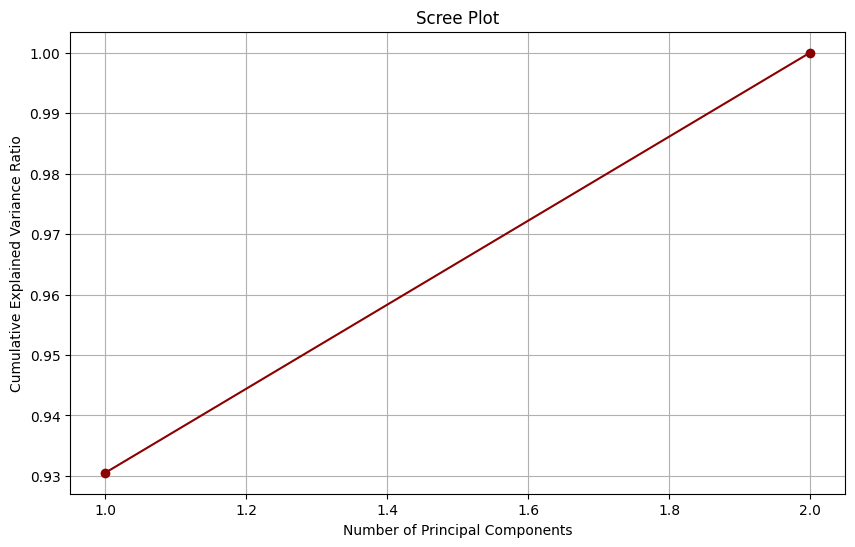

In [17]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Calculate the cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Plot the scree plot
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, 
         marker='o', color='darkred')  # Change color to darkgrey and add points
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid()
plt.show()

Index(['CustomerID', 'Name', 'Age', 'Gender', 'Location',
       'Subscription_Length_Months', 'Monthly_Bill', 'Total_Usage_GB',
       'Churn'],
      dtype='object')


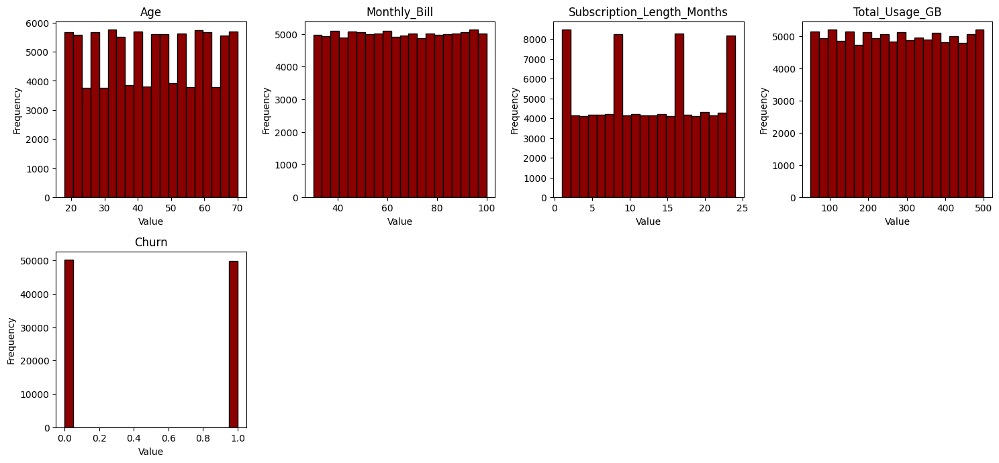

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your dataset
df = pd.read_excel(r"C:\Users\SUDEEP MADAGONDA\OneDrive\Desktop\Customer Churn Prediction\customer_churn_large_dataset.xlsx")

# Check the columns to identify available numerical columns
print(df.columns)

# Select numerical columns for histograms
numerical_columns = [
    'Age', 
    'Monthly_Bill', 
    'Subscription_Length_Months', 
    'Total_Usage_GB', 
    'Churn'  # Adjust as necessary
]

# Create a grid of histograms
plt.figure(figsize=(15, 10))

for i, column in enumerate(numerical_columns):
    plt.subplot(3, 4, i + 1)  # Adjust the subplot grid as necessary
    plt.hist(df[column], bins=20, color='darkred', edgecolor='black')
    plt.title(column)
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

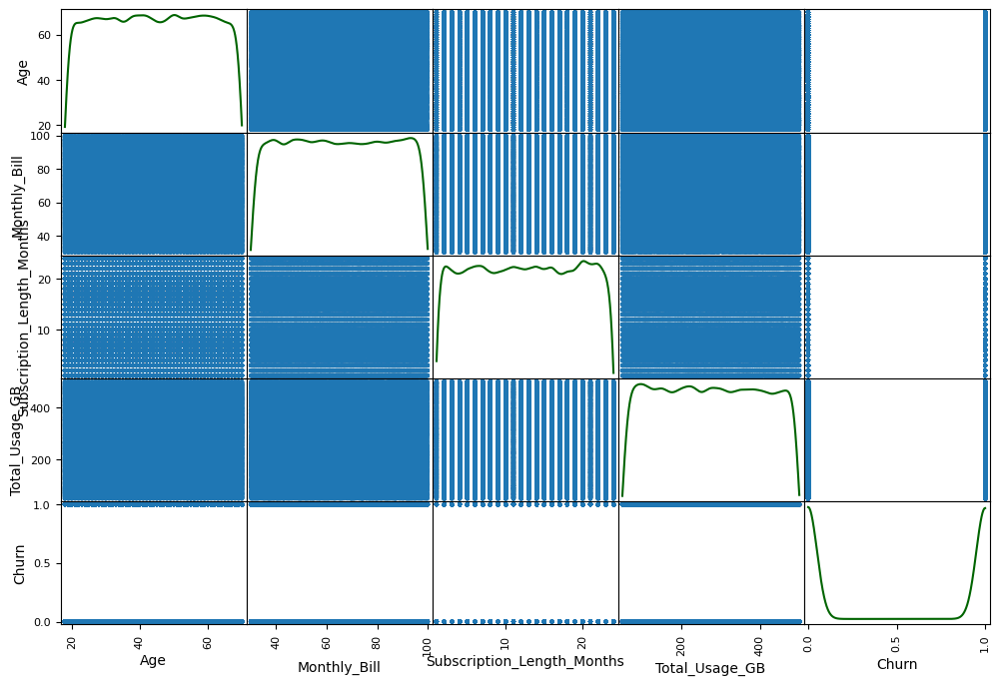

In [36]:
import pandas as pd
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt

# Load your dataset
df = pd.read_excel(r"C:\Users\SUDEEP MADAGONDA\OneDrive\Desktop\Customer Churn Prediction\customer_churn_large_dataset.xlsx")

# Define the attributes you want to plot
attributes = ["Age", 
              "Monthly_Bill", 
              "Subscription_Length_Months", 
              "Total_Usage_GB", 
              "Churn"]

# Create a scatter matrix for the specified attributes
axes = scatter_matrix(df[attributes], figsize=(12, 8), alpha=0.5, diagonal='kde')  # You can change 'kde' to 'hist' for histogram on diagonal

# Set the color of the scatter points to dark green
for ax in axes.flatten():
    for line in ax.get_lines():
        line.set_color('darkgreen')  # Set line color to dark green

plt.show()

In [33]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
missing_cols = set(X_train.columns) - set(X_test.columns)
for col in missing_cols:
    X_test[col] = 0  # Add missing columns with default values
X_test = X_test[X_train.columns]  # Reorder columns

X_train shape: (3, 2)
X_test shape: (20000, 8)


In [40]:
# Determine the optimal number of components based on explained variance
pca = PCA()
pca.fit(X_train)

# Explained variance ratio
explained_variance = pca.explained_variance_ratio_
print("Explained variance ratio:", explained_variance)

# Cumulative explained variance
cumulative_variance = explained_variance.cumsum()
print("Cumulative explained variance:", cumulative_variance)

# Choose a threshold (e.g., 95% variance explained)
threshold = 0.95
optimal_components = (cumulative_variance >= threshold).argmax() + 1
print(f"Optimal number of components to retain {threshold*100}% variance:", optimal_components)

# Apply PCA with the optimal number of components
pca = PCA(n_components=optimal_components)
X_train_pca = pca.fit_transform(X_train)

# Check shapes
print("Shape of X_train_pca:", X_train_pca.shape)


Explained variance ratio: [0.96104516 0.02308367 0.01317119 0.00269998]
Cumulative explained variance: [0.96104516 0.98412884 0.99730002 1.        ]
Optimal number of components to retain 95.0% variance: 1
Shape of X_train_pca: (80000, 1)


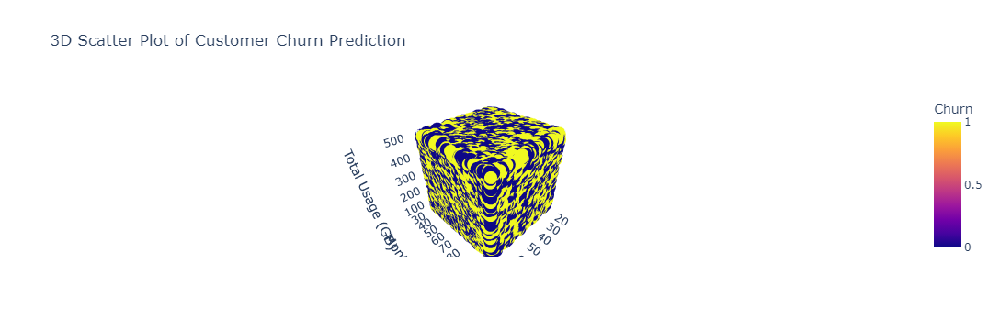

In [1]:
import pandas as pd
import plotly.express as px

# Load your dataset
data = pd.read_excel("C:\\Users\\SUDEEP MADAGONDA\\OneDrive\\Desktop\\Customer Churn Prediction\\customer_churn_large_dataset.xlsx")

# Create a 3D scatter plot
fig_3d = px.scatter_3d(data, 
                        x='Age',  # Replace with your chosen feature for x-axis
                        y='Monthly_Bill',  # Replace with your chosen feature for y-axis
                        z='Total_Usage_GB',  # Replace with your chosen feature for z-axis
                        color='Churn',  # Replace with your actual target column name
                        title='3D Scatter Plot of Customer Churn Prediction',
                        labels={'Age': 'Age', 'Monthly_Bill': 'Monthly Bill', 'Total_Usage_GB': 'Total Usage (GB)'},
                        color_discrete_sequence=['darkpink', 'lightpink'])  # Set colors for churned and non-churned

# Show the plot
fig_3d.show()